<a href="https://colab.research.google.com/github/Rivuozil/Skin-Cancer-Classification-for-Imbalanced-Datasets/blob/notebooks/notebooks/ISIC_EMB_MLP_ensemble.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip3 install umap-learn
!pip3 install imbalanced-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.9 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
# @title Global params


class Globals:
  # @markdown GCP project with GCS bucket of interest:
  gcp_project = 'mineral-liberty-429713-r0'  # @param

  # GCS bucket with data to read:
  gcs_bucket_name = 'isic_2019_images'  # @param

  # @markdown PAD Dataset files:
  # Metadata CSV from PAD dataset to read
  gcs_metadata_csv = '/content/ISIC_2019_Training_GroundTruth_modified.csv'  # @param

  # Images directory:
  gcs_images_dir1 = 'images/ISIC_2019_Training_Input_1'  # @param
  gcs_images_dir2 = 'images/ISIC_2019_Training_Input_2'  # @param
  gcs_images_dir3 = 'images/ISIC_2019_Training_Input_3'  # @param
  gcs_images_dir4 = 'images/ISIC_2019_Training_Input_4'  # @param

  # Column name to use for the small model
  label_column = 'labels'  # @param

  # Column to join the CSV to the images by path
  img_join_column = 'image' # @param

  # @markdown If precomputed embeddings should be used:
  # When true, use precomputed embeddings instead of generating
  # from scratch.
  gcs_use_precomputed_embeddings = False  # @param {type: "boolean"}

  # Path to precomputed embeddings
  gcs_precomputed_embeddings = 'pad_dataset/precomputed/embeddings.npz'  # @param

  # Access Token for `gcs_bucket_name`.
  # Note: You can also manually create and set this
  #   by using `gcloud auth print-access-token` in your local
  #   environment.
  gcs_creds = None

  # @markdown ---
  # @markdown Vertex AI end-point configuration:
  vertex_endpoint_project_id = '132886652110'  # @param
  vertex_endpoint_id = '180'  # @param
  vertex_endpoint_location = 'us-central1'  # @param

  random_state = 3141
  embeddings_size = 6144
  # @markdown ---
  # @markdown Training Parameters--Adjust this to reduce or increase the training size as a % of total training:
  train_split_size = 0.8 # @param
  # Note: this variable sets the training split. We set it by default to 0.15 to show how effective the model is on a small amount of data. You can increase it to see how more data improves the accuracy.

  ###### Formed during execution:

  # Client for querying GCS
  gcs_storage_client = None

  # Bucket object for loading files
  gcs_bucket = None

  # pd.DataFrame for the loaded metadata_csv
  metadata_df_dir1 = None
  metadata_df_dir2 = None
  metadata_df_dir3 = None
  metadata_df_dir4 = None
  metadata_df = '/content/ISIC_2019_Training_Metadata.csv'  # @param


  # Dict from image path -> embedding
  embeddings = dict()

  # pd.DataFrames for training/validation data splits
  df_train = None
  df_validate = None

  # ML model
  model1 = None
  model2 = None


In [41]:
# @title Imports

import collections
import copy
import hashlib
import io
import os
import subprocess
import textwrap
import time
from typing import List, Text
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import tabulate
import tensorflow as tf
import torch
import torch.nn.init as init
import umap
from sklearn.metrics import precision_recall_curve, auc, confusion_matrix, f1_score
from sklearn.ensemble import RandomForestClassifier
from torch.utils.data import DataLoader, WeightedRandomSampler, BatchSampler, Sampler

In [42]:
def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed) #LYZ: Set Python's hash seed to ensure consistent hashing operations.
    np.random.seed(seed)#Set NumPy’s random seed
    torch.manual_seed(seed)#Set NumPy’s random seed
    torch.cuda.manual_seed(seed)#Set PyTorch's GPU random seed.
    torch.backends.cudnn.deterministic = True# Set to use deterministic algorithms when using CuDNN (GPU-accelerated deep learning library) to ensure repeatability of results.
    torch.backends.cudnn.benchmark = True #Set to enable performance optimization of CuDNN to run faster.

    #LYZ: The call of this function can ensure that operations involving randomness (such as parameter initialization, data enhancement, etc.) are repeatable in different runs of the code.

seed_everything()

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Currently using "{device.upper()}" device.')

Currently using "CPU" device.


In [43]:
classes_to_int_isic = {'MEL':0,'NV':1,'BCC':2, 'AK':3, 'BKL':4, 'DF':5, 'VASC': 6,'SCC': 7}
int_to_classes_isic = {0:'MEL', 1:'NV',2:'BCC', 3:'AK', 4:'BKL', 5:'DF', 6:'VASC', 7:'SCC'}

set1_labels=[0,1,2]
set2_labels=[3,4,5,6,7]
num_classes=len(int_to_classes_isic.keys())
embedding_dim=6144
batch_size=32
learning_rate=0.001
epochs=40


In [44]:
from google.cloud import storage


def list_blobs(storage_client, bucket_name):
  """Helper to list blobs in a bucket (useful for debugging)."""
  blobs = storage_client.list_blobs(bucket_name)
  for blob in blobs:
    print(blob)


def load_dataset(bucket, csv_path, images_dir, start_index, end_index):
  """Loads the given CSV into a pd.DataFrame."""
  #images_dir=os.path.join(Globals.gcs_bucket_name,images_dir)
  df = pd.read_csv(Globals.gcs_metadata_csv)
  df['img_path'] = df[Globals.img_join_column].apply(lambda x: os.path.join(images_dir, x))
  df['img_path'] = df['img_path']+".jpg"
  df=df[start_index:end_index]

  return df


Globals.gcs_storage_client = storage.Client(Globals.gcp_project)
#list_blobs(Globals.gcs_storage_client, Globals.gcs_bucket_name)
Globals.gcs_bucket = Globals.gcs_storage_client.bucket(Globals.gcs_bucket_name)
print(f'Bucket: {Globals.gcs_bucket.name}')
Globals.metadata_df_dir1 = load_dataset(
    Globals.gcs_bucket, Globals.gcs_metadata_csv, Globals.gcs_images_dir1, 0, 5292
)
Globals.all_col_vals = sorted(set(Globals.metadata_df_dir1[Globals.label_column]))
Globals.metadata_df_dir2 = load_dataset(
   Globals.gcs_bucket, Globals.gcs_metadata_csv, Globals.gcs_images_dir2, 5293, 11892
)
Globals.all_col_vals = sorted(set(Globals.metadata_df_dir2[Globals.label_column]))
Globals.metadata_df_dir3 = load_dataset(
    Globals.gcs_bucket, Globals.gcs_metadata_csv, Globals.gcs_images_dir3, 11893, 16608
)
Globals.all_col_vals = sorted(set(Globals.metadata_df_dir3[Globals.label_column]))
Globals.metadata_df_dir4 = load_dataset(
   Globals.gcs_bucket, Globals.gcs_metadata_csv, Globals.gcs_images_dir4, 16609, 23257
)
Globals.all_col_vals = sorted(set(Globals.metadata_df_dir4[Globals.label_column]))

Globals.metadata_df=pd.concat([Globals.metadata_df_dir1, Globals.metadata_df_dir2, Globals.metadata_df_dir3, Globals.metadata_df_dir4])
Globals.metadata_df.reset_index(drop=True, inplace=True)

Bucket: isic_2019_images


In [ ]:
Globals.metadata_df

,Unnamed: 0,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,labels,img_path
0,0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,images/ISIC_2019_Training_Input_1/ISIC_0000000...
1,1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,images/ISIC_2019_Training_Input_1/ISIC_0000001...
2,2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,images/ISIC_2019_Training_Input_1/ISIC_0000002...
3,3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,images/ISIC_2019_Training_Input_1/ISIC_0000003...
4,4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,images/ISIC_2019_Training_Input_1/ISIC_0000004...
...,...,...,...,...,...,...,...,...,...,...,...,...
23249,25326,ISIC_0073247,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,images/ISIC_2019_Training_Input_4/ISIC_0073247...
23250,25327,ISIC_0073248,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4,images/ISIC_2019_Training_Input_4/ISIC_0073248...
23251,25328,ISIC_0073249,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,images/ISIC_2019_Training_Input_4/ISIC_0073249...
23252,25329,ISIC_0073251,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,images/ISIC_2019_Training_Input_4/ISIC_0073251...


In [45]:
file_path1='/content/drive/MyDrive/Swarnava/{imagesISIC_2019_Training_Input_1IS.txt'
file_path2='/content/drive/MyDrive/Swarnava/{imagesISIC_2019_Training_Input_2IS.txt'
file_path3='/content/drive/MyDrive/Swarnava/{imagesISIC_2019_Training_Input_3IS.txt'
file_path4='/content/drive/MyDrive/Swarnava/isic_embeddings_4.json'
file_path5='/content/drive/MyDrive/Swarnava/isic_embeddings_missing.json'

with open(file_path1, 'r', encoding='utf-8') as file:
    data_1=file.read()

data_1=json.loads(data_1)
print(data_1.keys())
with open(file_path2, 'r', encoding='utf-8') as file:
    data_2=file.read()

data_2=json.loads(data_2)
print(data_2.keys())
with open(file_path3, 'r', encoding='utf-8') as file:
    data_3=file.read()

data_3=json.loads(data_3)
print(data_3.keys())

with open(file_path4, 'r') as file:
    data_4=json.load(file)


print(data_4.keys())

with open(file_path5, 'r') as file:
    data_5=json.load(file)

print(data_5.keys())

embeddings_map=data_1.copy()
embeddings_map.update(data_2)
embeddings_map.update(data_3)
embeddings_map.update(data_4)
embeddings_map.update(data_5)

print(len(embeddings_map.keys()))




dict_keys(['images/ISIC_2019_Training_Input_1/ISIC_0000003.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000001.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000000.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000002.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000004.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000006.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000007.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000010.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000008.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000009.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000011.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000012.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000014.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000013.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000015.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000016.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000066.jpg', 'images/ISIC_2019_Training_Input_1/ISIC_0000067.jpg', 'images/ISIC_2019

In [ ]:
# Check that we have an embedding for every image
if len(embeddings_map.keys()) < len(Globals.metadata_df)-2:
  raise ValueError(
      f'Expected {len(Globals.metadata_df)-2} embeddings to be present. '
      f'Got {len(embeddings_map.keys())}.\n'
      'Maybe the "Generate embeddings" cell should be run again? This can '
      'happen if there are intermittent API errors.'
  )

In [46]:
seed=42

from sklearn.model_selection import train_test_split
data=Globals.metadata_df
test_data=pd.DataFrame(columns=Globals.metadata_df.columns)


for class_idx in int_to_classes_isic.keys():
    class_data=Globals.metadata_df[Globals.metadata_df["labels"]==class_idx]
    train_valid_split, test_split=train_test_split(class_data, test_size=0.2, stratify=class_data['labels'], random_state=seed)
    test_data=pd.concat([test_data, test_split])

data=data[~data["image"].isin(test_data["image"])]

train_split,validation_split=train_test_split(data, test_size=0.2, stratify=data["labels"], random_state=seed)
train_split, calib_split=train_test_split(train_split, test_size=0.1, stratify=train_split["labels"], random_state=seed)

train_split_1=train_split[train_split['labels'].isin(set1_labels)]
train_split_2=train_split[train_split['labels'].isin(set2_labels)]
valid_split_1=validation_split[validation_split['labels'].isin(set1_labels)]
valid_split_2=validation_split[validation_split['labels'].isin(set2_labels)]

train_split_1.reset_index(drop=True, inplace=True)
train_split_2.reset_index(drop=True, inplace=True)
valid_split_1.reset_index(drop=True, inplace=True)
valid_split_2.reset_index(drop=True, inplace=True)
train_split.reset_index(drop=True, inplace=True)
validation_split.reset_index(drop=True, inplace=True)
test_data.reset_index(drop=True, inplace=True)
calib_split.reset_index(drop=True, inplace=True)

<ipython-input-46-27d62297555a>:11: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_data=pd.concat([test_data, test_split])


In [ ]:
#@title test expt
seed=42

from sklearn.model_selection import train_test_split
data=metadata_test
test_data=pd.DataFrame(columns=metadata_test.columns)


for class_idx in test_range:
    class_data=data[data["labels"]==class_idx]
    train_valid_split, test_split=train_test_split(class_data, test_size=0.2, stratify=class_data['labels'], random_state=seed)
    test_data=pd.concat([test_data, test_split])

data=data[~data["image"].isin(test_data["image"])]

train_split,validation_split=train_test_split(data, test_size=0.2, stratify=data["labels"], random_state=seed)
train_split, calib_split=train_test_split(train_split, test_size=0.1, stratify=train_split["labels"], random_state=seed)

train_split.reset_index(drop=True, inplace=True)
validation_split.reset_index(drop=True, inplace=True)
test_data.reset_index(drop=True, inplace=True)
calib_split.reset_index(drop=True, inplace=True)

<ipython-input-12-fc7ba673fb4e>:12: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_data=pd.concat([test_data, test_split])


In [47]:
class embDataset(torch.utils.data.Dataset):
    def __init__(self, data, embeddings_map):
        self.data = data
        self.embeddings_map = embeddings_map

    def __len__(self):
        return len(self.data)

    def __getitem__(self, id):

        image_path = self.data["img_path"][id]
        parent_folder = image_path.split('/')[-2]


        # Retrieve the embedding for the image path
        emb = self.embeddings_map.get(image_path)
        if emb is None:
            raise ValueError(f"Embedding not found for {image_path}")

        emb = torch.tensor(emb, dtype=torch.float32)

        # Retrieve the label for the image path
        label = torch.as_tensor(
            self.data.loc[self.data["img_path"] == image_path, "labels"].item(),
            dtype=torch.int64
        )

        return emb, label

    def get_weights(self, weights):

        arr=[]
        for label in self.data['labels']:
            arr.append(weights[label])
        return arr

    def collate_fn(self, batch):
        # Filter out None values (if any)
        batch = [item for item in batch if item is not None]
        emb, labels = list(zip(*batch))
        emb = torch.stack(emb, dim=0).to(device)
        labels = torch.tensor(labels).to(device)
        return emb, labels


# Dataset and DataLoader setup
ISICEmbCalibSet = embDataset(calib_split, embeddings_map)
ISICEmbTestSet = embDataset(test_data, embeddings_map)
ISICEmbTrainSet = embDataset(train_split, embeddings_map)
ISICEmbValSet = embDataset(validation_split, embeddings_map)

ISICEmbTrainLoader = torch.utils.data.DataLoader(
    ISICEmbTrainSet, batch_size=batch_size, shuffle=True, collate_fn=ISICEmbTrainSet.collate_fn
)
ISICEmbValLoader = torch.utils.data.DataLoader(
    ISICEmbValSet, batch_size=batch_size, shuffle=False, collate_fn=ISICEmbValSet.collate_fn
)

ISICEmbCalibLoader = torch.utils.data.DataLoader(
    ISICEmbCalibSet, batch_size=1, shuffle=False, collate_fn=ISICEmbCalibSet.collate_fn
)
ISICEmbTestLoader = torch.utils.data.DataLoader(
    ISICEmbTestSet, batch_size=batch_size, shuffle=False, collate_fn=ISICEmbTestSet.collate_fn
)
ISICEmbTestLoader2 = torch.utils.data.DataLoader(
    ISICEmbTestSet, batch_size=1, shuffle=False, collate_fn=ISICEmbTestSet.collate_fn
)
print(len(ISICEmbTrainSet))
print(len(ISICEmbValSet))
print(len(ISICEmbCalibSet))
print(len(ISICEmbTestSet))

# Test the DataLoader
for embs, labels in ISICEmbTrainLoader:
    print(embs.shape)
    print(labels.shape)
    break



13392
3720
1488
4654
torch.Size([32, 6144])
torch.Size([32])


In [48]:
class WeightSampler(Sampler):

    def __init__(self, data, weights):
        self.dataset=data
        self.weights=weights
        self.n=len(data)
        self.weights_mean=np.mean(self.weights)
        self.weights_var=np.var(self.weights)
        self.weights_std=np.std(self.weights)
        self.min_weight=self.weights_mean+2*self.weights_std


    def __iter__(self):
        class_0_idxs=np.where(self.dataset.data['labels']==0)[0]
        class_1_idxs=np.where(self.dataset.data['labels']==1)[0]
        class_2_idxs=np.where(self.dataset.data['labels']==2)[0]
        class_3_idxs=np.where(self.dataset.data['labels']==3)[0]
        class_4_idxs=np.where(self.dataset.data['labels']==4)[0]
        class_5_idxs=np.where(self.dataset.data['labels']==5)[0]
        class_6_idxs=np.where(self.dataset.data['labels']==6)[0]
        class_7_idxs=np.where(self.dataset.data['labels']==7)[0]

        threshold = self.weights_mean+self.weights_std

        class_0=np.random.choice(class_0_idxs, size=int(self.n*self.weights[0]), replace=True) if self.weights[0]>threshold else np.random.choice(class_0_idxs, size=int(self.min_weight*self.n), replace=True)
        class_1=np.random.choice(class_1_idxs, size=int(self.n*self.weights[1]), replace=True) if self.weights[1]>threshold else np.random.choice(class_1_idxs, size=int(self.min_weight*self.n), replace=True)
        class_2=np.random.choice(class_2_idxs, size=int(self.n*self.weights[2]), replace=True) if self.weights[2]>threshold else np.random.choice(class_2_idxs, size=int(self.min_weight*self.n), replace=True)
        class_3=np.random.choice(class_3_idxs, size=int(self.n*self.weights[3]), replace=True) if self.weights[3]>threshold else np.random.choice(class_3_idxs, size=int(self.min_weight*self.n), replace=True)
        class_4=np.random.choice(class_4_idxs, size=int(self.n*self.weights[4]), replace=True) if self.weights[4]>threshold else np.random.choice(class_4_idxs, size=int(self.min_weight*self.n), replace=True)
        class_5=np.random.choice(class_5_idxs, size=int(self.n*self.weights[5]), replace=True) if self.weights[5]>threshold else np.random.choice(class_5_idxs, size=int(self.min_weight*self.n), replace=True)
        class_6=np.random.choice(class_6_idxs, size=int(self.n*self.weights[6]), replace=True) if self.weights[6]>threshold else np.random.choice(class_6_idxs, size=int(self.min_weight*self.n), replace=True)
        class_7=np.random.choice(class_7_idxs, size=int(self.n*self.weights[7]), replace=True) if self.weights[7]>threshold else np.random.choice(class_7_idxs, size=int(self.min_weight*self.n), replace=True)

        print(self.n)
        print(self.weights>threshold)
        print(class_0.shape)
        print(class_1.shape)
        print(class_2.shape)
        print(class_3.shape)
        print(class_4.shape)
        print(class_5.shape)
        print(class_6.shape)
        print(class_7.shape)
        idxs=np.hstack([class_0, class_1, class_2, class_3, class_4, class_5, class_6, class_7])
        np.random.shuffle(idxs)
        idxs=idxs[:self.n]
        return iter(idxs)

    def __len__(self):
        return self.n


In [ ]:
isic_train_embeddings=np.zeros((len(train_split), embedding_dim))
isic_train_labels=np.zeros((len(train_split)))

index=0
for class_idx in int_to_classes_isic.keys():
    class_data=train_split[train_split['labels']==class_idx]
    for i in range(len(class_data)):
        isic_train_embeddings[index]=embeddings_map[class_data['img_path'].iloc[i]]
        isic_train_labels[index]=class_idx
        index+=1
'''
isic_train_embeddings2={i:[] for i in range(num_classes)}
#isic_train_labels2=np.zeros(len(ISICEmbTrainSet2))

index=0
for class_idx in int_to_classes_isic.keys():
    class_data=train_split_2[train_split_2['labels']==class_idx]
    for i in range(len(class_data)):
        isic_train_embeddings2[class_idx].append(embeddings_map[class_data['img_path'].iloc[i]])
        #isic_train_labels2[index]=class_idx
        #index+=1

isic_train_embeddings=isic_train_embeddings1.copy()
isic_train_embeddings.update(isic_train_embeddings2)
#isic_train_labels=np.concatenate((isic_train_labels1, isic_train_labels2), axis=0)
'''
print(len(isic_train_embeddings))
#print(len(isic_train_labels))

13392


In [ ]:
!pip3 install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.3 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


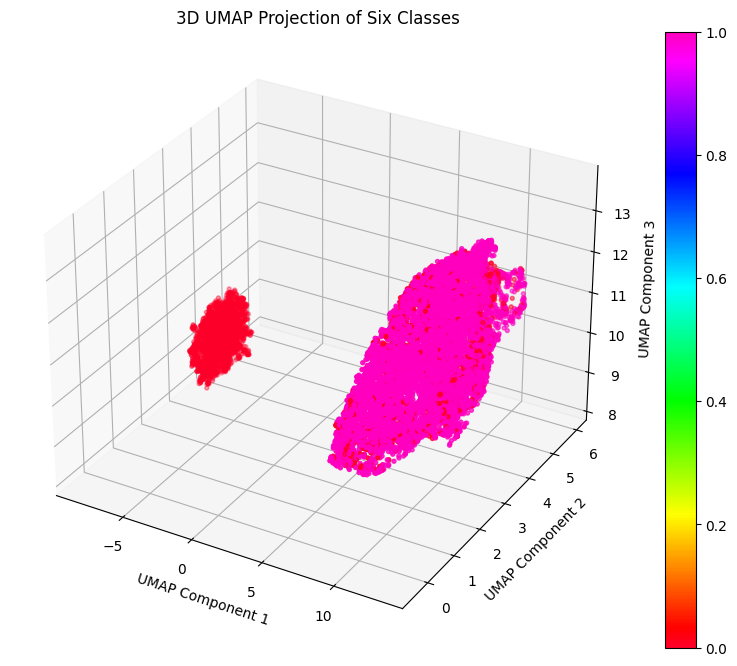

In [ ]:
umap_reducer=umap.UMAP(n_components=3, random_state=49)
umap_input=[]
umap_targets=[]
set3_labels=[0,1,4]
for i in range(len(isic_train_embeddings)):
    if isic_train_labels[i] in set3_labels:
        umap_input.append(isic_train_embeddings[i])
        umap_targets.append(isic_train_labels[i])

reduced_embeddings_3d=umap_reducer.fit_transform(umap_input)
labels=umap_targets

fig=plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_embeddings_3d[:, 0], reduced_embeddings_3d[:, 1], reduced_embeddings_3d[:, 2],
                      c=labels, cmap='gist_rainbow', s=8)  # 'tab10' for 10 distinct colors

plt.colorbar(scatter, ax=ax)
ax.set_title('3D UMAP Projection of Six Classes')
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')

plt.show()

In [ ]:
print(len(test_data))
print(len(ISICEmbTestSet))

4654
4654


In [ ]:
isic_test_embeddings=np.zeros((len(test_data), embedding_dim))
isic_test_labels=torch.zeros(len(test_data))
index=0
for i in range(len(ISICEmbTestSet)):
    isic_test_embeddings[index]=embeddings_map[test_data['img_path'].iloc[i]]
    isic_test_labels[index]=test_data['labels'].iloc[i]
    index+=1


NameError: name 'ISICEmbTestSet' is not defined

In [49]:
class_counts_isic=train_split['labels'].value_counts()
print(class_counts_isic)

labels
1    6656
0    2389
2    1913
4    1290
3     498
7     362
6     146
5     138
Name: count, dtype: int64


In [50]:
class_counts_val=validation_split['labels'].value_counts()
print(class_counts_val)

labels
1    1849
0     663
2     532
4     359
3     139
7     100
6      40
5      38
Name: count, dtype: int64


In [51]:
from sklearn.utils import resample
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

variance=137
pca=PCA(n_components=variance)
umap_reducer=umap.UMAP()
scaler=MinMaxScaler()

isic_train_embeddings=np.zeros((len(train_split), embedding_dim))
isic_train_labels=np.zeros(len(train_split))

index=0
index2=0
for class_idx, counts in class_counts_isic.items():

        class_data = train_split[train_split["labels"] == class_idx]
        print(len(class_data))
        #class_data=resample(class_data, replace=False, n_samples=2300, random_state=42)
        #data=(class_data['img_path'])
        for i,row in class_data.iterrows():
            isic_train_embeddings[index2]=embeddings_map[row["img_path"]]
            isic_train_labels[index2]=class_idx
            index2+=1
'''
isic_reduced_embeddings=pca.fit_transform(isic_train_embeddings)
isic_normalized_embeddings=scaler.fit_transform(isic_reduced_embeddings)
print(isic_train_embeddings.shape)
print(isic_reduced_embeddings.shape)
print(isic_train_labels)
'''

6656
2389
1913
1290
498
362
146
138


'\nisic_reduced_embeddings=pca.fit_transform(isic_train_embeddings)\nisic_normalized_embeddings=scaler.fit_transform(isic_reduced_embeddings)\nprint(isic_train_embeddings.shape)\nprint(isic_reduced_embeddings.shape)\nprint(isic_train_labels)\n'

In [52]:
isic_val_embeddings=np.zeros((len(validation_split), embedding_dim))
isic_val_labels=np.zeros(len(validation_split))
isic_calib_embeddings=np.zeros((len(calib_split), embedding_dim))
isic_calib_labels=np.zeros(len(calib_split))
isic_test_embeddings=np.zeros((len(test_data), embedding_dim))
isic_test_labels=np.zeros(len(test_data))

index=0
for class_idx in int_to_classes_isic.keys():
    class_data = validation_split[validation_split["labels"] == class_idx]
    for i in range(len(class_data)):
        isic_val_embeddings[index] = embeddings_map[class_data["img_path"].iloc[i]]
        isic_val_labels[index] = class_idx
        index+=1

index=0
for class_idx in int_to_classes_isic.keys():
    class_data = calib_split[calib_split["labels"] == class_idx]
    for i in range(len(class_data)):
        isic_calib_embeddings[index] = embeddings_map[class_data["img_path"].iloc[i]]
        isic_calib_labels[index] = class_idx
        index+=1

index=0
for class_idx in int_to_classes_isic.keys():
    class_data = test_data[test_data["labels"] == class_idx]
    for i in range(len(class_data)):
        isic_test_embeddings[index] = embeddings_map[class_data["img_path"].iloc[i]]
        isic_test_labels[index] = class_idx
        index+=1
'''
isic_reduced_val_embeddings=pca.fit_transform(isic_val_embeddings)
isic_normalized_val_embeddings=scaler.fit_transform(isic_reduced_val_embeddings)
isic_reduced_calib_embeddings=pca.fit_transform(isic_calib_embeddings)
isic_normalized_calib_embeddings=scaler.fit_transform(isic_reduced_calib_embeddings)
isic_reduced_test_embeddings=pca.fit_transform(isic_test_embeddings)
isic_normalized_test_embeddings=scaler.fit_transform(isic_reduced_test_embeddings)

print(isic_normalized_val_embeddings.shape)
print(isic_normalized_calib_embeddings.shape)
print(isic_normalized_test_embeddings.shape)
'''

'\nisic_reduced_val_embeddings=pca.fit_transform(isic_val_embeddings)\nisic_normalized_val_embeddings=scaler.fit_transform(isic_reduced_val_embeddings)\nisic_reduced_calib_embeddings=pca.fit_transform(isic_calib_embeddings)\nisic_normalized_calib_embeddings=scaler.fit_transform(isic_reduced_calib_embeddings)\nisic_reduced_test_embeddings=pca.fit_transform(isic_test_embeddings)\nisic_normalized_test_embeddings=scaler.fit_transform(isic_reduced_test_embeddings)\n\nprint(isic_normalized_val_embeddings.shape)\nprint(isic_normalized_calib_embeddings.shape)\nprint(isic_normalized_test_embeddings.shape)\n'

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import KFold, cross_val_score

brf=BalancedRandomForestClassifier(n_estimators=1000, criterion='entropy', max_features='sqrt', max_samples=0.8, bootstrap=True,
                                   min_samples_leaf=1, min_samples_split=3, class_weight=class_weights_dict, random_state=42, n_jobs=2,
                                   replacement=True, sampling_strategy='auto', max_depth=None)

brf.fit(isic_train_embeddings, isic_train_labels)
kfold=KFold(n_splits=10, shuffle=True, random_state=57)
accs=[]
scores=cross_val_score(brf, isic_test_embeddings, isic_test_labels, cv=kfold)

print("Accuracy scores:", scores)
print("Average accuracy:", np.mean(scores))
print("Standard deviation:", np.std(scores))

Accuracy scores: [0.60729614 0.60944206 0.60729614 0.61373391 0.5827957  0.62795699
 0.57849462 0.58924731 0.59784946 0.6172043 ]
Average accuracy: 0.6031316627440122
Standard deviation: 0.014974853292573751


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, cross_val_score
'''
param_grid = {
    'n_estimators': [20, 50, 100, 500, 1000],
    'criterion': ["gini", "entropy"],
    'min_samples_split': [2,3,4,5],
    'max_features': ['sqrt', 'log2'],
    'bootstrap' : [True],
    'max_samples': [0.5, 0.8]
}'''

brf=BalancedRandomForestClassifier()
'''
grid_search=GridSearchCV(estimator=brf, param_grid=param_grid, cv=5)
grid_search.fit(isic_train_embeddings, isic_train_labels)
best_params=grid_search.best_params_
best_svm=grid_search.best_estimator_
'''
y_preds=best_svm.predict(isic_test_embeddings)
kfold=KFold(n_splits=10, shuffle=True, random_state=57)
accs=[]
scores=cross_val_score(best_svm, isic_test_embeddings, isic_test_labels, cv=kfold)

print("Best params: ", best_params)
print("Accuracy scores:", scores)
print("Average accuracy:", np.mean(scores))
print("Standard deviation:", np.std(scores))


/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/usr/local/li

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, cross_val_score
from sklearn.svm import SVC
Globals.model1=SVC(gamma=0.1, kernel='poly', C=0.1, probability=True)
Globals.model1.fit(isic_train_embeddings, isic_train_labels)
y_preds=Globals.model1.predict(isic_test_embeddings)

kfold=KFold(n_splits=10, shuffle=True, random_state=57)
accs=[]

scores=cross_val_score(Globals.model1, isic_test_embeddings, isic_test_labels, cv=kfold)
acc_scores=accuracy_score(isic_test_labels, y_preds)
print("Accuracy scores:", scores)
print("Average accuracy:", np.mean(scores))
print("Standard deviation:", np.std(scores))

Accuracy scores: [0.72961373 0.72103004 0.73819742 0.74678112 0.72473118 0.73548387
 0.70967742 0.73978495 0.7311828  0.77419355]
Average accuracy: 0.7350676081037427
Standard deviation: 0.016412376107120187


In [ ]:
Accuracy scores: [069495166 0.73039742 0.70784103 0.7056928
Average accuracy: 0.7116475520598732
Standard deviation: 0.012162739629456918
0.71935484]

In [ ]:
class customSampler(Sampler):
 def __init__(self, data=None, labels=None, weights=None, n=None):
        self.data=data
        self.labels=labels
        self.weights=weights
        self.n=n

 def __iter__(self):
        class_0_idxs=np.where(self.labels==0)[0]
        class_1_idxs=np.where(self.labels==1)[0]
        class_2_idxs=np.where(self.labels==2)[0]
        class_3_idxs=np.where(self.labels==3)[0]
        class_4_idxs=np.where(self.labels==4)[0]
        class_5_idxs=np.where(self.labels==5)[0]
        class_6_idxs=np.where(self.labels==6)[0]
        class_7_idxs=np.where(self.labels==7)[0]

        threshold = np.percentile(self.weights, 50)

        class_0=np.random.choice(class_0_idxs, size=int(len(self.data)*self.weights[0]), replace=True) if self.weights[0]>threshold else class_0_idxs[:int(len(class_0_idxs/2))]
        class_1=np.random.choice(class_1_idxs, size=int(len(self.data)*self.weights[1]), replace=True) if self.weights[1]>threshold else class_1_idxs[:int(len(class_1_idxs/5))]
        class_2=np.random.choice(class_2_idxs, size=int(len(self.data)*self.weights[2]), replace=True) if self.weights[2]>threshold else class_2_idxs[:int(len(class_2_idxs/2))]
        class_3=np.random.choice(class_3_idxs, size=int(len(self.data)*self.weights[3]), replace=True) if self.weights[3]>threshold else class_3_idxs
        class_4=np.random.choice(class_4_idxs, size=int(len(self.data)*self.weights[4]), replace=True) if self.weights[4]>threshold else class_4_idxs
        class_5=np.random.choice(class_5_idxs, size=int(len(self.data)*self.weights[5]), replace=True) if self.weights[5]>threshold else class_5_idxs
        class_6=np.random.choice(class_6_idxs, size=int(len(self.data)*self.weights[6]), replace=True) if self.weights[6]>threshold else class_6_idxs
        class_7=np.random.choice(class_7_idxs, size=int(len(self.data)*self.weights[7]), replace=True) if self.weights[7]>threshold else class_7_idxs

        idxs=np.hstack([class_0, class_1, class_2, class_3, class_4, class_5, class_6, class_7])
        np.random.shuffle(idxs)
        idxs=idxs[:self.n]
        return iter(idxs)

 def __len__(self):
        return self.n

In [ ]:
# @title sklearn LogisticRegression model
from sklearn.linear_model import LogisticRegression
import torch.nn as nn
import torch.optim as optim

class Swish(nn.Module):
    def forward(self, x):
        return x * torch.sigmoid(x)

class MLP(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.batchNorm1 = nn.BatchNorm1d(1024)
        self.relu1 = nn.ELU()
        self.dropout1 = nn.Dropout(0.8)
        self.fc2 = nn.Linear(1024, 256)
        self.batchNorm2 = nn.BatchNorm1d(256)
        self.relu2 = nn.ELU()
        self.dropout2 = nn.Dropout(0.7)
        self.fc3 = nn.Linear(256,128)
        self.batchNorm3 = nn.BatchNorm1d(128)
        self.relu3 = nn.ELU()
        self.dropout3 = nn.Dropout(0.7)
        self.fc4 = nn.Linear(128, 64)
        self.batchNorm4 = nn.BatchNorm1d(64)
        self.relu4 = nn.ELU()
        self.dropout4 = nn.Dropout(0.5)
        self.fc5 = nn.Linear(64, num_classes)

    def initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm1d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

    def forward(self, x):

        x = self.fc1(x)
        x = self.batchNorm1(x)
        x = self.relu1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.batchNorm2(x)
        x = self.relu2(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.batchNorm3(x)
        x = self.relu3(x)
        x = self.dropout3(x)
        x = self.fc4(x)
        x = self.batchNorm4(x)
        x = self.relu4(x)
        x = self.dropout4(x)
        x = self.fc5(x)
        return x

class MLPwithSoftMax(nn.Module):
    def __init__(self,original_model):
        super(MLPwithSoftMax, self).__init__()
        self.base_model=original_model
        self.softmax=nn.Softmax(dim=1)

    def forward(self, x):
        x = self.base_model(x)
        x = self.softmax(x)
        return x

Globals.model=MLP(embedding_dim, num_classes)
softmax_model=MLPwithSoftMax(Globals.model).to(device)
Globals.model.initialize_weights()






In [53]:
# @title sklearn LogisticRegression model
from sklearn.linear_model import LogisticRegression
import torch.nn as nn
import torch.optim as optim

class Swish(nn.Module):
    def forward(self, x):
        return x * torch.sigmoid(x)

class MLP2048(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(MLP2048, self).__init__()
        self.fc1 = nn.Linear(input_dim, 2048)
        self.batchNorm1 = nn.BatchNorm1d(2048)
        self.relu1 = nn.ELU()
        self.dropout1 = nn.Dropout(0.8)
        self.fc2 = nn.Linear(2048, 1024)
        self.batchNorm2 = nn.BatchNorm1d(1024)
        self.relu2 = nn.ELU()
        self.dropout2 = nn.Dropout(0.7)
        self.fc3 = nn.Linear(1024,512)
        self.batchNorm3 = nn.BatchNorm1d(512)
        self.relu3 = nn.ELU()
        self.dropout3 = nn.Dropout(0.7)
        self.fc4 = nn.Linear(512,256)
        self.batchNorm4 = nn.BatchNorm1d(256)
        self.relu4 = nn.ELU()
        self.dropout4 = nn.Dropout(0.5)
        self.fc5 = nn.Linear(256, 128)
        self.batchNorm5 = nn.BatchNorm1d(128)
        self.relu5 = nn.ELU()
        self.dropout5 = nn.Dropout(0.5)
        self.fc6 = nn.Linear(128,64)
        self.batchNorm6 = nn.BatchNorm1d(64)
        self.relu6 = nn.ELU()
        self.dropout6 = nn.Dropout(0.5)
        self.fc7 = nn.Linear(64, num_classes)

    def initialize_weights(self):
        for m in self.modules():
           if isinstance(m, nn.Linear):
              init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
              if m.bias is not None:
                init.constant_(m.bias, 0)
           elif isinstance(m, nn.BatchNorm1d):
              init.constant_(m.weight, 1)
              init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.fc1(x)
        x = self.batchNorm1(x)
        x = self.relu1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.batchNorm2(x)
        x = self.relu2(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.batchNorm3(x)
        x = self.relu3(x)
        x = self.dropout3(x)
        x = self.fc4(x)
        x = self.batchNorm4(x)
        x = self.relu4(x)
        x = self.dropout4(x)
        x = self.fc5(x)
        x = self.batchNorm5(x)
        x = self.relu5(x)
        x = self.dropout5(x)
        x = self.fc6(x)
        x = self.batchNorm6(x)
        x = self.relu6(x)
        x = self.dropout6(x)
        x = self.fc7(x)
        return x

class MLPwithSoftMax(nn.Module):
        def __init__(self,original_model):
            super(MLPwithSoftMax, self).__init__()
            self.base_model=original_model
            self.softmax=nn.Softmax(dim=1)

        def forward(self, x):
            x = self.base_model(x)
            x = self.softmax(x)
            return x


Globals.model1=MLP2048(embedding_dim, num_classes)
softmax_model=MLPwithSoftMax(Globals.model1).to(device)
Globals.model1.initialize_weights()
Globals.model2=MLP2048(embedding_dim, num_classes)
softmax_model=MLPwithSoftMax(Globals.model2).to(device)
Globals.model2.initialize_weights()

In [54]:
def calc_accuracy(y_pred, y_true):
    print(y_pred.dtype)
    return (y_true == torch.max(y_pred, 1)[1]).float().mean()

In [ ]:
import numpy as np

def classwise_accuracy(preds, targets, num_classes):
    """
    Calculates classwise accuracy for a batch of predicted and true labels using numpy arrays.

    Args:
        preds (np.ndarray): Predicted labels (batch size,).
        targets (np.ndarray): True labels (batch size,).
        num_classes (int): The total number of classes.

    Returns:
        dict: A dictionary where the key is the class index and the value is the accuracy for that class.
    """
    correct_predictions = {i: 0 for i in range(num_classes)}
    total_instances = {i: 0 for i in range(num_classes)}

    # Count correct predictions and total instances for each class
    for pred, target in zip(preds, targets):
        total_instances[target] += 1
        if pred == target:
            correct_predictions[target] += 1

    # Calculate class-wise accuracy
    class_accuracies = {}
    for class_id in range(num_classes):
        if total_instances[class_id] > 0:
            class_accuracies[class_id] = correct_predictions[class_id] / total_instances[class_id]
        else:
            class_accuracies[class_id] = 0  # If no samples for a class, set accuracy to 0

    # Inversely scale accuracies to create sampling weights (higher accuracy -> lower weight)
    accuracies = np.array(list(class_accuracies.values()))

    # To avoid division by zero, add a small epsilon where accuracies are zero
    epsilon = 1e-8
    accuracies = np.where(accuracies == 0, epsilon, accuracies)

    # Create sampling weights (1 / accuracy) and normalize them
    inverse_accuracies = 1.0 / accuracies
    sampling_weights = inverse_accuracies / np.sum(inverse_accuracies)  # Normalize weights

    return class_accuracies, sampling_weights


In [ ]:
def calculate_auprc(y_scores, y_true):
    precision = [0]*num_classes
    recall = [0]*num_classes
    auprc_per_class = [0]*num_classes

    # Loop over each class to calculate AUPRC for each one
    for i in range(len(y_true)):
        for j in range(num_classes):
        # Precision-recall curve: Treat this class as positive in one-vs-rest fashion
            precision[j], recall[j], _ = precision_recall_curve(y_true == j, y_scores[:, j])
        # Calculate AUPRC for the class
            auprc_per_class[j] = 1/auc(recall[j], precision[j])

    sum_auprc=np.sum(auprc_per_class)
    norm_auprc=auprc_per_class/sum_auprc
    return norm_auprc

In [55]:
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedKFold

def calc_f1_weights(model, X_val, y_val, num_classes, n_splits=10, device='cpu'):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    f1_scores_per_fold = np.zeros((n_splits, num_classes))

    for fold_idx, (_, val_fold_index) in enumerate(skf.split(X_val, y_val)):
        # Extract fold data
        X_val_fold, y_val_fold = X_val[val_fold_index], y_val[val_fold_index]

        # Convert fold data to tensors
        X_val_tensor = torch.tensor(X_val_fold, dtype=torch.float32).to(device)

        # Validate on the fold and calculate F1 scores
        model.eval()
        with torch.no_grad():
            y_val_pred = model(X_val_tensor).argmax(dim=1).cpu().numpy()
            f1_scores = f1_score(y_val_fold, y_val_pred, average=None, labels=np.arange(num_classes))
            f1_scores_per_fold[fold_idx, :] = f1_scores

    # Calculate mean F1 score per class across folds
    mean_f1_scores = np.mean(f1_scores_per_fold, axis=0)
    epsilon = 1e-10  # Small constant to avoid division by zero
    inverse_f1 = 1 / (mean_f1_scores + epsilon)
    weights = inverse_f1 / np.sum(inverse_f1)  # Normalize weights

    return weights, mean_f1_scores

In [ ]:
def calc_f1_weights(preds, targets):

    true_positives = {i: 0 for i in range(num_classes)}
    false_positives = {i: 0 for i in range(num_classes)}
    false_negatives = {i: 0 for i in range(num_classes)}

    # Count TP, FP, FN for each class
    for pred, target in zip(preds, targets):
        if pred == target:
            true_positives[target] += 1
        else:
            false_positives[pred] += 1
            false_negatives[target] += 1
    print("tp:{}".format(true_positives))
    print("fp:{}".format(false_positives))
    print("fn:{}".format(false_negatives))
    # Calculate precision, recall, and F1-score for each class
    precision = {}
    recall = {}
    f1 = {}
    support = {}  # Number of true instances per class

    for class_id in range(num_classes):
        tp = true_positives[class_id]
        fp = false_positives[class_id]
        fn = false_negatives[class_id]
        support[class_id] = tp + fn

        if tp + fp > 0:
            precision[class_id] = tp / (tp + fp)
        else:
            precision[class_id] = 0.0

        if tp + fn > 0:
            recall[class_id] = tp / (tp + fn)
        else:
            recall[class_id] = 0.0

        if precision[class_id] + recall[class_id] > 0:
            f1[class_id] = 2 * (precision[class_id] * recall[class_id]) / (precision[class_id] + recall[class_id])
        else:
            f1[class_id] = 0.0

    # Calculate macro or weighted average F1-score
    #total_support = np.sum(list(support.values()))
    #f1_score = np.sum([f1[c] * support[c] / total_support for c in range(num_classes)])
    f1_sum=np.sum(list(f1.values()))
    f1_score=np.array(list(f1.values()))/f1_sum

    return f1_score


[0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
0.10412969186324803
[False False False False False  True  True  True]


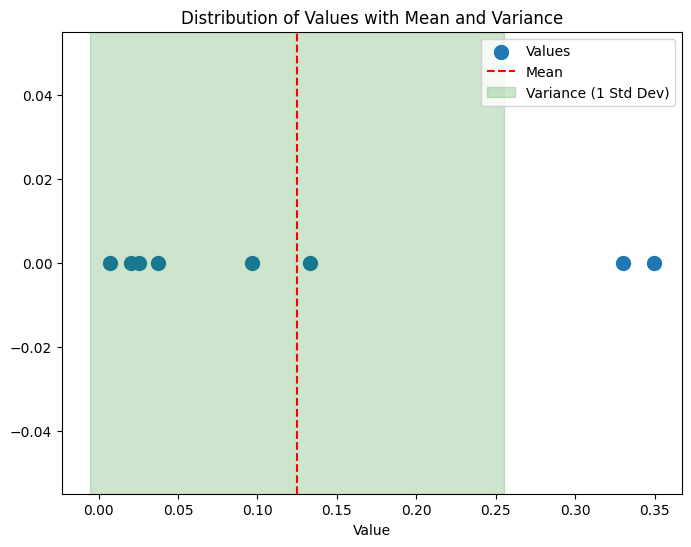

In [56]:
from sklearn.preprocessing import RobustScaler
class_counts_isic=train_split['labels'].value_counts()
weight_scaler=RobustScaler()
class_weights=[0]*num_classes
for class_idx, counts in class_counts_isic.items():
    class_weights[class_idx]=1/(counts/len(train_split))

class_weights_sum=sum(class_weights)
class_weights=np.array([weight/class_weights_sum for weight in class_weights])
#class_weights=np.log(class_weights)
#class_weights=weight_scaler.fit_transform(np.array(class_weights).reshape(-1, 1))
class_weights_dict={i:class_weights[i] for i in range(len(class_weights))}
print(class_weights)
thre=np.percentile(class_weights, 60)
print(thre)
print(class_weights>thre)


class_weights_mean=np.mean(class_weights)
class_weights_var=np.var(class_weights)
class_weights_std=np.sqrt(class_weights_var)


import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(class_weights, [0] * len(class_weights), marker='o', s=100, label='Values') # Plot the 8 values as points
plt.axvline(class_weights_mean, color='r', linestyle='--', label='Mean') # Vertical line for mean
plt.axvspan(class_weights_mean - class_weights_std, class_weights_mean + class_weights_std, color='g', alpha=0.2, label='Variance (1 Std Dev)') # Shaded area for variance
plt.xlabel('Value')
plt.title('Distribution of Values with Mean and Variance')
plt.legend()
plt.show()


In [57]:
def train_one_batch(data, model, criterion, optimizer):
    model.train()
    embs, labels = data


    optimizer.zero_grad()
    out = model(embs)
    loss = criterion(out, labels)

    loss.backward()
    optimizer.step()

    accuracy = calc_accuracy(out, labels).item()

    return loss.item(), accuracy

@torch.no_grad()
def validate_one_batch(data, model, criterion):
    model.eval()
    embs, labels = data

    out = model(embs)
    loss = criterion(out, labels)
    y_scores=torch.softmax(out, dim=1)
    y_preds=torch.argmax(out, dim=1)
    accuracy = calc_accuracy(out, labels)
    #auprc=np.array(calculate_auprc(y_scores, labels))
    return loss.item(), accuracy.item(), y_scores, y_preds, labels

In [58]:

class EarlyStopping:
    def __init__(self, patience=3, min_delta=0, path='/content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth'):
        self.path = path
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss, model):
        # Initialize best_loss if it's the first call
        if self.best_loss is None:
            self.best_loss = val_loss
            self.save_checkpoint(val_loss, model)

        # Check if the validation loss has improved enough to consider a checkpoint
        elif self.best_loss - val_loss > self.min_delta:
            self.save_checkpoint(val_loss, model)
            self.best_loss = val_loss
            self.counter = 0  # Reset the counter if improvement is seen

        # If no improvement, increase the counter
        else:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

    def save_checkpoint(self, val_loss, model):
        """Saves the model when the validation loss decreases."""
        torch.save(Globals.model2.state_dict(), self.path)
        print(f'Model saved to: {self.path} with validation loss: {val_loss:.4f}')

In [59]:
params = {"num_classes": num_classes}

model = Globals.model1.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5, min_lr=1e-7)
stopper = EarlyStopping(patience=5)
freq_sampler=WeightSampler(data=ISICEmbTrainSet, weights=class_weights)
ISICEmbTrainLoader=torch.utils.data.DataLoader(ISICEmbTrainSet, batch_size=batch_size, collate_fn=ISICEmbTrainSet.collate_fn,
                                                 sampler=freq_sampler)


In [ ]:
params = {"num_classes": num_classes}

model = Globals.model2.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5, min_lr=1e-7)
stopper = EarlyStopping(patience=5)


In [ ]:
print(tqdm.tqdm(ISICEmbTrainLoader))


  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]


In [60]:
import tqdm

EPOCHS = 40
print_freq = 524
counter=0

best_valid_loss = float('inf')  # 用于跟踪最佳验证损失

for epoch in range(1, EPOCHS+1):

    train_loss, train_accs = [], []

    # code by LYZ:使用 tqdm 来显示训练循环的进度
    for step, batch in tqdm.tqdm(enumerate(ISICEmbTrainLoader, 1), total=len(ISICEmbTrainLoader)):
        time_1 = time.time()

        loss, accuracy = train_one_batch(batch, model, criterion, optimizer)

        train_loss.append(loss)
        train_accs.append(accuracy)

        if step % print_freq == 0:
            print('epoch:', epoch,
                '\tstep:', step, '/', len(ISICEmbTrainLoader),
                '\ttrain loss isic:', '{:.4f}'.format(loss),
                '\ttrain accuracy isic:','{:.4f}'.format(accuracy),
                '\ttime:', '{:.4f}'.format((time.time()-time_1)*print_freq), 's')


    valid_loss, valid_accs, valid_scores_1, valid_preds_1, valid_true_1 = [], [], [], [], []
    for step, batch in enumerate(tqdm.tqdm(ISICEmbValLoader)):
        loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

        valid_loss.append(loss)
        valid_accs.append(accuracy)
        valid_scores_1.append(y_scores)
        valid_preds_1.append(y_preds)
        valid_true_1.append(y_true)

    valid_scores=np.concatenate(valid_scores_1)
    valid_true=np.concatenate(valid_true_1)
    valid_preds=np.concatenate(valid_preds_1)

    if epoch%4==1:
        f1_weights, f1_scores=calc_f1_weights(model, isic_val_embeddings, isic_val_labels, 8)
    elif epoch%4==0:
        f1_weights, f1_scores=calc_f1_weights(model, isic_val_embeddings, isic_val_labels, 8)
        f1_weights=class_weights

    weighted_sampler=WeightSampler(data=ISICEmbTrainSet, weights=f1_weights)
    ISICWeightLoader=torch.utils.data.DataLoader(ISICEmbTrainSet, batch_size=batch_size, collate_fn=ISICEmbTrainSet.collate_fn,
                                                       sampler=weighted_sampler)
    print("f1 weights: {}".format(f1_weights))
    print("f1 scores: {}".format(f1_scores))
    #print("class accuracies: {}".format(cls_acc))

    print('epoch:', epoch, '/', EPOCHS,
          '\ttrain loss:', '{:.4f}'.format(np.mean(train_loss)),
          '\tvalid loss:', '{:.4f}'.format(np.mean(valid_loss)),
          '\ttrain accuracy', '{:.4f}'.format(np.mean(train_accs)),
          '\tvalid accuracy', '{:.4f}'.format(np.mean(valid_accs)))

       # code by LYZ:如果验证损失更低，则保存模型权重
    if np.mean(valid_loss) < best_valid_loss:
        best_valid_loss = np.mean(valid_loss)
        checkpoint_path = '/content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth'
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_valid_loss': best_valid_loss,
            'train_loss': np.mean(train_loss),
            'valid_loss': np.mean(valid_loss)
        }
        torch.save(checkpoint, checkpoint_path)
        print(f'Model weights saved to {checkpoint_path}')

    stopper(np.mean(valid_loss), model)
    scheduler.step(np.mean(valid_loss))


test_loss_isic, test_accs_isic = [], []
for step, batch in enumerate(tqdm.tqdm(ISICEmbTestLoader)):
    loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

    test_loss_isic.append(loss)
    test_accs_isic.append(accuracy)
print('\ttest loss ISIC :', '{:.4f}'.format(np.mean(test_loss_isic)),
      '\ttest accuracy ISIC', '{:.4f}'.format(np.mean(test_accs_isic)))
'''
test_loss_asan, test_accs_asan = [], []
for step, batch in enumerate(tqdm(test_dl_2)):
    loss, accuracy = validate_one_batch(batch, model, criterion)

    test_loss_asan.append(loss)
    test_accs_asan.append(accuracy)

print('\ttest loss ASAN:', '{:.4f}'.format(np.mean(test_loss_asan)),
      '\ttest accuracy ASAN', '{:.4f}'.format(np.mean(test_accs_asan)))
'''

  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:31,  4.58it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:15,  5.48it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:11,  5.80it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:07,  6.06it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:05,  6.22it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:04,  6.28it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:03,  6.38it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:04,  6.25it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:03,  6.31it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:02,  6.34it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:03,  6.24it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:03<01:03,  6.25it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:03,  6.15it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:04<01:03,  6.15it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:04<01:03,  6.15it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:02,  6.19it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:05<01:02,  6.16it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:05<01:00,  6.34it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:00,  6.35it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:06<01:00,  6.27it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:06<01:00,  6.26it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:00,  6.20it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:07<01:00,  6.17it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:07<01:00,  6.16it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:00,  6.10it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:08<01:01,  6.00it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:08<00:58,  6.23it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:09<00:57,  6.30it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:09<00:58,  6.15it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:09<00:56,  6.30it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:10<00:57,  6.16it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:10<00:58,  6.09it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:10<01:02,  5.69it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:11<01:03,  5.49it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:11<01:04,  5.37it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:11<01:04,  5.39it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:12<01:03,  5.44it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:12<01:05,  5.21it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<01:04,  5.27it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:13<01:02,  5.43it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:13<00:57,  5.86it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:14<00:55,  6.06it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:14<00:54,  6.07it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:14<00:52,  6.28it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:15<00:53,  6.15it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:15<00:55,  5.88it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:15<00:54,  5.92it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:16<00:54,  5.90it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:16<00:55,  5.82it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:16<00:53,  6.00it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:17<00:53,  5.94it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:17<00:52,  5.97it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:17<00:50,  6.17it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:18<00:51,  6.04it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:18<00:50,  6.14it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:18<00:48,  6.27it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:19<00:50,  6.09it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:19<00:49,  6.14it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:19<00:48,  6.19it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:20<00:48,  6.22it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:20<00:47,  6.27it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:20<00:47,  6.27it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:21<00:48,  6.07it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:21<00:46,  6.21it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:21<00:47,  6.14it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:21<00:46,  6.18it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:22<00:47,  6.04it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:22<00:47,  5.97it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:23<00:46,  5.99it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:23<00:46,  6.04it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:23<00:49,  5.60it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:24<00:50,  5.46it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:24<00:50,  5.37it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:24<00:48,  5.54it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:25<00:49,  5.48it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:25<00:51,  5.21it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:25<00:50,  5.24it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:26<00:48,  5.43it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:26<00:44,  5.84it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:26<00:42,  6.05it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:27<00:41,  6.18it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:27<00:41,  6.20it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:27<00:41,  6.12it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:28<00:41,  6.06it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:28<00:41,  6.05it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:28<00:40,  6.03it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:29<00:40,  6.12it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:29<00:39,  6.18it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:29<00:40,  5.93it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:30<00:39,  6.01it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:30<00:39,  6.05it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:30<00:39,  5.90it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:31<00:39,  5.87it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:31<00:39,  5.82it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:31<00:38,  5.94it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:32<00:37,  6.11it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:32<00:36,  6.20it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:32<00:36,  6.19it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:33<00:35,  6.30it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:33<00:34,  6.30it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:33<00:35,  6.03it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:34<00:36,  5.97it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:34<00:35,  5.97it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:34<00:34,  6.07it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:35<00:33,  6.23it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:35<00:33,  6.17it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:35<00:33,  6.21it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:36<00:32,  6.25it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:36<00:33,  6.09it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:36<00:36,  5.48it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:37<00:36,  5.40it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:37<00:34,  5.59it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:37<00:34,  5.66it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:38<00:33,  5.71it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:38<00:34,  5.40it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:39<00:35,  5.21it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:39<00:32,  5.63it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:39<00:31,  5.82it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:40<00:29,  6.03it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:40<00:29,  6.10it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:40<00:28,  6.14it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:41<00:29,  5.96it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:41<00:28,  6.08it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:41<00:28,  6.04it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:42<00:27,  6.07it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:42<00:27,  6.09it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:42<00:26,  6.21it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:43<00:25,  6.29it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:43<00:26,  6.06it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:43<00:26,  6.11it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:44<00:25,  6.20it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:44<00:24,  6.23it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:44<00:24,  6.15it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:45<00:24,  6.17it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:45<00:24,  6.03it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:45<00:24,  5.93it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:46<00:23,  6.11it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:46<00:23,  6.03it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:46<00:23,  6.03it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:47<00:22,  6.15it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:47<00:22,  6.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:47<00:22,  6.02it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:48<00:21,  6.05it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:48<00:21,  6.18it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:48<00:21,  6.07it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:48<00:20,  6.06it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:49<00:21,  5.89it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:49<00:22,  5.58it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:50<00:22,  5.38it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:50<00:21,  5.48it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:50<00:20,  5.61it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:51<00:20,  5.66it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:51<00:20,  5.44it/s]

torch.float32


 73%|███████▎  | 307/419 [00:51<00:21,  5.29it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:52<00:20,  5.30it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:52<00:19,  5.60it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:52<00:18,  5.85it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:53<00:17,  6.05it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:53<00:16,  6.13it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:53<00:16,  6.20it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:54<00:15,  6.15it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:54<00:15,  6.04it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:54<00:15,  6.04it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:55<00:15,  6.13it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:55<00:14,  6.08it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:55<00:14,  5.87it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:56<00:14,  5.98it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:56<00:13,  6.10it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [00:56<00:13,  6.15it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [00:57<00:13,  6.04it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [00:57<00:12,  6.01it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [00:57<00:12,  6.07it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [00:58<00:12,  6.12it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [00:58<00:11,  6.15it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [00:58<00:11,  6.10it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [00:59<00:11,  6.09it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [00:59<00:10,  6.17it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [00:59<00:10,  6.18it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [00:59<00:09,  6.26it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:00<00:09,  6.25it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:00<00:09,  6.15it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:00<00:09,  6.09it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:01<00:08,  6.03it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:01<00:08,  6.12it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:01<00:08,  6.17it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:02<00:07,  6.19it/s]

torch.float32


 89%|████████▉ | 372/419 [01:02<00:08,  5.60it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:02<00:07,  5.67it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:03<00:07,  5.67it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:03<00:07,  5.70it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:03<00:07,  5.43it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:04<00:06,  5.32it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:04<00:06,  5.30it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:05<00:06,  5.23it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:05<00:05,  5.67it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:05<00:04,  6.03it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:06<00:04,  6.09it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:06<00:04,  6.14it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:06<00:03,  6.09it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:07<00:03,  5.97it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:07<00:03,  6.15it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:07<00:02,  6.03it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:08<00:02,  5.97it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:08<00:02,  6.04it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:08<00:01,  6.03it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:09<00:01,  5.76it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:09<00:01,  5.88it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:09<00:00,  5.76it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:10<00:00,  5.87it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:10<00:00,  5.92it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:10<00:00,  5.94it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 18.21it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.16it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 16.73it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.18it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.07it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.10it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.12it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.05it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.12it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.34it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.05it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.11it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.15it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.99it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.95it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.93it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.05it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.03it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.46it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.85it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 17.22it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.83it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.52it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.27it/s]

torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.12it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.99it/s]

torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.87it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.84it/s]

torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.93it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.97it/s]

torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.90it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 15.90it/s]

torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.93it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.79it/s]

torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.96it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.93it/s]

torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.58it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.42it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.28it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.99it/s]


torch.float32
torch.float32
f1 weights: [0.08243737 0.03345461 0.04269118 0.41477864 0.06669881 0.14697895
 0.0738152  0.13914523]
f1 scores: [0.31865783 0.78522245 0.61533352 0.06333333 0.39384983 0.17872841
 0.35587948 0.18879061]
epoch: 1 / 40 	train loss: 5.7414 	valid loss: 1.3239 	train accuracy 0.1551 	valid accuracy 0.5809
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.3239


  0%|          | 1/419 [00:00<01:13,  5.68it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:10,  5.90it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:08,  6.02it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:08,  6.05it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:07,  6.08it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:06,  6.12it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:06,  6.14it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:05,  6.15it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:05,  6.17it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:04,  6.22it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:04,  6.21it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:03<01:02,  6.30it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:04,  6.08it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:07,  5.85it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:04<01:06,  5.89it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:09,  5.56it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:08,  5.63it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:05<01:08,  5.63it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:07,  5.64it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:07,  5.66it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:06<01:06,  5.69it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:04,  5.81it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:03,  5.86it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:07<01:04,  5.73it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:04,  5.74it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:03,  5.80it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:08<01:10,  5.24it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:12,  5.04it/s]

torch.float32


 13%|█▎        | 54/419 [00:09<01:17,  4.72it/s]

torch.float32


 13%|█▎        | 55/419 [00:09<01:17,  4.72it/s]

torch.float32


 14%|█▎        | 57/419 [00:09<01:14,  4.89it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:12,  4.93it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:13,  4.86it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:13,  4.88it/s]

torch.float32


 15%|█▌        | 64/419 [00:11<01:09,  5.13it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:04,  5.51it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:00,  5.79it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<00:57,  6.04it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:12<00:58,  5.90it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<00:59,  5.82it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<00:58,  5.91it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<00:57,  5.89it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:58,  5.83it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:14<00:58,  5.72it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:56,  5.92it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:54,  6.05it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:15<00:54,  6.05it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:54,  6.02it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:16<00:54,  5.99it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:16<00:54,  5.98it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:54,  5.85it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:17<00:55,  5.79it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:17<00:53,  5.94it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<00:54,  5.82it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:18<00:53,  5.82it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:18<00:52,  5.90it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:52,  5.89it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:19<00:52,  5.81it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:19<00:51,  5.90it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:20<00:50,  6.02it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:20<00:49,  6.04it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:20<00:49,  6.01it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:21<00:49,  5.99it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:51,  5.79it/s]

torch.float32


 30%|██▉       | 125/419 [00:21<00:55,  5.33it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:54,  5.39it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:54,  5.30it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:22<00:55,  5.21it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:53,  5.31it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:23<00:54,  5.23it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:53,  5.28it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:51,  5.48it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:24<00:48,  5.74it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:46,  5.89it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:45,  6.05it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:25<00:45,  5.98it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:45,  5.97it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:44,  5.97it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:26<00:44,  5.94it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:45,  5.80it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:27<00:45,  5.80it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:27<00:45,  5.78it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:45,  5.62it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:28<00:43,  5.84it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:28<00:43,  5.82it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:44,  5.65it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:29<00:44,  5.67it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:29<00:42,  5.78it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:30<00:42,  5.80it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:30<00:42,  5.75it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:30<00:41,  5.82it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:31<00:39,  6.00it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:31<00:40,  5.89it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:31<00:41,  5.74it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:32<00:40,  5.83it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:32<00:39,  5.88it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:32<00:38,  5.92it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:33<00:38,  5.92it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:33<00:38,  5.92it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:33<00:37,  6.01it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:34<00:38,  5.80it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:34<00:40,  5.42it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:34<00:41,  5.32it/s]

torch.float32


 48%|████▊     | 202/419 [00:35<00:41,  5.22it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:35<00:41,  5.24it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:39,  5.41it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:36<00:38,  5.49it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:36<00:39,  5.25it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:38,  5.40it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:37<00:36,  5.55it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:37<00:34,  5.81it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:38<00:33,  5.99it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:38<00:33,  5.92it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:38<00:32,  6.09it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:39<00:32,  6.06it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:39<00:31,  6.10it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:39<00:30,  6.22it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:40<00:30,  6.14it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:40<00:30,  6.09it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:40<00:31,  5.86it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:41<00:31,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:41<00:30,  5.92it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:41<00:31,  5.73it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:42<00:30,  5.76it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:42<00:29,  5.91it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:42<00:29,  5.86it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:43<00:28,  5.92it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:43<00:28,  5.92it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:43<00:27,  5.99it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:44<00:27,  6.05it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:44<00:27,  5.88it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:44<00:28,  5.72it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:45<00:27,  5.87it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:45<00:26,  5.96it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:45<00:26,  5.92it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:46<00:25,  5.96it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:46<00:25,  6.04it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:46<00:25,  5.89it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:47<00:26,  5.69it/s]

torch.float32


 65%|██████▌   | 273/419 [00:47<00:27,  5.40it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:47<00:27,  5.32it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:48<00:26,  5.28it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:48<00:26,  5.33it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:49<00:25,  5.33it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:49<00:25,  5.24it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:49<00:25,  5.22it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:50<00:23,  5.51it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:50<00:22,  5.81it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:50<00:21,  6.05it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:51<00:20,  6.04it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:51<00:20,  6.10it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:51<00:20,  6.05it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:52<00:19,  6.05it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:52<00:19,  6.15it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:52<00:18,  6.11it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:53<00:19,  5.86it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:53<00:18,  6.01it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:53<00:18,  6.07it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:54<00:18,  5.99it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:54<00:17,  6.00it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:54<00:17,  6.02it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:55<00:17,  5.82it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:55<00:16,  5.95it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:55<00:16,  5.79it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:56<00:16,  5.73it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:56<00:16,  5.86it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:56<00:15,  5.98it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:57<00:14,  6.01it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:57<00:14,  5.94it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:57<00:14,  6.00it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:58<00:14,  5.76it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [00:58<00:14,  5.79it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [00:58<00:13,  5.78it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [00:59<00:13,  5.91it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [00:59<00:12,  5.93it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [00:59<00:12,  6.08it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:00<00:12,  5.61it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:00<00:12,  5.40it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:01<00:12,  5.23it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:01<00:12,  5.25it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:01<00:12,  5.26it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:02<00:12,  5.16it/s]

torch.float32


 85%|████████▌ | 358/419 [01:02<00:11,  5.20it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:02<00:10,  5.37it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:03<00:10,  5.64it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:03<00:09,  5.87it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:03<00:08,  5.96it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:04<00:08,  5.96it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:04<00:08,  5.95it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:04<00:08,  5.86it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:05<00:07,  5.71it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:05<00:07,  5.87it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:05<00:06,  5.88it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:06<00:06,  5.79it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:06<00:06,  5.93it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:06<00:06,  5.83it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:07<00:05,  5.78it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:07<00:05,  5.96it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:07<00:04,  6.05it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:08<00:04,  5.97it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:08<00:04,  6.02it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:08<00:03,  5.77it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:09<00:03,  5.76it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:09<00:03,  5.83it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:09<00:02,  5.94it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:10<00:02,  5.91it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:10<00:02,  5.91it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:10<00:01,  5.81it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:11<00:01,  5.98it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:11<00:01,  5.97it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:11<00:00,  5.89it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:12<00:00,  5.91it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:12<00:00,  5.81it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:12<00:00,  5.76it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.46it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.75it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.56it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.83it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.77it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.99it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.34it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.29it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.07it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.95it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.13it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.35it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.30it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.23it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.16it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.09it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.28it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.81it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.45it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.00it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.03it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.03it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.14it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.44it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.96it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.26it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.27it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.46it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.43it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.30it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.37it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.28it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.16it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.09it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.91it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.76it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.77it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.95it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.14it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.10it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.11it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.85it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.01it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.19it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.19it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.13it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 16.14it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.24it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.22it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.92it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.99it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.13it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.18it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.30it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 16.17it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.89it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.86it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.05it/s]


torch.float32
torch.float32
f1 weights: [0.08243737 0.03345461 0.04269118 0.41477864 0.06669881 0.14697895
 0.0738152  0.13914523]
f1 scores: [0.31865783 0.78522245 0.61533352 0.06333333 0.39384983 0.17872841
 0.35587948 0.18879061]
epoch: 2 / 40 	train loss: 4.5838 	valid loss: 1.3510 	train accuracy 0.2173 	valid accuracy 0.6111
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:19,  5.26it/s]

torch.float32


  0%|          | 2/419 [00:00<01:15,  5.54it/s]

torch.float32


  1%|          | 3/419 [00:00<01:13,  5.69it/s]

torch.float32


  1%|          | 4/419 [00:00<01:12,  5.70it/s]

torch.float32


  1%|          | 5/419 [00:00<01:11,  5.76it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:12,  5.69it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:10,  5.81it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:10,  5.85it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:12,  5.65it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:11,  5.71it/s]

torch.float32


  3%|▎         | 11/419 [00:01<01:09,  5.83it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:09,  5.82it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:09,  5.84it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:08,  5.94it/s]

torch.float32


  4%|▎         | 15/419 [00:02<01:08,  5.88it/s]

torch.float32


  4%|▍         | 16/419 [00:02<01:08,  5.91it/s]

torch.float32


  4%|▍         | 17/419 [00:02<01:07,  5.92it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:07,  5.96it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:06,  6.06it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:07,  5.87it/s]

torch.float32


  5%|▌         | 21/419 [00:03<01:07,  5.90it/s]

torch.float32


  5%|▌         | 22/419 [00:03<01:06,  5.96it/s]

torch.float32


  5%|▌         | 23/419 [00:03<01:06,  5.98it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:05,  6.05it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:05,  6.05it/s]

torch.float32


  6%|▌         | 26/419 [00:04<01:05,  5.99it/s]

torch.float32


  6%|▋         | 27/419 [00:04<01:04,  6.04it/s]

torch.float32


  7%|▋         | 28/419 [00:04<01:04,  6.02it/s]

torch.float32


  7%|▋         | 29/419 [00:04<01:04,  6.09it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:05,  5.96it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:04,  5.98it/s]

torch.float32


  8%|▊         | 32/419 [00:05<01:05,  5.92it/s]

torch.float32


  8%|▊         | 33/419 [00:05<01:06,  5.77it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:13,  5.24it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:12,  5.24it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:12,  5.24it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:06<01:11,  5.29it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:10,  5.33it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:09,  5.37it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:14,  5.03it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:07,  5.51it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:09,  5.33it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:07,  5.43it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:04,  5.68it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:02,  5.76it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:01,  5.90it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:01,  5.81it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:00,  5.85it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:00,  5.89it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:11<01:02,  5.67it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:00,  5.75it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<00:59,  5.84it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:12<00:59,  5.84it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<00:58,  5.89it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:57,  5.99it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:13<00:55,  6.07it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:55,  6.13it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:54,  6.17it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:14<00:55,  6.07it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:55,  5.96it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:53,  6.16it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:15<00:54,  6.00it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:53,  6.04it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:53,  6.06it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:16<00:53,  6.03it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:52,  6.06it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:17<00:51,  6.18it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:17<00:51,  6.13it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:51,  6.07it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:18<00:52,  6.00it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:18<00:53,  5.80it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:55,  5.51it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:19<00:57,  5.34it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:19<00:57,  5.26it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:57,  5.27it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:20<00:58,  5.18it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:20<00:58,  5.09it/s]

torch.float32


 29%|██▉       | 122/419 [00:21<00:57,  5.21it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:21<00:54,  5.43it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:53,  5.50it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:22<00:50,  5.81it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:22<00:48,  6.01it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:49,  5.75it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:23<00:50,  5.70it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:23<00:50,  5.60it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:48,  5.83it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:24<00:48,  5.80it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:24<00:47,  5.80it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:25<00:47,  5.81it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:25<00:47,  5.75it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:25<00:47,  5.67it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:26<00:46,  5.82it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:26<00:44,  6.02it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:26<00:43,  6.15it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:27<00:42,  6.20it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:27<00:42,  6.10it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:27<00:41,  6.21it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:28<00:42,  6.02it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:28<00:41,  6.15it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:28<00:40,  6.18it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:29<00:40,  6.21it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:29<00:40,  6.19it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:29<00:40,  6.14it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:30<00:40,  6.10it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:30<00:39,  6.19it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:30<00:39,  6.11it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:31<00:39,  6.06it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:31<00:40,  5.86it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:31<00:42,  5.59it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:32<00:43,  5.40it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:32<00:43,  5.27it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:32<00:43,  5.30it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:33<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:33<00:42,  5.24it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:33<00:43,  5.18it/s]

torch.float32


 47%|████▋     | 197/419 [00:34<00:43,  5.15it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:34<00:39,  5.60it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:34<00:37,  5.76it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:35<00:36,  5.94it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:35<00:35,  5.94it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:36<00:38,  5.57it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:36<00:37,  5.64it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:36<00:36,  5.72it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:37<00:35,  5.78it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:37<00:34,  5.86it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:37<00:35,  5.71it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:38<00:34,  5.80it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:38<00:33,  5.82it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:38<00:32,  5.98it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:39<00:32,  6.01it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:39<00:32,  5.82it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:39<00:31,  5.96it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:40<00:31,  6.06it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:40<00:30,  6.16it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:40<00:31,  5.89it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:41<00:30,  5.95it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:41<00:29,  6.06it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:41<00:29,  6.00it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:42<00:29,  5.96it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:42<00:28,  6.03it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:42<00:29,  5.86it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:43<00:28,  5.91it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:43<00:28,  5.99it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:43<00:28,  5.92it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:44<00:28,  5.84it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:44<00:29,  5.49it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:44<00:29,  5.38it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:45<00:30,  5.23it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:45<00:28,  5.42it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:46<00:29,  5.24it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:46<00:29,  5.16it/s]

torch.float32


 64%|██████▍   | 268/419 [00:46<00:29,  5.18it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:46<00:29,  5.13it/s]

torch.float32


 65%|██████▍   | 271/419 [00:47<00:28,  5.18it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:47<00:26,  5.44it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:47<00:26,  5.52it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:48<00:24,  5.76it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:48<00:24,  5.83it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:49<00:23,  5.76it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:49<00:23,  5.78it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:49<00:22,  5.94it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:50<00:22,  5.99it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:50<00:21,  6.04it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:50<00:21,  6.01it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:51<00:21,  5.78it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:51<00:20,  5.93it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:51<00:20,  5.85it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:52<00:21,  5.71it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:52<00:20,  5.76it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:52<00:20,  5.74it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:53<00:19,  5.73it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:53<00:19,  5.87it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:53<00:18,  5.83it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:54<00:18,  5.82it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:54<00:18,  5.86it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:54<00:17,  5.99it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:55<00:16,  6.06it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:55<00:16,  5.89it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:55<00:16,  5.91it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:56<00:16,  5.96it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:56<00:15,  6.04it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:56<00:15,  6.03it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:57<00:15,  5.92it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:57<00:15,  5.65it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:57<00:15,  5.42it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:58<00:15,  5.37it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [00:58<00:14,  5.51it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [00:58<00:15,  5.39it/s]

torch.float32


 81%|████████  | 340/419 [00:59<00:15,  5.18it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [00:59<00:15,  5.07it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:00<00:14,  5.03it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:00<00:14,  5.20it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:00<00:12,  5.57it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:01<00:12,  5.61it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:01<00:12,  5.50it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:01<00:11,  5.78it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:02<00:10,  6.00it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:02<00:10,  6.09it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:02<00:09,  6.16it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:03<00:09,  6.07it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:03<00:08,  6.12it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:03<00:08,  6.28it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:04<00:08,  6.16it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:04<00:07,  6.15it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:04<00:07,  6.13it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:05<00:07,  5.97it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:05<00:07,  6.04it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:05<00:06,  6.04it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:06<00:06,  5.86it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:06<00:06,  6.00it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:06<00:05,  5.86it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:07<00:05,  5.96it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:07<00:05,  5.79it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:07<00:04,  5.94it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:08<00:04,  5.91it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:08<00:04,  5.91it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:08<00:03,  5.83it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:09<00:03,  5.66it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:09<00:03,  5.63it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:09<00:02,  5.79it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:10<00:02,  5.36it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:10<00:02,  5.25it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:11<00:02,  5.20it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:11<00:01,  5.32it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:11<00:01,  5.28it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:12<00:00,  5.30it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:12<00:00,  5.21it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:12<00:00,  5.25it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:13<00:00,  5.73it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 17.91it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.39it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 16.81it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.58it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.46it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.38it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.30it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.12it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.02it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.16it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.23it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.26it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.14it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.04it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.99it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.65it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.80it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.97it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.00it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.94it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.87it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.82it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.64it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 15.49it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.74it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.77it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.79it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.72it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.77it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.99it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.61it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 16.23it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.15it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.89it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.67it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.86it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.97it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.96it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.83it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 15.90it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.92it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.23it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.10it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.86it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.02it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.02it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.87it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.14it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.96it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.09it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.13it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.16it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.16it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.02it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.86it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 15.88it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.78it/s]

torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.92it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.10it/s]


torch.float32
f1 weights: [0.08243737 0.03345461 0.04269118 0.41477864 0.06669881 0.14697895
 0.0738152  0.13914523]
f1 scores: [0.31865783 0.78522245 0.61533352 0.06333333 0.39384983 0.17872841
 0.35587948 0.18879061]
epoch: 3 / 40 	train loss: 4.0255 	valid loss: 1.3536 	train accuracy 0.2522 	valid accuracy 0.6157
INFO: Early stopping counter 2 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:11,  5.83it/s]

torch.float32


  0%|          | 2/419 [00:00<01:10,  5.90it/s]

torch.float32


  1%|          | 3/419 [00:00<01:12,  5.76it/s]

torch.float32


  1%|          | 4/419 [00:00<01:13,  5.65it/s]

torch.float32


  1%|          | 5/419 [00:00<01:11,  5.75it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:11,  5.79it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:13,  5.64it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:11,  5.75it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:10,  5.83it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:09,  5.86it/s]

torch.float32


  3%|▎         | 11/419 [00:01<01:10,  5.76it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:12,  5.63it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:12,  5.59it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:10,  5.72it/s]

torch.float32


  4%|▎         | 15/419 [00:02<01:13,  5.53it/s]

torch.float32


  4%|▍         | 16/419 [00:02<01:14,  5.41it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:13,  5.49it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:12,  5.50it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:13,  5.46it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.35it/s]

torch.float32


  5%|▌         | 21/419 [00:03<01:15,  5.30it/s]

torch.float32


  5%|▌         | 22/419 [00:03<01:14,  5.29it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:16,  5.17it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.12it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:16,  5.15it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:18,  4.96it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:13,  5.28it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:07,  5.72it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:05,  5.90it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:04,  5.89it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:02,  6.05it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:02,  6.05it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:03,  5.93it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:03,  5.90it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:02,  5.99it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:02,  5.88it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:03,  5.83it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:01,  5.99it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:01,  5.94it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:00,  6.01it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<00:59,  6.02it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:00,  5.94it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:01,  5.78it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:00,  5.82it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:11<01:00,  5.82it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<00:57,  6.06it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<00:57,  6.06it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:12<00:57,  6.00it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<00:57,  6.03it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:57,  5.95it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:13<00:57,  5.96it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:57,  5.86it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:56,  5.91it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:14<00:55,  6.05it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:54,  6.10it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:57,  5.71it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:15<01:02,  5.26it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<01:01,  5.28it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:16<01:03,  5.15it/s]

torch.float32


 23%|██▎       | 96/419 [00:16<01:03,  5.09it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<01:01,  5.18it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:17<00:58,  5.45it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:17<00:59,  5.34it/s]

torch.float32


 25%|██▍       | 103/419 [00:18<01:01,  5.17it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:57,  5.42it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:18<00:55,  5.62it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:53,  5.80it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:53,  5.80it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:19<00:52,  5.81it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:50,  5.96it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:51,  5.90it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:20<00:49,  6.09it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:49,  6.07it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:48,  6.11it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:21<00:49,  5.96it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:47,  6.09it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:48,  5.97it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:22<00:47,  6.05it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:48,  5.89it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:23<00:47,  5.99it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:23<00:46,  6.03it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:46,  5.99it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:24<00:46,  5.95it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:24<00:45,  6.03it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:45,  6.05it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:25<00:45,  5.93it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:25<00:45,  5.98it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:45,  5.94it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:26<00:45,  5.90it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:26<00:44,  5.91it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:27<00:43,  5.97it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:27<00:43,  5.97it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:27<00:42,  6.00it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:28<00:43,  5.86it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:28<00:45,  5.52it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:47,  5.36it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:29<00:46,  5.35it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:29<00:46,  5.29it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:30<00:44,  5.47it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:30<00:46,  5.21it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:30<00:46,  5.16it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:31<00:45,  5.31it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:31<00:42,  5.60it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:32<00:40,  5.87it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:32<00:38,  6.03it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:32<00:38,  6.01it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:33<00:38,  6.01it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:33<00:37,  6.02it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:33<00:37,  6.03it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:34<00:37,  6.05it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:34<00:36,  6.07it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:34<00:36,  6.00it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:35<00:36,  5.97it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:35<00:35,  6.02it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:35<00:35,  6.08it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:35<00:34,  6.15it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:36<00:34,  6.11it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:36<00:35,  5.93it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:37<00:34,  6.01it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:37<00:33,  6.05it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:37<00:33,  6.02it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:38<00:33,  5.98it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:38<00:33,  6.00it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:38<00:32,  5.95it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:39<00:32,  5.96it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:39<00:31,  6.03it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:39<00:32,  5.93it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:40<00:31,  5.98it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:40<00:31,  5.97it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:40<00:31,  5.88it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:41<00:30,  5.94it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:41<00:33,  5.41it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:41<00:33,  5.29it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:42<00:33,  5.33it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:42<00:33,  5.23it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:42<00:32,  5.34it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:43<00:32,  5.29it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:43<00:32,  5.19it/s]

torch.float32


 60%|█████▉    | 251/419 [00:43<00:34,  4.90it/s]

torch.float32


 60%|██████    | 253/419 [00:44<00:32,  5.11it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:44<00:29,  5.49it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:44<00:28,  5.72it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:45<00:27,  5.87it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:45<00:27,  5.79it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:45<00:26,  5.94it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:46<00:25,  5.98it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:46<00:25,  6.07it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:46<00:24,  6.01it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:47<00:24,  5.99it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:47<00:24,  5.98it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:47<00:24,  5.92it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:48<00:23,  5.93it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:48<00:23,  5.92it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:48<00:23,  5.92it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:49<00:23,  5.82it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:49<00:22,  5.86it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:49<00:21,  6.04it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:50<00:21,  6.00it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:50<00:21,  5.96it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:50<00:21,  5.89it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:51<00:20,  6.01it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:51<00:20,  6.00it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:51<00:19,  6.02it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:52<00:19,  5.99it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:52<00:19,  6.02it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:52<00:18,  6.05it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:53<00:18,  6.08it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:53<00:18,  6.08it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:53<00:17,  6.09it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:54<00:19,  5.54it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:54<00:19,  5.39it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:55<00:19,  5.20it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:55<00:19,  5.17it/s]

torch.float32


 76%|███████▌  | 319/419 [00:55<00:19,  5.07it/s]

torch.float32


 77%|███████▋  | 321/419 [00:55<00:19,  5.08it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:56<00:18,  5.12it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:56<00:18,  5.11it/s]

torch.float32


 78%|███████▊  | 326/419 [00:56<00:18,  5.04it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:57<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:57<00:15,  5.63it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:57<00:14,  5.84it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [00:58<00:14,  5.91it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [00:58<00:13,  6.02it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [00:58<00:13,  6.02it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [00:59<00:12,  6.10it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [00:59<00:12,  6.12it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [00:59<00:12,  6.16it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:00<00:11,  6.14it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:00<00:11,  5.96it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:00<00:11,  6.03it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:01<00:10,  6.13it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:01<00:10,  5.99it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:01<00:10,  6.07it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:02<00:09,  6.13it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:02<00:09,  6.15it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:02<00:09,  5.99it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:03<00:09,  5.96it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:03<00:08,  6.00it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:03<00:08,  5.93it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:04<00:08,  5.93it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:04<00:07,  5.95it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:04<00:07,  5.89it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:05<00:07,  6.07it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:05<00:06,  6.10it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:05<00:06,  6.17it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:06<00:06,  6.14it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:06<00:05,  5.97it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:06<00:05,  5.92it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:07<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:07<00:05,  5.29it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:07<00:04,  5.45it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:08<00:04,  5.38it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:08<00:04,  5.26it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:09<00:04,  5.20it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:09<00:03,  5.23it/s]

torch.float32


 96%|█████████▌| 401/419 [01:09<00:03,  5.08it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:10<00:02,  5.39it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:10<00:02,  5.54it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:10<00:02,  5.81it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:11<00:01,  5.83it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:11<00:01,  5.86it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:11<00:01,  5.97it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:12<00:00,  5.99it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:12<00:00,  5.91it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:12<00:00,  5.76it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 17.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.17it/s]


torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.41308335 0.80361512 0.64279111 0.22562155 0.43193203 0.19393599
 0.4109705  0.26379263]
epoch: 4 / 40 	train loss: 3.6175 	valid loss: 1.3110 	train accuracy 0.2893 	valid accuracy 0.6215
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.3110


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:21,  5.14it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:28,  4.71it/s]

torch.float32


  1%|          | 5/419 [00:01<01:22,  4.99it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:15,  5.45it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:11,  5.76it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:08,  5.92it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:08,  5.94it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:08,  5.92it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:07,  5.92it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:09,  5.79it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:07,  5.94it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:05,  6.02it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:07,  5.86it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:09,  5.67it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:08,  5.68it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:06,  5.83it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:07,  5.74it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:07,  5.65it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:11,  5.35it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:08,  5.56it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:06,  5.62it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:04,  5.84it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:04,  5.76it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:02,  5.91it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:08<01:02,  5.89it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:02,  5.84it/s]

torch.float32


 13%|█▎        | 54/419 [00:09<01:04,  5.69it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:09<01:02,  5.81it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:04,  5.64it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:03,  5.63it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:10<01:02,  5.70it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:05,  5.39it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:06,  5.31it/s]

torch.float32


 16%|█▌        | 66/419 [00:11<01:08,  5.19it/s]

torch.float32


 16%|█▌        | 67/419 [00:11<01:09,  5.09it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:11,  4.92it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:11,  4.90it/s]

torch.float32


 17%|█▋        | 71/419 [00:12<01:10,  4.94it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:08,  5.06it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:08,  5.06it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<01:04,  5.29it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:02,  5.46it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:59,  5.71it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:57,  5.88it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:56,  5.88it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:55,  5.97it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:56,  5.87it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:55,  5.94it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:54,  6.00it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:54,  5.96it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:55,  5.84it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:55,  5.80it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:54,  5.80it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:54,  5.83it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:53,  5.92it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:53,  5.87it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:52,  5.89it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:52,  5.86it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:52,  5.78it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:51,  5.94it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:50,  5.98it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:49,  6.05it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:49,  5.96it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:48,  6.08it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:48,  6.03it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:50,  5.83it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:49,  5.85it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:49,  5.83it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:47,  6.00it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:23<00:48,  5.87it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:23<00:51,  5.47it/s]

torch.float32


 33%|███▎      | 137/419 [00:24<00:53,  5.29it/s]

torch.float32


 33%|███▎      | 139/419 [00:24<00:54,  5.12it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:24<00:53,  5.15it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:53,  5.12it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:53,  5.09it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:54,  4.99it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:52,  5.11it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:49,  5.39it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:49,  5.43it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:48,  5.49it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:27<00:46,  5.63it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:46,  5.65it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:44,  5.74it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:28<00:43,  5.91it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:42,  5.94it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:42,  5.89it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:42,  5.92it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:30<00:42,  5.89it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:30<00:41,  5.97it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:40,  5.96it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:31<00:41,  5.88it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:31<00:40,  5.87it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:32<00:39,  6.07it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:32<00:39,  6.05it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:32<00:39,  5.96it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:33<00:39,  5.83it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:33<00:39,  5.81it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:33<00:38,  5.86it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:34<00:38,  5.80it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:34<00:38,  5.77it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:34<00:38,  5.75it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:35<00:37,  5.93it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:35<00:36,  5.92it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:35<00:36,  5.98it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:36<00:35,  5.99it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:36<00:34,  6.08it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:36<00:37,  5.58it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:37<00:38,  5.38it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:39,  5.29it/s]

torch.float32


 51%|█████     | 214/419 [00:37<00:39,  5.15it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:38,  5.21it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:38<00:38,  5.23it/s]

torch.float32


 52%|█████▏    | 219/419 [00:38<00:39,  5.11it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:38<00:37,  5.26it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:39<00:35,  5.48it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:39<00:34,  5.56it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:40<00:33,  5.76it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:40<00:32,  5.94it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:40<00:32,  5.73it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:41<00:31,  5.90it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:41<00:31,  5.85it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:41<00:31,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:42<00:29,  6.03it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:42<00:29,  6.08it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:42<00:29,  5.99it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:43<00:28,  6.08it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:43<00:28,  6.04it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:43<00:27,  6.08it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:44<00:27,  6.06it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:44<00:27,  5.95it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:44<00:27,  5.94it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:45<00:26,  6.09it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:45<00:26,  6.10it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:45<00:26,  6.07it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:46<00:25,  6.12it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:46<00:25,  6.05it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:46<00:24,  6.09it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:47<00:24,  6.07it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:47<00:25,  5.84it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:47<00:25,  5.82it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:48<00:24,  5.96it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:48<00:23,  6.02it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:48<00:23,  5.85it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:49<00:23,  5.86it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:49<00:25,  5.35it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:50<00:24,  5.39it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:50<00:25,  5.31it/s]

torch.float32


 69%|██████▊   | 288/419 [00:50<00:25,  5.14it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:51<00:24,  5.16it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:51<00:24,  5.29it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:51<00:24,  5.10it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:52<00:24,  5.10it/s]

torch.float32


 71%|███████   | 297/419 [00:52<00:23,  5.11it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:52<00:21,  5.49it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:53<00:20,  5.72it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:53<00:20,  5.76it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:53<00:20,  5.63it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:54<00:19,  5.67it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:54<00:19,  5.63it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:54<00:19,  5.60it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:55<00:18,  5.84it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:55<00:18,  5.74it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:55<00:17,  5.79it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:56<00:16,  6.08it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:56<00:16,  6.07it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:56<00:16,  5.86it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:57<00:16,  5.74it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:57<00:15,  5.75it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:57<00:15,  5.70it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:58<00:15,  5.62it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:58<00:14,  5.83it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:58<00:14,  5.86it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [00:59<00:13,  5.90it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [00:59<00:13,  5.88it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:00<00:13,  5.78it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:00<00:12,  5.94it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:00<00:12,  6.02it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:01<00:11,  6.08it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:01<00:11,  5.99it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:01<00:11,  5.91it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:02<00:10,  6.01it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:02<00:10,  5.91it/s]

torch.float32


 85%|████████▍ | 356/419 [01:02<00:11,  5.42it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:02<00:11,  5.36it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:03<00:11,  5.30it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:03<00:10,  5.42it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:04<00:10,  5.27it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:04<00:10,  5.28it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:04<00:10,  5.17it/s]

torch.float32


 88%|████████▊ | 369/419 [01:05<00:09,  5.21it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:05<00:08,  5.58it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:05<00:08,  5.64it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:06<00:07,  5.66it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:06<00:07,  5.74it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:06<00:07,  5.54it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:07<00:06,  5.55it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:07<00:06,  5.75it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:07<00:05,  5.74it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:08<00:05,  5.77it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:08<00:05,  5.65it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:08<00:05,  5.51it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:09<00:04,  5.40it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:09<00:04,  5.52it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:10<00:03,  5.57it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:10<00:03,  5.70it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:10<00:03,  5.80it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:11<00:03,  5.27it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:11<00:02,  5.23it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:11<00:02,  5.52it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:12<00:01,  5.81it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:12<00:01,  5.72it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:12<00:01,  5.82it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:13<00:00,  5.84it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:13<00:00,  5.68it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:13<00:00,  5.67it/s]


torch.float32
torch.float32


  0%|          | 0/117 [00:00<?, ?it/s]

torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.88it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.34it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.04it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.79it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 14.89it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.05it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 14.85it/s]

torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.21it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.44it/s]

torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.35it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.41it/s]

torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.65it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.72it/s]

torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.51it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.64it/s]

torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.77it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.00it/s]

torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.25it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.51it/s]

torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.96it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 17.03it/s]

torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.82it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 16.34it/s]

torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.30it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.11it/s]

torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.26it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.28it/s]

torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.27it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.09it/s]

torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.13it/s]

torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.89it/s]

torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.98it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.95it/s]

torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.92it/s]

torch.float32
torch.float32
torch.float32


f1 weights: [0.09999188 0.05557349 0.06755546 0.15870052 0.10497056 0.24336466
 0.10561332 0.1642301 ]
f1 scores: [0.43832646 0.78866902 0.64878671 0.27617481 0.41753695 0.18009635
 0.41499582 0.26687609]
epoch: 5 / 40 	train loss: 3.2086 	valid loss: 1.3517 	train accuracy 0.3213 	valid accuracy 0.6106
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:11,  5.83it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:11,  5.80it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:13,  5.67it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:11,  5.79it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:10,  5.83it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:11,  5.73it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:13,  5.50it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:10,  5.72it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:09,  5.72it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:08,  5.76it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:07,  5.89it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:06,  5.93it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:04<01:06,  5.86it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:06,  5.86it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:06,  5.80it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:05<01:04,  5.98it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:07,  5.64it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:09,  5.50it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:12,  5.26it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:10,  5.34it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:12,  5.15it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:14,  5.02it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:14,  4.97it/s]

torch.float32


 12%|█▏        | 49/419 [00:08<01:14,  4.94it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:08,  5.37it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:03,  5.77it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:03,  5.73it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:02,  5.81it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<00:59,  6.03it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:00,  5.96it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:00,  5.90it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:00,  5.89it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:11<01:01,  5.74it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<00:59,  5.89it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:01,  5.70it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:12<01:01,  5.63it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:00,  5.73it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:58,  5.84it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:59,  5.75it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:58,  5.75it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:57,  5.80it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:56,  5.89it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:56,  5.84it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:55,  5.91it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:54,  5.95it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:54,  5.98it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:53,  6.00it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:53,  6.00it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:17<00:52,  6.03it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:52,  5.99it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:53,  5.91it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:18<00:53,  5.80it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:56,  5.44it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:59,  5.24it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:19<00:59,  5.15it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:59,  5.09it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:59,  5.11it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:20<00:59,  5.06it/s]

torch.float32


 28%|██▊       | 119/419 [00:21<00:59,  5.01it/s]

torch.float32


 29%|██▉       | 121/419 [00:21<00:58,  5.10it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:57,  5.16it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:53,  5.50it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:51,  5.63it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:50,  5.75it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:49,  5.82it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:48,  5.90it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:48,  5.81it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:49,  5.73it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:48,  5.75it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:48,  5.72it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:46,  5.89it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:46,  5.87it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:46,  5.89it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:45,  5.93it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:45,  5.86it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:47,  5.55it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:45,  5.78it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:27<00:44,  5.89it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:44,  5.84it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:44,  5.85it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:28<00:43,  5.85it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:42,  5.94it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:42,  5.90it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:29<00:41,  5.96it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:30<00:41,  6.04it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:30<00:41,  5.94it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:30<00:42,  5.68it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:31<00:42,  5.73it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:31<00:41,  5.83it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:31<00:42,  5.64it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:32<00:43,  5.43it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:32<00:45,  5.21it/s]

torch.float32


 44%|████▍     | 185/419 [00:32<00:46,  5.07it/s]

torch.float32


 45%|████▍     | 187/419 [00:33<00:46,  4.98it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:33<00:43,  5.29it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:33<00:42,  5.35it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:43,  5.23it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:34<00:42,  5.24it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:35<00:40,  5.45it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:35<00:39,  5.56it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:35<00:38,  5.64it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:36<00:37,  5.77it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:36<00:37,  5.73it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:36<00:36,  5.81it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:37<00:36,  5.77it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:37<00:36,  5.69it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:37<00:35,  5.80it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:38<00:35,  5.83it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:38<00:34,  5.86it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:38<00:34,  5.75it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:39<00:34,  5.82it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:39<00:33,  5.81it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:39<00:34,  5.60it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:40<00:33,  5.68it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:40<00:34,  5.48it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:40<00:33,  5.58it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:41<00:33,  5.48it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:41<00:33,  5.42it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:42<00:32,  5.62it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:42<00:31,  5.71it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:42<00:30,  5.80it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:43<00:29,  5.92it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:43<00:29,  5.81it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:43<00:29,  5.85it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:44<00:29,  5.81it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:44<00:29,  5.67it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:44<00:29,  5.54it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:45<00:30,  5.31it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:31,  5.15it/s]

torch.float32


 61%|██████▏   | 257/419 [00:45<00:31,  5.07it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:31,  5.05it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:46<00:31,  4.99it/s]

torch.float32


 63%|██████▎   | 263/419 [00:46<00:31,  4.91it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:31,  4.96it/s]

torch.float32


 63%|██████▎   | 266/419 [00:47<00:30,  4.98it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:28,  5.30it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:26,  5.64it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:25,  5.71it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:48<00:25,  5.76it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:24,  5.90it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:23,  6.02it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:49<00:23,  5.94it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:23,  5.91it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:50<00:23,  5.85it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:50<00:23,  5.57it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:22,  5.72it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:51<00:22,  5.70it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:51<00:22,  5.72it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:52<00:21,  5.83it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:52<00:21,  5.81it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:20,  5.79it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:53<00:20,  5.89it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:53<00:19,  5.92it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:19,  5.90it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:54<00:19,  5.84it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:54<00:18,  5.85it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:18,  5.97it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:55<00:17,  5.99it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:55<00:18,  5.78it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:56<00:18,  5.67it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:56<00:17,  5.77it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:56<00:17,  5.64it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:57<00:16,  5.79it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:57<00:16,  5.72it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:57<00:17,  5.42it/s]

torch.float32


 78%|███████▊  | 326/419 [00:57<00:17,  5.25it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:58<00:17,  5.06it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:58<00:17,  5.11it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:16,  5.17it/s]

torch.float32


 80%|███████▉  | 334/419 [00:59<00:16,  5.15it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:59<00:16,  5.06it/s]

torch.float32


 80%|████████  | 336/419 [00:59<00:16,  4.99it/s]

torch.float32


 80%|████████  | 337/419 [01:00<00:16,  4.95it/s]

torch.float32


 81%|████████  | 338/419 [01:00<00:16,  4.85it/s]

torch.float32


 81%|████████  | 340/419 [01:00<00:15,  5.08it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:14,  5.32it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:13,  5.56it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:01<00:12,  5.72it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:12,  5.52it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:12,  5.60it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:02<00:11,  5.64it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:11,  5.67it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:10,  5.88it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:03<00:10,  5.65it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:10,  5.64it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:09,  5.72it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:04<00:10,  5.57it/s]

torch.float32


 87%|████████▋ | 365/419 [01:05<00:10,  5.39it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:05<00:09,  5.52it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:05<00:09,  5.55it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:06<00:08,  5.65it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:06<00:07,  5.78it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:06<00:07,  5.64it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:07<00:07,  5.60it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:07<00:07,  5.36it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:07,  5.37it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:08<00:06,  5.40it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:08<00:06,  5.49it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:09<00:05,  5.64it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:09<00:05,  5.73it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:09<00:04,  5.68it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:04,  5.76it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:10<00:04,  5.62it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:10<00:04,  5.35it/s]

torch.float32


 95%|█████████▍| 397/419 [01:10<00:04,  5.20it/s]

torch.float32


 95%|█████████▍| 398/419 [01:11<00:04,  5.06it/s]

torch.float32


 95%|█████████▌| 399/419 [01:11<00:03,  5.00it/s]

torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  4.96it/s]

torch.float32


 96%|█████████▌| 401/419 [01:11<00:03,  4.88it/s]

torch.float32


 96%|█████████▌| 402/419 [01:12<00:03,  4.86it/s]

torch.float32


 96%|█████████▌| 403/419 [01:12<00:03,  4.82it/s]

torch.float32


 96%|█████████▋| 404/419 [01:12<00:03,  4.85it/s]

torch.float32


 97%|█████████▋| 406/419 [01:12<00:02,  4.93it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  4.94it/s]

torch.float32


 98%|█████████▊| 409/419 [01:13<00:01,  5.07it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:13<00:01,  5.42it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.69it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:14<00:00,  5.63it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:14<00:00,  5.61it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.58it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 17.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 17.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:01, 17.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 17.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.43it/s]


torch.float32
f1 weights: [0.09999188 0.05557349 0.06755546 0.15870052 0.10497056 0.24336466
 0.10561332 0.1642301 ]
f1 scores: [0.43832646 0.78866902 0.64878671 0.27617481 0.41753695 0.18009635
 0.41499582 0.26687609]
epoch: 6 / 40 	train loss: 2.9993 	valid loss: 1.3424 	train accuracy 0.3389 	valid accuracy 0.5999
INFO: Early stopping counter 2 of 5


  0%|          | 1/419 [00:00<01:15,  5.54it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:14,  5.58it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:11,  5.79it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.56it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:18,  5.26it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:20,  5.11it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:20,  5.07it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:22,  4.97it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:20,  5.05it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:22,  4.88it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:23,  4.85it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:23,  4.83it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:23,  4.81it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:21,  4.91it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.39it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.41it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:09,  5.63it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:08,  5.74it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:06,  5.86it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:04,  5.99it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:05,  5.88it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:04,  5.91it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:03,  5.96it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:03,  5.97it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:02,  6.02it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:01,  6.09it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:04,  5.81it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:02,  5.92it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:02,  5.94it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:03,  5.78it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:04,  5.70it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:05,  5.55it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:05,  5.50it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:02,  5.74it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:00,  5.89it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<00:59,  5.92it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:00,  5.81it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<00:59,  5.93it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:01,  5.70it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:12<01:00,  5.78it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:00,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:00,  5.67it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<01:02,  5.45it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:02,  5.40it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<01:04,  5.24it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:06,  5.03it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:06,  5.06it/s]

torch.float32


 21%|██        | 87/419 [00:15<01:05,  5.03it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<01:06,  4.98it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:07,  4.89it/s]

torch.float32


 22%|██▏       | 92/419 [00:16<01:05,  4.98it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:02,  5.21it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:59,  5.46it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:58,  5.49it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:56,  5.66it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:54,  5.81it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<00:53,  5.86it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:53,  5.84it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:52,  5.91it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:51,  6.02it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:51,  5.95it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:52,  5.81it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:20<00:50,  5.94it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:49,  6.08it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:49,  5.99it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:21<00:49,  5.97it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:49,  5.95it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:51,  5.69it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:22<00:52,  5.59it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:52,  5.52it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:51,  5.55it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:51,  5.57it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:50,  5.63it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:51,  5.45it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:49,  5.65it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:47,  5.82it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:25<00:47,  5.78it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:46,  5.88it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:45,  5.89it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:48,  5.57it/s]

torch.float32


 36%|███▌      | 151/419 [00:27<00:50,  5.28it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:50,  5.29it/s]

torch.float32


 37%|███▋      | 153/419 [00:27<00:51,  5.13it/s]

torch.float32


 37%|███▋      | 154/419 [00:27<00:52,  5.01it/s]

torch.float32


 37%|███▋      | 155/419 [00:27<00:53,  4.90it/s]

torch.float32


 37%|███▋      | 156/419 [00:28<00:54,  4.84it/s]

torch.float32


 37%|███▋      | 157/419 [00:28<00:53,  4.86it/s]

torch.float32


 38%|███▊      | 158/419 [00:28<00:53,  4.87it/s]

torch.float32


 38%|███▊      | 159/419 [00:28<00:54,  4.77it/s]

torch.float32


 38%|███▊      | 161/419 [00:29<00:52,  4.89it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:52,  4.94it/s]

torch.float32


 39%|███▉      | 164/419 [00:29<00:48,  5.20it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:46,  5.39it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:30<00:45,  5.57it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:43,  5.77it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:41,  5.95it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:31<00:40,  5.98it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:40,  5.96it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:40,  5.97it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:40,  5.93it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:40,  5.84it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:40,  5.82it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:40,  5.81it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:39,  5.85it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:38,  5.91it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:38,  5.86it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:38,  5.87it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:35<00:37,  6.00it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:36,  6.05it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:36,  6.05it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:35,  6.07it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:35,  6.02it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:34,  6.09it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:35,  5.96it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:36,  5.80it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:35,  5.78it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:35,  5.78it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:35,  5.69it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:38<00:35,  5.71it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:34,  5.76it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:39<00:35,  5.57it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:39<00:36,  5.33it/s]

torch.float32


 54%|█████▎    | 225/419 [00:40<00:37,  5.15it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:40<00:37,  5.14it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:35,  5.31it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:41<00:35,  5.33it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:41<00:36,  5.15it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:42<00:36,  5.10it/s]

torch.float32


 56%|█████▋    | 236/419 [00:42<00:35,  5.11it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:34,  5.27it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:43<00:31,  5.60it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:30,  5.77it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:29,  5.91it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:29,  5.95it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:28,  5.92it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:28,  6.02it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:28,  5.93it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:27,  6.00it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:27,  6.03it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:26,  6.07it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:26,  5.93it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:46<00:26,  5.99it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:26,  5.93it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:47<00:25,  5.95it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:25,  5.86it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:25,  5.76it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:25,  5.78it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:48<00:24,  5.96it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:24,  5.88it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:24,  5.77it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:49<00:24,  5.71it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:23,  5.75it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:50<00:23,  5.69it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:50<00:23,  5.77it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:22,  5.81it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:51<00:22,  5.73it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:21,  5.86it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:52<00:21,  5.91it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:52<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:22,  5.28it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:53<00:22,  5.20it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:53<00:23,  5.07it/s]

torch.float32


 72%|███████▏  | 303/419 [00:54<00:23,  4.99it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:22,  5.04it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:54<00:22,  4.98it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:22,  4.99it/s]

torch.float32


 74%|███████▍  | 310/419 [00:55<00:21,  5.10it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:55<00:19,  5.48it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:18,  5.68it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:56<00:17,  5.74it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:56<00:17,  5.80it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:57<00:16,  5.87it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:57<00:16,  5.78it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:57<00:15,  5.98it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:15,  5.91it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:58<00:15,  5.69it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:58<00:15,  5.84it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:14,  5.91it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [00:59<00:15,  5.57it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.74it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:13,  5.80it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:00<00:13,  5.87it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:12,  5.93it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:12,  5.89it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:01<00:12,  5.79it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:12,  5.74it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:12,  5.73it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:02<00:11,  5.77it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:11,  5.82it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:10,  5.84it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:03<00:10,  5.75it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:10,  5.85it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:09,  5.79it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:04<00:09,  5.66it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:09,  5.55it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:05<00:09,  5.43it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:09,  5.20it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:06<00:09,  5.12it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:06<00:08,  5.01it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:07<00:08,  5.03it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:07<00:07,  5.33it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:07<00:07,  5.32it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:08<00:07,  5.24it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:08<00:06,  5.54it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:09<00:05,  5.74it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:09<00:05,  5.71it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:09<00:05,  5.75it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:10<00:04,  5.77it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:10<00:04,  5.82it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:10<00:04,  5.74it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:11<00:03,  5.80it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  5.82it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:11<00:02,  5.94it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:12<00:02,  5.93it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:12<00:02,  5.76it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:12<00:01,  5.71it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:13<00:01,  5.57it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:13<00:01,  5.57it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:13<00:00,  5.65it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:14<00:00,  5.71it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:14<00:00,  5.70it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:14<00:00,  5.61it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 17.55it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.03it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 17.02it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.50it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.34it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.25it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.87it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.15it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.07it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.01it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.01it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.09it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.10it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.31it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.10it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.26it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.28it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.22it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.02it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.91it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.03it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.32it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.12it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.63it/s]

torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.70it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.82it/s]

torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.08it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.83it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.56it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.09it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 14.96it/s]

torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.79it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.02it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.04it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.10it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.18it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.22it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.47it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.42it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.42it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.61it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.83it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.81it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.26it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.78it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.09999188 0.05557349 0.06755546 0.15870052 0.10497056 0.24336466
 0.10561332 0.1642301 ]
f1 scores: [0.43832646 0.78866902 0.64878671 0.27617481 0.41753695 0.18009635
 0.41499582 0.26687609]
epoch: 7 / 40 	train loss: 2.7707 	valid loss: 1.3454 	train accuracy 0.3515 	valid accuracy 0.5852
INFO: Early stopping counter 3 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:20,  5.21it/s]

torch.float32


  0%|          | 2/419 [00:00<01:16,  5.47it/s]

torch.float32


  1%|          | 3/419 [00:00<01:15,  5.53it/s]

torch.float32


  1%|          | 4/419 [00:00<01:16,  5.44it/s]

torch.float32


  1%|          | 5/419 [00:00<01:14,  5.55it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.54it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:12,  5.70it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:13,  5.59it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:11,  5.73it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:10,  5.77it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:10,  5.73it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:11,  5.61it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:09,  5.73it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:09,  5.69it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:09,  5.72it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:11,  5.48it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:10,  5.59it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:08,  5.73it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:09,  5.59it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:07,  5.70it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:06,  5.76it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:04,  5.95it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:04,  5.88it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:04,  5.82it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:03,  5.95it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:02,  5.99it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:03,  5.85it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:04,  5.75it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:08<01:02,  5.90it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:05,  5.59it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:04,  5.61it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:08,  5.32it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:09,  5.16it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:09,  5.20it/s]

torch.float32


 15%|█▍        | 62/419 [00:11<01:09,  5.14it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:10,  5.07it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:09,  5.07it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:04,  5.42it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:01,  5.69it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:12<00:59,  5.81it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<00:59,  5.77it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<00:58,  5.82it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<00:58,  5.79it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:57,  5.86it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:56,  5.95it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:14<00:55,  6.04it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:55,  6.02it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:55,  6.00it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:15<00:56,  5.79it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:56,  5.76it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:16<00:57,  5.65it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:16<00:54,  5.90it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:54,  5.86it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:17<00:54,  5.87it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:56,  5.63it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<00:55,  5.71it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:18<00:55,  5.62it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:53,  5.83it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:52,  5.85it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:19<00:52,  5.81it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:53,  5.70it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:20<00:54,  5.59it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:20<00:53,  5.58it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:53,  5.58it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:21<00:51,  5.72it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:21<00:49,  5.91it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:52,  5.59it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:22<00:53,  5.47it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:53,  5.39it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:54,  5.23it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:23<00:55,  5.16it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:55,  5.08it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:55,  5.06it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:24<00:52,  5.31it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:49,  5.62it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:25<00:47,  5.76it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:25<00:47,  5.73it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:46,  5.79it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:26<00:46,  5.75it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:46,  5.75it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:46,  5.72it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:27<00:46,  5.60it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:46,  5.60it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:46,  5.57it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:28<00:46,  5.58it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:44,  5.69it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:43,  5.86it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:29<00:42,  5.92it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:43,  5.77it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:30<00:42,  5.78it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:30<00:43,  5.69it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:43,  5.53it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:31<00:41,  5.79it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:31<00:40,  5.89it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:41,  5.69it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:32<00:40,  5.75it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:32<00:39,  5.83it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:39,  5.88it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:33<00:39,  5.83it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:37,  5.98it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:37,  5.97it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:34<00:38,  5.76it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:40,  5.43it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:41,  5.29it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:35<00:40,  5.37it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:40,  5.25it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:40,  5.22it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:41,  5.14it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:39,  5.28it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:38,  5.37it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:36,  5.63it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:35,  5.71it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:38<00:33,  5.91it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:33,  5.94it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:39<00:33,  5.90it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:39<00:33,  5.91it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:32,  5.90it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:40<00:32,  5.94it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:40<00:31,  6.02it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:31,  5.93it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:41<00:31,  5.88it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:41<00:31,  5.80it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:31,  5.80it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:42<00:30,  5.85it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:42<00:29,  5.98it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:29,  5.91it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:43<00:29,  5.95it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:43<00:28,  6.01it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:28,  6.01it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:44<00:27,  6.04it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:44<00:27,  6.01it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:26,  6.06it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:45<00:26,  6.03it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:45<00:26,  6.04it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:46<00:27,  5.80it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:46<00:26,  5.86it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:46<00:26,  5.80it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:26,  5.77it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:47<00:25,  5.83it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:47<00:26,  5.54it/s]

torch.float32


 65%|██████▍   | 272/419 [00:47<00:27,  5.31it/s]

torch.float32


 65%|██████▌   | 273/419 [00:48<00:28,  5.11it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:48<00:28,  5.05it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:49<00:28,  4.97it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:49<00:27,  5.04it/s]

torch.float32


 67%|██████▋   | 281/419 [00:49<00:27,  5.07it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:50<00:26,  5.06it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:50<00:24,  5.37it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:50<00:23,  5.54it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:51<00:23,  5.65it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:51<00:22,  5.70it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:51<00:21,  5.78it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:52<00:21,  5.88it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:52<00:20,  5.90it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:52<00:20,  6.00it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:53<00:19,  5.97it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:53<00:19,  5.93it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:53<00:18,  6.01it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:54<00:19,  5.87it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:54<00:18,  5.97it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:55<00:18,  5.82it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:55<00:18,  5.81it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:55<00:17,  5.90it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:56<00:16,  6.02it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:56<00:16,  5.99it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:56<00:17,  5.75it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:57<00:16,  5.79it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:57<00:16,  5.77it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:57<00:15,  5.98it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:58<00:15,  5.86it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:58<00:15,  5.85it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:58<00:14,  5.93it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:59<00:14,  5.98it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [00:59<00:13,  5.91it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [00:59<00:13,  6.03it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:00<00:13,  5.99it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:00<00:13,  5.63it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:00<00:14,  5.20it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:01<00:14,  5.10it/s]

torch.float32


 83%|████████▎ | 348/419 [01:01<00:13,  5.09it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:01<00:12,  5.33it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:02<00:12,  5.26it/s]

torch.float32


 84%|████████▍ | 352/419 [01:02<00:12,  5.16it/s]

torch.float32


 84%|████████▍ | 353/419 [01:02<00:13,  5.02it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:12,  5.06it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:03<00:11,  5.27it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:03<00:10,  5.48it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:09,  5.78it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:04<00:09,  5.53it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:04<00:09,  5.62it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:05<00:09,  5.59it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:05<00:08,  5.77it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:05<00:08,  5.83it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:06<00:07,  5.84it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:06<00:07,  5.83it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:06<00:07,  5.84it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:07<00:06,  5.85it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:07<00:06,  5.92it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:07<00:06,  5.79it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:08<00:05,  5.76it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:08<00:05,  5.90it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:08<00:04,  5.89it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:09<00:04,  5.88it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:09<00:04,  5.94it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:09<00:03,  6.01it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:10<00:03,  6.02it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:10<00:03,  6.13it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:10<00:02,  5.92it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:11<00:02,  5.85it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:11<00:02,  5.85it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:12<00:01,  5.90it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:12<00:01,  5.88it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:12<00:01,  5.80it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:13<00:00,  5.77it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:13<00:00,  5.63it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:13<00:00,  5.37it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:13<00:00,  5.66it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.86it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.08it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.26it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.26it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.21it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.25it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.33it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.46it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.26it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.75it/s]


torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.45478429 0.78895159 0.63503942 0.31736465 0.45012718 0.20821374
 0.5084437  0.27993114]
epoch: 8 / 40 	train loss: 2.6249 	valid loss: 1.2405 	train accuracy 0.3627 	valid accuracy 0.6167
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.2405


  0%|          | 1/419 [00:00<01:15,  5.57it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:11,  5.85it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:12,  5.72it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:10,  5.88it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:09,  5.89it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:08,  5.97it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:08,  5.94it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:08,  5.91it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:08,  5.85it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:07,  5.90it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:11,  5.57it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:03<01:11,  5.53it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:12,  5.46it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:15,  5.19it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:04<01:13,  5.31it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:14,  5.20it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:16,  5.07it/s]

torch.float32


  8%|▊         | 33/419 [00:05<01:17,  5.01it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:17,  4.97it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:11,  5.34it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:08,  5.58it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:04,  5.86it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:04,  5.80it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:03,  5.86it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:02,  5.89it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:02,  5.89it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:04,  5.70it/s]

torch.float32


 13%|█▎        | 54/419 [00:09<01:07,  5.43it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:04,  5.63it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:05,  5.54it/s]

torch.float32


 14%|█▍        | 59/419 [00:10<01:06,  5.41it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:05,  5.49it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:03,  5.65it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:03,  5.58it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:11<01:00,  5.86it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<00:59,  5.93it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:00,  5.80it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<00:58,  5.89it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<00:58,  5.90it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:59,  5.75it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:56,  5.97it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:55,  6.05it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:57,  5.89it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:56,  5.96it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:55,  5.96it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:55,  5.98it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:53,  6.10it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:55,  5.91it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:57,  5.61it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:56,  5.71it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:57,  5.61it/s]

torch.float32


 24%|██▎       | 99/419 [00:17<01:00,  5.31it/s]

torch.float32


 24%|██▍       | 101/419 [00:17<01:02,  5.10it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<01:03,  4.97it/s]

torch.float32


 25%|██▍       | 103/419 [00:18<01:04,  4.93it/s]

torch.float32


 25%|██▌       | 105/419 [00:18<01:03,  4.93it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<01:01,  5.09it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:57,  5.35it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:56,  5.48it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:54,  5.61it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:52,  5.76it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:51,  5.81it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:51,  5.83it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:50,  5.87it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:50,  5.91it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:49,  5.89it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:49,  5.95it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:49,  5.89it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:48,  5.98it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:48,  5.91it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:23<00:47,  5.98it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:47,  5.99it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:49,  5.63it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:24<00:48,  5.68it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:48,  5.69it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:48,  5.70it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:46,  5.84it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:45,  5.91it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:46,  5.74it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:45,  5.86it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:43,  6.00it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:27<00:44,  5.84it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:44,  5.84it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:44,  5.74it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:28<00:43,  5.93it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:43,  5.86it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:44,  5.60it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:29<00:46,  5.38it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:47,  5.30it/s]

torch.float32


 41%|████      | 171/419 [00:30<00:49,  5.06it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:30<00:48,  5.10it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:47,  5.09it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:31<00:47,  5.08it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:47,  5.03it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:44,  5.33it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:32<00:41,  5.70it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:40,  5.76it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:41,  5.63it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:33<00:39,  5.85it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:39,  5.73it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:39,  5.69it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:34<00:39,  5.72it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:37,  5.84it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:38,  5.75it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:35<00:37,  5.82it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:36,  5.94it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:36,  5.87it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:36<00:36,  5.80it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:35,  5.84it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:36,  5.71it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:37<00:35,  5.74it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:35,  5.74it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:38<00:35,  5.70it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:33,  5.90it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:39<00:33,  5.88it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:39<00:33,  5.77it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:33,  5.70it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:40<00:33,  5.63it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:40<00:32,  5.83it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:32,  5.82it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:41<00:31,  5.86it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:41<00:31,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:30,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:42<00:33,  5.37it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:42<00:32,  5.43it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:32,  5.39it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:43<00:33,  5.24it/s]

torch.float32


 59%|█████▉    | 247/419 [00:43<00:34,  5.02it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:44<00:33,  5.06it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:33,  4.99it/s]

torch.float32


 60%|██████    | 252/419 [00:44<00:33,  4.92it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:31,  5.20it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:30,  5.40it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:45<00:28,  5.74it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:27,  5.86it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:46<00:27,  5.63it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:26,  5.79it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:47<00:26,  5.83it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:26,  5.70it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:25,  5.93it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:24,  5.92it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:48<00:25,  5.73it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:25,  5.70it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:24,  5.71it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:49<00:24,  5.74it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:24,  5.69it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:50<00:23,  5.84it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:50<00:23,  5.68it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:23,  5.54it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:51<00:23,  5.55it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:51<00:21,  5.82it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:52<00:21,  5.92it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:52<00:20,  5.99it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:52<00:20,  5.77it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:53<00:20,  5.75it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:53<00:20,  5.78it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:53<00:19,  5.81it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:54<00:19,  5.79it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:54<00:20,  5.50it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:19,  5.60it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:55<00:20,  5.14it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:55<00:20,  5.12it/s]

torch.float32


 75%|███████▍  | 314/419 [00:55<00:21,  4.88it/s]

torch.float32


 75%|███████▌  | 316/419 [00:56<00:20,  5.11it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:56<00:19,  5.17it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:57<00:19,  5.09it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:57<00:19,  5.08it/s]

torch.float32


 77%|███████▋  | 322/419 [00:57<00:19,  4.99it/s]

torch.float32


 77%|███████▋  | 324/419 [00:57<00:19,  4.98it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:17,  5.19it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:58<00:16,  5.49it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:58<00:16,  5.50it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:15,  5.54it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [00:59<00:15,  5.56it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.66it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:14,  5.64it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:00<00:13,  5.69it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:13,  5.62it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:12,  5.78it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:01<00:12,  5.62it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:13,  5.07it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:12,  5.32it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:02<00:12,  5.49it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:11,  5.71it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:11,  5.71it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:04<00:10,  5.60it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:10,  5.78it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:09,  5.77it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:05<00:09,  5.60it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:09,  5.54it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:05<00:09,  5.61it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:08,  5.68it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:06<00:08,  5.70it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:06<00:07,  5.93it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:07<00:07,  5.93it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:07<00:06,  5.99it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:07<00:06,  5.91it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:08<00:06,  5.59it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:08<00:06,  5.44it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:08<00:06,  5.29it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:09<00:05,  5.37it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:09<00:05,  5.29it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:10<00:05,  5.24it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:05,  5.09it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:10<00:04,  5.07it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:11<00:03,  5.50it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  5.73it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:11<00:02,  5.89it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:12<00:02,  5.91it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:12<00:02,  5.69it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:12<00:01,  5.89it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:13<00:01,  5.88it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:13<00:01,  5.79it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:14<00:00,  5.72it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:14<00:00,  5.69it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:14<00:00,  5.67it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:14<00:00,  5.59it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.05it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.72it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.31it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.99it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.05it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.90it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.62it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:05, 17.01it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:05, 16.60it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.53it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.56it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.57it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.61it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.25it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.95it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.06it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.92it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.34it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.98it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.95it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.44it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.33it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.05it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.14it/s]

torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.96it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.02it/s]

torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.02it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.99it/s]

torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.97it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.90it/s]

torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.32it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 16.29it/s]

torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.26it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.25it/s]

torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.01it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.91it/s]

torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.89it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.77it/s]

torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.88it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 15.82it/s]

torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.84it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.84it/s]

torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.85it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.52it/s]

torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.69it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.43it/s]

torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.84it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.10it/s]

torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.19it/s]

torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.45it/s]

torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.57it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.66it/s]

torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.74it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.85it/s]

torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.83it/s]

torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.68it/s]

torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.06it/s]


torch.float32
f1 weights: [0.09665452 0.05984383 0.0735257  0.14792779 0.10873857 0.23868467
 0.10064633 0.17397859]
f1 scores: [0.47785805 0.77179456 0.62817687 0.31222763 0.42475401 0.19350695
 0.45890541 0.26547601]
epoch: 9 / 40 	train loss: 2.4365 	valid loss: 1.2795 	train accuracy 0.3784 	valid accuracy 0.6007
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:29,  4.68it/s]

torch.float32


  1%|          | 3/419 [00:00<01:22,  5.06it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:16,  5.39it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:14,  5.51it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:16,  5.39it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:14,  5.49it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:14,  5.46it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:12,  5.55it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:10,  5.71it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.67it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:07,  5.85it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:07,  5.88it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:06,  5.91it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:05,  5.95it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:05,  5.96it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:05,  5.93it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:05,  5.88it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:04,  5.93it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:06,  5.74it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:04,  5.88it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:06,  5.73it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:04,  5.82it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:03,  5.89it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:02,  5.91it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:08<01:03,  5.77it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:02,  5.85it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:02,  5.85it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:09<01:01,  5.90it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:01,  5.88it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:10<01:00,  5.94it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:04,  5.52it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:07,  5.26it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:08,  5.15it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:09,  5.05it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:09,  4.99it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:07,  5.13it/s]

torch.float32


 17%|█▋        | 73/419 [00:13<01:08,  5.04it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:06,  5.16it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<01:05,  5.25it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:04,  5.26it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<01:02,  5.42it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:57,  5.77it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:56,  5.90it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:55,  5.92it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:56,  5.77it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:55,  5.88it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:55,  5.88it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:55,  5.80it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:56,  5.67it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:55,  5.75it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:55,  5.69it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:54,  5.72it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:53,  5.87it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:51,  5.98it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:52,  5.91it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:52,  5.87it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:52,  5.77it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:53,  5.62it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:53,  5.59it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:52,  5.64it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:52,  5.59it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:51,  5.68it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:49,  5.84it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:50,  5.79it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:50,  5.75it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:48,  5.91it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:23<00:50,  5.65it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:52,  5.33it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:53,  5.24it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:51,  5.40it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:52,  5.30it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:50,  5.41it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:50,  5.34it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:51,  5.22it/s]

torch.float32


 36%|███▌      | 150/419 [00:26<00:51,  5.23it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:48,  5.46it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:46,  5.70it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:27<00:45,  5.84it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:43,  5.97it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:43,  5.97it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:28<00:45,  5.71it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:43,  5.83it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:42,  5.90it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:29<00:44,  5.69it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:43,  5.67it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:30<00:43,  5.70it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:30<00:42,  5.78it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:42,  5.73it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:31<00:41,  5.84it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:31<00:40,  5.85it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:39,  5.93it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:32<00:39,  5.91it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:40,  5.72it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:40,  5.72it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:33<00:39,  5.82it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:38,  5.90it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:39,  5.72it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:34<00:39,  5.65it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:39,  5.64it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:39,  5.56it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:35<00:38,  5.66it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:38,  5.59it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:37,  5.64it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:36<00:37,  5.59it/s]

torch.float32


 50%|████▉     | 208/419 [00:36<00:39,  5.33it/s]

torch.float32


 50%|████▉     | 209/419 [00:37<00:40,  5.14it/s]

torch.float32


 50%|█████     | 211/419 [00:37<00:41,  5.07it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:37<00:40,  5.06it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:38<00:39,  5.13it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:38<00:39,  5.13it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:37,  5.29it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:38,  5.19it/s]

torch.float32


 53%|█████▎    | 222/419 [00:39<00:38,  5.12it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:40<00:36,  5.33it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:35,  5.40it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:40<00:34,  5.53it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:33,  5.73it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:32,  5.74it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:41<00:31,  5.89it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:42<00:32,  5.64it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:31,  5.73it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:42<00:30,  5.81it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:30,  5.89it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:30,  5.71it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:43<00:29,  5.84it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:29,  5.80it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:29,  5.78it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:44<00:28,  5.79it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:28,  5.77it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:28,  5.71it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:28,  5.60it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:46<00:27,  5.71it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:26,  5.80it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:47<00:26,  5.86it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:26,  5.72it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:26,  5.69it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:26,  5.54it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:48<00:25,  5.60it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:25,  5.63it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:24,  5.75it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:49<00:26,  5.29it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:25,  5.34it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:50<00:25,  5.26it/s]

torch.float32


 68%|██████▊   | 285/419 [00:50<00:25,  5.16it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:26,  5.05it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:51<00:25,  5.02it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:51<00:26,  4.93it/s]

torch.float32


 69%|██████▉   | 291/419 [00:52<00:26,  4.80it/s]

torch.float32


 70%|██████▉   | 292/419 [00:52<00:26,  4.76it/s]

torch.float32


 70%|███████   | 294/419 [00:52<00:24,  5.06it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:23,  5.28it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:22,  5.28it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:53<00:21,  5.47it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:21,  5.50it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:20,  5.71it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:54<00:20,  5.61it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:19,  5.67it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:18,  5.84it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:55<00:18,  5.81it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:18,  5.71it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:56<00:18,  5.72it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:17,  5.72it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:57<00:17,  5.62it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:57<00:16,  5.77it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:16,  5.74it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:16,  5.69it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:58<00:15,  5.75it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:15,  5.78it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:15,  5.72it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [00:59<00:14,  5.73it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:15,  5.51it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:14,  5.66it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:00<00:13,  5.75it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:01<00:13,  5.58it/s]

torch.float32
torch.float32

 82%|████████▏ | 343/419 [01:01<00:13,  5.53it/s]


torch.float32


 82%|████████▏ | 345/419 [01:01<00:12,  5.73it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:02<00:12,  5.85it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:02<00:12,  5.74it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:12,  5.44it/s]

torch.float32


 84%|████████▍ | 352/419 [01:03<00:12,  5.24it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:12,  5.02it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:03<00:12,  5.09it/s]

torch.float32


 85%|████████▌ | 357/419 [01:04<00:12,  5.09it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:04<00:12,  4.91it/s]

torch.float32


 86%|████████▌ | 359/419 [01:04<00:12,  4.82it/s]

torch.float32


 86%|████████▌ | 360/419 [01:04<00:12,  4.83it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:05<00:12,  4.74it/s]

torch.float32


 87%|████████▋ | 364/419 [01:05<00:11,  4.98it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:09,  5.34it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:06<00:09,  5.64it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:08,  5.79it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:06<00:08,  5.81it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:07<00:07,  5.73it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:07<00:07,  5.77it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:07<00:07,  5.82it/s]

torch.float32


 90%|█████████ | 379/419 [01:08<00:07,  5.53it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:06,  5.71it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:08<00:06,  5.57it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:09<00:05,  5.68it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:09<00:05,  5.81it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:09<00:05,  5.82it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:10<00:04,  5.85it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:04,  5.76it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:04,  5.70it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:03,  5.75it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:11<00:03,  5.74it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:12<00:03,  5.66it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:12<00:02,  5.67it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:12<00:02,  5.76it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.47it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:13<00:01,  5.55it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:13<00:01,  5.63it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.71it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:14<00:00,  5.86it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:14<00:00,  5.95it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.57it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.09it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.08it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.19it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:05, 14.18it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.09665452 0.05984383 0.0735257  0.14792779 0.10873857 0.23868467
 0.10064633 0.17397859]
f1 scores: [0.47785805 0.77179456 0.62817687 0.31222763 0.42475401 0.19350695
 0.45890541 0.26547601]
epoch: 10 / 40 	train loss: 2.3147 	valid loss: 1.2220 	train accuracy 0.3842 	valid accuracy 0.6159
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.2220


  0%|          | 1/419 [00:00<01:16,  5.50it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:17,  5.35it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:15,  5.47it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:14,  5.53it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:14,  5.49it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.32it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:13,  5.51it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:09,  5.83it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:09,  5.77it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:11,  5.61it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:10,  5.63it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:08,  5.78it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:07,  5.89it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:08,  5.76it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:08,  5.76it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:14,  5.21it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:15,  5.13it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:15,  5.09it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:15,  5.07it/s]

torch.float32


  9%|▉         | 37/419 [00:06<01:16,  5.02it/s]

torch.float32


  9%|▉         | 38/419 [00:06<01:17,  4.92it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:16,  4.93it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:12,  5.22it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:07,  5.52it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:07,  5.55it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:06,  5.56it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:09,  5.27it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:06,  5.52it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:05,  5.54it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:07,  5.38it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:07,  5.38it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.52it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:03,  5.62it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:02,  5.68it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:02,  5.68it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:02,  5.65it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:00,  5.79it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:00,  5.70it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<00:59,  5.78it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:00,  5.72it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:00,  5.67it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:59,  5.63it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:58,  5.71it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:56,  5.91it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:55,  5.97it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:55,  5.96it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:54,  5.98it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:57,  5.67it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:56,  5.70it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:58,  5.53it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<01:00,  5.25it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<01:01,  5.15it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<01:01,  5.15it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<01:01,  5.06it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<01:01,  5.07it/s]

torch.float32


 26%|██▌       | 108/419 [00:19<01:02,  4.98it/s]

torch.float32


 26%|██▌       | 109/419 [00:19<01:02,  4.94it/s]

torch.float32


 26%|██▋       | 111/419 [00:20<01:02,  4.94it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<01:01,  5.00it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:57,  5.32it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:54,  5.51it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:52,  5.69it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:52,  5.66it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:51,  5.70it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:51,  5.75it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:51,  5.65it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:51,  5.62it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:51,  5.58it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:48,  5.85it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:47,  5.96it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:48,  5.81it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:48,  5.80it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:47,  5.84it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:47,  5.85it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:46,  5.93it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:47,  5.75it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:46,  5.84it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:45,  5.87it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:45,  5.86it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:44,  5.91it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:43,  5.96it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:45,  5.68it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:45,  5.61it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:45,  5.59it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:43,  5.79it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:43,  5.74it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:43,  5.79it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:30<00:45,  5.45it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:45,  5.35it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:46,  5.23it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:46,  5.21it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:32<00:46,  5.12it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:46,  5.10it/s]

torch.float32


 43%|████▎     | 181/419 [00:32<00:47,  4.98it/s]

torch.float32


 44%|████▎     | 183/419 [00:33<00:47,  4.99it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:44,  5.22it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:33<00:42,  5.41it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:40,  5.72it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:34<00:39,  5.81it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:39,  5.74it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:38,  5.89it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:35<00:37,  5.88it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:37,  5.88it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:36<00:37,  5.86it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:36<00:37,  5.81it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:36,  5.81it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:37<00:36,  5.89it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:37<00:36,  5.76it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:38<00:36,  5.77it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:38<00:34,  5.93it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:38<00:34,  5.84it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:34,  5.88it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:34,  5.84it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:39<00:34,  5.79it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:33,  5.84it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:40<00:33,  5.88it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:40<00:34,  5.58it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:33,  5.72it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:41<00:32,  5.81it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:41<00:32,  5.70it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:42<00:31,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:42<00:31,  5.84it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:42<00:30,  5.85it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:31,  5.72it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:30,  5.71it/s]

torch.float32


 58%|█████▊    | 244/419 [00:43<00:33,  5.25it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:32,  5.35it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:32,  5.31it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:45<00:31,  5.35it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:31,  5.29it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:45<00:31,  5.26it/s]

torch.float32


 61%|██████    | 254/419 [00:45<00:32,  5.09it/s]

torch.float32


 61%|██████    | 256/419 [00:46<00:32,  5.04it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:31,  5.06it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:30,  5.24it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:28,  5.45it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:28,  5.53it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:48<00:27,  5.51it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:48<00:26,  5.61it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:26,  5.57it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:49<00:25,  5.73it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:25,  5.79it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:24,  5.75it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:50<00:24,  5.78it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:50<00:23,  5.87it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:23,  5.91it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:23,  5.79it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:23,  5.59it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:22,  5.71it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:22,  5.73it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:21,  5.85it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:52<00:21,  5.79it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:21,  5.83it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:20,  5.86it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:53<00:20,  5.72it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:20,  5.81it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:19,  5.94it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:54<00:19,  5.82it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:18,  5.88it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:18,  5.79it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:18,  5.69it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:18,  5.79it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:56<00:18,  5.54it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:56<00:19,  5.36it/s]

torch.float32


 76%|███████▌  | 318/419 [00:57<00:19,  5.23it/s]

torch.float32


 76%|███████▌  | 319/419 [00:57<00:19,  5.12it/s]

torch.float32


 77%|███████▋  | 321/419 [00:57<00:19,  5.07it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:57<00:19,  5.08it/s]

torch.float32


 77%|███████▋  | 324/419 [00:58<00:18,  5.20it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:17,  5.35it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:17,  5.23it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:16,  5.27it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:15,  5.63it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:14,  5.69it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.84it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:13,  5.87it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:01<00:13,  5.81it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:13,  5.68it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:12,  5.81it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:02<00:12,  5.76it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:12,  5.92it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:11,  5.78it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:03<00:11,  5.79it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:11,  5.74it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:10,  5.83it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:04<00:10,  5.87it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:10,  5.75it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:09,  5.83it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:05<00:09,  5.96it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:08,  6.00it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:05<00:08,  5.81it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:08,  5.87it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:06<00:07,  5.93it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:07<00:07,  5.87it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:07<00:07,  5.76it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:07<00:07,  5.81it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:08<00:06,  5.74it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:08<00:06,  5.75it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:08<00:06,  5.69it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:09<00:05,  5.84it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:09<00:05,  5.67it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:09<00:05,  5.24it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:10<00:05,  5.16it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:10<00:04,  5.12it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:11<00:04,  5.12it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:04,  5.25it/s]

torch.float32


 95%|█████████▍| 398/419 [01:11<00:04,  4.97it/s]

torch.float32


 95%|█████████▌| 399/419 [01:11<00:04,  4.87it/s]

torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  4.89it/s]

torch.float32


 96%|█████████▌| 401/419 [01:12<00:03,  4.88it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:12<00:02,  5.23it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:13<00:02,  5.41it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:13<00:01,  5.70it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:13<00:01,  5.83it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:14<00:01,  5.85it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:14<00:00,  5.94it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:14<00:00,  5.99it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:15<00:00,  5.93it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.57it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.89it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.49it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.69it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.80it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.14it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.89it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.62it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.91it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.81it/s]

torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.45it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.63it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.33it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.98it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.96it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.23it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.51it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.61it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.66it/s]

torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.67it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.63it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.78it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.82it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.48it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.32it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.40it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.45it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.40it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.50it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.62it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.66it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.63it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.54it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.71it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.69it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.61it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.72it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.80it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.86it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.90it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.04it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.95it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.83it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.58it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.68it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.91it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.77it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.60it/s]

torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.69it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.82it/s]


torch.float32
f1 weights: [0.09665452 0.05984383 0.0735257  0.14792779 0.10873857 0.23868467
 0.10064633 0.17397859]
f1 scores: [0.47785805 0.77179456 0.62817687 0.31222763 0.42475401 0.19350695
 0.45890541 0.26547601]
epoch: 11 / 40 	train loss: 2.1553 	valid loss: 1.2148 	train accuracy 0.4052 	valid accuracy 0.5881
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.2148


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:35,  4.38it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:24,  4.90it/s]

torch.float32


  1%|          | 4/419 [00:00<01:24,  4.88it/s]

torch.float32


  1%|          | 5/419 [00:01<01:27,  4.73it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:29,  4.62it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:26,  4.76it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:02<01:18,  5.19it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:14,  5.48it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:12,  5.52it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:13,  5.46it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:10,  5.66it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:08,  5.82it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:07,  5.88it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:07,  5.85it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:06,  5.92it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:05,  5.95it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:06,  5.84it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:05,  5.86it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:06,  5.80it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:06,  5.69it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:07,  5.64it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:04,  5.89it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:03,  5.92it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:04,  5.81it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:04,  5.79it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:02,  5.90it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:04,  5.71it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:02,  5.87it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:05,  5.57it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:06,  5.45it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:01,  5.79it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:01,  5.82it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:00,  5.86it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<00:58,  5.99it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:01,  5.75it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:04,  5.44it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:04,  5.38it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:03,  5.42it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:03,  5.40it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<01:04,  5.29it/s]

torch.float32


 19%|█▉        | 79/419 [00:14<01:07,  5.06it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<01:06,  5.07it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:03,  5.33it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:00,  5.53it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:59,  5.56it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:58,  5.67it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:57,  5.70it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:56,  5.76it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:56,  5.73it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:56,  5.70it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:54,  5.85it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:56,  5.64it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:55,  5.72it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:53,  5.88it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:52,  5.94it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:53,  5.78it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:52,  5.86it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:54,  5.62it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:53,  5.63it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:51,  5.82it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:51,  5.84it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:51,  5.81it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:50,  5.82it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:50,  5.80it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:50,  5.78it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:50,  5.74it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:51,  5.63it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:49,  5.82it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:49,  5.75it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:49,  5.73it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:49,  5.64it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:52,  5.31it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:53,  5.19it/s]

torch.float32


 34%|███▍      | 144/419 [00:25<00:53,  5.11it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:55,  4.96it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:52,  5.19it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:54,  4.98it/s]

torch.float32


 36%|███▌      | 150/419 [00:27<00:54,  4.91it/s]

torch.float32


 36%|███▌      | 151/419 [00:27<00:56,  4.72it/s]

torch.float32


 36%|███▋      | 152/419 [00:27<00:57,  4.66it/s]

torch.float32


 37%|███▋      | 154/419 [00:27<00:54,  4.88it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:50,  5.22it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:49,  5.32it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:47,  5.51it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:45,  5.60it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:44,  5.79it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:43,  5.79it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:30<00:45,  5.53it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:43,  5.71it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:42,  5.78it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:31<00:41,  5.92it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:40,  5.94it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:39,  6.03it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:40,  5.88it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:39,  5.94it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:38,  6.03it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:39,  5.93it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:39,  5.92it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:39,  5.82it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:38,  5.88it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:39,  5.77it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:35<00:38,  5.81it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:37,  5.87it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:36,  6.02it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:37,  5.86it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:37,  5.75it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:36,  5.85it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:37,  5.70it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:36,  5.73it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:37,  5.55it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:37,  5.48it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:38<00:38,  5.35it/s]

torch.float32


 52%|█████▏    | 217/419 [00:38<00:38,  5.19it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:39<00:38,  5.16it/s]

torch.float32


 53%|█████▎    | 220/419 [00:39<00:39,  5.08it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:39<00:39,  5.06it/s]

torch.float32


 53%|█████▎    | 222/419 [00:39<00:39,  5.00it/s]

torch.float32


 53%|█████▎    | 223/419 [00:40<00:40,  4.83it/s]

torch.float32


 53%|█████▎    | 224/419 [00:40<00:40,  4.77it/s]

torch.float32


 54%|█████▍    | 226/419 [00:40<00:38,  5.00it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:35,  5.37it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:34,  5.46it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:34,  5.47it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:42<00:33,  5.58it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:42<00:32,  5.66it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:30,  5.90it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:43<00:30,  5.85it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:30,  5.89it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:29,  5.91it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:29,  5.85it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:30,  5.60it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:30,  5.55it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:29,  5.64it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:28,  5.80it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:28,  5.71it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:28,  5.65it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:28,  5.67it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:27,  5.68it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:27,  5.73it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:47<00:27,  5.48it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:48<00:27,  5.59it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:26,  5.65it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:25,  5.85it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:25,  5.76it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:25,  5.72it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:24,  5.65it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:50<00:24,  5.59it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:24,  5.53it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:25,  5.26it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:25,  5.19it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:25,  5.14it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:24,  5.24it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:23,  5.37it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:52<00:24,  5.22it/s]

torch.float32


 70%|███████   | 295/419 [00:53<00:24,  5.10it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:25,  4.80it/s]

torch.float32


 71%|███████   | 298/419 [00:53<00:23,  5.04it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:54<00:21,  5.44it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:21,  5.47it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:20,  5.75it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:55<00:19,  5.92it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:18,  5.91it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:18,  5.87it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:18,  5.91it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:18,  5.71it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:56<00:17,  5.74it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:18,  5.42it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:57<00:17,  5.51it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:57<00:17,  5.43it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:17,  5.38it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:16,  5.55it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:15,  5.70it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:15,  5.79it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:14,  5.89it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:15,  5.66it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.64it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:14,  5.61it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:01<00:13,  5.80it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:13,  5.79it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:12,  5.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:02<00:12,  5.82it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:12,  5.76it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:02<00:11,  5.82it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:03<00:11,  5.79it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:03<00:11,  5.73it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:11,  5.29it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:04<00:11,  5.27it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:11,  5.12it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:04<00:11,  5.13it/s]

torch.float32


 86%|████████▋ | 362/419 [01:05<00:11,  5.04it/s]

torch.float32


 87%|████████▋ | 363/419 [01:05<00:11,  5.01it/s]

torch.float32


 87%|████████▋ | 365/419 [01:05<00:11,  4.89it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:10,  4.91it/s]

torch.float32


 88%|████████▊ | 367/419 [01:06<00:11,  4.70it/s]

torch.float32


 88%|████████▊ | 369/419 [01:06<00:10,  4.99it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:06<00:08,  5.40it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:07<00:08,  5.59it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:07<00:07,  5.62it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:08<00:07,  5.62it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:08<00:07,  5.53it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:06,  5.74it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:09<00:06,  5.75it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:09<00:05,  5.93it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:09<00:05,  5.75it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:10<00:05,  5.74it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:10<00:04,  5.81it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:04,  5.87it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:04,  5.94it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:03,  5.94it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:11<00:03,  5.76it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:12<00:02,  6.02it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:12<00:02,  5.89it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:12<00:02,  5.69it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.90it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:13<00:01,  5.97it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:13<00:01,  5.83it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.87it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:14<00:00,  5.70it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:14<00:00,  5.79it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.57it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 16.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.89it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.07it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.62it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 14.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 17.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.49348032 0.76847317 0.64639098 0.34375732 0.42730779 0.22036884
 0.50929659 0.27419806]
epoch: 12 / 40 	train loss: 2.0677 	valid loss: 1.1913 	train accuracy 0.4085 	valid accuracy 0.6082
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.1913


  0%|          | 1/419 [00:00<01:13,  5.66it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:12,  5.78it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:14,  5.59it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:13,  5.64it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:10,  5.85it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:08,  5.98it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:07,  6.04it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:12,  5.59it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:11,  5.65it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.69it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:11,  5.56it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:13,  5.40it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:14,  5.26it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:12,  5.38it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:10,  5.52it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:12,  5.37it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:15,  5.16it/s]

torch.float32


  8%|▊         | 33/419 [00:05<01:16,  5.05it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:19,  4.87it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:19,  4.81it/s]

torch.float32


  9%|▉         | 37/419 [00:06<01:19,  4.78it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:20,  4.72it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:19,  4.78it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:19,  4.77it/s]

torch.float32


 10%|▉         | 41/419 [00:07<01:19,  4.78it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:17,  4.83it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:12,  5.15it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:05,  5.64it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:04,  5.76it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:03,  5.78it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:02,  5.87it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:02,  5.84it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:02,  5.76it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:02,  5.78it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:03,  5.64it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:02,  5.74it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:02,  5.64it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:02,  5.66it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:02,  5.61it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:02,  5.56it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:00,  5.76it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<00:59,  5.79it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<00:58,  5.85it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:58,  5.78it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:57,  5.84it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.68it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:59,  5.64it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:58,  5.66it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:57,  5.69it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:57,  5.69it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:57,  5.65it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:57,  5.68it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:55,  5.85it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:54,  5.89it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:54,  5.83it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:58,  5.39it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<01:00,  5.21it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<01:00,  5.16it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<01:01,  5.05it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<01:01,  5.05it/s]

torch.float32


 26%|██▋       | 111/419 [00:20<01:02,  4.96it/s]

torch.float32


 27%|██▋       | 113/419 [00:20<01:02,  4.92it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<01:03,  4.79it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:57,  5.24it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:54,  5.50it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:54,  5.51it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:53,  5.58it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:51,  5.74it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:50,  5.73it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:51,  5.64it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:51,  5.56it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:50,  5.64it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:50,  5.62it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:51,  5.51it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:50,  5.59it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:48,  5.73it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:47,  5.82it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:47,  5.78it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:47,  5.77it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:46,  5.76it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:48,  5.49it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:47,  5.62it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:47,  5.55it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:46,  5.59it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:44,  5.80it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:45,  5.70it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:44,  5.71it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:44,  5.69it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:44,  5.64it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:45,  5.54it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:46,  5.31it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:48,  5.08it/s]

torch.float32


 41%|████▏     | 173/419 [00:31<00:50,  4.90it/s]

torch.float32


 42%|████▏     | 174/419 [00:31<00:50,  4.87it/s]

torch.float32


 42%|████▏     | 176/419 [00:32<00:49,  4.96it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:49,  4.89it/s]

torch.float32


 42%|████▏     | 178/419 [00:32<00:49,  4.84it/s]

torch.float32


 43%|████▎     | 179/419 [00:32<00:49,  4.89it/s]

torch.float32


 43%|████▎     | 181/419 [00:33<00:47,  5.00it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:47,  4.99it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:47,  4.93it/s]

torch.float32


 44%|████▍     | 186/419 [00:34<00:46,  5.04it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:43,  5.30it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:41,  5.49it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:41,  5.54it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:35<00:38,  5.83it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:35<00:37,  5.92it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:38,  5.81it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:36<00:38,  5.65it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:38,  5.59it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:37<00:37,  5.72it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:37<00:38,  5.60it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:39,  5.40it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:38<00:39,  5.27it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:38<00:39,  5.20it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:39,  5.26it/s]

torch.float32


 51%|█████▏    | 215/419 [00:39<00:39,  5.22it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:37,  5.38it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:35,  5.58it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:35,  5.51it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:34,  5.73it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:33,  5.84it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:32,  5.86it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:31,  5.96it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:31,  5.99it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:42<00:31,  5.99it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:42<00:31,  5.87it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:32,  5.68it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:43<00:32,  5.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:32,  5.48it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:33,  5.31it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:44<00:32,  5.28it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:33,  5.18it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:33,  5.14it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:45<00:32,  5.21it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:31,  5.26it/s]

torch.float32


 60%|██████    | 253/419 [00:46<00:32,  5.13it/s]

torch.float32


 61%|██████    | 254/419 [00:46<00:32,  5.08it/s]

torch.float32


 61%|██████    | 255/419 [00:46<00:33,  4.92it/s]

torch.float32


 61%|██████▏   | 257/419 [00:47<00:31,  5.13it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:47<00:28,  5.55it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:47<00:27,  5.70it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:48<00:26,  5.98it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:48<00:25,  5.96it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:48<00:26,  5.70it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:49<00:25,  5.78it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:49<00:25,  5.80it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:49<00:24,  5.95it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:50<00:23,  6.02it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:50<00:25,  5.63it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:50<00:24,  5.69it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:51<00:24,  5.63it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:51<00:24,  5.52it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:51<00:24,  5.58it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:52<00:23,  5.61it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:52<00:22,  5.76it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:52<00:22,  5.77it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:53<00:21,  5.87it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:53<00:21,  5.86it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:54<00:21,  5.68it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:54<00:22,  5.34it/s]

torch.float32


 72%|███████▏  | 300/419 [00:54<00:22,  5.28it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:21,  5.50it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:55<00:20,  5.63it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:55<00:20,  5.62it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:56<00:19,  5.67it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:56<00:18,  5.74it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:19,  5.63it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:56<00:18,  5.62it/s]

torch.float32


 75%|███████▍  | 314/419 [00:57<00:19,  5.39it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:57<00:18,  5.46it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:58<00:19,  5.17it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:58<00:18,  5.17it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:58<00:17,  5.37it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:59<00:18,  5.18it/s]

torch.float32


 78%|███████▊  | 325/419 [00:59<00:18,  5.10it/s]

torch.float32


 78%|███████▊  | 327/419 [00:59<00:18,  5.08it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:00<00:17,  5.20it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:00<00:16,  5.42it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:00<00:15,  5.64it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:01<00:14,  5.71it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:01<00:14,  5.76it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:01<00:13,  5.82it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:02<00:13,  5.75it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:02<00:13,  5.69it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:02<00:12,  5.73it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:03<00:13,  5.46it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:03<00:12,  5.58it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:03<00:12,  5.49it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:04<00:11,  5.69it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:04<00:11,  5.77it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:04<00:10,  5.86it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:05<00:10,  5.78it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:05<00:10,  5.76it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:06<00:09,  5.75it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:06<00:09,  5.60it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:06<00:09,  5.60it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:07<00:08,  5.71it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:07<00:08,  5.57it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:07<00:08,  5.57it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:08<00:07,  5.78it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:08<00:07,  5.56it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:08<00:07,  5.40it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:09<00:07,  5.32it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:09<00:06,  5.39it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:10<00:06,  5.45it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:10<00:06,  5.25it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:10<00:05,  5.17it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:11<00:05,  5.15it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:11<00:05,  5.10it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:04,  5.09it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:12<00:04,  4.89it/s]

torch.float32


 95%|█████████▍| 398/419 [01:12<00:04,  4.99it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:12<00:03,  5.34it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:13<00:03,  5.48it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:13<00:02,  5.61it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.54it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:14<00:01,  5.69it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:14<00:01,  5.83it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.98it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:15<00:00,  5.54it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:15<00:00,  5.61it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:16<00:00,  5.52it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:16<00:00,  5.49it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.93it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.25it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 15.92it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.00it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.90it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.97it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.97it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.88it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.59it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.60it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.45it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.57it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.25it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.32it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.18it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.40it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.54it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.58it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.59it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.73it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.76it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.06it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.89it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.63it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.49it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.60it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.93it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.01it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.34it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.38it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.01it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.79it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.91it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.51it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.41it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.50it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.22it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.35it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.69it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.55it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.45it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.59it/s]


torch.float32
torch.float32
f1 weights: [0.10189871 0.06638774 0.08021609 0.14579313 0.12207642 0.21160068
 0.09010052 0.18192671]
f1 scores: [0.50066341 0.76846951 0.6359941  0.34992703 0.41791001 0.24110016
 0.56622267 0.28042588]
epoch: 13 / 40 	train loss: 1.9496 	valid loss: 1.1399 	train accuracy 0.4269 	valid accuracy 0.6068
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.1399


  0%|          | 1/419 [00:00<01:21,  5.14it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:10,  5.88it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:12,  5.73it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:10,  5.84it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:11,  5.71it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:12,  5.63it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:10,  5.74it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:09,  5.78it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:09,  5.79it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:08,  5.86it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:08,  5.80it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:03<01:06,  5.94it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:07,  5.86it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:07,  5.79it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:06,  5.85it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:07,  5.77it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:08,  5.66it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:04,  5.92it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:05,  5.82it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:06,  5.68it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:06,  5.71it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:03,  5.89it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:07<01:03,  5.86it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:05,  5.67it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:03,  5.80it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:08<01:05,  5.58it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:05,  5.58it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:07,  5.39it/s]

torch.float32


 13%|█▎        | 55/419 [00:09<01:09,  5.21it/s]

torch.float32


 13%|█▎        | 56/419 [00:09<01:12,  5.03it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:12,  4.96it/s]

torch.float32


 14%|█▍        | 60/419 [00:10<01:10,  5.07it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:09,  5.10it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:07,  5.25it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:08,  5.15it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:11<01:08,  5.11it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:09,  5.06it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:04,  5.40it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:03,  5.48it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:00,  5.68it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:59,  5.78it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:58,  5.77it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:57,  5.91it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:56,  5.90it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:58,  5.73it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:58,  5.70it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:55,  5.91it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:56,  5.85it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:54,  5.98it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:16<00:54,  5.93it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:55,  5.81it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:54,  5.85it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:17<00:53,  5.90it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:53,  5.94it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:52,  5.97it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:18<00:52,  5.99it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:52,  5.94it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:53,  5.80it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:19<00:52,  5.81it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:52,  5.81it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:52,  5.81it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:51,  5.83it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:52,  5.65it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:21<00:51,  5.72it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:51,  5.71it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:49,  5.85it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:22<00:51,  5.65it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:22<00:52,  5.53it/s]

torch.float32


 32%|███▏      | 132/419 [00:23<00:52,  5.42it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:23<00:53,  5.30it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:51,  5.44it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:52,  5.37it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:24<00:53,  5.19it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:53,  5.18it/s]

torch.float32


 34%|███▍      | 142/419 [00:25<00:54,  5.04it/s]

torch.float32


 34%|███▍      | 144/419 [00:25<00:53,  5.17it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:49,  5.49it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:48,  5.54it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:26<00:46,  5.82it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:45,  5.90it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:47,  5.57it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:27<00:47,  5.53it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:45,  5.68it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:44,  5.79it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:28<00:44,  5.80it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:43,  5.85it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:44,  5.68it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:29<00:44,  5.58it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:43,  5.74it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:30<00:44,  5.60it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:30<00:43,  5.67it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:42,  5.66it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:31<00:42,  5.67it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:31<00:40,  5.85it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:41,  5.67it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:32<00:41,  5.70it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:41,  5.63it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:41,  5.60it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:33<00:39,  5.81it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:38,  5.88it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:38,  5.90it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:34<00:38,  5.87it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:37,  5.86it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:38,  5.72it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:35<00:40,  5.33it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:41,  5.24it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:36<00:41,  5.14it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:42,  4.96it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:41,  5.09it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:37<00:42,  4.94it/s]

torch.float32


 51%|█████     | 213/419 [00:38<00:41,  4.97it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:40,  5.11it/s]

torch.float32


 52%|█████▏    | 216/419 [00:38<00:39,  5.15it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:39<00:36,  5.52it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:39<00:33,  5.80it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:40<00:33,  5.89it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:34,  5.66it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:40<00:32,  5.79it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:32,  5.80it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:33,  5.64it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:41<00:32,  5.77it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:42<00:31,  5.89it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:31,  5.71it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:42<00:31,  5.69it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:30,  5.73it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:30,  5.77it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:43<00:29,  5.82it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:29,  5.86it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:29,  5.82it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:44<00:29,  5.75it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:28,  5.79it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:45<00:28,  5.75it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:45<00:27,  5.89it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:27,  5.89it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:46<00:26,  5.83it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:27,  5.68it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:47<00:27,  5.54it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:47<00:26,  5.66it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:26,  5.63it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:48<00:25,  5.77it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:48<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:27,  5.21it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:49<00:26,  5.26it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:49<00:27,  5.14it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:50<00:27,  5.05it/s]

torch.float32


 68%|██████▊   | 283/419 [00:50<00:27,  4.98it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:50<00:26,  5.06it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:51<00:26,  5.07it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:51<00:23,  5.48it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:52<00:22,  5.68it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:52<00:22,  5.56it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:52<00:21,  5.69it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:53<00:21,  5.70it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:53<00:20,  5.72it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:53<00:20,  5.87it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:54<00:20,  5.76it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:54<00:19,  5.76it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:54<00:19,  5.63it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:55<00:19,  5.66it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:55<00:19,  5.68it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:55<00:18,  5.81it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:56<00:17,  5.93it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:56<00:18,  5.66it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:57<00:17,  5.66it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:57<00:17,  5.49it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:57<00:17,  5.50it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:58<00:17,  5.33it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:58<00:17,  5.38it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:58<00:16,  5.61it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:59<00:15,  5.59it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:59<00:15,  5.60it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [00:59<00:14,  5.83it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:00<00:13,  5.89it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:00<00:13,  5.79it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:00<00:13,  5.92it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:01<00:12,  6.01it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:01<00:13,  5.63it/s]

torch.float32


 83%|████████▎ | 346/419 [01:01<00:13,  5.32it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:02<00:14,  5.12it/s]

torch.float32


 83%|████████▎ | 349/419 [01:02<00:13,  5.21it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:02<00:13,  5.21it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:03<00:12,  5.33it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:03<00:12,  5.09it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:03<00:12,  5.05it/s]

torch.float32


 85%|████████▌ | 358/419 [01:04<00:12,  5.00it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:04<00:11,  5.36it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:04<00:10,  5.63it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:05<00:09,  5.66it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:05<00:09,  5.89it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:05<00:08,  5.82it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:08,  6.00it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:06<00:07,  5.97it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:06<00:07,  5.78it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:07<00:07,  5.77it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:07<00:07,  5.73it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:08<00:06,  5.86it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:08<00:06,  5.84it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:08<00:05,  5.85it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:09<00:05,  5.87it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:09<00:05,  5.81it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:09<00:04,  5.82it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:10<00:04,  5.62it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:10<00:04,  5.69it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:10<00:03,  5.85it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:11<00:03,  5.81it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  5.82it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:11<00:02,  5.90it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:12<00:02,  5.91it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:12<00:02,  5.81it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:12<00:01,  5.80it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:13<00:01,  5.69it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:13<00:01,  5.71it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:13<00:00,  5.89it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:14<00:00,  5.99it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:14<00:00,  5.43it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:14<00:00,  5.60it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:08, 13.70it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.13it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.17it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 17.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32
f1 weights: [0.10189871 0.06638774 0.08021609 0.14579313 0.12207642 0.21160068
 0.09010052 0.18192671]
f1 scores: [0.50066341 0.76846951 0.6359941  0.34992703 0.41791001 0.24110016
 0.56622267 0.28042588]
epoch: 14 / 40 	train loss: 1.8926 	valid loss: 1.0664 	train accuracy 0.4277 	valid accuracy 0.6325


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.0664


  0%|          | 1/419 [00:00<01:14,  5.65it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:09,  6.01it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:11,  5.80it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:11,  5.77it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:10,  5.80it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:12,  5.61it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:09,  5.83it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:09,  5.81it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:10,  5.70it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.68it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:09,  5.77it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:10,  5.60it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.25it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.11it/s]

torch.float32


  6%|▋         | 27/419 [00:04<01:17,  5.05it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:17,  5.06it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:12,  5.32it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:14,  5.18it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:15,  5.08it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:16,  5.03it/s]

torch.float32


  9%|▊         | 36/419 [00:06<01:16,  4.99it/s]

torch.float32


  9%|▉         | 37/419 [00:06<01:17,  4.93it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:15,  5.05it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:10,  5.37it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:07,  5.53it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:05,  5.69it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:06,  5.60it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:03,  5.79it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:07,  5.49it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:08,  5.32it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:07,  5.41it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:10,  5.18it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:10,  5.11it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:07,  5.36it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:04,  5.53it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:02,  5.65it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:02,  5.67it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:00,  5.77it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:02,  5.57it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:00,  5.75it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<00:59,  5.79it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:01,  5.62it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:02,  5.48it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:01,  5.49it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:02,  5.43it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:01,  5.43it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<01:00,  5.50it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.43it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:59,  5.56it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:58,  5.56it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:58,  5.58it/s]

torch.float32


 23%|██▎       | 95/419 [00:17<01:01,  5.29it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:02,  5.15it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<01:03,  5.05it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<01:01,  5.19it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:58,  5.37it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:59,  5.30it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:58,  5.33it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:59,  5.18it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:56,  5.44it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:55,  5.52it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:57,  5.27it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:55,  5.43it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:52,  5.68it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:51,  5.74it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:52,  5.68it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:50,  5.81it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:50,  5.78it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:49,  5.86it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:48,  5.91it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:49,  5.73it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:49,  5.74it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:47,  5.90it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:49,  5.71it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:50,  5.50it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:49,  5.57it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:49,  5.52it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:48,  5.65it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:46,  5.76it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:46,  5.71it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:48,  5.46it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:47,  5.53it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:46,  5.68it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:45,  5.72it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:47,  5.48it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:44,  5.74it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:45,  5.58it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:47,  5.32it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:46,  5.41it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:47,  5.26it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:46,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:46,  5.24it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:48,  5.02it/s]

torch.float32


 42%|████▏     | 177/419 [00:32<00:48,  4.95it/s]

torch.float32


 43%|████▎     | 179/419 [00:32<00:47,  5.01it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:45,  5.26it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:43,  5.47it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:42,  5.49it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:42,  5.46it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:41,  5.59it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:40,  5.60it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:39,  5.76it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:38,  5.83it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:38,  5.79it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:38,  5.77it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:36<00:36,  5.94it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:37,  5.74it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:37,  5.73it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:37<00:36,  5.80it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:36,  5.69it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:38<00:36,  5.67it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:38<00:36,  5.71it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:35,  5.79it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:34,  5.87it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:34,  5.80it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:33,  5.94it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:34,  5.76it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:40<00:33,  5.83it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:33,  5.81it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:32,  5.84it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:41<00:32,  5.74it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:42<00:31,  5.87it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:42<00:32,  5.59it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:32,  5.56it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:43<00:35,  5.13it/s]

torch.float32


 57%|█████▋    | 239/419 [00:43<00:35,  5.07it/s]

torch.float32


 57%|█████▋    | 240/419 [00:43<00:36,  4.92it/s]

torch.float32


 58%|█████▊    | 242/419 [00:44<00:36,  4.91it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:44<00:35,  4.99it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:34,  5.00it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:34,  4.99it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:45<00:33,  5.06it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:31,  5.24it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:30,  5.35it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:46<00:28,  5.62it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:29,  5.51it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:47<00:27,  5.71it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:27,  5.69it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:27,  5.73it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:48<00:26,  5.74it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:48<00:26,  5.80it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:49<00:25,  5.77it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:49<00:26,  5.57it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:26,  5.56it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:50<00:25,  5.56it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:50<00:24,  5.73it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:51<00:24,  5.67it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:51<00:23,  5.73it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:24,  5.59it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:52<00:23,  5.65it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:52<00:22,  5.72it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:22,  5.73it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:53<00:21,  5.82it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:53<00:21,  5.69it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:54<00:21,  5.56it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:54<00:20,  5.74it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:20,  5.70it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:55<00:20,  5.65it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:55<00:19,  5.78it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:56<00:19,  5.61it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:56<00:20,  5.29it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:20,  5.29it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:57<00:20,  5.05it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:57<00:19,  5.23it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:19,  5.08it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:58<00:20,  4.96it/s]

torch.float32


 76%|███████▋  | 320/419 [00:58<00:19,  4.95it/s]

torch.float32


 77%|███████▋  | 322/419 [00:58<00:19,  4.93it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:59<00:17,  5.46it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:59<00:16,  5.48it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:16,  5.68it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:00<00:15,  5.81it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:00<00:15,  5.75it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:15,  5.64it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:01<00:14,  5.55it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:01<00:14,  5.56it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:02<00:14,  5.56it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:02<00:13,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:02<00:13,  5.69it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:03<00:12,  5.75it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:03<00:12,  5.64it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:03<00:11,  5.77it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:04<00:11,  5.78it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:04<00:11,  5.73it/s]

torch.float32


 84%|████████▍ | 354/419 [01:04<00:12,  5.30it/s]

torch.float32


 85%|████████▍ | 356/419 [01:05<00:13,  4.76it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:05<00:11,  5.16it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:05<00:10,  5.49it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:06<00:10,  5.56it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:06<00:09,  5.61it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:06<00:09,  5.70it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:07<00:08,  5.77it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:07<00:08,  5.85it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:07<00:07,  5.91it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:08<00:07,  5.85it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:08<00:07,  5.82it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:08<00:07,  5.69it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:09<00:07,  5.38it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:09<00:07,  5.29it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:10<00:06,  5.15it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:10<00:06,  4.87it/s]

torch.float32


 92%|█████████▏| 386/419 [01:10<00:06,  4.77it/s]

torch.float32


 93%|█████████▎| 388/419 [01:10<00:06,  4.88it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:11<00:06,  4.95it/s]

torch.float32


 93%|█████████▎| 390/419 [01:11<00:05,  4.89it/s]

torch.float32


 94%|█████████▎| 392/419 [01:11<00:05,  4.67it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.22it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:12<00:04,  5.37it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:12<00:03,  5.44it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:13<00:03,  5.45it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:13<00:03,  5.63it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:13<00:02,  5.72it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.61it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:14<00:02,  5.43it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:14<00:01,  5.57it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.75it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:15<00:00,  5.74it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:15<00:00,  5.84it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:16<00:00,  5.69it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:16<00:00,  5.48it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.09it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.86it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.71it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.50it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.88it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.39it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.49it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 16.09it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:05, 16.52it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.28it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.20it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.06it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.98it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.86it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.91it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 16.20it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.51it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.95it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.73it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.67it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.31it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.37it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.47it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.47it/s]

torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.24it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.16it/s]

torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.90it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.94it/s]

torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.07it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.11it/s]

torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.91it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 16.05it/s]

torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.94it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.04it/s]

torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.91it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.02it/s]

torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.73it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.87it/s]

torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.74it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.41it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.41it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.45it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.12it/s]

torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.28it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.59it/s]

torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.36it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.31it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.17it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.06it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.87it/s]

torch.float32
torch.float32
f1 weights: [0.10189871 0.06638774 0.08021609 0.14579313 0.12207642 0.21160068
 0.09010052 0.18192671]
f1 scores: [0.50066341 0.76846951 0.6359941  0.34992703 0.41791001 0.24110016
 0.56622267 0.28042588]
epoch: 15 / 40 	train loss: 1.7750 	valid loss: 1.0650 	train accuracy 0.4460 	valid accuracy 0.6386


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.0650


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:23,  4.99it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:15,  5.53it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:12,  5.69it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:11,  5.73it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:10,  5.83it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:09,  5.83it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:09,  5.83it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:09,  5.76it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:07,  5.93it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:08,  5.82it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:07,  5.86it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:09,  5.68it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:10,  5.61it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:04<01:08,  5.69it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:08,  5.72it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:08,  5.57it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:06,  5.77it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:06,  5.74it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:03,  5.89it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:04,  5.75it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:03,  5.85it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:04,  5.71it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:06,  5.55it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:08,  5.32it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:09<01:08,  5.34it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:09,  5.20it/s]

torch.float32


 14%|█▍        | 58/419 [00:10<01:11,  5.07it/s]

torch.float32


 14%|█▍        | 60/419 [00:10<01:11,  4.99it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:11,  5.01it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:09,  5.10it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:09,  5.08it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:08,  5.16it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:09,  5.03it/s]

torch.float32


 17%|█▋        | 70/419 [00:12<01:08,  5.08it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:06,  5.23it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:05,  5.30it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.58it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:59,  5.67it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:58,  5.76it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:57,  5.80it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:59,  5.60it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:58,  5.64it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:57,  5.72it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:59,  5.54it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:57,  5.60it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:56,  5.74it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:56,  5.68it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:54,  5.90it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:55,  5.74it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<00:55,  5.71it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:53,  5.82it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:54,  5.74it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:53,  5.82it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:53,  5.71it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:52,  5.79it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:20<00:51,  5.92it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:52,  5.74it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:51,  5.77it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:21<00:51,  5.73it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:53,  5.52it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:22<00:53,  5.43it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:53,  5.37it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:52,  5.41it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:51,  5.48it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:50,  5.51it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:51,  5.40it/s]

torch.float32


 34%|███▎      | 141/419 [00:25<00:54,  5.15it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:54,  5.09it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:50,  5.43it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:47,  5.69it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:46,  5.78it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:45,  5.85it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:46,  5.76it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:46,  5.66it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:45,  5.81it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:45,  5.77it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:46,  5.59it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:45,  5.60it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:44,  5.69it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:44,  5.69it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:44,  5.65it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:30<00:42,  5.90it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:40,  6.02it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:42,  5.77it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:31<00:40,  5.91it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:32<00:39,  6.01it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:32<00:40,  5.93it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:32<00:40,  5.87it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:40,  5.80it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:33<00:39,  5.80it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:33<00:39,  5.81it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:34<00:38,  5.90it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:34<00:38,  5.87it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:34<00:38,  5.89it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:35<00:39,  5.68it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:35<00:38,  5.66it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:39,  5.57it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:36<00:41,  5.19it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:36<00:40,  5.26it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:37<00:40,  5.28it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:37<00:38,  5.52it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:37<00:39,  5.32it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:38<00:39,  5.24it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:38<00:40,  5.08it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:38,  5.27it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:35,  5.64it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:39<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:35,  5.50it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:40<00:34,  5.59it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:40<00:34,  5.63it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:33,  5.72it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:41<00:32,  5.74it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:41<00:31,  5.88it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:42<00:31,  5.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:42<00:31,  5.82it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:42<00:30,  5.87it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:31,  5.64it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:43<00:30,  5.69it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:43<00:30,  5.64it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:44<00:30,  5.70it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:44<00:30,  5.66it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:45<00:30,  5.53it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:45<00:30,  5.53it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:45<00:29,  5.61it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:46<00:29,  5.58it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:46<00:28,  5.54it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:46<00:28,  5.60it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:47<00:27,  5.74it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:47<00:28,  5.48it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:47<00:26,  5.69it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:48<00:26,  5.68it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:48<00:25,  5.86it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:48<00:25,  5.66it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:49<00:27,  5.20it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:27,  5.24it/s]

torch.float32


 66%|██████▌   | 277/419 [00:49<00:27,  5.11it/s]

torch.float32


 66%|██████▋   | 278/419 [00:49<00:28,  5.03it/s]

torch.float32


 67%|██████▋   | 280/419 [00:50<00:28,  4.90it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:27,  4.96it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:51<00:28,  4.79it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:26,  4.97it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:51<00:25,  5.13it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:24,  5.36it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:23,  5.51it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:53<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:22,  5.44it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:21,  5.67it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:54<00:20,  5.88it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:20,  5.78it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:54<00:20,  5.74it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:55<00:19,  5.69it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:20,  5.50it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:55<00:20,  5.34it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:19,  5.56it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:19,  5.51it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:57<00:18,  5.59it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:17,  5.78it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:57<00:16,  5.84it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:58<00:16,  5.88it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:16,  5.72it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:58<00:16,  5.66it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:16,  5.61it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:15,  5.74it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [00:59<00:15,  5.64it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:14,  5.75it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.84it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:00<00:13,  5.82it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:01<00:13,  5.75it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:13,  5.79it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:01<00:13,  5.51it/s]

torch.float32


 82%|████████▏ | 344/419 [01:01<00:14,  5.21it/s]

torch.float32


 82%|████████▏ | 345/419 [01:02<00:14,  5.07it/s]

torch.float32


 83%|████████▎ | 346/419 [01:02<00:14,  5.03it/s]

torch.float32


 83%|████████▎ | 348/419 [01:02<00:13,  5.08it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:03<00:13,  5.11it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:03<00:13,  5.10it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:03<00:13,  5.07it/s]

torch.float32


 85%|████████▍ | 355/419 [01:04<00:12,  4.99it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:04<00:12,  5.08it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:04<00:11,  5.11it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:05<00:11,  5.25it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:05<00:10,  5.45it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:06<00:09,  5.73it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:06<00:08,  5.81it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:06<00:08,  5.72it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:07<00:08,  5.74it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:07<00:07,  5.81it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:07<00:07,  5.77it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:08<00:07,  5.73it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:08<00:07,  5.70it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:06,  5.65it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:09<00:06,  5.86it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:09<00:05,  5.80it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:09<00:05,  5.74it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:10<00:05,  5.57it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:10<00:05,  5.40it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:04,  5.72it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:04,  5.81it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:03,  5.84it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:11<00:03,  5.88it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:12<00:03,  5.78it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:12<00:02,  5.64it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:13<00:02,  5.76it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.88it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:13<00:01,  5.81it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:14<00:01,  5.86it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.84it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:14<00:00,  5.95it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:15<00:00,  5.50it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.55it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:08, 13.20it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.25it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 16.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 16.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 16.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.87it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.50396691 0.79100204 0.64245875 0.36318008 0.46797248 0.29667896
 0.61344489 0.31344644]
epoch: 16 / 40 	train loss: 1.7183 	valid loss: 1.0671 	train accuracy 0.4543 	valid accuracy 0.6322
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:19,  5.28it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:16,  5.42it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:15,  5.51it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:11,  5.76it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:10,  5.81it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:11,  5.72it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:09,  5.85it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:09,  5.79it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:08,  5.85it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:07,  5.89it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:06,  5.98it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:03<01:06,  5.93it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:07,  5.87it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:11,  5.49it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.18it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:15,  5.15it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:16,  5.04it/s]

torch.float32


  8%|▊         | 33/419 [00:05<01:16,  5.06it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:15,  5.10it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:15,  5.04it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:15,  5.07it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:13,  5.18it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:09,  5.45it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:06,  5.62it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:05,  5.72it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:03,  5.82it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:04,  5.75it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:02,  5.84it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:01,  5.92it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:02,  5.82it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:01,  5.84it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:00,  5.97it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:01,  5.81it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:01,  5.79it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:00,  5.83it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:02,  5.66it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<00:58,  5.93it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:12<01:00,  5.78it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:00,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<00:59,  5.76it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<00:57,  5.88it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:58,  5.84it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:58,  5.79it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:14<00:56,  5.89it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:58,  5.72it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:57,  5.80it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:15<00:55,  5.95it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:56,  5.78it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:16<00:56,  5.80it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:16<00:57,  5.66it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:56,  5.69it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:17<00:58,  5.43it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:59,  5.29it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<01:00,  5.22it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:18<01:01,  5.10it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<01:00,  5.11it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<01:00,  5.12it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<01:03,  4.83it/s]

torch.float32


 27%|██▋       | 113/419 [00:20<00:59,  5.13it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:55,  5.49it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:52,  5.70it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:52,  5.70it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:52,  5.65it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:51,  5.73it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:52,  5.62it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:51,  5.68it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:52,  5.56it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:51,  5.58it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:23<00:49,  5.82it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:49,  5.76it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:50,  5.63it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:24<00:49,  5.62it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:25<00:47,  5.90it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:25<00:47,  5.81it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:25<00:47,  5.76it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:48,  5.66it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:26<00:47,  5.69it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:26<00:45,  5.84it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:44,  5.96it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:27<00:45,  5.81it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:45,  5.82it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:45,  5.77it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:28<00:48,  5.37it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:47,  5.41it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:29<00:46,  5.50it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:29<00:43,  5.74it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:45,  5.49it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:30<00:46,  5.28it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:46,  5.22it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:46,  5.22it/s]

torch.float32


 42%|████▏     | 178/419 [00:31<00:47,  5.05it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:47,  5.03it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:32<00:46,  5.15it/s]

torch.float32


 43%|████▎     | 182/419 [00:32<00:47,  4.97it/s]

torch.float32


 44%|████▍     | 184/419 [00:33<00:45,  5.20it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:43,  5.34it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:42,  5.49it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:40,  5.66it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:39,  5.82it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:34<00:38,  5.84it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:35<00:37,  5.92it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:37,  5.83it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:35<00:36,  5.93it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:36,  5.90it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:35,  5.99it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:36<00:35,  5.94it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:35,  5.97it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:34,  6.00it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:37<00:35,  5.88it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:35,  5.84it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:34,  5.95it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:38<00:35,  5.68it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:34,  5.73it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:39<00:33,  5.81it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:40<00:32,  5.91it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:33,  5.75it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:40<00:32,  5.87it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:32,  5.87it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:31,  5.93it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:41<00:32,  5.64it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:41<00:33,  5.42it/s]

torch.float32


 57%|█████▋    | 237/419 [00:42<00:33,  5.42it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:42<00:31,  5.73it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:30,  5.84it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:43<00:31,  5.51it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:43<00:32,  5.40it/s]

torch.float32


 59%|█████▊    | 246/419 [00:43<00:33,  5.22it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:33,  5.12it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:44<00:32,  5.21it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:44<00:32,  5.17it/s]

torch.float32


 60%|██████    | 252/419 [00:45<00:33,  5.04it/s]

torch.float32


 61%|██████    | 254/419 [00:45<00:33,  4.99it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:45<00:33,  4.96it/s]

torch.float32


 61%|██████▏   | 257/419 [00:46<00:32,  4.97it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:46<00:29,  5.50it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:46<00:28,  5.55it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:47<00:27,  5.72it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:47<00:26,  5.72it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:47<00:26,  5.81it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:48<00:25,  5.91it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:48<00:25,  5.74it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:48<00:25,  5.76it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:49<00:24,  5.87it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:49<00:25,  5.55it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:50<00:24,  5.68it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:50<00:24,  5.65it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:50<00:23,  5.77it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:51<00:23,  5.74it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:51<00:22,  5.85it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:51<00:23,  5.64it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:52<00:22,  5.66it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:52<00:22,  5.66it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:52<00:21,  5.83it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:53<00:21,  5.67it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:53<00:21,  5.63it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:53<00:20,  5.65it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:54<00:20,  5.73it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:54<00:19,  5.79it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:54<00:20,  5.60it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:55<00:19,  5.73it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:55<00:19,  5.55it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:56<00:19,  5.46it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:56<00:20,  5.16it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:56<00:18,  5.40it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:57<00:19,  5.14it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:57<00:19,  5.11it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:57<00:18,  5.19it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:18,  5.05it/s]

torch.float32


 78%|███████▊  | 325/419 [00:58<00:18,  5.01it/s]

torch.float32


 78%|███████▊  | 327/419 [00:58<00:18,  5.11it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:59<00:16,  5.41it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [00:59<00:15,  5.70it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [00:59<00:14,  5.81it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:00<00:14,  5.64it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:00<00:14,  5.54it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:00<00:14,  5.49it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:01<00:13,  5.63it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:01<00:13,  5.77it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:01<00:12,  5.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:02<00:12,  5.76it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:02<00:12,  5.77it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:02<00:11,  5.77it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:03<00:11,  5.71it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:03<00:10,  5.87it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:04<00:10,  5.64it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:04<00:10,  5.85it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:04<00:10,  5.65it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:05<00:09,  5.74it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:05<00:09,  5.80it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:05<00:08,  5.83it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:06<00:08,  5.68it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:06<00:08,  5.65it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:06<00:07,  5.79it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:07<00:07,  5.88it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:07<00:07,  5.98it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:07<00:06,  6.03it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:06,  5.72it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:08<00:06,  5.82it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:08<00:06,  5.48it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:09<00:05,  5.34it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:09<00:05,  5.32it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:10<00:05,  5.26it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:10<00:05,  5.07it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:10<00:04,  5.16it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:04,  5.13it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:11<00:04,  5.03it/s]

torch.float32


 95%|█████████▌| 400/419 [01:11<00:03,  5.21it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:12<00:03,  5.56it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:12<00:02,  5.64it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:12<00:02,  5.74it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:13<00:01,  5.71it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:13<00:01,  5.93it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:13<00:01,  5.74it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:14<00:00,  5.90it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:14<00:00,  5.68it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:14<00:00,  5.88it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.58it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.17it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.20it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.55it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.81it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.41it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.59it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.57it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.31it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.75it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.51it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.64it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.75it/s]

torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.11it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.82it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.11259893 0.07117491 0.0856057  0.15423768 0.12194311 0.194271
 0.09496748 0.16520118]
f1 scores: [0.50350084 0.79653988 0.66226497 0.36757332 0.46491888 0.29182769
 0.59697969 0.34317949]
epoch: 17 / 40 	train loss: 1.6499 	valid loss: 1.0564 	train accuracy 0.4688 	valid accuracy 0.6397
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.0564


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:23,  5.01it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:16,  5.41it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:15,  5.46it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:14,  5.55it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:10,  5.80it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:10,  5.79it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:09,  5.85it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:08,  5.85it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:09,  5.80it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:09,  5.73it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:09,  5.75it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:08,  5.80it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:10,  5.60it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:04<01:08,  5.73it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:08,  5.66it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:06,  5.78it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:09,  5.54it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:08,  5.63it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:07,  5.63it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:05,  5.76it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:07,  5.63it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:05,  5.73it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:03,  5.86it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:04,  5.71it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:08,  5.42it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:06,  5.53it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:05,  5.57it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:09<01:06,  5.42it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:06,  5.46it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:07,  5.32it/s]

torch.float32


 15%|█▍        | 61/419 [00:10<01:09,  5.14it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:09,  5.13it/s]

torch.float32


 15%|█▌        | 63/419 [00:11<01:11,  4.97it/s]

torch.float32


 16%|█▌        | 65/419 [00:11<01:09,  5.11it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:10,  5.02it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:11,  4.90it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:11,  4.91it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:09,  4.98it/s]

torch.float32


 17%|█▋        | 73/419 [00:13<01:07,  5.12it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:04,  5.37it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<01:00,  5.59it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.64it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:59,  5.65it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:58,  5.69it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:58,  5.69it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:56,  5.77it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:58,  5.53it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:57,  5.68it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:56,  5.68it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:57,  5.59it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:57,  5.53it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:56,  5.62it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:57,  5.45it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:56,  5.51it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:58,  5.32it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.57it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:57,  5.37it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:55,  5.53it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:52,  5.78it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:52,  5.75it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:52,  5.70it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:53,  5.55it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:22<00:51,  5.69it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:22<00:51,  5.72it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:51,  5.60it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:23<00:53,  5.38it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:54,  5.21it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:56,  5.06it/s]

torch.float32


 32%|███▏      | 136/419 [00:24<00:56,  5.05it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:24<00:55,  5.11it/s]

torch.float32


 33%|███▎      | 138/419 [00:25<00:55,  5.04it/s]

torch.float32


 33%|███▎      | 139/419 [00:25<00:57,  4.86it/s]

torch.float32


 33%|███▎      | 140/419 [00:25<00:57,  4.87it/s]

torch.float32


 34%|███▎      | 141/419 [00:25<00:56,  4.88it/s]

torch.float32


 34%|███▍      | 143/419 [00:26<00:55,  4.98it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:50,  5.37it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:26<00:50,  5.42it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:47,  5.69it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:46,  5.73it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:27<00:48,  5.51it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:47,  5.52it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:46,  5.63it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:45,  5.70it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:44,  5.83it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:44,  5.73it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:42,  5.92it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:44,  5.62it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:44,  5.56it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:42,  5.79it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:43,  5.71it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:42,  5.70it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:42,  5.70it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:32<00:43,  5.48it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:32<00:42,  5.64it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:42,  5.58it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:40,  5.75it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:33<00:40,  5.71it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:39,  5.81it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:34<00:38,  5.86it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:34<00:38,  5.90it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:38,  5.89it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:35<00:37,  5.89it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:39,  5.57it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:36<00:41,  5.25it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:36<00:41,  5.16it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:41,  5.22it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:37<00:41,  5.15it/s]

torch.float32


 49%|████▉     | 207/419 [00:37<00:42,  5.02it/s]

torch.float32


 50%|████▉     | 208/419 [00:37<00:43,  4.90it/s]

torch.float32


 50%|████▉     | 209/419 [00:38<00:43,  4.85it/s]

torch.float32


 50%|█████     | 211/419 [00:38<00:42,  4.91it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:38<00:42,  4.83it/s]

torch.float32


 51%|█████     | 213/419 [00:38<00:42,  4.80it/s]

torch.float32


 51%|█████▏    | 215/419 [00:39<00:41,  4.93it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:38,  5.30it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:37,  5.37it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:35,  5.50it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:35,  5.56it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:34,  5.55it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:33,  5.75it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:32,  5.81it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:32,  5.73it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:42<00:32,  5.75it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:42<00:32,  5.73it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:31,  5.83it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:43<00:30,  5.90it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:31,  5.59it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:30,  5.80it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:44<00:29,  5.88it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:44<00:28,  5.97it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:45<00:28,  6.06it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:45<00:27,  6.11it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:45<00:27,  6.08it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:46<00:27,  5.99it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:46<00:27,  5.90it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:46<00:27,  5.89it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:47<00:28,  5.63it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:47<00:26,  5.93it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:47<00:25,  6.05it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:48<00:25,  5.88it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:48<00:26,  5.72it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:49<00:26,  5.61it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:49<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:49<00:27,  5.19it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:26,  5.31it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:50<00:26,  5.33it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:50<00:26,  5.23it/s]

torch.float32


 67%|██████▋   | 281/419 [00:50<00:27,  5.08it/s]

torch.float32


 68%|██████▊   | 283/419 [00:51<00:27,  4.98it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:51<00:27,  4.96it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:52<00:25,  5.17it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:52<00:23,  5.57it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:52<00:23,  5.47it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:53<00:21,  5.79it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:53<00:22,  5.60it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:53<00:22,  5.51it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:54<00:21,  5.70it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:54<00:21,  5.58it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:55<00:21,  5.49it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:55<00:20,  5.53it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:55<00:19,  5.67it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:56<00:19,  5.53it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:56<00:19,  5.62it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:56<00:18,  5.63it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:57<00:17,  5.79it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:57<00:17,  5.72it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:57<00:17,  5.62it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:58<00:17,  5.45it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:58<00:17,  5.46it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:58<00:16,  5.60it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:59<00:16,  5.73it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:59<00:15,  5.75it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:00<00:15,  5.63it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:00<00:17,  5.06it/s]

torch.float32


 79%|███████▉  | 333/419 [01:00<00:19,  4.40it/s]

torch.float32


 80%|███████▉  | 334/419 [01:00<00:21,  4.03it/s]

torch.float32


 80%|███████▉  | 335/419 [01:01<00:24,  3.44it/s]

torch.float32


 80%|████████  | 337/419 [01:01<00:20,  3.98it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:02<00:17,  4.62it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:02<00:16,  4.79it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:02<00:15,  4.93it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:15,  4.97it/s]

torch.float32


 83%|████████▎ | 346/419 [01:03<00:14,  4.92it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:03<00:14,  4.87it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:04<00:14,  4.82it/s]

torch.float32


 84%|████████▍ | 351/419 [01:04<00:13,  4.86it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:04<00:13,  4.97it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:05<00:12,  5.28it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:05<00:11,  5.63it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:05<00:10,  5.61it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:06<00:10,  5.61it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:06<00:09,  5.92it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:07<00:09,  5.86it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:07<00:08,  5.88it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:07<00:08,  5.82it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:08<00:08,  5.57it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:08<00:07,  5.81it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:08<00:07,  5.81it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:09<00:07,  5.86it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:09<00:07,  5.67it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:09<00:06,  5.60it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:10<00:06,  5.71it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:10<00:05,  5.90it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:10<00:05,  5.84it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:11<00:05,  5.84it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:11<00:04,  5.91it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:11<00:04,  5.87it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:12<00:04,  5.85it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:12<00:03,  5.90it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:12<00:03,  5.87it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:13<00:03,  5.93it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:13<00:02,  5.70it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:13<00:02,  5.81it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:14<00:02,  5.64it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:14<00:01,  5.25it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:14<00:01,  5.27it/s]

torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.01it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:15<00:01,  4.94it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:15<00:00,  4.88it/s]

torch.float32


 99%|█████████▉| 416/419 [01:16<00:00,  4.88it/s]

torch.float32


100%|█████████▉| 417/419 [01:16<00:00,  4.86it/s]

torch.float32


100%|██████████| 419/419 [01:16<00:00,  5.46it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.45it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.26it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 17.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:04, 17.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 16.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.93it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.11259893 0.07117491 0.0856057  0.15423768 0.12194311 0.194271
 0.09496748 0.16520118]
f1 scores: [0.50350084 0.79653988 0.66226497 0.36757332 0.46491888 0.29182769
 0.59697969 0.34317949]
epoch: 18 / 40 	train loss: 1.5959 	valid loss: 1.1064 	train accuracy 0.4799 	valid accuracy 0.6063
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:19,  5.25it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:19,  5.23it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:13,  5.63it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:11,  5.73it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:12,  5.67it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:10,  5.77it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:10,  5.72it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:09,  5.84it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:08,  5.82it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:08,  5.81it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:10,  5.63it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:14,  5.28it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:15,  5.22it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:16,  5.12it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.16it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:16,  5.10it/s]

torch.float32


  8%|▊         | 32/419 [00:05<01:17,  5.01it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:19,  4.85it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:19,  4.82it/s]

torch.float32


  9%|▊         | 36/419 [00:06<01:17,  4.93it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:10,  5.39it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:07,  5.63it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:04,  5.83it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:03,  5.86it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:04,  5.82it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:04,  5.75it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:02,  5.92it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:03,  5.79it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:02,  5.84it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:01,  5.91it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:00,  5.94it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:10<01:00,  5.97it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<00:59,  6.04it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:01,  5.80it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:11<01:01,  5.74it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:01,  5.74it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<00:59,  5.87it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:12<00:59,  5.82it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<00:58,  5.87it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<00:59,  5.75it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:13<00:57,  5.91it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:58,  5.77it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:57,  5.81it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:58,  5.73it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:57,  5.80it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:15<00:57,  5.71it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:58,  5.63it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:58,  5.55it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:58,  5.61it/s]

torch.float32


 23%|██▎       | 95/419 [00:17<01:01,  5.26it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:03,  5.09it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<01:03,  5.05it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<01:02,  5.05it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<01:02,  5.05it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<01:02,  5.05it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<01:02,  5.04it/s]

torch.float32


 26%|██▌       | 108/419 [00:19<01:00,  5.13it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:19<00:57,  5.37it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:54,  5.63it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:53,  5.71it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:20<00:51,  5.87it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:51,  5.86it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:51,  5.82it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:50,  5.84it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:49,  5.91it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:49,  5.87it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:50,  5.80it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:50,  5.73it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:49,  5.77it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:48,  5.89it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:50,  5.65it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:50,  5.58it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:51,  5.41it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:48,  5.66it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:25<00:48,  5.68it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:47,  5.80it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:48,  5.63it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:26<00:46,  5.77it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:46,  5.80it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:47,  5.60it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:47,  5.53it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:46,  5.61it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:44,  5.78it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:44,  5.81it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:44,  5.73it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:45,  5.51it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:30<00:47,  5.29it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:48,  5.19it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:30<00:46,  5.26it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:31<00:46,  5.29it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:47,  5.13it/s]

torch.float32


 42%|████▏     | 176/419 [00:31<00:48,  5.05it/s]

torch.float32


 42%|████▏     | 178/419 [00:32<00:46,  5.17it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:44,  5.33it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:42,  5.61it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:41,  5.61it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:41,  5.58it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:39,  5.79it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:41,  5.50it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:41,  5.43it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:35<00:39,  5.70it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:35<00:39,  5.65it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:38,  5.76it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:36<00:37,  5.78it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:38,  5.63it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:38,  5.64it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:37<00:38,  5.59it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:38,  5.44it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:37,  5.58it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:38<00:38,  5.44it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:36,  5.67it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:36,  5.53it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:39<00:35,  5.68it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:35,  5.64it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:40<00:34,  5.64it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:40<00:34,  5.68it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:33,  5.81it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:33,  5.75it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:32,  5.84it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:42<00:31,  5.79it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:42<00:32,  5.72it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:33,  5.39it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:43<00:34,  5.22it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:43<00:34,  5.09it/s]

torch.float32


 58%|█████▊    | 242/419 [00:43<00:35,  4.96it/s]

torch.float32


 58%|█████▊    | 243/419 [00:43<00:36,  4.83it/s]

torch.float32


 58%|█████▊    | 244/419 [00:44<00:35,  4.86it/s]

torch.float32


 59%|█████▊    | 246/419 [00:44<00:34,  4.99it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:34,  5.01it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:45<00:34,  4.93it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:31,  5.25it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:29,  5.65it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:46<00:28,  5.82it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:28,  5.69it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:47<00:27,  5.73it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:27,  5.62it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:26,  5.76it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:48<00:26,  5.85it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:48<00:26,  5.71it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:25,  5.79it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:49<00:25,  5.78it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:24,  5.84it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:49<00:25,  5.66it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:50<00:24,  5.78it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:50<00:23,  5.88it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:50<00:23,  5.93it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:23,  5.66it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:51<00:23,  5.71it/s]

torch.float32


 68%|██████▊   | 287/419 [00:51<00:24,  5.41it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:52<00:23,  5.57it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:52<00:22,  5.72it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:52<00:21,  5.76it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:53<00:21,  5.82it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:53<00:21,  5.74it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:53<00:21,  5.68it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:54<00:20,  5.84it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:54<00:20,  5.78it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:54<00:19,  5.87it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:55<00:19,  5.74it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:20,  5.36it/s]

torch.float32


 74%|███████▍  | 310/419 [00:55<00:21,  5.17it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:56<00:22,  4.90it/s]

torch.float32


 74%|███████▍  | 312/419 [00:56<00:21,  4.91it/s]

torch.float32


 75%|███████▍  | 313/419 [00:56<00:22,  4.78it/s]

torch.float32


 75%|███████▍  | 314/419 [00:56<00:22,  4.62it/s]

torch.float32


 75%|███████▌  | 315/419 [00:57<00:22,  4.71it/s]

torch.float32


 75%|███████▌  | 316/419 [00:57<00:21,  4.70it/s]

torch.float32


 76%|███████▌  | 317/419 [00:57<00:21,  4.76it/s]

torch.float32


 76%|███████▌  | 318/419 [00:57<00:21,  4.76it/s]

torch.float32


 76%|███████▌  | 319/419 [00:57<00:21,  4.75it/s]

torch.float32


 77%|███████▋  | 321/419 [00:58<00:20,  4.76it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:58<00:18,  5.24it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:58<00:16,  5.57it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [00:59<00:16,  5.53it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [00:59<00:16,  5.55it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:00<00:15,  5.69it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:00<00:14,  5.74it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:00<00:14,  5.73it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:01<00:13,  5.92it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:01<00:13,  5.72it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:01<00:13,  5.90it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:02<00:12,  5.88it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:02<00:12,  5.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:02<00:12,  5.85it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:03<00:12,  5.80it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:03<00:11,  5.71it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:03<00:11,  5.60it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:04<00:11,  5.47it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:04<00:11,  5.56it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:04<00:10,  5.61it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:05<00:10,  5.74it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:05<00:09,  5.75it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:05<00:09,  5.87it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:06<00:09,  5.53it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:06<00:09,  5.50it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:07<00:08,  5.59it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:07<00:07,  5.81it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:07<00:07,  5.73it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:08<00:07,  5.74it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:08<00:07,  5.43it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:08<00:07,  5.39it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:09<00:07,  5.26it/s]

torch.float32


 92%|█████████▏| 384/419 [01:09<00:06,  5.22it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:09<00:06,  5.22it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:10<00:06,  5.15it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:10<00:06,  4.94it/s]

torch.float32


 93%|█████████▎| 390/419 [01:10<00:05,  4.93it/s]

torch.float32


 93%|█████████▎| 391/419 [01:10<00:05,  4.91it/s]

torch.float32


 94%|█████████▍| 393/419 [01:11<00:05,  5.03it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:04,  5.42it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:03,  5.76it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:12<00:03,  5.71it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:12<00:03,  5.61it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:13<00:02,  5.69it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:13<00:02,  5.87it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.84it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:14<00:01,  5.85it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:14<00:01,  5.94it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.55it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:15<00:00,  5.64it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:15<00:00,  5.64it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.53it/s]


torch.float32
torch.float32


  0%|          | 0/117 [00:00<?, ?it/s]

torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.11it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.33it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.47it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.38it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.40it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.35it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.41it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.62it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.63it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.69it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.59it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.28it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.23it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.53it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.46it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.67it/s]

torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.69it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.80it/s]

torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.87it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.18it/s]

torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.00it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.85it/s]

torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.86it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.85it/s]

torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.62it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.99it/s]

torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.47it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.46it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.60it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.61it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.95it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.96it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.52it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.44it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 14.87it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 14.61it/s]

torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 14.51it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 14.77it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.03it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.25it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.16it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.34it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.54it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.53it/s]

torch.float32
torch.float32
f1 weights: [0.11259893 0.07117491 0.0856057  0.15423768 0.12194311 0.194271
 0.09496748 0.16520118]
f1 scores: [0.50350084 0.79653988 0.66226497 0.36757332 0.46491888 0.29182769
 0.59697969 0.34317949]
epoch: 19 / 40 	train loss: 1.5265 	valid loss: 0.9884 	train accuracy 0.4890 	valid accuracy 0.6472


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9884


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32

  0%|          | 1/419 [00:00<01:26,  4.82it/s]

  1%|          | 3/419 [00:00<01:25,  4.87it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:15,  5.47it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:13,  5.62it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:14,  5.54it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:10,  5.81it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:13,  5.53it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:11,  5.66it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.70it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:11,  5.58it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:10,  5.62it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:11,  5.53it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:12,  5.44it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:11,  5.43it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:06,  5.77it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:08,  5.62it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:06,  5.74it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:04,  5.87it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:05,  5.75it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:05,  5.74it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:05,  5.67it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:05,  5.69it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:07,  5.45it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:07,  5.44it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:09<01:05,  5.56it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:10,  5.15it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:12,  5.02it/s]

torch.float32


 14%|█▍        | 58/419 [00:10<01:15,  4.80it/s]

torch.float32


 14%|█▍        | 59/419 [00:10<01:16,  4.73it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:12,  4.90it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:12,  4.91it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:08,  5.12it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:10,  4.98it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:12,  4.87it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:13,  4.76it/s]

torch.float32


 17%|█▋        | 71/419 [00:13<01:11,  4.87it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:06,  5.19it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:03,  5.43it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:00,  5.61it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:59,  5.68it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:00,  5.57it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:02,  5.33it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:01,  5.47it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:01,  5.38it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:58,  5.61it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:56,  5.76it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:55,  5.83it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:57,  5.67it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:57,  5.62it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:56,  5.66it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:56,  5.64it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:56,  5.58it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:56,  5.53it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:54,  5.72it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:54,  5.71it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:53,  5.72it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:52,  5.79it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:52,  5.78it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:53,  5.65it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:53,  5.61it/s]

torch.float32


 29%|██▊       | 120/419 [00:22<00:55,  5.39it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:55,  5.40it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:53,  5.50it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:56,  5.23it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:55,  5.23it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:55,  5.21it/s]

torch.float32


 31%|███       | 130/419 [00:23<00:59,  4.82it/s]

torch.float32


 32%|███▏      | 132/419 [00:24<00:58,  4.89it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:59,  4.83it/s]

torch.float32


 32%|███▏      | 135/419 [00:24<00:56,  5.03it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:56,  4.99it/s]

torch.float32


 33%|███▎      | 137/419 [00:25<00:56,  4.96it/s]

torch.float32


 33%|███▎      | 138/419 [00:25<00:57,  4.85it/s]

torch.float32


 33%|███▎      | 140/419 [00:25<00:55,  5.01it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:53,  5.15it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:50,  5.40it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:50,  5.41it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:50,  5.34it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:48,  5.54it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:47,  5.63it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:47,  5.59it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:46,  5.72it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:46,  5.57it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:46,  5.57it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:43,  5.89it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:45,  5.65it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:44,  5.70it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:44,  5.62it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:45,  5.50it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:44,  5.54it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:43,  5.62it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:43,  5.56it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:43,  5.58it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:44,  5.34it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:43,  5.43it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:43,  5.38it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:43,  5.41it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:43,  5.28it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:42,  5.43it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:40,  5.63it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:39,  5.69it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:41,  5.43it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:40,  5.42it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:42,  5.24it/s]

torch.float32


 48%|████▊     | 200/419 [00:36<00:41,  5.24it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:41,  5.26it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:42,  5.12it/s]

torch.float32


 49%|████▊     | 204/419 [00:37<00:42,  5.05it/s]

torch.float32


 49%|████▉     | 206/419 [00:38<00:43,  4.90it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:44,  4.76it/s]

torch.float32


 50%|████▉     | 208/419 [00:38<00:44,  4.78it/s]

torch.float32


 50%|█████     | 210/419 [00:38<00:41,  5.05it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:38,  5.34it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:39<00:38,  5.38it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:37,  5.38it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:39,  5.11it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:36,  5.40it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:34,  5.60it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:41<00:32,  5.86it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:32,  5.93it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:33,  5.57it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:42<00:32,  5.68it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:32,  5.65it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:32,  5.63it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:31,  5.70it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:44<00:31,  5.66it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:44<00:30,  5.79it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:31,  5.61it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:30,  5.62it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:31,  5.48it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:30,  5.48it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:29,  5.60it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:47<00:28,  5.73it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:28,  5.66it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:47<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:48<00:29,  5.40it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:48<00:28,  5.48it/s]

torch.float32


 63%|██████▎   | 266/419 [00:49<00:29,  5.24it/s]

torch.float32


 64%|██████▎   | 267/419 [00:49<00:31,  4.86it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:49<00:30,  4.92it/s]

torch.float32


 64%|██████▍   | 270/419 [00:49<00:30,  4.91it/s]

torch.float32


 65%|██████▍   | 272/419 [00:50<00:29,  5.06it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:28,  5.05it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:50<00:28,  5.03it/s]

torch.float32


 66%|██████▌   | 276/419 [00:51<00:28,  4.99it/s]

torch.float32


 66%|██████▌   | 277/419 [00:51<00:28,  4.94it/s]

torch.float32


 67%|██████▋   | 279/419 [00:51<00:27,  5.08it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:52<00:27,  5.07it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:52<00:25,  5.35it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:24,  5.57it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:23,  5.59it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:24,  5.40it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:53<00:23,  5.49it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:54<00:23,  5.34it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:54<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:21,  5.76it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:55<00:20,  5.75it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:55<00:20,  5.63it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:56<00:21,  5.43it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:56<00:20,  5.55it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:56<00:19,  5.60it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:57<00:19,  5.68it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:57<00:19,  5.63it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:57<00:18,  5.68it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:58<00:18,  5.67it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:58<00:17,  5.69it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:58<00:17,  5.73it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:59<00:17,  5.66it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:59<00:16,  5.81it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:59<00:16,  5.78it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:00<00:15,  5.78it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:16,  5.64it/s]

torch.float32


 79%|███████▉  | 330/419 [01:00<00:16,  5.34it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:16,  5.30it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:15,  5.41it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:02<00:15,  5.30it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:02<00:15,  5.10it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:02<00:16,  4.89it/s]

torch.float32


 81%|████████  | 340/419 [01:02<00:16,  4.76it/s]

torch.float32


 82%|████████▏ | 342/419 [01:03<00:15,  4.90it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:15,  4.97it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:03<00:14,  5.00it/s]

torch.float32


 83%|████████▎ | 346/419 [01:04<00:14,  4.92it/s]

torch.float32


 83%|████████▎ | 347/419 [01:04<00:14,  4.81it/s]

torch.float32


 83%|████████▎ | 349/419 [01:04<00:14,  4.94it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:13,  5.22it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:11,  5.52it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:05<00:11,  5.62it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.61it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:06<00:11,  5.31it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:06<00:10,  5.57it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:09,  5.64it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:07<00:09,  5.77it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:07<00:09,  5.54it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:08<00:08,  5.62it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:08<00:08,  5.74it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.54it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:09<00:07,  5.57it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:09<00:07,  5.71it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.58it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:10<00:07,  5.29it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:10<00:06,  5.47it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:11<00:06,  5.46it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:11<00:05,  5.65it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:11<00:05,  5.81it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:12<00:04,  5.74it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:12<00:04,  5.67it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:12<00:04,  5.77it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:13<00:03,  5.68it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:13<00:03,  5.80it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:14<00:03,  5.82it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:14<00:02,  5.60it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:14<00:02,  5.60it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.48it/s]

torch.float32


 97%|█████████▋| 407/419 [01:15<00:02,  5.29it/s]

torch.float32


 97%|█████████▋| 408/419 [01:15<00:02,  5.09it/s]

torch.float32


 98%|█████████▊| 410/419 [01:15<00:01,  5.25it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:16<00:01,  5.10it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:16<00:00,  5.11it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:16<00:00,  5.13it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:17<00:00,  5.18it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.41it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:08, 12.94it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:08, 13.32it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.96it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.56it/s]

torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.44it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.40it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.98it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.29it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.16it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.40it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.50968211 0.78805494 0.65168611 0.34817771 0.45950744 0.29940517
 0.61610723 0.326081  ]
epoch: 20 / 40 	train loss: 1.4581 	valid loss: 1.0436 	train accuracy 0.5015 	valid accuracy 0.6303
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:12,  5.80it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:14,  5.57it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:14,  5.57it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:12,  5.66it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:12,  5.62it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:12,  5.63it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:14,  5.49it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:15,  5.35it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:15,  5.37it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:16,  5.26it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:18,  5.08it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:19,  5.02it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:22,  4.82it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:18,  4.98it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:14,  5.27it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:12,  5.34it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:10,  5.53it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:08,  5.64it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:08,  5.60it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:06,  5.69it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:08,  5.56it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:10,  5.31it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:07,  5.54it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:05,  5.71it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:05,  5.65it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:05,  5.61it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:05,  5.64it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:02,  5.81it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:06,  5.42it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:05,  5.54it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:03,  5.63it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:00,  5.87it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:02,  5.66it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:00,  5.80it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:01,  5.69it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:01,  5.66it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:00,  5.74it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:01,  5.60it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:00,  5.68it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.58it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:59,  5.66it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:14<00:58,  5.79it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:01,  5.42it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<01:02,  5.32it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:01,  5.38it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:02,  5.26it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<01:04,  5.05it/s]

torch.float32


 22%|██▏       | 93/419 [00:17<01:05,  4.99it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<01:05,  4.96it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:03,  5.03it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<01:01,  5.25it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:58,  5.44it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:56,  5.57it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:56,  5.62it/s]

torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.45it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:55,  5.63it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:53,  5.78it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:53,  5.78it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:52,  5.77it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:52,  5.74it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:52,  5.75it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:52,  5.65it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:51,  5.74it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:51,  5.78it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:49,  5.91it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:49,  5.90it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:50,  5.69it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:50,  5.72it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:48,  5.85it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:50,  5.64it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:47,  5.86it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:48,  5.80it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:48,  5.75it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:47,  5.85it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:46,  5.82it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:47,  5.68it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:47,  5.68it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:47,  5.66it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:46,  5.67it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:47,  5.58it/s]

torch.float32


 37%|███▋      | 157/419 [00:28<00:49,  5.31it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:49,  5.23it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:51,  4.99it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:50,  5.04it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:50,  5.06it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:49,  5.09it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:30<00:49,  5.05it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:44,  5.58it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:43,  5.63it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:31<00:42,  5.74it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:41,  5.83it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:32<00:42,  5.71it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:32<00:41,  5.71it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:40,  5.87it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:41,  5.64it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:40,  5.67it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:40,  5.69it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:34<00:42,  5.43it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:39,  5.65it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:39,  5.64it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:35<00:38,  5.74it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:38,  5.71it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:36<00:39,  5.57it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:36<00:38,  5.54it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:37,  5.77it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:37<00:36,  5.74it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:37<00:38,  5.50it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:38<00:37,  5.53it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:38<00:36,  5.65it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:34,  5.88it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:34,  5.93it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:34,  5.80it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:34,  5.74it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:34,  5.61it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:40<00:35,  5.44it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:36,  5.22it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:41<00:35,  5.38it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:36,  5.24it/s]

torch.float32


 55%|█████▌    | 231/419 [00:41<00:37,  4.97it/s]

torch.float32


 55%|█████▌    | 232/419 [00:42<00:37,  4.95it/s]

torch.float32


 56%|█████▌    | 233/419 [00:42<00:38,  4.88it/s]

torch.float32


 56%|█████▌    | 235/419 [00:42<00:37,  4.94it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:37,  4.91it/s]

torch.float32


 57%|█████▋    | 238/419 [00:43<00:36,  4.91it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:43<00:36,  4.97it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:44<00:32,  5.46it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:44<00:30,  5.82it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:29,  5.87it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:28,  5.92it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:45<00:28,  5.86it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:28,  5.84it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:28,  5.87it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:46<00:27,  5.97it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:26,  6.04it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:47<00:27,  5.76it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:27,  5.69it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:27,  5.58it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:48<00:27,  5.60it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:48<00:26,  5.68it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:48<00:25,  5.80it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:49<00:25,  5.82it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:26,  5.50it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:50<00:25,  5.67it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:50<00:25,  5.53it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:50<00:24,  5.65it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:51<00:24,  5.58it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:23,  5.79it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:22,  5.81it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:52<00:21,  5.96it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:22,  5.85it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:21,  5.91it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:53<00:21,  5.90it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:22,  5.45it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:54<00:22,  5.26it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:54<00:22,  5.16it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:55<00:22,  5.23it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:55<00:21,  5.15it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:20,  5.37it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:56<00:21,  5.18it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:21,  4.88it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:57<00:19,  5.29it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:57<00:18,  5.55it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:17,  5.67it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:58<00:17,  5.74it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:58<00:17,  5.50it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:17,  5.49it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:59<00:16,  5.72it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:15,  5.79it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:15,  5.84it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:00<00:14,  5.81it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:14,  5.82it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:00<00:14,  5.88it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:01<00:13,  6.04it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:01<00:13,  5.90it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:01<00:12,  5.99it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:02<00:12,  5.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:02<00:12,  5.82it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:02<00:12,  5.61it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:03<00:12,  5.70it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:03<00:12,  5.50it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:04<00:11,  5.52it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:04<00:11,  5.71it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:04<00:10,  5.72it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:05<00:10,  5.88it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:05<00:09,  5.98it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:05<00:09,  5.85it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:06<00:09,  5.80it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:06<00:09,  5.65it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:06<00:08,  5.51it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:07<00:08,  5.39it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:07<00:08,  5.15it/s]

torch.float32


 89%|████████▉ | 374/419 [01:07<00:08,  5.07it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:08<00:08,  4.92it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:08<00:08,  4.99it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:09<00:07,  5.02it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:09<00:07,  5.01it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:09<00:06,  5.05it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:10<00:06,  5.28it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:10<00:05,  5.42it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:10<00:04,  5.65it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:11<00:04,  5.85it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:11<00:03,  6.00it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:11<00:03,  5.87it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:12<00:03,  5.79it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:12<00:03,  5.77it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:13<00:02,  5.82it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:13<00:02,  5.97it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.72it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:14<00:01,  5.90it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:14<00:01,  5.99it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:14<00:01,  5.81it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:15<00:00,  5.88it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:15<00:00,  5.95it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:15<00:00,  5.53it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.00it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 14.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.15it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 14.44it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.37it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.75it/s]


torch.float32
f1 weights: [0.11239039 0.07192127 0.08385087 0.1468865  0.12838104 0.18125488
 0.08948361 0.18583143]
f1 scores: [0.50740595 0.79291636 0.68010683 0.3882423  0.44420541 0.3146263
 0.63729604 0.30687787]
epoch: 21 / 40 	train loss: 1.4043 	valid loss: 1.0368 	train accuracy 0.5170 	valid accuracy 0.6368
INFO: Early stopping counter 2 of 5


  0%|          | 1/419 [00:00<01:17,  5.40it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:11,  5.80it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:12,  5.72it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:11,  5.79it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:11,  5.75it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:11,  5.72it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:08,  5.94it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:08,  5.94it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:02<01:11,  5.63it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.64it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:11,  5.56it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:11,  5.54it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:11,  5.48it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:11,  5.50it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:08,  5.68it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:09,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:09,  5.57it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:08,  5.64it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:11,  5.34it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:10,  5.38it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:09,  5.41it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:08,  5.46it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:07,  5.57it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:04,  5.73it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:03,  5.86it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:08<01:07,  5.50it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:10,  5.24it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:07,  5.43it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:08,  5.30it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:08,  5.26it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:12,  4.97it/s]

torch.float32


 15%|█▍        | 61/419 [00:11<01:13,  4.89it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:11,  5.01it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:08,  5.19it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:03,  5.56it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:00,  5.76it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<00:58,  5.94it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<00:57,  6.04it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<00:59,  5.76it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:59,  5.71it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:00,  5.63it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:59,  5.63it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:57,  5.81it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:56,  5.89it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:57,  5.81it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:57,  5.78it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:55,  5.87it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<00:55,  5.89it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:54,  5.90it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:54,  5.90it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<00:56,  5.64it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:55,  5.75it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:55,  5.71it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:18<00:56,  5.57it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:54,  5.70it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:53,  5.82it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:19<00:55,  5.58it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:20<00:53,  5.73it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:20<00:51,  5.82it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:51,  5.82it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:21<00:50,  5.88it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:21<00:51,  5.76it/s]

torch.float32


 30%|██▉       | 124/419 [00:22<00:53,  5.52it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:22<00:52,  5.61it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:22<00:54,  5.31it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:54,  5.31it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:23<00:55,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:55,  5.10it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:55,  5.11it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:24<00:53,  5.28it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:50,  5.56it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:48,  5.77it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:25<00:50,  5.43it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:49,  5.54it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:26<00:48,  5.58it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:47,  5.63it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:48,  5.55it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:27<00:46,  5.65it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:45,  5.82it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:44,  5.80it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:28<00:45,  5.67it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:44,  5.81it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:29<00:43,  5.81it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:29<00:45,  5.60it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:30<00:44,  5.58it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:30<00:45,  5.49it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:30<00:46,  5.33it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:31<00:44,  5.49it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:31<00:43,  5.57it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:43,  5.50it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:32<00:41,  5.79it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:32<00:42,  5.57it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:42,  5.54it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:33<00:40,  5.82it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:33<00:39,  5.92it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:38,  5.92it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:34<00:38,  5.91it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:34<00:39,  5.79it/s]

torch.float32


 46%|████▋     | 194/419 [00:34<00:41,  5.48it/s]

torch.float32


 47%|████▋     | 196/419 [00:35<00:42,  5.22it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:35<00:42,  5.26it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:35<00:43,  5.08it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:36<00:42,  5.06it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:36<00:41,  5.14it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:37<00:41,  5.19it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:37<00:40,  5.23it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:37<00:37,  5.53it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:38<00:36,  5.66it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:38<00:35,  5.85it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:38<00:34,  5.84it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:39<00:35,  5.62it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:39<00:35,  5.62it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:40<00:34,  5.78it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:40<00:33,  5.75it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:40<00:34,  5.54it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:33,  5.62it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:41<00:33,  5.65it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:41<00:34,  5.44it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:42<00:34,  5.40it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:42<00:33,  5.54it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:42<00:32,  5.55it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:43<00:32,  5.56it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:43<00:31,  5.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:44<00:32,  5.40it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:44<00:31,  5.48it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:44<00:31,  5.47it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:45<00:29,  5.70it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:45<00:29,  5.64it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:45<00:28,  5.72it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:46<00:28,  5.80it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:46<00:28,  5.65it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:46<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:47<00:27,  5.75it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:47<00:26,  5.76it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:47<00:27,  5.51it/s]

torch.float32


 64%|██████▎   | 267/419 [00:48<00:28,  5.32it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:48<00:28,  5.35it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:48<00:28,  5.25it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:49<00:27,  5.29it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:49<00:28,  5.13it/s]

torch.float32


 66%|██████▌   | 275/419 [00:49<00:28,  4.97it/s]

torch.float32


 66%|██████▌   | 276/419 [00:49<00:29,  4.86it/s]

torch.float32


 66%|██████▌   | 277/419 [00:50<00:29,  4.84it/s]

torch.float32


 66%|██████▋   | 278/419 [00:50<00:29,  4.80it/s]

torch.float32


 67%|██████▋   | 280/419 [00:50<00:27,  4.99it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:51<00:26,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:51<00:25,  5.40it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:51<00:23,  5.55it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:52<00:23,  5.62it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:52<00:22,  5.80it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:52<00:22,  5.63it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:53<00:22,  5.61it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:53<00:21,  5.68it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:53<00:22,  5.45it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:54<00:22,  5.42it/s]

torch.float32


 72%|███████▏  | 301/419 [00:54<00:22,  5.20it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:54<00:21,  5.38it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:55<00:21,  5.31it/s]

torch.float32


 73%|███████▎  | 306/419 [00:55<00:21,  5.31it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:55<00:21,  5.26it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:56<00:19,  5.48it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:56<00:19,  5.47it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:56<00:18,  5.62it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:57<00:17,  5.72it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:57<00:17,  5.73it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:58<00:17,  5.76it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:58<00:16,  5.82it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:58<00:16,  5.81it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:59<00:15,  5.84it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [00:59<00:15,  5.69it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [00:59<00:15,  5.79it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:00<00:15,  5.77it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:00<00:14,  5.86it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:00<00:14,  5.76it/s]

torch.float32


 80%|████████  | 337/419 [01:01<00:15,  5.25it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:01<00:15,  5.16it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:01<00:15,  5.08it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:02<00:14,  5.16it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:02<00:14,  5.20it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:02<00:14,  4.92it/s]

torch.float32


 83%|████████▎ | 347/419 [01:03<00:14,  4.81it/s]

torch.float32


 83%|████████▎ | 348/419 [01:03<00:14,  4.77it/s]

torch.float32


 84%|████████▎ | 350/419 [01:03<00:14,  4.90it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:04<00:12,  5.35it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:04<00:11,  5.62it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:04<00:11,  5.55it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:05<00:10,  5.55it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:05<00:10,  5.66it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:05<00:10,  5.49it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:06<00:09,  5.51it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:06<00:09,  5.54it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:06<00:09,  5.64it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:07<00:08,  5.78it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:07<00:08,  5.86it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:07<00:07,  5.92it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:08<00:07,  5.83it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:08<00:06,  5.95it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:08<00:06,  5.85it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:09<00:06,  5.89it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:09<00:06,  5.65it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:09<00:05,  5.79it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:10<00:05,  5.81it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:10<00:05,  5.71it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:11<00:04,  5.73it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:11<00:04,  5.60it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:11<00:04,  5.67it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:12<00:03,  5.80it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:12<00:03,  5.45it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:12<00:03,  5.37it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:13<00:02,  5.55it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:13<00:02,  5.41it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:13<00:02,  5.24it/s]

torch.float32


 97%|█████████▋| 408/419 [01:14<00:02,  5.13it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:14<00:01,  5.01it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:14<00:01,  4.99it/s]

torch.float32


 99%|█████████▉| 414/419 [01:15<00:00,  5.10it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:15<00:00,  4.95it/s]

torch.float32


 99%|█████████▉| 416/419 [01:15<00:00,  4.96it/s]

torch.float32


100%|█████████▉| 418/419 [01:16<00:00,  5.02it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:16<00:00,  5.50it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:08, 13.95it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.31it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 16.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.20it/s]


torch.float32
torch.float32
f1 weights: [0.11239039 0.07192127 0.08385087 0.1468865  0.12838104 0.18125488
 0.08948361 0.18583143]
f1 scores: [0.50740595 0.79291636 0.68010683 0.3882423  0.44420541 0.3146263
 0.63729604 0.30687787]
epoch: 22 / 40 	train loss: 1.3656 	valid loss: 1.0278 	train accuracy 0.5257 	valid accuracy 0.6557
INFO: Early stopping counter 3 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:20,  5.19it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:14,  5.59it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:11,  5.74it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:12,  5.67it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:12,  5.66it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:11,  5.68it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.45it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:13,  5.47it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:14,  5.38it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.34it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:17,  5.15it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:18,  5.07it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:19,  4.99it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:20,  4.89it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:18,  5.00it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.14it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:16,  5.09it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:12,  5.29it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:11,  5.41it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:08,  5.60it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:08,  5.55it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:07,  5.57it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:06,  5.63it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:04,  5.76it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:03,  5.87it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:05,  5.68it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:04,  5.75it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:03,  5.74it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:03,  5.70it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:01,  5.91it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:00,  5.98it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:01,  5.84it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:02,  5.71it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:11<01:00,  5.89it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<00:58,  5.98it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:00,  5.82it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:12<01:02,  5.60it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:03,  5.45it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:00,  5.70it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:13<00:57,  5.90it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<00:59,  5.69it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:57,  5.84it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:14<00:57,  5.85it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:55,  6.03it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:55,  6.02it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:15<00:54,  6.02it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<01:00,  5.47it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:16<01:00,  5.38it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:16<01:01,  5.25it/s]

torch.float32


 23%|██▎       | 95/419 [00:17<01:04,  5.05it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<01:02,  5.16it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:17<01:02,  5.09it/s]

torch.float32


 24%|██▍       | 100/419 [00:18<01:03,  5.03it/s]

torch.float32


 24%|██▍       | 102/419 [00:18<01:01,  5.14it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:18<01:02,  5.04it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:59,  5.30it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:57,  5.43it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:56,  5.49it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:56,  5.40it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:56,  5.43it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:57,  5.30it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:58,  5.14it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:21<00:55,  5.43it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:54,  5.41it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:53,  5.46it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:53,  5.45it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:52,  5.46it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:51,  5.60it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:50,  5.60it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:24<00:50,  5.65it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:52,  5.35it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:50,  5.48it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:25<00:48,  5.66it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:47,  5.73it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:47,  5.70it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:49,  5.52it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:48,  5.53it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:48,  5.47it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:47,  5.58it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:45,  5.75it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:28<00:44,  5.89it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:28<00:46,  5.64it/s]

torch.float32


 38%|███▊      | 160/419 [00:29<00:50,  5.15it/s]

torch.float32


 38%|███▊      | 161/419 [00:29<00:50,  5.08it/s]

torch.float32


 39%|███▉      | 163/419 [00:29<00:50,  5.05it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:50,  5.03it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:50,  4.96it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:30<00:50,  4.93it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:50,  4.91it/s]

torch.float32


 41%|████      | 171/419 [00:31<00:50,  4.93it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:48,  5.03it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:46,  5.28it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:43,  5.52it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:32<00:42,  5.61it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:41,  5.80it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:41,  5.75it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:33<00:39,  5.89it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:39,  5.91it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:39,  5.76it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:34<00:39,  5.82it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:40,  5.60it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:35<00:39,  5.67it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:38,  5.78it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:38,  5.71it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:36<00:39,  5.54it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:37,  5.65it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:37<00:37,  5.65it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:36,  5.73it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:38<00:37,  5.61it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:38<00:36,  5.60it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:35,  5.71it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:39<00:35,  5.71it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:39<00:34,  5.73it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:35,  5.61it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:40<00:35,  5.54it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:35,  5.40it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:35,  5.38it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:35,  5.31it/s]

torch.float32


 55%|█████▍    | 230/419 [00:42<00:36,  5.14it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:42<00:36,  5.15it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:42<00:36,  5.07it/s]

torch.float32


 56%|█████▌    | 235/419 [00:43<00:36,  5.06it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:36,  5.05it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:43<00:36,  5.01it/s]

torch.float32


 57%|█████▋    | 239/419 [00:43<00:36,  4.93it/s]

torch.float32


 58%|█████▊    | 241/419 [00:44<00:36,  4.92it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:34,  5.14it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:33,  5.23it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:31,  5.49it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:45<00:30,  5.50it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:30,  5.44it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:46<00:30,  5.51it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:46<00:29,  5.59it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:28,  5.61it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:47<00:28,  5.70it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:47<00:27,  5.70it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:48<00:26,  5.79it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:48<00:27,  5.60it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:48<00:27,  5.43it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:49<00:27,  5.48it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:49<00:26,  5.64it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:26,  5.57it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:50<00:25,  5.59it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:50<00:24,  5.69it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:24,  5.62it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:51<00:25,  5.52it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:51<00:24,  5.52it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:23,  5.69it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:52<00:23,  5.65it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:52<00:22,  5.75it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:53<00:22,  5.74it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:53<00:21,  5.92it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:53<00:21,  5.67it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:54<00:21,  5.78it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:54<00:21,  5.70it/s]

torch.float32


 72%|███████▏  | 300/419 [00:54<00:21,  5.47it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:55<00:21,  5.32it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:55<00:21,  5.31it/s]

torch.float32


 73%|███████▎  | 304/419 [00:55<00:22,  5.20it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:56<00:22,  5.13it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:56<00:21,  5.12it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:56<00:22,  4.90it/s]

torch.float32


 74%|███████▍  | 312/419 [00:57<00:21,  4.92it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:57<00:20,  5.16it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:19,  5.33it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:58<00:18,  5.47it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:58<00:17,  5.60it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:16,  5.78it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:59<00:16,  5.59it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:59<00:16,  5.69it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:15,  5.81it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:00<00:16,  5.52it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:00<00:15,  5.69it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:14,  5.75it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:01<00:15,  5.53it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:01<00:14,  5.50it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:02<00:14,  5.55it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:02<00:14,  5.47it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:13,  5.58it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:03<00:13,  5.48it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:03<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:04<00:12,  5.43it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:04<00:11,  5.65it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:04<00:11,  5.62it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:05<00:10,  5.75it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:05<00:11,  5.49it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:05<00:10,  5.49it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:06<00:10,  5.63it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:06<00:09,  5.55it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:06<00:09,  5.64it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:07<00:09,  5.38it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:07<00:09,  5.10it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:08<00:09,  4.99it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:08<00:08,  5.13it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:08<00:08,  5.26it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:09<00:08,  5.21it/s]

torch.float32


 90%|█████████ | 378/419 [01:09<00:08,  5.10it/s]

torch.float32


 91%|█████████ | 380/419 [01:09<00:07,  5.01it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:10<00:07,  4.96it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:10<00:06,  5.12it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:10<00:06,  5.42it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:11<00:05,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:11<00:05,  5.45it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:12<00:04,  5.44it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.29it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:12<00:04,  5.26it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:03,  5.29it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:13<00:03,  5.30it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:13<00:03,  5.40it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:14<00:02,  5.54it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.36it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:02,  5.46it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:15<00:01,  5.63it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.46it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:16<00:00,  5.57it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:16<00:00,  5.58it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:16<00:00,  5.39it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.44it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.93it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.13it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.79it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.21it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.91it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.49it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:04, 14.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 14.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.34it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.24it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.04it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.48it/s]


torch.float32
torch.float32
f1 weights: [0.11239039 0.07192127 0.08385087 0.1468865  0.12838104 0.18125488
 0.08948361 0.18583143]
f1 scores: [0.50740595 0.79291636 0.68010683 0.3882423  0.44420541 0.3146263
 0.63729604 0.30687787]
epoch: 23 / 40 	train loss: 1.3200 	valid loss: 0.9739 	train accuracy 0.5371 	valid accuracy 0.6506
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9739


  0%|          | 1/419 [00:00<01:15,  5.53it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:16,  5.47it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:16,  5.41it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:15,  5.44it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:13,  5.57it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:12,  5.66it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:11,  5.67it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:13,  5.53it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:12,  5.57it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:12,  5.55it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:11,  5.60it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:09,  5.66it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:08,  5.79it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:07,  5.79it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:08,  5.67it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:07,  5.68it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:07,  5.70it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:08,  5.54it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:06<01:07,  5.65it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:09,  5.46it/s]

torch.float32


 10%|█         | 42/419 [00:07<01:12,  5.19it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:11,  5.27it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:13,  5.07it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:13,  5.08it/s]

torch.float32


 12%|█▏        | 49/419 [00:08<01:13,  5.06it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:14,  4.97it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:15,  4.89it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:13,  4.95it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:09,  5.25it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:07,  5.33it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:07,  5.36it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.43it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:06,  5.34it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:05,  5.39it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:04,  5.46it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:03,  5.48it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:03,  5.51it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:01,  5.63it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:01,  5.62it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:02,  5.48it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:59,  5.64it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.66it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:00,  5.53it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:15<00:57,  5.78it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:57,  5.73it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:58,  5.56it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:58,  5.59it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:58,  5.55it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:01,  5.25it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:57,  5.55it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:58,  5.42it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:18<00:56,  5.57it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:54,  5.75it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:55,  5.61it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:19<00:56,  5.53it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<01:00,  5.10it/s]

torch.float32


 26%|██▋       | 111/419 [00:20<01:04,  4.79it/s]

torch.float32


 27%|██▋       | 113/419 [00:20<01:07,  4.56it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<01:05,  4.68it/s]

torch.float32


 28%|██▊       | 116/419 [00:21<01:03,  4.81it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:59,  5.07it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:59,  5.06it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<01:00,  4.90it/s]

torch.float32


 29%|██▉       | 122/419 [00:22<01:01,  4.83it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<00:58,  5.08it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:55,  5.26it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:55,  5.28it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:53,  5.45it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:53,  5.36it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:53,  5.29it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:53,  5.33it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:51,  5.46it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:51,  5.45it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:49,  5.64it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:49,  5.57it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:47,  5.73it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:47,  5.68it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:46,  5.73it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:46,  5.78it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:47,  5.57it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:47,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:46,  5.56it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:45,  5.69it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:46,  5.58it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:47,  5.42it/s]

torch.float32


 39%|███▉      | 164/419 [00:30<00:48,  5.23it/s]

torch.float32


 40%|███▉      | 166/419 [00:30<00:48,  5.18it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.54it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:44,  5.61it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:43,  5.71it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:43,  5.67it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:42,  5.69it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:41,  5.75it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:44,  5.40it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:46,  5.07it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:46,  5.07it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:46,  5.06it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:46,  4.97it/s]

torch.float32


 45%|████▌     | 189/419 [00:35<00:46,  5.00it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:45,  5.01it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:42,  5.27it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:40,  5.60it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:40,  5.51it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:39,  5.55it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:38,  5.72it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:39,  5.44it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:37,  5.60it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:37,  5.66it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:36,  5.63it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:36,  5.69it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:36,  5.63it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:35,  5.72it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:36,  5.46it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:40<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:34,  5.63it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:34,  5.62it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:41<00:33,  5.78it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:34,  5.50it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:34,  5.47it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:32,  5.67it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:32,  5.70it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:31,  5.84it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:31,  5.74it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:32,  5.49it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:31,  5.50it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:30,  5.65it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:32,  5.37it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:45<00:30,  5.48it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:31,  5.40it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:46<00:31,  5.31it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:30,  5.31it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:30,  5.33it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:47<00:30,  5.18it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:48<00:30,  5.16it/s]

torch.float32


 62%|██████▏   | 261/419 [00:48<00:31,  5.06it/s]

torch.float32


 63%|██████▎   | 263/419 [00:48<00:30,  5.05it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:29,  5.28it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:49<00:27,  5.46it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:49<00:27,  5.42it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:26,  5.59it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:25,  5.69it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:50<00:24,  5.80it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:24,  5.85it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:24,  5.82it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:51<00:23,  5.88it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:52<00:23,  5.85it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:23,  5.65it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:52<00:23,  5.73it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:22,  5.81it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:53<00:22,  5.71it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:53<00:21,  5.75it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:54<00:21,  5.83it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:54<00:21,  5.57it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:54<00:21,  5.60it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:55<00:21,  5.39it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:55<00:20,  5.63it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:56<00:19,  5.71it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:56<00:20,  5.60it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:56<00:19,  5.52it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:57<00:19,  5.47it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:57<00:19,  5.33it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:57<00:18,  5.60it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:58<00:18,  5.65it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:58<00:18,  5.41it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:59<00:18,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:18,  5.12it/s]

torch.float32


 77%|███████▋  | 323/419 [00:59<00:19,  5.02it/s]

torch.float32


 78%|███████▊  | 325/419 [00:59<00:19,  4.95it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:18,  5.02it/s]

torch.float32


 78%|███████▊  | 328/419 [01:00<00:17,  5.10it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:00<00:17,  5.12it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:16,  5.20it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:16,  5.18it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:01<00:15,  5.35it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:02<00:14,  5.40it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:02<00:14,  5.57it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:03<00:13,  5.81it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:13,  5.71it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:03<00:12,  5.71it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:04<00:12,  5.76it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:04<00:12,  5.59it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:04<00:12,  5.41it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:05<00:12,  5.39it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:05<00:11,  5.41it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:05<00:10,  5.61it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:06<00:10,  5.49it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:06<00:10,  5.53it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:07<00:09,  5.68it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:07<00:09,  5.72it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:07<00:09,  5.63it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:08<00:08,  5.72it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:08<00:08,  5.73it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:08<00:07,  5.78it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:09<00:07,  5.79it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:09<00:07,  5.76it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:09<00:06,  5.71it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:10<00:06,  5.76it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:10<00:06,  5.60it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:10<00:05,  5.60it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:11<00:05,  5.82it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:11<00:05,  5.60it/s]

torch.float32


 93%|█████████▎| 391/419 [01:11<00:05,  5.31it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:12<00:05,  5.09it/s]

torch.float32


 94%|█████████▍| 393/419 [01:12<00:05,  4.94it/s]

torch.float32


 94%|█████████▍| 394/419 [01:12<00:05,  4.78it/s]

torch.float32


 94%|█████████▍| 395/419 [01:12<00:05,  4.77it/s]

torch.float32


 95%|█████████▍| 397/419 [01:13<00:04,  4.91it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:04,  5.04it/s]

torch.float32


 95%|█████████▌| 399/419 [01:13<00:04,  4.98it/s]

torch.float32


 96%|█████████▌| 401/419 [01:13<00:03,  4.97it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:14<00:03,  5.08it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:14<00:02,  5.24it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:15<00:02,  5.23it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:15<00:01,  5.44it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:15<00:01,  5.58it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:16<00:01,  5.45it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:16<00:00,  5.60it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:16<00:00,  5.54it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.43it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 16.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.52608308 0.78132284 0.68878933 0.3810853  0.47358078 0.35126068
 0.67616162 0.34831746]
epoch: 24 / 40 	train loss: 1.2620 	valid loss: 1.0138 	train accuracy 0.5579 	valid accuracy 0.6416
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:25,  4.89it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:22,  5.02it/s]

torch.float32


  1%|          | 4/419 [00:00<01:23,  4.99it/s]

torch.float32


  1%|          | 5/419 [00:01<01:23,  4.94it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:23,  4.94it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:20,  5.08it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:14,  5.49it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:12,  5.62it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:12,  5.59it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:11,  5.62it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:10,  5.67it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:10,  5.67it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:10,  5.61it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:10,  5.60it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:13,  5.36it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:10,  5.52it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:09,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:08,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:09,  5.50it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:08,  5.57it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:10,  5.38it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:06,  5.70it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:06,  5.69it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:06,  5.59it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:04,  5.76it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:07,  5.45it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:06,  5.49it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:08,  5.31it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:06,  5.44it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:04,  5.62it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:02,  5.73it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:03,  5.60it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:04,  5.51it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:03,  5.55it/s]

torch.float32


 16%|█▌        | 65/419 [00:11<01:09,  5.07it/s]

torch.float32


 16%|█▌        | 67/419 [00:12<01:11,  4.91it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:12,  4.86it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:11,  4.87it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:11,  4.87it/s]

torch.float32


 17%|█▋        | 71/419 [00:13<01:11,  4.88it/s]

torch.float32


 17%|█▋        | 73/419 [00:13<01:09,  4.95it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:09,  4.95it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:10,  4.89it/s]

torch.float32


 18%|█▊        | 77/419 [00:14<01:09,  4.95it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:06,  5.14it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:02,  5.44it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.61it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:58,  5.67it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<00:58,  5.66it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:56,  5.89it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:56,  5.80it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:57,  5.72it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:56,  5.72it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:58,  5.52it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:58,  5.51it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:56,  5.59it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:56,  5.62it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:56,  5.60it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:55,  5.66it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:55,  5.58it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.56it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:53,  5.67it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:55,  5.50it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:55,  5.39it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:55,  5.37it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:56,  5.29it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:53,  5.48it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:54,  5.41it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:55,  5.30it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:52,  5.55it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:50,  5.71it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:49,  5.75it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:52,  5.38it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:54,  5.18it/s]

torch.float32


 33%|███▎      | 138/419 [00:25<00:55,  5.02it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:55,  5.09it/s]

torch.float32


 33%|███▎      | 140/419 [00:25<00:55,  5.02it/s]

torch.float32


 34%|███▍      | 142/419 [00:26<00:56,  4.87it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:56,  4.90it/s]

torch.float32


 34%|███▍      | 144/419 [00:26<00:56,  4.88it/s]

torch.float32


 35%|███▍      | 145/419 [00:26<00:57,  4.73it/s]

torch.float32


 35%|███▌      | 147/419 [00:27<00:55,  4.88it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:52,  5.17it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:49,  5.39it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:47,  5.60it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:48,  5.50it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:47,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:46,  5.60it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:45,  5.68it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:45,  5.59it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:46,  5.50it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:43,  5.77it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:31<00:44,  5.56it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:42,  5.83it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:44,  5.55it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:44,  5.50it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:43,  5.50it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:43,  5.46it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:41,  5.67it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:42,  5.61it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:40,  5.73it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:41,  5.54it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:34<00:42,  5.44it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:42,  5.40it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:40,  5.55it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:40,  5.59it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:38,  5.72it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:39,  5.61it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:38,  5.64it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:39,  5.49it/s]

torch.float32


 49%|████▊     | 204/419 [00:37<00:41,  5.23it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:41,  5.09it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:42,  5.01it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:42,  4.91it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:41,  4.99it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:42,  4.86it/s]

torch.float32


 51%|█████     | 213/419 [00:39<00:42,  4.85it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:40,  5.01it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:37,  5.40it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:35,  5.58it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:34,  5.67it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:35,  5.52it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:41<00:34,  5.52it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:34,  5.55it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:32,  5.79it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:42<00:33,  5.59it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:32,  5.61it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:32,  5.64it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:30,  5.84it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:44<00:30,  5.93it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:44<00:29,  5.93it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:30,  5.80it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:30,  5.64it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:30,  5.59it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:30,  5.50it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:29,  5.60it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:29,  5.64it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:47<00:29,  5.60it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:28,  5.64it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:47<00:28,  5.62it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:48<00:27,  5.68it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:26,  5.81it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:27,  5.60it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:49<00:27,  5.45it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:49<00:28,  5.24it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:27,  5.43it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:28,  5.06it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:50<00:28,  5.06it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:28,  5.07it/s]

torch.float32


 66%|██████▋   | 278/419 [00:51<00:28,  5.00it/s]

torch.float32


 67%|██████▋   | 280/419 [00:51<00:27,  5.05it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:52<00:27,  5.00it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:52<00:26,  5.13it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:52<00:25,  5.13it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:24,  5.43it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:53<00:22,  5.69it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:53<00:22,  5.66it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:21,  5.77it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:54<00:20,  5.87it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:55<00:20,  5.89it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:20,  5.76it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:55<00:20,  5.74it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:19,  5.85it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:56<00:20,  5.57it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:56<00:19,  5.79it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:19,  5.62it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:57<00:18,  5.74it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:57<00:18,  5.69it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.52it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:58<00:18,  5.48it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:58<00:17,  5.76it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:16,  5.73it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:59<00:16,  5.71it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [00:59<00:15,  5.82it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:16,  5.48it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:00<00:15,  5.59it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:15,  5.74it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:15,  5.66it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:01<00:14,  5.69it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:02<00:14,  5.51it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:02<00:14,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:02<00:13,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:03<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:04<00:13,  5.19it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:04<00:13,  5.13it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:04<00:13,  5.15it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:13,  5.07it/s]

torch.float32


 84%|████████▍ | 354/419 [01:05<00:12,  5.03it/s]

torch.float32


 85%|████████▍ | 356/419 [01:05<00:12,  5.10it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:05<00:11,  5.27it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:06<00:10,  5.39it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:06<00:10,  5.60it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:07<00:09,  5.56it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:07<00:09,  5.46it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:07<00:09,  5.57it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:08<00:08,  5.52it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:08<00:08,  5.75it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:08<00:08,  5.57it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:09<00:07,  5.47it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:09<00:07,  5.29it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:10<00:07,  5.29it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:10<00:06,  5.41it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:10<00:06,  5.35it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:11<00:06,  5.47it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:11<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:11<00:05,  5.63it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:12<00:04,  5.53it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.64it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:12<00:04,  5.60it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:03,  5.72it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:13<00:03,  5.81it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:13<00:02,  5.90it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:14<00:02,  5.61it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.69it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:01,  5.58it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:15<00:01,  5.69it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.70it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:15<00:01,  5.52it/s]

torch.float32


 99%|█████████▉| 415/419 [01:16<00:00,  5.18it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:16<00:00,  5.27it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.44it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.80it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.86it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.47it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.24it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.11579217 0.07793461 0.09141525 0.16923316 0.13000297 0.14428404
 0.09011846 0.18121934]
f1 scores: [0.54652386 0.81200362 0.69226068 0.37394081 0.48678259 0.4386014
 0.70222222 0.34920767]
epoch: 25 / 40 	train loss: 1.2514 	valid loss: 0.9320 	train accuracy 0.5616 	valid accuracy 0.6672
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9320


  0%|          | 1/419 [00:00<01:16,  5.48it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:11,  5.79it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:13,  5.64it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:12,  5.70it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:11,  5.71it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:12,  5.63it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:09,  5.78it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:12,  5.53it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:15,  5.32it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:19,  5.06it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:18,  5.08it/s]

torch.float32


  5%|▌         | 21/419 [00:03<01:19,  5.01it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:18,  5.02it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:17,  5.12it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.07it/s]

torch.float32


  6%|▌         | 26/419 [00:04<01:18,  5.02it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:17,  5.03it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:16,  5.11it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:14,  5.20it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.41it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:10,  5.46it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:07,  5.68it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:04,  5.86it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:05,  5.78it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:07,  5.58it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:07,  5.53it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:05,  5.61it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:07,  5.48it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:05,  5.62it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:08,  5.36it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:08,  5.26it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:08,  5.28it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.45it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:04,  5.56it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:02,  5.65it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:01,  5.75it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:01,  5.69it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:00,  5.75it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:01,  5.60it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:00,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:13<01:02,  5.47it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:59,  5.67it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<00:59,  5.65it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:59,  5.64it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:59,  5.56it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:02,  5.26it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:01,  5.32it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<01:03,  5.12it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:04,  5.02it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<01:03,  5.08it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:04,  5.01it/s]

torch.float32


 23%|██▎       | 98/419 [00:18<01:04,  4.96it/s]

torch.float32


 24%|██▍       | 100/419 [00:18<01:03,  5.02it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<01:00,  5.25it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:59,  5.33it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.48it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.50it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:57,  5.39it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:54,  5.59it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:56,  5.44it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:54,  5.55it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:55,  5.46it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:53,  5.55it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:55,  5.37it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:54,  5.42it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:52,  5.54it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:52,  5.57it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:50,  5.70it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:50,  5.66it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:50,  5.66it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:50,  5.63it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:49,  5.73it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:49,  5.66it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:48,  5.76it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:47,  5.80it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:26<00:46,  5.83it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:46,  5.83it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:48,  5.53it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:27<00:48,  5.48it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:46,  5.73it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:47,  5.59it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:47,  5.50it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:49,  5.27it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:29<00:49,  5.20it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:50,  5.07it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:50,  5.08it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:49,  5.05it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:49,  5.07it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:46,  5.29it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:44,  5.56it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:43,  5.58it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:42,  5.68it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:42,  5.66it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:42,  5.59it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:33<00:41,  5.68it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:41,  5.68it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:40,  5.65it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:34<00:40,  5.67it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:40,  5.66it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:35<00:40,  5.61it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:39,  5.59it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:39,  5.55it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:36<00:38,  5.74it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:37,  5.75it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:37<00:37,  5.72it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:37<00:37,  5.63it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:37,  5.65it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:38<00:37,  5.61it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:38<00:37,  5.47it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:38,  5.37it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:39<00:37,  5.38it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:36,  5.57it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:36,  5.52it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:40<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:34,  5.68it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:41<00:34,  5.57it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:36,  5.25it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:37,  5.11it/s]

torch.float32


 55%|█████▍    | 230/419 [00:42<00:37,  5.02it/s]

torch.float32


 55%|█████▌    | 231/419 [00:42<00:38,  4.92it/s]

torch.float32


 56%|█████▌    | 233/419 [00:42<00:37,  4.96it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:37,  4.97it/s]

torch.float32


 56%|█████▌    | 235/419 [00:43<00:37,  4.85it/s]

torch.float32


 56%|█████▋    | 236/419 [00:43<00:38,  4.71it/s]

torch.float32


 57%|█████▋    | 237/419 [00:43<00:38,  4.76it/s]

torch.float32


 57%|█████▋    | 238/419 [00:43<00:38,  4.66it/s]

torch.float32


 57%|█████▋    | 240/419 [00:44<00:37,  4.81it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:44<00:34,  5.12it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:31,  5.49it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:31,  5.51it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:45<00:31,  5.41it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:30,  5.50it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:30,  5.55it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:29,  5.65it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:47<00:28,  5.64it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:29,  5.48it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:48<00:28,  5.62it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:48<00:27,  5.64it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:27,  5.56it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:28,  5.37it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:49<00:27,  5.53it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:49<00:26,  5.68it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:26,  5.62it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:25,  5.71it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:50<00:24,  5.81it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:51<00:25,  5.51it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:51<00:25,  5.52it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:51<00:24,  5.68it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:52<00:24,  5.58it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:52<00:23,  5.58it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:23,  5.57it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:53<00:22,  5.65it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:53<00:22,  5.77it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:54<00:23,  5.30it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:54<00:22,  5.28it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:55<00:22,  5.23it/s]

torch.float32


 72%|███████▏  | 301/419 [00:55<00:23,  4.96it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:55<00:23,  4.88it/s]

torch.float32


 72%|███████▏  | 303/419 [00:55<00:23,  4.89it/s]

torch.float32


 73%|███████▎  | 304/419 [00:56<00:23,  4.90it/s]

torch.float32


 73%|███████▎  | 305/419 [00:56<00:23,  4.85it/s]

torch.float32


 73%|███████▎  | 306/419 [00:56<00:23,  4.80it/s]

torch.float32


 74%|███████▎  | 308/419 [00:56<00:22,  4.86it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:21,  5.16it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:57<00:20,  5.24it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:19,  5.45it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.60it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:58<00:17,  5.71it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:17,  5.63it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:17,  5.69it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [00:59<00:16,  5.68it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:16,  5.48it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:17,  5.34it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:00<00:16,  5.49it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:15,  5.47it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:15,  5.61it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:02<00:14,  5.63it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:02<00:14,  5.51it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:02<00:13,  5.71it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:03<00:13,  5.51it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:13,  5.53it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:03<00:13,  5.45it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:04<00:12,  5.59it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:04<00:12,  5.70it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:04<00:12,  5.56it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:05<00:11,  5.49it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:05<00:11,  5.47it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:06<00:10,  5.55it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:06<00:10,  5.60it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:06<00:09,  5.71it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:07<00:09,  5.55it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:07<00:09,  5.38it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:07<00:09,  5.25it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:08<00:09,  5.13it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:08<00:09,  5.16it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:08<00:08,  5.15it/s]

torch.float32


 89%|████████▉ | 374/419 [01:09<00:09,  4.96it/s]

torch.float32


 90%|████████▉ | 376/419 [01:09<00:08,  4.93it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:09<00:08,  5.03it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:10<00:07,  5.33it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:10<00:06,  5.48it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:10<00:06,  5.62it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:11<00:06,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:11<00:05,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:12<00:05,  5.53it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:12<00:04,  5.52it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.61it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:13<00:04,  5.54it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:03,  5.70it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:13<00:03,  5.84it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:14<00:02,  5.67it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:14<00:02,  5.72it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:14<00:02,  5.77it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:01,  5.50it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:15<00:01,  5.53it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:15<00:01,  5.60it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:16<00:00,  5.59it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:16<00:00,  5.61it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:17<00:00,  5.60it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.43it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.85it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.91it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.11it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.28it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.49it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.94it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.21it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.61it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.63it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.56it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.68it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.11579217 0.07793461 0.09141525 0.16923316 0.13000297 0.14428404
 0.09011846 0.18121934]
f1 scores: [0.54652386 0.81200362 0.69226068 0.37394081 0.48678259 0.4386014
 0.70222222 0.34920767]
epoch: 26 / 40 	train loss: 1.2293 	valid loss: 0.9858 	train accuracy 0.5715 	valid accuracy 0.6560
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:24,  4.94it/s]

torch.float32


  0%|          | 2/419 [00:00<01:21,  5.12it/s]

torch.float32


  1%|          | 3/419 [00:00<01:20,  5.17it/s]

torch.float32


  1%|          | 4/419 [00:00<01:20,  5.16it/s]

torch.float32


  1%|          | 5/419 [00:00<01:17,  5.33it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:16,  5.36it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:16,  5.35it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:14,  5.45it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:13,  5.53it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:11,  5.69it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:09,  5.77it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:09,  5.77it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:08,  5.77it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:12,  5.49it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:11,  5.48it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:09,  5.64it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:09,  5.60it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.39it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.39it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:09,  5.50it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:10,  5.45it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:09,  5.50it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:09,  5.40it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:10,  5.34it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:13,  5.09it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:11,  5.17it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:09,  5.29it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:10,  5.24it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:10,  5.22it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:10,  5.16it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:14,  4.84it/s]

torch.float32


 14%|█▍        | 58/419 [00:10<01:11,  5.03it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.45it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:04,  5.54it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:01,  5.79it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:02,  5.69it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:03,  5.57it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:02,  5.58it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:01,  5.64it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:03,  5.46it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:00,  5.66it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:00,  5.60it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:00,  5.60it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<00:59,  5.62it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:01,  5.46it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<01:00,  5.53it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<00:59,  5.61it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:58,  5.63it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:56,  5.80it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:56,  5.74it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:58,  5.50it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:17<00:57,  5.55it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<01:00,  5.30it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:59,  5.34it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:58,  5.40it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.49it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:55,  5.57it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:55,  5.57it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:56,  5.47it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:20<00:56,  5.36it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:59,  5.10it/s]

torch.float32


 28%|██▊       | 117/419 [00:21<00:59,  5.06it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:57,  5.20it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:58,  5.11it/s]

torch.float32


 29%|██▉       | 121/419 [00:22<00:59,  5.02it/s]

torch.float32


 29%|██▉       | 122/419 [00:22<01:00,  4.95it/s]

torch.float32


 29%|██▉       | 123/419 [00:22<01:00,  4.92it/s]

torch.float32


 30%|██▉       | 124/419 [00:22<01:00,  4.90it/s]

torch.float32


 30%|██▉       | 125/419 [00:23<01:00,  4.90it/s]

torch.float32


 30%|███       | 127/419 [00:23<00:58,  5.01it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:54,  5.36it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:51,  5.58it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:50,  5.62it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:49,  5.78it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:49,  5.74it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:49,  5.62it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:48,  5.78it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:49,  5.63it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:47,  5.72it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:48,  5.59it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:47,  5.72it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:47,  5.61it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:47,  5.66it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:46,  5.68it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:47,  5.48it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:46,  5.58it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:45,  5.62it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:44,  5.72it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:44,  5.74it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:30<00:44,  5.62it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:31<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:31<00:43,  5.62it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:43,  5.60it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:42,  5.64it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:43,  5.56it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:42,  5.55it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:44,  5.35it/s]

torch.float32


 44%|████▎     | 183/419 [00:33<00:45,  5.17it/s]

torch.float32


 44%|████▍     | 184/419 [00:33<00:47,  5.00it/s]

torch.float32


 44%|████▍     | 185/419 [00:34<00:49,  4.70it/s]

torch.float32


 44%|████▍     | 186/419 [00:34<00:51,  4.56it/s]

torch.float32


 45%|████▍     | 187/419 [00:34<00:51,  4.48it/s]

torch.float32


 45%|████▌     | 189/419 [00:34<00:48,  4.78it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:35<00:48,  4.68it/s]

torch.float32


 46%|████▌     | 191/419 [00:35<00:48,  4.65it/s]

torch.float32


 46%|████▌     | 193/419 [00:35<00:48,  4.69it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:46,  4.84it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:45,  4.91it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:42,  5.15it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:40,  5.33it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:39,  5.46it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:38,  5.58it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.57it/s]

torch.float32


 49%|████▉     | 207/419 [00:38<00:40,  5.27it/s]

torch.float32


 50%|████▉     | 209/419 [00:38<00:41,  5.06it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:39,  5.30it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:39,  5.23it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:37,  5.50it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:36,  5.54it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:36,  5.44it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:41<00:36,  5.41it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:35,  5.47it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:34,  5.64it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:33,  5.80it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:33,  5.73it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:33,  5.59it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:33,  5.55it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:34,  5.36it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:33,  5.39it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:33,  5.36it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:33,  5.39it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:32,  5.47it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.45it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:31,  5.49it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:30,  5.50it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:31,  5.26it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:31,  5.23it/s]

torch.float32


 61%|██████    | 254/419 [00:47<00:32,  5.09it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:32,  5.01it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:31,  5.19it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:48<00:30,  5.30it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:48<00:30,  5.18it/s]

torch.float32


 63%|██████▎   | 262/419 [00:48<00:30,  5.11it/s]

torch.float32


 63%|██████▎   | 263/419 [00:48<00:31,  4.92it/s]

torch.float32


 63%|██████▎   | 265/419 [00:49<00:30,  5.01it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:49<00:29,  5.15it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:27,  5.41it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:27,  5.41it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:26,  5.44it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:51<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:26,  5.42it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:24,  5.60it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:52<00:24,  5.72it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:52<00:24,  5.60it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:23,  5.61it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:23,  5.60it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:23,  5.60it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:54<00:23,  5.54it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:54<00:22,  5.49it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:54<00:22,  5.40it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:22,  5.53it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:55<00:21,  5.50it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:55<00:21,  5.61it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:56<00:21,  5.43it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:56<00:20,  5.46it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:56<00:20,  5.55it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:57<00:20,  5.39it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:57<00:20,  5.23it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:58<00:20,  5.23it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:20,  5.15it/s]

torch.float32


 75%|███████▌  | 316/419 [00:58<00:19,  5.27it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:19,  5.15it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:59<00:19,  5.05it/s]

torch.float32


 76%|███████▋  | 320/419 [00:59<00:20,  4.89it/s]

torch.float32


 77%|███████▋  | 321/419 [00:59<00:20,  4.82it/s]

torch.float32


 77%|███████▋  | 323/419 [01:00<00:19,  4.89it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:19,  4.89it/s]

torch.float32


 78%|███████▊  | 325/419 [01:00<00:19,  4.82it/s]

torch.float32


 78%|███████▊  | 327/419 [01:01<00:18,  4.97it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:01<00:18,  4.91it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:01<00:18,  4.75it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:02<00:16,  5.10it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:02<00:16,  5.18it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:15,  5.25it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:14,  5.40it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:03<00:14,  5.54it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:14,  5.41it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.58it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:04<00:13,  5.41it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.56it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:12,  5.33it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:12,  5.29it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:11,  5.39it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.44it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:07<00:11,  5.31it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:10,  5.51it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:09,  5.64it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:08<00:09,  5.78it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:08<00:09,  5.71it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:08<00:08,  5.62it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:08,  5.62it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.61it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:09<00:08,  5.49it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.49it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.55it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:10<00:06,  5.67it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.70it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:11<00:06,  5.54it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.62it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:12<00:05,  5.32it/s]

torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.13it/s]

torch.float32


 93%|█████████▎| 391/419 [01:12<00:05,  4.99it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:13<00:05,  5.10it/s]

torch.float32


 94%|█████████▍| 394/419 [01:13<00:04,  5.03it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  5.07it/s]

torch.float32


 95%|█████████▍| 396/419 [01:13<00:04,  5.03it/s]

torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  5.00it/s]

torch.float32


 95%|█████████▌| 399/419 [01:14<00:03,  5.01it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:14<00:03,  5.05it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:15<00:02,  5.47it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:15<00:02,  5.58it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:15<00:02,  5.72it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:16<00:01,  5.75it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:16<00:01,  5.66it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:16<00:01,  5.74it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:17<00:00,  5.58it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:17<00:00,  5.69it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.37it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 16.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.97it/s]


torch.float32
f1 weights: [0.11579217 0.07793461 0.09141525 0.16923316 0.13000297 0.14428404
 0.09011846 0.18121934]
f1 scores: [0.54652386 0.81200362 0.69226068 0.37394081 0.48678259 0.4386014
 0.70222222 0.34920767]
epoch: 27 / 40 	train loss: 1.1971 	valid loss: 0.9543 	train accuracy 0.5732 	valid accuracy 0.6659
INFO: Early stopping counter 2 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:23,  4.96it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:23,  4.99it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:21,  5.07it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:18,  5.24it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.18it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:18,  5.18it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.45it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:11,  5.66it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:11,  5.65it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:13,  5.46it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.51it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.46it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:12,  5.39it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:13,  5.29it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:11,  5.42it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:08,  5.66it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:07,  5.63it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:06,  5.76it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:04,  5.84it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:07,  5.58it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.50it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:09,  5.38it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:10,  5.26it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:09,  5.28it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:07,  5.47it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:06,  5.48it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:06,  5.45it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:05,  5.55it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.47it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:06,  5.41it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:03,  5.56it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:06,  5.33it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:07,  5.21it/s]

torch.float32


 16%|█▋        | 69/419 [00:12<01:07,  5.19it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:08,  5.07it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:07,  5.16it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:09,  4.99it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:11,  4.83it/s]

torch.float32


 18%|█▊        | 76/419 [00:14<01:11,  4.80it/s]

torch.float32


 18%|█▊        | 77/419 [00:14<01:10,  4.82it/s]

torch.float32


 19%|█▊        | 78/419 [00:14<01:11,  4.80it/s]

torch.float32


 19%|█▉        | 79/419 [00:14<01:11,  4.73it/s]

torch.float32


 19%|█▉        | 81/419 [00:15<01:09,  4.84it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:04,  5.18it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:01,  5.46it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<00:59,  5.59it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:58,  5.67it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<00:57,  5.71it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:59,  5.50it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:57,  5.67it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<00:57,  5.65it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:58,  5.48it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:58,  5.46it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:56,  5.63it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:54,  5.79it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:55,  5.64it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.52it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:54,  5.64it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:55,  5.46it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:55,  5.46it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:57,  5.21it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:55,  5.40it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:55,  5.33it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:56,  5.19it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:53,  5.44it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:52,  5.53it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:52,  5.47it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:52,  5.46it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:50,  5.59it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:51,  5.54it/s]

torch.float32


 33%|███▎      | 138/419 [00:25<00:53,  5.20it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:53,  5.19it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:52,  5.32it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:52,  5.21it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:52,  5.18it/s]

torch.float32


 35%|███▌      | 147/419 [00:27<00:53,  5.08it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:53,  5.07it/s]

torch.float32


 36%|███▌      | 150/419 [00:28<00:53,  5.07it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:49,  5.36it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:47,  5.57it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:47,  5.59it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:47,  5.47it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:46,  5.52it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:45,  5.66it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:47,  5.41it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:45,  5.57it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:44,  5.59it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:44,  5.58it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:44,  5.60it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:43,  5.68it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:42,  5.71it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:43,  5.59it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:42,  5.56it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:42,  5.60it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:42,  5.48it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:41,  5.65it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:41,  5.58it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:35<00:42,  5.45it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:41,  5.51it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:36<00:41,  5.48it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:41,  5.39it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:39,  5.54it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:39,  5.52it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:38,  5.67it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:37<00:37,  5.80it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:39,  5.42it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:38,  5.44it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:39,  5.34it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:40,  5.16it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:39,  5.24it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:39,  5.21it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:40,  5.07it/s]

torch.float32


 52%|█████▏    | 218/419 [00:40<00:40,  5.00it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:39,  5.03it/s]

torch.float32


 53%|█████▎    | 221/419 [00:41<00:37,  5.22it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:37,  5.30it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:35,  5.54it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:34,  5.53it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:34,  5.48it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:34,  5.48it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:33,  5.51it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:33,  5.54it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:32,  5.56it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:32,  5.62it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:31,  5.71it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:31,  5.56it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.45it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:30,  5.57it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:31,  5.42it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:29,  5.66it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:46<00:30,  5.50it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:30,  5.40it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:29,  5.55it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:28,  5.60it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:48<00:27,  5.74it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:48<00:27,  5.64it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:27,  5.56it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:49<00:27,  5.57it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:49<00:26,  5.61it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:26,  5.67it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:25,  5.74it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:50<00:25,  5.56it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:27,  5.26it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:25,  5.39it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:51<00:26,  5.15it/s]

torch.float32


 67%|██████▋   | 281/419 [00:52<00:27,  5.02it/s]

torch.float32


 67%|██████▋   | 282/419 [00:52<00:27,  4.95it/s]

torch.float32


 68%|██████▊   | 284/419 [00:52<00:27,  4.97it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:27,  4.94it/s]

torch.float32


 68%|██████▊   | 286/419 [00:53<00:27,  4.89it/s]

torch.float32


 68%|██████▊   | 287/419 [00:53<00:28,  4.55it/s]

torch.float32


 69%|██████▊   | 288/419 [00:53<00:28,  4.57it/s]

torch.float32


 69%|██████▉   | 289/419 [00:53<00:29,  4.47it/s]

torch.float32


 69%|██████▉   | 290/419 [00:54<00:28,  4.56it/s]

torch.float32


 70%|██████▉   | 292/419 [00:54<00:26,  4.77it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:24,  5.15it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:55<00:23,  5.21it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:23,  5.19it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:21,  5.46it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:22,  5.32it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:21,  5.27it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.54it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:19,  5.56it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:19,  5.55it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:18,  5.66it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:18,  5.71it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.62it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.44it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:17,  5.51it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:17,  5.54it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:16,  5.64it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:16,  5.61it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:16,  5.57it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:01<00:16,  5.39it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:16,  5.19it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:01<00:16,  5.12it/s]

torch.float32


 80%|███████▉  | 335/419 [01:02<00:16,  5.01it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:16,  5.10it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:15,  5.03it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:03<00:14,  5.21it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:03<00:14,  5.39it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:04<00:14,  5.04it/s]

torch.float32


 82%|████████▏ | 345/419 [01:04<00:14,  4.96it/s]

torch.float32


 83%|████████▎ | 346/419 [01:04<00:15,  4.79it/s]

torch.float32


 83%|████████▎ | 347/419 [01:04<00:14,  4.83it/s]

torch.float32


 83%|████████▎ | 348/419 [01:05<00:14,  4.74it/s]

torch.float32


 84%|████████▎ | 350/419 [01:05<00:14,  4.89it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:13,  4.88it/s]

torch.float32


 84%|████████▍ | 352/419 [01:05<00:13,  4.80it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:12,  5.16it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.30it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:07<00:11,  5.38it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:10,  5.36it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:10,  5.59it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:08<00:09,  5.56it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:08<00:09,  5.39it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.23it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:09,  5.31it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.21it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:08,  5.23it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.26it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.34it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:11<00:06,  5.48it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.25it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.41it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.46it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.38it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:13<00:04,  5.35it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  5.26it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  5.25it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:14<00:03,  5.36it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.42it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:15<00:02,  5.58it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:15<00:02,  5.64it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.61it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:16<00:01,  5.60it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:16<00:01,  5.64it/s]

torch.float32


 98%|█████████▊| 411/419 [01:16<00:01,  5.37it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:17<00:00,  5.23it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:17<00:00,  5.13it/s]

torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  4.99it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.34it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 16.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.54693277 0.81106319 0.71448066 0.41422471 0.49928403 0.39524642
 0.63196581 0.39033285]
epoch: 28 / 40 	train loss: 1.1680 	valid loss: 0.9424 	train accuracy 0.5865 	valid accuracy 0.6747
INFO: Early stopping counter 3 of 5


  0%|          | 1/419 [00:00<01:16,  5.44it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:13,  5.67it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:16,  5.39it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:14,  5.50it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:12,  5.64it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:01<01:10,  5.77it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:12,  5.62it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:14,  5.39it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:10,  5.70it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:15,  5.31it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:16,  5.21it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:18,  5.06it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:18,  5.03it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:18,  5.00it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:19,  4.94it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:19,  4.94it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:20,  4.86it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:17,  5.00it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:12,  5.32it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:10,  5.47it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:10,  5.40it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:08,  5.58it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:08,  5.55it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:07,  5.59it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:06,  5.58it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:06,  5.56it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:08,  5.44it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:08,  5.33it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:05,  5.55it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:05,  5.56it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:06,  5.47it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:05,  5.51it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:04,  5.55it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:04,  5.55it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:02,  5.63it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:00,  5.82it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<00:59,  5.84it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:00,  5.79it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:00,  5.73it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:05,  5.27it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:04,  5.30it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:01,  5.51it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<01:01,  5.51it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.61it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:00,  5.52it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:03,  5.22it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<01:02,  5.29it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:05,  5.05it/s]

torch.float32


 22%|██▏       | 92/419 [00:17<01:07,  4.85it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:05,  4.98it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<01:05,  4.93it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:04,  4.97it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<01:04,  4.98it/s]

torch.float32


 24%|██▍       | 100/419 [00:18<01:03,  5.03it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:59,  5.30it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:59,  5.32it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:58,  5.36it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:55,  5.62it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:56,  5.51it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:56,  5.40it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:55,  5.53it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:54,  5.58it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:53,  5.64it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:52,  5.70it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:52,  5.61it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:52,  5.60it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:52,  5.59it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:50,  5.76it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:51,  5.58it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:51,  5.49it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:52,  5.42it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:50,  5.57it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:25<00:49,  5.69it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:50,  5.52it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:48,  5.65it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:48,  5.60it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:48,  5.63it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:47,  5.68it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:47,  5.68it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:47,  5.56it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:50,  5.22it/s]

torch.float32


 37%|███▋      | 157/419 [00:29<00:51,  5.05it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:51,  5.07it/s]

torch.float32


 38%|███▊      | 160/419 [00:29<00:52,  4.94it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:50,  5.05it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:49,  5.15it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:50,  5.07it/s]

torch.float32


 40%|███▉      | 166/419 [00:30<00:51,  4.90it/s]

torch.float32


 40%|███▉      | 167/419 [00:31<00:52,  4.84it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:51,  4.90it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:49,  5.02it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:46,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:44,  5.42it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:44,  5.49it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:43,  5.46it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:43,  5.51it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:43,  5.47it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:42,  5.53it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:42,  5.45it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:41,  5.51it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:40,  5.68it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:41,  5.51it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:40,  5.49it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:39,  5.58it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:37<00:38,  5.65it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:39,  5.59it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:39,  5.50it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:39,  5.41it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:38,  5.54it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:39,  5.25it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:36,  5.62it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:37,  5.54it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:37,  5.47it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:35,  5.62it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:35,  5.62it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:41<00:34,  5.69it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:34,  5.74it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:36,  5.37it/s]

torch.float32


 54%|█████▍    | 226/419 [00:41<00:37,  5.08it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:37,  5.07it/s]

torch.float32


 55%|█████▍    | 229/419 [00:42<00:37,  5.05it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:37,  5.04it/s]

torch.float32


 55%|█████▌    | 231/419 [00:43<00:37,  4.96it/s]

torch.float32


 55%|█████▌    | 232/419 [00:43<00:37,  4.93it/s]

torch.float32


 56%|█████▌    | 233/419 [00:43<00:39,  4.76it/s]

torch.float32


 56%|█████▌    | 234/419 [00:43<00:40,  4.57it/s]

torch.float32


 56%|█████▌    | 235/419 [00:43<00:40,  4.59it/s]

torch.float32


 57%|█████▋    | 237/419 [00:44<00:37,  4.84it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:35,  5.09it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:34,  5.23it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:32,  5.44it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.45it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:46<00:31,  5.50it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:30,  5.54it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:30,  5.50it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:47<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:30,  5.45it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:28,  5.59it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:27,  5.77it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:48<00:28,  5.61it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:29,  5.33it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:28,  5.40it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:49<00:27,  5.59it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:27,  5.38it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:26,  5.51it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:27,  5.40it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:51<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:25,  5.58it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:25,  5.51it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:52<00:26,  5.20it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:52<00:26,  5.23it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:25,  5.21it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:24,  5.45it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:24,  5.33it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:54<00:24,  5.26it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:54<00:23,  5.27it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:55<00:24,  5.07it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:24,  5.06it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:55<00:24,  5.02it/s]

torch.float32


 72%|███████▏  | 300/419 [00:56<00:23,  4.98it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:23,  5.05it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:56<00:23,  4.99it/s]

torch.float32


 73%|███████▎  | 305/419 [00:57<00:22,  5.06it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:57<00:20,  5.34it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:57<00:20,  5.31it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:58<00:19,  5.49it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:58<00:19,  5.43it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:58<00:19,  5.46it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:59<00:18,  5.43it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:59<00:18,  5.39it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:00<00:17,  5.40it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.51it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:01<00:16,  5.51it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:01<00:16,  5.48it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:02<00:15,  5.60it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:02<00:15,  5.47it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:15,  5.43it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:14,  5.63it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:03<00:13,  5.69it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:13,  5.59it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.61it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:04<00:13,  5.47it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.40it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:12,  5.58it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:11,  5.59it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:11,  5.57it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.41it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:06<00:10,  5.57it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:11,  5.23it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:11,  5.00it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:08<00:11,  4.85it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:08<00:10,  4.91it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:10,  4.98it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:09<00:09,  4.90it/s]

torch.float32


 89%|████████▊ | 371/419 [01:09<00:10,  4.78it/s]

torch.float32


 89%|████████▉ | 373/419 [01:09<00:09,  4.99it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:08,  5.41it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.60it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.35it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:11<00:06,  5.58it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.40it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.27it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.42it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.27it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.41it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:13<00:05,  5.37it/s]

torch.float32


 94%|█████████▍| 394/419 [01:13<00:04,  5.08it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:14<00:04,  5.23it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:14<00:03,  5.30it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:14<00:03,  5.28it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:15<00:03,  5.42it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:15<00:02,  5.31it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:16<00:02,  5.27it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:16<00:02,  5.15it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:16<00:01,  5.25it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.56it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:17<00:00,  5.46it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:17<00:00,  5.34it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:18<00:00,  5.33it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.34it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.75it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.36it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.20it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.64it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.03it/s]

torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.55it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:07, 14.70it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.93it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.95it/s]

torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.98it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.93it/s]

torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.01it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 15.10it/s]

torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.60it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 13.97it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:06, 13.45it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 13.61it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.33it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.44it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:03<00:04, 14.72it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.64it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.44it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 14.87it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.05it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 14.85it/s]

torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.79it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.18it/s]

torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.29it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.50it/s]

torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.50it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.28it/s]

torch.float32


 65%|██████▍   | 76/117 [00:05<00:02, 15.27it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.00it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.54it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.86it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.05it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.45it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.53it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 15.61it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.68it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.58it/s]

torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.48it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.49it/s]

torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.54it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.65it/s]

torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.53it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 15.95it/s]

torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.65it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.19it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.05it/s]

torch.float32
torch.float32


f1 weights: [0.12253638 0.08200816 0.09187323 0.16084117 0.12515137 0.14984188
 0.09286166 0.17488614]
f1 scores: [0.53082498 0.79315736 0.70799053 0.4044075  0.5197336  0.43409341
 0.70045455 0.37192984]
epoch: 29 / 40 	train loss: 1.1309 	valid loss: 0.9272 	train accuracy 0.6009 	valid accuracy 0.6619
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9272


  0%|          | 1/419 [00:00<01:21,  5.13it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:14,  5.57it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:13,  5.64it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:32,  4.48it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:27,  4.71it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:37,  4.20it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:27,  4.67it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:20,  5.02it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:03<01:18,  5.15it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:18,  5.11it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:12,  5.52it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:12,  5.43it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:12,  5.42it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:16,  5.15it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:18,  4.95it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:18,  4.94it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:19,  4.90it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:19,  4.88it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:21,  4.73it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:20,  4.76it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:22,  4.67it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:20,  4.74it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:18,  4.83it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:08<01:13,  5.16it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:10,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:10,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:09,  5.38it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:09,  5.35it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:06,  5.55it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:09,  5.25it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:07,  5.39it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:07,  5.36it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:06,  5.44it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:07,  5.34it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:06,  5.36it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:07,  5.29it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:06,  5.33it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:03,  5.55it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:03,  5.49it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:02,  5.51it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:01,  5.57it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:02,  5.47it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:01,  5.58it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:00,  5.58it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:02,  5.38it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:04,  5.23it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:00,  5.50it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<00:59,  5.53it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.45it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<01:05,  5.01it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:04,  5.04it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:04,  4.96it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<01:06,  4.79it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:07,  4.77it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<01:05,  4.87it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:05,  4.85it/s]

torch.float32


 25%|██▍       | 103/419 [00:19<01:04,  4.87it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:04,  4.87it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:01,  5.06it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:59,  5.22it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:56,  5.42it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:57,  5.36it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:55,  5.46it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:54,  5.51it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:55,  5.43it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:56,  5.24it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:54,  5.44it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:55,  5.27it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:54,  5.36it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:53,  5.38it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:52,  5.49it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:51,  5.59it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:52,  5.44it/s]

torch.float32


 32%|███▏      | 136/419 [00:26<00:53,  5.30it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:50,  5.60it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:49,  5.64it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:48,  5.72it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:49,  5.57it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:50,  5.38it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:48,  5.56it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:48,  5.54it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:51,  5.15it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:50,  5.25it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:49,  5.35it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:48,  5.35it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:49,  5.21it/s]

torch.float32


 38%|███▊      | 160/419 [00:30<00:50,  5.11it/s]

torch.float32


 38%|███▊      | 161/419 [00:30<00:51,  5.02it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:51,  4.96it/s]

torch.float32


 39%|███▉      | 163/419 [00:31<00:52,  4.84it/s]

torch.float32


 39%|███▉      | 164/419 [00:31<00:52,  4.88it/s]

torch.float32


 39%|███▉      | 165/419 [00:31<00:54,  4.68it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:52,  4.84it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:49,  5.02it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:48,  5.09it/s]

torch.float32


 41%|████      | 172/419 [00:33<00:48,  5.08it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:47,  5.21it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:46,  5.26it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:44,  5.45it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:42,  5.65it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:43,  5.50it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:43,  5.41it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:43,  5.38it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:43,  5.31it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:41,  5.52it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:41,  5.37it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:39,  5.58it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:40,  5.48it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.53it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:39,  5.52it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:39<00:38,  5.48it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:39,  5.33it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.31it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:38,  5.36it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:38,  5.27it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:39,  5.17it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:38,  5.16it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:37,  5.36it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:35,  5.58it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:35,  5.53it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.37it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:35,  5.39it/s]

torch.float32


 55%|█████▍    | 229/419 [00:43<00:37,  5.12it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:44<00:37,  5.01it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:37,  4.96it/s]

torch.float32


 56%|█████▌    | 234/419 [00:44<00:37,  4.95it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:45<00:37,  4.90it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:37,  4.89it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:36,  4.88it/s]

torch.float32


 57%|█████▋    | 240/419 [00:45<00:37,  4.84it/s]

torch.float32


 58%|█████▊    | 242/419 [00:46<00:36,  4.90it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:33,  5.26it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:47<00:32,  5.36it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:31,  5.46it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:30,  5.62it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:31,  5.31it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:48<00:31,  5.22it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:30,  5.43it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:49<00:29,  5.50it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:49<00:28,  5.54it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:28,  5.54it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:50<00:27,  5.58it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:50<00:26,  5.76it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:51<00:27,  5.55it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:26,  5.53it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:27,  5.40it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:52<00:26,  5.53it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:25,  5.66it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:24,  5.71it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:53<00:23,  5.79it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:23,  5.73it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:24,  5.56it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:54<00:24,  5.37it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:23,  5.50it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:55<00:23,  5.52it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:55<00:23,  5.48it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:22,  5.54it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:22,  5.50it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:23,  5.14it/s]

torch.float32


 71%|███████   | 298/419 [00:56<00:23,  5.06it/s]

torch.float32


 72%|███████▏  | 300/419 [00:57<00:23,  5.01it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:22,  5.09it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:22,  5.20it/s]

torch.float32


 73%|███████▎  | 304/419 [00:57<00:22,  5.12it/s]

torch.float32


 73%|███████▎  | 305/419 [00:58<00:22,  5.03it/s]

torch.float32


 73%|███████▎  | 306/419 [00:58<00:23,  4.85it/s]

torch.float32


 73%|███████▎  | 307/419 [00:58<00:23,  4.85it/s]

torch.float32


 74%|███████▎  | 308/419 [00:58<00:22,  4.84it/s]

torch.float32


 74%|███████▍  | 310/419 [00:59<00:22,  4.89it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:59<00:20,  5.26it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:19,  5.45it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:00<00:19,  5.40it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:00<00:18,  5.33it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:00<00:18,  5.37it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:01<00:17,  5.45it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:01<00:17,  5.46it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:01<00:17,  5.41it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:02<00:16,  5.59it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:02<00:15,  5.63it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:03<00:15,  5.70it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:03<00:15,  5.51it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:03<00:14,  5.68it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:04<00:15,  5.38it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:04<00:14,  5.64it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:04<00:14,  5.42it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:05<00:13,  5.49it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:13,  5.45it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:05<00:12,  5.54it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:06<00:12,  5.62it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:06<00:11,  5.66it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:07<00:11,  5.57it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:07<00:11,  5.51it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:07<00:10,  5.56it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:08<00:10,  5.57it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:08<00:10,  5.57it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:10,  5.45it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:09<00:09,  5.30it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:09<00:09,  5.34it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.22it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:10<00:08,  5.34it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:10<00:08,  5.06it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.04it/s]

torch.float32


 90%|████████▉ | 376/419 [01:11<00:08,  5.00it/s]

torch.float32


 90%|████████▉ | 377/419 [01:11<00:08,  4.82it/s]

torch.float32


 90%|█████████ | 379/419 [01:11<00:08,  4.93it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:07,  5.30it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.36it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.42it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.54it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.49it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:14<00:04,  5.63it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.70it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.71it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:15<00:03,  5.65it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.62it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  5.65it/s]

torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.26it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.39it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:16<00:02,  5.23it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:02,  5.44it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  5.39it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.42it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.53it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.42it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:18<00:00,  5.53it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.29it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.37it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.54it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.68it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.42it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.54it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.56it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.53it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.27it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.54it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.70it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.78it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.44it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.47it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.69it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.48it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.38it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.46it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.70it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.83it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.32it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.27it/s]

torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.21it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:03, 14.92it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 14.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.64it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.56it/s]


torch.float32
torch.float32
f1 weights: [0.12253638 0.08200816 0.09187323 0.16084117 0.12515137 0.14984188
 0.09286166 0.17488614]
f1 scores: [0.53082498 0.79315736 0.70799053 0.4044075  0.5197336  0.43409341
 0.70045455 0.37192984]
epoch: 30 / 40 	train loss: 1.1080 	valid loss: 0.9381 	train accuracy 0.6067 	valid accuracy 0.6512
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:19,  5.25it/s]

torch.float32


  0%|          | 2/419 [00:00<01:21,  5.11it/s]

torch.float32


  1%|          | 3/419 [00:00<01:21,  5.10it/s]

torch.float32


  1%|          | 4/419 [00:00<01:18,  5.29it/s]

torch.float32


  1%|          | 5/419 [00:00<01:16,  5.40it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:16,  5.37it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:17,  5.34it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:17,  5.32it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:17,  5.27it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:18,  5.24it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:17,  5.28it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:17,  5.25it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:17,  5.22it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:16,  5.24it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:14,  5.37it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:13,  5.48it/s]

torch.float32


  5%|▌         | 21/419 [00:03<01:12,  5.47it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:11,  5.50it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:10,  5.61it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:10,  5.54it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:09,  5.58it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:08,  5.66it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:07,  5.67it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:07,  5.66it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:08,  5.57it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:07,  5.59it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:11,  5.31it/s]

torch.float32


 10%|█         | 43/419 [00:07<01:12,  5.17it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:14,  5.05it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:13,  5.05it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:12,  5.09it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:12,  5.07it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:09<01:12,  5.05it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:14,  4.92it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:14,  4.89it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:11,  5.04it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:07,  5.34it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.43it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:03,  5.59it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:03,  5.54it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:04,  5.48it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:01,  5.67it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:01,  5.66it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:01,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:00,  5.65it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:02,  5.47it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:00,  5.58it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:01,  5.51it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:00,  5.51it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<00:58,  5.72it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:00,  5.51it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<01:01,  5.39it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:59,  5.55it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:57,  5.62it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:57,  5.67it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:56,  5.69it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:57,  5.53it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:55,  5.76it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:55,  5.71it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:57,  5.51it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:55,  5.61it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:56,  5.53it/s]

torch.float32


 26%|██▋       | 110/419 [00:20<00:57,  5.41it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:57,  5.38it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:59,  5.17it/s]

torch.float32


 27%|██▋       | 115/419 [00:21<00:58,  5.16it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:59,  5.06it/s]

torch.float32


 28%|██▊       | 118/419 [00:21<00:59,  5.10it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:58,  5.10it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:58,  5.08it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:57,  5.14it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<01:01,  4.76it/s]

torch.float32


 30%|███       | 127/419 [00:23<00:58,  4.98it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:56,  5.14it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:55,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:52,  5.43it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:51,  5.49it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:52,  5.41it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:50,  5.58it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:48,  5.69it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:49,  5.58it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:49,  5.56it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:49,  5.48it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:48,  5.53it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:49,  5.40it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:48,  5.45it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:47,  5.57it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:47,  5.50it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:45,  5.69it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:45,  5.71it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:45,  5.65it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:45,  5.52it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:45,  5.52it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:31<00:45,  5.52it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:43,  5.60it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:45,  5.37it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:45,  5.37it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:44,  5.45it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:46,  5.18it/s]

torch.float32


 43%|████▎     | 182/419 [00:33<00:46,  5.05it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:45,  5.13it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:47,  4.91it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:35<00:46,  5.00it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:46,  5.00it/s]

torch.float32


 45%|████▌     | 190/419 [00:35<00:46,  4.89it/s]

torch.float32


 46%|████▌     | 192/419 [00:35<00:45,  4.97it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:36<00:48,  4.71it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:48,  4.64it/s]

torch.float32


 47%|████▋     | 195/419 [00:36<00:47,  4.72it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:41,  5.35it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:40,  5.36it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:37,  5.67it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.52it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:37,  5.57it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:39<00:37,  5.51it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:37,  5.53it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:39<00:36,  5.65it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:36,  5.60it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:34,  5.76it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:33,  5.87it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:34,  5.73it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:34,  5.64it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:34,  5.53it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:35,  5.43it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:33,  5.57it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:43<00:33,  5.58it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:33,  5.54it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:33,  5.40it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:32,  5.59it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:44<00:33,  5.40it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:32,  5.42it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:32,  5.42it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:32,  5.37it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:46<00:31,  5.46it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:31,  5.36it/s]

torch.float32


 60%|█████▉    | 251/419 [00:46<00:31,  5.26it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:47<00:30,  5.43it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:47<00:30,  5.35it/s]

torch.float32


 61%|██████    | 255/419 [00:47<00:31,  5.20it/s]

torch.float32


 61%|██████    | 256/419 [00:47<00:32,  5.06it/s]

torch.float32


 62%|██████▏   | 258/419 [00:48<00:32,  4.96it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:31,  5.05it/s]

torch.float32


 62%|██████▏   | 260/419 [00:48<00:31,  5.00it/s]

torch.float32


 62%|██████▏   | 261/419 [00:48<00:33,  4.73it/s]

torch.float32


 63%|██████▎   | 262/419 [00:48<00:34,  4.51it/s]

torch.float32


 63%|██████▎   | 264/419 [00:49<00:32,  4.75it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:29,  5.23it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:27,  5.47it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:50<00:27,  5.45it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:26,  5.55it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.54it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:51<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:51<00:25,  5.57it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:52<00:26,  5.31it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:52<00:26,  5.24it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:24,  5.50it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:53<00:23,  5.61it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:23,  5.56it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:23,  5.60it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:54<00:23,  5.41it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:22,  5.49it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:55<00:23,  5.33it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:55<00:22,  5.48it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:21,  5.61it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:20,  5.61it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:20,  5.62it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.64it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:20,  5.50it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:20,  5.44it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.57it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:18,  5.62it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:17,  5.72it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.54it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:18,  5.29it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:18,  5.32it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:18,  5.12it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:18,  5.14it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:01<00:17,  5.21it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:01<00:17,  5.11it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:01<00:17,  5.05it/s]

torch.float32


 79%|███████▉  | 333/419 [01:02<00:16,  5.25it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:02<00:15,  5.25it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:15,  5.17it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:15,  5.25it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:03<00:14,  5.32it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:14,  5.37it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.34it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:04<00:13,  5.44it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.53it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:12,  5.66it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:11,  5.67it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:11,  5.69it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:10,  5.71it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:06<00:10,  5.46it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:10,  5.46it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:09,  5.70it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:07<00:09,  5.72it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:08<00:09,  5.65it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:08<00:08,  5.61it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:08,  5.62it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.65it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:09<00:07,  5.69it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.74it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.44it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:10<00:06,  5.64it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.64it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:11<00:06,  5.60it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:11<00:05,  5.50it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:12<00:05,  5.43it/s]

torch.float32


 93%|█████████▎| 390/419 [01:12<00:05,  5.15it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:12<00:05,  4.90it/s]

torch.float32


 94%|█████████▎| 392/419 [01:12<00:05,  4.87it/s]

torch.float32


 94%|█████████▍| 393/419 [01:13<00:05,  4.80it/s]

torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  4.89it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:13<00:04,  5.06it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:14<00:04,  4.78it/s]

torch.float32


 95%|█████████▌| 400/419 [01:14<00:03,  4.85it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:15<00:03,  5.05it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:15<00:02,  5.29it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:15<00:02,  5.34it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:16<00:02,  5.33it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:16<00:01,  5.26it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:16<00:01,  5.38it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:17<00:00,  5.59it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:17<00:00,  5.63it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:17<00:00,  5.32it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.36it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 17.00it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.33it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 16.26it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.94it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.05it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.41it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.17it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.04it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.71it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.61it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.79it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.63it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.92it/s]


torch.float32
torch.float32
f1 weights: [0.12253638 0.08200816 0.09187323 0.16084117 0.12515137 0.14984188
 0.09286166 0.17488614]
f1 scores: [0.53082498 0.79315736 0.70799053 0.4044075  0.5197336  0.43409341
 0.70045455 0.37192984]
epoch: 31 / 40 	train loss: 1.0967 	valid loss: 0.9240 	train accuracy 0.6159 	valid accuracy 0.6581
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9240


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:24,  4.96it/s]

torch.float32


  1%|          | 3/419 [00:00<01:23,  4.97it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:23,  4.94it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:23,  4.95it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:18,  5.23it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:14,  5.51it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:10,  5.73it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:11,  5.64it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:13,  5.49it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:10,  5.67it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:09,  5.73it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:11,  5.58it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:09,  5.67it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:10,  5.57it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:10,  5.54it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:09,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:09,  5.54it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:13,  5.22it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:12,  5.29it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:07,  5.64it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:07,  5.60it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.48it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:04,  5.76it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:04,  5.74it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:04,  5.70it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:05,  5.61it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:09<01:07,  5.44it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:09,  5.27it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:10,  5.12it/s]

torch.float32


 14%|█▍        | 58/419 [00:10<01:09,  5.16it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:06,  5.38it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.45it/s]

torch.float32


 15%|█▍        | 62/419 [00:11<01:08,  5.19it/s]

torch.float32


 15%|█▌        | 64/419 [00:11<01:09,  5.11it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.14it/s]

torch.float32


 16%|█▌        | 66/419 [00:12<01:09,  5.07it/s]

torch.float32


 16%|█▌        | 67/419 [00:12<01:10,  5.00it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:11,  4.94it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:10,  4.97it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:08,  5.09it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:07,  5.10it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:05,  5.22it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.56it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<00:58,  5.75it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<00:58,  5.73it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:59,  5.67it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:58,  5.66it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<00:58,  5.64it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:59,  5.52it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<00:59,  5.48it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:58,  5.51it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:59,  5.43it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<01:00,  5.29it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<01:00,  5.31it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<01:00,  5.26it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:58,  5.39it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.41it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.50it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:53,  5.75it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:52,  5.81it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:53,  5.70it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:52,  5.78it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:21<00:51,  5.80it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:52,  5.65it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:51,  5.76it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:22<00:53,  5.55it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:54,  5.37it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:53,  5.41it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:23<00:52,  5.47it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:55,  5.19it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:24<00:54,  5.19it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:24<00:55,  5.07it/s]

torch.float32


 32%|███▏      | 136/419 [00:25<00:57,  4.93it/s]

torch.float32


 33%|███▎      | 138/419 [00:25<00:57,  4.85it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:57,  4.87it/s]

torch.float32


 33%|███▎      | 140/419 [00:26<00:57,  4.83it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:57,  4.85it/s]

torch.float32


 34%|███▍      | 143/419 [00:26<00:56,  4.87it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:53,  5.10it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:50,  5.34it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:49,  5.44it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:48,  5.54it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:46,  5.67it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:46,  5.64it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:46,  5.61it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:47,  5.49it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:47,  5.45it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:46,  5.46it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:46,  5.41it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:46,  5.39it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:45,  5.42it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:44,  5.58it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:44,  5.56it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:42,  5.77it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:43,  5.59it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:43,  5.46it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:43,  5.44it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:42,  5.57it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:41,  5.64it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:41,  5.62it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:35<00:40,  5.60it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:39,  5.68it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:35<00:39,  5.69it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:39,  5.60it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:40,  5.50it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:40,  5.45it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:39,  5.45it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:37<00:39,  5.38it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:37<00:40,  5.27it/s]

torch.float32


 49%|████▉     | 207/419 [00:38<00:41,  5.16it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:38,  5.44it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:38<00:38,  5.42it/s]

torch.float32


 51%|█████     | 212/419 [00:39<00:39,  5.20it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:39<00:40,  5.09it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:39,  5.15it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:36,  5.48it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:36,  5.50it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:35,  5.57it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:35,  5.58it/s]

torch.float32


 54%|█████▎    | 225/419 [00:41<00:35,  5.50it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:34,  5.54it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:34,  5.52it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:33,  5.59it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:33,  5.54it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:32,  5.59it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:32,  5.61it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:32,  5.61it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:32,  5.56it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:31,  5.50it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.61it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:30,  5.64it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:29,  5.73it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:29,  5.70it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:46<00:30,  5.52it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:28,  5.70it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:28,  5.70it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:47<00:29,  5.43it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:48<00:29,  5.35it/s]

torch.float32


 63%|██████▎   | 262/419 [00:48<00:30,  5.19it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:28,  5.37it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:28,  5.38it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:49<00:26,  5.61it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:49<00:27,  5.40it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:27,  5.27it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:51<00:27,  5.19it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:51<00:26,  5.23it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:26,  5.37it/s]

torch.float32


 67%|██████▋   | 280/419 [00:51<00:27,  5.12it/s]

torch.float32


 67%|██████▋   | 281/419 [00:52<00:28,  4.88it/s]

torch.float32


 67%|██████▋   | 282/419 [00:52<00:28,  4.84it/s]

torch.float32


 68%|██████▊   | 283/419 [00:52<00:28,  4.80it/s]

torch.float32


 68%|██████▊   | 285/419 [00:52<00:27,  4.84it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:25,  5.20it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:23,  5.44it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:53<00:22,  5.63it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:54<00:22,  5.58it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:54<00:22,  5.52it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:22,  5.53it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:55<00:22,  5.35it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:55<00:21,  5.57it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:56<00:21,  5.39it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:56<00:20,  5.48it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:56<00:20,  5.60it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:57<00:19,  5.58it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:57<00:19,  5.50it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:57<00:19,  5.35it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:58<00:19,  5.23it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:58<00:18,  5.40it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:59<00:18,  5.50it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [00:59<00:17,  5.45it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [00:59<00:17,  5.40it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:00<00:16,  5.60it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:00<00:16,  5.43it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:00<00:16,  5.51it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:01<00:15,  5.56it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:01<00:15,  5.66it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:02<00:15,  5.42it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:14,  5.53it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:02<00:13,  5.73it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:03<00:14,  5.26it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:03<00:14,  5.30it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:14,  5.12it/s]

torch.float32


 82%|████████▏ | 345/419 [01:03<00:14,  4.97it/s]

torch.float32


 83%|████████▎ | 347/419 [01:04<00:14,  4.97it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:04<00:13,  5.10it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:13,  5.05it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:05<00:12,  5.20it/s]

torch.float32


 84%|████████▍ | 354/419 [01:05<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:06<00:11,  5.31it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:06<00:11,  5.40it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:06<00:10,  5.58it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:07<00:10,  5.54it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:07<00:09,  5.59it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:07<00:09,  5.45it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:08<00:09,  5.46it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:08<00:08,  5.66it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:08<00:08,  5.69it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:09<00:07,  5.74it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:09<00:07,  5.64it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:10<00:07,  5.72it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:10<00:06,  5.83it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:10<00:06,  5.87it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:11<00:06,  5.79it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:11<00:05,  5.77it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:11<00:05,  5.69it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:12<00:05,  5.60it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:12<00:04,  5.62it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.63it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:13<00:04,  5.58it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:03,  5.65it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:13<00:03,  5.56it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:14<00:03,  5.35it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:14<00:02,  5.40it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:15<00:02,  5.58it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:01,  5.65it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:15<00:01,  5.49it/s]

torch.float32


 98%|█████████▊| 410/419 [01:15<00:01,  5.28it/s]

torch.float32


 98%|█████████▊| 411/419 [01:16<00:01,  5.10it/s]

torch.float32


 99%|█████████▊| 413/419 [01:16<00:01,  5.07it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:16<00:00,  5.17it/s]

torch.float32


 99%|█████████▉| 416/419 [01:17<00:00,  5.00it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:17<00:00,  4.95it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.40it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.00it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.26it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.48it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.66it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.88it/s]

torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.86it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.02it/s]

torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.06it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.07it/s]

torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.31it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.34it/s]

torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.11it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.34it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.19it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.63it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.58it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.32it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.49it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.50it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.60it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.58it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.78it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.79it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.65it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.18it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.16it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.37it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.59it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.21it/s]

torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.31it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.51it/s]

torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.64it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.49it/s]

torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.53it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.67it/s]

torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.90it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.86it/s]

torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.83it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.08it/s]

torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.99it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.76it/s]

torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.53it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.23it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.06it/s]

torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.47it/s]


torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.55203437 0.80827298 0.72658441 0.41882956 0.52681426 0.41781968
 0.72045455 0.37832311]
epoch: 32 / 40 	train loss: 1.0317 	valid loss: 0.9044 	train accuracy 0.6284 	valid accuracy 0.6792
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.9044


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:19,  5.26it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:15,  5.47it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:16,  5.37it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:16,  5.39it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:17,  5.31it/s]

torch.float32


  2%|▏         | 10/419 [00:01<01:20,  5.11it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:21,  5.02it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:19,  5.11it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:19,  5.07it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:18,  5.13it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:16,  5.22it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:14,  5.29it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:16,  5.19it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.51it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:09,  5.65it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:08,  5.71it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:09,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:08,  5.66it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:07,  5.65it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:07,  5.62it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:05,  5.75it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:05,  5.74it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:03,  5.86it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:03,  5.84it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:03,  5.81it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:05,  5.63it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:09,  5.32it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:09,  5.24it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:08,  5.29it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:09,  5.20it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:07,  5.37it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:07,  5.30it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:06,  5.35it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:03,  5.59it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:05,  5.37it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:04,  5.43it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:06,  5.25it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:05,  5.31it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:02,  5.51it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:04,  5.33it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:03,  5.31it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:05,  5.19it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:07,  4.96it/s]

torch.float32


 20%|██        | 84/419 [00:15<01:05,  5.13it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:04,  5.15it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:04,  5.14it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:05,  5.04it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:04,  5.06it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:59,  5.43it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:58,  5.50it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:57,  5.55it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:57,  5.53it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:57,  5.52it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.49it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:56,  5.58it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:56,  5.53it/s]

torch.float32


 26%|██▌       | 109/419 [00:20<00:57,  5.44it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.56it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:55,  5.51it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:56,  5.41it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:53,  5.61it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:52,  5.74it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:52,  5.72it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:51,  5.80it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:52,  5.58it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:53,  5.50it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:51,  5.63it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:51,  5.58it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:52,  5.49it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:50,  5.64it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:49,  5.74it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:48,  5.72it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:49,  5.57it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:49,  5.57it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:47,  5.74it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:48,  5.57it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:49,  5.44it/s]

torch.float32


 36%|███▌      | 149/419 [00:27<00:53,  5.07it/s]

torch.float32


 36%|███▌      | 151/419 [00:27<00:53,  5.01it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:52,  5.05it/s]

torch.float32


 37%|███▋      | 154/419 [00:28<00:52,  5.01it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:51,  5.07it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:51,  5.05it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:52,  4.99it/s]

torch.float32


 38%|███▊      | 160/419 [00:29<00:53,  4.80it/s]

torch.float32


 39%|███▊      | 162/419 [00:30<00:51,  4.95it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:48,  5.28it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:47,  5.34it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.52it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:43,  5.77it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:43,  5.69it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:43,  5.65it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:42,  5.72it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:44,  5.42it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:44,  5.35it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:42,  5.53it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:41,  5.70it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:41,  5.66it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:41,  5.59it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:42,  5.46it/s]

torch.float32


 46%|████▌     | 191/419 [00:35<00:42,  5.41it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:39,  5.72it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:39,  5.62it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:36<00:42,  5.20it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:36<00:40,  5.45it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:40,  5.34it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:37<00:40,  5.32it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:38,  5.60it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:37,  5.60it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:38<00:37,  5.56it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:37,  5.59it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:39,  5.28it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:39<00:38,  5.35it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:38,  5.24it/s]

torch.float32


 52%|█████▏    | 218/419 [00:40<00:40,  4.99it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:38,  5.18it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:41<00:39,  5.03it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:38,  5.09it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:38,  5.06it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:37,  5.08it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:37,  5.11it/s]

torch.float32


 55%|█████▌    | 231/419 [00:43<00:37,  5.03it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:35,  5.26it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:34,  5.40it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:32,  5.57it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:32,  5.49it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:31,  5.70it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:31,  5.56it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.57it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:31,  5.40it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:32,  5.25it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:30,  5.43it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:47<00:30,  5.44it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:29,  5.54it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:29,  5.52it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:29,  5.34it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:48<00:29,  5.42it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:48<00:28,  5.54it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:27,  5.60it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:49<00:27,  5.60it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:26,  5.64it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:26,  5.52it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:50<00:26,  5.57it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:51<00:25,  5.66it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:24,  5.75it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:51<00:24,  5.70it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:52<00:24,  5.61it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:52<00:24,  5.48it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:52<00:23,  5.66it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:24,  5.32it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:53<00:25,  5.20it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:53<00:25,  5.03it/s]

torch.float32


 70%|██████▉   | 292/419 [00:54<00:25,  5.04it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:24,  5.13it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:54<00:24,  5.06it/s]

torch.float32


 71%|███████   | 296/419 [00:55<00:24,  5.00it/s]

torch.float32


 71%|███████   | 298/419 [00:55<00:24,  4.98it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:23,  5.11it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:22,  5.28it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:21,  5.46it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:56<00:20,  5.61it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:20,  5.55it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:19,  5.63it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.61it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:18,  5.56it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.56it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.45it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:18,  5.35it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:18,  5.32it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:17,  5.33it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:17,  5.43it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:01<00:16,  5.38it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:01<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:16,  5.32it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:02<00:15,  5.53it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:02<00:15,  5.53it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:02<00:14,  5.61it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:03<00:14,  5.46it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:03<00:14,  5.32it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:03<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:04<00:13,  5.49it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:04<00:12,  5.50it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:05<00:12,  5.44it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:05<00:12,  5.47it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:05<00:11,  5.58it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:06<00:12,  5.17it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:06<00:11,  5.15it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:07<00:11,  5.06it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:07<00:11,  5.07it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:07<00:10,  5.10it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:08<00:10,  5.13it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:08<00:10,  4.97it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:08<00:09,  5.40it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:09<00:08,  5.33it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:09<00:08,  5.42it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:10<00:08,  5.28it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:10<00:07,  5.37it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:10<00:07,  5.48it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:11<00:06,  5.31it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:11<00:06,  5.41it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:11<00:06,  5.38it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:12<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:12<00:05,  5.40it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:13<00:04,  5.53it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:13<00:04,  5.50it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:13<00:04,  5.48it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:14<00:03,  5.61it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:14<00:03,  5.62it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:14<00:02,  5.75it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:15<00:02,  5.62it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:15<00:02,  5.49it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:01,  5.71it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:16<00:01,  5.68it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:16<00:01,  5.83it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:16<00:00,  5.77it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:17<00:00,  5.57it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:17<00:00,  5.69it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.38it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.26it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.69it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.33it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.30it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.45it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.03it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.58it/s]

torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.44it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.79it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:06, 14.50it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.64it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.29it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:05, 14.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.46it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:05<00:02, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.15it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.34it/s]


torch.float32
torch.float32
f1 weights: [0.12166501 0.08284827 0.09054868 0.15376751 0.12699113 0.16422123
 0.09310361 0.16685455]
f1 scores: [0.55468712 0.8145736  0.74530086 0.43888342 0.53142304 0.41094572
 0.72484848 0.40446012]
epoch: 33 / 40 	train loss: 0.9969 	valid loss: 0.8757 	train accuracy 0.6417 	valid accuracy 0.6907
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.8757


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:32,  4.54it/s]

torch.float32


  0%|          | 2/419 [00:00<01:29,  4.64it/s]

torch.float32


  1%|          | 3/419 [00:00<01:29,  4.65it/s]

torch.float32


  1%|          | 5/419 [00:01<01:23,  4.97it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:19,  5.15it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:15,  5.42it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:12,  5.59it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:12,  5.60it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:16,  5.31it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:16,  5.24it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:14,  5.34it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:13,  5.43it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:15,  5.27it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:16,  5.16it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:17,  5.06it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:19,  4.92it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:26,  4.50it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:24,  4.59it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:23,  4.65it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:24,  4.62it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:27,  4.43it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:25,  4.54it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:26,  4.46it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:17,  4.92it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:16,  4.97it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:14,  5.06it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:12,  5.16it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:10,  5.28it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:12,  5.12it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:13,  5.05it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:11,  5.15it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:13,  5.02it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:11,  5.07it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:07,  5.36it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:06,  5.47it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:06,  5.42it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.45it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:07,  5.23it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:08,  5.18it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.30it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:05,  5.33it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:06,  5.25it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:04,  5.36it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:04,  5.35it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:05,  5.20it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:05,  5.16it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:01,  5.45it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:01,  5.42it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:00,  5.54it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<00:58,  5.62it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.42it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:04,  5.04it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:04,  5.07it/s]

torch.float32


 22%|██▏       | 94/419 [00:18<01:06,  4.90it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:07,  4.78it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:06,  4.82it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:05,  4.88it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:05,  4.90it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:03,  4.96it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:20<01:02,  5.06it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:00,  5.19it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<00:59,  5.19it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<01:01,  5.03it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<01:00,  5.09it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:59,  5.12it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:58,  5.20it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:23<00:54,  5.52it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:56,  5.27it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:56,  5.24it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:24<00:56,  5.20it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:55,  5.28it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:52,  5.54it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:53,  5.38it/s]

torch.float32


 31%|███▏      | 131/419 [00:25<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:53,  5.39it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:53,  5.34it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:54,  5.22it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:52,  5.33it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:51,  5.43it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:51,  5.36it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:52,  5.19it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:50,  5.38it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:49,  5.45it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:50,  5.32it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:48,  5.44it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:49,  5.39it/s]

torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.22it/s]

torch.float32


 37%|███▋      | 157/419 [00:30<00:52,  4.95it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:50,  5.18it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:50,  5.17it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:50,  5.08it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:49,  5.17it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:52,  4.87it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:53,  4.77it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:54,  4.62it/s]

torch.float32


 40%|████      | 168/419 [00:32<00:55,  4.49it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:56,  4.45it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:51,  4.80it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:50,  4.85it/s]

torch.float32


 42%|████▏     | 174/419 [00:33<00:48,  5.06it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:47,  5.18it/s]

torch.float32


 42%|████▏     | 177/419 [00:34<00:47,  5.07it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.16it/s]

torch.float32


 43%|████▎     | 179/419 [00:34<00:48,  4.96it/s]

torch.float32


 43%|████▎     | 181/419 [00:35<00:47,  5.06it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:35<00:45,  5.18it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:36<00:45,  5.12it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:43,  5.30it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:36<00:42,  5.44it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:42,  5.33it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:42,  5.39it/s]

torch.float32


 46%|████▋     | 194/419 [00:37<00:43,  5.19it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:41,  5.36it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:40,  5.44it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.49it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:41,  5.20it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:40,  5.36it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:40<00:39,  5.36it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:39,  5.36it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.34it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:37,  5.45it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:38,  5.36it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.37it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:36,  5.52it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:42<00:36,  5.46it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:36,  5.47it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:38,  5.11it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:43<00:38,  5.07it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:38,  4.99it/s]

torch.float32


 54%|█████▍    | 228/419 [00:44<00:38,  4.91it/s]

torch.float32


 55%|█████▍    | 229/419 [00:44<00:39,  4.87it/s]

torch.float32


 55%|█████▌    | 231/419 [00:44<00:38,  4.91it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:45<00:39,  4.75it/s]

torch.float32


 56%|█████▌    | 233/419 [00:45<00:38,  4.80it/s]

torch.float32


 56%|█████▌    | 234/419 [00:45<00:38,  4.80it/s]

torch.float32


 56%|█████▌    | 235/419 [00:45<00:38,  4.78it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:46<00:35,  5.16it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:46<00:32,  5.43it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:47<00:31,  5.59it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:47<00:31,  5.63it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:47<00:30,  5.59it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:48<00:32,  5.33it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:30,  5.52it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:30,  5.56it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:49<00:29,  5.52it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:49<00:29,  5.55it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:49<00:29,  5.52it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:50<00:28,  5.57it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:28,  5.43it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:51<00:28,  5.40it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:51<00:27,  5.47it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:51<00:27,  5.46it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:28,  5.24it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:28,  5.12it/s]

torch.float32


 65%|██████▌   | 273/419 [00:52<00:28,  5.05it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:27,  5.23it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:53<00:26,  5.31it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:27,  5.16it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:26,  5.17it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:25,  5.32it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:24,  5.55it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:23,  5.53it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:22,  5.73it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:56<00:24,  5.36it/s]

torch.float32


 69%|██████▉   | 291/419 [00:56<00:24,  5.20it/s]

torch.float32


 70%|██████▉   | 293/419 [00:56<00:24,  5.11it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:24,  5.06it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:24,  5.02it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:57<00:24,  4.94it/s]

torch.float32


 72%|███████▏  | 300/419 [00:58<00:24,  4.96it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:58<00:23,  4.98it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:58<00:22,  5.11it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:59<00:22,  5.13it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:59<00:20,  5.37it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:59<00:20,  5.39it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:19,  5.37it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:00<00:19,  5.34it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:01<00:19,  5.36it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:01<00:18,  5.46it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:01<00:17,  5.55it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:18,  5.33it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:02<00:17,  5.41it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:02<00:17,  5.42it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:03<00:16,  5.48it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:15,  5.60it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:16,  5.33it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:04<00:15,  5.42it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:04<00:15,  5.39it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:14,  5.44it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:14,  5.57it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:05<00:13,  5.61it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:06<00:13,  5.39it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:06<00:13,  5.39it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:13,  5.27it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:13,  5.30it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:07<00:12,  5.39it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:12,  5.33it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:08<00:12,  5.29it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:08<00:11,  5.13it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:09<00:11,  5.06it/s]

torch.float32


 86%|████████▌ | 360/419 [01:09<00:12,  4.86it/s]

torch.float32


 86%|████████▌ | 361/419 [01:09<00:12,  4.83it/s]

torch.float32


 87%|████████▋ | 363/419 [01:09<00:11,  4.89it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:10<00:10,  5.13it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:10<00:10,  5.20it/s]

torch.float32


 88%|████████▊ | 367/419 [01:10<00:10,  5.04it/s]

torch.float32


 88%|████████▊ | 368/419 [01:10<00:10,  4.87it/s]

torch.float32


 88%|████████▊ | 369/419 [01:11<00:10,  4.85it/s]

torch.float32


 88%|████████▊ | 370/419 [01:11<00:10,  4.85it/s]

torch.float32


 89%|████████▉ | 372/419 [01:11<00:09,  5.03it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:12<00:08,  5.10it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:12<00:07,  5.38it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:12<00:07,  5.35it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:13<00:07,  5.32it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:13<00:06,  5.47it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.37it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:14<00:05,  5.56it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:14<00:05,  5.45it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.41it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:15<00:05,  5.18it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:15<00:04,  5.46it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.35it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:16<00:03,  5.55it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:16<00:03,  5.51it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.32it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:17<00:02,  5.44it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:17<00:02,  5.34it/s]

torch.float32


 97%|█████████▋| 407/419 [01:18<00:02,  5.28it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:18<00:01,  5.34it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:19<00:01,  5.41it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:19<00:01,  5.40it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:19<00:00,  5.26it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:20<00:00,  5.31it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:20<00:00,  5.20it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.46it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.57it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.55it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.12166501 0.08284827 0.09054868 0.15376751 0.12699113 0.16422123
 0.09310361 0.16685455]
f1 scores: [0.55468712 0.8145736  0.74530086 0.43888342 0.53142304 0.41094572
 0.72484848 0.40446012]
epoch: 34 / 40 	train loss: 0.9889 	valid loss: 0.8605 	train accuracy 0.6456 	valid accuracy 0.6966
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.8605


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 2/419 [00:00<01:22,  5.04it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:23,  4.99it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:24,  4.93it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:21,  5.04it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.12it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:23,  4.91it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:19,  5.10it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:21,  4.96it/s]

torch.float32


  4%|▎         | 15/419 [00:03<01:21,  4.93it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:21,  4.94it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:20,  4.97it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:20,  4.97it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:19,  5.01it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:15,  5.25it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:12,  5.44it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:14,  5.30it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.19it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:14,  5.20it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:19,  4.88it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:18,  4.88it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:18,  4.88it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:18,  4.90it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:17,  4.91it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:17,  4.90it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:20,  4.71it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:13,  5.10it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:10,  5.28it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:10,  5.29it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:10,  5.26it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:15,  4.90it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:12,  5.02it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:11,  5.10it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:11,  5.04it/s]

torch.float32


 14%|█▍        | 58/419 [00:11<01:11,  5.08it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:09,  5.13it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:07,  5.27it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:07,  5.27it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:03,  5.56it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:04,  5.46it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:04,  5.45it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:03,  5.46it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:05,  5.24it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:05,  5.20it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:03,  5.41it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:02,  5.45it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:02,  5.38it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:04,  5.22it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:00,  5.46it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<00:59,  5.56it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:01,  5.39it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.37it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<00:57,  5.63it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:00,  5.36it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:04,  5.03it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:04,  4.98it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:05,  4.88it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:05,  4.88it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<01:01,  5.16it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:20<01:02,  5.06it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:02,  5.00it/s]

torch.float32


 25%|██▌       | 106/419 [00:20<01:04,  4.87it/s]

torch.float32


 26%|██▌       | 108/419 [00:21<01:04,  4.84it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<01:01,  5.06it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:59,  5.12it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:58,  5.26it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:56,  5.41it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:54,  5.52it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:54,  5.48it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:54,  5.43it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:24<00:54,  5.36it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:55,  5.27it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:53,  5.47it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:51,  5.61it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:51,  5.52it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:53,  5.32it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:52,  5.36it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:51,  5.47it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:50,  5.51it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:49,  5.55it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:50,  5.49it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:49,  5.51it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:51,  5.26it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:48,  5.50it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:47,  5.65it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:47,  5.58it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:47,  5.53it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:48,  5.35it/s]

torch.float32


 38%|███▊      | 159/419 [00:30<00:49,  5.23it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:51,  5.05it/s]

torch.float32


 38%|███▊      | 161/419 [00:30<00:51,  4.97it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:53,  4.76it/s]

torch.float32


 39%|███▉      | 164/419 [00:31<00:52,  4.89it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:50,  4.98it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:32<00:53,  4.74it/s]

torch.float32


 40%|████      | 169/419 [00:32<00:51,  4.83it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:51,  4.81it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:50,  4.85it/s]

torch.float32


 41%|████▏     | 173/419 [00:33<00:51,  4.76it/s]

torch.float32


 42%|████▏     | 174/419 [00:33<00:54,  4.46it/s]

torch.float32


 42%|████▏     | 176/419 [00:34<00:50,  4.79it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:48,  4.97it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:47,  5.08it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:45,  5.17it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:44,  5.33it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:44,  5.25it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:43,  5.26it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.52it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:41,  5.51it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:41,  5.36it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:41,  5.38it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:40,  5.49it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.50it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:41,  5.26it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:39<00:42,  5.12it/s]

torch.float32


 49%|████▉     | 205/419 [00:39<00:41,  5.17it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:40<00:39,  5.40it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:39,  5.37it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.25it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:40,  5.15it/s]

torch.float32


 51%|█████     | 213/419 [00:41<00:41,  5.00it/s]

torch.float32


 51%|█████▏    | 215/419 [00:41<00:40,  5.00it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:38,  5.31it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:42<00:38,  5.18it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:37,  5.29it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:38,  5.15it/s]

torch.float32


 53%|█████▎    | 224/419 [00:43<00:37,  5.24it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.40it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:35,  5.34it/s]

torch.float32


 54%|█████▍    | 228/419 [00:44<00:37,  5.09it/s]

torch.float32


 55%|█████▍    | 229/419 [00:44<00:38,  5.00it/s]

torch.float32


 55%|█████▌    | 231/419 [00:44<00:37,  4.95it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:39,  4.68it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:45<00:39,  4.68it/s]

torch.float32


 56%|█████▌    | 235/419 [00:45<00:39,  4.71it/s]

torch.float32


 56%|█████▋    | 236/419 [00:45<00:38,  4.72it/s]

torch.float32


 57%|█████▋    | 237/419 [00:46<00:39,  4.63it/s]

torch.float32


 57%|█████▋    | 239/419 [00:46<00:37,  4.76it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:46<00:39,  4.59it/s]

torch.float32


 58%|█████▊    | 242/419 [00:47<00:36,  4.85it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:47<00:35,  4.96it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:47<00:33,  5.17it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:33,  5.14it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:31,  5.41it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:32,  5.22it/s]

torch.float32


 60%|██████    | 253/419 [00:49<00:32,  5.13it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:31,  5.13it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:31,  5.10it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:50<00:31,  5.08it/s]

torch.float32


 62%|██████▏   | 260/419 [00:50<00:30,  5.18it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:30,  5.13it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:51<00:29,  5.21it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:51<00:27,  5.53it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:52<00:27,  5.58it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:26,  5.63it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:52<00:26,  5.54it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:53<00:26,  5.45it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:53<00:27,  5.17it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:53<00:27,  5.21it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:27,  5.00it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:54<00:25,  5.30it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:55<00:25,  5.35it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:55<00:24,  5.49it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:55<00:24,  5.46it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:56<00:23,  5.44it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:56<00:24,  5.23it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:56<00:23,  5.35it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:24,  5.12it/s]

torch.float32


 71%|███████   | 296/419 [00:57<00:24,  5.00it/s]

torch.float32


 71%|███████   | 298/419 [00:57<00:24,  4.97it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:24,  4.92it/s]

torch.float32


 72%|███████▏  | 301/419 [00:58<00:23,  4.95it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:58<00:24,  4.72it/s]

torch.float32


 72%|███████▏  | 303/419 [00:58<00:24,  4.76it/s]

torch.float32


 73%|███████▎  | 304/419 [00:59<00:24,  4.63it/s]

torch.float32


 73%|███████▎  | 306/419 [00:59<00:23,  4.73it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:24,  4.63it/s]

torch.float32


 74%|███████▎  | 308/419 [00:59<00:24,  4.57it/s]

torch.float32


 74%|███████▍  | 310/419 [01:00<00:22,  4.77it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:21,  4.96it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:00<00:21,  4.91it/s]

torch.float32


 75%|███████▍  | 314/419 [01:01<00:21,  4.86it/s]

torch.float32


 75%|███████▌  | 315/419 [01:01<00:21,  4.85it/s]

torch.float32


 75%|███████▌  | 316/419 [01:01<00:21,  4.83it/s]

torch.float32


 76%|███████▌  | 317/419 [01:01<00:21,  4.68it/s]

torch.float32


 76%|███████▌  | 318/419 [01:02<00:21,  4.75it/s]

torch.float32


 76%|███████▌  | 319/419 [01:02<00:20,  4.80it/s]

torch.float32


 76%|███████▋  | 320/419 [01:02<00:21,  4.71it/s]

torch.float32


 77%|███████▋  | 322/419 [01:02<00:19,  4.90it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:03<00:18,  5.03it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:03<00:18,  5.14it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:04<00:17,  5.13it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:04<00:17,  5.11it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:16,  5.12it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:05<00:16,  5.13it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:05<00:16,  5.11it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.31it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:06<00:14,  5.27it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:14,  5.47it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:07<00:13,  5.58it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:13,  5.38it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:13,  5.44it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:08<00:12,  5.40it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.44it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:11,  5.62it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:11,  5.70it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:09<00:11,  5.47it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:09<00:11,  5.23it/s]

torch.float32


 86%|████████▌ | 361/419 [01:10<00:11,  5.17it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.12it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:11<00:10,  5.11it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:11<00:10,  5.06it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:10,  4.96it/s]

torch.float32


 88%|████████▊ | 369/419 [01:11<00:10,  4.83it/s]

torch.float32


 88%|████████▊ | 370/419 [01:12<00:10,  4.86it/s]

torch.float32


 89%|████████▊ | 371/419 [01:12<00:09,  4.83it/s]

torch.float32


 89%|████████▉ | 372/419 [01:12<00:09,  4.77it/s]

torch.float32


 89%|████████▉ | 373/419 [01:12<00:09,  4.81it/s]

torch.float32


 89%|████████▉ | 375/419 [01:13<00:09,  4.86it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:13<00:07,  5.25it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:13<00:07,  5.27it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:14<00:07,  5.31it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:14<00:06,  5.45it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:14<00:06,  5.54it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:15<00:05,  5.36it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:15<00:05,  5.28it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:16<00:05,  5.47it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:16<00:04,  5.44it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:16<00:04,  5.72it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.52it/s]

torch.float32


 95%|█████████▍| 398/419 [01:17<00:03,  5.29it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.42it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:18<00:03,  5.43it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:18<00:02,  5.55it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.43it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  5.41it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  5.34it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:19<00:01,  5.27it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:20<00:00,  5.25it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:20<00:00,  5.34it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:21<00:00,  5.18it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.15it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 16.22it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.33it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.71it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.14it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.27it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.07it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.17it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 13.63it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.14it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.53it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.12it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 14.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:05<00:02, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.88it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 16.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.33it/s]


torch.float32
f1 weights: [0.12166501 0.08284827 0.09054868 0.15376751 0.12699113 0.16422123
 0.09310361 0.16685455]
f1 scores: [0.55468712 0.8145736  0.74530086 0.43888342 0.53142304 0.41094572
 0.72484848 0.40446012]
epoch: 35 / 40 	train loss: 0.9643 	valid loss: 0.8405 	train accuracy 0.6559 	valid accuracy 0.7046
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.8405


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:23,  4.99it/s]

torch.float32


  1%|          | 3/419 [00:00<01:22,  5.06it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:19,  5.19it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:19,  5.21it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:17,  5.27it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:13,  5.55it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:13,  5.52it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:15,  5.37it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:14,  5.41it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.31it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:17,  5.16it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:15,  5.27it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:17,  5.12it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:15,  5.18it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:13,  5.28it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:13,  5.27it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:11,  5.36it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:13,  5.15it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:13,  5.16it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:14,  5.03it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:15,  4.96it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:18,  4.78it/s]

torch.float32


 11%|█         | 46/419 [00:08<01:14,  5.01it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:11,  5.18it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:13,  5.01it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:12,  5.06it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:12,  5.03it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:10,  5.14it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:10,  5.09it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:10,  5.10it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:08,  5.21it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:07,  5.30it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:04,  5.50it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:03,  5.51it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:05,  5.34it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:04,  5.41it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:03,  5.46it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:03,  5.37it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:05,  5.22it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:03,  5.36it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.50it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:02,  5.33it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:02,  5.31it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:01,  5.38it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:01,  5.34it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:00,  5.42it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.51it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<01:00,  5.30it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<01:02,  5.15it/s]

torch.float32


 24%|██▍       | 100/419 [00:19<01:03,  5.06it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:03,  4.97it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<01:03,  4.96it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:03,  4.96it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:02,  5.02it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<01:02,  4.93it/s]

torch.float32


 26%|██▋       | 110/419 [00:21<01:04,  4.82it/s]

torch.float32


 27%|██▋       | 112/419 [00:21<01:03,  4.84it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:59,  5.13it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:56,  5.33it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:56,  5.33it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:56,  5.35it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:56,  5.28it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:53,  5.43it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:54,  5.34it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:52,  5.53it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:52,  5.47it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:50,  5.59it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:53,  5.34it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:52,  5.34it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:53,  5.24it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:50,  5.47it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:52,  5.27it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:51,  5.34it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:49,  5.44it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:49,  5.47it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:48,  5.52it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:47,  5.52it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:47,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:46,  5.55it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:47,  5.47it/s]

torch.float32


 38%|███▊      | 161/419 [00:30<00:47,  5.44it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:31<00:47,  5.37it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:48,  5.21it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:49,  5.08it/s]

torch.float32


 40%|████      | 168/419 [00:32<00:50,  5.01it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:50,  4.97it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:48,  5.06it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:48,  5.05it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:49,  4.95it/s]

torch.float32


 42%|████▏     | 176/419 [00:33<00:49,  4.93it/s]

torch.float32


 42%|████▏     | 177/419 [00:33<00:50,  4.78it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:48,  4.90it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:43,  5.40it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:43,  5.41it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:43,  5.39it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:42,  5.40it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:40,  5.63it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:40,  5.63it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:39,  5.65it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:40,  5.57it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:39,  5.58it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.61it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:38,  5.63it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:37,  5.70it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:39<00:37,  5.66it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:38,  5.49it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:39<00:38,  5.42it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:38,  5.33it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:38,  5.29it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.43it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:37,  5.42it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:36,  5.51it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:35,  5.61it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:36,  5.30it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:35,  5.50it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:34,  5.53it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:34,  5.45it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:33,  5.54it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:33,  5.40it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:33,  5.33it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:34,  5.14it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:34,  5.16it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:33,  5.19it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:33,  5.24it/s]

torch.float32


 59%|█████▉    | 247/419 [00:46<00:33,  5.15it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:33,  5.06it/s]

torch.float32


 59%|█████▉    | 249/419 [00:47<00:34,  4.97it/s]

torch.float32


 60%|█████▉    | 251/419 [00:47<00:33,  5.03it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:32,  5.18it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:30,  5.33it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:48<00:29,  5.56it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:29,  5.41it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:29,  5.32it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:27,  5.65it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.46it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:27,  5.48it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:27,  5.47it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:26,  5.57it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:26,  5.53it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:25,  5.56it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:25,  5.48it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:52<00:25,  5.42it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:24,  5.64it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:53<00:24,  5.47it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:24,  5.52it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:23,  5.65it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:54<00:22,  5.66it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:22,  5.61it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.43it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:55<00:23,  5.36it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:22,  5.34it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:21,  5.46it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:56<00:21,  5.53it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:21,  5.52it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:21,  5.46it/s]

torch.float32


 73%|███████▎  | 306/419 [00:57<00:21,  5.32it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:21,  5.21it/s]

torch.float32


 74%|███████▎  | 308/419 [00:58<00:21,  5.08it/s]

torch.float32


 74%|███████▎  | 309/419 [00:58<00:21,  5.00it/s]

torch.float32


 74%|███████▍  | 311/419 [00:58<00:21,  4.96it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:20,  5.06it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:20,  5.10it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:20,  5.02it/s]

torch.float32


 76%|███████▌  | 317/419 [01:00<00:21,  4.80it/s]

torch.float32


 76%|███████▌  | 319/419 [01:00<00:20,  4.91it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:19,  5.12it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:18,  5.33it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:17,  5.45it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.52it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.42it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:16,  5.35it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.39it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:14,  5.50it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.49it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:14,  5.28it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:14,  5.37it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.43it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:05<00:13,  5.45it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.56it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.37it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:06<00:12,  5.34it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.56it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:07<00:11,  5.50it/s]

torch.float32


 85%|████████▌ | 358/419 [01:07<00:11,  5.28it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:08<00:10,  5.47it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:08<00:10,  5.60it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:09,  5.70it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:09<00:09,  5.62it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:09<00:09,  5.42it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:09<00:09,  5.35it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:10<00:08,  5.32it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:10<00:08,  5.30it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:11<00:08,  5.31it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:08,  4.94it/s]

torch.float32


 90%|█████████ | 378/419 [01:11<00:08,  4.87it/s]

torch.float32


 91%|█████████ | 380/419 [01:11<00:07,  4.96it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:07,  4.98it/s]

torch.float32


 91%|█████████ | 382/419 [01:12<00:07,  4.96it/s]

torch.float32


 91%|█████████▏| 383/419 [01:12<00:07,  4.88it/s]

torch.float32


 92%|█████████▏| 384/419 [01:12<00:07,  4.69it/s]

torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  4.85it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:13<00:06,  5.06it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:13<00:05,  5.11it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:14<00:05,  5.17it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:14<00:04,  5.21it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:15<00:04,  5.26it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:15<00:03,  5.37it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  5.37it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.31it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.53it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:16<00:02,  5.64it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:01,  5.50it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  5.44it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.40it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.48it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.56it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.65it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.29it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.47it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.18it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.26it/s]

torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.09it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.36it/s]

torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.06it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.11it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.12it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.33it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.24it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.59it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.71it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.93it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.93it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.45it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.48it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.52it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.52it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.17it/s]

torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.44it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.46it/s]

torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.44it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.62it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.26it/s]

torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.05it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.07it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.91it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.27it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.51it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.46it/s]

torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.23it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.30it/s]

torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.22it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 14.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.25it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 14.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 14.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.21it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.5531146  0.81367015 0.74132145 0.43941719 0.53739262 0.41870574
 0.7438961  0.42740321]
epoch: 36 / 40 	train loss: 0.9739 	valid loss: 0.8436 	train accuracy 0.6516 	valid accuracy 0.6907
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:16,  5.48it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:18,  5.28it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:17,  5.31it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:18,  5.23it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:18,  5.25it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.17it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:19,  5.15it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:17,  5.20it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:17,  5.19it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:16,  5.21it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.35it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:15,  5.26it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:17,  5.10it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.08it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:14,  5.29it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:11,  5.42it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:13,  5.27it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.40it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:12,  5.27it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:11,  5.29it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:10,  5.33it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:15,  4.99it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:16,  4.89it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:14,  4.96it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:12,  5.13it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:13,  5.05it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:13,  4.99it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:15,  4.84it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:15,  4.85it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:15,  4.85it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:15,  4.79it/s]

torch.float32


 14%|█▎        | 57/419 [00:11<01:14,  4.84it/s]

torch.float32


 14%|█▍        | 59/419 [00:11<01:13,  4.88it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:08,  5.24it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:06,  5.38it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:06,  5.33it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:04,  5.49it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:03,  5.53it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:02,  5.57it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:01,  5.63it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:03,  5.44it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:02,  5.44it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:01,  5.54it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:01,  5.48it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:02,  5.40it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:01,  5.40it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:00,  5.47it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<00:59,  5.51it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:01,  5.36it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:59,  5.47it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:58,  5.53it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<00:58,  5.46it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:59,  5.34it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:58,  5.46it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:55,  5.65it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:56,  5.58it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<00:56,  5.52it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:58,  5.30it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:58,  5.30it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:59,  5.14it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:59,  5.08it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:58,  5.15it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:59,  5.07it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:58,  5.08it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:59,  4.98it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<00:59,  5.00it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:56,  5.19it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:54,  5.31it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:53,  5.42it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:53,  5.41it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:52,  5.40it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:49,  5.69it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:50,  5.59it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:52,  5.36it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:50,  5.49it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:49,  5.59it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:50,  5.43it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:50,  5.37it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:50,  5.30it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:49,  5.41it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:49,  5.40it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:48,  5.45it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:46,  5.65it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:46,  5.52it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:47,  5.40it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:47,  5.41it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:46,  5.43it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.46it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:45,  5.43it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:45,  5.46it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:46,  5.26it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:46,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:46,  5.16it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:47,  5.05it/s]

torch.float32


 43%|████▎     | 180/419 [00:34<00:50,  4.73it/s]

torch.float32


 43%|████▎     | 181/419 [00:34<00:49,  4.78it/s]

torch.float32


 43%|████▎     | 182/419 [00:34<00:49,  4.77it/s]

torch.float32


 44%|████▎     | 183/419 [00:34<00:50,  4.72it/s]

torch.float32


 44%|████▍     | 184/419 [00:35<00:51,  4.57it/s]

torch.float32


 44%|████▍     | 186/419 [00:35<00:49,  4.68it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:35<00:48,  4.74it/s]

torch.float32


 45%|████▌     | 189/419 [00:36<00:48,  4.79it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:48,  4.74it/s]

torch.float32


 46%|████▌     | 192/419 [00:36<00:47,  4.82it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:43,  5.14it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:40,  5.44it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:41,  5.31it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.58it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:39,  5.47it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:40,  5.34it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:39<00:39,  5.37it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:38,  5.48it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:37,  5.61it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:37,  5.48it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:39,  5.24it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.48it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:36,  5.50it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:35,  5.59it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:35,  5.49it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:36,  5.41it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:36,  5.34it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:35,  5.43it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:34,  5.43it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:33,  5.57it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:33,  5.51it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:33,  5.45it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:33,  5.47it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:33,  5.41it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:33,  5.36it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:32,  5.38it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:33,  5.19it/s]

torch.float32


 59%|█████▉    | 247/419 [00:46<00:33,  5.14it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:34,  4.91it/s]

torch.float32


 59%|█████▉    | 249/419 [00:47<00:34,  4.88it/s]

torch.float32


 60%|█████▉    | 250/419 [00:47<00:35,  4.78it/s]

torch.float32


 60%|██████    | 252/419 [00:48<00:35,  4.77it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:34,  4.85it/s]

torch.float32


 61%|██████    | 254/419 [00:48<00:34,  4.76it/s]

torch.float32


 61%|██████    | 255/419 [00:48<00:34,  4.75it/s]

torch.float32


 61%|██████    | 256/419 [00:48<00:35,  4.66it/s]

torch.float32


 61%|██████▏   | 257/419 [00:49<00:34,  4.69it/s]

torch.float32


 62%|██████▏   | 258/419 [00:49<00:34,  4.69it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:31,  5.06it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:50<00:29,  5.23it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:29,  5.24it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:51<00:29,  5.22it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:28,  5.24it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:27,  5.41it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:26,  5.43it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:27,  5.29it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:26,  5.39it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:25,  5.49it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:25,  5.45it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:25,  5.34it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:54<00:24,  5.38it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:24,  5.31it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:23,  5.43it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.40it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.36it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:23,  5.29it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:23,  5.14it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:57<00:23,  5.13it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:57<00:22,  5.18it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:22,  5.17it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:58<00:21,  5.21it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:21,  5.11it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:59<00:20,  5.33it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:59<00:20,  5.38it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:59<00:20,  5.23it/s]

torch.float32


 75%|███████▍  | 314/419 [01:00<00:21,  5.00it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:00<00:20,  5.03it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:00<00:20,  4.91it/s]

torch.float32


 76%|███████▌  | 319/419 [01:01<00:20,  4.93it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:01<00:19,  4.99it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:01<00:20,  4.82it/s]

torch.float32


 77%|███████▋  | 323/419 [01:01<00:19,  4.80it/s]

torch.float32


 77%|███████▋  | 324/419 [01:02<00:20,  4.75it/s]

torch.float32


 78%|███████▊  | 326/419 [01:02<00:19,  4.84it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:02<00:18,  4.98it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:17,  5.10it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:03<00:17,  5.06it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:04<00:16,  5.05it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:04<00:15,  5.23it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:04<00:15,  5.25it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:14,  5.35it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:05<00:14,  5.25it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:05<00:14,  5.31it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:06<00:14,  4.97it/s]

torch.float32


 83%|████████▎ | 346/419 [01:06<00:14,  4.90it/s]

torch.float32


 83%|████████▎ | 347/419 [01:06<00:14,  4.83it/s]

torch.float32


 83%|████████▎ | 349/419 [01:07<00:13,  5.11it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:07<00:12,  5.26it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:12,  5.36it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:08<00:11,  5.44it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:08<00:11,  5.49it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.44it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:09<00:10,  5.43it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:09<00:10,  5.37it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.36it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:10<00:09,  5.44it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.46it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:11<00:08,  5.50it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:11<00:08,  5.48it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.30it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:12<00:07,  5.49it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:12<00:07,  5.48it/s]

torch.float32


 90%|█████████ | 379/419 [01:12<00:07,  5.15it/s]

torch.float32


 91%|█████████ | 381/419 [01:13<00:07,  5.04it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:13<00:06,  5.17it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:13<00:06,  5.25it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:14<00:06,  5.32it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:14<00:05,  5.40it/s]

torch.float32


 93%|█████████▎| 389/419 [01:14<00:05,  5.08it/s]

torch.float32


 93%|█████████▎| 391/419 [01:14<00:05,  4.94it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:15<00:05,  5.12it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:15<00:04,  5.18it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:16<00:04,  5.24it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:16<00:03,  5.34it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:16<00:03,  5.42it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:17<00:03,  5.32it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:17<00:02,  5.37it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:18<00:02,  5.17it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:18<00:01,  5.18it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:18<00:01,  5.14it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:19<00:01,  5.28it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:19<00:00,  5.53it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:19<00:00,  5.31it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:20<00:00,  5.22it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.95it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.96it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.91it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 14.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.48it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 14.60it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 14.76it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 14.62it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.30it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.12677107 0.086936   0.09334972 0.1543017  0.12990644 0.14830442
 0.09986876 0.16056187]
f1 scores: [0.56577523 0.82501988 0.76833576 0.46482917 0.55211988 0.48362637
 0.71818182 0.44670586]
epoch: 37 / 40 	train loss: 0.9626 	valid loss: 0.8162 	train accuracy 0.6612 	valid accuracy 0.7089
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 0.8162


  0%|          | 1/419 [00:00<01:18,  5.32it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)
torch.float32


  1%|          | 3/419 [00:00<01:14,  5.57it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:13,  5.60it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:13,  5.63it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:13,  5.56it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.34it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.16it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:13,  5.49it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:16,  5.30it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.32it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:15,  5.26it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:15,  5.24it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.25it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:14,  5.26it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:14,  5.28it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:12,  5.33it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:12,  5.34it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:13,  5.24it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:10,  5.41it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:09,  5.49it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:12,  5.24it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:10,  5.28it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:09,  5.37it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:08,  5.45it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:12,  5.12it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:12,  5.08it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:13,  4.96it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:19,  4.63it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:21,  4.50it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:21,  4.49it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:17,  4.69it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:15,  4.76it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:11,  5.04it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:09,  5.12it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.17it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:08,  5.14it/s]

torch.float32


 16%|█▌        | 68/419 [00:13<01:09,  5.05it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:06,  5.22it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:09,  5.03it/s]

torch.float32


 17%|█▋        | 73/419 [00:14<01:09,  4.97it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:05,  5.26it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:01,  5.53it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:01,  5.51it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:02,  5.45it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.46it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:02,  5.34it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:02,  5.27it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:03,  5.21it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:02,  5.22it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<01:01,  5.28it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:59,  5.48it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:01,  5.26it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:00,  5.32it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:58,  5.42it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:58,  5.41it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<00:57,  5.44it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<00:58,  5.31it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:58,  5.34it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:56,  5.45it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:57,  5.28it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<01:00,  5.01it/s]

torch.float32


 27%|██▋       | 115/419 [00:22<01:01,  4.97it/s]

torch.float32


 28%|██▊       | 117/419 [00:22<00:59,  5.06it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:58,  5.16it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:57,  5.22it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:59,  5.01it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<00:59,  4.98it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:59,  4.97it/s]

torch.float32


 30%|███       | 127/419 [00:24<00:59,  4.89it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:55,  5.20it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:54,  5.29it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:52,  5.40it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:50,  5.57it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:51,  5.51it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:49,  5.61it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:48,  5.73it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:48,  5.68it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:49,  5.58it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:48,  5.66it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:48,  5.56it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:48,  5.47it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:47,  5.55it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:48,  5.49it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:49,  5.32it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:49,  5.22it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:48,  5.37it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:31<00:45,  5.65it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:45,  5.60it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:45,  5.49it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:45,  5.54it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:32<00:45,  5.45it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:45,  5.46it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:46,  5.23it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:46,  5.17it/s]

torch.float32


 42%|████▏     | 178/419 [00:33<00:47,  5.09it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:34<00:47,  5.08it/s]

torch.float32


 43%|████▎     | 181/419 [00:34<00:47,  5.05it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:48,  4.84it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:48,  4.86it/s]

torch.float32


 44%|████▍     | 185/419 [00:35<00:48,  4.81it/s]

torch.float32


 45%|████▍     | 187/419 [00:35<00:47,  4.85it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:36<00:45,  5.02it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:45,  5.01it/s]

torch.float32


 46%|████▌     | 191/419 [00:36<00:47,  4.84it/s]

torch.float32


 46%|████▌     | 192/419 [00:36<00:48,  4.63it/s]

torch.float32


 46%|████▌     | 193/419 [00:37<00:49,  4.54it/s]

torch.float32


 47%|████▋     | 195/419 [00:37<00:46,  4.82it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:44,  4.95it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:44,  4.98it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:41,  5.30it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:40,  5.27it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:39<00:40,  5.32it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:39<00:39,  5.34it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:37,  5.54it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:40<00:36,  5.67it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:40<00:38,  5.41it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:38,  5.28it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:39,  5.17it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:41<00:37,  5.30it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:36,  5.44it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:36,  5.33it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:43<00:35,  5.40it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:36,  5.25it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:36,  5.18it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:44<00:35,  5.31it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:34,  5.38it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:34,  5.39it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:45<00:32,  5.57it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:31,  5.71it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:32,  5.54it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:46<00:32,  5.50it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:32,  5.43it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:47<00:32,  5.31it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:47<00:31,  5.34it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:47<00:32,  5.13it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:32,  5.07it/s]

torch.float32


 60%|██████    | 253/419 [00:48<00:33,  4.98it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:32,  5.00it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:49<00:30,  5.21it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:31,  5.09it/s]

torch.float32


 62%|██████▏   | 260/419 [00:49<00:31,  5.04it/s]

torch.float32


 62%|██████▏   | 261/419 [00:49<00:31,  4.97it/s]

torch.float32


 63%|██████▎   | 263/419 [00:50<00:30,  5.07it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.38it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:26,  5.66it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:27,  5.53it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:26,  5.53it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:26,  5.53it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:25,  5.58it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:25,  5.60it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:25,  5.48it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:24,  5.52it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:53<00:25,  5.31it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:54<00:25,  5.18it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:24,  5.35it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:24,  5.31it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.41it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.48it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:23,  5.20it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:23,  5.18it/s]

torch.float32


 71%|███████   | 298/419 [00:56<00:23,  5.10it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:57<00:22,  5.33it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:21,  5.47it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:20,  5.55it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:58<00:20,  5.50it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:20,  5.52it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:59<00:20,  5.38it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:59<00:19,  5.47it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:19,  5.46it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:00<00:18,  5.51it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:00<00:19,  5.22it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:00<00:19,  5.14it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:01<00:19,  5.06it/s]

torch.float32


 77%|███████▋  | 323/419 [01:01<00:18,  5.08it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:18,  5.09it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:18,  5.09it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:02<00:18,  5.04it/s]

torch.float32


 79%|███████▊  | 329/419 [01:02<00:18,  4.94it/s]

torch.float32


 79%|███████▉  | 331/419 [01:03<00:17,  4.89it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:16,  5.22it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.44it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:04<00:15,  5.36it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.48it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:13,  5.66it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:13,  5.53it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:06<00:13,  5.52it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:12,  5.57it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.36it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:11,  5.50it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.46it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:11,  5.50it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.34it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.40it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:09<00:10,  5.36it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.25it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.24it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.33it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  5.32it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:09,  5.09it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.27it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.28it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:12<00:07,  5.39it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:06,  5.48it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.31it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:13<00:06,  5.29it/s]

torch.float32


 92%|█████████▏| 385/419 [01:13<00:06,  5.05it/s]

torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  4.99it/s]

torch.float32


 93%|█████████▎| 388/419 [01:13<00:06,  5.02it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:14<00:06,  4.90it/s]

torch.float32


 93%|█████████▎| 390/419 [01:14<00:05,  4.86it/s]

torch.float32


 93%|█████████▎| 391/419 [01:14<00:05,  4.82it/s]

torch.float32


 94%|█████████▎| 392/419 [01:14<00:05,  4.83it/s]

torch.float32


 94%|█████████▍| 393/419 [01:14<00:05,  4.84it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:15<00:04,  4.92it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:15<00:04,  4.79it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:16<00:03,  5.04it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.17it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:17<00:02,  5.32it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:17<00:02,  5.32it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:02,  5.45it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:18<00:01,  5.37it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:18<00:01,  5.37it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.57it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:19<00:00,  5.48it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.62it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.25it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.76it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.76it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.34it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.65it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.70it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.85it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.57it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.51it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.60it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.97it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.27it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.30it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.68it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.74it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 14.97it/s]

torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.11it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.11it/s]

torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.19it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.37it/s]

torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.38it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.52it/s]

torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.11it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.87it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.71it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.40it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 14.73it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 14.63it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.43it/s]


torch.float32
torch.float32
torch.float32
torch.float32
torch.float32
f1 weights: [0.12677107 0.086936   0.09334972 0.1543017  0.12990644 0.14830442
 0.09986876 0.16056187]
f1 scores: [0.56577523 0.82501988 0.76833576 0.46482917 0.55211988 0.48362637
 0.71818182 0.44670586]
epoch: 38 / 40 	train loss: 0.9165 	valid loss: 0.8440 	train accuracy 0.6771 	valid accuracy 0.7001
INFO: Early stopping counter 1 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:20,  5.21it/s]

torch.float32


  0%|          | 2/419 [00:00<01:25,  4.88it/s]

torch.float32


  1%|          | 4/419 [00:00<01:23,  4.94it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:24,  4.90it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:27,  4.70it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:26,  4.75it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:24,  4.87it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:02<01:24,  4.86it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:23,  4.88it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:18,  5.18it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.33it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.20it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.38it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.41it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:12,  5.48it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:11,  5.48it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:11,  5.47it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:12,  5.33it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:11,  5.42it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:10,  5.45it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:11,  5.32it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:11,  5.32it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:09,  5.42it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:09,  5.44it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:11,  5.23it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:13,  5.08it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:14,  5.04it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:14,  5.01it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:10,  5.25it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:10,  5.24it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:08,  5.32it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:07,  5.37it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:06,  5.43it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:04,  5.54it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:06,  5.39it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:08,  5.19it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.17it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:10,  4.97it/s]

torch.float32


 16%|█▌        | 67/419 [00:12<01:11,  4.93it/s]

torch.float32


 16%|█▋        | 69/419 [00:13<01:10,  4.98it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:07,  5.16it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:08,  5.08it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:08,  5.00it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:05,  5.25it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.32it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:00,  5.56it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:00,  5.55it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<00:59,  5.64it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<00:58,  5.66it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.45it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:03,  5.18it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<00:59,  5.52it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:59,  5.44it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:59,  5.43it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:59,  5.38it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<00:59,  5.35it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:00,  5.22it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:58,  5.40it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:57,  5.41it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:57,  5.38it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:57,  5.38it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:57,  5.38it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:55,  5.46it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:55,  5.39it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:55,  5.36it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:53,  5.50it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:52,  5.61it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:53,  5.49it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:53,  5.46it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:53,  5.42it/s]

torch.float32


 31%|███       | 130/419 [00:24<00:56,  5.12it/s]

torch.float32


 32%|███▏      | 132/419 [00:25<00:55,  5.15it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:56,  5.08it/s]

torch.float32


 32%|███▏      | 134/419 [00:25<00:57,  4.99it/s]

torch.float32


 32%|███▏      | 135/419 [00:25<00:58,  4.85it/s]

torch.float32


 32%|███▏      | 136/419 [00:25<00:58,  4.87it/s]

torch.float32


 33%|███▎      | 138/419 [00:26<00:57,  4.91it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:56,  4.92it/s]

torch.float32


 34%|███▎      | 141/419 [00:26<00:56,  4.96it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:54,  5.05it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:52,  5.22it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:51,  5.28it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:49,  5.43it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:49,  5.42it/s]

torch.float32


 36%|███▋      | 152/419 [00:29<00:50,  5.26it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:49,  5.32it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:47,  5.50it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:47,  5.45it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:47,  5.49it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:48,  5.26it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:47,  5.34it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:48,  5.22it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.56it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:47,  5.22it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:46,  5.27it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:46,  5.24it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:46,  5.23it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:46,  5.24it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:46,  5.12it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:46,  5.13it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:44,  5.30it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:42,  5.43it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:35<00:44,  5.18it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:43,  5.21it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:44,  5.09it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:36<00:42,  5.31it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:42,  5.29it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:43,  5.13it/s]

torch.float32


 47%|████▋     | 198/419 [00:37<00:43,  5.03it/s]

torch.float32


 48%|████▊     | 200/419 [00:38<00:42,  5.10it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:43,  5.02it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:43,  4.99it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:39<00:41,  5.16it/s]

torch.float32


 49%|████▉     | 206/419 [00:39<00:42,  5.05it/s]

torch.float32


 50%|████▉     | 208/419 [00:39<00:41,  5.08it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:41,  5.08it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:39,  5.22it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:37,  5.40it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.46it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:37,  5.39it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:42<00:36,  5.52it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:34,  5.67it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:35,  5.56it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.38it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:34,  5.57it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:33,  5.61it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:33,  5.64it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:33,  5.50it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:33,  5.42it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:33,  5.33it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:33,  5.38it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:46<00:33,  5.33it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:32,  5.41it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:46<00:30,  5.66it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:31,  5.42it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:30,  5.49it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:29,  5.59it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:30,  5.51it/s]

torch.float32


 61%|██████    | 255/419 [00:48<00:30,  5.36it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:48<00:31,  5.22it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:29,  5.42it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:28,  5.45it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:28,  5.43it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.33it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:29,  5.18it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:28,  5.23it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:29,  5.13it/s]

torch.float32


 65%|██████▍   | 272/419 [00:51<00:29,  4.94it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:29,  4.94it/s]

torch.float32


 66%|██████▌   | 275/419 [00:52<00:29,  4.94it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:28,  4.97it/s]

torch.float32


 66%|██████▌   | 277/419 [00:52<00:28,  4.94it/s]

torch.float32


 66%|██████▋   | 278/419 [00:52<00:28,  4.92it/s]

torch.float32


 67%|██████▋   | 280/419 [00:53<00:28,  4.93it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:26,  5.17it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:54<00:24,  5.49it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:54<00:23,  5.59it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:24,  5.45it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:55<00:23,  5.58it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:55<00:22,  5.52it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:22,  5.49it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:22,  5.57it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:21,  5.52it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:21,  5.45it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:21,  5.54it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:21,  5.45it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:58<00:20,  5.43it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:19,  5.57it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:58<00:20,  5.42it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:59<00:19,  5.48it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:18,  5.56it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:18,  5.53it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:00<00:18,  5.32it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:00<00:18,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:01<00:18,  5.24it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:18,  5.28it/s]

torch.float32


 78%|███████▊  | 325/419 [01:01<00:17,  5.33it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:17,  5.41it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.56it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.53it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:16,  5.01it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:16,  5.00it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:15,  5.08it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:15,  5.04it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:14,  5.10it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:15,  4.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:14,  4.92it/s]

torch.float32


 83%|████████▎ | 348/419 [01:06<00:14,  5.01it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:13,  5.15it/s]

torch.float32


 84%|████████▍ | 351/419 [01:06<00:13,  5.05it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:12,  5.15it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.35it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:07<00:11,  5.28it/s]

torch.float32


 85%|████████▌ | 357/419 [01:07<00:12,  5.10it/s]

torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.07it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:08<00:11,  5.04it/s]

torch.float32


 86%|████████▌ | 361/419 [01:08<00:11,  4.96it/s]

torch.float32


 87%|████████▋ | 363/419 [01:09<00:11,  4.98it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.02it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:09<00:10,  5.06it/s]

torch.float32


 88%|████████▊ | 367/419 [01:09<00:10,  4.99it/s]

torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.12it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  5.21it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:11<00:08,  5.50it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:07,  5.54it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.43it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:12<00:07,  5.57it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:06,  5.50it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.50it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:13<00:06,  5.54it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.54it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.53it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:14<00:05,  5.52it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.46it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:15<00:04,  5.62it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:15<00:03,  5.72it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.54it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  5.36it/s]

torch.float32


 96%|█████████▌| 403/419 [01:16<00:03,  5.10it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.07it/s]

torch.float32


 97%|█████████▋| 406/419 [01:17<00:02,  5.08it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:17<00:02,  5.09it/s]

torch.float32


 97%|█████████▋| 408/419 [01:17<00:02,  5.07it/s]

torch.float32


 98%|█████████▊| 409/419 [01:17<00:02,  4.90it/s]

torch.float32


 98%|█████████▊| 411/419 [01:18<00:01,  5.02it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:18<00:01,  5.07it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:18<00:00,  5.01it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:19<00:00,  5.28it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.26it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.67it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.86it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.93it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.12677107 0.086936   0.09334972 0.1543017  0.12990644 0.14830442
 0.09986876 0.16056187]
f1 scores: [0.56577523 0.82501988 0.76833576 0.46482917 0.55211988 0.48362637
 0.71818182 0.44670586]
epoch: 39 / 40 	train loss: 0.9053 	valid loss: 0.8982 	train accuracy 0.6832 	valid accuracy 0.6790
INFO: Early stopping counter 2 of 5


  0%|          | 0/419 [00:00<?, ?it/s]

13392
[False False False False False  True  True False]
(5165,)
(5165,)
(5165,)
(5165,)
(5165,)
(4680,)
(4424,)
(5165,)


  0%|          | 1/419 [00:00<01:22,  5.05it/s]

torch.float32


  1%|          | 3/419 [00:00<01:18,  5.29it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:00<01:18,  5.25it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:15,  5.48it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:15,  5.45it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:15,  5.41it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:17,  5.25it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:20,  5.01it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:19,  5.04it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:18,  5.12it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:18,  5.08it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:20,  4.92it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:20,  4.91it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.07it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:14,  5.25it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:08,  5.57it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:09,  5.49it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:07,  5.62it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:08,  5.56it/s]

torch.float32


 10%|█         | 42/419 [00:07<01:09,  5.42it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:10,  5.30it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:09,  5.38it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:06,  5.59it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:06,  5.57it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:04,  5.65it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:04,  5.62it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:05,  5.55it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:05,  5.50it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:06,  5.43it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:07,  5.32it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:06,  5.34it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:04,  5.47it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:03,  5.49it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:02,  5.59it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:02,  5.55it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:00,  5.70it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:04,  5.33it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:00,  5.59it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:05,  5.19it/s]

torch.float32


 19%|█▉        | 81/419 [00:15<01:06,  5.09it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:06,  5.06it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:07,  4.98it/s]

torch.float32


 20%|██        | 85/419 [00:16<01:08,  4.89it/s]

torch.float32


 21%|██        | 86/419 [00:16<01:09,  4.83it/s]

torch.float32


 21%|██        | 87/419 [00:16<01:08,  4.85it/s]

torch.float32


 21%|██        | 88/419 [00:16<01:07,  4.87it/s]

torch.float32


 21%|██▏       | 90/419 [00:17<01:07,  4.88it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:06,  4.90it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:04,  5.02it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:01,  5.22it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:59,  5.37it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<01:01,  5.22it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:59,  5.33it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.48it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:57,  5.40it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:55,  5.60it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:57,  5.36it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:57,  5.35it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:56,  5.38it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:57,  5.26it/s]

torch.float32


 28%|██▊       | 116/419 [00:21<00:58,  5.14it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:56,  5.31it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:55,  5.34it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:54,  5.47it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:54,  5.41it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:54,  5.34it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:54,  5.29it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:52,  5.44it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:50,  5.68it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:51,  5.52it/s]

torch.float32


 33%|███▎      | 138/419 [00:26<00:51,  5.43it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:51,  5.44it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:50,  5.44it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:50,  5.44it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:51,  5.32it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:52,  5.15it/s]

torch.float32


 36%|███▌      | 149/419 [00:28<00:53,  5.05it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:50,  5.27it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:49,  5.33it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:52,  5.08it/s]

torch.float32


 37%|███▋      | 156/419 [00:29<00:52,  5.01it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:53,  4.94it/s]

torch.float32


 38%|███▊      | 159/419 [00:30<00:52,  4.94it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:51,  5.02it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:50,  5.09it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:49,  5.17it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:46,  5.37it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:48,  5.20it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:32<00:47,  5.25it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:44,  5.47it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:44,  5.51it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:42,  5.68it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:43,  5.55it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:34<00:42,  5.65it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:44,  5.30it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:43,  5.41it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:35<00:43,  5.37it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:42,  5.39it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:41,  5.55it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:36<00:40,  5.61it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:41,  5.37it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:41,  5.34it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:37<00:40,  5.38it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:41,  5.25it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:39,  5.46it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:39,  5.48it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.47it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:39<00:38,  5.52it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:37,  5.49it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:40<00:36,  5.61it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:37,  5.52it/s]

torch.float32


 52%|█████▏    | 216/419 [00:40<00:38,  5.22it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:40,  5.02it/s]

torch.float32


 52%|█████▏    | 218/419 [00:41<00:40,  4.98it/s]

torch.float32


 52%|█████▏    | 219/419 [00:41<00:40,  4.88it/s]

torch.float32


 53%|█████▎    | 220/419 [00:41<00:41,  4.84it/s]

torch.float32


 53%|█████▎    | 222/419 [00:42<00:40,  4.87it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:40,  4.81it/s]

torch.float32


 53%|█████▎    | 224/419 [00:42<00:40,  4.81it/s]

torch.float32


 54%|█████▍    | 226/419 [00:42<00:39,  4.94it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:39,  4.89it/s]

torch.float32


 55%|█████▍    | 229/419 [00:43<00:38,  4.98it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:36,  5.16it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:35,  5.26it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:33,  5.49it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:33,  5.49it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:33,  5.46it/s]

torch.float32


 57%|█████▋    | 240/419 [00:45<00:33,  5.34it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:34,  5.17it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:33,  5.19it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:46<00:31,  5.41it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:31,  5.47it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:30,  5.54it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:30,  5.48it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:48<00:30,  5.36it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:30,  5.41it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:48<00:30,  5.28it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:49<00:29,  5.30it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:29,  5.35it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:50<00:29,  5.34it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:50<00:28,  5.40it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:27,  5.59it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:27,  5.49it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:26,  5.59it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.53it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:25,  5.59it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:26,  5.40it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:52<00:25,  5.50it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:25,  5.33it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:25,  5.34it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:54<00:25,  5.17it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:26,  5.01it/s]

torch.float32


 69%|██████▊   | 288/419 [00:54<00:26,  4.95it/s]

torch.float32


 69%|██████▉   | 289/419 [00:54<00:26,  4.91it/s]

torch.float32


 69%|██████▉   | 290/419 [00:54<00:26,  4.87it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:24,  5.04it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:55<00:24,  5.05it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:23,  5.18it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:22,  5.45it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:57<00:21,  5.51it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:21,  5.47it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:57<00:20,  5.60it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:19,  5.66it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:58<00:19,  5.70it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:58<00:19,  5.46it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:19,  5.37it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:18,  5.52it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:59<00:18,  5.57it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:17,  5.64it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:17,  5.75it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:00<00:16,  5.81it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:16,  5.71it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.59it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.41it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:15,  5.55it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:02<00:16,  5.37it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.52it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:15,  5.45it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:14,  5.60it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:13,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:13,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:05<00:13,  5.48it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.63it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:06<00:12,  5.32it/s]

torch.float32


 84%|████████▍ | 354/419 [01:06<00:12,  5.21it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:12,  5.11it/s]

torch.float32


 85%|████████▍ | 356/419 [01:07<00:12,  5.05it/s]

torch.float32


 85%|████████▌ | 357/419 [01:07<00:12,  4.99it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:07<00:11,  5.02it/s]

torch.float32


 86%|████████▌ | 361/419 [01:08<00:11,  5.06it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:08<00:11,  4.96it/s]

torch.float32


 87%|████████▋ | 363/419 [01:08<00:11,  4.90it/s]

torch.float32


 87%|████████▋ | 364/419 [01:08<00:11,  4.67it/s]

torch.float32


 87%|████████▋ | 366/419 [01:09<00:10,  4.89it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:09<00:09,  5.24it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:09<00:09,  5.32it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:10<00:08,  5.55it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.52it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:10<00:07,  5.42it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:11<00:07,  5.47it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:11<00:07,  5.39it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:12<00:06,  5.45it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:12<00:06,  5.38it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:12<00:06,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:13<00:05,  5.71it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:13<00:05,  5.52it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:13<00:04,  5.45it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:14<00:04,  5.63it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:14<00:04,  5.60it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:14<00:03,  5.53it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  5.56it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:15<00:03,  5.47it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.62it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:16<00:02,  5.45it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:16<00:02,  5.40it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  5.52it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.53it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:17<00:00,  5.51it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.46it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:18<00:00,  5.34it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.32it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 16.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.86it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.27it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.18it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.49it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.26it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.59it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.80it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 14.73it/s]

torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.82it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.05it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.42it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.63it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.56it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.71it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.72it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.91it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 16.23it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.12it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.01it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.84it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.84it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.24it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.98it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.71it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.58it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.30it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.21it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.50it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.84it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.77it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.87it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.67it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.65it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.71it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.67it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.81it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.83it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.98it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.39it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.20it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 16.27it/s]

torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.14it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.18it/s]

torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 16.31it/s]

torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.72it/s]


torch.float32
f1 weights: [0.0201894  0.00724647 0.02521301 0.09685239 0.03738953 0.34951078
 0.33035951 0.13323892]
f1 scores: [0.5719984  0.80994402 0.74059037 0.4562265  0.55541111 0.44958042
 0.71535354 0.44794625]
epoch: 40 / 40 	train loss: 0.8622 	valid loss: 0.8481 	train accuracy 0.6922 	valid accuracy 0.6920
INFO: Early stopping counter 3 of 5


  1%|▏         | 2/146 [00:00<00:08, 17.36it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/146 [00:00<00:08, 16.30it/s]

torch.float32


  4%|▍         | 6/146 [00:00<00:08, 15.94it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 10/146 [00:00<00:09, 15.00it/s]

torch.float32
torch.float32
torch.float32


  8%|▊         | 12/146 [00:00<00:08, 14.91it/s]

torch.float32
torch.float32
torch.float32


 11%|█         | 16/146 [00:01<00:08, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 20/146 [00:01<00:08, 14.92it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 22/146 [00:01<00:08, 14.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 28/146 [00:01<00:07, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 30/146 [00:02<00:08, 14.47it/s]

torch.float32
torch.float32
torch.float32


 23%|██▎       | 34/146 [00:02<00:07, 14.68it/s]

torch.float32
torch.float32
torch.float32


 25%|██▍       | 36/146 [00:02<00:07, 14.54it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 40/146 [00:02<00:07, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 30%|███       | 44/146 [00:02<00:06, 14.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 33%|███▎      | 48/146 [00:03<00:06, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 52/146 [00:03<00:06, 14.61it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 56/146 [00:03<00:06, 14.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 60/146 [00:04<00:05, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 64/146 [00:04<00:05, 14.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 47%|████▋     | 68/146 [00:04<00:05, 15.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 70/146 [00:04<00:05, 14.56it/s]

torch.float32
torch.float32
torch.float32


 51%|█████     | 74/146 [00:05<00:05, 13.52it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 78/146 [00:05<00:04, 14.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 80/146 [00:05<00:04, 14.32it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 84/146 [00:05<00:04, 13.80it/s]

torch.float32
torch.float32
torch.float32


 59%|█████▉    | 86/146 [00:05<00:04, 14.07it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 90/146 [00:06<00:03, 14.03it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 92/146 [00:06<00:03, 14.45it/s]

torch.float32
torch.float32
torch.float32


 66%|██████▌   | 96/146 [00:06<00:03, 14.48it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 98/146 [00:06<00:03, 13.91it/s]

torch.float32
torch.float32
torch.float32


 70%|██████▉   | 102/146 [00:07<00:03, 13.00it/s]

torch.float32
torch.float32
torch.float32


 71%|███████   | 104/146 [00:07<00:03, 10.97it/s]

torch.float32
torch.float32


 73%|███████▎  | 106/146 [00:07<00:04,  9.99it/s]

torch.float32
torch.float32


 74%|███████▍  | 108/146 [00:07<00:03,  9.57it/s]

torch.float32
torch.float32


 75%|███████▌  | 110/146 [00:07<00:03,  9.84it/s]

torch.float32
torch.float32
torch.float32


 78%|███████▊  | 114/146 [00:08<00:02, 12.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 81%|████████  | 118/146 [00:08<00:02, 13.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▎ | 122/146 [00:08<00:01, 14.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 86%|████████▋ | 126/146 [00:09<00:01, 14.91it/s]

torch.float32
torch.float32
torch.float32


 89%|████████▉ | 130/146 [00:09<00:01, 14.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 134/146 [00:09<00:00, 15.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 95%|█████████▍| 138/146 [00:09<00:00, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 140/146 [00:09<00:00, 14.41it/s]

torch.float32
torch.float32
torch.float32


 99%|█████████▊| 144/146 [00:10<00:00, 14.69it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 146/146 [00:10<00:00, 14.14it/s]

torch.float32
torch.float32
	test loss ISIC : 0.8202 	test accuracy ISIC 0.7033


"\ntest_loss_asan, test_accs_asan = [], []\nfor step, batch in enumerate(tqdm(test_dl_2)):\n    loss, accuracy = validate_one_batch(batch, model, criterion)\n\n    test_loss_asan.append(loss)\n    test_accs_asan.append(accuracy)\n\nprint('\ttest loss ASAN:', '{:.4f}'.format(np.mean(test_loss_asan)),\n      '\ttest accuracy ASAN', '{:.4f}'.format(np.mean(test_accs_asan)))\n"

In [ ]:
test_loss_isic, test_accs_isic = [], []
for step, batch in enumerate(tqdm.tqdm(ISICEmbTestLoader)):
    loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

    test_loss_isic.append(loss)
    test_accs_isic.append(accuracy)
print('\ttest loss ISIC :', '{:.4f}'.format(np.mean(test_loss_isic)),
      '\ttest accuracy ISIC', '{:.4f}'.format(np.mean(test_accs_isic)))

  1%|▏         | 2/146 [00:00<00:11, 12.49it/s]

torch.float32
torch.float32
torch.float32


  4%|▍         | 6/146 [00:00<00:13, 10.61it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 8/146 [00:00<00:13, 10.33it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 10/146 [00:00<00:13, 10.07it/s]

torch.float32
torch.float32


  9%|▉         | 13/146 [00:01<00:13,  9.79it/s]

torch.float32
torch.float32


 11%|█         | 16/146 [00:01<00:13,  9.96it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 18/146 [00:01<00:13,  9.72it/s]

torch.float32
torch.float32


 14%|█▎        | 20/146 [00:02<00:13,  9.39it/s]

torch.float32
torch.float32


 15%|█▌        | 22/146 [00:02<00:13,  9.47it/s]

torch.float32
torch.float32
torch.float32


 18%|█▊        | 26/146 [00:02<00:11, 10.28it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 28/146 [00:02<00:11, 10.51it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 32/146 [00:03<00:11, 10.27it/s]

torch.float32
torch.float32
torch.float32


 23%|██▎       | 34/146 [00:03<00:10, 10.22it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 38/146 [00:03<00:10, 10.02it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 40/146 [00:03<00:10,  9.87it/s]

torch.float32
torch.float32
torch.float32


 30%|███       | 44/146 [00:04<00:10, 10.10it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 46/146 [00:04<00:09, 10.09it/s]

torch.float32
torch.float32


 33%|███▎      | 48/146 [00:04<00:09,  9.95it/s]

torch.float32
torch.float32


 34%|███▍      | 50/146 [00:05<00:10,  9.52it/s]

torch.float32
torch.float32


 36%|███▌      | 52/146 [00:05<00:09,  9.44it/s]

torch.float32
torch.float32


 38%|███▊      | 55/146 [00:05<00:09,  9.90it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 57/146 [00:05<00:08, 10.02it/s]

torch.float32
torch.float32


 40%|████      | 59/146 [00:05<00:08,  9.85it/s]

torch.float32
torch.float32


 42%|████▏     | 62/146 [00:06<00:08, 10.11it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 64/146 [00:06<00:08, 10.11it/s]

torch.float32
torch.float32


 45%|████▌     | 66/146 [00:06<00:08,  9.97it/s]

torch.float32
torch.float32
torch.float32


 47%|████▋     | 69/146 [00:06<00:07,  9.87it/s]

torch.float32
torch.float32


 49%|████▊     | 71/146 [00:07<00:07,  9.67it/s]

torch.float32
torch.float32


 50%|█████     | 73/146 [00:07<00:07,  9.53it/s]

torch.float32
torch.float32


 52%|█████▏    | 76/146 [00:07<00:07,  9.89it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 78/146 [00:07<00:07,  9.59it/s]

torch.float32
torch.float32


 55%|█████▍    | 80/146 [00:08<00:07,  9.30it/s]

torch.float32
torch.float32


 56%|█████▌    | 82/146 [00:08<00:06,  9.46it/s]

torch.float32
torch.float32


 58%|█████▊    | 84/146 [00:08<00:06,  9.32it/s]

torch.float32
torch.float32


 60%|█████▉    | 87/146 [00:08<00:06,  9.57it/s]

torch.float32
torch.float32
torch.float32


 61%|██████    | 89/146 [00:09<00:06,  9.14it/s]

torch.float32
torch.float32


 62%|██████▏   | 91/146 [00:09<00:05,  9.74it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▌   | 95/146 [00:09<00:04, 10.26it/s]

torch.float32
torch.float32
torch.float32


 66%|██████▋   | 97/146 [00:09<00:04, 10.61it/s]

torch.float32
torch.float32
torch.float32


 69%|██████▉   | 101/146 [00:10<00:04, 10.62it/s]

torch.float32
torch.float32
torch.float32


 71%|███████   | 103/146 [00:10<00:03, 10.84it/s]

torch.float32
torch.float32
torch.float32


 73%|███████▎  | 107/146 [00:10<00:03, 11.16it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▍  | 109/146 [00:10<00:03, 11.02it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 113/146 [00:11<00:03, 10.98it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▉  | 115/146 [00:11<00:02, 11.09it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 119/146 [00:11<00:02, 10.68it/s]

torch.float32
torch.float32
torch.float32


 83%|████████▎ | 121/146 [00:12<00:02, 10.69it/s]

torch.float32
torch.float32
torch.float32


 86%|████████▌ | 125/146 [00:12<00:02, 10.45it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 127/146 [00:12<00:01, 10.41it/s]

torch.float32
torch.float32


 88%|████████▊ | 129/146 [00:12<00:01, 10.27it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 133/146 [00:13<00:01, 10.26it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 135/146 [00:13<00:01, 10.27it/s]

torch.float32
torch.float32
torch.float32


 95%|█████████▌| 139/146 [00:13<00:00, 10.15it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 141/146 [00:13<00:00, 10.25it/s]

torch.float32
torch.float32
torch.float32


 99%|█████████▉| 145/146 [00:14<00:00, 10.55it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 146/146 [00:14<00:00, 10.15it/s]

torch.float32
	test loss ISIC : 1.0150 	test accuracy ISIC 0.6667


In [ ]:
import tqdm

EPOCHS = 40
print_freq = 524

train_loss_all_epochs=[]
train_accuracy_all_epochs=[]
valid_loss_all_epochs=[]
valid_accuracy_all_epochs=[]

best_valid_loss_isic = float('inf')  # 用于跟踪最佳验证损失
best_valid_loss = float('inf')

for epoch in range(1, EPOCHS+1):


    train_loss, train_accs = [], []


    # code by LYZ:使用 tqdm 来显示训练循环的进度

    for step, batch in tqdm.tqdm(enumerate(ISICEmbTrainLoader, 1), total=len(ISICEmbTrainLoader)):
        time_1 = time.time()

        loss, accuracy = train_one_batch(batch, model, criterion, optimizer)

        train_loss.append(loss)
        train_accs.append(accuracy)


        if step % print_freq == 0:
            print('epoch:', epoch,
                '\tstep:', step, '/', len(ISICEmbTrainLoader),
                '\ttrain loss:', '{:.4f}'.format(loss),
                '\ttrain loss current ep:', '{:.4f}'.format(loss),
                '\ttrain accuracy:','{:.4f}'.format(accuracy),
                '\ttime:', '{:.4f}'.format((time.time()-time_1)*print_freq), 's')


    valid_loss, valid_accs, valid_scores, valid_preds,valid_true = [], [], [], [], []
    for step, batch in enumerate(tqdm.tqdm(ISICEmbValLoader)):
        loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

        valid_loss.append(loss)
        valid_accs.append(accuracy)
        valid_scores.append(y_scores)
        valid_true.append(y_true)
        valid_preds.append(y_preds)

    valid_scores=np.concatenate(valid_scores)
    valid_true=np.concatenate(valid_true)
    valid_preds=np.concatenate(valid_preds)


    print('epoch:', epoch, '/', EPOCHS,
          '\ttrain loss:', '{:.4f}'.format(np.mean(train_loss)),
          '\tvalid loss:', '{:.4f}'.format(np.mean(valid_loss)),
          '\ttrain accuracy', '{:.4f}'.format(np.mean(train_accs)),
          '\tvalid accuracy', '{:.4f}'.format(np.mean(valid_accs)))
    if np.mean(valid_loss) < best_valid_loss:
            best_valid_loss = np.mean(valid_loss)
            checkpoint_path = '/content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth'
            torch.save(model.state_dict(), checkpoint_path)
            print(f'Model weights saved to {checkpoint_path}')

    train_loss_all_epochs.append(np.mean(train_loss))
    train_accuracy_all_epochs.append(np.mean(train_accs))
    valid_loss_all_epochs.append(np.mean(valid_loss))
    valid_accuracy_all_epochs.append(np.mean(valid_accs))

    stopper(np.mean(valid_loss), model)
    scheduler.step(np.mean(valid_loss))

test_loss_isic, test_accs_isic = [], []
for step, batch in enumerate(tqdm.tqdm(ISICEmbTestLoader)):
    loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

    test_loss_isic.append(loss)
    test_accs_isic.append(accuracy)

print('\ttest loss ISIC :', '{:.4f}'.format(np.mean(test_loss_isic)),
      '\ttest accuracy ISIC', '{:.4f}'.format(np.mean(test_accs_isic)))

  0%|          | 2/419 [00:00<01:44,  3.98it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:32,  4.52it/s]

torch.float32


  1%|          | 5/419 [00:01<01:23,  4.94it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:17,  5.35it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:16,  5.33it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:13,  5.54it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:16,  5.29it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:16,  5.31it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:13,  5.50it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:12,  5.52it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:11,  5.57it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:10,  5.60it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.23it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:16,  5.14it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:17,  5.06it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:19,  4.93it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:19,  4.93it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:18,  4.94it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:19,  4.90it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:21,  4.74it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:19,  4.86it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:20,  4.77it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:19,  4.79it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:14,  5.09it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:10,  5.39it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:07,  5.61it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:05,  5.70it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:07,  5.51it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:07,  5.52it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:04,  5.69it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:03,  5.75it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:04,  5.64it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:03,  5.68it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:03,  5.65it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:03,  5.61it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:02,  5.68it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:02,  5.72it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:03,  5.54it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:02,  5.62it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:02,  5.56it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:01,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:01,  5.61it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<00:59,  5.79it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<00:58,  5.84it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:00,  5.60it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<00:59,  5.66it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:59,  5.66it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:57,  5.81it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<00:56,  5.81it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:57,  5.71it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:57,  5.69it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:57,  5.66it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:59,  5.48it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<01:02,  5.19it/s]

torch.float32


 24%|██▎       | 99/419 [00:18<01:02,  5.10it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<01:02,  5.08it/s]

torch.float32


 24%|██▍       | 101/419 [00:18<01:04,  4.96it/s]

torch.float32


 24%|██▍       | 102/419 [00:18<01:05,  4.83it/s]

torch.float32


 25%|██▍       | 103/419 [00:19<01:05,  4.84it/s]

torch.float32


 25%|██▌       | 105/419 [00:19<01:04,  4.84it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<01:03,  4.93it/s]

torch.float32


 26%|██▌       | 107/419 [00:20<01:04,  4.81it/s]

torch.float32


 26%|██▌       | 109/419 [00:20<01:01,  5.01it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:58,  5.30it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:56,  5.40it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:53,  5.62it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:51,  5.74it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:52,  5.63it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:51,  5.69it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:52,  5.60it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:23<00:51,  5.66it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:50,  5.66it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:24<00:50,  5.71it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:49,  5.68it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:50,  5.61it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:25<00:50,  5.56it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:49,  5.64it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:48,  5.72it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:26<00:47,  5.73it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:48,  5.63it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:46,  5.83it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:27<00:45,  5.86it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:45,  5.81it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:28<00:45,  5.85it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:28<00:46,  5.67it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:44,  5.86it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:29<00:44,  5.78it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:29<00:45,  5.65it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:46,  5.52it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:46,  5.44it/s]

torch.float32


 40%|███▉      | 167/419 [00:30<00:48,  5.22it/s]

torch.float32


 40%|████      | 168/419 [00:30<00:50,  4.99it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:50,  4.94it/s]

torch.float32


 41%|████      | 170/419 [00:31<00:50,  4.91it/s]

torch.float32


 41%|████      | 171/419 [00:31<00:51,  4.86it/s]

torch.float32


 41%|████      | 172/419 [00:31<00:51,  4.84it/s]

torch.float32


 41%|████▏     | 173/419 [00:31<00:52,  4.70it/s]

torch.float32


 42%|████▏     | 174/419 [00:32<00:51,  4.75it/s]

torch.float32


 42%|████▏     | 175/419 [00:32<00:52,  4.69it/s]

torch.float32


 42%|████▏     | 176/419 [00:32<00:51,  4.74it/s]

torch.float32


 42%|████▏     | 178/419 [00:32<00:49,  4.88it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:48,  4.92it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:44,  5.32it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:43,  5.43it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:42,  5.44it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:41,  5.58it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:35<00:40,  5.67it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:39,  5.76it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:35<00:40,  5.53it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:39,  5.60it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:36<00:38,  5.71it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:36<00:38,  5.63it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:40,  5.41it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:37<00:38,  5.58it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:37,  5.62it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:37,  5.70it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:38<00:37,  5.58it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:38,  5.33it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:39<00:36,  5.57it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:39<00:35,  5.64it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:36,  5.48it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:35,  5.67it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:40<00:34,  5.69it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:34,  5.60it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:41<00:33,  5.69it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:41<00:34,  5.58it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:33,  5.60it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:42<00:32,  5.73it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:32,  5.69it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:32,  5.58it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:43<00:34,  5.23it/s]

torch.float32


 57%|█████▋    | 238/419 [00:43<00:35,  5.13it/s]

torch.float32


 57%|█████▋    | 240/419 [00:44<00:35,  5.04it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:44<00:34,  5.17it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:44<00:33,  5.22it/s]

torch.float32


 58%|█████▊    | 245/419 [00:45<00:34,  5.10it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:33,  5.19it/s]

torch.float32


 59%|█████▉    | 247/419 [00:45<00:34,  5.06it/s]

torch.float32


 59%|█████▉    | 248/419 [00:45<00:34,  4.95it/s]

torch.float32


 59%|█████▉    | 249/419 [00:46<00:34,  4.93it/s]

torch.float32


 60%|█████▉    | 250/419 [00:46<00:34,  4.89it/s]

torch.float32


 60%|██████    | 252/419 [00:46<00:32,  5.12it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:46<00:31,  5.29it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:47<00:29,  5.52it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:47<00:28,  5.72it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:48<00:28,  5.65it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:48<00:27,  5.61it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:48<00:27,  5.70it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:27,  5.54it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:49<00:27,  5.51it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:49<00:26,  5.69it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:26,  5.56it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:25,  5.61it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:50<00:25,  5.53it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:51<00:25,  5.56it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:51<00:25,  5.49it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:51<00:24,  5.60it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:52<00:23,  5.69it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:52<00:22,  5.83it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:22,  5.76it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:53<00:22,  5.71it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:53<00:22,  5.71it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:22,  5.47it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:54<00:22,  5.53it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:54<00:22,  5.43it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:20,  5.69it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:55<00:20,  5.77it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:55<00:20,  5.73it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:56<00:19,  5.76it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:56<00:19,  5.63it/s]

torch.float32


 74%|███████▎  | 308/419 [00:56<00:20,  5.38it/s]

torch.float32


 74%|███████▍  | 310/419 [00:57<00:21,  5.12it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:57<00:20,  5.12it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:57<00:20,  5.09it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:20,  5.12it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:58<00:20,  5.08it/s]

torch.float32


 76%|███████▌  | 318/419 [00:58<00:20,  4.99it/s]

torch.float32


 76%|███████▌  | 319/419 [00:58<00:20,  4.92it/s]

torch.float32


 76%|███████▋  | 320/419 [00:59<00:20,  4.86it/s]

torch.float32


 77%|███████▋  | 321/419 [00:59<00:20,  4.86it/s]

torch.float32


 77%|███████▋  | 323/419 [00:59<00:19,  4.97it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [00:59<00:18,  5.21it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:00<00:17,  5.41it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:00<00:16,  5.51it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:01<00:15,  5.62it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:01<00:15,  5.71it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:01<00:15,  5.60it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:15,  5.43it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:02<00:14,  5.56it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:02<00:14,  5.49it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:03<00:13,  5.58it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:03<00:13,  5.59it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:03<00:13,  5.46it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:04<00:12,  5.54it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:04<00:12,  5.55it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:11,  5.59it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:05<00:11,  5.64it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:05<00:10,  5.74it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:06<00:10,  5.69it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:06<00:10,  5.66it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:06<00:09,  5.66it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:07<00:09,  5.63it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:07<00:09,  5.68it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:07<00:08,  5.67it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:08<00:08,  5.72it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:08<00:08,  5.73it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:08<00:08,  5.49it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:09<00:07,  5.49it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:09<00:07,  5.45it/s]

torch.float32


 90%|█████████ | 379/419 [01:09<00:07,  5.28it/s]

torch.float32


 91%|█████████ | 380/419 [01:09<00:07,  5.01it/s]

torch.float32


 91%|█████████ | 381/419 [01:10<00:07,  4.90it/s]

torch.float32


 91%|█████████ | 382/419 [01:10<00:07,  4.83it/s]

torch.float32


 91%|█████████▏| 383/419 [01:10<00:07,  4.82it/s]

torch.float32


 92%|█████████▏| 384/419 [01:10<00:08,  4.01it/s]

torch.float32


 92%|█████████▏| 385/419 [01:11<00:08,  4.06it/s]

torch.float32


 92%|█████████▏| 386/419 [01:11<00:07,  4.16it/s]

torch.float32


 92%|█████████▏| 387/419 [01:11<00:07,  4.33it/s]

torch.float32


 93%|█████████▎| 388/419 [01:11<00:07,  4.35it/s]

torch.float32


 93%|█████████▎| 389/419 [01:12<00:06,  4.31it/s]

torch.float32


 93%|█████████▎| 390/419 [01:12<00:06,  4.40it/s]

torch.float32


 94%|█████████▎| 392/419 [01:12<00:05,  4.70it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:12<00:04,  5.08it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:13<00:04,  5.23it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:13<00:03,  5.43it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:14<00:03,  5.39it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:14<00:03,  5.46it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:14<00:02,  5.51it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:15<00:02,  5.59it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:15<00:01,  5.60it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:15<00:01,  5.64it/s]

torch.float32


 98%|█████████▊| 411/419 [01:16<00:01,  5.41it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:16<00:01,  5.39it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:16<00:00,  5.36it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:17<00:00,  5.44it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:17<00:00,  5.40it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:04, 17.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 17.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 17.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 17.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 17.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 17.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 17.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 17.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:02, 17.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 16.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.48it/s]


torch.float32
epoch: 1 / 40 	train loss: 5.7347 	valid loss: 1.7034 	train accuracy 0.1785 	valid accuracy 0.6303
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.7034


  0%|          | 2/419 [00:00<01:24,  4.94it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:17,  5.33it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:15,  5.46it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:13,  5.59it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:13,  5.56it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:12,  5.61it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:10,  5.74it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:10,  5.72it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:11,  5.62it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:11,  5.59it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:10,  5.65it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:11,  5.49it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:13,  5.31it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:12,  5.43it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:11,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.46it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:12,  5.36it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:09,  5.49it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:12,  5.26it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:09,  5.48it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:08,  5.53it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:07<01:10,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:10,  5.28it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:07,  5.48it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:07,  5.46it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:08,  5.39it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:07,  5.41it/s]

torch.float32


 13%|█▎        | 54/419 [00:09<01:09,  5.29it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:10,  5.19it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:15,  4.82it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:17,  4.64it/s]

torch.float32


 14%|█▍        | 59/419 [00:11<01:15,  4.77it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:16,  4.72it/s]

torch.float32


 15%|█▍        | 61/419 [00:11<01:17,  4.64it/s]

torch.float32


 15%|█▍        | 62/419 [00:11<01:18,  4.52it/s]

torch.float32


 15%|█▌        | 63/419 [00:11<01:18,  4.55it/s]

torch.float32


 15%|█▌        | 64/419 [00:12<01:16,  4.62it/s]

torch.float32


 16%|█▌        | 65/419 [00:12<01:16,  4.65it/s]

torch.float32


 16%|█▌        | 66/419 [00:12<01:15,  4.65it/s]

torch.float32


 16%|█▌        | 67/419 [00:12<01:16,  4.63it/s]

torch.float32


 16%|█▌        | 68/419 [00:12<01:15,  4.67it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:11,  4.87it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:08,  5.10it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:05,  5.27it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:02,  5.49it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.52it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:01,  5.54it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:00,  5.54it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:59,  5.61it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<00:59,  5.59it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.48it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<00:59,  5.53it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:58,  5.58it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.54it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:56,  5.67it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:58,  5.41it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:56,  5.61it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:55,  5.68it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:56,  5.51it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.54it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:55,  5.57it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:54,  5.61it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:55,  5.42it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:53,  5.65it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:52,  5.73it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:53,  5.59it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:51,  5.72it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:54,  5.41it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:23<00:56,  5.19it/s]

torch.float32


 31%|███       | 128/419 [00:23<00:56,  5.11it/s]

torch.float32


 31%|███       | 129/419 [00:24<00:58,  4.94it/s]

torch.float32


 31%|███       | 130/419 [00:24<00:59,  4.84it/s]

torch.float32


 31%|███▏      | 131/419 [00:24<00:59,  4.85it/s]

torch.float32


 32%|███▏      | 132/419 [00:24<00:58,  4.87it/s]

torch.float32


 32%|███▏      | 133/419 [00:24<00:58,  4.86it/s]

torch.float32


 32%|███▏      | 135/419 [00:25<00:57,  4.97it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:56,  5.04it/s]

torch.float32


 33%|███▎      | 137/419 [00:25<00:57,  4.87it/s]

torch.float32


 33%|███▎      | 139/419 [00:26<00:57,  4.89it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:52,  5.27it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:26<00:50,  5.42it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:48,  5.59it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:47,  5.73it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:27<00:48,  5.62it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:47,  5.65it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:46,  5.73it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:48,  5.50it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:48,  5.41it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:46,  5.57it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:47,  5.45it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:45,  5.61it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:30<00:45,  5.64it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:44,  5.68it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:31<00:44,  5.64it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:31<00:43,  5.64it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:43,  5.69it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:32<00:42,  5.71it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:32<00:42,  5.65it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:42,  5.62it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:41,  5.74it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:33<00:41,  5.66it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:41,  5.66it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:41,  5.61it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:41,  5.57it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:35<00:40,  5.65it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:35<00:40,  5.63it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:39,  5.61it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:41,  5.41it/s]

torch.float32


 47%|████▋     | 198/419 [00:36<00:41,  5.28it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:42,  5.16it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:42,  5.07it/s]

torch.float32


 48%|████▊     | 202/419 [00:37<00:43,  5.00it/s]

torch.float32


 48%|████▊     | 203/419 [00:37<00:43,  4.91it/s]

torch.float32


 49%|████▊     | 204/419 [00:37<00:44,  4.88it/s]

torch.float32


 49%|████▉     | 205/419 [00:38<00:43,  4.87it/s]

torch.float32


 49%|████▉     | 206/419 [00:38<00:43,  4.84it/s]

torch.float32


 49%|████▉     | 207/419 [00:38<00:44,  4.81it/s]

torch.float32


 50%|████▉     | 208/419 [00:38<00:43,  4.81it/s]

torch.float32


 50%|████▉     | 209/419 [00:38<00:43,  4.80it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:42,  4.88it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:39<00:39,  5.24it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:40<00:37,  5.43it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:36,  5.55it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:40<00:36,  5.51it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:41<00:35,  5.59it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:41<00:34,  5.69it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:41<00:34,  5.66it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:33,  5.68it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:42<00:33,  5.69it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:42<00:33,  5.66it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:32,  5.69it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:43<00:32,  5.68it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:32,  5.59it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:44<00:32,  5.59it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:32,  5.54it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:31,  5.54it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:31,  5.60it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:31,  5.51it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:30,  5.55it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:30,  5.59it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:46<00:29,  5.56it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:29,  5.61it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:28,  5.69it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:47<00:28,  5.60it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:48<00:27,  5.69it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:48<00:27,  5.61it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:27,  5.58it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:28,  5.46it/s]

torch.float32


 64%|██████▍   | 268/419 [00:49<00:29,  5.20it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:50<00:29,  5.12it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:28,  5.15it/s]

torch.float32


 65%|██████▌   | 273/419 [00:50<00:28,  5.10it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:50<00:29,  4.99it/s]

torch.float32


 66%|██████▌   | 275/419 [00:51<00:28,  4.97it/s]

torch.float32


 66%|██████▌   | 276/419 [00:51<00:28,  4.96it/s]

torch.float32


 66%|██████▌   | 277/419 [00:51<00:29,  4.81it/s]

torch.float32


 66%|██████▋   | 278/419 [00:51<00:29,  4.78it/s]

torch.float32


 67%|██████▋   | 279/419 [00:51<00:29,  4.67it/s]

torch.float32


 67%|██████▋   | 280/419 [00:52<00:29,  4.70it/s]

torch.float32


 67%|██████▋   | 282/419 [00:52<00:27,  5.07it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:52<00:25,  5.32it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:53<00:24,  5.45it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:23,  5.60it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:53<00:23,  5.54it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:54<00:22,  5.67it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:21,  5.72it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:54<00:21,  5.61it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:55<00:21,  5.71it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:21,  5.61it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:21,  5.45it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:21,  5.48it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:56<00:20,  5.44it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:20,  5.30it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:20,  5.33it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:57<00:19,  5.41it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:18,  5.53it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.45it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.40it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:18,  5.40it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [00:59<00:17,  5.41it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:16,  5.56it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:00<00:16,  5.55it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:01<00:15,  5.66it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:01<00:15,  5.64it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:01<00:15,  5.55it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:02<00:15,  5.47it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:02<00:15,  5.22it/s]

torch.float32


 81%|████████  | 338/419 [01:02<00:15,  5.09it/s]

torch.float32


 81%|████████  | 339/419 [01:02<00:16,  4.90it/s]

torch.float32


 81%|████████  | 340/419 [01:03<00:16,  4.88it/s]

torch.float32


 81%|████████▏ | 341/419 [01:03<00:16,  4.76it/s]

torch.float32


 82%|████████▏ | 342/419 [01:03<00:16,  4.79it/s]

torch.float32


 82%|████████▏ | 344/419 [01:03<00:15,  4.84it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:15,  4.85it/s]

torch.float32


 83%|████████▎ | 346/419 [01:04<00:15,  4.83it/s]

torch.float32


 83%|████████▎ | 347/419 [01:04<00:14,  4.84it/s]

torch.float32


 83%|████████▎ | 348/419 [01:04<00:15,  4.73it/s]

torch.float32


 83%|████████▎ | 349/419 [01:05<00:14,  4.75it/s]

torch.float32


 84%|████████▍ | 351/419 [01:05<00:13,  4.91it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:05<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:11,  5.40it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.55it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:06<00:10,  5.54it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:10,  5.56it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:07<00:10,  5.58it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:07<00:10,  5.35it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:08<00:09,  5.50it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:08<00:09,  5.45it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:08,  5.34it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.47it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:09<00:08,  5.45it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.52it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.51it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:10<00:06,  5.43it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.32it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:11<00:06,  5.47it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:11<00:05,  5.57it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.65it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:12<00:04,  5.64it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:13<00:04,  5.46it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  5.58it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:13<00:04,  5.46it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:14<00:03,  5.51it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:14<00:03,  5.66it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:14<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:15<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:15<00:02,  5.18it/s]

torch.float32


 97%|█████████▋| 407/419 [01:15<00:02,  5.07it/s]

torch.float32


 97%|█████████▋| 408/419 [01:15<00:02,  4.31it/s]

torch.float32


 98%|█████████▊| 410/419 [01:16<00:02,  4.42it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:16<00:01,  4.42it/s]

torch.float32


 98%|█████████▊| 412/419 [01:16<00:01,  4.13it/s]

torch.float32


 99%|█████████▉| 414/419 [01:17<00:01,  4.34it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:17<00:00,  4.53it/s]

torch.float32


 99%|█████████▉| 416/419 [01:17<00:00,  4.49it/s]

torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  4.58it/s]

torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.35it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:05, 17.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 15.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 16.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 16.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 16.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.27it/s]


torch.float32
epoch: 2 / 40 	train loss: 4.0730 	valid loss: 1.9869 	train accuracy 0.3321 	valid accuracy 0.6493
INFO: Early stopping counter 1 of 5


  0%|          | 2/419 [00:00<01:18,  5.30it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:16,  5.45it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.53it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:14,  5.49it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:11,  5.72it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:11,  5.70it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:10,  5.78it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:11,  5.63it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:12,  5.51it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.17it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:18,  5.08it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:19,  5.00it/s]

torch.float32


  5%|▌         | 21/419 [00:03<01:20,  4.93it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:19,  4.97it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.05it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:17,  5.08it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:20,  4.86it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:21,  4.78it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:21,  4.78it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:21,  4.77it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:19,  4.87it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:12,  5.28it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:10,  5.43it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:09,  5.50it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:08,  5.57it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:07,  5.59it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.48it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:06,  5.62it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:04,  5.71it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:08,  5.38it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:06,  5.48it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:06,  5.50it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:04,  5.63it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:03,  5.70it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:04,  5.57it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:04,  5.56it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:02,  5.67it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:02,  5.61it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:02,  5.65it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:01,  5.66it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:02,  5.56it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:01,  5.57it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.52it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:00,  5.59it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:00,  5.60it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<00:59,  5.65it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:58,  5.68it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:02,  5.30it/s]

torch.float32


 21%|██        | 88/419 [00:16<01:06,  5.00it/s]

torch.float32


 21%|██        | 89/419 [00:16<01:06,  4.94it/s]

torch.float32


 21%|██▏       | 90/419 [00:16<01:07,  4.84it/s]

torch.float32


 22%|██▏       | 91/419 [00:16<01:08,  4.81it/s]

torch.float32


 22%|██▏       | 92/419 [00:17<01:07,  4.83it/s]

torch.float32


 22%|██▏       | 94/419 [00:17<01:07,  4.83it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<01:07,  4.82it/s]

torch.float32


 23%|██▎       | 96/419 [00:17<01:07,  4.76it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:08,  4.71it/s]

torch.float32


 23%|██▎       | 98/419 [00:18<01:08,  4.67it/s]

torch.float32


 24%|██▍       | 100/419 [00:18<01:06,  4.77it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:03,  4.97it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<01:00,  5.20it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.40it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.52it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:56,  5.47it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:55,  5.53it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:56,  5.39it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:54,  5.52it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:54,  5.50it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:22<00:53,  5.53it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:54,  5.37it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:53,  5.47it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:52,  5.46it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:52,  5.47it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:51,  5.59it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:51,  5.47it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:50,  5.60it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:50,  5.52it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:49,  5.59it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:48,  5.66it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:48,  5.64it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:48,  5.60it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:47,  5.67it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:47,  5.62it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:46,  5.69it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:46,  5.63it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:49,  5.25it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:29<00:52,  4.98it/s]

torch.float32


 38%|███▊      | 160/419 [00:29<00:52,  4.94it/s]

torch.float32


 38%|███▊      | 161/419 [00:30<00:53,  4.83it/s]

torch.float32


 39%|███▊      | 162/419 [00:30<00:53,  4.77it/s]

torch.float32


 39%|███▉      | 163/419 [00:30<00:54,  4.72it/s]

torch.float32


 39%|███▉      | 164/419 [00:30<00:54,  4.68it/s]

torch.float32


 39%|███▉      | 165/419 [00:30<00:55,  4.60it/s]

torch.float32


 40%|███▉      | 166/419 [00:31<00:54,  4.65it/s]

torch.float32


 40%|███▉      | 167/419 [00:31<00:55,  4.52it/s]

torch.float32


 40%|████      | 168/419 [00:31<00:54,  4.62it/s]

torch.float32


 41%|████      | 170/419 [00:31<00:51,  4.87it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:47,  5.21it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:45,  5.36it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:44,  5.42it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:44,  5.46it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:44,  5.42it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:42,  5.52it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:43,  5.45it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:42,  5.49it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:35<00:41,  5.57it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:35<00:41,  5.48it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:40,  5.63it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:36<00:40,  5.51it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:39,  5.60it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:39,  5.65it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:39,  5.51it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:37<00:42,  5.16it/s]

torch.float32


 48%|████▊     | 202/419 [00:37<00:42,  5.06it/s]

torch.float32


 48%|████▊     | 203/419 [00:38<00:43,  5.02it/s]

torch.float32


 49%|████▊     | 204/419 [00:38<00:43,  4.90it/s]

torch.float32


 49%|████▉     | 205/419 [00:38<00:45,  4.74it/s]

torch.float32


 49%|████▉     | 206/419 [00:38<00:45,  4.68it/s]

torch.float32


 49%|████▉     | 207/419 [00:38<00:45,  4.69it/s]

torch.float32


 50%|████▉     | 208/419 [00:39<00:44,  4.74it/s]

torch.float32


 50%|████▉     | 209/419 [00:39<00:44,  4.68it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:43,  4.78it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:43,  4.74it/s]

torch.float32


 51%|█████     | 213/419 [00:40<00:43,  4.78it/s]

torch.float32


 51%|█████▏    | 215/419 [00:40<00:40,  4.99it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:40<00:37,  5.33it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:41<00:37,  5.33it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:36,  5.42it/s]

torch.float32


 53%|█████▎    | 222/419 [00:41<00:37,  5.23it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:39,  4.98it/s]

torch.float32


 53%|█████▎    | 224/419 [00:42<00:40,  4.85it/s]

torch.float32


 54%|█████▎    | 225/419 [00:42<00:39,  4.85it/s]

torch.float32


 54%|█████▍    | 226/419 [00:42<00:39,  4.87it/s]

torch.float32


 54%|█████▍    | 227/419 [00:42<00:39,  4.87it/s]

torch.float32


 54%|█████▍    | 228/419 [00:43<00:39,  4.79it/s]

torch.float32


 55%|█████▍    | 229/419 [00:43<00:40,  4.74it/s]

torch.float32


 55%|█████▍    | 230/419 [00:43<00:40,  4.71it/s]

torch.float32


 55%|█████▌    | 231/419 [00:43<00:39,  4.71it/s]

torch.float32


 55%|█████▌    | 232/419 [00:44<00:40,  4.61it/s]

torch.float32


 56%|█████▌    | 233/419 [00:44<00:40,  4.59it/s]

torch.float32


 56%|█████▌    | 234/419 [00:44<00:39,  4.67it/s]

torch.float32


 56%|█████▋    | 236/419 [00:44<00:39,  4.67it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:36,  4.97it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:35,  5.05it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:34,  5.12it/s]

torch.float32


 58%|█████▊    | 243/419 [00:46<00:34,  5.15it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:32,  5.32it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:46<00:31,  5.43it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:47<00:31,  5.44it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:47<00:31,  5.38it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:30,  5.44it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:30,  5.38it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:48<00:29,  5.48it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:29,  5.45it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:28,  5.56it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:28,  5.56it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.37it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:28,  5.42it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:27,  5.45it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:27,  5.41it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:26,  5.55it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:26,  5.44it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:52<00:25,  5.45it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:25,  5.31it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:53<00:24,  5.48it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:24,  5.48it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:24,  5.44it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:54<00:24,  5.38it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:24,  5.35it/s]

torch.float32


 69%|██████▉   | 291/419 [00:55<00:24,  5.13it/s]

torch.float32


 70%|██████▉   | 292/419 [00:55<00:25,  5.02it/s]

torch.float32


 70%|███████   | 294/419 [00:55<00:25,  4.92it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:24,  4.96it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:24,  4.99it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:24,  4.90it/s]

torch.float32


 72%|███████▏  | 300/419 [00:56<00:24,  4.87it/s]

torch.float32


 72%|███████▏  | 301/419 [00:57<00:24,  4.78it/s]

torch.float32


 72%|███████▏  | 302/419 [00:57<00:24,  4.73it/s]

torch.float32


 72%|███████▏  | 303/419 [00:57<00:24,  4.71it/s]

torch.float32


 73%|███████▎  | 305/419 [00:57<00:23,  4.88it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:21,  5.22it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:58<00:20,  5.46it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:59<00:19,  5.54it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:19,  5.53it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:18,  5.60it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:00<00:18,  5.60it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:18,  5.47it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:18,  5.35it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.41it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:17,  5.49it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.62it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:17,  5.26it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:16,  5.48it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.53it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.38it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:15,  5.46it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:03<00:14,  5.52it/s]

torch.float32


 81%|████████  | 340/419 [01:04<00:14,  5.45it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:04<00:13,  5.57it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:05<00:13,  5.63it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:13,  5.52it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:05<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:06<00:12,  5.58it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:06<00:11,  5.64it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:06<00:11,  5.67it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:07<00:11,  5.63it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:07<00:11,  5.47it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:07<00:10,  5.51it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.27it/s]

torch.float32


 86%|████████▋ | 362/419 [01:08<00:11,  5.09it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:11,  4.97it/s]

torch.float32


 87%|████████▋ | 365/419 [01:08<00:10,  4.94it/s]

torch.float32


 87%|████████▋ | 366/419 [01:09<00:11,  4.77it/s]

torch.float32


 88%|████████▊ | 367/419 [01:09<00:10,  4.74it/s]

torch.float32


 88%|████████▊ | 368/419 [01:09<00:10,  4.75it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  4.94it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:09,  5.08it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.04it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.32it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.49it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:06,  5.61it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.70it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.58it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.68it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.68it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.49it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.48it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.44it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:14<00:03,  5.56it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.51it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.38it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:16<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.42it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.47it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:17<00:01,  5.59it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:17<00:01,  5.52it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:17<00:01,  5.46it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:18<00:00,  5.33it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  5.34it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.31it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 16.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.35it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 17.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 16.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 17.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.15it/s]


torch.float32
torch.float32
epoch: 3 / 40 	train loss: 3.4305 	valid loss: 2.0192 	train accuracy 0.4267 	valid accuracy 0.6624
INFO: Early stopping counter 2 of 5


  0%|          | 2/419 [00:00<01:15,  5.53it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:13,  5.63it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:13,  5.65it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:12,  5.71it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:12,  5.62it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:12,  5.63it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:11,  5.69it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:11,  5.61it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:12,  5.55it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:11,  5.58it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:11,  5.56it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:12,  5.43it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.53it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:04<01:11,  5.46it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:12,  5.40it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:10,  5.54it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:05<01:12,  5.35it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:08,  5.62it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:07,  5.65it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:07,  5.64it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:06,  5.65it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:06,  5.63it/s]

torch.float32


 10%|█         | 43/419 [00:07<01:11,  5.27it/s]

torch.float32


 11%|█         | 44/419 [00:07<01:13,  5.08it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:14,  5.02it/s]

torch.float32


 11%|█         | 46/419 [00:08<01:15,  4.93it/s]

torch.float32


 11%|█         | 47/419 [00:08<01:17,  4.83it/s]

torch.float32


 11%|█▏        | 48/419 [00:08<01:17,  4.82it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:16,  4.82it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:17,  4.74it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:17,  4.76it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:16,  4.80it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:17,  4.75it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:16,  4.75it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:14,  4.89it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:07,  5.31it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:07,  5.35it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:04,  5.54it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:11<01:03,  5.60it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:02,  5.68it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:02,  5.62it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:12<01:02,  5.61it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:03,  5.48it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:02,  5.54it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:03,  5.43it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:02,  5.42it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:14<01:02,  5.46it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.45it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:00,  5.57it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:15<00:59,  5.59it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<00:58,  5.66it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:58,  5.61it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:16<00:58,  5.59it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:58,  5.54it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:17<00:57,  5.57it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:57,  5.59it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:57,  5.51it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:18<00:56,  5.57it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.47it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.43it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:19<00:56,  5.52it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:56,  5.42it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:57,  5.39it/s]

torch.float32


 27%|██▋       | 113/419 [00:20<01:00,  5.08it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:59,  5.13it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<01:00,  4.98it/s]

torch.float32


 28%|██▊       | 117/419 [00:21<01:02,  4.87it/s]

torch.float32


 28%|██▊       | 118/419 [00:21<01:02,  4.85it/s]

torch.float32


 28%|██▊       | 119/419 [00:22<01:02,  4.78it/s]

torch.float32


 29%|██▊       | 120/419 [00:22<01:02,  4.82it/s]

torch.float32


 29%|██▉       | 122/419 [00:22<01:00,  4.92it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<01:00,  4.91it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<01:00,  4.86it/s]

torch.float32


 30%|███       | 126/419 [00:23<00:58,  5.01it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:23<00:55,  5.27it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:53,  5.38it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:53,  5.37it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:53,  5.30it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:52,  5.43it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:50,  5.61it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:49,  5.65it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:49,  5.61it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:48,  5.71it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:48,  5.67it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:48,  5.58it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:48,  5.49it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:49,  5.42it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:48,  5.48it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:28<00:47,  5.53it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:46,  5.63it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:45,  5.63it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:45,  5.60it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:45,  5.56it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:45,  5.55it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:44,  5.68it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:44,  5.57it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:44,  5.49it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:44,  5.45it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:42,  5.68it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:32<00:43,  5.59it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:43,  5.50it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:33<00:44,  5.32it/s]

torch.float32


 43%|████▎     | 182/419 [00:33<00:46,  5.07it/s]

torch.float32


 44%|████▍     | 184/419 [00:34<00:47,  5.00it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:46,  5.06it/s]

torch.float32


 44%|████▍     | 186/419 [00:34<00:47,  4.90it/s]

torch.float32


 45%|████▍     | 188/419 [00:34<00:46,  4.94it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:46,  4.94it/s]

torch.float32


 45%|████▌     | 190/419 [00:35<00:46,  4.94it/s]

torch.float32


 46%|████▌     | 191/419 [00:35<00:46,  4.92it/s]

torch.float32


 46%|████▌     | 192/419 [00:35<00:46,  4.88it/s]

torch.float32


 46%|████▌     | 193/419 [00:35<00:46,  4.85it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:46,  4.84it/s]

torch.float32


 47%|████▋     | 195/419 [00:36<00:46,  4.77it/s]

torch.float32


 47%|████▋     | 196/419 [00:36<00:47,  4.74it/s]

torch.float32


 47%|████▋     | 198/419 [00:36<00:44,  4.97it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:42,  5.19it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:37<00:40,  5.33it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:39,  5.39it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.47it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:38<00:37,  5.56it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:39<00:36,  5.65it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:37,  5.57it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:39<00:38,  5.37it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:37,  5.47it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:36,  5.50it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:40<00:36,  5.43it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:36,  5.42it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:35,  5.56it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:34,  5.52it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:34,  5.59it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:42<00:34,  5.55it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:43<00:33,  5.55it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:33,  5.59it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:43<00:32,  5.68it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:31,  5.67it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:44<00:31,  5.63it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:44<00:32,  5.45it/s]

torch.float32


 58%|█████▊    | 243/419 [00:45<00:33,  5.29it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:45<00:32,  5.43it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:45<00:32,  5.36it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:30,  5.52it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:46<00:30,  5.46it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:46<00:32,  5.14it/s]

torch.float32


 60%|██████    | 253/419 [00:47<00:33,  4.93it/s]

torch.float32


 61%|██████    | 254/419 [00:47<00:34,  4.84it/s]

torch.float32


 61%|██████    | 255/419 [00:47<00:34,  4.73it/s]

torch.float32


 61%|██████    | 256/419 [00:47<00:34,  4.70it/s]

torch.float32


 62%|██████▏   | 258/419 [00:48<00:33,  4.82it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:33,  4.83it/s]

torch.float32


 62%|██████▏   | 260/419 [00:48<00:32,  4.82it/s]

torch.float32


 62%|██████▏   | 261/419 [00:48<00:32,  4.81it/s]

torch.float32


 63%|██████▎   | 262/419 [00:48<00:33,  4.74it/s]

torch.float32


 63%|██████▎   | 263/419 [00:49<00:33,  4.68it/s]

torch.float32


 63%|██████▎   | 264/419 [00:49<00:33,  4.63it/s]

torch.float32


 63%|██████▎   | 266/419 [00:49<00:31,  4.85it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:28,  5.23it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:50<00:27,  5.47it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:50<00:26,  5.57it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:51<00:26,  5.48it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:51<00:26,  5.29it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:52<00:25,  5.38it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:52<00:25,  5.35it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:24,  5.53it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:53<00:23,  5.62it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:53<00:23,  5.59it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:23,  5.49it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:54<00:22,  5.55it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:54<00:22,  5.59it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:55<00:22,  5.55it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:55<00:21,  5.67it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:55<00:21,  5.53it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:21,  5.47it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:56<00:20,  5.57it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.58it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:20,  5.46it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:57<00:19,  5.53it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.51it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:18,  5.57it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:58<00:18,  5.55it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.58it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [00:59<00:18,  5.43it/s]

torch.float32


 76%|███████▋  | 320/419 [00:59<00:19,  5.17it/s]

torch.float32


 77%|███████▋  | 321/419 [00:59<00:19,  5.01it/s]

torch.float32


 77%|███████▋  | 322/419 [01:00<00:19,  4.95it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:19,  4.92it/s]

torch.float32


 78%|███████▊  | 325/419 [01:00<00:19,  4.89it/s]

torch.float32


 78%|███████▊  | 327/419 [01:01<00:18,  4.94it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:01<00:18,  4.91it/s]

torch.float32


 79%|███████▊  | 329/419 [01:01<00:18,  4.86it/s]

torch.float32


 79%|███████▉  | 330/419 [01:01<00:18,  4.86it/s]

torch.float32


 79%|███████▉  | 331/419 [01:01<00:18,  4.79it/s]

torch.float32


 79%|███████▉  | 332/419 [01:02<00:18,  4.66it/s]

torch.float32


 80%|███████▉  | 334/419 [01:02<00:17,  4.90it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:02<00:15,  5.28it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:03<00:14,  5.41it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:03<00:14,  5.52it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:03<00:14,  5.39it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:04<00:13,  5.45it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:04<00:13,  5.43it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:05<00:13,  5.44it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:05<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:05<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:06<00:11,  5.48it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:06<00:11,  5.29it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:06<00:11,  5.25it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:07<00:11,  5.25it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:07<00:10,  5.36it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:10,  5.33it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:08<00:09,  5.46it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:08<00:09,  5.61it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:09<00:08,  5.58it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:09<00:08,  5.64it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:09<00:07,  5.66it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:10<00:07,  5.60it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:10<00:07,  5.66it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:10<00:06,  5.61it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:11<00:06,  5.58it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:11<00:06,  5.57it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:12<00:05,  5.58it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:12<00:05,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.36it/s]

torch.float32


 93%|█████████▎| 390/419 [01:12<00:05,  5.18it/s]

torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.01it/s]

torch.float32


 94%|█████████▍| 393/419 [01:13<00:05,  4.91it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:13<00:05,  4.84it/s]

torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  4.85it/s]

torch.float32


 95%|█████████▍| 396/419 [01:14<00:04,  4.72it/s]

torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  4.69it/s]

torch.float32


 95%|█████████▍| 398/419 [01:14<00:04,  4.68it/s]

torch.float32


 95%|█████████▌| 399/419 [01:14<00:04,  4.70it/s]

torch.float32


 95%|█████████▌| 400/419 [01:14<00:04,  4.63it/s]

torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  4.69it/s]

torch.float32


 96%|█████████▌| 403/419 [01:15<00:03,  4.81it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:15<00:02,  5.25it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.36it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:16<00:01,  5.40it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:17<00:01,  5.43it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:17<00:01,  5.43it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:17<00:00,  5.51it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  5.44it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.34it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 16.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 17.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 17.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 17.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:02, 16.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 16.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:01, 17.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.89it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.56it/s]


torch.float32
epoch: 4 / 40 	train loss: 3.0088 	valid loss: 1.8338 	train accuracy 0.4787 	valid accuracy 0.6691
INFO: Early stopping counter 3 of 5


  0%|          | 1/419 [00:00<01:25,  4.91it/s]

torch.float32


  0%|          | 2/419 [00:00<01:28,  4.70it/s]

torch.float32


  1%|          | 3/419 [00:00<01:27,  4.77it/s]

torch.float32


  1%|          | 4/419 [00:00<01:26,  4.79it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:24,  4.90it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:23,  4.92it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:23,  4.93it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:24,  4.86it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:26,  4.72it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:26,  4.73it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:26,  4.69it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:25,  4.74it/s]

torch.float32


  4%|▎         | 15/419 [00:03<01:22,  4.89it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:17,  5.18it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:14,  5.40it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:12,  5.50it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:12,  5.46it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:13,  5.35it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:13,  5.34it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:13,  5.34it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:11,  5.42it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.37it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:11,  5.41it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:08,  5.54it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:11,  5.31it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:11,  5.27it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:10,  5.34it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:11,  5.20it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:10,  5.30it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:08,  5.42it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:07,  5.47it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:05,  5.56it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:07,  5.43it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:06,  5.47it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:04,  5.59it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:03,  5.66it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:03,  5.63it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:04,  5.53it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:05,  5.41it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:05,  5.37it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:07,  5.15it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:07,  5.13it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:06,  5.17it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:07,  5.08it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:08,  5.02it/s]

torch.float32


 18%|█▊        | 76/419 [00:14<01:10,  4.89it/s]

torch.float32


 18%|█▊        | 77/419 [00:14<01:09,  4.89it/s]

torch.float32


 19%|█▊        | 78/419 [00:14<01:10,  4.83it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:10,  4.84it/s]

torch.float32


 19%|█▉        | 80/419 [00:15<01:10,  4.83it/s]

torch.float32


 19%|█▉        | 81/419 [00:15<01:10,  4.76it/s]

torch.float32


 20%|█▉        | 82/419 [00:15<01:10,  4.79it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:06,  5.07it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:02,  5.30it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.46it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.42it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:00,  5.36it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.55it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:58,  5.49it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<00:59,  5.40it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:59,  5.35it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:59,  5.33it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:59,  5.30it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:58,  5.35it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:53,  5.71it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:54,  5.58it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:55,  5.42it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:53,  5.60it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:53,  5.51it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:53,  5.47it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:53,  5.47it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:52,  5.53it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:52,  5.55it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:50,  5.68it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:51,  5.56it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:50,  5.59it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:50,  5.52it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:54,  5.14it/s]

torch.float32


 33%|███▎      | 140/419 [00:26<00:56,  4.97it/s]

torch.float32


 34%|███▎      | 141/419 [00:26<00:56,  4.90it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:56,  4.90it/s]

torch.float32


 35%|███▍      | 145/419 [00:27<00:54,  5.01it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:55,  4.92it/s]

torch.float32


 35%|███▌      | 147/419 [00:27<00:55,  4.89it/s]

torch.float32


 35%|███▌      | 148/419 [00:28<00:55,  4.87it/s]

torch.float32


 36%|███▌      | 149/419 [00:28<00:56,  4.80it/s]

torch.float32


 36%|███▌      | 150/419 [00:28<00:57,  4.72it/s]

torch.float32


 36%|███▌      | 151/419 [00:28<00:56,  4.72it/s]

torch.float32


 37%|███▋      | 153/419 [00:29<00:54,  4.87it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:51,  5.12it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:49,  5.28it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:47,  5.48it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:47,  5.38it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:46,  5.53it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:45,  5.60it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:44,  5.61it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:32<00:44,  5.57it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:44,  5.47it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:44,  5.54it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:44,  5.49it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:43,  5.56it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:34<00:43,  5.48it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:43,  5.39it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:42,  5.56it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:35<00:41,  5.54it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:41,  5.61it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:40,  5.56it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:41,  5.51it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:42,  5.30it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:36<00:41,  5.42it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:40,  5.48it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:39,  5.57it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:38,  5.58it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:39,  5.47it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.55it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:40,  5.28it/s]

torch.float32


 50%|████▉     | 209/419 [00:39<00:41,  5.08it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:39<00:42,  4.92it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:44,  4.71it/s]

torch.float32


 51%|█████     | 212/419 [00:40<00:44,  4.68it/s]

torch.float32


 51%|█████     | 213/419 [00:40<00:43,  4.70it/s]

torch.float32


 51%|█████     | 214/419 [00:40<00:43,  4.70it/s]

torch.float32


 51%|█████▏    | 215/419 [00:40<00:43,  4.73it/s]

torch.float32


 52%|█████▏    | 216/419 [00:40<00:42,  4.74it/s]

torch.float32


 52%|█████▏    | 217/419 [00:41<00:42,  4.76it/s]

torch.float32


 52%|█████▏    | 218/419 [00:41<00:42,  4.70it/s]

torch.float32


 52%|█████▏    | 219/419 [00:41<00:43,  4.60it/s]

torch.float32


 53%|█████▎    | 221/419 [00:41<00:41,  4.76it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:37,  5.18it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:42<00:36,  5.30it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:34,  5.53it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:34,  5.58it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:33,  5.56it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:33,  5.61it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:32,  5.66it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:32,  5.62it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:31,  5.63it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:31,  5.65it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:32,  5.50it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:30,  5.64it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:46<00:30,  5.61it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:30,  5.63it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:47<00:29,  5.64it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:47<00:31,  5.30it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:30,  5.35it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:48<00:29,  5.50it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:28,  5.70it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:27,  5.66it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:27,  5.68it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:27,  5.55it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:27,  5.54it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:27,  5.55it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:50<00:27,  5.45it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:26,  5.57it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:51<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:26,  5.39it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:28,  5.03it/s]

torch.float32


 67%|██████▋   | 279/419 [00:52<00:28,  4.89it/s]

torch.float32


 67%|██████▋   | 280/419 [00:52<00:28,  4.84it/s]

torch.float32


 67%|██████▋   | 281/419 [00:52<00:28,  4.84it/s]

torch.float32


 68%|██████▊   | 283/419 [00:53<00:27,  4.91it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:26,  4.98it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:26,  5.05it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:26,  4.97it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:26,  4.84it/s]

torch.float32


 70%|██████▉   | 292/419 [00:55<00:25,  4.93it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:24,  5.20it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:55<00:23,  5.33it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:22,  5.47it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:21,  5.47it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:20,  5.60it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:20,  5.65it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.65it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:19,  5.58it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:58<00:19,  5.63it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:18,  5.65it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:18,  5.59it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:18,  5.55it/s]

torch.float32


 76%|███████▌  | 317/419 [00:59<00:18,  5.45it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:18,  5.52it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:00<00:17,  5.48it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:16,  5.63it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.57it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:01<00:15,  5.64it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:15,  5.58it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:02<00:15,  5.56it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:02<00:15,  5.44it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:15,  5.29it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:14,  5.39it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:14,  5.39it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:14,  5.36it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.47it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:04<00:13,  5.43it/s]

torch.float32


 83%|████████▎ | 347/419 [01:05<00:13,  5.18it/s]

torch.float32


 83%|████████▎ | 348/419 [01:05<00:14,  5.03it/s]

torch.float32


 83%|████████▎ | 349/419 [01:05<00:14,  4.94it/s]

torch.float32


 84%|████████▎ | 350/419 [01:05<00:14,  4.91it/s]

torch.float32


 84%|████████▍ | 351/419 [01:06<00:13,  4.86it/s]

torch.float32


 84%|████████▍ | 353/419 [01:06<00:13,  4.98it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:06<00:12,  5.05it/s]

torch.float32


 85%|████████▍ | 355/419 [01:06<00:12,  4.98it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:12,  4.91it/s]

torch.float32


 85%|████████▌ | 358/419 [01:07<00:12,  4.87it/s]

torch.float32


 86%|████████▌ | 359/419 [01:07<00:12,  4.89it/s]

torch.float32


 86%|████████▌ | 360/419 [01:07<00:12,  4.83it/s]

torch.float32


 86%|████████▌ | 361/419 [01:08<00:12,  4.80it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:10,  5.12it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:08<00:09,  5.42it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:09<00:09,  5.47it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:09<00:09,  5.41it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:10<00:08,  5.49it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.34it/s]

torch.float32


 89%|████████▉ | 375/419 [01:10<00:08,  5.28it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.46it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.34it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:11<00:07,  5.42it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.56it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.49it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.45it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.49it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:13<00:04,  5.64it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.68it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:14<00:03,  5.67it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.64it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.67it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:15<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.62it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.44it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:16<00:01,  5.50it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:17<00:01,  5.61it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:17<00:01,  5.52it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:17<00:00,  5.43it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  5.21it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.32it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 15.02it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 14.66it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.99it/s]


torch.float32
torch.float32
torch.float32
epoch: 5 / 40 	train loss: 2.7173 	valid loss: 1.7549 	train accuracy 0.5079 	valid accuracy 0.6798
INFO: Early stopping counter 4 of 5


  0%|          | 2/419 [00:00<01:20,  5.21it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:16,  5.41it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:13,  5.59it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:15,  5.43it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:15,  5.45it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:13,  5.50it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.45it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:14,  5.44it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:13,  5.45it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:13,  5.43it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.42it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.34it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:12,  5.44it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:14,  5.23it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.14it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:16,  5.06it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:18,  4.94it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:18,  4.92it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:19,  4.88it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:21,  4.70it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:21,  4.73it/s]

torch.float32


  9%|▊         | 36/419 [00:06<01:21,  4.70it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:20,  4.74it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:20,  4.76it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:19,  4.79it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:14,  5.06it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:10,  5.36it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:08,  5.41it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:06,  5.57it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:06,  5.58it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:05,  5.59it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:05,  5.61it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:05,  5.57it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:05,  5.52it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.52it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:03,  5.60it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:03,  5.61it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:05,  5.38it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:04,  5.48it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:02,  5.58it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:02,  5.54it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:01,  5.57it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:02,  5.46it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:03,  5.37it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:03,  5.38it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:02,  5.36it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:01,  5.46it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:01,  5.43it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.47it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<00:59,  5.50it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:00,  5.36it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<01:00,  5.40it/s]

torch.float32


 23%|██▎       | 96/419 [00:17<01:02,  5.21it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:04,  4.96it/s]

torch.float32


 23%|██▎       | 98/419 [00:18<01:05,  4.93it/s]

torch.float32


 24%|██▎       | 99/419 [00:18<01:04,  4.93it/s]

torch.float32


 24%|██▍       | 100/419 [00:18<01:06,  4.76it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:06,  4.79it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:05,  4.83it/s]

torch.float32


 25%|██▍       | 103/419 [00:19<01:05,  4.81it/s]

torch.float32


 25%|██▍       | 104/419 [00:19<01:08,  4.62it/s]

torch.float32


 25%|██▌       | 105/419 [00:19<01:07,  4.65it/s]

torch.float32


 25%|██▌       | 106/419 [00:20<01:07,  4.67it/s]

torch.float32


 26%|██▌       | 107/419 [00:20<01:07,  4.65it/s]

torch.float32


 26%|██▌       | 108/419 [00:20<01:07,  4.61it/s]

torch.float32


 26%|██▋       | 110/419 [00:20<01:04,  4.76it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:59,  5.17it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:57,  5.26it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:56,  5.35it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:56,  5.36it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:54,  5.51it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:53,  5.57it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:53,  5.51it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:54,  5.41it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:53,  5.45it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:53,  5.39it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:53,  5.41it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:53,  5.34it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:53,  5.27it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:51,  5.41it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:52,  5.27it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:51,  5.34it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:49,  5.50it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:50,  5.45it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:49,  5.48it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:49,  5.49it/s]

torch.float32


 36%|███▌      | 151/419 [00:28<00:51,  5.23it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:48,  5.45it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:48,  5.43it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:48,  5.46it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:46,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:46,  5.52it/s]

torch.float32


 39%|███▊      | 162/419 [00:30<00:47,  5.38it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:47,  5.38it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:48,  5.28it/s]

torch.float32


 40%|███▉      | 166/419 [00:31<00:49,  5.15it/s]

torch.float32


 40%|███▉      | 167/419 [00:31<00:49,  5.06it/s]

torch.float32


 40%|████      | 168/419 [00:31<00:50,  4.98it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:50,  4.91it/s]

torch.float32


 41%|████      | 170/419 [00:32<00:50,  4.90it/s]

torch.float32


 41%|████      | 171/419 [00:32<00:52,  4.72it/s]

torch.float32


 41%|████      | 172/419 [00:32<00:52,  4.73it/s]

torch.float32


 41%|████▏     | 173/419 [00:32<00:53,  4.59it/s]

torch.float32


 42%|████▏     | 174/419 [00:33<00:53,  4.60it/s]

torch.float32


 42%|████▏     | 175/419 [00:33<00:52,  4.68it/s]

torch.float32


 42%|████▏     | 176/419 [00:33<00:53,  4.57it/s]

torch.float32


 42%|████▏     | 178/419 [00:33<00:50,  4.73it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:45,  5.21it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:45,  5.23it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:43,  5.44it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:42,  5.49it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:35<00:42,  5.49it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.56it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:41,  5.45it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:36<00:40,  5.53it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:40,  5.49it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:42,  5.24it/s]

torch.float32


 47%|████▋     | 198/419 [00:37<00:43,  5.08it/s]

torch.float32


 48%|████▊     | 200/419 [00:38<00:44,  4.95it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:44,  4.91it/s]

torch.float32


 48%|████▊     | 203/419 [00:38<00:44,  4.90it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:39<00:43,  4.94it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:39<00:43,  4.89it/s]

torch.float32


 49%|████▉     | 207/419 [00:39<00:44,  4.78it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:41,  5.06it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:41,  5.04it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:39,  5.18it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.45it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:36,  5.45it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:36,  5.48it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:35,  5.49it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:35,  5.43it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.43it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:34,  5.50it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:34,  5.52it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:35,  5.34it/s]

torch.float32


 55%|█████▌    | 232/419 [00:44<00:37,  5.03it/s]

torch.float32


 56%|█████▌    | 233/419 [00:44<00:37,  4.90it/s]

torch.float32


 56%|█████▌    | 234/419 [00:44<00:38,  4.84it/s]

torch.float32


 56%|█████▌    | 235/419 [00:44<00:39,  4.70it/s]

torch.float32


 56%|█████▋    | 236/419 [00:45<00:38,  4.75it/s]

torch.float32


 57%|█████▋    | 237/419 [00:45<00:37,  4.79it/s]

torch.float32


 57%|█████▋    | 238/419 [00:45<00:39,  4.61it/s]

torch.float32


 57%|█████▋    | 239/419 [00:45<00:38,  4.63it/s]

torch.float32


 57%|█████▋    | 240/419 [00:45<00:39,  4.57it/s]

torch.float32


 58%|█████▊    | 241/419 [00:46<00:38,  4.57it/s]

torch.float32


 58%|█████▊    | 243/419 [00:46<00:36,  4.85it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:35,  4.95it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:47<00:33,  5.19it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:47<00:31,  5.46it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:30,  5.54it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:30,  5.47it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:29,  5.48it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:29,  5.49it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:29,  5.41it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:29,  5.32it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:50<00:28,  5.42it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:27,  5.56it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:27,  5.57it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:27,  5.54it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:27,  5.40it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:27,  5.32it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:26,  5.36it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:26,  5.33it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:26,  5.26it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:26,  5.26it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:53<00:25,  5.44it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:54<00:24,  5.53it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:23,  5.56it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:23,  5.49it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.41it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.40it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:22,  5.52it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:22,  5.51it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:22,  5.39it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:57<00:22,  5.32it/s]

torch.float32


 72%|███████▏  | 301/419 [00:57<00:22,  5.19it/s]

torch.float32


 72%|███████▏  | 302/419 [00:57<00:23,  5.00it/s]

torch.float32


 72%|███████▏  | 303/419 [00:57<00:23,  4.93it/s]

torch.float32


 73%|███████▎  | 305/419 [00:58<00:23,  4.87it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:22,  4.96it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:22,  5.03it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:59<00:22,  4.88it/s]

torch.float32


 74%|███████▍  | 311/419 [00:59<00:22,  4.81it/s]

torch.float32


 74%|███████▍  | 312/419 [00:59<00:22,  4.69it/s]

torch.float32


 75%|███████▍  | 313/419 [00:59<00:22,  4.70it/s]

torch.float32


 75%|███████▍  | 314/419 [00:59<00:22,  4.77it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:00<00:20,  5.09it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:18,  5.31it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:01<00:18,  5.35it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.42it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:02<00:16,  5.62it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:16,  5.47it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.52it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:03<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.40it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.48it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:04<00:14,  5.60it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.42it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:13,  5.58it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:13,  5.54it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.60it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:06<00:12,  5.60it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:12,  5.66it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.59it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:12,  5.47it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.58it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:11,  5.60it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:10,  5.63it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.64it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:08<00:09,  5.71it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:09,  5.70it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.60it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.47it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:10<00:09,  5.27it/s]

torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  5.12it/s]

torch.float32


 89%|████████▉ | 372/419 [01:10<00:09,  4.96it/s]

torch.float32


 89%|████████▉ | 373/419 [01:10<00:09,  4.89it/s]

torch.float32


 89%|████████▉ | 374/419 [01:11<00:09,  4.81it/s]

torch.float32


 89%|████████▉ | 375/419 [01:11<00:09,  4.83it/s]

torch.float32


 90%|████████▉ | 376/419 [01:11<00:09,  4.64it/s]

torch.float32


 90%|████████▉ | 377/419 [01:11<00:08,  4.68it/s]

torch.float32


 90%|█████████ | 379/419 [01:12<00:08,  4.79it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:12<00:08,  4.77it/s]

torch.float32


 91%|█████████ | 382/419 [01:12<00:07,  4.81it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:13<00:07,  4.88it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  5.18it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:13<00:05,  5.30it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:14<00:05,  5.47it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:14<00:04,  5.49it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:14<00:04,  5.52it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:15<00:04,  5.51it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:15<00:03,  5.55it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:16<00:03,  5.58it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.61it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.57it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:17<00:02,  5.62it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:01,  5.53it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  5.36it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:18<00:01,  5.43it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.45it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.60it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.48it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.27it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.36it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.94it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.62it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.64it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.48it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.36it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.33it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.37it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.36it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.42it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.26it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.38it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.48it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.54it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.40it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.52it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.18it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.17it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.17it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.32it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.16it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.13it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.23it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.56it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.70it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.70it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.34it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.46it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.52it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.47it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.48it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.58it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.45it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.30it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.76it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 14.93it/s]

torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.75it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.10it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.14it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.06it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.15it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 14.98it/s]

torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.52it/s]

torch.float32


 80%|████████  | 94/117 [00:06<00:01, 14.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 14.59it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 14.85it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.95it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.50it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.33it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.40it/s]

torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.32it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.30it/s]


torch.float32
torch.float32
epoch: 6 / 40 	train loss: 2.5228 	valid loss: 1.7285 	train accuracy 0.5268 	valid accuracy 0.6787
INFO: Early stopping counter 5 of 5
INFO: Early stopping


  0%|          | 2/419 [00:00<01:19,  5.22it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:17,  5.33it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.51it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:15,  5.46it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:14,  5.51it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:12,  5.65it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:12,  5.58it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:11,  5.63it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:11,  5.58it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:10,  5.63it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:11,  5.52it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.40it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.48it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:10,  5.56it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:08,  5.67it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:07,  5.71it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:07,  5.72it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:09,  5.51it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:07,  5.62it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:08,  5.53it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:07,  5.58it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:07<01:06,  5.67it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:05,  5.67it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:06,  5.60it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:07,  5.44it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:11,  5.20it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:12,  5.09it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:13,  5.00it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:16,  4.79it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:15,  4.85it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:12,  5.00it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:10<01:09,  5.17it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:12,  4.98it/s]

torch.float32


 15%|█▍        | 61/419 [00:11<01:13,  4.88it/s]

torch.float32


 15%|█▌        | 63/419 [00:11<01:12,  4.93it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:11,  4.98it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:06,  5.31it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:12<01:03,  5.51it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:03,  5.51it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:02,  5.58it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:13<01:00,  5.65it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:03,  5.42it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:01,  5.49it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:14<00:59,  5.70it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<00:59,  5.62it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:15<01:00,  5.48it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<00:59,  5.59it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<01:00,  5.46it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:16<00:58,  5.57it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:59,  5.51it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:58,  5.58it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:17<00:57,  5.65it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:57,  5.63it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:58,  5.48it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:58,  5.43it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:57,  5.45it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:19<00:56,  5.52it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:56,  5.53it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.56it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:20<00:54,  5.61it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:53,  5.65it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:54,  5.58it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:21<00:53,  5.59it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:22<00:56,  5.24it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:22<00:57,  5.17it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:56,  5.18it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:58,  4.99it/s]

torch.float32


 30%|███       | 127/419 [00:23<00:59,  4.95it/s]

torch.float32


 31%|███       | 128/419 [00:23<00:59,  4.89it/s]

torch.float32


 31%|███       | 130/419 [00:24<00:58,  4.95it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<01:00,  4.79it/s]

torch.float32


 32%|███▏      | 132/419 [00:24<01:00,  4.73it/s]

torch.float32


 32%|███▏      | 134/419 [00:24<00:58,  4.85it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:56,  5.03it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:25<00:53,  5.28it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:51,  5.37it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:51,  5.39it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:26<00:50,  5.46it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:49,  5.54it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:48,  5.53it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:27<00:48,  5.57it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:48,  5.58it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:48,  5.47it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:48,  5.45it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:47,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:29<00:46,  5.59it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:45,  5.62it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:45,  5.60it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:30<00:45,  5.51it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.53it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:45,  5.48it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:31<00:45,  5.44it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:45,  5.35it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:44,  5.42it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:44,  5.42it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:45,  5.26it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:44,  5.31it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:43,  5.35it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:42,  5.51it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:34<00:41,  5.57it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:44,  5.14it/s]

torch.float32


 46%|████▌     | 191/419 [00:35<00:45,  4.98it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:46,  4.87it/s]

torch.float32


 46%|████▌     | 193/419 [00:35<00:47,  4.75it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:47,  4.71it/s]

torch.float32


 47%|████▋     | 195/419 [00:36<00:47,  4.71it/s]

torch.float32


 47%|████▋     | 196/419 [00:36<00:47,  4.74it/s]

torch.float32


 47%|████▋     | 197/419 [00:36<00:47,  4.69it/s]

torch.float32


 47%|████▋     | 198/419 [00:37<00:47,  4.70it/s]

torch.float32


 47%|████▋     | 199/419 [00:37<00:46,  4.69it/s]

torch.float32


 48%|████▊     | 200/419 [00:37<00:46,  4.73it/s]

torch.float32


 48%|████▊     | 201/419 [00:37<00:47,  4.56it/s]

torch.float32


 48%|████▊     | 203/419 [00:38<00:44,  4.90it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:41,  5.15it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:38<00:40,  5.19it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:41,  5.06it/s]

torch.float32


 50%|█████     | 210/419 [00:39<00:41,  5.09it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:38,  5.38it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:36,  5.60it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:36,  5.50it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:40<00:36,  5.46it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:36,  5.50it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:35,  5.53it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:41<00:35,  5.47it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:34,  5.59it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:34,  5.61it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:33,  5.60it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:43<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:43<00:32,  5.61it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:32,  5.56it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:32,  5.63it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:44<00:31,  5.62it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:32,  5.53it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:31,  5.56it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:45<00:31,  5.52it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:46<00:31,  5.48it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:30,  5.52it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:29,  5.60it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:47<00:29,  5.53it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:47<00:29,  5.53it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:47<00:30,  5.39it/s]

torch.float32


 62%|██████▏   | 258/419 [00:48<00:31,  5.14it/s]

torch.float32


 62%|██████▏   | 259/419 [00:48<00:32,  4.94it/s]

torch.float32


 62%|██████▏   | 260/419 [00:48<00:32,  4.88it/s]

torch.float32


 62%|██████▏   | 261/419 [00:48<00:32,  4.86it/s]

torch.float32


 63%|██████▎   | 263/419 [00:49<00:31,  4.97it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:30,  5.01it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:49<00:30,  4.98it/s]

torch.float32


 64%|██████▎   | 267/419 [00:50<00:30,  4.93it/s]

torch.float32


 64%|██████▍   | 268/419 [00:50<00:30,  4.89it/s]

torch.float32


 64%|██████▍   | 269/419 [00:50<00:31,  4.80it/s]

torch.float32


 64%|██████▍   | 270/419 [00:50<00:31,  4.73it/s]

torch.float32


 65%|██████▍   | 271/419 [00:50<00:31,  4.73it/s]

torch.float32


 65%|██████▍   | 272/419 [00:51<00:30,  4.78it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:51<00:27,  5.20it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:51<00:26,  5.31it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:52<00:26,  5.23it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:52<00:25,  5.36it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:53<00:25,  5.40it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:25,  5.33it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:53<00:23,  5.53it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:54<00:23,  5.42it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:54<00:23,  5.50it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:54<00:22,  5.62it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:55<00:22,  5.56it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:55<00:21,  5.66it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:21,  5.64it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:56<00:21,  5.47it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:56<00:21,  5.49it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:57<00:20,  5.63it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:57<00:20,  5.51it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:57<00:19,  5.54it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:58<00:19,  5.51it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:58<00:19,  5.46it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:58<00:18,  5.48it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:18,  5.54it/s]

torch.float32


 76%|███████▌  | 318/419 [00:59<00:18,  5.32it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [00:59<00:18,  5.48it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:00<00:17,  5.39it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:00<00:16,  5.55it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.41it/s]

torch.float32


 78%|███████▊  | 328/419 [01:01<00:17,  5.10it/s]

torch.float32


 79%|███████▊  | 329/419 [01:01<00:17,  5.02it/s]

torch.float32


 79%|███████▉  | 330/419 [01:01<00:17,  4.97it/s]

torch.float32


 79%|███████▉  | 331/419 [01:01<00:17,  4.91it/s]

torch.float32


 79%|███████▉  | 332/419 [01:02<00:17,  4.88it/s]

torch.float32


 79%|███████▉  | 333/419 [01:02<00:17,  4.86it/s]

torch.float32


 80%|███████▉  | 334/419 [01:02<00:17,  4.86it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:03<00:17,  4.81it/s]

torch.float32


 80%|████████  | 337/419 [01:03<00:17,  4.78it/s]

torch.float32


 81%|████████  | 338/419 [01:03<00:17,  4.76it/s]

torch.float32


 81%|████████  | 339/419 [01:03<00:17,  4.68it/s]

torch.float32


 81%|████████▏ | 341/419 [01:04<00:16,  4.83it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:04<00:14,  5.26it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.44it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:05<00:12,  5.59it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:12,  5.52it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:05<00:12,  5.62it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:06<00:11,  5.64it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:06<00:11,  5.55it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:06<00:11,  5.55it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:07<00:11,  5.43it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:07<00:10,  5.47it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:08<00:10,  5.48it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:08<00:09,  5.45it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:08<00:09,  5.36it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.45it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:08,  5.50it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:09<00:08,  5.50it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:07,  5.52it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.59it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:10<00:07,  5.43it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:11<00:07,  5.41it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.49it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.44it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.37it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:12<00:05,  5.44it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.43it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:13<00:04,  5.46it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:13<00:04,  5.47it/s]

torch.float32


 94%|█████████▍| 395/419 [01:13<00:04,  5.20it/s]

torch.float32


 95%|█████████▍| 396/419 [01:14<00:04,  5.06it/s]

torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  4.98it/s]

torch.float32


 95%|█████████▍| 398/419 [01:14<00:04,  4.92it/s]

torch.float32


 95%|█████████▌| 399/419 [01:14<00:04,  4.86it/s]

torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  4.87it/s]

torch.float32


 96%|█████████▌| 402/419 [01:15<00:03,  4.91it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:15<00:02,  5.02it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:15<00:02,  5.04it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:16<00:02,  4.91it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  4.93it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.10it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:17<00:00,  5.36it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.40it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:18<00:00,  5.41it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.33it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 17.18it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 17.31it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:06, 17.44it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.88it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 16.60it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.53it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.29it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:00<00:06, 15.98it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.75it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.98it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 15.96it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.30it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.36it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.26it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.43it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.90it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 16.15it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.99it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.70it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.38it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.46it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.79it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.11it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.10it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.01it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.88it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.73it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.92it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.00it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.68it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.04it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:03<00:03, 16.38it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.21it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.14it/s]

torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.03it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.20it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.08it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.47it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 16.09it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:04<00:02, 16.03it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.86it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.92it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.86it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.07it/s]

torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.83it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.24it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 16.39it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:05<00:01, 16.11it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.01it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.83it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.93it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.91it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:06<00:00, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.52it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.08it/s]

torch.float32
epoch: 7 / 40 	train loss: 2.4819 	valid loss: 1.6523 	train accuracy 0.5257 	valid accuracy 0.6856


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.6523


  0%|          | 2/419 [00:00<01:18,  5.33it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:22,  5.02it/s]

torch.float32


  1%|          | 4/419 [00:00<01:24,  4.92it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:24,  4.88it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:26,  4.76it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:26,  4.76it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:22,  4.99it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:20,  5.08it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:21,  4.95it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:23,  4.86it/s]

torch.float32


  4%|▎         | 15/419 [00:03<01:22,  4.88it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:25,  4.74it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:21,  4.92it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:15,  5.25it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:10,  5.56it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:11,  5.41it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:10,  5.46it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:10,  5.45it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:10,  5.42it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:11,  5.35it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:09,  5.45it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:09,  5.46it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.51it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:06,  5.61it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:07,  5.49it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:06,  5.53it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:10,  5.23it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:10,  5.16it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:13,  4.96it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:10,  5.12it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:07,  5.33it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.45it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:07,  5.30it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:04,  5.46it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:03,  5.50it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:04,  5.40it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:03,  5.51it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:06,  5.22it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:07,  5.12it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:09,  4.97it/s]

torch.float32


 18%|█▊        | 76/419 [00:14<01:10,  4.86it/s]

torch.float32


 18%|█▊        | 77/419 [00:14<01:10,  4.83it/s]

torch.float32


 19%|█▊        | 78/419 [00:14<01:10,  4.81it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:10,  4.83it/s]

torch.float32


 19%|█▉        | 80/419 [00:15<01:10,  4.84it/s]

torch.float32


 19%|█▉        | 81/419 [00:15<01:11,  4.73it/s]

torch.float32


 20%|█▉        | 82/419 [00:15<01:11,  4.68it/s]

torch.float32


 20%|█▉        | 83/419 [00:16<01:11,  4.72it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:11,  4.70it/s]

torch.float32


 21%|██        | 86/419 [00:16<01:07,  4.90it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:03,  5.23it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.43it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<00:59,  5.49it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<01:00,  5.39it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.49it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:57,  5.56it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<00:57,  5.57it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:57,  5.55it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.51it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:57,  5.46it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:55,  5.64it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:54,  5.72it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:53,  5.73it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:53,  5.74it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:54,  5.54it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:54,  5.54it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:55,  5.37it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:54,  5.42it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:53,  5.53it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:53,  5.50it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:52,  5.54it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:50,  5.71it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:50,  5.70it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:52,  5.47it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:50,  5.58it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:50,  5.57it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:49,  5.67it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:52,  5.31it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:54,  5.04it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:55,  4.94it/s]

torch.float32


 35%|███▍      | 146/419 [00:27<00:55,  4.92it/s]

torch.float32


 35%|███▌      | 147/419 [00:27<00:56,  4.78it/s]

torch.float32


 35%|███▌      | 148/419 [00:28<00:56,  4.82it/s]

torch.float32


 36%|███▌      | 150/419 [00:28<00:55,  4.86it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:53,  5.03it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:54,  4.91it/s]

torch.float32


 37%|███▋      | 154/419 [00:29<00:54,  4.83it/s]

torch.float32


 37%|███▋      | 156/419 [00:29<00:53,  4.92it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:50,  5.20it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:49,  5.24it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:48,  5.35it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:47,  5.32it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:46,  5.40it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:47,  5.32it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:46,  5.31it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:45,  5.46it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:44,  5.52it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:44,  5.50it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:44,  5.39it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:44,  5.32it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:43,  5.39it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:44,  5.31it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:43,  5.33it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:35<00:42,  5.42it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:41,  5.49it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:36<00:40,  5.49it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:41,  5.38it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:40,  5.48it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:37<00:39,  5.55it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:38,  5.57it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:38,  5.49it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:38,  5.45it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:39<00:38,  5.48it/s]

torch.float32


 50%|█████     | 210/419 [00:39<00:39,  5.26it/s]

torch.float32


 50%|█████     | 211/419 [00:39<00:40,  5.12it/s]

torch.float32


 51%|█████     | 212/419 [00:40<00:41,  5.00it/s]

torch.float32


 51%|█████     | 213/419 [00:40<00:42,  4.90it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:40<00:41,  4.93it/s]

torch.float32


 52%|█████▏    | 216/419 [00:40<00:41,  4.86it/s]

torch.float32


 52%|█████▏    | 217/419 [00:41<00:42,  4.76it/s]

torch.float32


 52%|█████▏    | 218/419 [00:41<00:42,  4.76it/s]

torch.float32


 52%|█████▏    | 219/419 [00:41<00:41,  4.80it/s]

torch.float32


 53%|█████▎    | 220/419 [00:41<00:41,  4.76it/s]

torch.float32


 53%|█████▎    | 221/419 [00:42<00:42,  4.70it/s]

torch.float32


 53%|█████▎    | 222/419 [00:42<00:42,  4.68it/s]

torch.float32


 53%|█████▎    | 223/419 [00:42<00:41,  4.73it/s]

torch.float32


 54%|█████▎    | 225/419 [00:42<00:38,  5.00it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:36,  5.20it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:35,  5.40it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:34,  5.49it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:33,  5.46it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:33,  5.50it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:32,  5.62it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:31,  5.60it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:46<00:31,  5.52it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:31,  5.50it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:46<00:32,  5.31it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:47<00:31,  5.48it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:47<00:30,  5.48it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:47<00:30,  5.40it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:29,  5.49it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:48<00:28,  5.61it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:48<00:28,  5.59it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:49<00:28,  5.60it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.42it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:50<00:27,  5.58it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:50<00:27,  5.50it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:26,  5.56it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:26,  5.52it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.50it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:26,  5.37it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:26,  5.40it/s]

torch.float32


 67%|██████▋   | 280/419 [00:52<00:26,  5.18it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:27,  5.03it/s]

torch.float32


 67%|██████▋   | 282/419 [00:53<00:27,  4.98it/s]

torch.float32


 68%|██████▊   | 283/419 [00:53<00:27,  4.97it/s]

torch.float32


 68%|██████▊   | 284/419 [00:53<00:27,  4.90it/s]

torch.float32


 68%|██████▊   | 285/419 [00:53<00:27,  4.81it/s]

torch.float32


 68%|██████▊   | 286/419 [00:54<00:27,  4.81it/s]

torch.float32


 68%|██████▊   | 287/419 [00:54<00:27,  4.80it/s]

torch.float32


 69%|██████▊   | 288/419 [00:54<00:27,  4.75it/s]

torch.float32


 69%|██████▉   | 289/419 [00:54<00:27,  4.76it/s]

torch.float32


 69%|██████▉   | 291/419 [00:55<00:26,  4.80it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:25,  5.01it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:55<00:23,  5.26it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:22,  5.40it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:21,  5.56it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:57<00:21,  5.52it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:21,  5.45it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:57<00:20,  5.55it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:20,  5.40it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:58<00:20,  5.34it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:58<00:19,  5.51it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:18,  5.59it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:18,  5.60it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [00:59<00:18,  5.56it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:17,  5.56it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:17,  5.67it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.62it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:16,  5.61it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:01<00:16,  5.56it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:15,  5.64it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:15,  5.54it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:02<00:15,  5.48it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.57it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:14,  5.60it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:03<00:14,  5.39it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:04<00:14,  5.47it/s]

torch.float32


 82%|████████▏ | 342/419 [01:04<00:14,  5.41it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:04<00:13,  5.50it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:13,  5.57it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:05<00:13,  5.37it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:05<00:13,  5.17it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:13,  5.04it/s]

torch.float32


 84%|████████▍ | 352/419 [01:06<00:13,  4.87it/s]

torch.float32


 84%|████████▍ | 353/419 [01:06<00:13,  4.79it/s]

torch.float32


 84%|████████▍ | 354/419 [01:06<00:13,  4.74it/s]

torch.float32


 85%|████████▍ | 355/419 [01:07<00:13,  4.68it/s]

torch.float32


 85%|████████▍ | 356/419 [01:07<00:13,  4.69it/s]

torch.float32


 85%|████████▌ | 357/419 [01:07<00:13,  4.71it/s]

torch.float32


 85%|████████▌ | 358/419 [01:07<00:12,  4.73it/s]

torch.float32


 86%|████████▌ | 360/419 [01:08<00:12,  4.79it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:12,  4.77it/s]

torch.float32


 87%|████████▋ | 363/419 [01:08<00:11,  4.95it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.28it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.45it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.48it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:08,  5.49it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.47it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:08,  5.46it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.48it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.45it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:07,  5.41it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.55it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:05,  5.67it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.62it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.62it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.55it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.56it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.55it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:14<00:03,  5.59it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.64it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.68it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:15<00:02,  5.56it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.55it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.62it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:17<00:01,  5.59it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:17<00:01,  5.64it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:17<00:01,  5.66it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:18<00:00,  5.62it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  5.49it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.31it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.26it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 14.91it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 16.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.77it/s]


torch.float32
torch.float32
torch.float32
epoch: 8 / 40 	train loss: 2.3524 	valid loss: 1.5608 	train accuracy 0.5385 	valid accuracy 0.6843
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.5608


  0%|          | 2/419 [00:00<01:17,  5.35it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:15,  5.51it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:15,  5.46it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:16,  5.36it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:15,  5.43it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:14,  5.43it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.47it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:14,  5.44it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.19it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:13,  5.39it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.40it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:15,  5.23it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:17,  5.05it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:19,  4.92it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:20,  4.86it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:23,  4.64it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:22,  4.70it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:19,  4.85it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:16,  5.00it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:17,  4.91it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:21,  4.70it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:22,  4.61it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:25,  4.45it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:27,  4.31it/s]

torch.float32


 10%|▉         | 41/419 [00:08<01:24,  4.49it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:17,  4.82it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:11,  5.26it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:10,  5.28it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:07,  5.50it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:07,  5.48it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:08,  5.34it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:07,  5.41it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:06,  5.47it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:07,  5.33it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.50it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:03,  5.56it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:04,  5.47it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:03,  5.53it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:03,  5.52it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:03,  5.44it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:03,  5.47it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:04,  5.37it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:02,  5.50it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:01,  5.52it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:02,  5.42it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:02,  5.35it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:02,  5.34it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:01,  5.41it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<01:00,  5.49it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<00:59,  5.52it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:58,  5.54it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:00,  5.38it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:02,  5.21it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<01:02,  5.10it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<01:02,  5.11it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:02,  5.07it/s]

torch.float32


 25%|██▍       | 103/419 [00:19<01:03,  4.96it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<01:03,  4.92it/s]

torch.float32


 25%|██▌       | 106/419 [00:20<01:04,  4.87it/s]

torch.float32


 26%|██▌       | 107/419 [00:20<01:05,  4.76it/s]

torch.float32


 26%|██▌       | 109/419 [00:20<01:03,  4.91it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<01:00,  5.11it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:58,  5.25it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:55,  5.48it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:56,  5.32it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:55,  5.45it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:53,  5.56it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:54,  5.43it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:53,  5.54it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:52,  5.58it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:52,  5.52it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:24<00:53,  5.35it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:54,  5.21it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:53,  5.32it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:51,  5.49it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:50,  5.49it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:51,  5.39it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:50,  5.49it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:50,  5.47it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:48,  5.60it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:50,  5.39it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:48,  5.51it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:28<00:46,  5.66it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:48,  5.46it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:47,  5.48it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:46,  5.58it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:46,  5.51it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:46,  5.47it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:46,  5.45it/s]

torch.float32


 39%|███▉      | 165/419 [00:31<00:48,  5.23it/s]

torch.float32


 40%|███▉      | 166/419 [00:31<00:49,  5.06it/s]

torch.float32


 40%|███▉      | 167/419 [00:31<00:50,  5.03it/s]

torch.float32


 40%|████      | 169/419 [00:31<00:48,  5.11it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:49,  5.00it/s]

torch.float32


 41%|████      | 171/419 [00:32<00:49,  4.96it/s]

torch.float32


 41%|████▏     | 173/419 [00:32<00:49,  4.94it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:49,  4.90it/s]

torch.float32


 42%|████▏     | 176/419 [00:33<00:48,  4.99it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:48,  4.95it/s]

torch.float32


 42%|████▏     | 178/419 [00:33<00:49,  4.85it/s]

torch.float32


 43%|████▎     | 180/419 [00:34<00:48,  4.91it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:47,  4.98it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:47,  4.99it/s]

torch.float32


 44%|████▍     | 184/419 [00:35<00:47,  4.92it/s]

torch.float32


 44%|████▍     | 185/419 [00:35<00:48,  4.86it/s]

torch.float32


 44%|████▍     | 186/419 [00:35<00:48,  4.79it/s]

torch.float32


 45%|████▍     | 187/419 [00:35<00:48,  4.79it/s]

torch.float32


 45%|████▍     | 188/419 [00:35<00:48,  4.79it/s]

torch.float32


 45%|████▌     | 189/419 [00:36<00:47,  4.83it/s]

torch.float32


 45%|████▌     | 190/419 [00:36<00:48,  4.72it/s]

torch.float32


 46%|████▌     | 191/419 [00:36<00:48,  4.69it/s]

torch.float32


 46%|████▌     | 192/419 [00:36<00:49,  4.62it/s]

torch.float32


 46%|████▌     | 193/419 [00:36<00:50,  4.51it/s]

torch.float32


 47%|████▋     | 195/419 [00:37<00:47,  4.72it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:43,  5.13it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:37<00:42,  5.17it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:40,  5.43it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:39,  5.51it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:39,  5.50it/s]

torch.float32


 49%|████▉     | 206/419 [00:39<00:39,  5.35it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:38,  5.44it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:38,  5.45it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:37,  5.48it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:37,  5.51it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:41<00:37,  5.36it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:37,  5.38it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:35,  5.57it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:36,  5.37it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:36,  5.41it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.41it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:35,  5.40it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:34,  5.42it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:35,  5.32it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:36,  5.08it/s]

torch.float32


 56%|█████▌    | 235/419 [00:44<00:36,  5.01it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:45<00:36,  5.04it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:36,  4.91it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:36,  4.89it/s]

torch.float32


 58%|█████▊    | 241/419 [00:46<00:36,  4.87it/s]

torch.float32


 58%|█████▊    | 243/419 [00:46<00:35,  4.99it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:35,  4.92it/s]

torch.float32


 59%|█████▊    | 246/419 [00:47<00:34,  5.00it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:32,  5.25it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:30,  5.48it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:30,  5.45it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:48<00:30,  5.41it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:28,  5.62it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:49<00:29,  5.52it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:49<00:28,  5.62it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:28,  5.50it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:50<00:28,  5.53it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:50<00:27,  5.55it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:51<00:26,  5.65it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:27,  5.51it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:26,  5.58it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:52<00:26,  5.54it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:25,  5.55it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:25,  5.61it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:53<00:24,  5.60it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:24,  5.68it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:23,  5.77it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:54<00:23,  5.61it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:23,  5.59it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:55<00:22,  5.66it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:55<00:22,  5.67it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:22,  5.53it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:22,  5.57it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:22,  5.44it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:21,  5.56it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:21,  5.37it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:22,  5.13it/s]

torch.float32


 73%|███████▎  | 304/419 [00:57<00:22,  5.02it/s]

torch.float32


 73%|███████▎  | 305/419 [00:57<00:22,  4.98it/s]

torch.float32


 73%|███████▎  | 306/419 [00:58<00:22,  4.95it/s]

torch.float32


 73%|███████▎  | 307/419 [00:58<00:23,  4.76it/s]

torch.float32


 74%|███████▎  | 308/419 [00:58<00:23,  4.77it/s]

torch.float32


 74%|███████▍  | 310/419 [00:58<00:22,  4.84it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:59<00:21,  4.95it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:21,  4.84it/s]

torch.float32


 75%|███████▍  | 314/419 [00:59<00:22,  4.77it/s]

torch.float32


 75%|███████▌  | 315/419 [00:59<00:23,  4.51it/s]

torch.float32


 76%|███████▌  | 317/419 [01:00<00:21,  4.81it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:19,  5.15it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:01<00:17,  5.45it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.54it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:17,  5.47it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:16,  5.53it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.48it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:15,  5.51it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.54it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.58it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:14,  5.60it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.47it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:14,  5.54it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:13,  5.46it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.40it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:05<00:13,  5.42it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:12,  5.42it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.56it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:06<00:11,  5.63it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.50it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:11,  5.57it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:07<00:10,  5.52it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.34it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:08<00:10,  5.56it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:09,  5.59it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.48it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.38it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  5.27it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:10<00:09,  5.01it/s]

torch.float32


 89%|████████▉ | 373/419 [01:10<00:09,  4.96it/s]

torch.float32


 89%|████████▉ | 374/419 [01:10<00:09,  4.95it/s]

torch.float32


 89%|████████▉ | 375/419 [01:11<00:09,  4.88it/s]

torch.float32


 90%|████████▉ | 376/419 [01:11<00:08,  4.78it/s]

torch.float32


 90%|████████▉ | 377/419 [01:11<00:08,  4.77it/s]

torch.float32


 90%|█████████ | 378/419 [01:11<00:08,  4.72it/s]

torch.float32


 90%|█████████ | 379/419 [01:11<00:08,  4.73it/s]

torch.float32


 91%|█████████ | 380/419 [01:12<00:08,  4.78it/s]

torch.float32


 91%|█████████ | 382/419 [01:12<00:07,  4.90it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:07,  4.80it/s]

torch.float32


 92%|█████████▏| 384/419 [01:12<00:07,  4.77it/s]

torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  4.91it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:13<00:06,  5.14it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:14<00:05,  5.34it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:14<00:04,  5.43it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:14<00:04,  5.45it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:15<00:04,  5.42it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:15<00:03,  5.36it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  5.48it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.43it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:16<00:02,  5.47it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:17<00:02,  5.54it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:01,  5.60it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  5.54it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:18<00:01,  5.50it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.40it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.48it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.48it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.28it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:08, 14.13it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.07it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.40it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.53it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.89it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.56it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.69it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.82it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.13it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.98it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.42it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.71it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.64it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.07it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.86it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.96it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.45it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.47it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.84it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.93it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.16it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.35it/s]

torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.95it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.64it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.59it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.49it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.08it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.12it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.03it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.29it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.05it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.61it/s]


torch.float32
torch.float32
torch.float32
epoch: 9 / 40 	train loss: 2.2730 	valid loss: 1.5550 	train accuracy 0.5463 	valid accuracy 0.6838
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.5550


  0%|          | 2/419 [00:00<01:19,  5.27it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:14,  5.54it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:15,  5.45it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:15,  5.44it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:13,  5.57it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:13,  5.57it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:10,  5.72it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:10,  5.69it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:10,  5.66it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:09,  5.72it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:03<01:11,  5.52it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:11,  5.54it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:10,  5.60it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:09,  5.59it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:11,  5.44it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:11,  5.41it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:11,  5.37it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:11,  5.34it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:10,  5.42it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:07,  5.61it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:08,  5.54it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:09,  5.43it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:08,  5.44it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:08<01:06,  5.54it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:08<01:09,  5.32it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:11,  5.14it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:12,  5.05it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:13,  5.00it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:16,  4.80it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:18,  4.63it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:21,  4.47it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:22,  4.41it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:19,  4.54it/s]

torch.float32


 14%|█▍        | 58/419 [00:10<01:19,  4.55it/s]

torch.float32


 14%|█▍        | 60/419 [00:11<01:15,  4.73it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:18,  4.58it/s]

torch.float32


 15%|█▌        | 63/419 [00:11<01:14,  4.75it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.14it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:07,  5.25it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:06,  5.24it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:06,  5.23it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:13<01:02,  5.50it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:04,  5.36it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:02,  5.50it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:14<01:01,  5.48it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:00,  5.60it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:01,  5.49it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:01,  5.45it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:00,  5.48it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:16<00:59,  5.55it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<00:59,  5.50it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<00:59,  5.47it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:17<00:58,  5.52it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<00:58,  5.52it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:18<00:57,  5.54it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:18<00:57,  5.48it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:56,  5.56it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:19<00:55,  5.62it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<00:55,  5.61it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<00:55,  5.61it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:20<00:55,  5.57it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:54,  5.60it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:21<00:54,  5.54it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:21<00:54,  5.55it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:56,  5.32it/s]

torch.float32


 28%|██▊       | 119/419 [00:22<00:58,  5.16it/s]

torch.float32


 29%|██▊       | 120/419 [00:22<01:00,  4.91it/s]

torch.float32


 29%|██▉       | 121/419 [00:22<01:01,  4.85it/s]

torch.float32


 29%|██▉       | 122/419 [00:22<01:01,  4.82it/s]

torch.float32


 29%|██▉       | 123/419 [00:23<01:01,  4.81it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<01:01,  4.81it/s]

torch.float32


 30%|██▉       | 125/419 [00:23<01:02,  4.70it/s]

torch.float32


 30%|███       | 126/419 [00:23<01:01,  4.76it/s]

torch.float32


 30%|███       | 127/419 [00:23<01:01,  4.79it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<01:00,  4.77it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:57,  4.95it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:54,  5.24it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:54,  5.24it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:52,  5.40it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:51,  5.42it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:26<00:50,  5.43it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:49,  5.59it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:48,  5.63it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:27<00:48,  5.64it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:48,  5.57it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:47,  5.61it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:28<00:48,  5.49it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:47,  5.54it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:45,  5.74it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:45,  5.66it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:44,  5.75it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:30<00:45,  5.57it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:46,  5.41it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:45,  5.54it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:31<00:44,  5.55it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:44,  5.58it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:43,  5.57it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:32<00:43,  5.54it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:42,  5.63it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:42,  5.66it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:33<00:42,  5.59it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:42,  5.53it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:34<00:41,  5.57it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:34<00:43,  5.32it/s]

torch.float32


 45%|████▍     | 188/419 [00:35<00:45,  5.13it/s]

torch.float32


 45%|████▌     | 189/419 [00:35<00:46,  4.99it/s]

torch.float32


 45%|████▌     | 190/419 [00:35<00:46,  4.94it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:35<00:47,  4.81it/s]

torch.float32


 46%|████▌     | 193/419 [00:36<00:46,  4.82it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:47,  4.70it/s]

torch.float32


 47%|████▋     | 195/419 [00:36<00:48,  4.61it/s]

torch.float32


 47%|████▋     | 196/419 [00:36<00:48,  4.60it/s]

torch.float32


 47%|████▋     | 197/419 [00:37<00:49,  4.47it/s]

torch.float32


 47%|████▋     | 198/419 [00:37<00:48,  4.54it/s]

torch.float32


 48%|████▊     | 200/419 [00:37<00:46,  4.67it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:38<00:43,  4.95it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:42,  5.08it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:41,  5.16it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:39<00:39,  5.28it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:39<00:38,  5.42it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:39<00:38,  5.37it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:40<00:38,  5.35it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:40<00:37,  5.42it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:41<00:37,  5.42it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:41<00:36,  5.42it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:41<00:36,  5.45it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:36,  5.39it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:42<00:34,  5.57it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:42<00:35,  5.34it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:34,  5.40it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:43<00:34,  5.44it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:32,  5.55it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:44<00:32,  5.61it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:32,  5.49it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:31,  5.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:45<00:31,  5.58it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:46<00:31,  5.51it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:46<00:30,  5.56it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:46<00:31,  5.39it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:47<00:29,  5.60it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:47<00:29,  5.58it/s]

torch.float32


 61%|██████    | 256/419 [00:48<00:31,  5.25it/s]

torch.float32


 61%|██████▏   | 257/419 [00:48<00:32,  5.06it/s]

torch.float32


 62%|██████▏   | 258/419 [00:48<00:33,  4.88it/s]

torch.float32


 62%|██████▏   | 259/419 [00:48<00:32,  4.86it/s]

torch.float32


 62%|██████▏   | 261/419 [00:49<00:32,  4.86it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:33,  4.72it/s]

torch.float32


 63%|██████▎   | 264/419 [00:49<00:32,  4.83it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:49<00:32,  4.80it/s]

torch.float32


 63%|██████▎   | 266/419 [00:50<00:31,  4.80it/s]

torch.float32


 64%|██████▍   | 268/419 [00:50<00:31,  4.77it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:30,  4.88it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:27,  5.27it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.49it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:25,  5.58it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:25,  5.56it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:52<00:24,  5.62it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:24,  5.66it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:23,  5.68it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:53<00:23,  5.68it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:23,  5.68it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:22,  5.72it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:54<00:22,  5.57it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:23,  5.28it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:55<00:22,  5.41it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:21,  5.51it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:21,  5.45it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:56<00:21,  5.49it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:20,  5.54it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.62it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:57<00:20,  5.54it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:58<00:19,  5.54it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.54it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:58<00:19,  5.42it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:18,  5.52it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [00:59<00:17,  5.62it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:00<00:17,  5.65it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:00<00:16,  5.71it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:00<00:16,  5.60it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:01<00:17,  5.37it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:01<00:17,  5.12it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:01<00:17,  5.02it/s]

torch.float32


 79%|███████▉  | 330/419 [01:01<00:18,  4.93it/s]

torch.float32


 79%|███████▉  | 331/419 [01:02<00:17,  4.91it/s]

torch.float32


 79%|███████▉  | 332/419 [01:02<00:17,  4.89it/s]

torch.float32


 79%|███████▉  | 333/419 [01:02<00:18,  4.73it/s]

torch.float32


 80%|███████▉  | 334/419 [01:02<00:18,  4.71it/s]

torch.float32


 80%|███████▉  | 335/419 [01:03<00:18,  4.62it/s]

torch.float32


 80%|████████  | 336/419 [01:03<00:17,  4.64it/s]

torch.float32


 81%|████████  | 338/419 [01:03<00:16,  4.80it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:04<00:15,  4.97it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:04<00:14,  5.22it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:04<00:13,  5.47it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:13,  5.48it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:05<00:13,  5.38it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:05<00:12,  5.35it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:06<00:12,  5.51it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:06<00:11,  5.59it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:06<00:11,  5.54it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:07<00:10,  5.59it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:07<00:10,  5.62it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:08<00:10,  5.53it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:08<00:10,  5.46it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:08<00:09,  5.47it/s]

torch.float32


 87%|████████▋ | 366/419 [01:08<00:10,  5.28it/s]

torch.float32


 88%|████████▊ | 367/419 [01:09<00:10,  5.14it/s]

torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.14it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:09<00:09,  5.29it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.27it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:08,  5.37it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:10<00:07,  5.38it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.52it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:11<00:06,  5.56it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:11<00:06,  5.42it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.41it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:12<00:05,  5.43it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.47it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.41it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:13<00:04,  5.55it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.17it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:14<00:04,  5.02it/s]

torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  4.98it/s]

torch.float32


 95%|█████████▌| 399/419 [01:15<00:04,  4.78it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.04it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:15<00:03,  5.15it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.20it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:16<00:02,  5.00it/s]

torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  4.90it/s]

torch.float32


 97%|█████████▋| 408/419 [01:16<00:02,  4.75it/s]

torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  4.94it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:17<00:01,  5.23it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.35it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:18<00:00,  5.42it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:18<00:00,  5.59it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:18<00:00,  5.31it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.60it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.32it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:06, 16.29it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.53it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.79it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.84it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.78it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.52it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.32it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.37it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.32it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.23it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.21it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.30it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.36it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.47it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.38it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.72it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.51it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.11it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.92it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.77it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.36it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.46it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.63it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.82it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.62it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.88it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.87it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.99it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.37it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.84it/s]

torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.78it/s]

torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.89it/s]

torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.45it/s]

torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.30it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.22it/s]

torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.25it/s]

torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.29it/s]

torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.39it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.74it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.97it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.99it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 16.08it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.78it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.57it/s]

torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.65it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.67it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.44it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.66it/s]

torch.float32
epoch: 10 / 40 	train loss: 2.2023 	valid loss: 1.4728 	train accuracy 0.5554 	valid accuracy 0.6886


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.4728


  0%|          | 1/419 [00:00<01:25,  4.90it/s]

torch.float32


  0%|          | 2/419 [00:00<01:25,  4.86it/s]

torch.float32


  1%|          | 3/419 [00:00<01:29,  4.65it/s]

torch.float32


  1%|          | 4/419 [00:00<01:27,  4.74it/s]

torch.float32


  1%|          | 5/419 [00:01<01:26,  4.81it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:27,  4.73it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:26,  4.76it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:26,  4.77it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:26,  4.74it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:25,  4.78it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:26,  4.69it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:26,  4.71it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:25,  4.74it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:24,  4.78it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:21,  4.95it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:18,  5.10it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:17,  5.15it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:13,  5.37it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:12,  5.48it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:11,  5.51it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:11,  5.45it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:08,  5.65it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:10,  5.51it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:08,  5.58it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:07,  5.70it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:08,  5.58it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:09,  5.45it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:10,  5.38it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.51it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:07,  5.52it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:08,  5.41it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:05,  5.63it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:09<01:07,  5.41it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:14,  4.90it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:12,  5.02it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:10,  5.17it/s]

torch.float32


 14%|█▎        | 57/419 [00:10<01:11,  5.10it/s]

torch.float32


 14%|█▍        | 59/419 [00:11<01:08,  5.24it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.45it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:03,  5.61it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:04,  5.52it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:03,  5.54it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:03,  5.54it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:06,  5.22it/s]

torch.float32


 17%|█▋        | 71/419 [00:13<01:08,  5.08it/s]

torch.float32


 17%|█▋        | 72/419 [00:13<01:09,  4.98it/s]

torch.float32


 17%|█▋        | 73/419 [00:13<01:09,  4.96it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:11,  4.85it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:11,  4.81it/s]

torch.float32


 18%|█▊        | 76/419 [00:14<01:13,  4.66it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:11,  4.77it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:11,  4.74it/s]

torch.float32


 19%|█▉        | 80/419 [00:15<01:11,  4.77it/s]

torch.float32


 19%|█▉        | 81/419 [00:15<01:12,  4.67it/s]

torch.float32


 20%|█▉        | 82/419 [00:15<01:14,  4.52it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:10,  4.75it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:03,  5.25it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:01,  5.40it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:01,  5.38it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<00:58,  5.60it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<00:59,  5.44it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.48it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:58,  5.45it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:00,  5.28it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:58,  5.41it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.51it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:56,  5.53it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:55,  5.58it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:55,  5.57it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:56,  5.46it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:55,  5.50it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:56,  5.36it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:53,  5.59it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:54,  5.46it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:53,  5.59it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:52,  5.57it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:54,  5.41it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:53,  5.44it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:52,  5.48it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:52,  5.44it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:51,  5.56it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:50,  5.61it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:25<00:50,  5.63it/s]

torch.float32


 33%|███▎      | 138/419 [00:26<00:53,  5.30it/s]

torch.float32


 33%|███▎      | 139/419 [00:26<00:54,  5.14it/s]

torch.float32


 33%|███▎      | 140/419 [00:26<00:55,  5.07it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:56,  4.94it/s]

torch.float32


 34%|███▍      | 144/419 [00:27<00:55,  4.95it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:55,  4.89it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:57,  4.74it/s]

torch.float32


 35%|███▌      | 148/419 [00:28<00:57,  4.68it/s]

torch.float32


 36%|███▌      | 149/419 [00:28<00:57,  4.72it/s]

torch.float32


 36%|███▌      | 151/419 [00:28<00:55,  4.87it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:52,  5.05it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:49,  5.32it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:47,  5.49it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:47,  5.48it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:47,  5.48it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:31<00:47,  5.41it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:46,  5.47it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:44,  5.65it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:45,  5.52it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:32<00:44,  5.54it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:43,  5.64it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:43,  5.60it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:43,  5.58it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:34<00:42,  5.61it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:34<00:43,  5.47it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:43,  5.46it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:35<00:42,  5.47it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:35<00:42,  5.48it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:41,  5.50it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:36<00:40,  5.54it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:40,  5.49it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:41,  5.32it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:37<00:40,  5.40it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:39,  5.52it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:38,  5.57it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:39,  5.43it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:38<00:39,  5.33it/s]

torch.float32


 49%|████▉     | 207/419 [00:39<00:41,  5.12it/s]

torch.float32


 50%|████▉     | 208/419 [00:39<00:42,  5.00it/s]

torch.float32


 50%|████▉     | 209/419 [00:39<00:43,  4.86it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:40<00:41,  4.95it/s]

torch.float32


 51%|█████     | 212/419 [00:40<00:42,  4.88it/s]

torch.float32


 51%|█████     | 213/419 [00:40<00:42,  4.86it/s]

torch.float32


 51%|█████     | 214/419 [00:40<00:42,  4.86it/s]

torch.float32


 51%|█████▏    | 215/419 [00:40<00:41,  4.87it/s]

torch.float32


 52%|█████▏    | 216/419 [00:41<00:42,  4.82it/s]

torch.float32


 52%|█████▏    | 217/419 [00:41<00:42,  4.74it/s]

torch.float32


 52%|█████▏    | 218/419 [00:41<00:43,  4.63it/s]

torch.float32


 53%|█████▎    | 220/419 [00:41<00:41,  4.85it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:38,  5.09it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:42<00:36,  5.30it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.48it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:35,  5.45it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:43<00:35,  5.39it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:34,  5.44it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:44<00:33,  5.45it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:45<00:32,  5.55it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:45<00:31,  5.62it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:32,  5.49it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:46<00:32,  5.39it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:46<00:33,  5.20it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:31,  5.51it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:31,  5.43it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:48<00:30,  5.40it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:29,  5.61it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:48<00:28,  5.67it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:49<00:28,  5.61it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:28,  5.52it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:49<00:27,  5.57it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:50<00:27,  5.53it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:26,  5.61it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:27,  5.47it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:27,  5.44it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:26,  5.53it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:27,  5.14it/s]

torch.float32


 67%|██████▋   | 279/419 [00:52<00:28,  4.99it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:53<00:28,  4.91it/s]

torch.float32


 67%|██████▋   | 282/419 [00:53<00:27,  5.02it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:26,  5.08it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:53<00:26,  5.14it/s]

torch.float32


 68%|██████▊   | 286/419 [00:54<00:26,  5.00it/s]

torch.float32


 69%|██████▊   | 288/419 [00:54<00:26,  5.01it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:25,  5.13it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:55<00:24,  5.27it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:22,  5.43it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:22,  5.50it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:21,  5.57it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:21,  5.60it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:21,  5.36it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:20,  5.54it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.50it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:20,  5.46it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:58<00:19,  5.49it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.58it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:19,  5.51it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:18,  5.59it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:00<00:18,  5.51it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:00<00:17,  5.50it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:00<00:17,  5.52it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:01<00:17,  5.42it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:01<00:17,  5.34it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:01<00:16,  5.47it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:02<00:16,  5.54it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:02<00:15,  5.51it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:02<00:15,  5.66it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:03<00:15,  5.49it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:03<00:14,  5.61it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:04<00:14,  5.46it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:04<00:14,  5.48it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:04<00:13,  5.48it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:04<00:13,  5.56it/s]

torch.float32


 83%|████████▎ | 346/419 [01:05<00:13,  5.27it/s]

torch.float32


 83%|████████▎ | 348/419 [01:05<00:13,  5.10it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:05<00:14,  4.88it/s]

torch.float32


 84%|████████▎ | 350/419 [01:06<00:14,  4.87it/s]

torch.float32


 84%|████████▍ | 351/419 [01:06<00:14,  4.77it/s]

torch.float32


 84%|████████▍ | 352/419 [01:06<00:14,  4.70it/s]

torch.float32


 84%|████████▍ | 353/419 [01:06<00:14,  4.60it/s]

torch.float32


 84%|████████▍ | 354/419 [01:06<00:13,  4.67it/s]

torch.float32


 85%|████████▍ | 355/419 [01:07<00:13,  4.69it/s]

torch.float32


 85%|████████▍ | 356/419 [01:07<00:13,  4.66it/s]

torch.float32


 85%|████████▌ | 357/419 [01:07<00:13,  4.71it/s]

torch.float32


 86%|████████▌ | 359/419 [01:07<00:12,  4.86it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:11,  4.86it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:08<00:11,  5.06it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.18it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.30it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.24it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:08,  5.45it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.51it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:10<00:07,  5.62it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.41it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.47it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:06,  5.61it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.55it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.52it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.43it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.58it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:13<00:05,  5.37it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.53it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.56it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:14<00:04,  5.47it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.48it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:15<00:03,  5.59it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:16<00:02,  5.63it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.55it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:16<00:02,  5.56it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:17<00:01,  5.49it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:17<00:01,  5.52it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:17<00:01,  5.42it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:18<00:00,  5.36it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:18<00:00,  5.24it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.30it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:09, 12.65it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.12it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.16it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.09it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.34it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 16.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 16.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 16.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 16.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.83it/s]


torch.float32
torch.float32
epoch: 11 / 40 	train loss: 2.1356 	valid loss: 1.3582 	train accuracy 0.5538 	valid accuracy 0.6902
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.3582


  0%|          | 2/419 [00:00<01:22,  5.04it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:17,  5.33it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:16,  5.42it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:18,  5.25it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:17,  5.27it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:14,  5.44it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.44it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.36it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.32it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:13,  5.41it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.48it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:13,  5.39it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:17,  5.09it/s]

torch.float32


  6%|▌         | 26/419 [00:04<01:17,  5.07it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:19,  4.91it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:20,  4.86it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:20,  4.86it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:20,  4.85it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:21,  4.77it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:20,  4.78it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:21,  4.71it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:22,  4.69it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:21,  4.71it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:24,  4.52it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:21,  4.69it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:12,  5.19it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:09,  5.40it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:09,  5.43it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:08,  5.47it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:08,  5.45it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:08,  5.36it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:08,  5.33it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:11,  5.12it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:09,  5.23it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:05,  5.50it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:07,  5.34it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:05,  5.44it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:07,  5.28it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:05,  5.39it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:02,  5.61it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:04,  5.44it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:03,  5.43it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:00,  5.66it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:01,  5.61it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:03,  5.37it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.48it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:00,  5.57it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:00,  5.47it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:01,  5.43it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<00:58,  5.61it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:01,  5.33it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:17<01:01,  5.28it/s]

torch.float32


 22%|██▏       | 94/419 [00:17<01:04,  5.07it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:05,  4.94it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:07,  4.78it/s]

torch.float32


 23%|██▎       | 98/419 [00:18<01:07,  4.74it/s]

torch.float32


 24%|██▎       | 99/419 [00:18<01:07,  4.76it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:06,  4.75it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:06,  4.73it/s]

torch.float32


 25%|██▍       | 103/419 [00:19<01:06,  4.73it/s]

torch.float32


 25%|██▍       | 104/419 [00:19<01:07,  4.66it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:07,  4.66it/s]

torch.float32


 26%|██▌       | 107/419 [00:20<01:05,  4.77it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<01:00,  5.16it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:59,  5.19it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:59,  5.19it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:56,  5.42it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:56,  5.36it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:22<00:54,  5.46it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:52,  5.63it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:54,  5.46it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:23<00:53,  5.52it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:52,  5.51it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:53,  5.43it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:51,  5.56it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:52,  5.43it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:25<00:52,  5.41it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:51,  5.51it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:51,  5.42it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:26<00:52,  5.33it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:51,  5.36it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:49,  5.52it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:27<00:48,  5.60it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:49,  5.45it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:51,  5.24it/s]

torch.float32


 36%|███▋      | 152/419 [00:28<00:53,  5.02it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:54,  4.92it/s]

torch.float32


 37%|███▋      | 154/419 [00:29<00:55,  4.79it/s]

torch.float32


 37%|███▋      | 156/419 [00:29<00:54,  4.78it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:55,  4.76it/s]

torch.float32


 38%|███▊      | 158/419 [00:30<00:54,  4.81it/s]

torch.float32


 38%|███▊      | 159/419 [00:30<00:53,  4.85it/s]

torch.float32


 38%|███▊      | 160/419 [00:30<00:55,  4.68it/s]

torch.float32


 38%|███▊      | 161/419 [00:30<00:55,  4.61it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:55,  4.62it/s]

torch.float32


 39%|███▉      | 163/419 [00:31<00:55,  4.60it/s]

torch.float32


 39%|███▉      | 164/419 [00:31<00:55,  4.62it/s]

torch.float32


 39%|███▉      | 165/419 [00:31<00:55,  4.59it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:53,  4.69it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:54,  4.60it/s]

torch.float32


 40%|████      | 168/419 [00:32<00:54,  4.61it/s]

torch.float32


 40%|████      | 169/419 [00:32<00:53,  4.68it/s]

torch.float32


 41%|████      | 170/419 [00:32<00:54,  4.57it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:53,  4.63it/s]

torch.float32


 41%|████      | 172/419 [00:33<00:52,  4.67it/s]

torch.float32


 42%|████▏     | 174/419 [00:33<00:50,  4.84it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:47,  5.11it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.22it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:34<00:45,  5.29it/s]

torch.float32


 43%|████▎     | 181/419 [00:35<00:45,  5.23it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:35<00:43,  5.36it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:35<00:42,  5.50it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:41,  5.61it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:36<00:40,  5.63it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:41,  5.55it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:37<00:39,  5.71it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:37<00:38,  5.76it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:39,  5.59it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:39,  5.51it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:39,  5.57it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:38,  5.54it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:39<00:38,  5.61it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:39<00:37,  5.67it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:37,  5.64it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:40<00:37,  5.56it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:40<00:36,  5.64it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:35,  5.79it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:35,  5.70it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:41<00:35,  5.71it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:36,  5.49it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:35,  5.50it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:42<00:35,  5.48it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:35,  5.44it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:43<00:34,  5.46it/s]

torch.float32


 55%|█████▍    | 229/419 [00:43<00:37,  5.12it/s]

torch.float32


 55%|█████▍    | 230/419 [00:43<00:37,  5.01it/s]

torch.float32


 55%|█████▌    | 231/419 [00:44<00:38,  4.91it/s]

torch.float32


 55%|█████▌    | 232/419 [00:44<00:38,  4.89it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:44<00:39,  4.72it/s]

torch.float32


 56%|█████▌    | 235/419 [00:44<00:38,  4.73it/s]

torch.float32


 56%|█████▋    | 236/419 [00:45<00:38,  4.72it/s]

torch.float32


 57%|█████▋    | 237/419 [00:45<00:39,  4.61it/s]

torch.float32


 57%|█████▋    | 238/419 [00:45<00:39,  4.64it/s]

torch.float32


 57%|█████▋    | 239/419 [00:45<00:38,  4.65it/s]

torch.float32


 57%|█████▋    | 240/419 [00:46<00:39,  4.59it/s]

torch.float32


 58%|█████▊    | 241/419 [00:46<00:40,  4.39it/s]

torch.float32


 58%|█████▊    | 243/419 [00:46<00:37,  4.73it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:34,  5.08it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:47<00:32,  5.24it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:47<00:31,  5.39it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:30,  5.43it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:48<00:30,  5.45it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:30,  5.29it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:29,  5.50it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:50<00:28,  5.64it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:50<00:28,  5.47it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.44it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:51<00:27,  5.54it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:27,  5.46it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:51<00:27,  5.40it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:27,  5.39it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:52<00:25,  5.54it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:25,  5.39it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:53<00:25,  5.34it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:24,  5.49it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:54<00:24,  5.41it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:24,  5.35it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:24,  5.29it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.34it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.39it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:22,  5.45it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:22,  5.44it/s]

torch.float32


 71%|███████   | 297/419 [00:56<00:23,  5.12it/s]

torch.float32


 71%|███████   | 298/419 [00:56<00:24,  4.93it/s]

torch.float32


 71%|███████▏  | 299/419 [00:57<00:24,  4.91it/s]

torch.float32


 72%|███████▏  | 301/419 [00:57<00:24,  4.90it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:23,  4.93it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:58<00:23,  4.82it/s]

torch.float32


 73%|███████▎  | 305/419 [00:58<00:23,  4.81it/s]

torch.float32


 73%|███████▎  | 306/419 [00:58<00:23,  4.81it/s]

torch.float32


 73%|███████▎  | 307/419 [00:58<00:23,  4.79it/s]

torch.float32


 74%|███████▎  | 308/419 [00:59<00:23,  4.81it/s]

torch.float32


 74%|███████▎  | 309/419 [00:59<00:23,  4.70it/s]

torch.float32


 74%|███████▍  | 311/419 [00:59<00:22,  4.85it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:00<00:20,  5.18it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:00<00:19,  5.37it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:00<00:19,  5.36it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:01<00:18,  5.44it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:01<00:18,  5.40it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.54it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:02<00:17,  5.50it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:16,  5.56it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.56it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:03<00:15,  5.63it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.52it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:04<00:15,  5.50it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:04<00:15,  5.37it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.44it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:05<00:14,  5.41it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:13,  5.47it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.56it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:06<00:12,  5.57it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:12,  5.49it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.49it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:12,  5.48it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.37it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:08<00:11,  5.54it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:10,  5.66it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.58it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:09<00:10,  5.48it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:09,  5.42it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:09<00:10,  5.22it/s]

torch.float32


 88%|████████▊ | 367/419 [01:09<00:10,  5.09it/s]

torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.05it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:10<00:09,  4.94it/s]

torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  4.84it/s]

torch.float32


 89%|████████▉ | 373/419 [01:11<00:09,  4.83it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:11<00:09,  4.82it/s]

torch.float32


 89%|████████▉ | 375/419 [01:11<00:09,  4.75it/s]

torch.float32


 90%|████████▉ | 376/419 [01:11<00:09,  4.64it/s]

torch.float32


 90%|████████▉ | 377/419 [01:12<00:09,  4.65it/s]

torch.float32


 90%|█████████ | 378/419 [01:12<00:09,  4.44it/s]

torch.float32


 91%|█████████ | 380/419 [01:12<00:08,  4.58it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:13<00:07,  5.04it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:13<00:06,  5.15it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  5.28it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:14<00:05,  5.51it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:14<00:05,  5.41it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:14<00:04,  5.54it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:15<00:04,  5.45it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:15<00:04,  5.52it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:16<00:03,  5.53it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:16<00:03,  5.36it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:16<00:03,  5.45it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:17<00:02,  5.59it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:17<00:02,  5.65it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:01,  5.64it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:18<00:01,  5.54it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:18<00:01,  5.51it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.64it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:19<00:00,  5.45it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.42it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.25it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.92it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.22it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.22it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.33it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.46it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.55it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.50it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.36it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.45it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.28it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.15it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.63it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.59it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.74it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 15.89it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.08it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.25it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.55it/s]

torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 14.80it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.08it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.02it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.13it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.02it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.04it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.26it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.92it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 14.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.07it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.44it/s]


torch.float32
torch.float32
torch.float32
epoch: 12 / 40 	train loss: 2.0383 	valid loss: 1.3861 	train accuracy 0.5688 	valid accuracy 0.6904
INFO: Early stopping counter 1 of 5


  0%|          | 2/419 [00:00<01:12,  5.72it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:13,  5.65it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:16,  5.39it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:14,  5.50it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:14,  5.50it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:14,  5.49it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.46it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:13,  5.48it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:14,  5.41it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.36it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.45it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.36it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:12,  5.36it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:09,  5.56it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:10,  5.50it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:08,  5.55it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:06<01:09,  5.47it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:09,  5.46it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:09,  5.42it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:07,  5.52it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:12,  5.11it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:13,  5.08it/s]

torch.float32


 11%|█▏        | 48/419 [00:08<01:13,  5.02it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:15,  4.90it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:18,  4.70it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:17,  4.75it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:16,  4.79it/s]

torch.float32


 13%|█▎        | 53/419 [00:09<01:17,  4.72it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:18,  4.66it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:15,  4.80it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:10<01:13,  4.91it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:09,  5.20it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:05,  5.44it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:06,  5.31it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:04,  5.45it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:12<01:04,  5.46it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:02,  5.54it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:03,  5.46it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:13<01:03,  5.48it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:01,  5.59it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:01,  5.51it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:02,  5.46it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:02,  5.36it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:15<01:01,  5.46it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:01,  5.37it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:01,  5.41it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:16<01:02,  5.29it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:03,  5.17it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<01:01,  5.33it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:00,  5.30it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:59,  5.36it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:18<00:58,  5.44it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:58,  5.43it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.45it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:19<00:57,  5.45it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.48it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:20<00:55,  5.54it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:55,  5.47it/s]

torch.float32


 27%|██▋       | 114/419 [00:21<00:59,  5.11it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:21<01:01,  4.96it/s]

torch.float32


 28%|██▊       | 117/419 [00:22<01:02,  4.84it/s]

torch.float32


 28%|██▊       | 118/419 [00:22<01:02,  4.82it/s]

torch.float32


 28%|██▊       | 119/419 [00:22<01:03,  4.76it/s]

torch.float32


 29%|██▊       | 120/419 [00:22<01:02,  4.76it/s]

torch.float32


 29%|██▉       | 121/419 [00:22<01:02,  4.77it/s]

torch.float32


 29%|██▉       | 122/419 [00:23<01:03,  4.71it/s]

torch.float32


 29%|██▉       | 123/419 [00:23<01:04,  4.62it/s]

torch.float32


 30%|██▉       | 124/419 [00:23<01:03,  4.61it/s]

torch.float32


 30%|██▉       | 125/419 [00:23<01:03,  4.61it/s]

torch.float32


 30%|███       | 126/419 [00:23<01:04,  4.54it/s]

torch.float32


 31%|███       | 128/419 [00:24<01:01,  4.76it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:57,  4.99it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:52,  5.39it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:25<00:54,  5.18it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:54,  5.19it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:51,  5.44it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:52,  5.31it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:49,  5.52it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:27<00:48,  5.64it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:49,  5.52it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:28<00:48,  5.55it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:28<00:48,  5.46it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:47,  5.54it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:48,  5.40it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:29<00:49,  5.29it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:47,  5.46it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:30<00:45,  5.67it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:45,  5.62it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:46,  5.48it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:31<00:44,  5.64it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:44,  5.53it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:44,  5.56it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:32<00:43,  5.63it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:33<00:43,  5.59it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:33<00:43,  5.50it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:33<00:43,  5.47it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:34<00:43,  5.51it/s]

torch.float32


 44%|████▎     | 183/419 [00:34<00:46,  5.12it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:34<00:44,  5.21it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:44,  5.25it/s]

torch.float32


 45%|████▍     | 187/419 [00:35<00:45,  5.05it/s]

torch.float32


 45%|████▍     | 188/419 [00:35<00:46,  5.01it/s]

torch.float32


 45%|████▌     | 189/419 [00:35<00:47,  4.81it/s]

torch.float32


 46%|████▌     | 191/419 [00:36<00:46,  4.93it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:36<00:46,  4.85it/s]

torch.float32


 46%|████▌     | 193/419 [00:36<00:46,  4.86it/s]

torch.float32


 46%|████▋     | 194/419 [00:36<00:46,  4.84it/s]

torch.float32


 47%|████▋     | 195/419 [00:36<00:48,  4.66it/s]

torch.float32


 47%|████▋     | 197/419 [00:37<00:46,  4.80it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:37<00:44,  4.96it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:41,  5.23it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:39,  5.48it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:38<00:38,  5.54it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:39<00:38,  5.58it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:39<00:37,  5.55it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:39<00:38,  5.47it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:40<00:37,  5.56it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:40<00:35,  5.73it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:36,  5.52it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:41<00:36,  5.47it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:41<00:35,  5.56it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:35,  5.60it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:42<00:35,  5.53it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:42<00:34,  5.49it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:34,  5.48it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:34,  5.52it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:43<00:34,  5.38it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:33,  5.45it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:44<00:33,  5.37it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:34,  5.24it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:33,  5.28it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:45<00:32,  5.42it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:46<00:32,  5.41it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:46<00:31,  5.41it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:46<00:31,  5.41it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:31,  5.37it/s]

torch.float32


 60%|█████▉    | 251/419 [00:47<00:32,  5.09it/s]

torch.float32


 60%|██████    | 252/419 [00:47<00:33,  4.95it/s]

torch.float32


 60%|██████    | 253/419 [00:47<00:34,  4.85it/s]

torch.float32


 61%|██████    | 254/419 [00:47<00:34,  4.81it/s]

torch.float32


 61%|██████    | 255/419 [00:48<00:34,  4.79it/s]

torch.float32


 61%|██████▏   | 257/419 [00:48<00:32,  4.94it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:48<00:32,  4.93it/s]

torch.float32


 62%|██████▏   | 260/419 [00:49<00:32,  4.93it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:31,  4.92it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:49<00:32,  4.85it/s]

torch.float32


 63%|██████▎   | 264/419 [00:50<00:31,  4.87it/s]

torch.float32


 63%|██████▎   | 266/419 [00:50<00:30,  4.95it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:28,  5.27it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:27,  5.42it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:26,  5.47it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:51<00:27,  5.23it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:52<00:27,  5.29it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:52<00:25,  5.51it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:53<00:24,  5.58it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:53<00:25,  5.36it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:53<00:24,  5.55it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:54<00:24,  5.53it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:54<00:23,  5.48it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:54<00:23,  5.53it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:55<00:23,  5.50it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:55<00:22,  5.44it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:56<00:23,  5.22it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:56<00:23,  5.17it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:56<00:22,  5.39it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:57<00:21,  5.34it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:57<00:21,  5.42it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:57<00:20,  5.40it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:20,  5.35it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:58<00:19,  5.62it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [00:58<00:19,  5.50it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [00:59<00:19,  5.35it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [00:59<00:18,  5.52it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:00<00:18,  5.56it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:18,  5.52it/s]

torch.float32


 76%|███████▋  | 320/419 [01:00<00:19,  5.17it/s]

torch.float32


 77%|███████▋  | 321/419 [01:00<00:19,  5.04it/s]

torch.float32


 77%|███████▋  | 322/419 [01:00<00:19,  4.96it/s]

torch.float32


 77%|███████▋  | 324/419 [01:01<00:19,  4.93it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:19,  4.78it/s]

torch.float32


 78%|███████▊  | 326/419 [01:01<00:19,  4.79it/s]

torch.float32


 78%|███████▊  | 327/419 [01:01<00:19,  4.77it/s]

torch.float32


 78%|███████▊  | 328/419 [01:02<00:19,  4.78it/s]

torch.float32


 79%|███████▊  | 329/419 [01:02<00:18,  4.76it/s]

torch.float32


 79%|███████▉  | 330/419 [01:02<00:18,  4.72it/s]

torch.float32


 79%|███████▉  | 331/419 [01:02<00:19,  4.54it/s]

torch.float32


 79%|███████▉  | 333/419 [01:03<00:17,  4.80it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:16,  5.16it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:15,  5.27it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:04<00:14,  5.38it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:14,  5.55it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:13,  5.50it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:05<00:13,  5.47it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:05<00:13,  5.54it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:12,  5.44it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:06<00:12,  5.27it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:06<00:12,  5.28it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:11,  5.37it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:11,  5.42it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.44it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.45it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:08<00:10,  5.40it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:10,  5.40it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.52it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:09<00:09,  5.49it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:08,  5.53it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.48it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.33it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.41it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:11<00:07,  5.50it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:07,  5.33it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.27it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:12<00:06,  5.35it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:13<00:06,  5.41it/s]

torch.float32


 92%|█████████▏| 387/419 [01:13<00:06,  5.10it/s]

torch.float32


 93%|█████████▎| 388/419 [01:13<00:06,  4.82it/s]

torch.float32


 93%|█████████▎| 389/419 [01:13<00:06,  4.82it/s]

torch.float32


 93%|█████████▎| 390/419 [01:13<00:06,  4.76it/s]

torch.float32


 93%|█████████▎| 391/419 [01:14<00:05,  4.76it/s]

torch.float32


 94%|█████████▎| 392/419 [01:14<00:05,  4.80it/s]

torch.float32


 94%|█████████▍| 393/419 [01:14<00:05,  4.82it/s]

torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  4.87it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:15<00:04,  4.88it/s]

torch.float32


 95%|█████████▍| 398/419 [01:15<00:04,  4.86it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:04,  4.89it/s]

torch.float32


 95%|█████████▌| 400/419 [01:15<00:03,  4.89it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:16<00:03,  5.30it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.28it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:17<00:02,  5.30it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:17<00:01,  5.49it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:18<00:01,  5.42it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:18<00:01,  5.46it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:18<00:00,  5.12it/s]

torch.float32


 99%|█████████▉| 416/419 [01:19<00:00,  5.22it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:19<00:00,  5.46it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.27it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 16.97it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.74it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.85it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.62it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.93it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.03it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.86it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.90it/s]

torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 16.02it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.69it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.78it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.06it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.45it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.72it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.91it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 15.97it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.73it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.63it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.50it/s]

torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.56it/s]

torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.32it/s]

torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.54it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.12it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.21it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.43it/s]

torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.86it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.52it/s]

torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.49it/s]

torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.63it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.59it/s]

torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.93it/s]

torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.10it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.97it/s]

torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.83it/s]

torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.35it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.56it/s]

torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.51it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.41it/s]

torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.43it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.46it/s]

torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.36it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.43it/s]

torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.16it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.37it/s]

torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.00it/s]

torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.14it/s]

torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.21it/s]

torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.29it/s]

torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.36it/s]

torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.37it/s]

torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.54it/s]

torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.14it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 14.83it/s]

torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 14.60it/s]

torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 14.11it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 13.95it/s]

torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.50it/s]


torch.float32
torch.float32
torch.float32
epoch: 13 / 40 	train loss: 1.9840 	valid loss: 1.3663 	train accuracy 0.5715 	valid accuracy 0.6942
INFO: Early stopping counter 2 of 5


  0%|          | 2/419 [00:00<01:24,  4.91it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:26,  4.84it/s]

torch.float32


  1%|          | 4/419 [00:00<01:28,  4.70it/s]

torch.float32


  1%|          | 5/419 [00:01<01:27,  4.73it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:25,  4.83it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:27,  4.70it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:27,  4.66it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:27,  4.68it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:21,  5.00it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:03<01:19,  5.11it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:16,  5.24it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:15,  5.30it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:14,  5.37it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:12,  5.47it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:12,  5.44it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:10,  5.55it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:09,  5.54it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.41it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:09,  5.50it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:10,  5.40it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:08,  5.51it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:08,  5.51it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:07,  5.54it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:08<01:07,  5.49it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:06,  5.57it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:08,  5.38it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:08,  5.34it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:08,  5.33it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:10<01:09,  5.19it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:08,  5.25it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:07,  5.34it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:11<01:08,  5.21it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:08,  5.17it/s]

torch.float32


 16%|█▌        | 66/419 [00:12<01:10,  5.02it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:11,  4.94it/s]

torch.float32


 16%|█▌        | 68/419 [00:13<01:12,  4.84it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:11,  4.91it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:09,  4.98it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:09,  5.01it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:11,  4.81it/s]

torch.float32


 18%|█▊        | 76/419 [00:14<01:10,  4.88it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:08,  4.95it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:06,  5.13it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:03,  5.32it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:03,  5.28it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:02,  5.32it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:00,  5.44it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.48it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.41it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<00:59,  5.46it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:58,  5.51it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:58,  5.45it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<00:58,  5.44it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:58,  5.43it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:57,  5.51it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:56,  5.55it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:56,  5.55it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:20<00:57,  5.41it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:56,  5.48it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<00:54,  5.61it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:55,  5.48it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:55,  5.46it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:22<00:53,  5.64it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:52,  5.66it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:23<00:51,  5.68it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:23<00:51,  5.67it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:50,  5.72it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:24<00:51,  5.61it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:24<00:51,  5.53it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:52,  5.47it/s]

torch.float32


 32%|███▏      | 134/419 [00:25<00:53,  5.29it/s]

torch.float32


 32%|███▏      | 135/419 [00:25<00:56,  5.03it/s]

torch.float32


 32%|███▏      | 136/419 [00:25<00:57,  4.96it/s]

torch.float32


 33%|███▎      | 137/419 [00:25<00:59,  4.74it/s]

torch.float32


 33%|███▎      | 139/419 [00:26<00:57,  4.84it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:26<00:57,  4.89it/s]

torch.float32


 34%|███▎      | 141/419 [00:26<00:56,  4.90it/s]

torch.float32


 34%|███▍      | 142/419 [00:27<00:57,  4.81it/s]

torch.float32


 34%|███▍      | 143/419 [00:27<00:57,  4.82it/s]

torch.float32


 34%|███▍      | 144/419 [00:27<00:57,  4.81it/s]

torch.float32


 35%|███▍      | 145/419 [00:27<00:58,  4.72it/s]

torch.float32


 35%|███▍      | 146/419 [00:27<00:57,  4.75it/s]

torch.float32


 35%|███▌      | 147/419 [00:28<00:56,  4.78it/s]

torch.float32


 36%|███▌      | 149/419 [00:28<00:52,  5.11it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:51,  5.22it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:50,  5.30it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:29<00:48,  5.48it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:29<00:47,  5.46it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:47,  5.53it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:30<00:45,  5.65it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:30<00:45,  5.58it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:31<00:44,  5.68it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:31<00:44,  5.69it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:44,  5.62it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:32<00:44,  5.56it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:32<00:44,  5.55it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:44,  5.49it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:43,  5.52it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:33<00:44,  5.40it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:34<00:45,  5.27it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:34<00:43,  5.40it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:34<00:44,  5.32it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:35<00:42,  5.42it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:35<00:43,  5.27it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:42,  5.37it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:36<00:41,  5.51it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:36<00:42,  5.32it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:41,  5.40it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:37<00:41,  5.31it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:41,  5.30it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:38<00:42,  5.13it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:38<00:42,  5.05it/s]

torch.float32


 49%|████▉     | 205/419 [00:38<00:43,  4.97it/s]

torch.float32


 49%|████▉     | 206/419 [00:39<00:44,  4.79it/s]

torch.float32


 50%|████▉     | 208/419 [00:39<00:44,  4.75it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:39<00:43,  4.82it/s]

torch.float32


 50%|█████     | 210/419 [00:39<00:44,  4.68it/s]

torch.float32


 50%|█████     | 211/419 [00:40<00:44,  4.67it/s]

torch.float32


 51%|█████     | 212/419 [00:40<00:45,  4.57it/s]

torch.float32


 51%|█████     | 213/419 [00:40<00:44,  4.59it/s]

torch.float32


 51%|█████▏    | 215/419 [00:41<00:43,  4.72it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:39,  5.10it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:41<00:36,  5.41it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:37,  5.28it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:42<00:36,  5.43it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:42<00:35,  5.39it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:35,  5.41it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:34,  5.49it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:43<00:34,  5.51it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:33,  5.55it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:44<00:32,  5.69it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:45<00:33,  5.38it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:33,  5.44it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:45<00:32,  5.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:45<00:32,  5.45it/s]

torch.float32


 58%|█████▊    | 244/419 [00:46<00:33,  5.21it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:46<00:33,  5.22it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:32,  5.26it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:47<00:31,  5.40it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:47<00:30,  5.50it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:48<00:30,  5.47it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:48<00:29,  5.52it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:48<00:29,  5.49it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:49<00:29,  5.39it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:49<00:28,  5.55it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:50<00:28,  5.36it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:50<00:28,  5.29it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:50<00:27,  5.40it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:51<00:26,  5.58it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:51<00:28,  5.22it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:51<00:29,  5.03it/s]

torch.float32


 65%|██████▌   | 274/419 [00:51<00:29,  4.95it/s]

torch.float32


 66%|██████▌   | 275/419 [00:52<00:29,  4.85it/s]

torch.float32


 66%|██████▌   | 276/419 [00:52<00:29,  4.81it/s]

torch.float32


 66%|██████▌   | 277/419 [00:52<00:29,  4.84it/s]

torch.float32


 66%|██████▋   | 278/419 [00:52<00:29,  4.81it/s]

torch.float32


 67%|██████▋   | 279/419 [00:53<00:29,  4.79it/s]

torch.float32


 67%|██████▋   | 280/419 [00:53<00:29,  4.67it/s]

torch.float32


 67%|██████▋   | 281/419 [00:53<00:30,  4.56it/s]

torch.float32


 67%|██████▋   | 282/419 [00:53<00:29,  4.64it/s]

torch.float32


 68%|██████▊   | 283/419 [00:53<00:29,  4.60it/s]

torch.float32


 68%|██████▊   | 284/419 [00:54<00:29,  4.64it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:54<00:25,  5.11it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:24,  5.26it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.42it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:55<00:23,  5.47it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:22,  5.44it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:22,  5.46it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:56<00:22,  5.34it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:57<00:21,  5.51it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:57<00:21,  5.47it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:58<00:20,  5.48it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:58<00:21,  5.27it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:58<00:20,  5.36it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [00:59<00:20,  5.37it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [00:59<00:19,  5.55it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [00:59<00:18,  5.49it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:00<00:18,  5.58it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:00<00:18,  5.46it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:00<00:17,  5.46it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:01<00:17,  5.46it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:01<00:16,  5.57it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:02<00:17,  5.35it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:02<00:16,  5.41it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:02<00:16,  5.38it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:03<00:15,  5.48it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:03<00:15,  5.40it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:03<00:15,  5.30it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:04<00:15,  5.19it/s]

torch.float32


 81%|████████  | 339/419 [01:04<00:15,  5.06it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:04<00:15,  4.89it/s]

torch.float32


 82%|████████▏ | 342/419 [01:04<00:16,  4.80it/s]

torch.float32


 82%|████████▏ | 344/419 [01:05<00:15,  4.83it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:05<00:14,  4.90it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:06<00:13,  5.08it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:06<00:14,  4.90it/s]

torch.float32


 84%|████████▎ | 350/419 [01:06<00:14,  4.88it/s]

torch.float32


 84%|████████▍ | 351/419 [01:06<00:14,  4.73it/s]

torch.float32


 84%|████████▍ | 353/419 [01:07<00:13,  4.87it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:07<00:12,  5.14it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:07<00:11,  5.40it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.45it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:08<00:10,  5.32it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:09<00:10,  5.38it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:09<00:09,  5.57it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:09<00:09,  5.44it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.23it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:10<00:09,  5.24it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:10<00:08,  5.34it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.50it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:11<00:07,  5.47it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:12<00:07,  5.54it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:12<00:06,  5.45it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:12<00:06,  5.44it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:13<00:06,  5.58it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:13<00:05,  5.60it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:13<00:05,  5.48it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:14<00:05,  5.57it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:14<00:04,  5.54it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:14<00:04,  5.39it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:15<00:04,  5.40it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:15<00:03,  5.37it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:16<00:03,  5.30it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:16<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:16<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:17<00:02,  5.43it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:17<00:02,  5.13it/s]

torch.float32


 98%|█████████▊| 409/419 [01:17<00:01,  5.02it/s]

torch.float32


 98%|█████████▊| 410/419 [01:17<00:01,  4.95it/s]

torch.float32


 98%|█████████▊| 411/419 [01:18<00:01,  4.93it/s]

torch.float32


 98%|█████████▊| 412/419 [01:18<00:01,  4.79it/s]

torch.float32


 99%|█████████▊| 413/419 [01:18<00:01,  4.69it/s]

torch.float32


 99%|█████████▉| 414/419 [01:18<00:01,  4.66it/s]

torch.float32


 99%|█████████▉| 415/419 [01:18<00:00,  4.60it/s]

torch.float32


 99%|█████████▉| 416/419 [01:19<00:00,  4.62it/s]

torch.float32


100%|█████████▉| 417/419 [01:19<00:00,  4.58it/s]

torch.float32


100%|██████████| 419/419 [01:19<00:00,  5.25it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:08, 12.83it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 13.91it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:04, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 16.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.91it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:06<00:00, 17.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 16.00it/s]


torch.float32
torch.float32
torch.float32
epoch: 14 / 40 	train loss: 1.9292 	valid loss: 1.3107 	train accuracy 0.5660 	valid accuracy 0.6936
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.3107


  0%|          | 1/419 [00:00<01:21,  5.15it/s]

torch.float32


  0%|          | 2/419 [00:00<01:16,  5.44it/s]

torch.float32


  1%|          | 3/419 [00:00<01:16,  5.47it/s]

torch.float32


  1%|          | 4/419 [00:00<01:16,  5.43it/s]

torch.float32


  1%|          | 5/419 [00:00<01:16,  5.38it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:18,  5.26it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:17,  5.29it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:15,  5.38it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:19,  5.11it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:16,  5.28it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:20,  5.02it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:21,  4.97it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:22,  4.88it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:24,  4.75it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:26,  4.64it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:25,  4.68it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:28,  4.52it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:26,  4.61it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:24,  4.67it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:25,  4.63it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:26,  4.57it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:27,  4.51it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:26,  4.51it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:20,  4.86it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:15,  5.15it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:12,  5.33it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:10,  5.44it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:09,  5.48it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:07,  5.62it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:08,  5.51it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:09,  5.44it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:08,  5.49it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:06,  5.57it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:04,  5.70it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:10,  5.22it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:14,  4.90it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:12,  5.04it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:08,  5.28it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:08,  5.30it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:05,  5.48it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:04,  5.51it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:05,  5.41it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:04,  5.43it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:03,  5.56it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:03,  5.46it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:01,  5.62it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:01,  5.65it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:01,  5.54it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:00,  5.62it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:02,  5.44it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.46it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:04,  5.19it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:07,  4.97it/s]

torch.float32


 20%|██        | 85/419 [00:16<01:09,  4.84it/s]

torch.float32


 21%|██        | 86/419 [00:16<01:09,  4.79it/s]

torch.float32


 21%|██        | 88/419 [00:16<01:07,  4.89it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:09,  4.76it/s]

torch.float32


 21%|██▏       | 90/419 [00:17<01:08,  4.81it/s]

torch.float32


 22%|██▏       | 91/419 [00:17<01:08,  4.80it/s]

torch.float32


 22%|██▏       | 93/419 [00:17<01:06,  4.87it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<01:07,  4.82it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:08,  4.76it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:05,  4.93it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:01,  5.16it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:58,  5.39it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<01:00,  5.27it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<01:01,  5.14it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:02,  5.00it/s]

torch.float32


 26%|██▌       | 107/419 [00:20<01:03,  4.94it/s]

torch.float32


 26%|██▌       | 108/419 [00:20<01:04,  4.86it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:07,  4.61it/s]

torch.float32


 26%|██▋       | 110/419 [00:21<01:05,  4.69it/s]

torch.float32


 27%|██▋       | 112/419 [00:21<01:02,  4.88it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<01:03,  4.79it/s]

torch.float32


 27%|██▋       | 114/419 [00:22<01:04,  4.72it/s]

torch.float32


 27%|██▋       | 115/419 [00:22<01:04,  4.70it/s]

torch.float32


 28%|██▊       | 116/419 [00:22<01:04,  4.68it/s]

torch.float32


 28%|██▊       | 117/419 [00:22<01:06,  4.57it/s]

torch.float32


 28%|██▊       | 118/419 [00:23<01:06,  4.55it/s]

torch.float32


 28%|██▊       | 119/419 [00:23<01:06,  4.50it/s]

torch.float32


 29%|██▉       | 121/419 [00:23<01:01,  4.82it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:58,  5.03it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:57,  5.14it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:57,  5.11it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:55,  5.21it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:55,  5.24it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:26<00:53,  5.30it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:52,  5.37it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:53,  5.23it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:53,  5.21it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:51,  5.40it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:49,  5.58it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:49,  5.49it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:50,  5.40it/s]

torch.float32


 35%|███▌      | 147/419 [00:28<00:53,  5.10it/s]

torch.float32


 35%|███▌      | 148/419 [00:28<00:53,  5.02it/s]

torch.float32


 36%|███▌      | 149/419 [00:29<00:55,  4.87it/s]

torch.float32


 36%|███▌      | 151/419 [00:29<00:55,  4.81it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:57,  4.67it/s]

torch.float32


 37%|███▋      | 153/419 [00:29<00:57,  4.60it/s]

torch.float32


 37%|███▋      | 154/419 [00:30<00:57,  4.58it/s]

torch.float32


 37%|███▋      | 155/419 [00:30<00:58,  4.51it/s]

torch.float32


 37%|███▋      | 156/419 [00:30<00:57,  4.59it/s]

torch.float32


 37%|███▋      | 157/419 [00:30<00:56,  4.63it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:55,  4.67it/s]

torch.float32


 38%|███▊      | 159/419 [00:31<01:00,  4.29it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:59,  4.36it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:54,  4.70it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:50,  5.09it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:47,  5.31it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:33<00:45,  5.48it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:33<00:46,  5.36it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:46,  5.35it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:34<00:45,  5.37it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:45,  5.39it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:44,  5.40it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:35<00:43,  5.48it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:43,  5.47it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:36<00:42,  5.51it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:42,  5.44it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:42,  5.47it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:37<00:41,  5.51it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:40,  5.64it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:40,  5.57it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:41,  5.42it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:40,  5.50it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:40,  5.40it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:40,  5.31it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:39,  5.40it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:40<00:38,  5.60it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:37,  5.59it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:37,  5.51it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:36,  5.63it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:36,  5.56it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:38,  5.25it/s]

torch.float32


 52%|█████▏    | 216/419 [00:41<00:39,  5.13it/s]

torch.float32


 52%|█████▏    | 217/419 [00:42<00:39,  5.06it/s]

torch.float32


 52%|█████▏    | 218/419 [00:42<00:41,  4.89it/s]

torch.float32


 52%|█████▏    | 219/419 [00:42<00:41,  4.86it/s]

torch.float32


 53%|█████▎    | 220/419 [00:42<00:41,  4.80it/s]

torch.float32


 53%|█████▎    | 221/419 [00:43<00:42,  4.62it/s]

torch.float32


 53%|█████▎    | 222/419 [00:43<00:42,  4.66it/s]

torch.float32


 53%|█████▎    | 223/419 [00:43<00:42,  4.64it/s]

torch.float32


 53%|█████▎    | 224/419 [00:43<00:41,  4.69it/s]

torch.float32


 54%|█████▎    | 225/419 [00:43<00:41,  4.69it/s]

torch.float32


 54%|█████▍    | 226/419 [00:44<00:41,  4.63it/s]

torch.float32


 54%|█████▍    | 227/419 [00:44<00:42,  4.51it/s]

torch.float32


 55%|█████▍    | 229/419 [00:44<00:40,  4.72it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:37,  5.06it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:35,  5.28it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:45<00:33,  5.43it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:46<00:33,  5.44it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:33,  5.36it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:33,  5.36it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:47<00:33,  5.33it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:33,  5.22it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:31,  5.39it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:32,  5.26it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:31,  5.40it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:49<00:30,  5.49it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:30,  5.40it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:30,  5.39it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:50<00:29,  5.44it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:50<00:28,  5.46it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:51<00:28,  5.49it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:51<00:28,  5.36it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:51<00:28,  5.40it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:28,  5.24it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:27,  5.39it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:26,  5.42it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:26,  5.49it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:53<00:25,  5.49it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:25,  5.42it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:26,  5.24it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:26,  5.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:26,  5.08it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:25,  5.22it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:55<00:26,  5.03it/s]

torch.float32


 69%|██████▉   | 289/419 [00:56<00:26,  4.95it/s]

torch.float32


 69%|██████▉   | 291/419 [00:56<00:25,  4.99it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:56<00:25,  4.89it/s]

torch.float32


 70%|██████▉   | 293/419 [00:56<00:26,  4.78it/s]

torch.float32


 70%|███████   | 294/419 [00:57<00:26,  4.72it/s]

torch.float32


 70%|███████   | 295/419 [00:57<00:26,  4.62it/s]

torch.float32


 71%|███████   | 296/419 [00:57<00:26,  4.66it/s]

torch.float32


 71%|███████   | 298/419 [00:57<00:24,  4.88it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:58<00:23,  5.04it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:58<00:22,  5.19it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:59<00:21,  5.30it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:59<00:20,  5.40it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:59<00:19,  5.56it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:00<00:19,  5.51it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:19,  5.55it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:00<00:19,  5.50it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:01<00:19,  5.24it/s]

torch.float32


 75%|███████▌  | 316/419 [01:01<00:20,  5.13it/s]

torch.float32


 76%|███████▌  | 318/419 [01:01<00:19,  5.22it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:01<00:18,  5.49it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:18,  5.35it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:02<00:18,  5.21it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:03<00:17,  5.28it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:03<00:16,  5.36it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:16,  5.47it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:16,  5.41it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:04<00:15,  5.60it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:04<00:15,  5.45it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.39it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:14,  5.53it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:13,  5.60it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:06<00:13,  5.49it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:06<00:12,  5.67it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:12,  5.59it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:12,  5.36it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:07<00:12,  5.38it/s]

torch.float32


 84%|████████▍ | 352/419 [01:07<00:12,  5.19it/s]

torch.float32


 84%|████████▍ | 353/419 [01:08<00:13,  5.07it/s]

torch.float32


 85%|████████▍ | 355/419 [01:08<00:12,  4.95it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:08<00:13,  4.81it/s]

torch.float32


 85%|████████▌ | 357/419 [01:09<00:13,  4.77it/s]

torch.float32


 86%|████████▌ | 359/419 [01:09<00:12,  4.90it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:09<00:11,  4.99it/s]

torch.float32


 86%|████████▌ | 361/419 [01:09<00:11,  4.94it/s]

torch.float32


 86%|████████▋ | 362/419 [01:10<00:11,  4.81it/s]

torch.float32


 87%|████████▋ | 363/419 [01:10<00:11,  4.85it/s]

torch.float32


 87%|████████▋ | 364/419 [01:10<00:11,  4.71it/s]

torch.float32


 87%|████████▋ | 366/419 [01:10<00:10,  4.82it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:10,  5.08it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:11<00:09,  5.34it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:11<00:08,  5.42it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:12<00:08,  5.27it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:12<00:07,  5.42it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:13<00:07,  5.57it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:13<00:07,  5.52it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:13<00:06,  5.58it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.46it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:14<00:06,  5.30it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:14<00:05,  5.28it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.41it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:15<00:04,  5.46it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.57it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.60it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:16<00:03,  5.50it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.43it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.44it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:17<00:02,  5.61it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.43it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:18<00:02,  5.32it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:18<00:01,  5.52it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:19<00:01,  5.34it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:19<00:00,  5.28it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:20<00:00,  5.38it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:20<00:00,  5.36it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:20<00:00,  5.19it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.44it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.59it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.28it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.86it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 14.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.80it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.50it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 16.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.38it/s]


torch.float32
torch.float32
torch.float32
epoch: 15 / 40 	train loss: 1.8659 	valid loss: 1.2434 	train accuracy 0.5734 	valid accuracy 0.6998
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.2434


  0%|          | 2/419 [00:00<01:17,  5.35it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:21,  5.10it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:18,  5.29it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:16,  5.35it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:17,  5.30it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:17,  5.25it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:14,  5.40it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:14,  5.42it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:12,  5.53it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:15,  5.31it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.48it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:13,  5.35it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.54it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:13,  5.30it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:17,  5.06it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:18,  4.95it/s]

torch.float32


  7%|▋         | 31/419 [00:05<01:21,  4.78it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:22,  4.68it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:23,  4.64it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:22,  4.68it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:22,  4.67it/s]

torch.float32


  9%|▊         | 36/419 [00:06<01:21,  4.70it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:22,  4.64it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:21,  4.68it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:23,  4.56it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:26,  4.39it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:21,  4.65it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:14,  5.04it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:11,  5.22it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:11,  5.18it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:10,  5.21it/s]

torch.float32


 12%|█▏        | 51/419 [00:10<01:13,  5.00it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:13,  4.97it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:14,  4.91it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:11,  5.04it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:10,  5.09it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:08,  5.22it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:06,  5.37it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.18it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:05,  5.37it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.30it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:07,  5.15it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:06,  5.23it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:04,  5.34it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:03,  5.42it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:01,  5.52it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:01,  5.54it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:01,  5.49it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<00:59,  5.58it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<00:59,  5.60it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<00:58,  5.62it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<00:59,  5.50it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.44it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<01:00,  5.40it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:03,  5.13it/s]

torch.float32


 23%|██▎       | 96/419 [00:18<01:05,  4.91it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:06,  4.86it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:08,  4.70it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:10,  4.53it/s]

torch.float32


 24%|██▍       | 100/419 [00:19<01:09,  4.58it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:08,  4.67it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:07,  4.67it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:09,  4.54it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:08,  4.59it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:09,  4.53it/s]

torch.float32


 25%|██▌       | 106/419 [00:20<01:08,  4.56it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:09,  4.49it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:04,  4.78it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<01:00,  5.09it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:58,  5.21it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:57,  5.29it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:56,  5.33it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:55,  5.41it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:55,  5.40it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:54,  5.44it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:53,  5.52it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:54,  5.39it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:54,  5.28it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:55,  5.20it/s]

torch.float32


 32%|███▏      | 132/419 [00:25<00:55,  5.15it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:54,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:52,  5.36it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:50,  5.53it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:51,  5.47it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:51,  5.38it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:51,  5.35it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:49,  5.52it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:50,  5.39it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:29<00:49,  5.46it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:49,  5.42it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:49,  5.37it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:49,  5.33it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:48,  5.36it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:48,  5.37it/s]

torch.float32


 38%|███▊      | 161/419 [00:31<00:48,  5.28it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:51,  5.00it/s]

torch.float32


 39%|███▉      | 163/419 [00:31<00:52,  4.90it/s]

torch.float32


 39%|███▉      | 164/419 [00:31<00:53,  4.73it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:53,  4.76it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:32<00:53,  4.72it/s]

torch.float32


 40%|████      | 168/419 [00:32<00:54,  4.64it/s]

torch.float32


 40%|████      | 169/419 [00:32<00:54,  4.58it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:54,  4.57it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:53,  4.60it/s]

torch.float32


 41%|████      | 172/419 [00:33<00:52,  4.68it/s]

torch.float32


 42%|████▏     | 174/419 [00:34<00:52,  4.64it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:48,  5.03it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.20it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:35<00:44,  5.38it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:44,  5.37it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:44,  5.27it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:44,  5.27it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:42,  5.40it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.49it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:41,  5.45it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:41,  5.37it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:41,  5.38it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:38<00:39,  5.48it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:39,  5.52it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:39,  5.38it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:39<00:38,  5.58it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:39,  5.34it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.33it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:40,  5.15it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:39,  5.24it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:39,  5.12it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:39,  5.14it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:42<00:38,  5.22it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:36,  5.40it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:35,  5.49it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.47it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:44<00:35,  5.39it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:44<00:37,  5.00it/s]

torch.float32


 55%|█████▍    | 230/419 [00:44<00:38,  4.92it/s]

torch.float32


 55%|█████▌    | 231/419 [00:44<00:38,  4.82it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:38,  4.85it/s]

torch.float32


 56%|█████▌    | 234/419 [00:45<00:38,  4.84it/s]

torch.float32


 56%|█████▋    | 236/419 [00:45<00:37,  4.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:46<00:36,  4.98it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:37,  4.75it/s]

torch.float32


 57%|█████▋    | 240/419 [00:46<00:37,  4.72it/s]

torch.float32


 58%|█████▊    | 241/419 [00:46<00:37,  4.69it/s]

torch.float32


 58%|█████▊    | 242/419 [00:47<00:37,  4.67it/s]

torch.float32


 58%|█████▊    | 244/419 [00:47<00:36,  4.84it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:47<00:33,  5.09it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:48<00:32,  5.22it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:32,  5.14it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:49<00:32,  5.17it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:49<00:30,  5.36it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:49<00:31,  5.25it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:50<00:30,  5.24it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:50<00:30,  5.30it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:29,  5.31it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:51<00:28,  5.40it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:51<00:29,  5.27it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:52<00:28,  5.21it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:28,  5.16it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:52<00:28,  5.23it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:53<00:26,  5.44it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:53<00:27,  5.21it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:53<00:26,  5.27it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:26,  5.30it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:54<00:26,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:55<00:24,  5.49it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:55<00:24,  5.35it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:55<00:24,  5.41it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:56<00:23,  5.49it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:56<00:23,  5.36it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:56<00:22,  5.48it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:57<00:23,  5.25it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:57<00:23,  5.10it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:57<00:24,  4.98it/s]

torch.float32


 72%|███████▏  | 300/419 [00:58<00:24,  4.86it/s]

torch.float32


 72%|███████▏  | 301/419 [00:58<00:24,  4.72it/s]

torch.float32


 72%|███████▏  | 302/419 [00:58<00:25,  4.67it/s]

torch.float32


 72%|███████▏  | 303/419 [00:58<00:24,  4.69it/s]

torch.float32


 73%|███████▎  | 304/419 [00:59<00:25,  4.58it/s]

torch.float32


 73%|███████▎  | 305/419 [00:59<00:25,  4.56it/s]

torch.float32


 73%|███████▎  | 306/419 [00:59<00:25,  4.51it/s]

torch.float32


 73%|███████▎  | 307/419 [00:59<00:24,  4.60it/s]

torch.float32


 74%|███████▎  | 308/419 [00:59<00:24,  4.55it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:00<00:22,  4.86it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:00<00:20,  5.12it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:01<00:19,  5.37it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:01<00:18,  5.41it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:02<00:18,  5.36it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:02<00:18,  5.37it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:02<00:17,  5.36it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:03<00:17,  5.36it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:03<00:16,  5.49it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:03<00:17,  5.29it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:16,  5.41it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:04<00:15,  5.42it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:04<00:15,  5.35it/s]

torch.float32


 80%|████████  | 336/419 [01:05<00:15,  5.23it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.20it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:14,  5.31it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:14,  5.46it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:06<00:14,  5.27it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:13,  5.34it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:13,  5.27it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:12,  5.40it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.37it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:12,  5.36it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:09<00:11,  5.39it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:09<00:11,  5.16it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:10<00:10,  5.31it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.32it/s]

torch.float32


 87%|████████▋ | 365/419 [01:10<00:10,  5.06it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:10<00:10,  4.96it/s]

torch.float32


 88%|████████▊ | 367/419 [01:11<00:10,  4.91it/s]

torch.float32


 88%|████████▊ | 368/419 [01:11<00:10,  4.83it/s]

torch.float32


 88%|████████▊ | 370/419 [01:11<00:09,  4.91it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:12<00:09,  4.94it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:12<00:09,  4.81it/s]

torch.float32


 89%|████████▉ | 374/419 [01:12<00:09,  4.68it/s]

torch.float32


 89%|████████▉ | 375/419 [01:12<00:09,  4.62it/s]

torch.float32


 90%|████████▉ | 376/419 [01:13<00:09,  4.63it/s]

torch.float32


 90%|█████████ | 378/419 [01:13<00:08,  4.75it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:13<00:07,  5.21it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:14<00:07,  5.18it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.15it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:15<00:06,  5.19it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:15<00:05,  5.36it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.42it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:16<00:04,  5.47it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.48it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.40it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:17<00:03,  5.46it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.39it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.29it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:18<00:02,  5.40it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.45it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  5.33it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  5.30it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:19<00:01,  5.45it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:20<00:00,  5.52it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:20<00:00,  5.34it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:20<00:00,  5.39it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.16it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.46it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.29it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.27it/s]

torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.82it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 16.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:05, 16.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 16.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.75it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.86it/s]

torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.08it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.96it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 14.12it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 14.25it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:03, 14.01it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 16.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.30it/s]


torch.float32
torch.float32
torch.float32
epoch: 16 / 40 	train loss: 1.8060 	valid loss: 1.1929 	train accuracy 0.5792 	valid accuracy 0.7009
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.1929


  0%|          | 2/419 [00:00<01:22,  5.04it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:18,  5.27it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.53it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:16,  5.40it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.34it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.19it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:17,  5.21it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:14,  5.38it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.29it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:13,  5.42it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.51it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:12,  5.43it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:11,  5.52it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:10,  5.55it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:12,  5.38it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:05<01:09,  5.59it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:12,  5.30it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:10,  5.41it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:10,  5.43it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:13,  5.17it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:15,  5.02it/s]

torch.float32


 10%|█         | 42/419 [00:07<01:16,  4.95it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:15,  4.94it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:16,  4.86it/s]

torch.float32


 11%|█         | 46/419 [00:08<01:16,  4.85it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:16,  4.85it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:15,  4.88it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:15,  4.90it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:18,  4.69it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:18,  4.69it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:21,  4.51it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:13,  4.97it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:09,  5.20it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:09,  5.14it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:11<01:07,  5.27it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:06,  5.36it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:12<01:06,  5.33it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:07,  5.23it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:04,  5.40it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:13<01:03,  5.51it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:00,  5.69it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:00,  5.65it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:14<01:02,  5.42it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:02,  5.42it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:15<01:04,  5.26it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:03,  5.30it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:01,  5.37it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:01,  5.41it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<00:59,  5.56it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:00,  5.42it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:17<00:58,  5.51it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<00:57,  5.60it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:18<00:59,  5.41it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:00,  5.27it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:01,  5.16it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:19<00:59,  5.26it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<00:58,  5.37it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:00,  5.14it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:20<01:04,  4.80it/s]

torch.float32


 26%|██▋       | 110/419 [00:21<01:04,  4.82it/s]

torch.float32


 26%|██▋       | 111/419 [00:21<01:04,  4.80it/s]

torch.float32


 27%|██▋       | 113/419 [00:21<01:02,  4.86it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:21<01:03,  4.84it/s]

torch.float32


 27%|██▋       | 115/419 [00:22<01:03,  4.82it/s]

torch.float32


 28%|██▊       | 116/419 [00:22<01:03,  4.77it/s]

torch.float32


 28%|██▊       | 117/419 [00:22<01:02,  4.81it/s]

torch.float32


 28%|██▊       | 118/419 [00:22<01:03,  4.76it/s]

torch.float32


 28%|██▊       | 119/419 [00:22<01:05,  4.55it/s]

torch.float32


 29%|██▊       | 120/419 [00:23<01:05,  4.54it/s]

torch.float32


 29%|██▉       | 121/419 [00:23<01:06,  4.48it/s]

torch.float32


 29%|██▉       | 123/419 [00:23<01:02,  4.72it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:58,  5.06it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:55,  5.23it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:24<00:56,  5.15it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:53,  5.32it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:52,  5.40it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:52,  5.33it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:52,  5.38it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:51,  5.41it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:50,  5.47it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:27<00:50,  5.46it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:50,  5.42it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:48,  5.51it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:28<00:48,  5.52it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:49,  5.41it/s]

torch.float32


 37%|███▋      | 154/419 [00:29<00:50,  5.25it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:29<00:48,  5.41it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:49,  5.33it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:30<00:47,  5.47it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:47,  5.41it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:47,  5.37it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:31<00:47,  5.38it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:32<00:47,  5.30it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:46,  5.38it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:32<00:47,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:45,  5.42it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:47,  5.09it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:33<00:48,  4.98it/s]

torch.float32


 42%|████▏     | 178/419 [00:34<00:48,  4.95it/s]

torch.float32


 43%|████▎     | 179/419 [00:34<00:51,  4.64it/s]

torch.float32


 43%|████▎     | 181/419 [00:34<00:49,  4.83it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:34<00:49,  4.80it/s]

torch.float32


 44%|████▎     | 183/419 [00:35<00:48,  4.82it/s]

torch.float32


 44%|████▍     | 184/419 [00:35<00:49,  4.71it/s]

torch.float32


 44%|████▍     | 185/419 [00:35<00:49,  4.70it/s]

torch.float32


 44%|████▍     | 186/419 [00:35<00:50,  4.65it/s]

torch.float32


 45%|████▍     | 187/419 [00:36<00:50,  4.64it/s]

torch.float32


 45%|████▌     | 189/419 [00:36<00:48,  4.76it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:36<00:44,  5.07it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:37<00:44,  5.14it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:37<00:42,  5.27it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:37<00:40,  5.49it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:40,  5.43it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:38<00:40,  5.45it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:39<00:39,  5.44it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:39<00:39,  5.37it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:39<00:39,  5.31it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:38,  5.43it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:40<00:38,  5.36it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:40<00:37,  5.53it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:37,  5.39it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:41<00:37,  5.44it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:42<00:36,  5.54it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:36,  5.46it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:42<00:37,  5.32it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:36,  5.38it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:36,  5.28it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:43<00:34,  5.50it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:44<00:34,  5.44it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:44<00:34,  5.45it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:45<00:33,  5.50it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:45<00:33,  5.49it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:45<00:32,  5.51it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:31,  5.58it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:46<00:32,  5.41it/s]

torch.float32


 58%|█████▊    | 243/419 [00:46<00:34,  5.11it/s]

torch.float32


 58%|█████▊    | 244/419 [00:46<00:35,  4.99it/s]

torch.float32


 58%|█████▊    | 245/419 [00:46<00:35,  4.95it/s]

torch.float32


 59%|█████▊    | 246/419 [00:47<00:35,  4.86it/s]

torch.float32


 59%|█████▉    | 247/419 [00:47<00:36,  4.74it/s]

torch.float32


 59%|█████▉    | 248/419 [00:47<00:36,  4.75it/s]

torch.float32


 59%|█████▉    | 249/419 [00:47<00:36,  4.65it/s]

torch.float32


 60%|█████▉    | 250/419 [00:48<00:36,  4.68it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:35,  4.76it/s]

torch.float32


 60%|██████    | 253/419 [00:48<00:35,  4.72it/s]

torch.float32


 61%|██████    | 254/419 [00:48<00:35,  4.66it/s]

torch.float32


 61%|██████    | 255/419 [00:49<00:35,  4.67it/s]

torch.float32


 61%|██████▏   | 257/419 [00:49<00:32,  4.95it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:49<00:30,  5.21it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:50<00:28,  5.47it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:50<00:29,  5.34it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:50<00:28,  5.50it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:51<00:28,  5.43it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:51<00:28,  5.31it/s]

torch.float32


 64%|██████▍   | 269/419 [00:51<00:29,  5.05it/s]

torch.float32


 65%|██████▍   | 271/419 [00:52<00:28,  5.14it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:27,  5.26it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:52<00:26,  5.34it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:53<00:26,  5.39it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:26,  5.38it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:25,  5.50it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:24,  5.48it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:54<00:24,  5.56it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:24,  5.47it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:23,  5.47it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:55<00:23,  5.42it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:56<00:22,  5.57it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:56<00:22,  5.45it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:56<00:22,  5.51it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:57<00:22,  5.43it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:57<00:22,  5.39it/s]

torch.float32


 72%|███████▏  | 302/419 [00:57<00:22,  5.21it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:58<00:21,  5.43it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:58<00:20,  5.42it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:58<00:19,  5.56it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:59<00:19,  5.54it/s]

torch.float32


 74%|███████▍  | 310/419 [00:59<00:20,  5.22it/s]

torch.float32


 74%|███████▍  | 311/419 [00:59<00:21,  4.98it/s]

torch.float32


 74%|███████▍  | 312/419 [00:59<00:21,  4.90it/s]

torch.float32


 75%|███████▍  | 313/419 [01:00<00:21,  4.85it/s]

torch.float32


 75%|███████▍  | 314/419 [01:00<00:21,  4.84it/s]

torch.float32


 75%|███████▌  | 315/419 [01:00<00:21,  4.74it/s]

torch.float32


 75%|███████▌  | 316/419 [01:00<00:21,  4.76it/s]

torch.float32


 76%|███████▌  | 317/419 [01:00<00:21,  4.70it/s]

torch.float32


 76%|███████▌  | 318/419 [01:01<00:21,  4.67it/s]

torch.float32


 76%|███████▌  | 319/419 [01:01<00:21,  4.64it/s]

torch.float32


 76%|███████▋  | 320/419 [01:01<00:21,  4.62it/s]

torch.float32


 77%|███████▋  | 321/419 [01:01<00:21,  4.55it/s]

torch.float32


 77%|███████▋  | 322/419 [01:01<00:21,  4.42it/s]

torch.float32


 77%|███████▋  | 324/419 [01:02<00:20,  4.66it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:02<00:18,  5.10it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:03<00:17,  5.31it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:16,  5.31it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:03<00:16,  5.41it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:04<00:16,  5.28it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:04<00:15,  5.38it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.36it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:15,  5.18it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:05<00:15,  5.12it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:05<00:14,  5.23it/s]

torch.float32


 82%|████████▏ | 345/419 [01:06<00:14,  5.20it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:06<00:13,  5.41it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:07<00:13,  5.33it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:07<00:12,  5.35it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:07<00:12,  5.49it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:08<00:11,  5.46it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:08<00:11,  5.48it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:08<00:11,  5.45it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:09<00:10,  5.41it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:09<00:10,  5.52it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:10<00:09,  5.51it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:10<00:09,  5.25it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:10<00:09,  5.31it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:11<00:08,  5.40it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:11<00:08,  5.32it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:11<00:08,  5.44it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:12<00:08,  5.16it/s]

torch.float32


 90%|████████▉ | 377/419 [01:12<00:08,  4.86it/s]

torch.float32


 90%|█████████ | 378/419 [01:12<00:08,  4.77it/s]

torch.float32


 90%|█████████ | 379/419 [01:12<00:08,  4.78it/s]

torch.float32


 91%|█████████ | 380/419 [01:13<00:08,  4.62it/s]

torch.float32


 91%|█████████ | 381/419 [01:13<00:08,  4.63it/s]

torch.float32


 91%|█████████ | 382/419 [01:13<00:08,  4.54it/s]

torch.float32


 91%|█████████▏| 383/419 [01:13<00:07,  4.64it/s]

torch.float32


 92%|█████████▏| 384/419 [01:13<00:07,  4.68it/s]

torch.float32


 92%|█████████▏| 385/419 [01:14<00:07,  4.55it/s]

torch.float32


 92%|█████████▏| 386/419 [01:14<00:07,  4.44it/s]

torch.float32


 92%|█████████▏| 387/419 [01:14<00:07,  4.46it/s]

torch.float32


 93%|█████████▎| 388/419 [01:14<00:06,  4.58it/s]

torch.float32


 93%|█████████▎| 389/419 [01:15<00:06,  4.64it/s]

torch.float32


 93%|█████████▎| 390/419 [01:15<00:06,  4.52it/s]

torch.float32


 94%|█████████▎| 392/419 [01:15<00:05,  4.90it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.18it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.25it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:16<00:03,  5.31it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.47it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.37it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:17<00:02,  5.46it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.48it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:18<00:02,  5.42it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  5.28it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:19<00:01,  5.20it/s]

torch.float32


 99%|█████████▊| 413/419 [01:19<00:01,  5.06it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:19<00:00,  5.31it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:20<00:00,  5.20it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:20<00:00,  5.19it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.80it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.74it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:05, 16.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.15it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 14.82it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:03, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.51it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 14.61it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:02, 14.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 14.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 14.94it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.31it/s]


torch.float32
torch.float32
torch.float32
torch.float32
epoch: 17 / 40 	train loss: 1.7622 	valid loss: 1.2235 	train accuracy 0.5847 	valid accuracy 0.7049
INFO: Early stopping counter 1 of 5


  0%|          | 2/419 [00:00<01:23,  4.99it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:17,  5.32it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:14,  5.53it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:14,  5.50it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:14,  5.47it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:15,  5.36it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:13,  5.52it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:13,  5.45it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:14,  5.37it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:14,  5.33it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:14,  5.33it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:14,  5.33it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:14,  5.32it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.46it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:09,  5.56it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:10,  5.45it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:06<01:09,  5.51it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:09,  5.44it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:11,  5.30it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:07<01:11,  5.27it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:16,  4.89it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:17,  4.85it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:20,  4.64it/s]

torch.float32


 11%|█         | 46/419 [00:08<01:19,  4.70it/s]

torch.float32


 11%|█         | 47/419 [00:08<01:20,  4.64it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:19,  4.69it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:16,  4.80it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:16,  4.83it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:18,  4.70it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:18,  4.69it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:22,  4.43it/s]

torch.float32


 13%|█▎        | 56/419 [00:10<01:19,  4.57it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:16,  4.75it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:16,  4.73it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:17,  4.60it/s]

torch.float32


 15%|█▍        | 62/419 [00:12<01:17,  4.60it/s]

torch.float32


 15%|█▌        | 63/419 [00:12<01:16,  4.63it/s]

torch.float32


 16%|█▌        | 65/419 [00:12<01:14,  4.75it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:10,  5.00it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:09,  5.06it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:06,  5.21it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:05,  5.28it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:02,  5.51it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:14<01:03,  5.42it/s]

torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.27it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:03,  5.36it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:03,  5.29it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:02,  5.33it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:16<01:02,  5.36it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:01,  5.42it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.44it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:01,  5.36it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<01:01,  5.28it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:00,  5.32it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:19<00:59,  5.41it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:00,  5.26it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<00:59,  5.35it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:20<01:00,  5.20it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:00,  5.18it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:20<00:59,  5.26it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:58,  5.24it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:57,  5.36it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:56,  5.41it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:56,  5.33it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:56,  5.32it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:59,  5.05it/s]

torch.float32


 29%|██▊       | 120/419 [00:23<01:00,  4.91it/s]

torch.float32


 29%|██▉       | 121/419 [00:23<01:04,  4.66it/s]

torch.float32


 29%|██▉       | 122/419 [00:23<01:02,  4.73it/s]

torch.float32


 29%|██▉       | 123/419 [00:23<01:03,  4.66it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<01:03,  4.64it/s]

torch.float32


 30%|███       | 126/419 [00:24<01:02,  4.67it/s]

torch.float32


 30%|███       | 127/419 [00:24<01:01,  4.72it/s]

torch.float32


 31%|███       | 128/419 [00:24<01:02,  4.67it/s]

torch.float32


 31%|███       | 129/419 [00:25<01:01,  4.70it/s]

torch.float32


 31%|███       | 130/419 [00:25<01:03,  4.54it/s]

torch.float32


 31%|███▏      | 131/419 [00:25<01:02,  4.61it/s]

torch.float32


 32%|███▏      | 132/419 [00:25<01:01,  4.64it/s]

torch.float32


 32%|███▏      | 134/419 [00:26<00:58,  4.85it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:55,  5.12it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:54,  5.19it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:52,  5.27it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:52,  5.23it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:28<00:52,  5.21it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:50,  5.39it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:50,  5.36it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:29<00:49,  5.39it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:50,  5.34it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:30<00:50,  5.23it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:48,  5.37it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:48,  5.44it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:48,  5.34it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:47,  5.42it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:47,  5.33it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:46,  5.40it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:32<00:46,  5.41it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:33<00:46,  5.37it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:45,  5.44it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:45,  5.39it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:45,  5.28it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:46,  5.15it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:44,  5.29it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:44,  5.24it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:35<00:46,  5.08it/s]

torch.float32


 44%|████▍     | 186/419 [00:36<00:47,  4.92it/s]

torch.float32


 45%|████▍     | 188/419 [00:36<00:47,  4.91it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:36<00:47,  4.79it/s]

torch.float32


 46%|████▌     | 191/419 [00:37<00:46,  4.86it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:46,  4.85it/s]

torch.float32


 46%|████▌     | 193/419 [00:37<00:47,  4.78it/s]

torch.float32


 46%|████▋     | 194/419 [00:37<00:46,  4.79it/s]

torch.float32


 47%|████▋     | 195/419 [00:38<00:47,  4.75it/s]

torch.float32


 47%|████▋     | 196/419 [00:38<00:47,  4.71it/s]

torch.float32


 47%|████▋     | 197/419 [00:38<00:48,  4.60it/s]

torch.float32


 47%|████▋     | 198/419 [00:38<00:48,  4.56it/s]

torch.float32


 48%|████▊     | 200/419 [00:39<00:44,  4.89it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:42,  5.15it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:40,  5.30it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:40<00:39,  5.44it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:38,  5.54it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.30it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:38,  5.42it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:37,  5.48it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:42<00:37,  5.47it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:37,  5.39it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:42<00:36,  5.43it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:36,  5.47it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:36,  5.35it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:43<00:35,  5.50it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:44<00:35,  5.39it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:44<00:33,  5.57it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:44<00:33,  5.53it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:45<00:32,  5.66it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:45<00:32,  5.63it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:46<00:32,  5.56it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:46<00:33,  5.41it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:46<00:31,  5.54it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:47<00:32,  5.46it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:47<00:32,  5.38it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:47<00:31,  5.43it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:30,  5.52it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:48<00:30,  5.40it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:49<00:30,  5.35it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:31,  5.17it/s]

torch.float32


 61%|██████    | 256/419 [00:49<00:32,  5.07it/s]

torch.float32


 61%|██████▏   | 257/419 [00:49<00:32,  5.01it/s]

torch.float32


 62%|██████▏   | 258/419 [00:49<00:32,  4.95it/s]

torch.float32


 62%|██████▏   | 259/419 [00:50<00:33,  4.76it/s]

torch.float32


 62%|██████▏   | 260/419 [00:50<00:33,  4.78it/s]

torch.float32


 62%|██████▏   | 261/419 [00:50<00:33,  4.73it/s]

torch.float32


 63%|██████▎   | 262/419 [00:50<00:33,  4.68it/s]

torch.float32


 63%|██████▎   | 263/419 [00:50<00:33,  4.72it/s]

torch.float32


 63%|██████▎   | 264/419 [00:51<00:32,  4.71it/s]

torch.float32


 63%|██████▎   | 265/419 [00:51<00:33,  4.66it/s]

torch.float32


 63%|██████▎   | 266/419 [00:51<00:32,  4.73it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:30,  4.95it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:29,  5.09it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:28,  5.16it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:26,  5.40it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:53<00:26,  5.43it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:26,  5.30it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:25,  5.40it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:54<00:24,  5.57it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:24,  5.50it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:23,  5.52it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:55<00:23,  5.48it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:24,  5.31it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:56<00:23,  5.41it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:23,  5.20it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:23,  5.30it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:57<00:22,  5.31it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:58<00:22,  5.28it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:58<00:22,  5.21it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:58<00:21,  5.25it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:20,  5.51it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [00:59<00:19,  5.61it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [00:59<00:19,  5.58it/s]

torch.float32


 74%|███████▍  | 312/419 [01:00<00:19,  5.35it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:00<00:19,  5.36it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:00<00:19,  5.38it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:01<00:18,  5.34it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:01<00:18,  5.35it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:18,  5.36it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:02<00:18,  5.15it/s]

torch.float32


 77%|███████▋  | 324/419 [01:02<00:19,  4.98it/s]

torch.float32


 78%|███████▊  | 325/419 [01:02<00:19,  4.84it/s]

torch.float32


 78%|███████▊  | 326/419 [01:02<00:19,  4.82it/s]

torch.float32


 78%|███████▊  | 327/419 [01:03<00:19,  4.79it/s]

torch.float32


 79%|███████▊  | 329/419 [01:03<00:18,  4.77it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:18,  4.76it/s]

torch.float32


 79%|███████▉  | 331/419 [01:04<00:18,  4.73it/s]

torch.float32


 79%|███████▉  | 332/419 [01:04<00:18,  4.66it/s]

torch.float32


 79%|███████▉  | 333/419 [01:04<00:18,  4.62it/s]

torch.float32


 80%|███████▉  | 334/419 [01:04<00:18,  4.55it/s]

torch.float32


 80%|████████  | 336/419 [01:05<00:17,  4.72it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.08it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:14,  5.27it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:15,  5.13it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:06<00:13,  5.39it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:06<00:13,  5.39it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:12,  5.48it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:12,  5.58it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.46it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:12,  5.21it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:08<00:11,  5.35it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:09<00:11,  5.22it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:09<00:10,  5.41it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:09<00:10,  5.33it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:10<00:10,  5.37it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:10<00:10,  5.30it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:10<00:09,  5.26it/s]

torch.float32


 88%|████████▊ | 369/419 [01:11<00:09,  5.18it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:11<00:09,  5.26it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:12<00:08,  5.40it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:12<00:08,  5.42it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:12<00:07,  5.42it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:13<00:07,  5.42it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:13<00:06,  5.43it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:13<00:06,  5.46it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:14<00:06,  5.43it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:14<00:06,  5.26it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:15<00:05,  5.34it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.08it/s]

torch.float32


 93%|█████████▎| 391/419 [01:15<00:05,  4.96it/s]

torch.float32


 94%|█████████▎| 392/419 [01:15<00:05,  4.91it/s]

torch.float32


 94%|█████████▍| 393/419 [01:15<00:05,  4.87it/s]

torch.float32


 94%|█████████▍| 394/419 [01:16<00:05,  4.79it/s]

torch.float32


 94%|█████████▍| 395/419 [01:16<00:05,  4.68it/s]

torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  4.67it/s]

torch.float32


 95%|█████████▍| 397/419 [01:16<00:04,  4.70it/s]

torch.float32


 95%|█████████▍| 398/419 [01:16<00:04,  4.68it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:04,  4.58it/s]

torch.float32


 96%|█████████▌| 401/419 [01:17<00:03,  4.61it/s]

torch.float32


 96%|█████████▌| 403/419 [01:18<00:03,  4.76it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:18<00:02,  5.13it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:18<00:02,  5.31it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:19<00:01,  5.50it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:19<00:01,  5.49it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:19<00:01,  5.53it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:20<00:00,  5.46it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:20<00:00,  5.52it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:20<00:00,  5.18it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:01<00:05, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.46it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:03<00:03, 15.05it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:04<00:02, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.52it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:05<00:01, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.56it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.75it/s]

torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.69it/s]


torch.float32
epoch: 18 / 40 	train loss: 1.7122 	valid loss: 1.1625 	train accuracy 0.5839 	valid accuracy 0.7062
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.1625


  0%|          | 1/419 [00:00<01:39,  4.19it/s]

torch.float32


  0%|          | 2/419 [00:00<01:30,  4.58it/s]

torch.float32


  1%|          | 4/419 [00:00<01:27,  4.75it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:28,  4.69it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:29,  4.61it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:28,  4.65it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:29,  4.61it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:31,  4.47it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:30,  4.53it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:24,  4.81it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:17,  5.22it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:17,  5.22it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:14,  5.37it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:13,  5.40it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:12,  5.45it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.26it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:14,  5.30it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:13,  5.30it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:13,  5.32it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:11,  5.43it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:10,  5.44it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:07<01:13,  5.20it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:10,  5.39it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:10,  5.41it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:09,  5.41it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:09,  5.43it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:09,  5.39it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:08,  5.40it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:09,  5.32it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:13,  5.01it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:15,  4.83it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:11,  5.13it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:08,  5.26it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:07,  5.31it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:05,  5.43it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:06,  5.38it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:09,  5.09it/s]

torch.float32


 16%|█▌        | 65/419 [00:12<01:11,  4.96it/s]

torch.float32


 16%|█▌        | 66/419 [00:12<01:11,  4.92it/s]

torch.float32


 16%|█▌        | 67/419 [00:13<01:14,  4.75it/s]

torch.float32


 16%|█▌        | 68/419 [00:13<01:14,  4.73it/s]

torch.float32


 16%|█▋        | 69/419 [00:13<01:16,  4.56it/s]

torch.float32


 17%|█▋        | 70/419 [00:13<01:15,  4.63it/s]

torch.float32


 17%|█▋        | 71/419 [00:13<01:16,  4.55it/s]

torch.float32


 17%|█▋        | 72/419 [00:14<01:16,  4.56it/s]

torch.float32


 17%|█▋        | 73/419 [00:14<01:14,  4.62it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:16,  4.54it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:18,  4.39it/s]

torch.float32


 18%|█▊        | 77/419 [00:15<01:14,  4.59it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:08,  4.97it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:16<01:04,  5.26it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:02,  5.36it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:01,  5.40it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:03,  5.26it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:04,  5.15it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:02,  5.25it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:03,  5.16it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:59,  5.40it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<00:59,  5.40it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:00,  5.28it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:58,  5.42it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<00:59,  5.33it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<00:59,  5.25it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<00:58,  5.36it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:57,  5.37it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:58,  5.31it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:55,  5.47it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:54,  5.53it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:55,  5.47it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:54,  5.55it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:55,  5.34it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:55,  5.34it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:54,  5.43it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:52,  5.52it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:53,  5.38it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:57,  5.04it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:58,  4.91it/s]

torch.float32


 32%|███▏      | 134/419 [00:26<00:58,  4.87it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:56,  5.00it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:57,  4.93it/s]

torch.float32


 33%|███▎      | 138/419 [00:26<00:57,  4.92it/s]

torch.float32


 33%|███▎      | 139/419 [00:27<00:58,  4.80it/s]

torch.float32


 33%|███▎      | 140/419 [00:27<00:58,  4.75it/s]

torch.float32


 34%|███▍      | 142/419 [00:27<00:58,  4.71it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:57,  4.80it/s]

torch.float32


 35%|███▍      | 145/419 [00:28<00:55,  4.90it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:52,  5.15it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:52,  5.19it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:50,  5.28it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:50,  5.32it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:49,  5.35it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:48,  5.40it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:48,  5.40it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:31<00:48,  5.34it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:31<00:47,  5.40it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:47,  5.32it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:32<00:45,  5.55it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:45,  5.45it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:33<00:45,  5.42it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:33<00:44,  5.48it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:33<00:45,  5.40it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.23it/s]

torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.14it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:44,  5.34it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:45,  5.17it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:44,  5.30it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:43,  5.37it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:42,  5.37it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:41,  5.51it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:41,  5.47it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:41,  5.37it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:40,  5.48it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:40,  5.52it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:40,  5.42it/s]

torch.float32


 48%|████▊     | 201/419 [00:38<00:43,  5.04it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:43,  4.94it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:43,  4.91it/s]

torch.float32


 49%|████▉     | 206/419 [00:39<00:43,  4.91it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:42,  4.98it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:41,  5.09it/s]

torch.float32


 50%|█████     | 210/419 [00:40<00:42,  4.94it/s]

torch.float32


 50%|█████     | 211/419 [00:40<00:44,  4.69it/s]

torch.float32


 51%|█████     | 212/419 [00:41<00:44,  4.63it/s]

torch.float32


 51%|█████     | 213/419 [00:41<00:44,  4.66it/s]

torch.float32


 51%|█████▏    | 215/419 [00:41<00:43,  4.72it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:40,  4.95it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:42<00:38,  5.22it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:37,  5.32it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:43<00:35,  5.49it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:43<00:34,  5.58it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:43<00:34,  5.63it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:44<00:34,  5.54it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:44<00:33,  5.59it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:34,  5.44it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:45<00:33,  5.46it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:45<00:32,  5.58it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:33,  5.34it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:33,  5.30it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:46<00:33,  5.28it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:33,  5.25it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:47<00:33,  5.16it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:31,  5.32it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:31,  5.37it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:48<00:30,  5.36it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:30,  5.31it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:31,  5.17it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:49<00:30,  5.34it/s]

torch.float32


 62%|██████▏   | 260/419 [00:50<00:30,  5.18it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:29,  5.29it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:50<00:29,  5.31it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:51<00:30,  5.08it/s]

torch.float32


 64%|██████▎   | 267/419 [00:51<00:29,  5.10it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:51<00:30,  4.99it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:30,  4.85it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:52<00:31,  4.63it/s]

torch.float32


 65%|██████▌   | 273/419 [00:52<00:31,  4.71it/s]

torch.float32


 65%|██████▌   | 274/419 [00:53<00:30,  4.70it/s]

torch.float32


 66%|██████▌   | 275/419 [00:53<00:30,  4.74it/s]

torch.float32


 66%|██████▌   | 276/419 [00:53<00:30,  4.65it/s]

torch.float32


 66%|██████▌   | 277/419 [00:53<00:31,  4.48it/s]

torch.float32


 66%|██████▋   | 278/419 [00:53<00:30,  4.59it/s]

torch.float32


 67%|██████▋   | 279/419 [00:54<00:31,  4.50it/s]

torch.float32


 67%|██████▋   | 280/419 [00:54<00:30,  4.57it/s]

torch.float32


 67%|██████▋   | 281/419 [00:54<00:30,  4.58it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:28,  4.80it/s]

torch.float32


 68%|██████▊   | 285/419 [00:55<00:27,  4.87it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:25,  5.19it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:56<00:25,  5.02it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:24,  5.16it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:56<00:23,  5.30it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:23,  5.27it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:22,  5.32it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:22,  5.26it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:58<00:22,  5.31it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:58<00:21,  5.39it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:59<00:22,  5.21it/s]

torch.float32


 73%|███████▎  | 306/419 [00:59<00:21,  5.24it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [00:59<00:20,  5.35it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:00<00:20,  5.33it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:20,  5.29it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:00<00:19,  5.32it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:01<00:18,  5.45it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:01<00:18,  5.55it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:02<00:18,  5.44it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:18,  5.27it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:02<00:17,  5.38it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:03<00:17,  5.34it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:03<00:17,  5.33it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:03<00:16,  5.53it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:16,  5.42it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:04<00:16,  5.34it/s]

torch.float32


 80%|███████▉  | 334/419 [01:04<00:16,  5.21it/s]

torch.float32


 80%|███████▉  | 335/419 [01:04<00:16,  4.98it/s]

torch.float32


 80%|████████  | 336/419 [01:05<00:16,  4.92it/s]

torch.float32


 80%|████████  | 337/419 [01:05<00:17,  4.80it/s]

torch.float32


 81%|████████  | 339/419 [01:05<00:16,  4.80it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:05<00:16,  4.69it/s]

torch.float32


 81%|████████▏ | 341/419 [01:06<00:16,  4.71it/s]

torch.float32


 82%|████████▏ | 342/419 [01:06<00:17,  4.51it/s]

torch.float32


 82%|████████▏ | 343/419 [01:06<00:16,  4.55it/s]

torch.float32


 82%|████████▏ | 344/419 [01:06<00:16,  4.57it/s]

torch.float32


 82%|████████▏ | 345/419 [01:07<00:16,  4.59it/s]

torch.float32


 83%|████████▎ | 346/419 [01:07<00:15,  4.61it/s]

torch.float32


 83%|████████▎ | 348/419 [01:07<00:14,  4.82it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:08<00:13,  5.19it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.27it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:11,  5.42it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:11,  5.42it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:09<00:11,  5.42it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:09<00:11,  5.36it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:10<00:10,  5.38it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:10<00:09,  5.59it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:11<00:09,  5.59it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:09,  5.47it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:11<00:08,  5.48it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:12<00:08,  5.46it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:12<00:08,  5.59it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:12<00:07,  5.48it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:13<00:07,  5.44it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:13<00:07,  5.45it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:13<00:06,  5.39it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.48it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:14<00:06,  5.46it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:15<00:05,  5.43it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.49it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:15<00:04,  5.40it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.17it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.19it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:16<00:03,  5.31it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.31it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:17<00:03,  5.29it/s]

torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.10it/s]

torch.float32


 96%|█████████▌| 403/419 [01:17<00:03,  4.98it/s]

torch.float32


 96%|█████████▋| 404/419 [01:18<00:03,  4.89it/s]

torch.float32


 97%|█████████▋| 405/419 [01:18<00:02,  4.80it/s]

torch.float32


 97%|█████████▋| 407/419 [01:18<00:02,  4.74it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  4.76it/s]

torch.float32


 98%|█████████▊| 409/419 [01:19<00:02,  4.70it/s]

torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  4.54it/s]

torch.float32


 98%|█████████▊| 412/419 [01:19<00:01,  4.66it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:20<00:01,  4.61it/s]

torch.float32


 99%|█████████▉| 414/419 [01:20<00:01,  4.66it/s]

torch.float32


 99%|█████████▉| 415/419 [01:20<00:00,  4.62it/s]

torch.float32


100%|█████████▉| 417/419 [01:20<00:00,  4.87it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.15it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 16.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 16.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 16.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:04, 16.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:02<00:04, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:03, 16.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 16.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 16.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.80it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.83it/s]


torch.float32
torch.float32
epoch: 19 / 40 	train loss: 1.6633 	valid loss: 1.1805 	train accuracy 0.5924 	valid accuracy 0.7038
INFO: Early stopping counter 1 of 5


  0%|          | 2/419 [00:00<01:23,  4.97it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:20,  5.18it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:18,  5.28it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:17,  5.28it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:15,  5.44it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:19,  5.11it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:20,  5.01it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:21,  4.98it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:23,  4.84it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:25,  4.68it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:23,  4.81it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:24,  4.72it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:24,  4.73it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:24,  4.70it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:26,  4.55it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:21,  4.80it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:16,  5.08it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:06<01:13,  5.27it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:14,  5.20it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:13,  5.25it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:11,  5.31it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:13,  5.16it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:12,  5.25it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:10,  5.37it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:09,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:08,  5.46it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:07,  5.45it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:08,  5.39it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:07,  5.40it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:09,  5.25it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:09,  5.25it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:09,  5.24it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:07,  5.36it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:06,  5.41it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:04,  5.51it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:07,  5.25it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:04,  5.45it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:03,  5.50it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:03,  5.48it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:03,  5.46it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:04,  5.35it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:04,  5.30it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:04,  5.27it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:05,  5.17it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:05,  5.09it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:09,  4.84it/s]

torch.float32


 20%|██        | 85/419 [00:16<01:09,  4.79it/s]

torch.float32


 21%|██        | 87/419 [00:16<01:07,  4.90it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:07,  4.94it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:08,  4.80it/s]

torch.float32


 22%|██▏       | 91/419 [00:17<01:08,  4.76it/s]

torch.float32


 22%|██▏       | 92/419 [00:17<01:12,  4.53it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:11,  4.58it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:05,  4.95it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:19<01:01,  5.25it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:00,  5.31it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:00,  5.20it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:20<01:00,  5.17it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:00,  5.15it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<00:59,  5.25it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:58,  5.30it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:58,  5.27it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:56,  5.45it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:55,  5.42it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:55,  5.43it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:54,  5.44it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:53,  5.55it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:24<00:52,  5.62it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:53,  5.45it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:24<00:53,  5.46it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:55,  5.23it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:53,  5.34it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:25<00:54,  5.26it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:54,  5.23it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:26<00:53,  5.26it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:51,  5.44it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:50,  5.45it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:27<00:50,  5.49it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:49,  5.54it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:52,  5.19it/s]

torch.float32


 35%|███▌      | 148/419 [00:28<00:54,  5.00it/s]

torch.float32


 36%|███▌      | 149/419 [00:28<00:54,  4.92it/s]

torch.float32


 36%|███▌      | 150/419 [00:29<00:54,  4.91it/s]

torch.float32


 36%|███▌      | 151/419 [00:29<00:55,  4.84it/s]

torch.float32


 36%|███▋      | 152/419 [00:29<00:56,  4.76it/s]

torch.float32


 37%|███▋      | 153/419 [00:29<00:56,  4.71it/s]

torch.float32


 37%|███▋      | 154/419 [00:29<00:57,  4.65it/s]

torch.float32


 37%|███▋      | 155/419 [00:30<00:56,  4.70it/s]

torch.float32


 37%|███▋      | 156/419 [00:30<00:55,  4.73it/s]

torch.float32


 37%|███▋      | 157/419 [00:30<00:56,  4.65it/s]

torch.float32


 38%|███▊      | 158/419 [00:30<00:56,  4.61it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:53,  4.80it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:50,  5.09it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:31<00:48,  5.30it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:46,  5.50it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:32<00:45,  5.46it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:32<00:44,  5.54it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:44,  5.53it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:45,  5.38it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.27it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:44,  5.43it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:34<00:43,  5.43it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:44,  5.30it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:45,  5.21it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:35<00:45,  5.16it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:44,  5.14it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:36<00:44,  5.15it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:42,  5.40it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:42,  5.34it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:37<00:41,  5.33it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:39,  5.54it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:41,  5.27it/s]

torch.float32


 48%|████▊     | 201/419 [00:38<00:42,  5.19it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:39<00:41,  5.20it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:42,  5.06it/s]

torch.float32


 49%|████▉     | 206/419 [00:39<00:41,  5.15it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:40,  5.26it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:39,  5.25it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:40<00:39,  5.28it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:41<00:39,  5.20it/s]

torch.float32


 51%|█████     | 214/419 [00:41<00:40,  5.02it/s]

torch.float32


 51%|█████▏    | 215/419 [00:41<00:40,  4.98it/s]

torch.float32


 52%|█████▏    | 216/419 [00:41<00:41,  4.93it/s]

torch.float32


 52%|█████▏    | 217/419 [00:42<00:41,  4.89it/s]

torch.float32


 52%|█████▏    | 218/419 [00:42<00:41,  4.89it/s]

torch.float32


 52%|█████▏    | 219/419 [00:42<00:40,  4.89it/s]

torch.float32


 53%|█████▎    | 220/419 [00:42<00:40,  4.88it/s]

torch.float32


 53%|█████▎    | 221/419 [00:42<00:40,  4.85it/s]

torch.float32


 53%|█████▎    | 222/419 [00:43<00:40,  4.84it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:41,  4.73it/s]

torch.float32


 54%|█████▎    | 225/419 [00:43<00:40,  4.74it/s]

torch.float32


 54%|█████▍    | 226/419 [00:43<00:40,  4.76it/s]

torch.float32


 54%|█████▍    | 228/419 [00:44<00:38,  4.90it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:44<00:37,  5.01it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:45<00:36,  5.14it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:36,  5.14it/s]

torch.float32


 56%|█████▌    | 235/419 [00:45<00:35,  5.13it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:46<00:34,  5.31it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:33,  5.38it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:32,  5.43it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:47<00:33,  5.31it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:32,  5.40it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:47<00:32,  5.35it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:31,  5.34it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:32,  5.21it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:49<00:31,  5.30it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:31,  5.18it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:49<00:31,  5.14it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:50<00:30,  5.32it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:50<00:28,  5.48it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:50<00:28,  5.42it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:51<00:28,  5.41it/s]

torch.float32


 63%|██████▎   | 265/419 [00:51<00:29,  5.22it/s]

torch.float32


 63%|██████▎   | 266/419 [00:51<00:29,  5.12it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:28,  5.21it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:27,  5.32it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:52<00:27,  5.25it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:26,  5.41it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:53<00:26,  5.43it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:53<00:25,  5.41it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:25,  5.35it/s]

torch.float32


 67%|██████▋   | 281/419 [00:54<00:27,  5.03it/s]

torch.float32


 67%|██████▋   | 282/419 [00:54<00:27,  4.96it/s]

torch.float32


 68%|██████▊   | 283/419 [00:54<00:28,  4.78it/s]

torch.float32


 68%|██████▊   | 284/419 [00:55<00:28,  4.78it/s]

torch.float32


 68%|██████▊   | 285/419 [00:55<00:28,  4.67it/s]

torch.float32


 68%|██████▊   | 287/419 [00:55<00:27,  4.79it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:55<00:27,  4.73it/s]

torch.float32


 69%|██████▉   | 290/419 [00:56<00:26,  4.92it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:27,  4.62it/s]

torch.float32


 70%|██████▉   | 292/419 [00:56<00:27,  4.58it/s]

torch.float32


 70%|██████▉   | 293/419 [00:56<00:27,  4.56it/s]

torch.float32


 70%|███████   | 295/419 [00:57<00:26,  4.60it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:24,  4.97it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:23,  5.19it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:58<00:22,  5.15it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:58<00:22,  5.20it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:59<00:21,  5.24it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:21,  5.32it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:00<00:21,  5.19it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:00<00:20,  5.25it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:00<00:20,  5.27it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:01<00:19,  5.24it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:01<00:19,  5.12it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:02<00:18,  5.34it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:02<00:18,  5.34it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:02<00:17,  5.46it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:03<00:17,  5.43it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:03<00:17,  5.37it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:03<00:16,  5.36it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:16,  5.37it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:04<00:16,  5.24it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:05<00:15,  5.34it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:05<00:15,  5.31it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:05<00:14,  5.43it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:06<00:14,  5.44it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:06<00:14,  5.33it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:06<00:13,  5.44it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:13,  5.45it/s]

torch.float32


 83%|████████▎ | 347/419 [01:07<00:14,  5.10it/s]

torch.float32


 83%|████████▎ | 349/419 [01:07<00:14,  4.94it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:14,  4.90it/s]

torch.float32


 84%|████████▍ | 352/419 [01:08<00:13,  5.00it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:08<00:13,  4.78it/s]

torch.float32


 84%|████████▍ | 354/419 [01:08<00:13,  4.80it/s]

torch.float32


 85%|████████▍ | 355/419 [01:08<00:13,  4.69it/s]

torch.float32


 85%|████████▍ | 356/419 [01:09<00:13,  4.73it/s]

torch.float32


 85%|████████▌ | 357/419 [01:09<00:13,  4.67it/s]

torch.float32


 85%|████████▌ | 358/419 [01:09<00:13,  4.64it/s]

torch.float32


 86%|████████▌ | 359/419 [01:09<00:13,  4.43it/s]

torch.float32


 86%|████████▌ | 361/419 [01:10<00:12,  4.70it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.12it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:10<00:10,  5.15it/s]

torch.float32


 87%|████████▋ | 366/419 [01:11<00:10,  5.11it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:09,  5.14it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:11<00:09,  5.33it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:12<00:08,  5.45it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:12<00:08,  5.28it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:13<00:07,  5.40it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:13<00:07,  5.41it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:13<00:07,  5.43it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:14<00:06,  5.49it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.48it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:14<00:06,  5.43it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:15<00:05,  5.32it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.28it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:16<00:05,  5.30it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.32it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:16<00:04,  5.15it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:17<00:03,  5.37it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.44it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:17<00:03,  5.59it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:18<00:02,  5.44it/s]

torch.float32


 97%|█████████▋| 405/419 [01:18<00:02,  5.30it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.29it/s]

torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  5.14it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  5.19it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:19<00:01,  5.35it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:20<00:01,  5.32it/s]

torch.float32


 99%|█████████▉| 414/419 [01:20<00:00,  5.14it/s]

torch.float32


 99%|█████████▉| 415/419 [01:20<00:00,  5.00it/s]

torch.float32


 99%|█████████▉| 416/419 [01:20<00:00,  4.86it/s]

torch.float32


100%|█████████▉| 417/419 [01:20<00:00,  4.83it/s]

torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.15it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 13.74it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:07, 14.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:07, 14.07it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 13.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.04it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.86it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:03<00:04, 14.77it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 16.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 16.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.14it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.62it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 16.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 16.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.41it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32
epoch: 20 / 40 	train loss: 1.6564 	valid loss: 1.1329 	train accuracy 0.5960 	valid accuracy 0.7089


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.1329


  0%|          | 2/419 [00:00<01:16,  5.42it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:15,  5.46it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:17,  5.35it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:17,  5.32it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:15,  5.43it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:15,  5.38it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:15,  5.35it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:02<01:14,  5.43it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:13,  5.43it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:12,  5.50it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:03<01:16,  5.22it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:19,  4.97it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:19,  4.97it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:20,  4.92it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:23,  4.72it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:23,  4.71it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:21,  4.77it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:18,  4.96it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:19,  4.88it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:19,  4.89it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:21,  4.73it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:22,  4.66it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:19,  4.81it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:16,  5.00it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:12,  5.25it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:09,  5.40it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:08,  5.51it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:06,  5.59it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:06,  5.56it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:07,  5.52it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:11,  5.14it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:14,  4.91it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:15,  4.82it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:10,  5.16it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:08,  5.28it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:09,  5.20it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:08,  5.26it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:08,  5.19it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:05,  5.37it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:12<01:06,  5.26it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:07,  5.18it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:05,  5.28it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:04,  5.39it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:05,  5.29it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:03,  5.40it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:00,  5.60it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:00,  5.57it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:15<01:02,  5.35it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:04,  5.21it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:01,  5.41it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:16<01:03,  5.22it/s]

torch.float32


 21%|██        | 89/419 [00:17<01:05,  5.06it/s]

torch.float32


 21%|██▏       | 90/419 [00:17<01:07,  4.84it/s]

torch.float32


 22%|██▏       | 91/419 [00:17<01:09,  4.74it/s]

torch.float32


 22%|██▏       | 92/419 [00:17<01:09,  4.71it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:09,  4.69it/s]

torch.float32


 22%|██▏       | 94/419 [00:18<01:08,  4.74it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:07,  4.77it/s]

torch.float32


 23%|██▎       | 96/419 [00:18<01:09,  4.63it/s]

torch.float32


 23%|██▎       | 97/419 [00:18<01:09,  4.61it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:09,  4.59it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:11,  4.45it/s]

torch.float32


 24%|██▍       | 100/419 [00:19<01:10,  4.51it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:09,  4.60it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:09,  4.59it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:04,  4.90it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:00,  5.21it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<00:59,  5.25it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:57,  5.41it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:21<00:57,  5.33it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:55,  5.46it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:54,  5.61it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:56,  5.33it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:56,  5.31it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:23<00:55,  5.34it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:23<00:56,  5.19it/s]

torch.float32


 30%|██▉       | 125/419 [00:24<00:58,  5.06it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:56,  5.14it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:56,  5.10it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:54,  5.30it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:52,  5.45it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:52,  5.35it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:26<00:52,  5.35it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:52,  5.32it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:50,  5.46it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:50,  5.39it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:51,  5.33it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:52,  5.12it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:52,  5.08it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:50,  5.25it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.21it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:54,  4.87it/s]

torch.float32


 37%|███▋      | 157/419 [00:30<00:54,  4.84it/s]

torch.float32


 38%|███▊      | 158/419 [00:30<00:56,  4.65it/s]

torch.float32


 38%|███▊      | 159/419 [00:30<00:57,  4.56it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:59,  4.39it/s]

torch.float32


 38%|███▊      | 161/419 [00:31<00:57,  4.51it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:56,  4.53it/s]

torch.float32


 39%|███▉      | 163/419 [00:31<00:55,  4.58it/s]

torch.float32


 39%|███▉      | 164/419 [00:32<00:55,  4.57it/s]

torch.float32


 39%|███▉      | 165/419 [00:32<00:57,  4.45it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:56,  4.51it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:57,  4.36it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:53,  4.65it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:33<00:49,  4.97it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:33<00:47,  5.15it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:45,  5.33it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.26it/s]

torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.22it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:35<00:46,  5.16it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:44,  5.32it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:36<00:43,  5.45it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:42,  5.44it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:43,  5.36it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:37<00:42,  5.45it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:42,  5.30it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:42,  5.35it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:41,  5.32it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:41,  5.31it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:39<00:42,  5.14it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:42,  5.13it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:40,  5.29it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:40<00:39,  5.35it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:39,  5.38it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:40<00:38,  5.37it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:41<00:39,  5.31it/s]

torch.float32


 51%|█████     | 213/419 [00:41<00:39,  5.27it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:41<00:38,  5.27it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:36,  5.49it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:42<00:36,  5.55it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:42<00:35,  5.60it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:36,  5.44it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:37,  5.16it/s]

torch.float32


 54%|█████▎    | 225/419 [00:43<00:38,  5.01it/s]

torch.float32


 54%|█████▍    | 227/419 [00:44<00:38,  5.00it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:44<00:39,  4.83it/s]

torch.float32


 55%|█████▍    | 230/419 [00:44<00:38,  4.95it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:38,  4.93it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:45<00:36,  5.08it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:45<00:38,  4.83it/s]

torch.float32


 57%|█████▋    | 237/419 [00:46<00:37,  4.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:35,  5.14it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:46<00:34,  5.20it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:47<00:32,  5.34it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:31,  5.47it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:31,  5.38it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:31,  5.40it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:48<00:31,  5.26it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:49<00:31,  5.28it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:30,  5.29it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:49<00:30,  5.33it/s]

torch.float32


 62%|██████▏   | 258/419 [00:50<00:30,  5.33it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:50<00:31,  5.08it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:50<00:30,  5.10it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:51<00:30,  5.15it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:51<00:28,  5.33it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:52<00:27,  5.40it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:27,  5.49it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:52<00:27,  5.43it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:53<00:26,  5.52it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:53<00:25,  5.62it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:53<00:25,  5.50it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:25,  5.45it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:54<00:26,  5.24it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:55<00:25,  5.35it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:55<00:24,  5.36it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:55<00:24,  5.44it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:56<00:24,  5.32it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:25,  5.08it/s]

torch.float32


 70%|██████▉   | 292/419 [00:56<00:25,  5.01it/s]

torch.float32


 70%|██████▉   | 293/419 [00:56<00:25,  4.94it/s]

torch.float32


 70%|███████   | 294/419 [00:57<00:25,  4.91it/s]

torch.float32


 70%|███████   | 295/419 [00:57<00:25,  4.77it/s]

torch.float32


 71%|███████   | 296/419 [00:57<00:25,  4.79it/s]

torch.float32


 71%|███████   | 297/419 [00:57<00:26,  4.62it/s]

torch.float32


 71%|███████   | 298/419 [00:57<00:25,  4.67it/s]

torch.float32


 71%|███████▏  | 299/419 [00:58<00:25,  4.71it/s]

torch.float32


 72%|███████▏  | 301/419 [00:58<00:24,  4.76it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:58<00:25,  4.65it/s]

torch.float32


 72%|███████▏  | 303/419 [00:58<00:24,  4.68it/s]

torch.float32


 73%|███████▎  | 305/419 [00:59<00:23,  4.79it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:22,  5.05it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:00<00:21,  5.16it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:00<00:20,  5.38it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:00<00:19,  5.37it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:01<00:19,  5.31it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:01<00:19,  5.28it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:02<00:19,  5.25it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:02<00:18,  5.40it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:02<00:18,  5.29it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:03<00:17,  5.28it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:03<00:17,  5.37it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:03<00:16,  5.31it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:17,  5.16it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:04<00:16,  5.35it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:05<00:15,  5.27it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:05<00:15,  5.35it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:05<00:14,  5.42it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:06<00:15,  5.26it/s]

torch.float32


 82%|████████▏ | 342/419 [01:06<00:14,  5.28it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:06<00:14,  5.06it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:14,  5.19it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:07<00:13,  5.24it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:07<00:13,  5.23it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.34it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:08<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:12,  5.23it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:09<00:12,  5.04it/s]

torch.float32


 85%|████████▌ | 358/419 [01:09<00:12,  4.98it/s]

torch.float32


 86%|████████▌ | 359/419 [01:09<00:12,  4.93it/s]

torch.float32


 86%|████████▌ | 360/419 [01:09<00:12,  4.69it/s]

torch.float32


 86%|████████▌ | 361/419 [01:10<00:12,  4.59it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:10<00:11,  4.71it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:11<00:11,  4.60it/s]

torch.float32


 87%|████████▋ | 366/419 [01:11<00:11,  4.61it/s]

torch.float32


 88%|████████▊ | 367/419 [01:11<00:11,  4.61it/s]

torch.float32


 88%|████████▊ | 368/419 [01:11<00:11,  4.48it/s]

torch.float32


 88%|████████▊ | 369/419 [01:11<00:10,  4.57it/s]

torch.float32


 89%|████████▊ | 371/419 [01:12<00:10,  4.71it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:12<00:08,  5.11it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:13<00:08,  5.03it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:13<00:07,  5.38it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:13<00:07,  5.37it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:14<00:06,  5.43it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:14<00:06,  5.57it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:14<00:06,  5.38it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:15<00:05,  5.46it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:15<00:05,  5.43it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:16<00:05,  5.51it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:16<00:04,  5.33it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:16<00:04,  5.42it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:17<00:04,  5.41it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:17<00:03,  5.33it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:17<00:03,  5.33it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:18<00:02,  5.39it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:18<00:02,  5.47it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:19<00:02,  5.38it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:19<00:01,  5.32it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:19<00:01,  5.45it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:20<00:01,  5.25it/s]

torch.float32


 99%|█████████▉| 414/419 [01:20<00:00,  5.14it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:20<00:00,  5.29it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:21<00:00,  5.22it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.15it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.95it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.25it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.64it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.40it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.07it/s]

torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 14.20it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.18it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 14.39it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 16.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 16.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.30it/s]


torch.float32
epoch: 21 / 40 	train loss: 1.5821 	valid loss: 1.0931 	train accuracy 0.6038 	valid accuracy 0.7062
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.0931


  0%|          | 2/419 [00:00<01:23,  4.97it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:19,  5.25it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:18,  5.26it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:18,  5.23it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.17it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:17,  5.23it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:15,  5.37it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.36it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:14,  5.38it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:11,  5.58it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:16,  5.22it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.24it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:04<01:13,  5.35it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:11,  5.47it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:10,  5.50it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.42it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:13,  5.24it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:15,  5.12it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:13,  5.23it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:15,  5.03it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:17,  4.93it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:17,  4.90it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:19,  4.76it/s]

torch.float32


 10%|▉         | 41/419 [00:07<01:18,  4.81it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:19,  4.73it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:19,  4.75it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:16,  4.89it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:12,  5.13it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:12,  5.13it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:13,  5.03it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:14,  4.95it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:16,  4.81it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:14,  4.92it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:12,  5.00it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:10,  5.14it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:09,  5.16it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:11<01:08,  5.25it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:10,  5.08it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:08,  5.20it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:05,  5.36it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:06,  5.26it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:05,  5.33it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:04,  5.36it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:05,  5.25it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:14<01:03,  5.38it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:03,  5.36it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:03,  5.34it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:04,  5.20it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:05,  5.15it/s]

torch.float32


 21%|██        | 86/419 [00:16<01:03,  5.23it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:01,  5.34it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:02,  5.28it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:17<01:01,  5.28it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:18<00:59,  5.42it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:18<01:02,  5.19it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:03,  5.09it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:05,  4.87it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:06,  4.79it/s]

torch.float32


 24%|██▍       | 100/419 [00:19<01:09,  4.58it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:09,  4.59it/s]

torch.float32


 24%|██▍       | 102/419 [00:19<01:09,  4.58it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:05,  4.82it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<01:05,  4.82it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:04,  4.81it/s]

torch.float32


 26%|██▌       | 108/419 [00:21<01:06,  4.71it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:07,  4.60it/s]

torch.float32


 26%|██▋       | 110/419 [00:21<01:08,  4.52it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:04,  4.75it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<01:01,  4.97it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:22<00:58,  5.21it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:23<00:55,  5.38it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:56,  5.32it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:57,  5.16it/s]

torch.float32


 29%|██▉       | 123/419 [00:24<00:57,  5.17it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:56,  5.19it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:56,  5.16it/s]

torch.float32


 31%|███       | 128/419 [00:25<00:56,  5.14it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:55,  5.20it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:55,  5.15it/s]

torch.float32


 32%|███▏      | 133/419 [00:26<00:54,  5.24it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:52,  5.42it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:51,  5.51it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:51,  5.40it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:50,  5.46it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:50,  5.51it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:49,  5.49it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:49,  5.52it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:49,  5.48it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:48,  5.49it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:48,  5.45it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.24it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:50,  5.23it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:30<00:47,  5.47it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:47,  5.49it/s]

torch.float32


 38%|███▊      | 161/419 [00:31<00:48,  5.30it/s]

torch.float32


 39%|███▊      | 162/419 [00:31<00:50,  5.11it/s]

torch.float32


 39%|███▉      | 164/419 [00:31<00:50,  5.08it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:50,  5.06it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:50,  5.00it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:51,  4.91it/s]

torch.float32


 40%|████      | 168/419 [00:32<00:52,  4.78it/s]

torch.float32


 40%|████      | 169/419 [00:32<00:53,  4.64it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:55,  4.53it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:53,  4.63it/s]

torch.float32


 41%|████      | 172/419 [00:33<00:53,  4.62it/s]

torch.float32


 42%|████▏     | 174/419 [00:34<00:51,  4.72it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:52,  4.62it/s]

torch.float32


 42%|████▏     | 177/419 [00:34<00:51,  4.68it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:51,  4.73it/s]

torch.float32


 43%|████▎     | 180/419 [00:35<00:47,  5.01it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:35<00:46,  5.11it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:36<00:45,  5.13it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:45,  5.10it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:36<00:44,  5.21it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:37<00:42,  5.35it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:42,  5.38it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:43,  5.21it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:41,  5.35it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:42,  5.23it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:43,  5.06it/s]

torch.float32


 48%|████▊     | 201/419 [00:39<00:42,  5.19it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:39<00:41,  5.21it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:40<00:41,  5.19it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:40<00:41,  5.14it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:40,  5.16it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:41<00:38,  5.40it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:41<00:39,  5.19it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:42<00:38,  5.27it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:38,  5.31it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:38,  5.20it/s]

torch.float32


 53%|█████▎    | 220/419 [00:42<00:38,  5.21it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:37,  5.29it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:35,  5.47it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:44<00:35,  5.49it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:44<00:36,  5.30it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:44<00:34,  5.47it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:45<00:35,  5.30it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:35,  5.21it/s]

torch.float32


 56%|█████▌    | 234/419 [00:45<00:36,  5.08it/s]

torch.float32


 56%|█████▋    | 236/419 [00:46<00:36,  4.99it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:46<00:36,  4.96it/s]

torch.float32


 57%|█████▋    | 238/419 [00:46<00:36,  4.95it/s]

torch.float32


 57%|█████▋    | 239/419 [00:46<00:36,  4.93it/s]

torch.float32


 57%|█████▋    | 240/419 [00:46<00:38,  4.69it/s]

torch.float32


 58%|█████▊    | 241/419 [00:47<00:38,  4.66it/s]

torch.float32


 58%|█████▊    | 242/419 [00:47<00:38,  4.65it/s]

torch.float32


 58%|█████▊    | 243/419 [00:47<00:38,  4.55it/s]

torch.float32


 58%|█████▊    | 244/419 [00:47<00:39,  4.48it/s]

torch.float32


 58%|█████▊    | 245/419 [00:47<00:38,  4.52it/s]

torch.float32


 59%|█████▉    | 247/419 [00:48<00:36,  4.71it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:34,  4.97it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:49<00:31,  5.30it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:49<00:31,  5.32it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:49<00:30,  5.41it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:50<00:30,  5.37it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:50<00:30,  5.30it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:29,  5.28it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:51<00:29,  5.20it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:51<00:28,  5.49it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:28,  5.41it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:27,  5.47it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:27,  5.44it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:53<00:26,  5.55it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:26,  5.36it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:54<00:27,  5.20it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:26,  5.38it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:25,  5.33it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:25,  5.42it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:25,  5.33it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:24,  5.35it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:56<00:23,  5.53it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:23,  5.35it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:57<00:23,  5.31it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:22,  5.42it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:22,  5.40it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:22,  5.42it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:58<00:22,  5.22it/s]

torch.float32


 72%|███████▏  | 301/419 [00:58<00:23,  5.03it/s]

torch.float32


 72%|███████▏  | 302/419 [00:58<00:23,  4.92it/s]

torch.float32


 73%|███████▎  | 304/419 [00:59<00:23,  4.93it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:59<00:23,  4.80it/s]

torch.float32


 73%|███████▎  | 306/419 [00:59<00:24,  4.57it/s]

torch.float32


 73%|███████▎  | 307/419 [00:59<00:24,  4.61it/s]

torch.float32


 74%|███████▎  | 308/419 [01:00<00:25,  4.42it/s]

torch.float32


 74%|███████▎  | 309/419 [01:00<00:24,  4.55it/s]

torch.float32


 74%|███████▍  | 310/419 [01:00<00:23,  4.56it/s]

torch.float32


 74%|███████▍  | 311/419 [01:00<00:23,  4.51it/s]

torch.float32


 74%|███████▍  | 312/419 [01:00<00:24,  4.38it/s]

torch.float32


 75%|███████▍  | 314/419 [01:01<00:22,  4.64it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:01<00:20,  4.95it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:02<00:19,  5.13it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:02<00:18,  5.26it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:18,  5.32it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:03<00:17,  5.43it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:03<00:17,  5.43it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:04<00:17,  5.31it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:04<00:17,  5.21it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:16,  5.24it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:05<00:16,  5.25it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:05<00:15,  5.23it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.16it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:06<00:14,  5.28it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:14,  5.19it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:07<00:14,  5.27it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:07<00:14,  5.27it/s]

torch.float32


 83%|████████▎ | 347/419 [01:07<00:13,  5.29it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:08<00:12,  5.43it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:08<00:12,  5.34it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:08<00:12,  5.39it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:09<00:11,  5.40it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:09<00:11,  5.41it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:09<00:11,  5.41it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:10<00:10,  5.41it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.50it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:11<00:09,  5.53it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:11<00:09,  5.39it/s]

torch.float32


 88%|████████▊ | 368/419 [01:11<00:09,  5.17it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:11<00:09,  5.16it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:12<00:09,  5.14it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:12<00:09,  4.97it/s]

torch.float32


 89%|████████▉ | 375/419 [01:13<00:08,  4.99it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:13<00:08,  5.14it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:13<00:08,  4.93it/s]

torch.float32


 90%|█████████ | 379/419 [01:13<00:08,  4.91it/s]

torch.float32


 91%|█████████ | 380/419 [01:14<00:08,  4.78it/s]

torch.float32


 91%|█████████ | 382/419 [01:14<00:07,  4.82it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:14<00:06,  5.06it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:15<00:06,  5.34it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:15<00:05,  5.35it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:15<00:05,  5.50it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:16<00:04,  5.45it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:16<00:04,  5.24it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:17<00:04,  5.25it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:17<00:03,  5.32it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:17<00:03,  5.35it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:18<00:03,  5.26it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:18<00:02,  5.41it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:18<00:02,  5.45it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  5.46it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:19<00:01,  5.34it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:20<00:01,  5.26it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:20<00:00,  5.22it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:20<00:00,  5.12it/s]

torch.float32


100%|█████████▉| 417/419 [01:21<00:00,  5.25it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.15it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 16.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:05, 15.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 16.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.12it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:03, 15.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.76it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.61it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.32it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.52it/s]


torch.float32
torch.float32
torch.float32
epoch: 22 / 40 	train loss: 1.5645 	valid loss: 1.0670 	train accuracy 0.6014 	valid accuracy 0.7145
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.0670


  0%|          | 2/419 [00:00<01:26,  4.80it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:25,  4.88it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:21,  5.09it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:18,  5.23it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.32it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:15,  5.36it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:20,  5.04it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:17,  5.21it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:13,  5.47it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:11,  5.55it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:17,  5.15it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:14,  5.34it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:12,  5.41it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:10,  5.49it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:11,  5.45it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:11,  5.39it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:09,  5.52it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:09,  5.52it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:12,  5.25it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:10,  5.35it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:07<01:11,  5.31it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:12,  5.17it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:14,  5.07it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:15,  4.97it/s]

torch.float32


 11%|█         | 45/419 [00:08<01:15,  4.94it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:15,  4.91it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:17,  4.81it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:16,  4.82it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:16,  4.80it/s]

torch.float32


 12%|█▏        | 51/419 [00:09<01:19,  4.64it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:23,  4.40it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:21,  4.52it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:20,  4.55it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:19,  4.57it/s]

torch.float32


 13%|█▎        | 56/419 [00:11<01:19,  4.55it/s]

torch.float32


 14%|█▎        | 57/419 [00:11<01:18,  4.60it/s]

torch.float32


 14%|█▍        | 59/419 [00:11<01:16,  4.69it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:14,  4.82it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:10,  5.02it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:09,  5.06it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:06,  5.31it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:04,  5.47it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:04,  5.43it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:05,  5.32it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:02,  5.54it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:03,  5.36it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:02,  5.48it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:01,  5.50it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:02,  5.39it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:02,  5.34it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:16<01:00,  5.47it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:00,  5.41it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<00:59,  5.48it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:00,  5.36it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:00,  5.38it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<00:59,  5.45it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<00:59,  5.36it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:59,  5.34it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:19<00:58,  5.45it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<00:59,  5.29it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:01,  5.10it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:58,  5.26it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:58,  5.33it/s]

torch.float32


 26%|██▋       | 111/419 [00:21<00:59,  5.19it/s]

torch.float32


 27%|██▋       | 112/419 [00:21<01:01,  4.96it/s]

torch.float32


 27%|██▋       | 113/419 [00:21<01:03,  4.78it/s]

torch.float32


 27%|██▋       | 114/419 [00:22<01:04,  4.75it/s]

torch.float32


 28%|██▊       | 116/419 [00:22<01:01,  4.89it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<01:02,  4.85it/s]

torch.float32


 28%|██▊       | 119/419 [00:23<01:01,  4.85it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<01:03,  4.71it/s]

torch.float32


 29%|██▉       | 121/419 [00:23<01:02,  4.73it/s]

torch.float32


 29%|██▉       | 122/419 [00:23<01:02,  4.71it/s]

torch.float32


 29%|██▉       | 123/419 [00:24<01:03,  4.68it/s]

torch.float32


 30%|██▉       | 124/419 [00:24<01:03,  4.67it/s]

torch.float32


 30%|██▉       | 125/419 [00:24<01:05,  4.52it/s]

torch.float32


 30%|███       | 127/419 [00:24<00:59,  4.94it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:56,  5.18it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:56,  5.09it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:25<00:55,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:54,  5.23it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:26<00:52,  5.34it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:52,  5.36it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:52,  5.26it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:27<00:51,  5.38it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:49,  5.50it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:50,  5.43it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:28<00:49,  5.40it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:49,  5.42it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:51,  5.21it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:29<00:55,  4.82it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:53,  4.93it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:30<00:53,  4.85it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:52,  4.91it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:51,  4.98it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:49,  5.14it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:48,  5.24it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:32<00:49,  5.12it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:33<00:47,  5.22it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:47,  5.23it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:33<00:47,  5.15it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:47,  5.15it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:34<00:46,  5.21it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:34<00:48,  4.98it/s]

torch.float32


 43%|████▎     | 180/419 [00:35<00:49,  4.82it/s]

torch.float32


 43%|████▎     | 181/419 [00:35<00:50,  4.67it/s]

torch.float32


 43%|████▎     | 182/419 [00:35<00:52,  4.54it/s]

torch.float32


 44%|████▎     | 183/419 [00:35<00:50,  4.63it/s]

torch.float32


 44%|████▍     | 184/419 [00:36<00:50,  4.70it/s]

torch.float32


 44%|████▍     | 185/419 [00:36<00:51,  4.57it/s]

torch.float32


 44%|████▍     | 186/419 [00:36<00:50,  4.61it/s]

torch.float32


 45%|████▍     | 187/419 [00:36<00:49,  4.67it/s]

torch.float32


 45%|████▍     | 188/419 [00:36<00:50,  4.54it/s]

torch.float32


 45%|████▌     | 189/419 [00:37<00:50,  4.55it/s]

torch.float32


 45%|████▌     | 190/419 [00:37<00:49,  4.63it/s]

torch.float32


 46%|████▌     | 192/419 [00:37<00:47,  4.76it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:38<00:45,  4.92it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:38<00:43,  5.16it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:40,  5.41it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:39<00:41,  5.32it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:40,  5.34it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:40<00:39,  5.48it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:40<00:38,  5.54it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:40<00:39,  5.32it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:41<00:37,  5.51it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:39,  5.25it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:38,  5.33it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:42<00:38,  5.28it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:38,  5.26it/s]

torch.float32


 52%|█████▏    | 219/419 [00:42<00:38,  5.20it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:43<00:37,  5.26it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:43<00:37,  5.29it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:43<00:36,  5.29it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:35,  5.47it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:44<00:34,  5.57it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:33,  5.56it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:45<00:34,  5.48it/s]

torch.float32


 56%|█████▌    | 234/419 [00:45<00:34,  5.33it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:45<00:33,  5.52it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:46<00:33,  5.42it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:46<00:33,  5.34it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:47<00:33,  5.35it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:47<00:33,  5.28it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:34,  5.05it/s]

torch.float32


 59%|█████▉    | 247/419 [00:48<00:34,  5.05it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:48<00:34,  4.89it/s]

torch.float32


 59%|█████▉    | 249/419 [00:48<00:34,  4.88it/s]

torch.float32


 60%|█████▉    | 250/419 [00:48<00:34,  4.83it/s]

torch.float32


 60%|█████▉    | 251/419 [00:48<00:35,  4.79it/s]

torch.float32


 60%|██████    | 252/419 [00:49<00:35,  4.74it/s]

torch.float32


 60%|██████    | 253/419 [00:49<00:35,  4.70it/s]

torch.float32


 61%|██████    | 254/419 [00:49<00:34,  4.74it/s]

torch.float32


 61%|██████    | 255/419 [00:49<00:34,  4.71it/s]

torch.float32


 61%|██████    | 256/419 [00:50<00:34,  4.68it/s]

torch.float32


 61%|██████▏   | 257/419 [00:50<00:34,  4.72it/s]

torch.float32


 62%|██████▏   | 259/419 [00:50<00:32,  4.87it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:30,  5.10it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:51<00:28,  5.40it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:51<00:28,  5.38it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:29,  5.24it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:27,  5.36it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:52<00:28,  5.26it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:53<00:27,  5.27it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:27,  5.29it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:54<00:27,  5.24it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:27,  5.18it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:54<00:26,  5.28it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:25,  5.39it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:25,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:55<00:24,  5.34it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:56<00:24,  5.39it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:24,  5.26it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:57<00:23,  5.31it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:23,  5.31it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:57<00:22,  5.41it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:22,  5.41it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:58<00:22,  5.33it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:58<00:21,  5.33it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:59<00:21,  5.28it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:21,  5.33it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:00<00:20,  5.39it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:00<00:19,  5.44it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:20,  5.26it/s]

torch.float32


 75%|███████▍  | 313/419 [01:00<00:20,  5.11it/s]

torch.float32


 75%|███████▍  | 314/419 [01:01<00:21,  4.90it/s]

torch.float32


 75%|███████▌  | 315/419 [01:01<00:21,  4.90it/s]

torch.float32


 75%|███████▌  | 316/419 [01:01<00:21,  4.80it/s]

torch.float32


 76%|███████▌  | 317/419 [01:01<00:21,  4.80it/s]

torch.float32


 76%|███████▌  | 318/419 [01:01<00:21,  4.77it/s]

torch.float32


 76%|███████▋  | 320/419 [01:02<00:21,  4.69it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:02<00:20,  4.68it/s]

torch.float32


 77%|███████▋  | 322/419 [01:02<00:20,  4.73it/s]

torch.float32


 77%|███████▋  | 323/419 [01:03<00:21,  4.56it/s]

torch.float32


 77%|███████▋  | 324/419 [01:03<00:20,  4.54it/s]

torch.float32


 78%|███████▊  | 326/419 [01:03<00:19,  4.79it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:04<00:18,  5.05it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:04<00:17,  5.18it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:17,  5.18it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:05<00:16,  5.13it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:05<00:15,  5.31it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:05<00:15,  5.23it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:06<00:15,  5.02it/s]

torch.float32


 81%|████████  | 340/419 [01:06<00:16,  4.91it/s]

torch.float32


 81%|████████▏ | 341/419 [01:06<00:16,  4.87it/s]

torch.float32


 82%|████████▏ | 342/419 [01:06<00:15,  4.90it/s]

torch.float32


 82%|████████▏ | 343/419 [01:07<00:15,  4.76it/s]

torch.float32


 82%|████████▏ | 345/419 [01:07<00:15,  4.92it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:14,  4.94it/s]

torch.float32


 83%|████████▎ | 347/419 [01:07<00:14,  4.89it/s]

torch.float32


 83%|████████▎ | 348/419 [01:08<00:14,  4.82it/s]

torch.float32


 83%|████████▎ | 349/419 [01:08<00:14,  4.76it/s]

torch.float32


 84%|████████▎ | 350/419 [01:08<00:14,  4.72it/s]

torch.float32


 84%|████████▍ | 351/419 [01:08<00:14,  4.77it/s]

torch.float32


 84%|████████▍ | 352/419 [01:08<00:14,  4.69it/s]

torch.float32


 84%|████████▍ | 354/419 [01:09<00:13,  4.88it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:12,  5.21it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:10<00:11,  5.33it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:10<00:11,  5.33it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:10<00:10,  5.27it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:11<00:10,  5.17it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:11<00:09,  5.41it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:09,  5.40it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:12<00:09,  5.31it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:12<00:08,  5.33it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:13<00:08,  5.33it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:13<00:07,  5.55it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:13<00:08,  5.15it/s]

torch.float32


 90%|█████████ | 378/419 [01:13<00:08,  5.06it/s]

torch.float32


 90%|█████████ | 379/419 [01:14<00:08,  4.99it/s]

torch.float32


 91%|█████████ | 380/419 [01:14<00:07,  4.97it/s]

torch.float32


 91%|█████████ | 381/419 [01:14<00:07,  4.89it/s]

torch.float32


 91%|█████████ | 382/419 [01:14<00:07,  4.71it/s]

torch.float32


 91%|█████████▏| 383/419 [01:14<00:07,  4.53it/s]

torch.float32


 92%|█████████▏| 384/419 [01:15<00:07,  4.58it/s]

torch.float32


 92%|█████████▏| 385/419 [01:15<00:07,  4.61it/s]

torch.float32


 92%|█████████▏| 386/419 [01:15<00:07,  4.66it/s]

torch.float32


 93%|█████████▎| 388/419 [01:15<00:06,  4.86it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:16<00:06,  4.80it/s]

torch.float32


 93%|█████████▎| 390/419 [01:16<00:06,  4.83it/s]

torch.float32


 94%|█████████▎| 392/419 [01:16<00:05,  4.97it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:17<00:04,  5.09it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:17<00:04,  5.15it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:17<00:04,  5.17it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:18<00:03,  5.06it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:18<00:03,  5.41it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:19<00:02,  5.26it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:19<00:02,  5.43it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  5.40it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:20<00:01,  5.38it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:20<00:01,  5.49it/s]

torch.float32


 99%|█████████▊| 413/419 [01:20<00:01,  5.28it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:21<00:00,  5.28it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:21<00:00,  5.43it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.12it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.90it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.94it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.72it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.22it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 16.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 16.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.88it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.49it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.97it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 14.78it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.22it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 13.96it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 13.96it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.58it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 13.89it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.07it/s]


torch.float32
torch.float32
epoch: 23 / 40 	train loss: 1.5246 	valid loss: 1.0518 	train accuracy 0.6028 	valid accuracy 0.7083
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.0518


  0%|          | 2/419 [00:00<01:25,  4.85it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:22,  5.04it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:23,  4.97it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:17,  5.27it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:18,  5.19it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:20,  5.05it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:19,  5.12it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.33it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:12,  5.51it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:12,  5.48it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:14,  5.33it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.23it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:15,  5.23it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:14,  5.28it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:13,  5.31it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:13,  5.28it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:12,  5.33it/s]

torch.float32
torch.float32


  9%|▊         | 36/419 [00:06<01:13,  5.19it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:12,  5.22it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:12,  5.21it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:11,  5.26it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:10,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:08<01:07,  5.53it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:07,  5.48it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:08,  5.40it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:09<01:12,  5.09it/s]

torch.float32


 12%|█▏        | 52/419 [00:09<01:13,  4.99it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:17,  4.71it/s]

torch.float32


 13%|█▎        | 55/419 [00:10<01:16,  4.75it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:17,  4.67it/s]

torch.float32


 14%|█▎        | 57/419 [00:11<01:16,  4.71it/s]

torch.float32


 14%|█▍        | 58/419 [00:11<01:17,  4.68it/s]

torch.float32


 14%|█▍        | 59/419 [00:11<01:18,  4.60it/s]

torch.float32


 14%|█▍        | 60/419 [00:11<01:16,  4.66it/s]

torch.float32


 15%|█▍        | 61/419 [00:11<01:21,  4.42it/s]

torch.float32


 15%|█▍        | 62/419 [00:12<01:21,  4.40it/s]

torch.float32


 15%|█▌        | 63/419 [00:12<01:22,  4.33it/s]

torch.float32


 15%|█▌        | 64/419 [00:12<01:21,  4.34it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:09,  5.06it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:07,  5.22it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:13<01:05,  5.33it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:04,  5.32it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:05,  5.27it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:03,  5.35it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:04,  5.28it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:04,  5.21it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:03,  5.28it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:01,  5.45it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:02,  5.34it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:01,  5.37it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:00,  5.41it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:02,  5.26it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:59,  5.43it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:00,  5.29it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<00:58,  5.42it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:57,  5.49it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:19<01:00,  5.28it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:00,  5.21it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:20<01:01,  5.09it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:20<01:00,  5.14it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<00:59,  5.22it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:56,  5.41it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:21<00:56,  5.40it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:56,  5.37it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:55,  5.44it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:22<00:59,  5.07it/s]

torch.float32


 28%|██▊       | 119/419 [00:23<01:00,  4.92it/s]

torch.float32


 29%|██▊       | 120/419 [00:23<01:01,  4.89it/s]

torch.float32


 29%|██▉       | 121/419 [00:23<01:00,  4.90it/s]

torch.float32


 29%|██▉       | 122/419 [00:23<01:00,  4.87it/s]

torch.float32


 29%|██▉       | 123/419 [00:23<01:01,  4.81it/s]

torch.float32


 30%|██▉       | 124/419 [00:24<01:03,  4.67it/s]

torch.float32


 30%|██▉       | 125/419 [00:24<01:04,  4.58it/s]

torch.float32


 30%|███       | 126/419 [00:24<01:02,  4.66it/s]

torch.float32


 30%|███       | 127/419 [00:24<01:04,  4.56it/s]

torch.float32


 31%|███       | 128/419 [00:25<01:05,  4.47it/s]

torch.float32


 31%|███       | 129/419 [00:25<01:04,  4.52it/s]

torch.float32


 31%|███       | 130/419 [00:25<01:05,  4.42it/s]

torch.float32


 32%|███▏      | 132/419 [00:25<01:01,  4.63it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:56,  5.01it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:54,  5.15it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:55,  5.10it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:52,  5.29it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:52,  5.29it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:28<00:53,  5.15it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:50,  5.46it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:28<00:48,  5.54it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:29<00:48,  5.55it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:29<00:48,  5.55it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:29<00:49,  5.40it/s]

torch.float32


 37%|███▋      | 154/419 [00:30<00:50,  5.23it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:49,  5.30it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:31<00:48,  5.39it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:31<00:47,  5.40it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:31<00:48,  5.33it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:47,  5.38it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:32<00:46,  5.47it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:32<00:45,  5.55it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:33<00:45,  5.51it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:33<00:45,  5.43it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:46,  5.26it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:34<00:47,  5.10it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:34<00:45,  5.25it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:35<00:45,  5.19it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:35<00:45,  5.19it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:35<00:47,  4.92it/s]

torch.float32


 44%|████▍     | 185/419 [00:36<00:47,  4.91it/s]

torch.float32


 44%|████▍     | 186/419 [00:36<00:47,  4.90it/s]

torch.float32


 45%|████▍     | 187/419 [00:36<00:47,  4.86it/s]

torch.float32


 45%|████▍     | 188/419 [00:36<00:47,  4.82it/s]

torch.float32


 45%|████▌     | 189/419 [00:36<00:48,  4.71it/s]

torch.float32


 45%|████▌     | 190/419 [00:37<00:49,  4.63it/s]

torch.float32


 46%|████▌     | 191/419 [00:37<00:49,  4.59it/s]

torch.float32


 46%|████▌     | 192/419 [00:37<00:49,  4.59it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:37<00:48,  4.66it/s]

torch.float32


 47%|████▋     | 195/419 [00:38<00:47,  4.69it/s]

torch.float32


 47%|████▋     | 196/419 [00:38<00:47,  4.68it/s]

torch.float32


 47%|████▋     | 197/419 [00:38<00:48,  4.59it/s]

torch.float32


 47%|████▋     | 198/419 [00:38<00:48,  4.60it/s]

torch.float32


 48%|████▊     | 200/419 [00:39<00:44,  4.90it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:42,  5.10it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:39<00:41,  5.19it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:40<00:42,  5.04it/s]

torch.float32


 49%|████▉     | 207/419 [00:40<00:41,  5.17it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:40<00:39,  5.26it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:41<00:40,  5.19it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:41<00:38,  5.29it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:42<00:38,  5.34it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:37,  5.36it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:42<00:38,  5.14it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:43<00:37,  5.25it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:43<00:37,  5.22it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:44<00:36,  5.34it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:35,  5.34it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:44<00:35,  5.28it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:36,  5.17it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:45<00:34,  5.36it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:45<00:34,  5.35it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:46<00:34,  5.25it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:46<00:33,  5.30it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:47<00:34,  5.21it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:47<00:33,  5.33it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:47<00:32,  5.39it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:31,  5.46it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:48<00:31,  5.32it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:31,  5.30it/s]

torch.float32


 60%|█████▉    | 251/419 [00:48<00:33,  5.02it/s]

torch.float32


 60%|██████    | 252/419 [00:49<00:34,  4.87it/s]

torch.float32


 60%|██████    | 253/419 [00:49<00:34,  4.84it/s]

torch.float32


 61%|██████    | 254/419 [00:49<00:35,  4.68it/s]

torch.float32


 61%|██████    | 255/419 [00:49<00:34,  4.69it/s]

torch.float32


 61%|██████    | 256/419 [00:50<00:35,  4.64it/s]

torch.float32


 61%|██████▏   | 257/419 [00:50<00:34,  4.65it/s]

torch.float32


 62%|██████▏   | 258/419 [00:50<00:34,  4.71it/s]

torch.float32


 62%|██████▏   | 259/419 [00:50<00:34,  4.67it/s]

torch.float32


 62%|██████▏   | 260/419 [00:50<00:33,  4.70it/s]

torch.float32


 62%|██████▏   | 261/419 [00:51<00:34,  4.58it/s]

torch.float32


 63%|██████▎   | 262/419 [00:51<00:33,  4.64it/s]

torch.float32


 63%|██████▎   | 263/419 [00:51<00:33,  4.63it/s]

torch.float32


 63%|██████▎   | 264/419 [00:51<00:32,  4.70it/s]

torch.float32


 63%|██████▎   | 266/419 [00:52<00:31,  4.87it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:52<00:29,  5.18it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:28,  5.31it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:53<00:26,  5.45it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:53<00:26,  5.47it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:54<00:26,  5.50it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:54<00:25,  5.45it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:26,  5.29it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:55<00:25,  5.45it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:55<00:25,  5.26it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:55<00:25,  5.28it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:56<00:24,  5.26it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:56<00:24,  5.20it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:57<00:24,  5.28it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:57<00:23,  5.26it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:57<00:22,  5.37it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:58<00:22,  5.34it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:58<00:22,  5.25it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:58<00:21,  5.34it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [00:59<00:22,  5.22it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [00:59<00:21,  5.31it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:00<00:21,  5.24it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:00<00:20,  5.34it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:00<00:20,  5.31it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:01<00:19,  5.39it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:01<00:19,  5.35it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:01<00:19,  5.31it/s]

torch.float32


 76%|███████▌  | 318/419 [01:02<00:19,  5.16it/s]

torch.float32


 76%|███████▌  | 319/419 [01:02<00:20,  4.98it/s]

torch.float32


 77%|███████▋  | 321/419 [01:02<00:19,  4.97it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:02<00:20,  4.69it/s]

torch.float32


 77%|███████▋  | 323/419 [01:03<00:20,  4.73it/s]

torch.float32


 77%|███████▋  | 324/419 [01:03<00:19,  4.77it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:03<00:18,  4.95it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:04<00:18,  4.89it/s]

torch.float32


 79%|███████▉  | 330/419 [01:04<00:18,  4.85it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:18,  4.76it/s]

torch.float32


 79%|███████▉  | 332/419 [01:04<00:18,  4.69it/s]

torch.float32


 80%|███████▉  | 334/419 [01:05<00:18,  4.69it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:05<00:16,  4.93it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:06<00:16,  4.95it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:06<00:15,  5.07it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:06<00:14,  5.21it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:07<00:14,  5.27it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:13,  5.40it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:08<00:13,  5.24it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:08<00:12,  5.41it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.47it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:09<00:12,  5.22it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:09<00:12,  5.08it/s]

torch.float32


 86%|████████▌ | 359/419 [01:10<00:11,  5.01it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:10<00:11,  5.26it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.22it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:11<00:09,  5.40it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:11<00:09,  5.49it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:11<00:09,  5.33it/s]

torch.float32


 88%|████████▊ | 370/419 [01:12<00:09,  5.22it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:12<00:08,  5.30it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:13<00:08,  5.14it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:13<00:08,  5.06it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:13<00:07,  5.13it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:14<00:07,  5.18it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:14<00:06,  5.36it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:15<00:06,  5.15it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:15<00:06,  4.91it/s]

torch.float32


 92%|█████████▏| 386/419 [01:15<00:06,  4.85it/s]

torch.float32


 92%|█████████▏| 387/419 [01:15<00:06,  4.83it/s]

torch.float32


 93%|█████████▎| 388/419 [01:15<00:06,  4.85it/s]

torch.float32


 93%|█████████▎| 389/419 [01:16<00:06,  4.73it/s]

torch.float32


 93%|█████████▎| 390/419 [01:16<00:06,  4.60it/s]

torch.float32


 93%|█████████▎| 391/419 [01:16<00:06,  4.61it/s]

torch.float32


 94%|█████████▎| 392/419 [01:16<00:05,  4.68it/s]

torch.float32


 94%|█████████▍| 393/419 [01:17<00:05,  4.44it/s]

torch.float32


 94%|█████████▍| 394/419 [01:17<00:05,  4.56it/s]

torch.float32


 94%|█████████▍| 395/419 [01:17<00:05,  4.41it/s]

torch.float32


 95%|█████████▍| 396/419 [01:17<00:05,  4.54it/s]

torch.float32


 95%|█████████▍| 397/419 [01:17<00:04,  4.46it/s]

torch.float32


 95%|█████████▍| 398/419 [01:18<00:04,  4.39it/s]

torch.float32


 95%|█████████▌| 399/419 [01:18<00:04,  4.49it/s]

torch.float32


 96%|█████████▌| 401/419 [01:18<00:03,  4.90it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:19<00:03,  5.07it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:19<00:02,  5.23it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:19<00:02,  5.19it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:20<00:01,  5.16it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:20<00:01,  5.19it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:20<00:01,  5.15it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:21<00:00,  5.06it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:21<00:00,  5.20it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.10it/s]


torch.float32
torch.float32


  0%|          | 0/117 [00:00<?, ?it/s]

torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.52it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.19it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.53it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.41it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.67it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.79it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.11it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.80it/s]

torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.89it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.40it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.68it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.76it/s]

torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.84it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.08it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.86it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.68it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.78it/s]

torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.56it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.17it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 14.98it/s]

torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 14.09it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.04it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.09it/s]


torch.float32
torch.float32
torch.float32
epoch: 24 / 40 	train loss: 1.5220 	valid loss: 1.0701 	train accuracy 0.6032 	valid accuracy 0.7078
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:38,  4.27it/s]

torch.float32


  0%|          | 2/419 [00:00<01:31,  4.58it/s]

torch.float32


  1%|          | 3/419 [00:00<01:30,  4.60it/s]

torch.float32


  1%|          | 4/419 [00:00<01:32,  4.47it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:27,  4.70it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:24,  4.85it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:02<01:21,  5.04it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.22it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:17,  5.20it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.35it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.32it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:16,  5.23it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:16,  5.21it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:15,  5.25it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:15,  5.21it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:16,  5.13it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:17,  5.03it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.19it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:14,  5.22it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:16,  5.09it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:14,  5.19it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:17,  4.96it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:17,  4.96it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:16,  4.99it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:13,  5.17it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:13,  5.14it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:11,  5.24it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:12,  5.19it/s]

torch.float32


 11%|█         | 46/419 [00:09<01:13,  5.06it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:11,  5.15it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:09<01:09,  5.28it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:08,  5.38it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:07,  5.39it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:10<01:07,  5.39it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:07,  5.33it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:12,  4.99it/s]

torch.float32


 14%|█▍        | 60/419 [00:11<01:14,  4.83it/s]

torch.float32


 15%|█▍        | 61/419 [00:12<01:14,  4.80it/s]

torch.float32


 15%|█▍        | 62/419 [00:12<01:14,  4.76it/s]

torch.float32


 15%|█▌        | 63/419 [00:12<01:15,  4.71it/s]

torch.float32


 15%|█▌        | 64/419 [00:12<01:19,  4.48it/s]

torch.float32


 16%|█▌        | 65/419 [00:12<01:17,  4.59it/s]

torch.float32


 16%|█▌        | 66/419 [00:13<01:17,  4.58it/s]

torch.float32


 16%|█▌        | 67/419 [00:13<01:17,  4.56it/s]

torch.float32


 16%|█▌        | 68/419 [00:13<01:17,  4.55it/s]

torch.float32


 16%|█▋        | 69/419 [00:13<01:16,  4.57it/s]

torch.float32


 17%|█▋        | 70/419 [00:14<01:15,  4.61it/s]

torch.float32


 17%|█▋        | 71/419 [00:14<01:14,  4.66it/s]

torch.float32


 17%|█▋        | 72/419 [00:14<01:14,  4.68it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:11,  4.85it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:08,  4.98it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:05,  5.20it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:06,  5.12it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:04,  5.25it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:02,  5.37it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:02,  5.32it/s]

torch.float32


 21%|██        | 86/419 [00:17<01:04,  5.18it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:04,  5.14it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:03,  5.17it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:02,  5.24it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:59,  5.42it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:01,  5.24it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<00:59,  5.38it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<00:59,  5.36it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<01:00,  5.26it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<00:58,  5.40it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<00:58,  5.34it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:59,  5.24it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:57,  5.39it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:57,  5.35it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:56,  5.43it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:55,  5.45it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:54,  5.47it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:53,  5.62it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:54,  5.46it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:53,  5.48it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:55,  5.26it/s]

torch.float32


 30%|███       | 127/419 [00:24<00:56,  5.15it/s]

torch.float32


 31%|███       | 128/419 [00:25<00:57,  5.02it/s]

torch.float32


 31%|███       | 130/419 [00:25<00:58,  4.98it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:57,  5.00it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:57,  4.93it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:58,  4.82it/s]

torch.float32


 32%|███▏      | 136/419 [00:26<00:59,  4.79it/s]

torch.float32


 33%|███▎      | 137/419 [00:26<00:59,  4.77it/s]

torch.float32


 33%|███▎      | 138/419 [00:27<01:01,  4.59it/s]

torch.float32


 33%|███▎      | 139/419 [00:27<01:00,  4.63it/s]

torch.float32


 33%|███▎      | 140/419 [00:27<01:01,  4.57it/s]

torch.float32


 34%|███▎      | 141/419 [00:27<00:59,  4.66it/s]

torch.float32


 34%|███▍      | 143/419 [00:28<00:55,  4.95it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:52,  5.18it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:50,  5.43it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:49,  5.48it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:50,  5.36it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:30<00:50,  5.31it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.24it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:49,  5.29it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:31<00:49,  5.23it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:31<00:48,  5.28it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:32<00:49,  5.17it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:47,  5.35it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:32<00:46,  5.38it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:33<00:46,  5.35it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:33<00:47,  5.26it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:33<00:45,  5.46it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:46,  5.26it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:34<00:45,  5.37it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:35<00:45,  5.30it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:35<00:45,  5.26it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:35<00:44,  5.34it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:36<00:42,  5.47it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:42,  5.50it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:36<00:41,  5.52it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:41,  5.46it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:37<00:41,  5.44it/s]

torch.float32


 46%|████▋     | 194/419 [00:37<00:41,  5.38it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:38<00:43,  5.18it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:38<00:44,  4.92it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:38<00:44,  4.91it/s]

torch.float32


 48%|████▊     | 200/419 [00:39<00:44,  4.88it/s]

torch.float32


 48%|████▊     | 201/419 [00:39<00:45,  4.84it/s]

torch.float32


 48%|████▊     | 202/419 [00:39<00:44,  4.82it/s]

torch.float32


 48%|████▊     | 203/419 [00:39<00:44,  4.82it/s]

torch.float32


 49%|████▊     | 204/419 [00:39<00:44,  4.83it/s]

torch.float32


 49%|████▉     | 205/419 [00:40<00:46,  4.60it/s]

torch.float32


 49%|████▉     | 206/419 [00:40<00:47,  4.52it/s]

torch.float32


 49%|████▉     | 207/419 [00:40<00:46,  4.56it/s]

torch.float32


 50%|████▉     | 208/419 [00:40<00:47,  4.43it/s]

torch.float32


 50%|█████     | 210/419 [00:41<00:45,  4.57it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:41,  4.99it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:41<00:39,  5.24it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:42<00:38,  5.25it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:37,  5.35it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:43<00:37,  5.35it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:37,  5.20it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:43<00:36,  5.35it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:44<00:36,  5.32it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:36,  5.26it/s]

torch.float32


 54%|█████▍    | 228/419 [00:44<00:37,  5.12it/s]

torch.float32


 55%|█████▍    | 230/419 [00:45<00:36,  5.12it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:45<00:36,  5.16it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:45<00:34,  5.37it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:46<00:33,  5.40it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:46<00:34,  5.30it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:46<00:34,  5.22it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:47<00:34,  5.12it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:47<00:33,  5.20it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:48<00:33,  5.21it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:48<00:32,  5.28it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:48<00:30,  5.46it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:49<00:30,  5.48it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:49<00:29,  5.51it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:49<00:29,  5.60it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:50<00:28,  5.58it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:50<00:29,  5.40it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:51<00:29,  5.24it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:51<00:30,  5.07it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:51<00:31,  4.89it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:31,  4.83it/s]

torch.float32


 64%|██████▍   | 269/419 [00:52<00:31,  4.78it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:52<00:31,  4.77it/s]

torch.float32


 65%|██████▍   | 271/419 [00:52<00:31,  4.74it/s]

torch.float32


 65%|██████▍   | 272/419 [00:53<00:32,  4.58it/s]

torch.float32


 65%|██████▌   | 273/419 [00:53<00:32,  4.56it/s]

torch.float32


 65%|██████▌   | 274/419 [00:53<00:31,  4.56it/s]

torch.float32


 66%|██████▌   | 275/419 [00:53<00:30,  4.66it/s]

torch.float32


 66%|██████▌   | 277/419 [00:54<00:30,  4.72it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:27,  5.12it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:55<00:26,  5.30it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:25,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:26,  5.06it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:56<00:26,  5.04it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:56<00:24,  5.21it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:56<00:24,  5.30it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:57<00:23,  5.32it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:57<00:23,  5.37it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:58<00:22,  5.50it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:21,  5.52it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:58<00:22,  5.25it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:59<00:21,  5.40it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [00:59<00:21,  5.28it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [00:59<00:20,  5.46it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:00<00:20,  5.28it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:00<00:20,  5.29it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:01<00:19,  5.35it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:01<00:18,  5.49it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:01<00:19,  5.36it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:02<00:19,  5.21it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:02<00:18,  5.32it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:02<00:17,  5.39it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:03<00:17,  5.30it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:03<00:17,  5.34it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:04<00:16,  5.30it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:04<00:17,  5.17it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:04<00:17,  5.00it/s]

torch.float32


 79%|███████▉  | 333/419 [01:04<00:17,  4.93it/s]

torch.float32


 80%|███████▉  | 334/419 [01:05<00:17,  4.81it/s]

torch.float32


 80%|███████▉  | 335/419 [01:05<00:17,  4.71it/s]

torch.float32


 80%|████████  | 336/419 [01:05<00:17,  4.72it/s]

torch.float32


 80%|████████  | 337/419 [01:05<00:17,  4.77it/s]

torch.float32


 81%|████████  | 338/419 [01:06<00:17,  4.70it/s]

torch.float32


 81%|████████  | 339/419 [01:06<00:17,  4.67it/s]

torch.float32


 81%|████████  | 340/419 [01:06<00:17,  4.61it/s]

torch.float32


 82%|████████▏ | 342/419 [01:06<00:16,  4.76it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:07<00:15,  4.80it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:07<00:14,  4.93it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:08<00:14,  4.99it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:08<00:13,  5.16it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:08<00:12,  5.39it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:09<00:12,  5.30it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:09<00:11,  5.29it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:09<00:11,  5.31it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:10<00:11,  5.29it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:10<00:10,  5.38it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:10<00:10,  5.22it/s]

torch.float32


 87%|████████▋ | 365/419 [01:11<00:10,  5.03it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:11<00:10,  5.15it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:12<00:09,  5.23it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:12<00:09,  5.11it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:12<00:08,  5.30it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:13<00:08,  5.37it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:13<00:08,  5.27it/s]

torch.float32


 90%|█████████ | 378/419 [01:13<00:07,  5.14it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:14<00:07,  5.29it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:14<00:07,  5.24it/s]

torch.float32


 91%|█████████▏| 383/419 [01:14<00:06,  5.26it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:15<00:06,  5.41it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:15<00:06,  5.31it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:15<00:05,  5.31it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:16<00:05,  5.46it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:16<00:04,  5.34it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:17<00:04,  5.30it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:17<00:04,  5.16it/s]

torch.float32


 95%|█████████▍| 397/419 [01:17<00:04,  5.04it/s]

torch.float32


 95%|█████████▍| 398/419 [01:17<00:04,  4.81it/s]

torch.float32


 95%|█████████▌| 399/419 [01:17<00:04,  4.75it/s]

torch.float32


 95%|█████████▌| 400/419 [01:18<00:04,  4.73it/s]

torch.float32


 96%|█████████▌| 401/419 [01:18<00:03,  4.63it/s]

torch.float32


 96%|█████████▌| 402/419 [01:18<00:03,  4.66it/s]

torch.float32


 96%|█████████▌| 403/419 [01:18<00:03,  4.70it/s]

torch.float32


 96%|█████████▋| 404/419 [01:19<00:03,  4.71it/s]

torch.float32


 97%|█████████▋| 405/419 [01:19<00:02,  4.74it/s]

torch.float32


 97%|█████████▋| 406/419 [01:19<00:02,  4.69it/s]

torch.float32


 97%|█████████▋| 407/419 [01:19<00:02,  4.65it/s]

torch.float32


 97%|█████████▋| 408/419 [01:19<00:02,  4.63it/s]

torch.float32


 98%|█████████▊| 410/419 [01:20<00:01,  4.64it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:20<00:01,  4.77it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:21<00:00,  5.07it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:21<00:00,  5.14it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:21<00:00,  5.35it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:21<00:00,  5.11it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.45it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.52it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.25it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.16it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.12it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.23it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.26it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.25it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:02<00:04, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 15.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 14.93it/s]

torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.35it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 14.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.04it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.40it/s]


torch.float32
epoch: 25 / 40 	train loss: 1.4685 	valid loss: 1.0221 	train accuracy 0.6075 	valid accuracy 0.7054
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 1.0221


  0%|          | 1/419 [00:00<01:42,  4.07it/s]

torch.float32


  0%|          | 2/419 [00:00<01:35,  4.38it/s]

torch.float32


  1%|          | 3/419 [00:00<01:31,  4.55it/s]

torch.float32


  1%|          | 4/419 [00:00<01:28,  4.67it/s]

torch.float32


  1%|          | 5/419 [00:01<01:29,  4.63it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:28,  4.66it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:27,  4.69it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:27,  4.68it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:26,  4.72it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:26,  4.75it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:27,  4.67it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:28,  4.61it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:27,  4.64it/s]

torch.float32


  3%|▎         | 14/419 [00:03<01:29,  4.53it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:26,  4.67it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:21,  4.93it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:17,  5.15it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:14,  5.31it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:16,  5.18it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:15,  5.19it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:14,  5.25it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:13,  5.34it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:10,  5.49it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:08,  5.61it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:07<01:11,  5.39it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:11,  5.32it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:12,  5.27it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:11,  5.29it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:09,  5.41it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:08<01:09,  5.38it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:07,  5.50it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:07,  5.48it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:12,  5.10it/s]

torch.float32


 12%|█▏        | 50/419 [00:09<01:16,  4.83it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:16,  4.79it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:11,  5.14it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:11,  5.08it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:08,  5.26it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:11<01:09,  5.14it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:06,  5.40it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:06,  5.31it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:06,  5.32it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.32it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:07,  5.14it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:14<01:08,  5.09it/s]

torch.float32


 17%|█▋        | 72/419 [00:14<01:09,  5.03it/s]

torch.float32


 17%|█▋        | 73/419 [00:14<01:12,  4.78it/s]

torch.float32


 18%|█▊        | 74/419 [00:14<01:12,  4.78it/s]

torch.float32


 18%|█▊        | 75/419 [00:14<01:11,  4.80it/s]

torch.float32


 18%|█▊        | 77/419 [00:15<01:09,  4.93it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:10,  4.80it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:11,  4.78it/s]

torch.float32


 19%|█▉        | 80/419 [00:15<01:11,  4.71it/s]

torch.float32


 19%|█▉        | 81/419 [00:16<01:14,  4.52it/s]

torch.float32


 20%|█▉        | 83/419 [00:16<01:11,  4.72it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:08,  4.89it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:02,  5.29it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:00,  5.46it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:00,  5.46it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<00:59,  5.44it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:58,  5.54it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<00:57,  5.58it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<00:58,  5.45it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:19<01:01,  5.14it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<00:59,  5.33it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<01:00,  5.19it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<00:59,  5.22it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<01:00,  5.13it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<00:57,  5.32it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:58,  5.27it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:56,  5.40it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:22<00:57,  5.29it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:57,  5.24it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:56,  5.32it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:56,  5.27it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:55,  5.32it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:24<00:55,  5.31it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:53,  5.39it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:53,  5.34it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:25<00:55,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:26<00:55,  5.15it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:58,  4.83it/s]

torch.float32


 33%|███▎      | 137/419 [00:26<00:58,  4.78it/s]

torch.float32


 33%|███▎      | 138/419 [00:27<00:58,  4.82it/s]

torch.float32


 33%|███▎      | 139/419 [00:27<00:59,  4.72it/s]

torch.float32


 33%|███▎      | 140/419 [00:27<01:00,  4.64it/s]

torch.float32


 34%|███▎      | 141/419 [00:27<01:02,  4.46it/s]

torch.float32


 34%|███▍      | 142/419 [00:27<01:03,  4.39it/s]

torch.float32


 34%|███▍      | 143/419 [00:28<01:03,  4.34it/s]

torch.float32


 35%|███▍      | 145/419 [00:28<00:59,  4.58it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:58,  4.64it/s]

torch.float32


 35%|███▌      | 147/419 [00:29<01:00,  4.52it/s]

torch.float32


 35%|███▌      | 148/419 [00:29<00:59,  4.58it/s]

torch.float32


 36%|███▌      | 150/419 [00:29<00:56,  4.74it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:55,  4.86it/s]

torch.float32


 37%|███▋      | 153/419 [00:30<00:52,  5.03it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:52,  4.98it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:54,  4.85it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:52,  4.96it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:48,  5.34it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:32<00:48,  5.27it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:48,  5.23it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:48,  5.20it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:33<00:47,  5.29it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:33<00:46,  5.40it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:33<00:45,  5.47it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:34<00:44,  5.45it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.21it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:35<00:46,  5.21it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:35<00:46,  5.20it/s]

torch.float32


 43%|████▎     | 181/419 [00:35<00:45,  5.19it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:36<00:45,  5.17it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:36<00:45,  5.13it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:44,  5.24it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:37<00:45,  5.07it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:44,  5.18it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:43,  5.22it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:38<00:43,  5.17it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:38<00:41,  5.30it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:42,  5.13it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:39<00:40,  5.32it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:39<00:42,  5.07it/s]

torch.float32


 48%|████▊     | 203/419 [00:39<00:44,  4.89it/s]

torch.float32


 49%|████▊     | 204/419 [00:40<00:44,  4.88it/s]

torch.float32


 49%|████▉     | 205/419 [00:40<00:44,  4.79it/s]

torch.float32


 49%|████▉     | 206/419 [00:40<00:45,  4.71it/s]

torch.float32


 49%|████▉     | 207/419 [00:40<00:44,  4.73it/s]

torch.float32


 50%|████▉     | 208/419 [00:41<00:44,  4.74it/s]

torch.float32


 50%|████▉     | 209/419 [00:41<00:44,  4.69it/s]

torch.float32


 50%|█████     | 210/419 [00:41<00:44,  4.66it/s]

torch.float32


 50%|█████     | 211/419 [00:41<00:44,  4.70it/s]

torch.float32


 51%|█████     | 212/419 [00:41<00:44,  4.62it/s]

torch.float32


 51%|█████     | 213/419 [00:42<00:44,  4.59it/s]

torch.float32


 51%|█████     | 214/419 [00:42<00:45,  4.51it/s]

torch.float32


 52%|█████▏    | 216/419 [00:42<00:44,  4.61it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:43<00:42,  4.73it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:43<00:40,  4.94it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:43<00:39,  5.00it/s]

torch.float32


 53%|█████▎    | 223/419 [00:44<00:39,  5.01it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:44<00:38,  5.08it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:36,  5.28it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:35,  5.31it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:35,  5.37it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:46<00:34,  5.33it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:46<00:34,  5.33it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:46<00:35,  5.21it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:47<00:36,  4.94it/s]

torch.float32


 57%|█████▋    | 239/419 [00:47<00:36,  4.93it/s]

torch.float32


 58%|█████▊    | 241/419 [00:47<00:36,  4.88it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:47<00:36,  4.81it/s]

torch.float32


 58%|█████▊    | 243/419 [00:48<00:36,  4.77it/s]

torch.float32


 58%|█████▊    | 244/419 [00:48<00:37,  4.72it/s]

torch.float32


 58%|█████▊    | 245/419 [00:48<00:36,  4.74it/s]

torch.float32


 59%|█████▊    | 246/419 [00:48<00:36,  4.75it/s]

torch.float32


 59%|█████▉    | 247/419 [00:49<00:36,  4.68it/s]

torch.float32


 59%|█████▉    | 248/419 [00:49<00:37,  4.54it/s]

torch.float32


 60%|█████▉    | 250/419 [00:49<00:35,  4.71it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:50<00:33,  5.03it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:50<00:32,  5.07it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:50<00:31,  5.14it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:51<00:30,  5.34it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:51<00:29,  5.34it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:51<00:30,  5.23it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:52<00:29,  5.29it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:29,  5.27it/s]

torch.float32


 63%|██████▎   | 266/419 [00:52<00:29,  5.17it/s]

torch.float32


 64%|██████▎   | 267/419 [00:52<00:30,  4.93it/s]

torch.float32


 64%|██████▍   | 268/419 [00:53<00:31,  4.85it/s]

torch.float32


 64%|██████▍   | 269/419 [00:53<00:31,  4.70it/s]

torch.float32


 64%|██████▍   | 270/419 [00:53<00:32,  4.61it/s]

torch.float32


 65%|██████▍   | 271/419 [00:53<00:32,  4.61it/s]

torch.float32


 65%|██████▍   | 272/419 [00:54<00:32,  4.53it/s]

torch.float32


 65%|██████▌   | 273/419 [00:54<00:31,  4.60it/s]

torch.float32


 66%|██████▌   | 275/419 [00:54<00:30,  4.77it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:54<00:30,  4.69it/s]

torch.float32


 66%|██████▌   | 277/419 [00:55<00:30,  4.63it/s]

torch.float32


 66%|██████▋   | 278/419 [00:55<00:31,  4.55it/s]

torch.float32


 67%|██████▋   | 279/419 [00:55<00:30,  4.60it/s]

torch.float32


 67%|██████▋   | 281/419 [00:55<00:29,  4.73it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:56<00:27,  5.01it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:56<00:25,  5.18it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:56<00:25,  5.20it/s]

torch.float32


 69%|██████▊   | 288/419 [00:57<00:25,  5.22it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:57<00:24,  5.19it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:57<00:25,  5.10it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:58<00:24,  5.17it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:58<00:23,  5.30it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:59<00:23,  5.22it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:59<00:23,  5.13it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:59<00:23,  4.97it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [01:00<00:22,  5.10it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:00<00:21,  5.22it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:01<00:21,  5.21it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:01<00:20,  5.40it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:01<00:20,  5.36it/s]

torch.float32


 74%|███████▍  | 312/419 [01:01<00:20,  5.22it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:02<00:20,  5.15it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:02<00:19,  5.19it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:03<00:19,  5.15it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:03<00:18,  5.17it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:04<00:18,  5.29it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:17,  5.27it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:04<00:17,  5.19it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:05<00:17,  5.15it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:05<00:16,  5.30it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:05<00:16,  5.19it/s]

torch.float32


 79%|███████▉  | 333/419 [01:06<00:17,  4.97it/s]

torch.float32


 80%|███████▉  | 334/419 [01:06<00:17,  4.86it/s]

torch.float32


 80%|███████▉  | 335/419 [01:06<00:17,  4.69it/s]

torch.float32


 80%|████████  | 336/419 [01:06<00:17,  4.74it/s]

torch.float32


 80%|████████  | 337/419 [01:06<00:17,  4.75it/s]

torch.float32


 81%|████████  | 338/419 [01:07<00:17,  4.72it/s]

torch.float32


 81%|████████  | 340/419 [01:07<00:16,  4.85it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:07<00:15,  4.86it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:08<00:16,  4.75it/s]

torch.float32


 82%|████████▏ | 344/419 [01:08<00:15,  4.71it/s]

torch.float32


 82%|████████▏ | 345/419 [01:08<00:15,  4.77it/s]

torch.float32


 83%|████████▎ | 346/419 [01:08<00:15,  4.77it/s]

torch.float32


 83%|████████▎ | 347/419 [01:09<00:15,  4.67it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:09<00:13,  5.10it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:09<00:13,  5.10it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:10<00:12,  5.17it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:10<00:12,  5.19it/s]

torch.float32


 85%|████████▌ | 357/419 [01:10<00:12,  5.05it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:11<00:11,  5.28it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:11<00:11,  5.22it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:12<00:10,  5.13it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:12<00:10,  5.26it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:12<00:10,  5.29it/s]

torch.float32


 88%|████████▊ | 368/419 [01:13<00:09,  5.22it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:13<00:09,  5.35it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:13<00:08,  5.27it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:14<00:08,  5.32it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:14<00:08,  5.31it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:14<00:08,  5.20it/s]

torch.float32


 90%|█████████ | 379/419 [01:15<00:07,  5.16it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:15<00:07,  5.37it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:15<00:07,  5.28it/s]

torch.float32


 91%|█████████▏| 383/419 [01:15<00:06,  5.16it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:16<00:06,  5.38it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.24it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:17<00:05,  5.37it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.39it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:18<00:04,  5.40it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:18<00:04,  5.34it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:18<00:03,  5.45it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:18<00:03,  5.29it/s]

torch.float32


 95%|█████████▌| 400/419 [01:19<00:03,  5.17it/s]

torch.float32


 96%|█████████▌| 401/419 [01:19<00:03,  4.92it/s]

torch.float32


 96%|█████████▌| 402/419 [01:19<00:03,  4.83it/s]

torch.float32


 96%|█████████▌| 403/419 [01:19<00:03,  4.81it/s]

torch.float32


 96%|█████████▋| 404/419 [01:20<00:03,  4.69it/s]

torch.float32


 97%|█████████▋| 405/419 [01:20<00:02,  4.69it/s]

torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  4.66it/s]

torch.float32


 97%|█████████▋| 407/419 [01:20<00:02,  4.68it/s]

torch.float32


 97%|█████████▋| 408/419 [01:20<00:02,  4.56it/s]

torch.float32


 98%|█████████▊| 409/419 [01:21<00:02,  4.55it/s]

torch.float32


 98%|█████████▊| 410/419 [01:21<00:02,  4.49it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:21<00:01,  4.62it/s]

torch.float32


 99%|█████████▉| 414/419 [01:22<00:01,  4.69it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:22<00:00,  4.82it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:22<00:00,  5.12it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:23<00:00,  5.04it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.63it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.30it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.31it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.36it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.44it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.22it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.31it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.77it/s]

torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.23it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 14.59it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:03, 15.45it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.16it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.51it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.12it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.84it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.56it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.71it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


epoch: 26 / 40 	train loss: 1.4480 	valid loss: 0.9959 	train accuracy 0.6126 	valid accuracy 0.7139
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.9959


  0%|          | 1/419 [00:00<01:21,  5.10it/s]

torch.float32


  0%|          | 2/419 [00:00<01:22,  5.08it/s]

torch.float32


  1%|          | 3/419 [00:00<01:21,  5.13it/s]

torch.float32


  1%|          | 4/419 [00:00<01:20,  5.13it/s]

torch.float32


  1%|          | 5/419 [00:01<01:24,  4.88it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:27,  4.75it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:26,  4.76it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:31,  4.50it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:33,  4.40it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:30,  4.53it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:30,  4.53it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:28,  4.62it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:27,  4.62it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:26,  4.69it/s]

torch.float32


  4%|▎         | 15/419 [00:03<01:26,  4.66it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:28,  4.56it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:28,  4.54it/s]

torch.float32


  5%|▍         | 19/419 [00:04<01:27,  4.56it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:22,  4.81it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:19,  5.00it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:05<01:15,  5.21it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:12,  5.37it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:06<01:15,  5.13it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:15,  5.13it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:15,  5.11it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:07<01:15,  5.10it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:14,  5.16it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:14,  5.09it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:12,  5.21it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:11,  5.25it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:12,  5.19it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:10,  5.25it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:13,  5.00it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:10<01:18,  4.70it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:15,  4.88it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:10,  5.20it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:11<01:11,  5.10it/s]

torch.float32


 14%|█▎        | 57/419 [00:11<01:10,  5.13it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:09,  5.18it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:09,  5.15it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:07,  5.29it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:13<01:06,  5.33it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:06,  5.28it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:07,  5.22it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:14<01:09,  5.03it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:07,  5.13it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:15<01:09,  4.93it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:08,  4.98it/s]

torch.float32


 18%|█▊        | 77/419 [00:15<01:10,  4.84it/s]

torch.float32


 19%|█▊        | 78/419 [00:15<01:11,  4.79it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:13,  4.63it/s]

torch.float32


 19%|█▉        | 80/419 [00:16<01:13,  4.64it/s]

torch.float32


 19%|█▉        | 81/419 [00:16<01:14,  4.54it/s]

torch.float32


 20%|█▉        | 82/419 [00:16<01:13,  4.56it/s]

torch.float32


 20%|█▉        | 83/419 [00:16<01:13,  4.60it/s]

torch.float32


 20%|██        | 85/419 [00:17<01:09,  4.84it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:06,  4.99it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:03,  5.17it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:01,  5.34it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:01,  5.27it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:19<00:59,  5.40it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:01,  5.22it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:02,  5.11it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:20<01:00,  5.21it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<01:00,  5.24it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:21<01:00,  5.19it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<01:00,  5.18it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:59,  5.18it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:22<00:59,  5.17it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:59,  5.11it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:23<00:57,  5.30it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:23<00:55,  5.42it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:56,  5.32it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:55,  5.35it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:55,  5.30it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:55,  5.32it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:56,  5.21it/s]

torch.float32


 31%|███       | 128/419 [00:25<00:56,  5.18it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:54,  5.26it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:52,  5.42it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:27<00:53,  5.26it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:56,  5.01it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:57,  4.91it/s]

torch.float32


 33%|███▎      | 140/419 [00:27<00:59,  4.69it/s]

torch.float32


 34%|███▎      | 141/419 [00:28<00:59,  4.67it/s]

torch.float32


 34%|███▍      | 142/419 [00:28<01:01,  4.53it/s]

torch.float32


 34%|███▍      | 144/419 [00:28<00:58,  4.70it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:58,  4.71it/s]

torch.float32


 35%|███▍      | 146/419 [00:29<00:58,  4.70it/s]

torch.float32


 35%|███▌      | 147/419 [00:29<00:58,  4.65it/s]

torch.float32


 35%|███▌      | 148/419 [00:29<00:58,  4.61it/s]

torch.float32


 36%|███▌      | 149/419 [00:29<00:58,  4.62it/s]

torch.float32


 36%|███▌      | 150/419 [00:30<00:59,  4.52it/s]

torch.float32


 36%|███▋      | 152/419 [00:30<00:58,  4.53it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:30<00:55,  4.76it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:31<00:54,  4.87it/s]

torch.float32


 37%|███▋      | 157/419 [00:31<00:53,  4.90it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:31<00:51,  5.04it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:32<00:50,  5.13it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:32<00:48,  5.25it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:33<00:47,  5.30it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:33<00:45,  5.48it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:33<00:48,  5.16it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:34<00:46,  5.30it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:34<00:46,  5.35it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:44,  5.43it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:35<00:43,  5.50it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:35<00:44,  5.38it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:36<00:45,  5.28it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:36<00:45,  5.24it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:36<00:43,  5.41it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:44,  5.20it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:37<00:42,  5.42it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:43,  5.28it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:42,  5.37it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:38<00:41,  5.41it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:39<00:42,  5.27it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:41,  5.30it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:39<00:42,  5.18it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:40,  5.38it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:40<00:42,  5.02it/s]

torch.float32


 49%|████▉     | 205/419 [00:40<00:44,  4.83it/s]

torch.float32


 49%|████▉     | 206/419 [00:40<00:44,  4.76it/s]

torch.float32


 49%|████▉     | 207/419 [00:41<00:44,  4.73it/s]

torch.float32


 50%|████▉     | 208/419 [00:41<00:45,  4.61it/s]

torch.float32


 50%|████▉     | 209/419 [00:41<00:45,  4.63it/s]

torch.float32


 50%|█████     | 210/419 [00:41<00:46,  4.54it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:42<00:44,  4.70it/s]

torch.float32


 51%|█████     | 213/419 [00:42<00:43,  4.73it/s]

torch.float32


 51%|█████     | 214/419 [00:42<00:44,  4.58it/s]

torch.float32


 51%|█████▏    | 215/419 [00:42<00:46,  4.40it/s]

torch.float32


 52%|█████▏    | 216/419 [00:43<00:45,  4.44it/s]

torch.float32


 52%|█████▏    | 218/419 [00:43<00:43,  4.63it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:43<00:40,  4.93it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:44<00:37,  5.20it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:44<00:36,  5.31it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:45<00:36,  5.29it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:45<00:34,  5.49it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:45<00:34,  5.51it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:46<00:34,  5.48it/s]

torch.float32
torch.float32


 56%|█████▌    | 234/419 [00:46<00:35,  5.20it/s]

torch.float32
torch.float32


 56%|█████▋    | 236/419 [00:46<00:34,  5.32it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:47<00:33,  5.46it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:47<00:32,  5.52it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:47<00:32,  5.45it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:48<00:32,  5.44it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:48<00:32,  5.39it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:49<00:32,  5.31it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:49<00:31,  5.31it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:49<00:31,  5.30it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:50<00:30,  5.34it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:50<00:30,  5.27it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:51<00:30,  5.36it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:51<00:29,  5.46it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:51<00:29,  5.32it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:52<00:29,  5.30it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:52<00:28,  5.45it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:52<00:28,  5.37it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:53<00:27,  5.38it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:53<00:27,  5.37it/s]

torch.float32


 65%|██████▍   | 272/419 [00:53<00:28,  5.13it/s]

torch.float32


 65%|██████▌   | 273/419 [00:53<00:29,  4.92it/s]

torch.float32


 65%|██████▌   | 274/419 [00:54<00:30,  4.83it/s]

torch.float32


 66%|██████▌   | 275/419 [00:54<00:30,  4.70it/s]

torch.float32


 66%|██████▌   | 276/419 [00:54<00:31,  4.51it/s]

torch.float32


 66%|██████▌   | 277/419 [00:54<00:31,  4.49it/s]

torch.float32


 66%|██████▋   | 278/419 [00:55<00:31,  4.54it/s]

torch.float32


 67%|██████▋   | 279/419 [00:55<00:31,  4.44it/s]

torch.float32


 67%|██████▋   | 280/419 [00:55<00:30,  4.55it/s]

torch.float32


 67%|██████▋   | 281/419 [00:55<00:30,  4.53it/s]

torch.float32


 67%|██████▋   | 282/419 [00:55<00:30,  4.44it/s]

torch.float32


 68%|██████▊   | 283/419 [00:56<00:30,  4.41it/s]

torch.float32


 68%|██████▊   | 284/419 [00:56<00:30,  4.48it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:56<00:27,  4.78it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:57<00:24,  5.20it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:57<00:24,  5.25it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:58<00:23,  5.32it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:58<00:23,  5.30it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:58<00:23,  5.11it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:59<00:23,  5.09it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:59<00:23,  5.09it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [01:00<00:22,  5.14it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [01:00<00:21,  5.30it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:00<00:22,  5.09it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:01<00:21,  5.18it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:01<00:20,  5.32it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:01<00:19,  5.33it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:02<00:19,  5.38it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:02<00:19,  5.25it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:03<00:19,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:03<00:18,  5.32it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:03<00:18,  5.31it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:17,  5.39it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:04<00:17,  5.37it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:05<00:17,  5.25it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:05<00:16,  5.29it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:05<00:16,  5.28it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:06<00:15,  5.29it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:06<00:15,  5.25it/s]

torch.float32


 80%|████████  | 337/419 [01:06<00:16,  5.00it/s]

torch.float32


 81%|████████  | 338/419 [01:06<00:16,  4.97it/s]

torch.float32


 81%|████████  | 339/419 [01:06<00:16,  4.96it/s]

torch.float32


 81%|████████  | 340/419 [01:07<00:16,  4.91it/s]

torch.float32


 81%|████████▏ | 341/419 [01:07<00:15,  4.90it/s]

torch.float32


 82%|████████▏ | 342/419 [01:07<00:16,  4.73it/s]

torch.float32


 82%|████████▏ | 343/419 [01:07<00:15,  4.77it/s]

torch.float32


 82%|████████▏ | 344/419 [01:08<00:15,  4.71it/s]

torch.float32


 82%|████████▏ | 345/419 [01:08<00:15,  4.71it/s]

torch.float32


 83%|████████▎ | 347/419 [01:08<00:15,  4.77it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:08<00:15,  4.51it/s]

torch.float32


 83%|████████▎ | 349/419 [01:09<00:15,  4.57it/s]

torch.float32


 84%|████████▎ | 350/419 [01:09<00:15,  4.49it/s]

torch.float32


 84%|████████▍ | 351/419 [01:09<00:14,  4.60it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:10<00:13,  4.91it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:10<00:12,  5.21it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:10<00:11,  5.28it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:11<00:11,  5.30it/s]

torch.float32


 86%|████████▌ | 361/419 [01:11<00:11,  5.23it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:11<00:10,  5.22it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:12<00:10,  5.26it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:12<00:09,  5.41it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:12<00:09,  5.52it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:13<00:08,  5.42it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:13<00:08,  5.28it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:14<00:08,  5.18it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:14<00:08,  5.22it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:14<00:07,  5.23it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:15<00:07,  5.25it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:15<00:06,  5.45it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:16<00:06,  5.45it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:16<00:05,  5.35it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.24it/s]

torch.float32


 93%|█████████▎| 390/419 [01:16<00:05,  5.17it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.18it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:17<00:04,  5.39it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:17<00:04,  5.26it/s]

torch.float32


 95%|█████████▍| 397/419 [01:18<00:04,  5.19it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:18<00:03,  5.28it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:19<00:03,  5.30it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:19<00:02,  5.34it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:19<00:02,  5.27it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  5.09it/s]

torch.float32


 97%|█████████▋| 408/419 [01:20<00:02,  4.99it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:20<00:02,  4.83it/s]

torch.float32


 98%|█████████▊| 410/419 [01:20<00:01,  4.74it/s]

torch.float32


 98%|█████████▊| 411/419 [01:21<00:01,  4.74it/s]

torch.float32


 98%|█████████▊| 412/419 [01:21<00:01,  4.75it/s]

torch.float32


 99%|█████████▊| 413/419 [01:21<00:01,  4.76it/s]

torch.float32


 99%|█████████▉| 414/419 [01:21<00:01,  4.79it/s]

torch.float32


 99%|█████████▉| 415/419 [01:21<00:00,  4.71it/s]

torch.float32


 99%|█████████▉| 416/419 [01:22<00:00,  4.61it/s]

torch.float32


100%|█████████▉| 417/419 [01:22<00:00,  4.70it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.06it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.54it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.29it/s]

torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.20it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.58it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.31it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.86it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.11it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.91it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 16.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.96it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.32it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.52it/s]


torch.float32
torch.float32
torch.float32
torch.float32
torch.float32
epoch: 27 / 40 	train loss: 1.4209 	valid loss: 1.0096 	train accuracy 0.6140 	valid accuracy 0.7105
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:26,  4.82it/s]

torch.float32


  1%|          | 3/419 [00:00<01:24,  4.90it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:23,  4.98it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:22,  5.00it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:23,  4.94it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:22,  4.97it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:19,  5.13it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:22,  4.96it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:22,  4.91it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:23,  4.84it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:23,  4.85it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:25,  4.67it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:24,  4.74it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:25,  4.67it/s]

torch.float32


  5%|▍         | 20/419 [00:04<01:26,  4.60it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:27,  4.54it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:27,  4.52it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:27,  4.51it/s]

torch.float32


  6%|▌         | 24/419 [00:05<01:26,  4.56it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:26,  4.55it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:22,  4.77it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:06<01:18,  4.99it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:17,  5.01it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:15,  5.11it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:07<01:13,  5.22it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:11,  5.33it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:10,  5.41it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:10,  5.35it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:10,  5.35it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:09,  5.40it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:09,  5.32it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:09,  5.30it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:10,  5.19it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:10,  5.18it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:12,  5.04it/s]

torch.float32


 13%|█▎        | 56/419 [00:11<01:12,  5.00it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:10,  5.10it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:11,  5.02it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:10,  5.09it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:09,  5.08it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:06,  5.31it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.27it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:06,  5.23it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:05,  5.30it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:04,  5.33it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:01,  5.55it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:03,  5.38it/s]

torch.float32


 19%|█▊        | 78/419 [00:15<01:07,  5.07it/s]

torch.float32


 19%|█▉        | 79/419 [00:15<01:09,  4.89it/s]

torch.float32


 19%|█▉        | 80/419 [00:15<01:11,  4.73it/s]

torch.float32


 19%|█▉        | 81/419 [00:16<01:11,  4.74it/s]

torch.float32


 20%|█▉        | 82/419 [00:16<01:12,  4.62it/s]

torch.float32


 20%|█▉        | 83/419 [00:16<01:12,  4.66it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:11,  4.70it/s]

torch.float32


 21%|██        | 86/419 [00:17<01:08,  4.86it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:07,  4.91it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:07,  4.87it/s]

torch.float32


 21%|██▏       | 90/419 [00:18<01:08,  4.82it/s]

torch.float32


 22%|██▏       | 91/419 [00:18<01:11,  4.60it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:09,  4.69it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:19<01:04,  4.99it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:02,  5.18it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<00:59,  5.35it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:20<00:58,  5.46it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<00:58,  5.41it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:20<00:59,  5.28it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<00:57,  5.45it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<00:57,  5.36it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:22<00:58,  5.26it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:58,  5.26it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:57,  5.30it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:23<00:56,  5.36it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:56,  5.33it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:23<00:57,  5.22it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:57,  5.17it/s]

torch.float32


 30%|██▉       | 124/419 [00:24<00:56,  5.22it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:57,  5.09it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:54,  5.38it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:25<00:53,  5.44it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:52,  5.48it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:51,  5.49it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:51,  5.50it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:51,  5.50it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:53,  5.25it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:27<00:53,  5.22it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:28<00:51,  5.39it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:51,  5.27it/s]

torch.float32


 35%|███▍      | 146/419 [00:28<00:53,  5.08it/s]

torch.float32


 35%|███▌      | 147/419 [00:28<00:55,  4.86it/s]

torch.float32


 35%|███▌      | 148/419 [00:29<00:55,  4.87it/s]

torch.float32


 36%|███▌      | 149/419 [00:29<00:57,  4.68it/s]

torch.float32


 36%|███▌      | 150/419 [00:29<00:57,  4.67it/s]

torch.float32


 36%|███▌      | 151/419 [00:29<00:56,  4.71it/s]

torch.float32


 36%|███▋      | 152/419 [00:29<00:56,  4.73it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:30<00:56,  4.69it/s]

torch.float32


 37%|███▋      | 155/419 [00:30<00:55,  4.74it/s]

torch.float32


 37%|███▋      | 156/419 [00:30<00:56,  4.67it/s]

torch.float32


 37%|███▋      | 157/419 [00:31<00:56,  4.67it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:57,  4.57it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:55,  4.70it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:32<00:51,  5.01it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:50,  5.08it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:32<00:49,  5.10it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:33<00:49,  5.06it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:49,  5.02it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:50,  4.89it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:34<00:49,  5.00it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:34<00:47,  5.13it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:34<00:46,  5.25it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:35<00:45,  5.32it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:35<00:46,  5.09it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:36<00:44,  5.30it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:36<00:44,  5.28it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:42,  5.43it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:44,  5.25it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:37<00:45,  5.09it/s]

torch.float32


 46%|████▌     | 191/419 [00:37<00:44,  5.17it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:42,  5.36it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:38<00:41,  5.35it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:38<00:41,  5.33it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:41,  5.34it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:39<00:40,  5.38it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:40,  5.30it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:40<00:39,  5.44it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:40<00:40,  5.30it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:41<00:40,  5.20it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:41<00:40,  5.13it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:41<00:40,  5.09it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:42<00:41,  4.92it/s]

torch.float32


 51%|█████▏    | 215/419 [00:42<00:41,  4.91it/s]

torch.float32


 52%|█████▏    | 216/419 [00:42<00:41,  4.84it/s]

torch.float32


 52%|█████▏    | 217/419 [00:42<00:42,  4.76it/s]

torch.float32


 52%|█████▏    | 218/419 [00:43<00:43,  4.63it/s]

torch.float32


 52%|█████▏    | 219/419 [00:43<00:43,  4.58it/s]

torch.float32


 53%|█████▎    | 220/419 [00:43<00:42,  4.66it/s]

torch.float32


 53%|█████▎    | 221/419 [00:43<00:42,  4.69it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:44<00:42,  4.63it/s]

torch.float32


 53%|█████▎    | 224/419 [00:44<00:41,  4.68it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:39,  4.85it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:37,  5.03it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:45<00:35,  5.28it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:46<00:35,  5.19it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:46<00:35,  5.25it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:46<00:34,  5.22it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:47<00:33,  5.30it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:47<00:33,  5.35it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:47<00:33,  5.23it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:48<00:32,  5.38it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:32,  5.36it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:49<00:31,  5.33it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:49<00:31,  5.36it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:49<00:31,  5.25it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:50<00:30,  5.32it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:50<00:30,  5.28it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:51<00:29,  5.42it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:28,  5.48it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:51<00:30,  5.19it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:28,  5.42it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:27,  5.47it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:52<00:26,  5.60it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:53<00:26,  5.64it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:53<00:26,  5.46it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:53<00:26,  5.35it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:54<00:26,  5.35it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:54<00:26,  5.27it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:54<00:27,  5.00it/s]

torch.float32


 67%|██████▋   | 282/419 [00:55<00:27,  5.03it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:27,  4.94it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:55<00:27,  4.92it/s]

torch.float32


 68%|██████▊   | 286/419 [00:56<00:27,  4.90it/s]

torch.float32


 68%|██████▊   | 287/419 [00:56<00:27,  4.88it/s]

torch.float32


 69%|██████▊   | 288/419 [00:56<00:26,  4.86it/s]

torch.float32


 69%|██████▉   | 289/419 [00:56<00:27,  4.69it/s]

torch.float32


 69%|██████▉   | 290/419 [00:57<00:27,  4.69it/s]

torch.float32


 69%|██████▉   | 291/419 [00:57<00:27,  4.65it/s]

torch.float32


 70%|██████▉   | 293/419 [00:57<00:27,  4.64it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:58<00:25,  4.89it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:58<00:24,  5.00it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:58<00:24,  5.00it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [00:59<00:22,  5.20it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [00:59<00:21,  5.32it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [01:00<00:21,  5.25it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:00<00:21,  5.16it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:00<00:21,  5.16it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:01<00:20,  5.15it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:01<00:21,  4.96it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:02<00:20,  5.00it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:02<00:20,  5.02it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:02<00:19,  5.12it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:03<00:19,  5.05it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:03<00:19,  5.03it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:18,  5.07it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:04<00:17,  5.21it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:04<00:16,  5.33it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:05<00:16,  5.49it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:05<00:16,  5.22it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:05<00:16,  5.17it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:06<00:15,  5.23it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:06<00:15,  5.08it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:07<00:15,  5.06it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:07<00:14,  5.24it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:07<00:13,  5.30it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:08<00:14,  4.95it/s]

torch.float32


 83%|████████▎ | 347/419 [01:08<00:14,  4.90it/s]

torch.float32


 83%|████████▎ | 348/419 [01:08<00:14,  4.86it/s]

torch.float32


 83%|████████▎ | 349/419 [01:08<00:14,  4.77it/s]

torch.float32


 84%|████████▎ | 350/419 [01:08<00:15,  4.56it/s]

torch.float32


 84%|████████▍ | 351/419 [01:09<00:14,  4.57it/s]

torch.float32


 84%|████████▍ | 352/419 [01:09<00:14,  4.60it/s]

torch.float32


 84%|████████▍ | 353/419 [01:09<00:14,  4.63it/s]

torch.float32


 84%|████████▍ | 354/419 [01:09<00:14,  4.59it/s]

torch.float32


 85%|████████▍ | 355/419 [01:10<00:13,  4.60it/s]

torch.float32


 85%|████████▍ | 356/419 [01:10<00:14,  4.47it/s]

torch.float32


 85%|████████▌ | 357/419 [01:10<00:13,  4.50it/s]

torch.float32


 85%|████████▌ | 358/419 [01:10<00:13,  4.54it/s]

torch.float32


 86%|████████▌ | 360/419 [01:11<00:12,  4.74it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:11<00:11,  5.16it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:11<00:10,  5.18it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:12<00:10,  5.29it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:12<00:09,  5.25it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:13<00:09,  5.28it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:13<00:08,  5.33it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:13<00:08,  5.45it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:14<00:08,  5.27it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:14<00:07,  5.25it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:14<00:07,  5.22it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:15<00:07,  5.28it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:15<00:06,  5.36it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:16<00:06,  5.21it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.22it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:16<00:05,  5.29it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.36it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:17<00:04,  5.16it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:17<00:04,  5.38it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:18<00:04,  5.25it/s]

torch.float32


 95%|█████████▌| 399/419 [01:18<00:03,  5.22it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:18<00:03,  5.26it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:19<00:02,  5.37it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:19<00:02,  5.33it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:20<00:02,  5.38it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:20<00:01,  5.26it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:20<00:01,  5.39it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:21<00:01,  5.17it/s]

torch.float32


 99%|█████████▊| 413/419 [01:21<00:01,  4.99it/s]

torch.float32


 99%|█████████▉| 414/419 [01:21<00:01,  4.93it/s]

torch.float32


 99%|█████████▉| 415/419 [01:21<00:00,  4.77it/s]

torch.float32


100%|█████████▉| 417/419 [01:22<00:00,  4.83it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.08it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.54it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:07, 14.52it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.58it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.98it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:04, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.99it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.80it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.45it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.47it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.48it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.29it/s]


torch.float32
torch.float32
torch.float32
epoch: 28 / 40 	train loss: 1.4005 	valid loss: 1.0076 	train accuracy 0.6172 	valid accuracy 0.7121
INFO: Early stopping counter 2 of 5


  0%|          | 2/419 [00:00<01:20,  5.21it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:20,  5.13it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:22,  5.03it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:20,  5.08it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.33it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.18it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:18,  5.19it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.31it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.18it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:17,  5.16it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:20,  4.96it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:21,  4.86it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:22,  4.82it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:26,  4.58it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:27,  4.49it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:29,  4.39it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:23,  4.66it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:24,  4.64it/s]

torch.float32


  7%|▋         | 30/419 [00:06<01:23,  4.65it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:24,  4.61it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:24,  4.61it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:27,  4.44it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:22,  4.67it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:17,  4.95it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:13,  5.15it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:12,  5.24it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:10,  5.31it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:12,  5.16it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:13,  5.07it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:10,  5.28it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:09,  5.32it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:10,  5.23it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:11<01:09,  5.25it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:09,  5.20it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:08,  5.22it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:10,  5.06it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:09,  5.12it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:13<01:09,  5.08it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:08,  5.14it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:06,  5.28it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:14<01:04,  5.41it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:03,  5.41it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:04,  5.37it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:03,  5.35it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:04,  5.28it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:16<01:03,  5.29it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:04,  5.23it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:07,  4.96it/s]

torch.float32


 21%|██        | 86/419 [00:17<01:06,  5.01it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:07,  4.90it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:08,  4.85it/s]

torch.float32


 21%|██▏       | 90/419 [00:17<01:08,  4.83it/s]

torch.float32


 22%|██▏       | 91/419 [00:18<01:10,  4.66it/s]

torch.float32


 22%|██▏       | 92/419 [00:18<01:10,  4.61it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:10,  4.62it/s]

torch.float32


 22%|██▏       | 94/419 [00:18<01:11,  4.58it/s]

torch.float32


 23%|██▎       | 95/419 [00:19<01:11,  4.55it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:09,  4.63it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:19<01:08,  4.71it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:07,  4.75it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:07,  4.72it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:04,  4.95it/s]

torch.float32
torch.float32


 25%|██▍       | 104/419 [00:20<01:01,  5.11it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:21<01:00,  5.18it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<00:59,  5.26it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:21<01:01,  5.01it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:03,  4.88it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:04,  4.74it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:04,  4.76it/s]

torch.float32


 27%|██▋       | 113/419 [00:22<01:06,  4.62it/s]

torch.float32


 27%|██▋       | 114/419 [00:22<01:05,  4.65it/s]

torch.float32


 27%|██▋       | 115/419 [00:23<01:04,  4.72it/s]

torch.float32


 28%|██▊       | 116/419 [00:23<01:05,  4.60it/s]

torch.float32


 28%|██▊       | 117/419 [00:23<01:04,  4.65it/s]

torch.float32


 28%|██▊       | 119/419 [00:24<01:05,  4.61it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:24<01:06,  4.47it/s]

torch.float32


 29%|██▉       | 121/419 [00:24<01:05,  4.56it/s]

torch.float32


 29%|██▉       | 122/419 [00:24<01:05,  4.55it/s]

torch.float32


 30%|██▉       | 124/419 [00:25<01:00,  4.87it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:56,  5.17it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:54,  5.35it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:55,  5.25it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:26<00:56,  5.07it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:27<00:54,  5.21it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:53,  5.22it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:28<00:52,  5.34it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:28<00:53,  5.17it/s]

torch.float32


 34%|███▍      | 143/419 [00:28<00:53,  5.13it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:29<00:53,  5.16it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:29<00:52,  5.15it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:51,  5.28it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:30<00:52,  5.17it/s]

torch.float32


 36%|███▌      | 151/419 [00:30<00:54,  4.93it/s]

torch.float32


 36%|███▋      | 152/419 [00:30<00:55,  4.81it/s]

torch.float32


 37%|███▋      | 153/419 [00:30<00:55,  4.76it/s]

torch.float32


 37%|███▋      | 154/419 [00:30<00:57,  4.61it/s]

torch.float32


 37%|███▋      | 155/419 [00:31<00:59,  4.46it/s]

torch.float32


 37%|███▋      | 156/419 [00:31<00:58,  4.48it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:31<00:58,  4.45it/s]

torch.float32


 38%|███▊      | 159/419 [00:32<00:56,  4.57it/s]

torch.float32


 38%|███▊      | 160/419 [00:32<00:57,  4.49it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:32<00:55,  4.59it/s]

torch.float32


 39%|███▉      | 163/419 [00:32<00:54,  4.68it/s]

torch.float32


 39%|███▉      | 165/419 [00:33<00:53,  4.77it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:33<00:50,  5.02it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:34<00:47,  5.21it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:34<00:47,  5.17it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:34<00:48,  5.12it/s]

torch.float32


 42%|████▏     | 174/419 [00:35<00:48,  5.07it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:35<00:46,  5.19it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:35<00:45,  5.27it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:36<00:45,  5.22it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:36<00:45,  5.26it/s]

torch.float32


 44%|████▎     | 183/419 [00:36<00:45,  5.17it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:37<00:45,  5.18it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:45,  5.10it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:38<00:44,  5.18it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:38<00:43,  5.25it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:42,  5.30it/s]

torch.float32
torch.float32


 47%|████▋     | 195/419 [00:39<00:41,  5.40it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:39<00:41,  5.34it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:41,  5.28it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:41,  5.25it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:41,  5.25it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:40,  5.30it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:41<00:39,  5.40it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:41<00:38,  5.42it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:42<00:38,  5.35it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:42<00:38,  5.31it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:42<00:38,  5.33it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:43<00:38,  5.34it/s]

torch.float32


 52%|█████▏    | 217/419 [00:43<00:39,  5.12it/s]

torch.float32


 52%|█████▏    | 218/419 [00:43<00:41,  4.87it/s]

torch.float32


 52%|█████▏    | 219/419 [00:43<00:42,  4.76it/s]

torch.float32


 53%|█████▎    | 221/419 [00:44<00:40,  4.86it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:44<00:41,  4.80it/s]

torch.float32


 53%|█████▎    | 224/419 [00:44<00:39,  4.92it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:45<00:39,  4.89it/s]

torch.float32


 54%|█████▍    | 226/419 [00:45<00:39,  4.86it/s]

torch.float32


 54%|█████▍    | 227/419 [00:45<00:40,  4.79it/s]

torch.float32


 54%|█████▍    | 228/419 [00:45<00:40,  4.77it/s]

torch.float32


 55%|█████▍    | 229/419 [00:45<00:40,  4.70it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:39,  4.76it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:46<00:35,  5.18it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:47<00:35,  5.14it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:47<00:33,  5.36it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:47<00:34,  5.32it/s]

torch.float32


 57%|█████▋    | 240/419 [00:47<00:34,  5.19it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:48<00:34,  5.18it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:48<00:33,  5.16it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:49<00:32,  5.35it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:49<00:31,  5.40it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:49<00:31,  5.45it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:50<00:30,  5.46it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:50<00:31,  5.23it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:51<00:31,  5.18it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:51<00:32,  5.05it/s]

torch.float32


 62%|██████▏   | 259/419 [00:51<00:31,  5.09it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:29,  5.27it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:52<00:30,  5.17it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:29,  5.29it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:53<00:28,  5.36it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:53<00:27,  5.37it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:53<00:28,  5.28it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:54<00:27,  5.35it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:54<00:27,  5.19it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:55<00:26,  5.35it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:55<00:26,  5.23it/s]

torch.float32


 67%|██████▋   | 279/419 [00:55<00:27,  5.05it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:56<00:26,  5.13it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:56<00:27,  4.97it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:56<00:27,  4.92it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:57<00:26,  4.95it/s]

torch.float32


 69%|██████▊   | 288/419 [00:57<00:27,  4.81it/s]

torch.float32


 69%|██████▉   | 289/419 [00:57<00:27,  4.80it/s]

torch.float32


 69%|██████▉   | 290/419 [00:57<00:26,  4.80it/s]

torch.float32


 69%|██████▉   | 291/419 [00:57<00:26,  4.82it/s]

torch.float32


 70%|██████▉   | 292/419 [00:58<00:26,  4.79it/s]

torch.float32


 70%|██████▉   | 293/419 [00:58<00:26,  4.80it/s]

torch.float32


 70%|███████   | 294/419 [00:58<00:26,  4.68it/s]

torch.float32


 70%|███████   | 295/419 [00:58<00:28,  4.42it/s]

torch.float32


 71%|███████   | 296/419 [00:59<00:27,  4.50it/s]

torch.float32


 71%|███████   | 298/419 [00:59<00:25,  4.79it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [00:59<00:23,  5.04it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [01:00<00:22,  5.27it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [01:00<00:21,  5.29it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:00<00:20,  5.48it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:01<00:21,  5.19it/s]

torch.float32


 74%|███████▎  | 309/419 [01:01<00:21,  5.21it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:01<00:20,  5.17it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:02<00:20,  5.20it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:02<00:19,  5.46it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:03<00:18,  5.45it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:03<00:19,  5.16it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:03<00:18,  5.31it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:04<00:17,  5.36it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:17,  5.23it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:04<00:17,  5.33it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:05<00:16,  5.33it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:05<00:16,  5.31it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:06<00:15,  5.41it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:06<00:16,  5.12it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:06<00:15,  5.40it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:07<00:15,  5.29it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:07<00:14,  5.21it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:07<00:14,  5.27it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:08<00:14,  5.15it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:08<00:13,  5.34it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:09<00:12,  5.53it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:09<00:12,  5.39it/s]

torch.float32


 84%|████████▍ | 351/419 [01:09<00:13,  5.14it/s]

torch.float32


 84%|████████▍ | 352/419 [01:09<00:13,  4.94it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:10<00:12,  5.04it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:10<00:12,  4.85it/s]

torch.float32


 85%|████████▌ | 357/419 [01:10<00:13,  4.65it/s]

torch.float32


 86%|████████▌ | 359/419 [01:11<00:12,  4.80it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:11<00:12,  4.74it/s]

torch.float32


 86%|████████▌ | 361/419 [01:11<00:12,  4.70it/s]

torch.float32


 86%|████████▋ | 362/419 [01:11<00:12,  4.70it/s]

torch.float32


 87%|████████▋ | 363/419 [01:12<00:12,  4.66it/s]

torch.float32


 87%|████████▋ | 364/419 [01:12<00:12,  4.58it/s]

torch.float32


 87%|████████▋ | 366/419 [01:12<00:11,  4.79it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:13<00:10,  5.05it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:13<00:09,  5.32it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:13<00:08,  5.30it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:14<00:08,  5.31it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:14<00:07,  5.40it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:14<00:07,  5.31it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:15<00:07,  5.05it/s]

torch.float32


 91%|█████████ | 381/419 [01:15<00:07,  5.02it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:15<00:06,  5.16it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:16<00:06,  5.23it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:16<00:06,  5.25it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.17it/s]

torch.float32


 93%|█████████▎| 389/419 [01:17<00:05,  5.06it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.09it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:18<00:04,  5.14it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:18<00:04,  5.16it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:18<00:04,  5.18it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:19<00:03,  5.28it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:19<00:03,  5.23it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:20<00:02,  5.31it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  5.25it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:20<00:02,  5.28it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:21<00:01,  5.41it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:21<00:01,  5.36it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:21<00:00,  5.31it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:22<00:00,  5.20it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:22<00:00,  5.14it/s]

torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.05it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.44it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.63it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 14.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:07, 14.28it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.71it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.29it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.91it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 13.96it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.79it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.28it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:05<00:02, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.55it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.63it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.56it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32
epoch: 29 / 40 	train loss: 1.4043 	valid loss: 0.9560 	train accuracy 0.6119 	valid accuracy 0.7083


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.9560


  0%|          | 2/419 [00:00<01:26,  4.85it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:23,  4.97it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:20,  5.12it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:21,  5.07it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:22,  5.01it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:21,  4.99it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:19,  5.11it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:20,  5.05it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:18,  5.11it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.17it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:15,  5.29it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:16,  5.16it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:16,  5.20it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.07it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:19,  4.96it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:19,  4.95it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:21,  4.78it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:21,  4.77it/s]

torch.float32


  7%|▋         | 30/419 [00:06<01:21,  4.79it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:20,  4.79it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:20,  4.81it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:23,  4.64it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:23,  4.60it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:22,  4.64it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:23,  4.57it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:24,  4.50it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:25,  4.45it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:22,  4.59it/s]

torch.float32


 10%|▉         | 41/419 [00:08<01:18,  4.80it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:14,  5.05it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:11,  5.26it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:10,  5.30it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:12,  5.11it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:15,  4.91it/s]

torch.float32


 12%|█▏        | 50/419 [00:10<01:19,  4.64it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:15,  4.83it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:10,  5.18it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:09,  5.21it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:07,  5.31it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:06,  5.36it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:07,  5.30it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:04,  5.50it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:06,  5.34it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.31it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:06,  5.24it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:07,  5.17it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:06,  5.18it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:05,  5.27it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.32it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:01,  5.52it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:03,  5.35it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:01,  5.42it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:03,  5.25it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:02,  5.29it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:00,  5.42it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:02,  5.28it/s]

torch.float32


 22%|██▏       | 92/419 [00:18<01:03,  5.15it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:04,  5.05it/s]

torch.float32


 22%|██▏       | 94/419 [00:18<01:05,  4.97it/s]

torch.float32


 23%|██▎       | 95/419 [00:18<01:05,  4.93it/s]

torch.float32


 23%|██▎       | 96/419 [00:19<01:07,  4.78it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:07,  4.75it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:07,  4.77it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:08,  4.69it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:20<01:07,  4.69it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:08,  4.66it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:06,  4.76it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:21<01:03,  4.95it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<01:02,  4.99it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:21<00:57,  5.34it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:22<00:59,  5.20it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:22<00:58,  5.24it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:23<00:57,  5.31it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:23<00:56,  5.32it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:55,  5.41it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:56,  5.28it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:24<00:56,  5.18it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:24<00:54,  5.35it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:25<00:55,  5.24it/s]

torch.float32


 31%|███       | 128/419 [00:25<00:56,  5.13it/s]

torch.float32


 31%|███       | 130/419 [00:25<00:56,  5.12it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:53,  5.33it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:54,  5.18it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:26<00:53,  5.27it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:54,  5.18it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:27<00:54,  5.09it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:28<00:54,  5.07it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:28<00:54,  5.02it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:28<00:52,  5.24it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:29<00:51,  5.29it/s]

torch.float32


 35%|███▌      | 148/419 [00:29<00:53,  5.10it/s]

torch.float32


 36%|███▌      | 150/419 [00:29<00:53,  5.02it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:52,  5.04it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:30<00:51,  5.11it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:49,  5.34it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:30<00:49,  5.28it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:50,  5.12it/s]

torch.float32


 38%|███▊      | 159/419 [00:31<00:52,  4.96it/s]

torch.float32


 38%|███▊      | 160/419 [00:31<00:52,  4.89it/s]

torch.float32


 38%|███▊      | 161/419 [00:31<00:52,  4.90it/s]

torch.float32


 39%|███▊      | 162/419 [00:32<00:52,  4.88it/s]

torch.float32


 39%|███▉      | 163/419 [00:32<00:53,  4.75it/s]

torch.float32


 39%|███▉      | 164/419 [00:32<00:53,  4.73it/s]

torch.float32


 39%|███▉      | 165/419 [00:32<00:53,  4.75it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:53,  4.76it/s]

torch.float32


 40%|███▉      | 167/419 [00:33<00:52,  4.77it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:53,  4.68it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:54,  4.60it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:56,  4.42it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:55,  4.50it/s]

torch.float32


 41%|████▏     | 173/419 [00:34<00:51,  4.78it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:34<00:47,  5.13it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:35<00:46,  5.15it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:35<00:46,  5.12it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:35<00:46,  5.13it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:36<00:45,  5.18it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:36<00:44,  5.22it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:42,  5.41it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:37<00:43,  5.35it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:44,  5.09it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:43,  5.20it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:38<00:43,  5.18it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:39<00:43,  5.06it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:42,  5.22it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:39<00:40,  5.35it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:41,  5.15it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:40<00:40,  5.34it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:40<00:38,  5.48it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:41<00:39,  5.30it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:41<00:39,  5.22it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:42<00:38,  5.34it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:42<00:38,  5.31it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:42<00:37,  5.38it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:43<00:36,  5.43it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:43<00:36,  5.39it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:43<00:36,  5.43it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:44<00:37,  5.24it/s]

torch.float32


 54%|█████▎    | 225/419 [00:44<00:38,  5.08it/s]

torch.float32


 54%|█████▍    | 226/419 [00:44<00:39,  4.89it/s]

torch.float32


 54%|█████▍    | 227/419 [00:44<00:39,  4.82it/s]

torch.float32


 54%|█████▍    | 228/419 [00:45<00:40,  4.69it/s]

torch.float32


 55%|█████▍    | 229/419 [00:45<00:41,  4.60it/s]

torch.float32


 55%|█████▍    | 230/419 [00:45<00:40,  4.67it/s]

torch.float32


 55%|█████▌    | 231/419 [00:45<00:41,  4.57it/s]

torch.float32


 55%|█████▌    | 232/419 [00:45<00:40,  4.64it/s]

torch.float32


 56%|█████▌    | 233/419 [00:46<00:39,  4.65it/s]

torch.float32


 56%|█████▌    | 234/419 [00:46<00:40,  4.58it/s]

torch.float32


 56%|█████▌    | 235/419 [00:46<00:40,  4.55it/s]

torch.float32


 56%|█████▋    | 236/419 [00:46<00:39,  4.60it/s]

torch.float32


 57%|█████▋    | 237/419 [00:46<00:41,  4.42it/s]

torch.float32


 57%|█████▋    | 239/419 [00:47<00:39,  4.55it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:47<00:37,  4.81it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:48<00:37,  4.73it/s]

torch.float32


 58%|█████▊    | 244/419 [00:48<00:35,  4.90it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:48<00:34,  5.07it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:49<00:32,  5.25it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:49<00:33,  5.06it/s]

torch.float32


 60%|█████▉    | 251/419 [00:49<00:33,  5.06it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:50<00:32,  5.10it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:50<00:31,  5.21it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:50<00:31,  5.20it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:51<00:30,  5.19it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:29,  5.29it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:52<00:29,  5.31it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:29,  5.22it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:28,  5.41it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:53<00:28,  5.33it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:53<00:28,  5.27it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:54<00:28,  5.18it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:54<00:26,  5.38it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:54<00:26,  5.39it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:55<00:25,  5.42it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:55<00:25,  5.44it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:26,  5.11it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:56<00:27,  4.99it/s]

torch.float32


 68%|██████▊   | 286/419 [00:56<00:26,  5.08it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:56<00:25,  5.22it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:57<00:26,  4.90it/s]

torch.float32


 69%|██████▉   | 290/419 [00:57<00:27,  4.76it/s]

torch.float32


 69%|██████▉   | 291/419 [00:57<00:27,  4.70it/s]

torch.float32


 70%|██████▉   | 292/419 [00:57<00:26,  4.75it/s]

torch.float32


 70%|██████▉   | 293/419 [00:58<00:26,  4.77it/s]

torch.float32


 70%|███████   | 294/419 [00:58<00:27,  4.62it/s]

torch.float32


 70%|███████   | 295/419 [00:58<00:26,  4.61it/s]

torch.float32


 71%|███████   | 296/419 [00:58<00:27,  4.52it/s]

torch.float32


 71%|███████   | 297/419 [00:58<00:26,  4.63it/s]

torch.float32


 71%|███████   | 298/419 [00:59<00:26,  4.65it/s]

torch.float32


 71%|███████▏  | 299/419 [00:59<00:26,  4.49it/s]

torch.float32


 72%|███████▏  | 300/419 [00:59<00:25,  4.58it/s]

torch.float32


 72%|███████▏  | 301/419 [00:59<00:26,  4.48it/s]

torch.float32


 72%|███████▏  | 302/419 [00:59<00:25,  4.58it/s]

torch.float32


 72%|███████▏  | 303/419 [01:00<00:25,  4.57it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:00<00:22,  5.04it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:00<00:22,  5.05it/s]

torch.float32


 74%|███████▎  | 309/419 [01:01<00:21,  5.07it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:01<00:22,  4.84it/s]

torch.float32


 74%|███████▍  | 311/419 [01:01<00:22,  4.86it/s]

torch.float32


 75%|███████▍  | 313/419 [01:02<00:21,  4.88it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:02<00:20,  5.15it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:02<00:19,  5.19it/s]

torch.float32


 76%|███████▌  | 317/419 [01:02<00:20,  5.07it/s]

torch.float32


 76%|███████▌  | 319/419 [01:03<00:19,  5.08it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:03<00:19,  5.13it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:04<00:18,  5.25it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:18,  5.21it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:04<00:17,  5.29it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:05<00:17,  5.09it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:05<00:17,  5.11it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:06<00:16,  5.14it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:06<00:16,  5.19it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:06<00:15,  5.19it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:07<00:15,  5.14it/s]

torch.float32


 81%|████████  | 340/419 [01:07<00:15,  5.16it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:07<00:14,  5.30it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:08<00:13,  5.41it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:08<00:14,  5.15it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:09<00:13,  5.29it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:09<00:13,  5.24it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:09<00:12,  5.30it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:10<00:12,  5.41it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:10<00:11,  5.36it/s]

torch.float32


 85%|████████▍ | 356/419 [01:10<00:12,  5.21it/s]

torch.float32


 85%|████████▌ | 357/419 [01:10<00:12,  5.04it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:11<00:11,  5.06it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:11<00:11,  4.97it/s]

torch.float32


 86%|████████▋ | 362/419 [01:11<00:11,  4.79it/s]

torch.float32


 87%|████████▋ | 363/419 [01:11<00:11,  4.79it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:12<00:10,  4.97it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:12<00:10,  4.81it/s]

torch.float32


 88%|████████▊ | 368/419 [01:13<00:10,  4.74it/s]

torch.float32


 88%|████████▊ | 369/419 [01:13<00:10,  4.56it/s]

torch.float32


 88%|████████▊ | 370/419 [01:13<00:10,  4.60it/s]

torch.float32


 89%|████████▉ | 372/419 [01:13<00:09,  4.79it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:14<00:09,  4.98it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:14<00:08,  5.22it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:15<00:07,  5.33it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:15<00:07,  5.38it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:15<00:06,  5.38it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:16<00:06,  5.26it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:16<00:06,  5.34it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.25it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:17<00:05,  5.26it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.12it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:18<00:04,  5.14it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:18<00:04,  5.28it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:18<00:03,  5.28it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:19<00:03,  5.30it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:19<00:03,  5.23it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:19<00:02,  5.32it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  5.32it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:20<00:02,  5.43it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:21<00:01,  5.43it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:21<00:01,  5.26it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:21<00:00,  5.10it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:22<00:00,  5.28it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:22<00:00,  5.19it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.06it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:06, 16.76it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 16.13it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.19it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.57it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.92it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.60it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.48it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.27it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.17it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.29it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.70it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.76it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.85it/s]

torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 14.86it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 14.88it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.04it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.67it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.82it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.90it/s]

torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.77it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.88it/s]

torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.66it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.65it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.73it/s]

torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.01it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.08it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.95it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.17it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 14.68it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.53it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 14.60it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 14.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.64it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 14.85it/s]

torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.24it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.80it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.12it/s]


torch.float32
epoch: 30 / 40 	train loss: 1.3542 	valid loss: 0.9740 	train accuracy 0.6234 	valid accuracy 0.7131
INFO: Early stopping counter 1 of 5


  0%|          | 2/419 [00:00<01:23,  5.01it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:27,  4.73it/s]

torch.float32


  1%|          | 5/419 [00:01<01:25,  4.83it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:20,  5.10it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:17,  5.26it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:16,  5.35it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:17,  5.26it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:17,  5.22it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:16,  5.23it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:14,  5.34it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:15,  5.26it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:13,  5.38it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:17,  5.09it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:15,  5.19it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:13,  5.30it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:05<01:12,  5.36it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:14,  5.18it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:22,  4.69it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:22,  4.67it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:22,  4.67it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:22,  4.66it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:21,  4.67it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:22,  4.62it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:20,  4.74it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:20,  4.68it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:21,  4.61it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:20,  4.65it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:21,  4.58it/s]

torch.float32


 11%|█         | 45/419 [00:09<01:20,  4.63it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:17,  4.82it/s]

torch.float32
torch.float32


 12%|█▏        | 49/419 [00:09<01:13,  5.03it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:10,  5.19it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:08,  5.35it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:10<01:06,  5.47it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:09,  5.22it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:09,  5.15it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:07,  5.32it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:06,  5.34it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:12<01:07,  5.24it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:07,  5.23it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:06,  5.30it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:06,  5.24it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:07,  5.14it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:14<01:07,  5.09it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:05,  5.24it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:03,  5.31it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:15<01:02,  5.45it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:01,  5.44it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:16<01:04,  5.21it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:03,  5.26it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:02,  5.30it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:17<01:03,  5.20it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:02,  5.25it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<00:59,  5.42it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:18<01:00,  5.36it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:19<01:01,  5.25it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:02,  5.11it/s]

torch.float32


 24%|██▍       | 101/419 [00:19<01:02,  5.11it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:20<01:05,  4.84it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:05,  4.80it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:06,  4.76it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:06,  4.70it/s]

torch.float32


 25%|██▌       | 106/419 [00:20<01:10,  4.47it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:09,  4.51it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:06,  4.68it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:21<01:03,  4.85it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<01:01,  5.00it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:22<00:58,  5.21it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:23<00:58,  5.20it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<00:56,  5.26it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:23<00:59,  5.04it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:57,  5.16it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:24<00:56,  5.23it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:25<00:55,  5.22it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:55,  5.27it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:25<00:53,  5.35it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:55,  5.15it/s]

torch.float32


 32%|███▏      | 133/419 [00:26<00:56,  5.07it/s]

torch.float32


 32%|███▏      | 135/419 [00:26<00:55,  5.10it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:27<00:55,  5.06it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:54,  5.17it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:27<00:52,  5.29it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:28<00:51,  5.34it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:52,  5.24it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:28<00:52,  5.19it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:51,  5.26it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:29<00:49,  5.37it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:30<00:51,  5.20it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.25it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:30<00:50,  5.21it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:50,  5.18it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:50,  5.15it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:31<00:48,  5.32it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:48,  5.21it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:32<00:51,  4.94it/s]

torch.float32


 40%|███▉      | 166/419 [00:32<00:52,  4.86it/s]

torch.float32


 40%|███▉      | 167/419 [00:32<00:53,  4.74it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:53,  4.67it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:53,  4.70it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:52,  4.72it/s]

torch.float32


 41%|████      | 171/419 [00:33<00:53,  4.67it/s]

torch.float32


 41%|████      | 172/419 [00:33<00:52,  4.69it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:34<00:51,  4.79it/s]

torch.float32


 42%|████▏     | 175/419 [00:34<00:51,  4.78it/s]

torch.float32


 42%|████▏     | 176/419 [00:34<00:52,  4.64it/s]

torch.float32


 42%|████▏     | 177/419 [00:35<00:52,  4.63it/s]

torch.float32


 42%|████▏     | 178/419 [00:35<00:51,  4.67it/s]

torch.float32


 43%|████▎     | 180/419 [00:35<00:49,  4.82it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:36<00:47,  4.95it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:36<00:44,  5.23it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:36<00:44,  5.27it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:36<00:45,  5.12it/s]

torch.float32


 45%|████▌     | 189/419 [00:37<00:45,  5.07it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:37<00:43,  5.22it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:43,  5.25it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:38<00:42,  5.29it/s]

torch.float32


 47%|████▋     | 195/419 [00:38<00:43,  5.16it/s]

torch.float32


 47%|████▋     | 197/419 [00:38<00:43,  5.10it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:39<00:42,  5.13it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:39<00:41,  5.25it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:41,  5.20it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:40<00:42,  5.09it/s]

torch.float32


 49%|████▉     | 206/419 [00:40<00:41,  5.17it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:41<00:39,  5.28it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:41<00:38,  5.40it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:41<00:37,  5.48it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:42<00:39,  5.19it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:42<00:38,  5.29it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:42<00:37,  5.36it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:43<00:37,  5.36it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:43<00:38,  5.09it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:43<00:38,  5.11it/s]

torch.float32


 53%|█████▎    | 224/419 [00:44<00:38,  5.04it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:44<00:38,  5.02it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:36,  5.18it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:45<00:36,  5.24it/s]

torch.float32


 55%|█████▌    | 231/419 [00:45<00:37,  5.03it/s]

torch.float32


 55%|█████▌    | 232/419 [00:45<00:39,  4.78it/s]

torch.float32


 56%|█████▌    | 233/419 [00:45<00:39,  4.76it/s]

torch.float32


 56%|█████▌    | 234/419 [00:46<00:38,  4.76it/s]

torch.float32


 56%|█████▌    | 235/419 [00:46<00:38,  4.74it/s]

torch.float32


 56%|█████▋    | 236/419 [00:46<00:38,  4.73it/s]

torch.float32


 57%|█████▋    | 237/419 [00:46<00:39,  4.64it/s]

torch.float32


 57%|█████▋    | 238/419 [00:47<00:39,  4.57it/s]

torch.float32


 57%|█████▋    | 239/419 [00:47<00:40,  4.43it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:47<00:38,  4.64it/s]

torch.float32


 58%|█████▊    | 242/419 [00:47<00:38,  4.55it/s]

torch.float32


 58%|█████▊    | 243/419 [00:48<00:38,  4.56it/s]

torch.float32


 58%|█████▊    | 245/419 [00:48<00:36,  4.76it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:48<00:34,  4.96it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:49<00:32,  5.31it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:49<00:32,  5.17it/s]

torch.float32


 60%|██████    | 252/419 [00:49<00:33,  5.06it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:50<00:31,  5.20it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:50<00:32,  5.07it/s]

torch.float32


 61%|██████▏   | 257/419 [00:50<00:32,  4.95it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:51<00:30,  5.23it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:51<00:30,  5.23it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:52<00:29,  5.30it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:28,  5.31it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:52<00:28,  5.27it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:53<00:28,  5.18it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:53<00:28,  5.26it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:53<00:28,  5.23it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:54<00:27,  5.21it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:54<00:27,  5.13it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:55<00:27,  5.09it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:55<00:27,  5.09it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:55<00:26,  5.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:56<00:25,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:56<00:25,  5.15it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:56<00:25,  5.05it/s]

torch.float32


 69%|██████▉   | 290/419 [00:57<00:25,  5.12it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:57<00:24,  5.09it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:58<00:23,  5.26it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:58<00:23,  5.26it/s]

torch.float32


 71%|███████   | 296/419 [00:58<00:23,  5.14it/s]

torch.float32


 71%|███████   | 298/419 [00:58<00:24,  4.92it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [00:59<00:25,  4.68it/s]

torch.float32


 72%|███████▏  | 301/419 [00:59<00:24,  4.84it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [00:59<00:25,  4.67it/s]

torch.float32


 72%|███████▏  | 303/419 [00:59<00:24,  4.74it/s]

torch.float32


 73%|███████▎  | 304/419 [01:00<00:24,  4.65it/s]

torch.float32


 73%|███████▎  | 305/419 [01:00<00:24,  4.67it/s]

torch.float32


 73%|███████▎  | 306/419 [01:00<00:24,  4.54it/s]

torch.float32


 73%|███████▎  | 307/419 [01:00<00:24,  4.56it/s]

torch.float32


 74%|███████▎  | 308/419 [01:01<00:24,  4.59it/s]

torch.float32


 74%|███████▎  | 309/419 [01:01<00:24,  4.57it/s]

torch.float32


 74%|███████▍  | 310/419 [01:01<00:23,  4.58it/s]

torch.float32


 74%|███████▍  | 312/419 [01:01<00:21,  4.90it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:02<00:20,  5.11it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:02<00:19,  5.27it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:03<00:19,  5.27it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:03<00:18,  5.33it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:03<00:18,  5.27it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:04<00:18,  5.24it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:04<00:17,  5.23it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:04<00:17,  5.28it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:05<00:16,  5.33it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:05<00:16,  5.36it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:05<00:16,  5.31it/s]

torch.float32


 80%|███████▉  | 334/419 [01:06<00:16,  5.17it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:06<00:15,  5.32it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:07<00:14,  5.44it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:07<00:14,  5.32it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:07<00:14,  5.17it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:08<00:14,  5.26it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:08<00:13,  5.25it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:08<00:13,  5.22it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:09<00:13,  5.11it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:09<00:12,  5.16it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:10<00:12,  5.27it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:10<00:11,  5.38it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:10<00:11,  5.27it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:11<00:11,  5.22it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:11<00:11,  5.10it/s]

torch.float32


 87%|████████▋ | 363/419 [01:11<00:11,  5.00it/s]

torch.float32


 87%|████████▋ | 364/419 [01:11<00:11,  4.83it/s]

torch.float32


 87%|████████▋ | 366/419 [01:12<00:10,  4.83it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:12<00:11,  4.72it/s]

torch.float32


 88%|████████▊ | 368/419 [01:12<00:10,  4.71it/s]

torch.float32


 88%|████████▊ | 369/419 [01:12<00:10,  4.67it/s]

torch.float32


 88%|████████▊ | 370/419 [01:13<00:10,  4.62it/s]

torch.float32


 89%|████████▊ | 371/419 [01:13<00:10,  4.62it/s]

torch.float32


 89%|████████▉ | 372/419 [01:13<00:10,  4.66it/s]

torch.float32


 89%|████████▉ | 373/419 [01:13<00:09,  4.67it/s]

torch.float32


 89%|████████▉ | 374/419 [01:14<00:09,  4.68it/s]

torch.float32


 89%|████████▉ | 375/419 [01:14<00:09,  4.67it/s]

torch.float32


 90%|████████▉ | 376/419 [01:14<00:09,  4.61it/s]

torch.float32


 90%|████████▉ | 377/419 [01:14<00:09,  4.66it/s]

torch.float32


 90%|█████████ | 378/419 [01:14<00:08,  4.73it/s]

torch.float32


 91%|█████████ | 380/419 [01:15<00:07,  4.88it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:15<00:07,  5.03it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:16<00:06,  5.11it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:16<00:06,  5.20it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:16<00:05,  5.22it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:17<00:05,  5.16it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:17<00:05,  5.23it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:18<00:04,  5.31it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:18<00:04,  5.39it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:18<00:03,  5.34it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:19<00:03,  5.27it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:19<00:03,  5.31it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:19<00:02,  5.19it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  5.33it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:20<00:02,  5.18it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:21<00:01,  5.33it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:21<00:01,  5.44it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:21<00:00,  5.37it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:22<00:00,  5.40it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:22<00:00,  5.36it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:22<00:00,  5.07it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.17it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.76it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.50it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.43it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.59it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.03it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.06it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.95it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.30it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.32it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.25it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.21it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 15.16it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.07it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 14.57it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 14.76it/s]

torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.03it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 15.17it/s]

torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.70it/s]

torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.82it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.00it/s]

torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 14.61it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:05, 14.01it/s]

torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.41it/s]

torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.58it/s]

torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 13.98it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:04, 14.04it/s]

torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:04, 13.36it/s]

torch.float32


 53%|█████▎    | 62/117 [00:04<00:04, 13.28it/s]

torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:04, 13.15it/s]

torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 13.36it/s]

torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 13.45it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 13.95it/s]

torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:03, 13.88it/s]

torch.float32


 63%|██████▎   | 74/117 [00:05<00:03, 13.72it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.61it/s]

torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.39it/s]

torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 14.60it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:06<00:02, 14.29it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 14.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 14.66it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:07<00:01, 14.30it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 14.63it/s]


torch.float32
torch.float32
torch.float32
epoch: 31 / 40 	train loss: 1.3186 	valid loss: 0.9489 	train accuracy 0.6258 	valid accuracy 0.7220
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.9489


  0%|          | 1/419 [00:00<01:33,  4.48it/s]

torch.float32


  0%|          | 2/419 [00:00<01:31,  4.55it/s]

torch.float32


  1%|          | 4/419 [00:00<01:26,  4.80it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:28,  4.67it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:25,  4.79it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:22,  4.98it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:17,  5.28it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:17,  5.22it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:19,  5.09it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:18,  5.17it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.29it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:14,  5.36it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:14,  5.35it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:15,  5.24it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:13,  5.34it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:14,  5.24it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:15,  5.19it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:14,  5.22it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:13,  5.27it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:15,  5.08it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:18,  4.89it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:19,  4.83it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:17,  4.93it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:20,  4.74it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:20,  4.70it/s]

torch.float32


 10%|▉         | 41/419 [00:08<01:20,  4.71it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:19,  4.73it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:18,  4.77it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:18,  4.80it/s]

torch.float32


 11%|█         | 45/419 [00:09<01:20,  4.63it/s]

torch.float32


 11%|█         | 46/419 [00:09<01:25,  4.38it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:24,  4.42it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:23,  4.46it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:21,  4.55it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:17,  4.75it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:12,  5.06it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:10,  5.15it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:10,  5.09it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:10,  5.08it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:09,  5.15it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:12<01:05,  5.40it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:05,  5.37it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:07,  5.21it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:13<01:05,  5.34it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:04,  5.42it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:03,  5.42it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:03,  5.41it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.29it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:02,  5.38it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:16<01:06,  5.06it/s]

torch.float32


 20%|█▉        | 82/419 [00:16<01:08,  4.90it/s]

torch.float32


 20%|█▉        | 83/419 [00:16<01:09,  4.82it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:09,  4.85it/s]

torch.float32


 20%|██        | 85/419 [00:16<01:09,  4.79it/s]

torch.float32


 21%|██        | 87/419 [00:17<01:06,  5.01it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:05,  5.05it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:04,  5.12it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:02,  5.20it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:01,  5.23it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:01,  5.22it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:00,  5.26it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:02,  5.13it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:03,  5.00it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:04,  4.91it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:06,  4.79it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:06,  4.73it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:06,  4.73it/s]

torch.float32


 25%|██▌       | 106/419 [00:21<01:07,  4.67it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:06,  4.68it/s]

torch.float32


 26%|██▌       | 108/419 [00:21<01:06,  4.64it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:07,  4.60it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:10,  4.39it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:08,  4.51it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:08,  4.50it/s]

torch.float32


 27%|██▋       | 113/419 [00:22<01:11,  4.27it/s]

torch.float32


 27%|██▋       | 114/419 [00:22<01:09,  4.36it/s]

torch.float32


 27%|██▋       | 115/419 [00:23<01:09,  4.40it/s]

torch.float32


 28%|██▊       | 117/419 [00:23<01:03,  4.77it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:23<01:01,  4.90it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<01:00,  4.96it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:57,  5.10it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:25<00:54,  5.36it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:25<00:55,  5.27it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:25<00:54,  5.36it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:26<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:26<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:27<00:52,  5.44it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:27<00:53,  5.24it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:52,  5.34it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:28<00:52,  5.31it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:28<00:52,  5.21it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:51,  5.33it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:29<00:51,  5.29it/s]

torch.float32


 35%|███▌      | 148/419 [00:29<00:52,  5.12it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:29<00:52,  5.10it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:51,  5.24it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:30<00:52,  5.01it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:31<00:53,  4.91it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:31<00:52,  4.97it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:50,  5.09it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:32<00:49,  5.19it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:32<00:49,  5.16it/s]

torch.float32


 39%|███▉      | 165/419 [00:32<00:49,  5.14it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:51,  4.88it/s]

torch.float32


 40%|███▉      | 167/419 [00:33<00:51,  4.85it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:52,  4.78it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:51,  4.88it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:34<00:50,  4.86it/s]

torch.float32


 41%|████      | 172/419 [00:34<00:50,  4.86it/s]

torch.float32


 41%|████▏     | 173/419 [00:34<00:52,  4.72it/s]

torch.float32


 42%|████▏     | 174/419 [00:34<00:52,  4.68it/s]

torch.float32


 42%|████▏     | 175/419 [00:35<00:53,  4.54it/s]

torch.float32


 42%|████▏     | 177/419 [00:35<00:52,  4.65it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:35<00:51,  4.65it/s]

torch.float32


 43%|████▎     | 179/419 [00:35<00:51,  4.64it/s]

torch.float32


 43%|████▎     | 181/419 [00:36<00:50,  4.70it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:36<00:49,  4.78it/s]

torch.float32


 44%|████▍     | 184/419 [00:36<00:48,  4.88it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:46,  5.06it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:37<00:45,  5.13it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:38<00:44,  5.11it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:38<00:45,  5.06it/s]

torch.float32


 46%|████▌     | 192/419 [00:38<00:45,  4.94it/s]

torch.float32


 46%|████▋     | 194/419 [00:38<00:44,  5.08it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:39<00:44,  5.01it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:39<00:43,  5.08it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:40<00:41,  5.25it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:40<00:41,  5.23it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:40<00:41,  5.21it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:41<00:39,  5.33it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:41<00:41,  5.13it/s]

torch.float32
torch.float32


 50%|█████     | 210/419 [00:42<00:40,  5.19it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:42<00:38,  5.36it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:42<00:39,  5.18it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:43<00:39,  5.16it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:43<00:38,  5.28it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:43<00:37,  5.37it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:44<00:36,  5.34it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:44<00:37,  5.24it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:45<00:37,  5.17it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:45<00:38,  4.99it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:37,  5.04it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:36,  5.09it/s]

torch.float32
torch.float32


 55%|█████▌    | 232/419 [00:46<00:39,  4.70it/s]

torch.float32


 56%|█████▌    | 233/419 [00:46<00:40,  4.61it/s]

torch.float32


 56%|█████▌    | 234/419 [00:46<00:39,  4.69it/s]

torch.float32


 56%|█████▌    | 235/419 [00:46<00:40,  4.59it/s]

torch.float32


 57%|█████▋    | 237/419 [00:47<00:38,  4.74it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:47<00:38,  4.68it/s]

torch.float32


 57%|█████▋    | 239/419 [00:47<00:38,  4.70it/s]

torch.float32


 58%|█████▊    | 241/419 [00:48<00:37,  4.70it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:48<00:36,  4.81it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:48<00:36,  4.81it/s]

torch.float32


 58%|█████▊    | 245/419 [00:49<00:36,  4.76it/s]

torch.float32


 59%|█████▉    | 247/419 [00:49<00:36,  4.78it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:49<00:34,  4.98it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:50<00:33,  5.08it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:50<00:32,  5.11it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:51<00:31,  5.22it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:51<00:31,  5.15it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:51<00:30,  5.19it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:52<00:30,  5.13it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:52<00:29,  5.31it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:52<00:29,  5.26it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:53<00:29,  5.17it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:53<00:29,  5.11it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:54<00:28,  5.22it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:54<00:27,  5.26it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:54<00:27,  5.25it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:55<00:26,  5.34it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:55<00:26,  5.33it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:56<00:26,  5.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:56<00:26,  5.05it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:56<00:26,  5.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 287/419 [00:57<00:25,  5.22it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:57<00:25,  5.08it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:58<00:24,  5.19it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:58<00:24,  5.25it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:58<00:23,  5.27it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:59<00:23,  5.23it/s]

torch.float32
torch.float32


 71%|███████   | 298/419 [00:59<00:23,  5.09it/s]

torch.float32


 71%|███████▏  | 299/419 [00:59<00:24,  4.85it/s]

torch.float32


 72%|███████▏  | 300/419 [00:59<00:25,  4.64it/s]

torch.float32


 72%|███████▏  | 301/419 [01:00<00:25,  4.66it/s]

torch.float32


 72%|███████▏  | 302/419 [01:00<00:25,  4.64it/s]

torch.float32


 73%|███████▎  | 304/419 [01:00<00:24,  4.68it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [01:00<00:23,  4.81it/s]

torch.float32


 73%|███████▎  | 306/419 [01:01<00:23,  4.78it/s]

torch.float32


 73%|███████▎  | 307/419 [01:01<00:23,  4.73it/s]

torch.float32


 74%|███████▎  | 308/419 [01:01<00:24,  4.51it/s]

torch.float32


 74%|███████▎  | 309/419 [01:01<00:24,  4.53it/s]

torch.float32


 74%|███████▍  | 310/419 [01:02<00:24,  4.40it/s]

torch.float32


 74%|███████▍  | 311/419 [01:02<00:24,  4.44it/s]

torch.float32


 75%|███████▍  | 313/419 [01:02<00:22,  4.65it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:03<00:20,  5.06it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:03<00:19,  5.11it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:03<00:19,  5.18it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:04<00:18,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:04<00:17,  5.35it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:04<00:17,  5.27it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:05<00:17,  5.24it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:05<00:17,  5.23it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:06<00:16,  5.19it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:06<00:16,  5.27it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:06<00:15,  5.29it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:07<00:15,  5.27it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:07<00:14,  5.37it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:08<00:14,  5.29it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:08<00:14,  5.26it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:08<00:14,  5.22it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:09<00:13,  5.30it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:09<00:13,  5.16it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:09<00:13,  5.21it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:10<00:12,  5.23it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:10<00:12,  5.15it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:11<00:11,  5.20it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:11<00:11,  5.22it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:11<00:11,  5.27it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:12<00:10,  5.27it/s]

torch.float32
torch.float32


 87%|████████▋ | 364/419 [01:12<00:10,  5.08it/s]

torch.float32


 87%|████████▋ | 365/419 [01:12<00:10,  5.04it/s]

torch.float32


 87%|████████▋ | 366/419 [01:12<00:10,  4.91it/s]

torch.float32


 88%|████████▊ | 367/419 [01:13<00:10,  4.76it/s]

torch.float32


 88%|████████▊ | 368/419 [01:13<00:10,  4.74it/s]

torch.float32


 88%|████████▊ | 369/419 [01:13<00:10,  4.69it/s]

torch.float32


 88%|████████▊ | 370/419 [01:13<00:10,  4.63it/s]

torch.float32


 89%|████████▊ | 371/419 [01:13<00:10,  4.66it/s]

torch.float32


 89%|████████▉ | 372/419 [01:14<00:09,  4.71it/s]

torch.float32


 89%|████████▉ | 373/419 [01:14<00:09,  4.66it/s]

torch.float32


 89%|████████▉ | 374/419 [01:14<00:09,  4.64it/s]

torch.float32


 90%|████████▉ | 376/419 [01:15<00:09,  4.73it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:15<00:08,  4.71it/s]

torch.float32


 90%|█████████ | 379/419 [01:15<00:08,  4.83it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:15<00:08,  4.85it/s]

torch.float32


 91%|█████████ | 382/419 [01:16<00:07,  4.99it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:16<00:07,  4.99it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:17<00:06,  5.26it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:17<00:05,  5.34it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:17<00:05,  5.27it/s]

torch.float32


 93%|█████████▎| 390/419 [01:17<00:05,  5.10it/s]

torch.float32


 94%|█████████▎| 392/419 [01:18<00:05,  5.13it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:18<00:04,  5.12it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:19<00:04,  5.11it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:19<00:04,  5.22it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:19<00:03,  5.16it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:20<00:03,  5.36it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:20<00:02,  5.34it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:20<00:02,  5.28it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:21<00:02,  5.47it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:21<00:01,  5.29it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:22<00:01,  5.33it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:22<00:00,  5.26it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:22<00:00,  5.22it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:23<00:00,  5.30it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:23<00:00,  5.03it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.36it/s]

torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.18it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:08, 13.73it/s]

torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.33it/s]

torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.00it/s]

torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.17it/s]

torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.22it/s]

torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 15.30it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.60it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.58it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.82it/s]

torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.11it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.40it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.48it/s]

torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.48it/s]

torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.51it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.89it/s]

torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.73it/s]

torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.87it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.99it/s]

torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 14.99it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:02<00:04, 15.12it/s]

torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.07it/s]

torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.78it/s]

torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 14.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 13.92it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 14.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 14.53it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.73it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 14.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 14.36it/s]

torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:05<00:02, 14.33it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 14.58it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 14.67it/s]

torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.31it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 14.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 14.80it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 14.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32
epoch: 32 / 40 	train loss: 1.3073 	valid loss: 0.9143 	train accuracy 0.6238 	valid accuracy 0.7102


Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.9143


  0%|          | 2/419 [00:00<01:26,  4.81it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:22,  5.00it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:22,  5.00it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:19,  5.20it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:02<01:20,  5.08it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.19it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:16,  5.27it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:17,  5.18it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:15,  5.31it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:16,  5.21it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:17,  5.16it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:18,  5.06it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:20,  4.93it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:19,  4.91it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:17,  5.05it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:14,  5.25it/s]

torch.float32
torch.float32


  8%|▊         | 32/419 [00:06<01:13,  5.27it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:13,  5.24it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:06<01:15,  5.07it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:16,  5.02it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:07<01:15,  5.06it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:20,  4.68it/s]

torch.float32


 10%|▉         | 41/419 [00:08<01:21,  4.66it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:20,  4.66it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:22,  4.57it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:20,  4.63it/s]

torch.float32


 11%|█         | 45/419 [00:09<01:19,  4.68it/s]

torch.float32


 11%|█         | 46/419 [00:09<01:20,  4.66it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:20,  4.62it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:20,  4.61it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:21,  4.53it/s]

torch.float32


 12%|█▏        | 50/419 [00:10<01:22,  4.45it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:20,  4.57it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:13,  4.96it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:12,  5.02it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:11,  5.04it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:12,  4.98it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:10,  5.07it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:10,  5.03it/s]

torch.float32


 16%|█▌        | 65/419 [00:13<01:09,  5.06it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:07,  5.20it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:09,  5.04it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:14<01:08,  5.06it/s]

torch.float32


 17%|█▋        | 71/419 [00:14<01:10,  4.96it/s]

torch.float32


 17%|█▋        | 72/419 [00:14<01:10,  4.94it/s]

torch.float32


 17%|█▋        | 73/419 [00:14<01:10,  4.90it/s]

torch.float32


 18%|█▊        | 75/419 [00:15<01:09,  4.97it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:05,  5.25it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:15<01:05,  5.20it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:16<01:04,  5.26it/s]

torch.float32


 20%|█▉        | 82/419 [00:16<01:04,  5.23it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:06,  5.09it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:04,  5.19it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:04,  5.18it/s]

torch.float32


 21%|██        | 89/419 [00:17<01:04,  5.09it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:02,  5.21it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:03,  5.17it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:19<01:02,  5.20it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:19<01:02,  5.18it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:03,  5.06it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:04,  4.99it/s]

torch.float32


 24%|██▎       | 99/419 [00:19<01:04,  4.95it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:05,  4.91it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:08,  4.63it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:08,  4.60it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:08,  4.63it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:09,  4.53it/s]

torch.float32


 25%|██▌       | 105/419 [00:21<01:08,  4.61it/s]

torch.float32


 25%|██▌       | 106/419 [00:21<01:07,  4.66it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:07,  4.63it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:04,  4.79it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:22<01:07,  4.60it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:08,  4.53it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:06,  4.61it/s]

torch.float32


 27%|██▋       | 113/419 [00:22<01:08,  4.45it/s]

torch.float32


 27%|██▋       | 115/419 [00:23<01:04,  4.73it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:23<00:59,  5.11it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<00:58,  5.11it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:57,  5.16it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:55,  5.30it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:25<00:58,  5.06it/s]

torch.float32


 30%|███       | 126/419 [00:25<00:58,  5.00it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:57,  5.09it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:54,  5.27it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:56,  5.11it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:27<00:54,  5.25it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:27<00:55,  5.14it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:27<00:55,  5.12it/s]

torch.float32


 33%|███▎      | 138/419 [00:27<00:55,  5.04it/s]

torch.float32


 33%|███▎      | 139/419 [00:28<00:56,  4.92it/s]

torch.float32


 33%|███▎      | 140/419 [00:28<00:56,  4.91it/s]

torch.float32


 34%|███▎      | 141/419 [00:28<00:56,  4.89it/s]

torch.float32


 34%|███▍      | 143/419 [00:28<00:55,  4.94it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:29<00:54,  5.00it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:29<00:51,  5.26it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:50,  5.38it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:30<00:51,  5.25it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:51,  5.19it/s]

torch.float32


 37%|███▋      | 153/419 [00:30<00:52,  5.11it/s]

torch.float32


 37%|███▋      | 155/419 [00:31<00:53,  4.98it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:31<00:51,  5.10it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:31<00:50,  5.18it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:32<00:51,  5.05it/s]

torch.float32
torch.float32


 39%|███▉      | 163/419 [00:32<00:48,  5.30it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:33<00:49,  5.16it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:51,  4.92it/s]

torch.float32


 40%|███▉      | 167/419 [00:33<00:52,  4.84it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:51,  4.85it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:51,  4.84it/s]

torch.float32


 41%|████      | 170/419 [00:34<00:51,  4.85it/s]

torch.float32


 41%|████      | 171/419 [00:34<00:52,  4.71it/s]

torch.float32


 41%|████      | 172/419 [00:34<00:53,  4.62it/s]

torch.float32


 41%|████▏     | 173/419 [00:34<00:52,  4.65it/s]

torch.float32


 42%|████▏     | 174/419 [00:35<00:52,  4.68it/s]

torch.float32


 42%|████▏     | 175/419 [00:35<00:52,  4.64it/s]

torch.float32


 42%|████▏     | 176/419 [00:35<00:53,  4.58it/s]

torch.float32


 42%|████▏     | 177/419 [00:35<00:51,  4.66it/s]

torch.float32


 42%|████▏     | 178/419 [00:35<00:51,  4.67it/s]

torch.float32


 43%|████▎     | 179/419 [00:36<00:54,  4.38it/s]

torch.float32


 43%|████▎     | 180/419 [00:36<00:53,  4.49it/s]

torch.float32


 43%|████▎     | 181/419 [00:36<00:52,  4.56it/s]

torch.float32


 43%|████▎     | 182/419 [00:36<00:51,  4.59it/s]

torch.float32


 44%|████▎     | 183/419 [00:37<00:50,  4.65it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:46,  5.02it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:37<00:44,  5.14it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:38<00:42,  5.37it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:38<00:43,  5.21it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:39<00:42,  5.25it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:39<00:44,  5.06it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:39<00:45,  4.87it/s]

torch.float32


 47%|████▋     | 199/419 [00:40<00:44,  4.97it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:42,  5.13it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:40<00:42,  5.10it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:41,  5.21it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:41<00:40,  5.24it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:42<00:39,  5.37it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:42<00:38,  5.37it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:42<00:38,  5.31it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:38,  5.30it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:43<00:38,  5.29it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:44<00:39,  5.10it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:44<00:39,  4.99it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:44<00:38,  5.14it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:45<00:38,  5.06it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:45<00:37,  5.11it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:37,  5.08it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:46<00:37,  5.07it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:38,  4.88it/s]

torch.float32


 55%|█████▌    | 232/419 [00:46<00:39,  4.73it/s]

torch.float32


 56%|█████▌    | 233/419 [00:46<00:40,  4.59it/s]

torch.float32


 56%|█████▌    | 234/419 [00:47<00:40,  4.62it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:40,  4.58it/s]

torch.float32


 56%|█████▋    | 236/419 [00:47<00:39,  4.67it/s]

torch.float32


 57%|█████▋    | 237/419 [00:47<00:38,  4.69it/s]

torch.float32


 57%|█████▋    | 238/419 [00:47<00:38,  4.69it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:48<00:38,  4.65it/s]

torch.float32


 58%|█████▊    | 241/419 [00:48<00:38,  4.58it/s]

torch.float32


 58%|█████▊    | 242/419 [00:48<00:38,  4.59it/s]

torch.float32


 58%|█████▊    | 243/419 [00:49<00:40,  4.40it/s]

torch.float32


 58%|█████▊    | 244/419 [00:49<00:38,  4.49it/s]

torch.float32


 59%|█████▊    | 246/419 [00:49<00:36,  4.73it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:50<00:34,  4.96it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:50<00:33,  5.05it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:50<00:33,  5.05it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:51<00:31,  5.18it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:51<00:30,  5.30it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:51<00:30,  5.36it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:52<00:29,  5.39it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:52<00:29,  5.38it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:53<00:29,  5.25it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:53<00:28,  5.39it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:53<00:28,  5.36it/s]

torch.float32
torch.float32


 64%|██████▍   | 270/419 [00:54<00:28,  5.15it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:54<00:27,  5.34it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:55<00:27,  5.36it/s]

torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:55<00:26,  5.45it/s]

torch.float32
torch.float32


 66%|██████▋   | 278/419 [00:55<00:26,  5.31it/s]

torch.float32
torch.float32


 67%|██████▋   | 280/419 [00:56<00:26,  5.16it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:56<00:27,  4.96it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:57<00:26,  5.03it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:57<00:25,  5.19it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:57<00:24,  5.32it/s]

torch.float32
torch.float32


 69%|██████▉   | 289/419 [00:57<00:25,  5.15it/s]

torch.float32


 69%|██████▉   | 291/419 [00:58<00:25,  5.07it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:58<00:24,  5.20it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:59<00:23,  5.27it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [00:59<00:23,  5.14it/s]

torch.float32


 71%|███████   | 297/419 [00:59<00:24,  5.02it/s]

torch.float32


 71%|███████   | 298/419 [00:59<00:25,  4.80it/s]

torch.float32


 71%|███████▏  | 299/419 [00:59<00:25,  4.64it/s]

torch.float32


 72%|███████▏  | 300/419 [01:00<00:25,  4.63it/s]

torch.float32


 72%|███████▏  | 301/419 [01:00<00:25,  4.56it/s]

torch.float32


 72%|███████▏  | 302/419 [01:00<00:25,  4.53it/s]

torch.float32


 72%|███████▏  | 303/419 [01:00<00:25,  4.49it/s]

torch.float32


 73%|███████▎  | 304/419 [01:01<00:25,  4.43it/s]

torch.float32


 73%|███████▎  | 305/419 [01:01<00:24,  4.57it/s]

torch.float32


 73%|███████▎  | 306/419 [01:01<00:25,  4.46it/s]

torch.float32


 73%|███████▎  | 307/419 [01:01<00:24,  4.49it/s]

torch.float32


 74%|███████▎  | 308/419 [01:02<00:24,  4.47it/s]

torch.float32


 74%|███████▎  | 309/419 [01:02<00:24,  4.56it/s]

torch.float32


 74%|███████▍  | 310/419 [01:02<00:23,  4.61it/s]

torch.float32


 74%|███████▍  | 312/419 [01:02<00:22,  4.82it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:03<00:21,  4.91it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:03<00:19,  5.23it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:03<00:19,  5.27it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:04<00:19,  5.11it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:04<00:18,  5.36it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:04<00:18,  5.33it/s]

torch.float32


 78%|███████▊  | 325/419 [01:05<00:17,  5.26it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:05<00:17,  5.36it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:06<00:17,  5.19it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:06<00:17,  5.12it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:06<00:16,  5.16it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:07<00:15,  5.25it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:07<00:15,  5.41it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:08<00:15,  5.22it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:08<00:14,  5.27it/s]

torch.float32
torch.float32


 82%|████████▏ | 343/419 [01:08<00:14,  5.28it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:09<00:14,  5.07it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:09<00:13,  5.19it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:09<00:13,  5.23it/s]

torch.float32


 84%|████████▎ | 350/419 [01:10<00:13,  5.07it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:10<00:13,  5.11it/s]

torch.float32
torch.float32


 84%|████████▍ | 354/419 [01:10<00:12,  5.18it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:11<00:12,  5.24it/s]

torch.float32
torch.float32


 85%|████████▌ | 358/419 [01:11<00:11,  5.29it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:12<00:11,  5.15it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:12<00:11,  5.18it/s]

torch.float32


 86%|████████▋ | 362/419 [01:12<00:11,  5.04it/s]

torch.float32


 87%|████████▋ | 363/419 [01:12<00:11,  4.89it/s]

torch.float32


 87%|████████▋ | 364/419 [01:12<00:11,  4.77it/s]

torch.float32


 87%|████████▋ | 365/419 [01:13<00:11,  4.78it/s]

torch.float32


 87%|████████▋ | 366/419 [01:13<00:11,  4.58it/s]

torch.float32


 88%|████████▊ | 367/419 [01:13<00:11,  4.58it/s]

torch.float32


 88%|████████▊ | 368/419 [01:13<00:11,  4.58it/s]

torch.float32


 88%|████████▊ | 369/419 [01:14<00:10,  4.60it/s]

torch.float32


 88%|████████▊ | 370/419 [01:14<00:10,  4.52it/s]

torch.float32


 89%|████████▊ | 371/419 [01:14<00:10,  4.59it/s]

torch.float32


 89%|████████▉ | 372/419 [01:14<00:10,  4.59it/s]

torch.float32


 89%|████████▉ | 373/419 [01:14<00:10,  4.52it/s]

torch.float32


 89%|████████▉ | 374/419 [01:15<00:09,  4.55it/s]

torch.float32


 89%|████████▉ | 375/419 [01:15<00:09,  4.58it/s]

torch.float32


 90%|████████▉ | 377/419 [01:15<00:08,  4.82it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:16<00:07,  5.14it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:16<00:07,  5.17it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:16<00:07,  5.09it/s]

torch.float32


 92%|█████████▏| 384/419 [01:17<00:06,  5.06it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:17<00:06,  5.15it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:17<00:06,  5.08it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:18<00:06,  5.00it/s]

torch.float32


 93%|█████████▎| 390/419 [01:18<00:06,  4.81it/s]

torch.float32


 94%|█████████▎| 392/419 [01:18<00:05,  4.90it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:19<00:04,  5.01it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:19<00:04,  5.10it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:19<00:04,  5.03it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:20<00:03,  5.17it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:20<00:03,  5.07it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:21<00:02,  5.16it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:21<00:02,  5.09it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:21<00:02,  5.00it/s]

torch.float32


 98%|█████████▊| 409/419 [01:22<00:02,  4.98it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:22<00:01,  4.99it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:22<00:01,  5.17it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:23<00:00,  5.13it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:23<00:00,  5.22it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:24<00:00,  4.98it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:06, 16.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:06, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 15.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.27it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.26it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:06, 14.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:06, 14.14it/s]

torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 14.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.29it/s]

torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:05, 13.97it/s]

torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 14.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 14.95it/s]

torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 14.97it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.29it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.31it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 15.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 15.00it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 14.93it/s]

torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 14.99it/s]


torch.float32
torch.float32
torch.float32
epoch: 33 / 40 	train loss: 1.2500 	valid loss: 0.9286 	train accuracy 0.6356 	valid accuracy 0.7150
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:26,  4.85it/s]

torch.float32


  1%|          | 3/419 [00:00<01:25,  4.84it/s]

torch.float32
torch.float32


  1%|          | 5/419 [00:01<01:22,  5.00it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:22,  5.00it/s]

torch.float32
torch.float32


  2%|▏         | 9/419 [00:01<01:20,  5.10it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:19,  5.10it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:18,  5.15it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:17,  5.21it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:15,  5.35it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:16,  5.22it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:18,  5.08it/s]

torch.float32
torch.float32


  5%|▌         | 23/419 [00:04<01:17,  5.12it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:15,  5.25it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:17,  5.08it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:05<01:16,  5.10it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:05<01:16,  5.11it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:13,  5.22it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:14,  5.17it/s]

torch.float32


  8%|▊         | 35/419 [00:06<01:17,  4.94it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:18,  4.90it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:18,  4.85it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:20,  4.75it/s]

torch.float32


  9%|▉         | 39/419 [00:07<01:20,  4.71it/s]

torch.float32


 10%|▉         | 40/419 [00:07<01:21,  4.66it/s]

torch.float32


 10%|▉         | 41/419 [00:08<01:21,  4.66it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:20,  4.68it/s]

torch.float32


 10%|█         | 43/419 [00:08<01:19,  4.71it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:20,  4.65it/s]

torch.float32


 11%|█         | 45/419 [00:09<01:21,  4.59it/s]

torch.float32


 11%|█         | 46/419 [00:09<01:21,  4.56it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:23,  4.47it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:23,  4.46it/s]

torch.float32


 12%|█▏        | 50/419 [00:10<01:18,  4.68it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:13,  4.99it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:14,  4.90it/s]

torch.float32


 13%|█▎        | 55/419 [00:11<01:14,  4.88it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:13,  4.93it/s]

torch.float32


 14%|█▍        | 58/419 [00:11<01:12,  4.95it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:09,  5.16it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:07,  5.32it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:08,  5.18it/s]

torch.float32


 15%|█▌        | 64/419 [00:12<01:10,  5.01it/s]

torch.float32


 16%|█▌        | 66/419 [00:13<01:10,  5.04it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:07,  5.23it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:13<01:07,  5.18it/s]

torch.float32


 17%|█▋        | 71/419 [00:14<01:08,  5.08it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:06,  5.23it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:05,  5.30it/s]

torch.float32


 18%|█▊        | 76/419 [00:15<01:07,  5.09it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.27it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:16<01:04,  5.29it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:03,  5.35it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:03,  5.25it/s]

torch.float32


 20%|██        | 85/419 [00:16<01:05,  5.14it/s]

torch.float32
torch.float32


 21%|██        | 87/419 [00:17<01:03,  5.22it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:01,  5.35it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:17<01:01,  5.36it/s]

torch.float32


 22%|██▏       | 91/419 [00:18<01:03,  5.19it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:04,  5.06it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:18<01:03,  5.09it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:03,  5.10it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:19<01:00,  5.32it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:19<01:02,  5.12it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:03,  5.01it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:04,  4.89it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:05,  4.85it/s]

torch.float32


 25%|██▍       | 104/419 [00:20<01:05,  4.84it/s]

torch.float32


 25%|██▌       | 105/419 [00:20<01:05,  4.80it/s]

torch.float32


 25%|██▌       | 106/419 [00:21<01:05,  4.78it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:04,  4.81it/s]

torch.float32


 26%|██▌       | 108/419 [00:21<01:05,  4.78it/s]

torch.float32


 26%|██▌       | 109/419 [00:21<01:05,  4.75it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:05,  4.69it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:05,  4.68it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:06,  4.64it/s]

torch.float32


 27%|██▋       | 113/419 [00:22<01:07,  4.57it/s]

torch.float32


 27%|██▋       | 114/419 [00:22<01:09,  4.40it/s]

torch.float32


 28%|██▊       | 116/419 [00:23<01:04,  4.69it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:23<01:00,  4.95it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:24<00:59,  5.05it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:58,  5.11it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:24<00:55,  5.35it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:56,  5.19it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:56,  5.14it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:56,  5.11it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:56,  5.11it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:26<00:55,  5.11it/s]

torch.float32
torch.float32


 32%|███▏      | 136/419 [00:27<00:56,  5.05it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:27<00:54,  5.13it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:27<00:55,  5.03it/s]

torch.float32


 34%|███▎      | 141/419 [00:28<00:54,  5.12it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:28<00:52,  5.25it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:28<00:51,  5.32it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:29<00:50,  5.39it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:29<00:52,  5.18it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:30<00:52,  5.11it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:30<00:50,  5.24it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:30<00:50,  5.27it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:31<00:50,  5.24it/s]

torch.float32
torch.float32


 38%|███▊      | 159/419 [00:31<00:49,  5.23it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:31<00:51,  5.05it/s]

torch.float32


 39%|███▊      | 162/419 [00:32<00:51,  5.03it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:32<00:49,  5.15it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:49,  5.08it/s]

torch.float32
torch.float32


 40%|███▉      | 167/419 [00:33<00:51,  4.89it/s]

torch.float32


 40%|████      | 168/419 [00:33<00:51,  4.86it/s]

torch.float32


 40%|████      | 169/419 [00:33<00:52,  4.77it/s]

torch.float32


 41%|████      | 170/419 [00:33<00:52,  4.79it/s]

torch.float32


 41%|████      | 171/419 [00:34<00:52,  4.72it/s]

torch.float32


 41%|████      | 172/419 [00:34<00:51,  4.75it/s]

torch.float32


 41%|████▏     | 173/419 [00:34<00:54,  4.52it/s]

torch.float32


 42%|████▏     | 174/419 [00:34<00:53,  4.55it/s]

torch.float32


 42%|████▏     | 175/419 [00:35<00:53,  4.58it/s]

torch.float32


 42%|████▏     | 176/419 [00:35<00:52,  4.63it/s]

torch.float32


 42%|████▏     | 177/419 [00:35<00:51,  4.68it/s]

torch.float32


 42%|████▏     | 178/419 [00:35<00:50,  4.74it/s]

torch.float32


 43%|████▎     | 179/419 [00:35<00:52,  4.53it/s]

torch.float32


 43%|████▎     | 181/419 [00:36<00:50,  4.67it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:36<00:48,  4.90it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:37<00:47,  4.95it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:46,  4.96it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:37<00:44,  5.14it/s]

torch.float32


 45%|████▌     | 189/419 [00:37<00:45,  5.05it/s]

torch.float32


 45%|████▌     | 190/419 [00:38<00:45,  5.00it/s]

torch.float32


 46%|████▌     | 192/419 [00:38<00:45,  5.04it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:44,  5.13it/s]

torch.float32


 46%|████▋     | 194/419 [00:38<00:44,  5.01it/s]

torch.float32


 47%|████▋     | 195/419 [00:39<00:45,  4.94it/s]

torch.float32


 47%|████▋     | 196/419 [00:39<00:45,  4.92it/s]

torch.float32


 47%|████▋     | 197/419 [00:39<00:45,  4.89it/s]

torch.float32


 47%|████▋     | 198/419 [00:39<00:45,  4.88it/s]

torch.float32


 48%|████▊     | 200/419 [00:40<00:43,  4.98it/s]

torch.float32
torch.float32


 48%|████▊     | 202/419 [00:40<00:42,  5.15it/s]

torch.float32
torch.float32


 49%|████▊     | 204/419 [00:40<00:41,  5.24it/s]

torch.float32
torch.float32


 49%|████▉     | 206/419 [00:41<00:41,  5.16it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:41<00:41,  5.03it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:41<00:42,  5.00it/s]

torch.float32


 50%|█████     | 211/419 [00:42<00:41,  5.05it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:42<00:40,  5.04it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:40,  5.04it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:43<00:39,  5.13it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:43<00:37,  5.36it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:44<00:37,  5.21it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:44<00:36,  5.40it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:44<00:36,  5.38it/s]

torch.float32


 54%|█████▎    | 225/419 [00:45<00:37,  5.15it/s]

torch.float32


 54%|█████▍    | 226/419 [00:45<00:38,  5.07it/s]

torch.float32


 54%|█████▍    | 228/419 [00:45<00:37,  5.05it/s]

torch.float32
torch.float32


 55%|█████▍    | 229/419 [00:45<00:37,  5.06it/s]

torch.float32


 55%|█████▍    | 230/419 [00:46<00:37,  4.97it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:38,  4.93it/s]

torch.float32


 55%|█████▌    | 232/419 [00:46<00:39,  4.76it/s]

torch.float32


 56%|█████▌    | 233/419 [00:46<00:38,  4.79it/s]

torch.float32


 56%|█████▌    | 234/419 [00:46<00:39,  4.73it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:39,  4.72it/s]

torch.float32


 56%|█████▋    | 236/419 [00:47<00:38,  4.70it/s]

torch.float32


 57%|█████▋    | 238/419 [00:47<00:37,  4.86it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:47<00:37,  4.83it/s]

torch.float32


 57%|█████▋    | 240/419 [00:48<00:37,  4.83it/s]

torch.float32


 58%|█████▊    | 241/419 [00:48<00:38,  4.57it/s]

torch.float32


 58%|█████▊    | 242/419 [00:48<00:38,  4.62it/s]

torch.float32


 58%|█████▊    | 243/419 [00:48<00:38,  4.62it/s]

torch.float32


 58%|█████▊    | 244/419 [00:49<00:38,  4.59it/s]

torch.float32


 58%|█████▊    | 245/419 [00:49<00:37,  4.60it/s]

torch.float32


 59%|█████▊    | 246/419 [00:49<00:36,  4.70it/s]

torch.float32


 59%|█████▉    | 248/419 [00:49<00:35,  4.86it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:50<00:34,  4.88it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:50<00:32,  5.09it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:51<00:32,  5.03it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:51<00:31,  5.20it/s]

torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:51<00:30,  5.34it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:52<00:31,  5.12it/s]

torch.float32


 62%|██████▏   | 261/419 [00:52<00:31,  4.97it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:52<00:30,  5.15it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:53<00:29,  5.30it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:53<00:28,  5.31it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:53<00:28,  5.26it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:54<00:28,  5.28it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:54<00:28,  5.19it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:55<00:28,  5.12it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:55<00:27,  5.23it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:55<00:27,  5.17it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:56<00:26,  5.22it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:56<00:26,  5.15it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:56<00:27,  4.90it/s]

torch.float32


 68%|██████▊   | 285/419 [00:57<00:27,  4.89it/s]

torch.float32


 68%|██████▊   | 286/419 [00:57<00:27,  4.77it/s]

torch.float32


 69%|██████▊   | 288/419 [00:57<00:26,  4.94it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:58<00:25,  5.03it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:58<00:25,  5.02it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:58<00:24,  5.15it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:59<00:24,  4.97it/s]

torch.float32


 71%|███████   | 296/419 [00:59<00:25,  4.75it/s]

torch.float32


 71%|███████   | 297/419 [00:59<00:27,  4.51it/s]

torch.float32


 71%|███████   | 298/419 [00:59<00:26,  4.63it/s]

torch.float32


 71%|███████▏  | 299/419 [01:00<00:27,  4.35it/s]

torch.float32


 72%|███████▏  | 300/419 [01:00<00:27,  4.40it/s]

torch.float32


 72%|███████▏  | 301/419 [01:00<00:28,  4.16it/s]

torch.float32


 72%|███████▏  | 302/419 [01:00<00:27,  4.22it/s]

torch.float32


 72%|███████▏  | 303/419 [01:01<00:28,  4.06it/s]

torch.float32


 73%|███████▎  | 304/419 [01:01<00:28,  3.99it/s]

torch.float32


 73%|███████▎  | 305/419 [01:01<00:29,  3.86it/s]

torch.float32


 73%|███████▎  | 306/419 [01:01<00:28,  3.95it/s]

torch.float32


 73%|███████▎  | 307/419 [01:02<00:28,  3.97it/s]

torch.float32


 74%|███████▎  | 308/419 [01:02<00:28,  3.96it/s]

torch.float32


 74%|███████▍  | 310/419 [01:02<00:25,  4.29it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:02<00:25,  4.28it/s]

torch.float32


 75%|███████▍  | 313/419 [01:03<00:22,  4.64it/s]

torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:03<00:21,  4.91it/s]

torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:04<00:20,  4.91it/s]

torch.float32
torch.float32


 76%|███████▌  | 319/419 [01:04<00:20,  4.94it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:05<00:19,  4.90it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:05<00:18,  5.08it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:05<00:19,  4.99it/s]

torch.float32


 78%|███████▊  | 326/419 [01:06<00:19,  4.88it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:06<00:18,  4.88it/s]

torch.float32


 78%|███████▊  | 328/419 [01:06<00:18,  4.85it/s]

torch.float32
torch.float32

 79%|███████▊  | 329/419 [01:06<00:18,  4.89it/s]

 79%|███████▉  | 331/419 [01:07<00:17,  4.99it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:07<00:17,  5.01it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:07<00:15,  5.26it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:08<00:15,  5.18it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:08<00:15,  5.30it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:08<00:15,  4.98it/s]

torch.float32


 81%|████████▏ | 341/419 [01:09<00:15,  4.97it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:09<00:14,  5.04it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:09<00:14,  4.95it/s]

torch.float32


 83%|████████▎ | 347/419 [01:10<00:14,  4.97it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:10<00:13,  5.05it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:10<00:13,  5.01it/s]

torch.float32


 84%|████████▍ | 351/419 [01:11<00:13,  4.87it/s]

torch.float32


 84%|████████▍ | 353/419 [01:11<00:13,  4.99it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:11<00:12,  4.99it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:12<00:12,  4.96it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:12<00:11,  5.10it/s]

torch.float32
torch.float32


 86%|████████▌ | 360/419 [01:12<00:12,  4.74it/s]

torch.float32


 86%|████████▌ | 361/419 [01:13<00:12,  4.74it/s]

torch.float32


 86%|████████▋ | 362/419 [01:13<00:12,  4.66it/s]

torch.float32


 87%|████████▋ | 363/419 [01:13<00:12,  4.49it/s]

torch.float32


 87%|████████▋ | 364/419 [01:13<00:12,  4.51it/s]

torch.float32


 87%|████████▋ | 365/419 [01:14<00:12,  4.46it/s]

torch.float32


 87%|████████▋ | 366/419 [01:14<00:11,  4.53it/s]

torch.float32


 88%|████████▊ | 367/419 [01:14<00:11,  4.49it/s]

torch.float32


 88%|████████▊ | 368/419 [01:14<00:11,  4.47it/s]

torch.float32


 88%|████████▊ | 369/419 [01:14<00:11,  4.42it/s]

torch.float32


 88%|████████▊ | 370/419 [01:15<00:11,  4.22it/s]

torch.float32


 89%|████████▊ | 371/419 [01:15<00:11,  4.18it/s]

torch.float32


 89%|████████▉ | 372/419 [01:15<00:10,  4.33it/s]

torch.float32


 89%|████████▉ | 373/419 [01:15<00:10,  4.40it/s]

torch.float32


 89%|████████▉ | 375/419 [01:16<00:09,  4.69it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:16<00:08,  4.89it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:17<00:07,  5.00it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:17<00:07,  5.01it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:17<00:07,  5.07it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:18<00:07,  4.66it/s]

torch.float32


 92%|█████████▏| 386/419 [01:18<00:06,  4.83it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:18<00:06,  5.07it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:19<00:05,  5.07it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:19<00:05,  5.08it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:19<00:05,  5.08it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:20<00:04,  5.02it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:20<00:04,  5.20it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:21<00:03,  5.02it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:21<00:03,  5.14it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:22<00:02,  5.13it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:22<00:02,  5.01it/s]

torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  5.05it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:23<00:01,  5.07it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:23<00:01,  5.06it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:23<00:01,  5.06it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:24<00:00,  5.16it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:24<00:00,  5.11it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:24<00:00,  4.93it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:08, 13.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.11it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 14.81it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.07it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.24it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:06, 14.20it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.10it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.56it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:03<00:05, 14.17it/s]

torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.22it/s]

torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 14.41it/s]

torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:04, 14.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 14.82it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.31it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 72/117 [00:04<00:03, 14.63it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:05<00:03, 14.07it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 14.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 14.78it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 14.52it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.29it/s]

torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 14.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.42it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:07<00:00, 15.50it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 14.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 14.78it/s]


torch.float32
epoch: 34 / 40 	train loss: 1.2584 	valid loss: 0.8857 	train accuracy 0.6343 	valid accuracy 0.7147
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.8857


  0%|          | 2/419 [00:00<01:21,  5.14it/s]

torch.float32
torch.float32


  1%|          | 3/419 [00:00<01:20,  5.16it/s]

torch.float32


  1%|          | 4/419 [00:00<01:22,  5.01it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:23,  4.97it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:23,  4.92it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.11it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:17,  5.28it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:16,  5.27it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:15,  5.36it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:16,  5.24it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:03<01:18,  5.09it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:15,  5.23it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:14,  5.29it/s]

torch.float32
torch.float32


  6%|▌         | 25/419 [00:04<01:14,  5.32it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:18,  5.01it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:17,  5.07it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:20,  4.85it/s]

torch.float32


  7%|▋         | 30/419 [00:05<01:21,  4.80it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:22,  4.72it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:21,  4.73it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:22,  4.69it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:21,  4.72it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:19,  4.83it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:16,  4.99it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:07<01:17,  4.91it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:18,  4.80it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:14,  5.02it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:15,  4.95it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:14,  5.01it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:15,  4.94it/s]

torch.float32


 12%|█▏        | 49/419 [00:09<01:16,  4.81it/s]

torch.float32


 12%|█▏        | 50/419 [00:10<01:18,  4.73it/s]

torch.float32


 12%|█▏        | 51/419 [00:10<01:18,  4.70it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:15,  4.86it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:13,  4.97it/s]

torch.float32


 13%|█▎        | 55/419 [00:11<01:15,  4.84it/s]

torch.float32


 13%|█▎        | 56/419 [00:11<01:15,  4.84it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:11<01:09,  5.21it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:06,  5.37it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:08,  5.20it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:13<01:07,  5.25it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:09,  5.10it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:08,  5.12it/s]

torch.float32


 17%|█▋        | 70/419 [00:14<01:08,  5.09it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:08,  5.05it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:14<01:08,  5.05it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:06,  5.15it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:07,  5.06it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:15<01:06,  5.12it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:04,  5.21it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:06,  5.07it/s]

torch.float32


 20%|██        | 84/419 [00:16<01:07,  4.98it/s]

torch.float32


 21%|██        | 86/419 [00:17<01:06,  5.01it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:05,  5.09it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:17<01:06,  5.00it/s]

torch.float32


 21%|██▏       | 90/419 [00:17<01:06,  4.96it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:18<01:07,  4.88it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:08,  4.77it/s]

torch.float32


 22%|██▏       | 94/419 [00:18<01:09,  4.67it/s]

torch.float32


 23%|██▎       | 95/419 [00:19<01:12,  4.45it/s]

torch.float32


 23%|██▎       | 96/419 [00:19<01:14,  4.34it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:13,  4.38it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:15,  4.28it/s]

torch.float32


 24%|██▎       | 99/419 [00:20<01:13,  4.37it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:12,  4.38it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:11,  4.46it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:10,  4.52it/s]

torch.float32


 25%|██▍       | 103/419 [00:20<01:10,  4.47it/s]

torch.float32


 25%|██▍       | 104/419 [00:21<01:09,  4.51it/s]

torch.float32


 25%|██▌       | 105/419 [00:21<01:09,  4.49it/s]

torch.float32


 25%|██▌       | 106/419 [00:21<01:12,  4.31it/s]

torch.float32


 26%|██▌       | 107/419 [00:21<01:11,  4.34it/s]

torch.float32


 26%|██▌       | 108/419 [00:22<01:08,  4.51it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:04,  4.79it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:22<01:01,  5.02it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:23<01:01,  4.97it/s]

torch.float32


 27%|██▋       | 114/419 [00:23<01:05,  4.69it/s]

torch.float32


 28%|██▊       | 116/419 [00:23<01:04,  4.72it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:24<01:01,  4.93it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<01:01,  4.91it/s]

torch.float32


 29%|██▊       | 120/419 [00:24<01:02,  4.78it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:25<00:58,  5.03it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:25<00:56,  5.19it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:59,  4.95it/s]

torch.float32


 31%|███       | 128/419 [00:26<00:58,  4.97it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:54,  5.26it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:55,  5.15it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:27<00:55,  5.13it/s]

torch.float32
torch.float32


 32%|███▏      | 135/419 [00:27<00:54,  5.18it/s]

torch.float32
torch.float32


 33%|███▎      | 138/419 [00:28<00:54,  5.16it/s]

torch.float32
torch.float32


 33%|███▎      | 140/419 [00:28<00:55,  5.04it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:28<00:55,  5.02it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:29<00:55,  4.93it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:29<00:54,  5.03it/s]

torch.float32


 35%|███▌      | 147/419 [00:29<00:55,  4.93it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:30<00:54,  4.96it/s]

torch.float32


 36%|███▌      | 150/419 [00:30<00:54,  4.94it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:51,  5.14it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:31<00:52,  5.02it/s]

torch.float32


 37%|███▋      | 155/419 [00:31<00:51,  5.15it/s]

torch.float32
torch.float32


 37%|███▋      | 157/419 [00:31<00:50,  5.15it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:32<00:52,  4.94it/s]

torch.float32


 38%|███▊      | 159/419 [00:32<00:53,  4.86it/s]

torch.float32


 38%|███▊      | 160/419 [00:32<00:53,  4.83it/s]

torch.float32


 38%|███▊      | 161/419 [00:32<00:53,  4.81it/s]

torch.float32


 39%|███▊      | 162/419 [00:32<00:53,  4.82it/s]

torch.float32


 39%|███▉      | 163/419 [00:33<00:55,  4.59it/s]

torch.float32


 39%|███▉      | 164/419 [00:33<00:54,  4.65it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:53,  4.75it/s]

torch.float32


 40%|███▉      | 167/419 [00:33<00:54,  4.61it/s]

torch.float32


 40%|████      | 168/419 [00:34<00:54,  4.59it/s]

torch.float32


 40%|████      | 169/419 [00:34<00:53,  4.65it/s]

torch.float32


 41%|████      | 170/419 [00:34<00:54,  4.55it/s]

torch.float32


 41%|████      | 171/419 [00:34<00:53,  4.63it/s]

torch.float32


 41%|████▏     | 173/419 [00:35<00:51,  4.76it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:35<00:48,  5.06it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:36<00:47,  5.10it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:36<00:47,  5.10it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:36<00:44,  5.29it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:37<00:45,  5.23it/s]

torch.float32


 44%|████▍     | 184/419 [00:37<00:45,  5.17it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:45,  5.11it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:38<00:45,  5.05it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:38<00:45,  5.08it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:38<00:45,  5.06it/s]

torch.float32


 46%|████▌     | 192/419 [00:38<00:45,  5.02it/s]

torch.float32


 46%|████▌     | 193/419 [00:39<00:46,  4.84it/s]

torch.float32


 46%|████▋     | 194/419 [00:39<00:46,  4.81it/s]

torch.float32


 47%|████▋     | 195/419 [00:39<00:48,  4.66it/s]

torch.float32


 47%|████▋     | 197/419 [00:40<00:45,  4.85it/s]

torch.float32
torch.float32


 47%|████▋     | 199/419 [00:40<00:44,  4.95it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:43,  5.06it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:41<00:41,  5.18it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:40,  5.32it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:42<00:41,  5.12it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:42<00:40,  5.15it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:42<00:40,  5.09it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:43<00:40,  5.08it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:39,  5.18it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:43<00:39,  5.14it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:44<00:39,  5.10it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:44<00:39,  4.98it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:45<00:40,  4.87it/s]

torch.float32


 53%|█████▎    | 223/419 [00:45<00:42,  4.64it/s]

torch.float32


 53%|█████▎    | 224/419 [00:45<00:43,  4.53it/s]

torch.float32


 54%|█████▎    | 225/419 [00:45<00:43,  4.48it/s]

torch.float32


 54%|█████▍    | 226/419 [00:45<00:42,  4.52it/s]

torch.float32


 54%|█████▍    | 227/419 [00:46<00:42,  4.50it/s]

torch.float32


 54%|█████▍    | 228/419 [00:46<00:43,  4.39it/s]

torch.float32


 55%|█████▍    | 229/419 [00:46<00:43,  4.35it/s]

torch.float32


 55%|█████▍    | 230/419 [00:46<00:43,  4.36it/s]

torch.float32


 55%|█████▌    | 231/419 [00:47<00:42,  4.38it/s]

torch.float32


 55%|█████▌    | 232/419 [00:47<00:43,  4.31it/s]

torch.float32


 56%|█████▌    | 233/419 [00:47<00:42,  4.38it/s]

torch.float32


 56%|█████▌    | 234/419 [00:47<00:41,  4.43it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:41,  4.39it/s]

torch.float32


 57%|█████▋    | 237/419 [00:48<00:39,  4.66it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:48<00:39,  4.57it/s]

torch.float32


 57%|█████▋    | 240/419 [00:49<00:37,  4.76it/s]

torch.float32
torch.float32


 58%|█████▊    | 242/419 [00:49<00:35,  5.06it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:49<00:34,  5.08it/s]

torch.float32
torch.float32


 59%|█████▊    | 246/419 [00:50<00:33,  5.10it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:50<00:32,  5.31it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:50<00:32,  5.14it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:51<00:32,  5.09it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:51<00:32,  5.15it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:52<00:31,  5.18it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:52<00:31,  5.17it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:52<00:31,  5.06it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:53<00:30,  5.10it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:53<00:30,  5.04it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:53<00:30,  5.07it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:54<00:29,  5.13it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:54<00:28,  5.22it/s]

torch.float32


 64%|██████▍   | 270/419 [00:54<00:29,  5.04it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:55<00:28,  5.20it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:55<00:27,  5.19it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:56<00:27,  5.21it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:56<00:26,  5.21it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:57<00:27,  5.07it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:57<00:26,  5.21it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:57<00:26,  5.01it/s]

torch.float32


 68%|██████▊   | 285/419 [00:57<00:26,  4.98it/s]

torch.float32


 68%|██████▊   | 286/419 [00:58<00:26,  4.95it/s]

torch.float32


 68%|██████▊   | 287/419 [00:58<00:26,  4.95it/s]

torch.float32


 69%|██████▊   | 288/419 [00:58<00:27,  4.81it/s]

torch.float32


 69%|██████▉   | 289/419 [00:58<00:27,  4.74it/s]

torch.float32


 69%|██████▉   | 290/419 [00:58<00:27,  4.75it/s]

torch.float32


 69%|██████▉   | 291/419 [00:59<00:27,  4.63it/s]

torch.float32


 70%|██████▉   | 292/419 [00:59<00:27,  4.57it/s]

torch.float32


 70%|██████▉   | 293/419 [00:59<00:27,  4.61it/s]

torch.float32


 70%|███████   | 294/419 [00:59<00:26,  4.65it/s]

torch.float32


 70%|███████   | 295/419 [01:00<00:26,  4.68it/s]

torch.float32


 71%|███████   | 296/419 [01:00<00:26,  4.68it/s]

torch.float32


 71%|███████   | 297/419 [01:00<00:26,  4.67it/s]

torch.float32


 71%|███████   | 298/419 [01:00<00:26,  4.61it/s]

torch.float32


 71%|███████▏  | 299/419 [01:00<00:25,  4.62it/s]

torch.float32


 72%|███████▏  | 300/419 [01:01<00:25,  4.58it/s]

torch.float32


 72%|███████▏  | 302/419 [01:01<00:24,  4.71it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [01:01<00:23,  4.99it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:02<00:22,  5.13it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:02<00:21,  5.18it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:03<00:20,  5.28it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:03<00:20,  5.28it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:03<00:20,  5.10it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:04<00:20,  5.15it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:04<00:19,  5.19it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:05<00:19,  5.17it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:05<00:18,  5.30it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:05<00:18,  5.22it/s]

torch.float32


 78%|███████▊  | 325/419 [01:05<00:18,  5.09it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:06<00:17,  5.14it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:06<00:17,  5.18it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:07<00:17,  5.16it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:07<00:16,  5.37it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:07<00:16,  5.25it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:08<00:15,  5.30it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:08<00:15,  5.14it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:09<00:15,  5.13it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:09<00:15,  5.04it/s]

torch.float32


 82%|████████▏ | 343/419 [01:09<00:15,  5.00it/s]

torch.float32


 82%|████████▏ | 344/419 [01:09<00:15,  4.85it/s]

torch.float32


 82%|████████▏ | 345/419 [01:09<00:15,  4.80it/s]

torch.float32


 83%|████████▎ | 347/419 [01:10<00:14,  4.89it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:10<00:14,  4.88it/s]

torch.float32
torch.float32


 84%|████████▍ | 351/419 [01:11<00:13,  5.19it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:11<00:13,  5.13it/s]

torch.float32


 84%|████████▍ | 353/419 [01:11<00:13,  5.01it/s]

torch.float32


 85%|████████▍ | 355/419 [01:11<00:13,  4.85it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:12<00:13,  4.79it/s]

torch.float32


 85%|████████▌ | 357/419 [01:12<00:12,  4.81it/s]

torch.float32


 85%|████████▌ | 358/419 [01:12<00:12,  4.71it/s]

torch.float32


 86%|████████▌ | 359/419 [01:12<00:12,  4.63it/s]

torch.float32


 86%|████████▌ | 360/419 [01:13<00:12,  4.64it/s]

torch.float32


 86%|████████▌ | 361/419 [01:13<00:12,  4.71it/s]

torch.float32


 86%|████████▋ | 362/419 [01:13<00:12,  4.70it/s]

torch.float32


 87%|████████▋ | 363/419 [01:13<00:12,  4.46it/s]

torch.float32


 87%|████████▋ | 364/419 [01:13<00:12,  4.38it/s]

torch.float32


 87%|████████▋ | 366/419 [01:14<00:11,  4.51it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:14<00:10,  4.67it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:15<00:10,  4.62it/s]

torch.float32


 89%|████████▊ | 371/419 [01:15<00:09,  4.88it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:15<00:09,  5.09it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:16<00:08,  5.29it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:16<00:08,  5.19it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:16<00:07,  5.11it/s]

torch.float32
torch.float32


 91%|█████████ | 381/419 [01:17<00:07,  5.12it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:17<00:07,  5.05it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:18<00:06,  5.00it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:18<00:06,  4.97it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:18<00:06,  4.86it/s]

torch.float32


 93%|█████████▎| 389/419 [01:19<00:06,  4.85it/s]

torch.float32


 93%|█████████▎| 391/419 [01:19<00:05,  4.98it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:19<00:05,  5.15it/s]

torch.float32
torch.float32


 94%|█████████▍| 394/419 [01:19<00:04,  5.02it/s]

torch.float32


 95%|█████████▍| 396/419 [01:20<00:04,  5.03it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:20<00:04,  5.06it/s]

torch.float32


 95%|█████████▌| 399/419 [01:20<00:03,  5.03it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:21<00:03,  5.11it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:21<00:03,  5.17it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:22<00:02,  5.29it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  5.29it/s]

torch.float32
torch.float32


 98%|█████████▊| 409/419 [01:22<00:01,  5.29it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:23<00:01,  5.43it/s]

torch.float32
torch.float32


 99%|█████████▊| 413/419 [01:23<00:01,  5.17it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:24<00:00,  5.28it/s]

torch.float32
torch.float32


100%|█████████▉| 417/419 [01:24<00:00,  5.21it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:24<00:00,  4.94it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 14.76it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.44it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 14.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.47it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 13.96it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:06, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:05, 14.88it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 13.76it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 13.42it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:03<00:05, 14.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 14.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.66it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 14.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.31it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:05<00:02, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 15.99it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.09it/s]

torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 14.66it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.38it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.03it/s]


torch.float32
torch.float32
torch.float32
torch.float32
epoch: 35 / 40 	train loss: 1.2370 	valid loss: 0.9195 	train accuracy 0.6384 	valid accuracy 0.7182
INFO: Early stopping counter 1 of 5


  0%|          | 1/419 [00:00<01:25,  4.90it/s]

torch.float32


  0%|          | 2/419 [00:00<01:24,  4.91it/s]

torch.float32


  1%|          | 4/419 [00:00<01:25,  4.87it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:20,  5.14it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:19,  5.18it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:16,  5.35it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.18it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:18,  5.17it/s]

torch.float32


  3%|▎         | 14/419 [00:02<01:19,  5.08it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:19,  5.05it/s]

torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:17,  5.19it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:18,  5.12it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:19,  5.01it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:22,  4.84it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:21,  4.85it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:22,  4.82it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:21,  4.84it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:20,  4.87it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:25,  4.58it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:24,  4.62it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:24,  4.61it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:28,  4.42it/s]

torch.float32


  7%|▋         | 30/419 [00:06<01:28,  4.39it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:26,  4.46it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:24,  4.57it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:23,  4.62it/s]

torch.float32


  8%|▊         | 34/419 [00:07<01:22,  4.65it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:23,  4.62it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:26,  4.41it/s]

torch.float32


  9%|▉         | 37/419 [00:07<01:24,  4.52it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:24,  4.51it/s]

torch.float32


 10%|▉         | 40/419 [00:08<01:23,  4.55it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:17,  4.85it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:21,  4.59it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:15,  4.96it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:11,  5.16it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:10<01:11,  5.15it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:10,  5.23it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:11<01:11,  5.10it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:12,  5.02it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:12,  5.00it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:09,  5.15it/s]

torch.float32
torch.float32


 15%|█▍        | 62/419 [00:12<01:11,  5.01it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:13<01:10,  5.02it/s]

torch.float32
torch.float32


 16%|█▌        | 66/419 [00:13<01:08,  5.16it/s]

torch.float32
torch.float32


 16%|█▌        | 68/419 [00:13<01:06,  5.24it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:14<01:05,  5.33it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:04,  5.42it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:15<01:04,  5.32it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:06,  5.19it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:04,  5.29it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:16<01:03,  5.36it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:04,  5.25it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:16<01:03,  5.26it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:03,  5.21it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:02,  5.33it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:18<01:04,  5.14it/s]

torch.float32
torch.float32


 22%|██▏       | 91/419 [00:18<01:08,  4.79it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:06,  4.89it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:19<01:05,  4.95it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:19<01:07,  4.79it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:07,  4.77it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:06,  4.79it/s]

torch.float32


 24%|██▎       | 99/419 [00:20<01:06,  4.78it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:07,  4.69it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:05,  4.84it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<01:07,  4.70it/s]

torch.float32


 25%|██▍       | 104/419 [00:21<01:10,  4.44it/s]

torch.float32


 25%|██▌       | 105/419 [00:21<01:09,  4.50it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<01:02,  5.00it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:22<01:02,  4.98it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:02,  4.97it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:02,  4.92it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:02,  4.89it/s]

torch.float32


 27%|██▋       | 113/419 [00:22<01:02,  4.88it/s]

torch.float32


 27%|██▋       | 114/419 [00:23<01:02,  4.87it/s]

torch.float32


 27%|██▋       | 115/419 [00:23<01:04,  4.75it/s]

torch.float32


 28%|██▊       | 117/419 [00:23<01:02,  4.84it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<01:00,  4.99it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:58,  5.13it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:58,  5.11it/s]

torch.float32


 30%|██▉       | 124/419 [00:25<00:58,  5.04it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:56,  5.21it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:25<00:55,  5.25it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:55,  5.20it/s]

torch.float32
torch.float32


 32%|███▏      | 132/419 [00:26<00:55,  5.14it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:26<00:55,  5.12it/s]

torch.float32


 32%|███▏      | 135/419 [00:27<00:56,  5.05it/s]

torch.float32
torch.float32


 33%|███▎      | 137/419 [00:27<00:53,  5.29it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:28<00:54,  5.15it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:28<00:53,  5.22it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:28<00:51,  5.37it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:29<00:53,  5.14it/s]

torch.float32


 35%|███▍      | 146/419 [00:29<00:53,  5.06it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:29<00:52,  5.13it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:30<00:51,  5.27it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:52,  5.13it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:31<00:50,  5.25it/s]

torch.float32
torch.float32


 37%|███▋      | 155/419 [00:31<00:50,  5.18it/s]

torch.float32


 37%|███▋      | 156/419 [00:31<00:55,  4.77it/s]

torch.float32


 37%|███▋      | 157/419 [00:31<00:56,  4.67it/s]

torch.float32


 38%|███▊      | 158/419 [00:31<00:55,  4.72it/s]

torch.float32


 38%|███▊      | 159/419 [00:32<00:57,  4.56it/s]

torch.float32


 38%|███▊      | 160/419 [00:32<00:56,  4.56it/s]

torch.float32


 38%|███▊      | 161/419 [00:32<00:57,  4.51it/s]

torch.float32


 39%|███▊      | 162/419 [00:32<00:56,  4.59it/s]

torch.float32


 39%|███▉      | 163/419 [00:32<00:55,  4.58it/s]

torch.float32


 39%|███▉      | 164/419 [00:33<00:57,  4.44it/s]

torch.float32


 39%|███▉      | 165/419 [00:33<00:56,  4.52it/s]

torch.float32


 40%|███▉      | 166/419 [00:33<00:56,  4.51it/s]

torch.float32


 40%|███▉      | 167/419 [00:33<00:54,  4.58it/s]

torch.float32


 40%|████      | 168/419 [00:34<00:58,  4.32it/s]

torch.float32


 40%|████      | 169/419 [00:34<00:57,  4.33it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:34<00:49,  5.01it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:35<00:46,  5.22it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:35<00:47,  5.17it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:36<00:47,  5.05it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:36<00:46,  5.09it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:36<00:47,  4.96it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:37<00:47,  4.99it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:44,  5.23it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:45,  5.11it/s]

torch.float32


 45%|████▍     | 188/419 [00:38<00:47,  4.87it/s]

torch.float32


 45%|████▌     | 190/419 [00:38<00:46,  4.95it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:38<00:43,  5.21it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:39<00:44,  5.04it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:39<00:44,  5.06it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:40<00:42,  5.15it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:40<00:42,  5.16it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:41,  5.21it/s]

torch.float32


 48%|████▊     | 203/419 [00:41<00:42,  5.10it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:42,  5.06it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:41<00:41,  5.12it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:42<00:40,  5.20it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:42<00:39,  5.23it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:43<00:39,  5.26it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:38,  5.24it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:43<00:37,  5.34it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:44<00:38,  5.24it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:44<00:38,  5.16it/s]

torch.float32


 53%|█████▎    | 221/419 [00:44<00:39,  4.99it/s]

torch.float32


 53%|█████▎    | 222/419 [00:44<00:41,  4.75it/s]

torch.float32


 53%|█████▎    | 223/419 [00:45<00:41,  4.70it/s]

torch.float32


 53%|█████▎    | 224/419 [00:45<00:41,  4.72it/s]

torch.float32


 54%|█████▎    | 225/419 [00:45<00:40,  4.75it/s]

torch.float32


 54%|█████▍    | 226/419 [00:45<00:40,  4.74it/s]

torch.float32


 54%|█████▍    | 227/419 [00:45<00:40,  4.71it/s]

torch.float32


 54%|█████▍    | 228/419 [00:46<00:40,  4.75it/s]

torch.float32


 55%|█████▍    | 229/419 [00:46<00:40,  4.64it/s]

torch.float32


 55%|█████▍    | 230/419 [00:46<00:40,  4.68it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:41,  4.50it/s]

torch.float32


 55%|█████▌    | 232/419 [00:46<00:41,  4.47it/s]

torch.float32


 56%|█████▌    | 233/419 [00:47<00:43,  4.32it/s]

torch.float32


 56%|█████▌    | 234/419 [00:47<00:42,  4.34it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:41,  4.39it/s]

torch.float32


 57%|█████▋    | 237/419 [00:48<00:39,  4.56it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:48<00:37,  4.82it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:48<00:35,  5.08it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:49<00:33,  5.22it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:49<00:33,  5.13it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:50<00:33,  5.12it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:50<00:33,  5.09it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:50<00:33,  5.07it/s]

torch.float32


 60%|█████▉    | 251/419 [00:50<00:34,  4.84it/s]

torch.float32


 60%|██████    | 252/419 [00:51<00:34,  4.82it/s]

torch.float32


 60%|██████    | 253/419 [00:51<00:34,  4.83it/s]

torch.float32


 61%|██████    | 254/419 [00:51<00:34,  4.81it/s]

torch.float32


 61%|██████    | 255/419 [00:51<00:34,  4.79it/s]

torch.float32


 61%|██████▏   | 257/419 [00:52<00:33,  4.86it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:52<00:32,  4.97it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:52<00:31,  5.06it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:53<00:30,  5.13it/s]

torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:53<00:29,  5.17it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:53<00:29,  5.16it/s]

torch.float32


 64%|██████▎   | 267/419 [00:54<00:30,  5.03it/s]

torch.float32


 64%|██████▍   | 268/419 [00:54<00:31,  4.83it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:54<00:29,  4.98it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:55<00:28,  5.04it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:55<00:28,  5.09it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:56<00:27,  5.23it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:56<00:26,  5.30it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:56<00:26,  5.24it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:57<00:26,  5.12it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:57<00:25,  5.26it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:57<00:26,  5.03it/s]

torch.float32


 68%|██████▊   | 287/419 [00:58<00:26,  4.92it/s]

torch.float32


 69%|██████▊   | 288/419 [00:58<00:27,  4.73it/s]

torch.float32


 69%|██████▉   | 289/419 [00:58<00:28,  4.62it/s]

torch.float32


 69%|██████▉   | 290/419 [00:58<00:27,  4.65it/s]

torch.float32


 69%|██████▉   | 291/419 [00:58<00:27,  4.60it/s]

torch.float32


 70%|██████▉   | 292/419 [00:59<00:27,  4.62it/s]

torch.float32


 70%|███████   | 294/419 [00:59<00:26,  4.77it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:59<00:26,  4.74it/s]

torch.float32


 71%|███████   | 296/419 [01:00<00:26,  4.71it/s]

torch.float32


 71%|███████   | 297/419 [01:00<00:26,  4.54it/s]

torch.float32


 71%|███████   | 298/419 [01:00<00:26,  4.55it/s]

torch.float32


 71%|███████▏  | 299/419 [01:00<00:26,  4.51it/s]

torch.float32


 72%|███████▏  | 300/419 [01:00<00:26,  4.52it/s]

torch.float32


 72%|███████▏  | 301/419 [01:01<00:26,  4.49it/s]

torch.float32


 72%|███████▏  | 302/419 [01:01<00:25,  4.60it/s]

torch.float32


 73%|███████▎  | 304/419 [01:01<00:24,  4.72it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:02<00:22,  4.98it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:02<00:21,  5.05it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:02<00:21,  5.06it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:03<00:20,  5.22it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:03<00:20,  5.18it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:04<00:19,  5.28it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:04<00:18,  5.33it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:04<00:18,  5.37it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:05<00:18,  5.34it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:05<00:18,  5.26it/s]

torch.float32
torch.float32


 78%|███████▊  | 325/419 [01:05<00:18,  5.11it/s]

torch.float32


 78%|███████▊  | 327/419 [01:06<00:18,  5.10it/s]

torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:06<00:17,  5.01it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:07<00:17,  5.08it/s]

torch.float32
torch.float32


 79%|███████▉  | 333/419 [01:07<00:16,  5.28it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:07<00:15,  5.32it/s]

torch.float32
torch.float32


 80%|████████  | 337/419 [01:08<00:15,  5.29it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:08<00:15,  5.17it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:08<00:14,  5.26it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:09<00:15,  4.98it/s]

torch.float32
torch.float32


 82%|████████▏ | 345/419 [01:09<00:14,  5.06it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:09<00:14,  5.18it/s]

torch.float32


 83%|████████▎ | 348/419 [01:10<00:13,  5.13it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:10<00:13,  5.19it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:11<00:12,  5.24it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:11<00:12,  5.13it/s]

torch.float32


 84%|████████▍ | 354/419 [01:11<00:13,  4.93it/s]

torch.float32


 85%|████████▍ | 356/419 [01:11<00:12,  4.86it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:12<00:13,  4.71it/s]

torch.float32


 85%|████████▌ | 358/419 [01:12<00:12,  4.71it/s]

torch.float32


 86%|████████▌ | 359/419 [01:12<00:12,  4.68it/s]

torch.float32


 86%|████████▌ | 360/419 [01:12<00:12,  4.73it/s]

torch.float32


 86%|████████▌ | 361/419 [01:13<00:12,  4.64it/s]

torch.float32


 86%|████████▋ | 362/419 [01:13<00:12,  4.65it/s]

torch.float32


 87%|████████▋ | 363/419 [01:13<00:12,  4.62it/s]

torch.float32


 87%|████████▋ | 364/419 [01:13<00:12,  4.56it/s]

torch.float32


 87%|████████▋ | 365/419 [01:13<00:11,  4.60it/s]

torch.float32


 87%|████████▋ | 366/419 [01:14<00:12,  4.39it/s]

torch.float32


 88%|████████▊ | 368/419 [01:14<00:10,  4.74it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:14<00:10,  4.67it/s]

torch.float32


 88%|████████▊ | 370/419 [01:15<00:10,  4.60it/s]

torch.float32


 89%|████████▉ | 372/419 [01:15<00:09,  4.79it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:15<00:08,  5.05it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:16<00:08,  5.26it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:16<00:07,  5.24it/s]

torch.float32
torch.float32


 90%|█████████ | 379/419 [01:16<00:07,  5.18it/s]

torch.float32


 91%|█████████ | 380/419 [01:16<00:07,  5.10it/s]

torch.float32


 91%|█████████ | 382/419 [01:17<00:07,  5.06it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:17<00:06,  5.09it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:18<00:06,  4.98it/s]

torch.float32
torch.float32


 92%|█████████▏| 387/419 [01:18<00:06,  4.95it/s]

torch.float32


 93%|█████████▎| 389/419 [01:18<00:06,  4.95it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:19<00:05,  4.98it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:19<00:05,  5.19it/s]

torch.float32
torch.float32


 94%|█████████▍| 395/419 [01:19<00:04,  5.33it/s]

torch.float32
torch.float32


 95%|█████████▍| 397/419 [01:20<00:04,  5.10it/s]

torch.float32
torch.float32


 95%|█████████▌| 399/419 [01:20<00:03,  5.23it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:21<00:03,  5.11it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:21<00:03,  5.02it/s]

torch.float32
torch.float32


 97%|█████████▋| 405/419 [01:21<00:02,  5.11it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:22<00:02,  5.07it/s]

torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  4.99it/s]

torch.float32


 98%|█████████▊| 409/419 [01:22<00:02,  4.99it/s]

torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:23<00:01,  4.98it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:23<00:01,  5.07it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:23<00:00,  5.12it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:24<00:00,  4.91it/s]

torch.float32


100%|█████████▉| 417/419 [01:24<00:00,  4.92it/s]

torch.float32


100%|██████████| 419/419 [01:24<00:00,  4.94it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 14.72it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.86it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 14.46it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.58it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.48it/s]

torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.10it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.04it/s]

torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:06, 14.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 31%|███       | 36/117 [00:02<00:05, 13.73it/s]

torch.float32
torch.float32
torch.float32


 34%|███▍      | 40/117 [00:02<00:05, 14.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 38%|███▊      | 44/117 [00:03<00:04, 14.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 41%|████      | 48/117 [00:03<00:04, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 14.58it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.83it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.45it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:05<00:02, 15.30it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.01it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:01, 15.74it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 14.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.70it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.35it/s]

torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 14.97it/s]


torch.float32
torch.float32
torch.float32
epoch: 36 / 40 	train loss: 1.1964 	valid loss: 0.8998 	train accuracy 0.6457 	valid accuracy 0.7150
INFO: Early stopping counter 2 of 5


  0%|          | 2/419 [00:00<01:19,  5.21it/s]

torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:19,  5.20it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:17,  5.31it/s]

torch.float32
torch.float32


  2%|▏         | 8/419 [00:01<01:19,  5.20it/s]

torch.float32
torch.float32


  2%|▏         | 10/419 [00:01<01:19,  5.13it/s]

torch.float32
torch.float32


  3%|▎         | 12/419 [00:02<01:18,  5.17it/s]

torch.float32
torch.float32


  3%|▎         | 14/419 [00:02<01:18,  5.16it/s]

torch.float32
torch.float32


  4%|▍         | 16/419 [00:03<01:18,  5.15it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:17,  5.17it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:18,  5.08it/s]

torch.float32


  5%|▍         | 19/419 [00:03<01:19,  5.04it/s]

torch.float32


  5%|▍         | 20/419 [00:03<01:20,  4.96it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:21,  4.91it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:20,  4.91it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:21,  4.87it/s]

torch.float32


  6%|▌         | 24/419 [00:04<01:21,  4.85it/s]

torch.float32


  6%|▌         | 25/419 [00:04<01:22,  4.78it/s]

torch.float32


  6%|▌         | 26/419 [00:05<01:21,  4.80it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:23,  4.69it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:22,  4.73it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:24,  4.64it/s]

torch.float32


  7%|▋         | 30/419 [00:06<01:26,  4.48it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:24,  4.59it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:24,  4.56it/s]

torch.float32
torch.float32


  8%|▊         | 34/419 [00:06<01:22,  4.66it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:21,  4.70it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:21,  4.71it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:22,  4.64it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:08<01:19,  4.78it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:15,  5.02it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:08<01:11,  5.21it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:11,  5.21it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:12,  5.11it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:10<01:12,  5.08it/s]

torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:13,  5.03it/s]

torch.float32


 12%|█▏        | 52/419 [00:10<01:14,  4.90it/s]

torch.float32


 13%|█▎        | 53/419 [00:10<01:15,  4.84it/s]

torch.float32


 13%|█▎        | 54/419 [00:10<01:15,  4.85it/s]

torch.float32


 13%|█▎        | 56/419 [00:11<01:14,  4.86it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:12,  5.00it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:12<01:14,  4.83it/s]

torch.float32


 14%|█▍        | 60/419 [00:12<01:14,  4.84it/s]

torch.float32


 15%|█▍        | 61/419 [00:12<01:13,  4.86it/s]

torch.float32


 15%|█▍        | 62/419 [00:12<01:18,  4.57it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:13<01:13,  4.82it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:11,  4.89it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:14<01:09,  5.04it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:14<01:12,  4.83it/s]

torch.float32


 17%|█▋        | 71/419 [00:14<01:12,  4.82it/s]

torch.float32
torch.float32


 18%|█▊        | 74/419 [00:15<01:09,  5.00it/s]

torch.float32
torch.float32


 18%|█▊        | 76/419 [00:15<01:08,  5.03it/s]

torch.float32
torch.float32


 19%|█▊        | 78/419 [00:15<01:07,  5.06it/s]

torch.float32
torch.float32


 19%|█▉        | 80/419 [00:16<01:07,  5.04it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:05,  5.17it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:17<01:04,  5.16it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:04,  5.19it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:03,  5.20it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:18<01:06,  4.94it/s]

torch.float32


 21%|██▏       | 90/419 [00:18<01:07,  4.90it/s]

torch.float32


 22%|██▏       | 92/419 [00:18<01:07,  4.85it/s]

torch.float32
torch.float32


 22%|██▏       | 93/419 [00:18<01:08,  4.77it/s]

torch.float32


 22%|██▏       | 94/419 [00:19<01:08,  4.73it/s]

torch.float32


 23%|██▎       | 95/419 [00:19<01:08,  4.75it/s]

torch.float32


 23%|██▎       | 96/419 [00:19<01:08,  4.71it/s]

torch.float32


 23%|██▎       | 98/419 [00:19<01:07,  4.73it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:20<01:07,  4.73it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:07,  4.72it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:08,  4.66it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:07,  4.67it/s]

torch.float32


 25%|██▍       | 103/419 [00:21<01:07,  4.66it/s]

torch.float32


 25%|██▍       | 104/419 [00:21<01:07,  4.64it/s]

torch.float32


 25%|██▌       | 105/419 [00:21<01:07,  4.66it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:22<01:03,  4.88it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:22<01:02,  4.94it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:03,  4.89it/s]

torch.float32


 27%|██▋       | 112/419 [00:22<01:03,  4.82it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:23<01:00,  5.07it/s]

torch.float32
torch.float32


 28%|██▊       | 116/419 [00:23<00:59,  5.13it/s]

torch.float32
torch.float32


 28%|██▊       | 118/419 [00:24<00:57,  5.28it/s]

torch.float32
torch.float32


 29%|██▊       | 120/419 [00:24<00:56,  5.31it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:57,  5.18it/s]

torch.float32
torch.float32


 30%|██▉       | 124/419 [00:25<00:56,  5.18it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:25<00:58,  4.99it/s]

torch.float32


 30%|███       | 126/419 [00:25<01:00,  4.82it/s]

torch.float32


 30%|███       | 127/419 [00:25<01:02,  4.66it/s]

torch.float32


 31%|███       | 128/419 [00:26<01:02,  4.67it/s]

torch.float32


 31%|███       | 129/419 [00:26<01:03,  4.59it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:26<01:01,  4.71it/s]

torch.float32


 32%|███▏      | 132/419 [00:26<01:02,  4.61it/s]

torch.float32


 32%|███▏      | 133/419 [00:27<01:01,  4.68it/s]

torch.float32


 32%|███▏      | 134/419 [00:27<01:01,  4.66it/s]

torch.float32


 32%|███▏      | 135/419 [00:27<01:01,  4.62it/s]

torch.float32


 32%|███▏      | 136/419 [00:27<01:00,  4.66it/s]

torch.float32


 33%|███▎      | 137/419 [00:28<01:02,  4.52it/s]

torch.float32


 33%|███▎      | 138/419 [00:28<01:01,  4.59it/s]

torch.float32


 33%|███▎      | 140/419 [00:28<00:57,  4.82it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:29<00:55,  4.96it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:29<00:54,  5.08it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:29<00:54,  5.04it/s]

torch.float32


 35%|███▌      | 147/419 [00:30<00:54,  5.02it/s]

torch.float32
torch.float32


 36%|███▌      | 149/419 [00:30<00:52,  5.13it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:30<00:51,  5.23it/s]

torch.float32
torch.float32


 37%|███▋      | 153/419 [00:31<00:49,  5.34it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:31<00:52,  5.01it/s]

torch.float32


 37%|███▋      | 155/419 [00:31<00:53,  4.94it/s]

torch.float32


 37%|███▋      | 156/419 [00:31<00:54,  4.85it/s]

torch.float32


 37%|███▋      | 157/419 [00:32<00:54,  4.77it/s]

torch.float32


 38%|███▊      | 158/419 [00:32<00:55,  4.69it/s]

torch.float32


 38%|███▊      | 159/419 [00:32<00:55,  4.71it/s]

torch.float32


 38%|███▊      | 161/419 [00:32<00:53,  4.80it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:33<00:52,  4.91it/s]

torch.float32


 39%|███▉      | 163/419 [00:33<00:52,  4.86it/s]

torch.float32


 39%|███▉      | 164/419 [00:33<00:55,  4.56it/s]

torch.float32


 39%|███▉      | 165/419 [00:33<00:57,  4.40it/s]

torch.float32


 40%|███▉      | 166/419 [00:34<00:56,  4.46it/s]

torch.float32


 40%|███▉      | 167/419 [00:34<00:55,  4.55it/s]

torch.float32


 40%|████      | 169/419 [00:34<00:53,  4.68it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:35<00:50,  4.88it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:35<00:49,  4.99it/s]

torch.float32


 42%|████▏     | 174/419 [00:35<00:48,  5.02it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:36<00:46,  5.24it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:36<00:45,  5.33it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:36<00:45,  5.24it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:37<00:46,  5.15it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:37<00:45,  5.12it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:45,  5.09it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:38<00:45,  5.11it/s]

torch.float32


 45%|████▍     | 188/419 [00:38<00:45,  5.05it/s]

torch.float32


 45%|████▌     | 190/419 [00:38<00:45,  5.00it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:39<00:44,  5.05it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:39<00:45,  4.93it/s]

torch.float32


 47%|████▋     | 195/419 [00:39<00:45,  4.96it/s]

torch.float32
torch.float32


 47%|████▋     | 197/419 [00:40<00:44,  5.01it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:40<00:44,  5.01it/s]

torch.float32


 47%|████▋     | 199/419 [00:40<00:44,  4.94it/s]

torch.float32


 48%|████▊     | 201/419 [00:41<00:44,  4.86it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:41<00:41,  5.15it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:41,  5.15it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:42<00:40,  5.23it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:42<00:40,  5.19it/s]

torch.float32
torch.float32


 50%|█████     | 211/419 [00:42<00:41,  5.05it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:43<00:40,  5.06it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:40,  5.06it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:44<00:39,  5.11it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:44<00:39,  5.05it/s]

torch.float32


 52%|█████▏    | 219/419 [00:44<00:40,  4.91it/s]

torch.float32


 53%|█████▎    | 220/419 [00:44<00:41,  4.80it/s]

torch.float32


 53%|█████▎    | 221/419 [00:45<00:41,  4.79it/s]

torch.float32


 53%|█████▎    | 222/419 [00:45<00:41,  4.79it/s]

torch.float32


 53%|█████▎    | 223/419 [00:45<00:42,  4.66it/s]

torch.float32


 53%|█████▎    | 224/419 [00:45<00:42,  4.59it/s]

torch.float32


 54%|█████▎    | 225/419 [00:45<00:41,  4.65it/s]

torch.float32


 54%|█████▍    | 226/419 [00:46<00:41,  4.66it/s]

torch.float32


 54%|█████▍    | 227/419 [00:46<00:43,  4.43it/s]

torch.float32


 54%|█████▍    | 228/419 [00:46<00:42,  4.48it/s]

torch.float32


 55%|█████▍    | 229/419 [00:46<00:42,  4.52it/s]

torch.float32


 55%|█████▍    | 230/419 [00:47<00:43,  4.31it/s]

torch.float32


 55%|█████▌    | 231/419 [00:47<00:44,  4.27it/s]

torch.float32


 56%|█████▌    | 233/419 [00:47<00:41,  4.52it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:48<00:36,  4.99it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:48<00:37,  4.89it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:48<00:36,  4.91it/s]

torch.float32
torch.float32


 58%|█████▊    | 241/419 [00:49<00:35,  5.03it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:49<00:34,  5.07it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:50<00:33,  5.20it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:50<00:32,  5.25it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:50<00:32,  5.17it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:51<00:33,  5.06it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:51<00:31,  5.19it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:51<00:31,  5.22it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:52<00:31,  5.22it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:52<00:31,  5.07it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:53<00:30,  5.11it/s]

torch.float32
torch.float32


 63%|██████▎   | 263/419 [00:53<00:30,  5.17it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:53<00:30,  5.06it/s]

torch.float32


 63%|██████▎   | 265/419 [00:53<00:30,  5.00it/s]

torch.float32


 64%|██████▎   | 267/419 [00:54<00:30,  4.96it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:54<00:29,  5.03it/s]

torch.float32
torch.float32


 65%|██████▍   | 271/419 [00:55<00:29,  5.01it/s]

torch.float32
torch.float32


 65%|██████▌   | 273/419 [00:55<00:28,  5.14it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:55<00:28,  5.10it/s]

torch.float32


 66%|██████▌   | 275/419 [00:55<00:28,  5.02it/s]

torch.float32


 66%|██████▌   | 276/419 [00:56<00:28,  4.93it/s]

torch.float32


 66%|██████▌   | 277/419 [00:56<00:29,  4.89it/s]

torch.float32


 67%|██████▋   | 279/419 [00:56<00:28,  4.93it/s]

torch.float32
torch.float32


 67%|██████▋   | 281/419 [00:57<00:26,  5.21it/s]

torch.float32
torch.float32


 68%|██████▊   | 283/419 [00:57<00:25,  5.25it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:58<00:27,  4.84it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:58<00:27,  4.76it/s]

torch.float32


 68%|██████▊   | 287/419 [00:58<00:27,  4.73it/s]

torch.float32


 69%|██████▊   | 288/419 [00:58<00:28,  4.57it/s]

torch.float32


 69%|██████▉   | 290/419 [00:59<00:26,  4.80it/s]

torch.float32
torch.float32


 69%|██████▉   | 291/419 [00:59<00:26,  4.91it/s]

torch.float32


 70%|██████▉   | 293/419 [00:59<00:25,  4.98it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:59<00:25,  4.82it/s]

torch.float32


 70%|███████   | 295/419 [01:00<00:25,  4.78it/s]

torch.float32


 71%|███████   | 296/419 [01:00<00:25,  4.78it/s]

torch.float32


 71%|███████   | 297/419 [01:00<00:26,  4.66it/s]

torch.float32


 71%|███████▏  | 299/419 [01:00<00:25,  4.79it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [01:01<00:23,  4.99it/s]

torch.float32
torch.float32


 72%|███████▏  | 302/419 [01:01<00:23,  5.00it/s]

torch.float32


 72%|███████▏  | 303/419 [01:01<00:23,  4.87it/s]

torch.float32


 73%|███████▎  | 305/419 [01:02<00:23,  4.94it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:02<00:22,  5.05it/s]

torch.float32
torch.float32


 74%|███████▎  | 309/419 [01:02<00:21,  5.08it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:03<00:20,  5.20it/s]

torch.float32
torch.float32


 75%|███████▍  | 313/419 [01:03<00:21,  5.01it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:03<00:21,  4.96it/s]

torch.float32


 75%|███████▌  | 315/419 [01:04<00:21,  4.92it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:04<00:19,  5.13it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:05<00:18,  5.25it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:05<00:18,  5.19it/s]

torch.float32
torch.float32


 77%|███████▋  | 324/419 [01:05<00:17,  5.42it/s]

torch.float32
torch.float32


 78%|███████▊  | 326/419 [01:06<00:17,  5.31it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:06<00:17,  5.34it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:07<00:16,  5.44it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:07<00:16,  5.38it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:07<00:15,  5.41it/s]

torch.float32
torch.float32


 80%|████████  | 336/419 [01:08<00:15,  5.36it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:08<00:15,  5.37it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:08<00:15,  5.31it/s]

torch.float32
torch.float32


 82%|████████▏ | 342/419 [01:09<00:14,  5.29it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:09<00:14,  5.18it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:10<00:14,  5.15it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:10<00:13,  5.21it/s]

torch.float32


 83%|████████▎ | 349/419 [01:10<00:13,  5.03it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:10<00:13,  4.95it/s]

torch.float32


 84%|████████▍ | 351/419 [01:11<00:13,  4.94it/s]

torch.float32


 84%|████████▍ | 352/419 [01:11<00:13,  4.90it/s]

torch.float32


 84%|████████▍ | 353/419 [01:11<00:13,  4.79it/s]

torch.float32


 84%|████████▍ | 354/419 [01:11<00:13,  4.81it/s]

torch.float32


 85%|████████▍ | 355/419 [01:11<00:13,  4.65it/s]

torch.float32


 85%|████████▍ | 356/419 [01:12<00:13,  4.63it/s]

torch.float32


 85%|████████▌ | 357/419 [01:12<00:13,  4.68it/s]

torch.float32


 85%|████████▌ | 358/419 [01:12<00:13,  4.69it/s]

torch.float32


 86%|████████▌ | 359/419 [01:12<00:12,  4.68it/s]

torch.float32


 86%|████████▌ | 360/419 [01:13<00:12,  4.59it/s]

torch.float32


 86%|████████▌ | 361/419 [01:13<00:12,  4.56it/s]

torch.float32


 86%|████████▋ | 362/419 [01:13<00:12,  4.54it/s]

torch.float32


 87%|████████▋ | 363/419 [01:13<00:12,  4.33it/s]

torch.float32


 87%|████████▋ | 364/419 [01:13<00:12,  4.26it/s]

torch.float32


 87%|████████▋ | 366/419 [01:14<00:11,  4.42it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:14<00:10,  4.82it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:15<00:10,  4.84it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:15<00:09,  4.92it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:15<00:08,  5.13it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:16<00:08,  5.14it/s]

torch.float32
torch.float32


 90%|████████▉ | 377/419 [01:16<00:08,  5.09it/s]

torch.float32


 90%|█████████ | 378/419 [01:16<00:08,  5.04it/s]

torch.float32


 91%|█████████ | 380/419 [01:17<00:07,  4.95it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:17<00:07,  4.97it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:17<00:07,  4.92it/s]

torch.float32


 92%|█████████▏| 384/419 [01:18<00:07,  4.94it/s]

torch.float32


 92%|█████████▏| 386/419 [01:18<00:06,  4.99it/s]

torch.float32
torch.float32


 93%|█████████▎| 388/419 [01:18<00:06,  5.17it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:18<00:05,  5.15it/s]

torch.float32


 93%|█████████▎| 391/419 [01:19<00:05,  5.06it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:19<00:05,  4.99it/s]

torch.float32


 94%|█████████▍| 394/419 [01:20<00:05,  4.97it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:20<00:04,  5.17it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:20<00:04,  5.15it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:21<00:03,  5.30it/s]

torch.float32
torch.float32


 96%|█████████▌| 401/419 [01:21<00:03,  5.15it/s]

torch.float32


 96%|█████████▌| 402/419 [01:21<00:03,  5.04it/s]

torch.float32


 96%|█████████▌| 403/419 [01:21<00:03,  4.89it/s]

torch.float32


 96%|█████████▋| 404/419 [01:21<00:03,  4.87it/s]

torch.float32


 97%|█████████▋| 406/419 [01:22<00:02,  4.87it/s]

torch.float32
torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  4.96it/s]

torch.float32


 97%|█████████▋| 408/419 [01:22<00:02,  4.88it/s]

torch.float32


 98%|█████████▊| 410/419 [01:23<00:01,  4.95it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:23<00:01,  5.21it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:23<00:00,  5.21it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:24<00:00,  4.86it/s]

torch.float32


 99%|█████████▉| 416/419 [01:24<00:00,  4.85it/s]

torch.float32


100%|█████████▉| 417/419 [01:24<00:00,  4.85it/s]

torch.float32


100%|██████████| 419/419 [01:25<00:00,  4.93it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.28it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:08, 13.69it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 14.51it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:07, 14.09it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 14.59it/s]

torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:06, 14.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:02<00:06, 13.87it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 14.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.25it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.54it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 14.80it/s]

torch.float32
torch.float32
torch.float32


 51%|█████▏    | 60/117 [00:04<00:03, 15.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.04it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.23it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.52it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:06<00:01, 15.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:00, 15.63it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:07<00:00, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.11it/s]


torch.float32
torch.float32
torch.float32
epoch: 37 / 40 	train loss: 1.1785 	valid loss: 0.8913 	train accuracy 0.6460 	valid accuracy 0.7171
INFO: Early stopping counter 3 of 5


  0%|          | 1/419 [00:00<01:19,  5.23it/s]

torch.float32


  0%|          | 2/419 [00:00<01:25,  4.88it/s]

torch.float32


  1%|          | 3/419 [00:00<01:26,  4.81it/s]

torch.float32


  1%|          | 5/419 [00:01<01:24,  4.88it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:24,  4.89it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:25,  4.84it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:22,  4.99it/s]

torch.float32
torch.float32


  3%|▎         | 11/419 [00:02<01:20,  5.09it/s]

torch.float32
torch.float32


  3%|▎         | 13/419 [00:02<01:17,  5.25it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:02<01:17,  5.21it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:15,  5.32it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:16,  5.20it/s]

torch.float32
torch.float32


  5%|▌         | 21/419 [00:04<01:16,  5.20it/s]

torch.float32
torch.float32


  5%|▌         | 22/419 [00:04<01:18,  5.03it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:23,  4.74it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:24,  4.65it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:24,  4.64it/s]

torch.float32


  6%|▋         | 27/419 [00:05<01:26,  4.55it/s]

torch.float32


  7%|▋         | 28/419 [00:05<01:26,  4.54it/s]

torch.float32


  7%|▋         | 29/419 [00:05<01:25,  4.57it/s]

torch.float32


  7%|▋         | 30/419 [00:06<01:25,  4.54it/s]

torch.float32


  7%|▋         | 31/419 [00:06<01:26,  4.48it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:26,  4.49it/s]

torch.float32


  8%|▊         | 33/419 [00:06<01:26,  4.49it/s]

torch.float32


  8%|▊         | 34/419 [00:07<01:25,  4.51it/s]

torch.float32


  8%|▊         | 35/419 [00:07<01:24,  4.54it/s]

torch.float32


  9%|▊         | 36/419 [00:07<01:23,  4.59it/s]

torch.float32


  9%|▉         | 38/419 [00:07<01:22,  4.65it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:08<01:18,  4.86it/s]

torch.float32
torch.float32


 10%|█         | 42/419 [00:08<01:19,  4.73it/s]

torch.float32
torch.float32


 11%|█         | 44/419 [00:09<01:15,  4.94it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:14,  5.00it/s]

torch.float32
torch.float32


 11%|█▏        | 48/419 [00:09<01:12,  5.15it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:10<01:13,  5.00it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:12,  5.09it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:10<01:14,  4.92it/s]

torch.float32


 13%|█▎        | 54/419 [00:11<01:14,  4.87it/s]

torch.float32


 13%|█▎        | 55/419 [00:11<01:16,  4.75it/s]

torch.float32


 13%|█▎        | 56/419 [00:11<01:15,  4.79it/s]

torch.float32


 14%|█▍        | 58/419 [00:11<01:13,  4.90it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:12<01:14,  4.80it/s]

torch.float32


 15%|█▍        | 61/419 [00:12<01:13,  4.90it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:10,  5.05it/s]

torch.float32
torch.float32


 16%|█▌        | 65/419 [00:13<01:09,  5.07it/s]

torch.float32
torch.float32


 16%|█▌        | 67/419 [00:13<01:08,  5.15it/s]

torch.float32
torch.float32


 16%|█▋        | 69/419 [00:14<01:07,  5.15it/s]

torch.float32
torch.float32


 17%|█▋        | 71/419 [00:14<01:04,  5.35it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:06,  5.20it/s]

torch.float32
torch.float32


 18%|█▊        | 75/419 [00:15<01:06,  5.14it/s]

torch.float32
torch.float32


 18%|█▊        | 77/419 [00:15<01:07,  5.10it/s]

torch.float32
torch.float32


 19%|█▉        | 79/419 [00:16<01:04,  5.26it/s]

torch.float32
torch.float32


 19%|█▉        | 81/419 [00:16<01:04,  5.22it/s]

torch.float32
torch.float32


 20%|█▉        | 83/419 [00:16<01:04,  5.23it/s]

torch.float32
torch.float32


 20%|██        | 85/419 [00:17<01:04,  5.16it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:04,  5.17it/s]

torch.float32


 21%|██        | 87/419 [00:17<01:06,  4.98it/s]

torch.float32


 21%|██        | 88/419 [00:17<01:07,  4.91it/s]

torch.float32


 21%|██        | 89/419 [00:18<01:08,  4.80it/s]

torch.float32


 21%|██▏       | 90/419 [00:18<01:09,  4.74it/s]

torch.float32


 22%|██▏       | 91/419 [00:18<01:10,  4.67it/s]

torch.float32


 22%|██▏       | 92/419 [00:18<01:11,  4.55it/s]

torch.float32


 22%|██▏       | 93/419 [00:18<01:11,  4.57it/s]

torch.float32


 22%|██▏       | 94/419 [00:19<01:11,  4.54it/s]

torch.float32


 23%|██▎       | 95/419 [00:19<01:10,  4.57it/s]

torch.float32


 23%|██▎       | 96/419 [00:19<01:12,  4.49it/s]

torch.float32


 23%|██▎       | 97/419 [00:19<01:12,  4.43it/s]

torch.float32


 23%|██▎       | 98/419 [00:20<01:12,  4.42it/s]

torch.float32


 24%|██▎       | 99/419 [00:20<01:11,  4.46it/s]

torch.float32


 24%|██▍       | 100/419 [00:20<01:10,  4.51it/s]

torch.float32


 24%|██▍       | 101/419 [00:20<01:09,  4.60it/s]

torch.float32


 24%|██▍       | 102/419 [00:20<01:09,  4.56it/s]

torch.float32


 25%|██▍       | 103/419 [00:21<01:08,  4.58it/s]

torch.float32
torch.float32


 25%|██▌       | 106/419 [00:21<01:03,  4.96it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<01:04,  4.82it/s]

torch.float32


 26%|██▌       | 108/419 [00:22<01:04,  4.82it/s]

torch.float32


 26%|██▌       | 109/419 [00:22<01:04,  4.81it/s]

torch.float32


 26%|██▋       | 110/419 [00:22<01:03,  4.84it/s]

torch.float32


 26%|██▋       | 111/419 [00:22<01:03,  4.82it/s]

torch.float32


 27%|██▋       | 113/419 [00:23<01:02,  4.90it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:23<01:01,  4.94it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:24<00:59,  5.08it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<00:57,  5.20it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:57,  5.21it/s]

torch.float32
torch.float32


 29%|██▉       | 122/419 [00:24<00:56,  5.25it/s]

torch.float32


 30%|██▉       | 124/419 [00:25<00:58,  5.02it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:57,  5.06it/s]

torch.float32
torch.float32


 31%|███       | 128/419 [00:26<00:56,  5.14it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:54,  5.28it/s]

torch.float32
torch.float32


 31%|███▏      | 131/419 [00:26<00:55,  5.21it/s]

torch.float32


 32%|███▏      | 132/419 [00:26<00:56,  5.12it/s]

torch.float32


 32%|███▏      | 133/419 [00:27<00:56,  5.05it/s]

torch.float32


 32%|███▏      | 134/419 [00:27<00:56,  5.00it/s]

torch.float32


 32%|███▏      | 135/419 [00:27<00:57,  4.97it/s]

torch.float32


 33%|███▎      | 137/419 [00:27<00:57,  4.90it/s]

torch.float32
torch.float32


 33%|███▎      | 139/419 [00:28<00:56,  4.94it/s]

torch.float32
torch.float32


 34%|███▎      | 141/419 [00:28<00:55,  5.03it/s]

torch.float32
torch.float32


 34%|███▍      | 143/419 [00:29<00:54,  5.02it/s]

torch.float32
torch.float32


 35%|███▍      | 145/419 [00:29<00:54,  5.04it/s]

torch.float32
torch.float32


 35%|███▌      | 147/419 [00:29<00:53,  5.13it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:30<00:55,  4.89it/s]

torch.float32


 36%|███▌      | 150/419 [00:30<00:58,  4.64it/s]

torch.float32
torch.float32


 36%|███▌      | 151/419 [00:30<00:57,  4.68it/s]

torch.float32


 36%|███▋      | 152/419 [00:31<00:57,  4.66it/s]

torch.float32


 37%|███▋      | 153/419 [00:31<00:56,  4.73it/s]

torch.float32


 37%|███▋      | 154/419 [00:31<00:56,  4.66it/s]

torch.float32


 37%|███▋      | 155/419 [00:31<00:57,  4.62it/s]

torch.float32


 37%|███▋      | 156/419 [00:31<00:56,  4.63it/s]

torch.float32


 37%|███▋      | 157/419 [00:32<00:56,  4.63it/s]

torch.float32


 38%|███▊      | 158/419 [00:32<00:55,  4.69it/s]

torch.float32


 38%|███▊      | 159/419 [00:32<00:55,  4.71it/s]

torch.float32


 38%|███▊      | 160/419 [00:32<00:56,  4.62it/s]

torch.float32


 38%|███▊      | 161/419 [00:33<00:55,  4.68it/s]

torch.float32


 39%|███▉      | 163/419 [00:33<00:54,  4.72it/s]

torch.float32
torch.float32


 39%|███▉      | 165/419 [00:33<00:50,  5.02it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:34<00:51,  4.87it/s]

torch.float32
torch.float32


 40%|████      | 169/419 [00:34<00:50,  4.98it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:34<00:52,  4.72it/s]

torch.float32


 41%|████      | 171/419 [00:35<00:52,  4.76it/s]

torch.float32


 41%|████▏     | 173/419 [00:35<00:49,  4.94it/s]

torch.float32
torch.float32


 42%|████▏     | 175/419 [00:35<00:49,  4.96it/s]

torch.float32
torch.float32


 42%|████▏     | 177/419 [00:36<00:47,  5.09it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:36<00:45,  5.24it/s]

torch.float32
torch.float32


 43%|████▎     | 181/419 [00:36<00:44,  5.33it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:37<00:45,  5.24it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:37<00:44,  5.22it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:38<00:44,  5.23it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:38<00:45,  5.08it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:38<00:43,  5.24it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:39<00:45,  5.04it/s]

torch.float32


 46%|████▌     | 193/419 [00:39<00:45,  4.99it/s]

torch.float32


 46%|████▋     | 194/419 [00:39<00:45,  4.91it/s]

torch.float32


 47%|████▋     | 195/419 [00:39<00:45,  4.88it/s]

torch.float32


 47%|████▋     | 196/419 [00:40<00:46,  4.79it/s]

torch.float32


 47%|████▋     | 197/419 [00:40<00:46,  4.80it/s]

torch.float32


 47%|████▋     | 198/419 [00:40<00:45,  4.83it/s]

torch.float32


 47%|████▋     | 199/419 [00:40<00:47,  4.67it/s]

torch.float32


 48%|████▊     | 201/419 [00:41<00:46,  4.69it/s]

torch.float32
torch.float32


 48%|████▊     | 203/419 [00:41<00:45,  4.80it/s]

torch.float32
torch.float32


 49%|████▉     | 205/419 [00:41<00:43,  4.95it/s]

torch.float32
torch.float32


 49%|████▉     | 207/419 [00:42<00:41,  5.15it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:42<00:41,  5.03it/s]

torch.float32


 50%|████▉     | 209/419 [00:42<00:42,  4.98it/s]

torch.float32
torch.float32


 51%|█████     | 212/419 [00:43<00:41,  4.94it/s]

torch.float32
torch.float32


 51%|█████     | 213/419 [00:43<00:42,  4.79it/s]

torch.float32


 51%|█████     | 214/419 [00:43<00:42,  4.83it/s]

torch.float32


 52%|█████▏    | 216/419 [00:44<00:41,  4.93it/s]

torch.float32
torch.float32


 52%|█████▏    | 217/419 [00:44<00:42,  4.79it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:44<00:42,  4.74it/s]

torch.float32


 53%|█████▎    | 220/419 [00:44<00:42,  4.67it/s]

torch.float32


 53%|█████▎    | 221/419 [00:45<00:43,  4.59it/s]

torch.float32


 53%|█████▎    | 222/419 [00:45<00:43,  4.53it/s]

torch.float32


 53%|█████▎    | 223/419 [00:45<00:43,  4.47it/s]

torch.float32


 53%|█████▎    | 224/419 [00:45<00:43,  4.51it/s]

torch.float32


 54%|█████▎    | 225/419 [00:46<00:42,  4.54it/s]

torch.float32


 54%|█████▍    | 226/419 [00:46<00:43,  4.45it/s]

torch.float32


 54%|█████▍    | 227/419 [00:46<00:42,  4.49it/s]

torch.float32


 55%|█████▍    | 229/419 [00:46<00:40,  4.71it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:47<00:37,  5.00it/s]

torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:47<00:35,  5.21it/s]

torch.float32
torch.float32


 56%|█████▌    | 235/419 [00:48<00:35,  5.22it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:48<00:34,  5.34it/s]

torch.float32
torch.float32


 57%|█████▋    | 238/419 [00:48<00:35,  5.14it/s]

torch.float32


 57%|█████▋    | 239/419 [00:48<00:35,  5.07it/s]

torch.float32


 57%|█████▋    | 240/419 [00:49<00:36,  4.90it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:49<00:35,  4.97it/s]

torch.float32
torch.float32


 58%|█████▊    | 245/419 [00:50<00:34,  5.09it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:50<00:33,  5.06it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:50<00:33,  5.01it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:51<00:32,  5.10it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:51<00:32,  5.08it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:52<00:32,  5.04it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:52<00:32,  5.01it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:52<00:31,  5.06it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:53<00:31,  5.10it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:53<00:31,  4.99it/s]

torch.float32


 63%|██████▎   | 264/419 [00:53<00:30,  5.00it/s]

torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:54<00:29,  5.10it/s]

torch.float32
torch.float32


 64%|██████▍   | 268/419 [00:54<00:29,  5.18it/s]

torch.float32
torch.float32


 64%|██████▍   | 269/419 [00:54<00:29,  5.05it/s]

torch.float32
torch.float32


 65%|██████▍   | 272/419 [00:55<00:28,  5.20it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:55<00:28,  5.12it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:56<00:27,  5.18it/s]

torch.float32
torch.float32


 66%|██████▌   | 277/419 [00:56<00:28,  4.95it/s]

torch.float32
torch.float32


 67%|██████▋   | 279/419 [00:56<00:29,  4.82it/s]

torch.float32


 67%|██████▋   | 280/419 [00:57<00:29,  4.71it/s]

torch.float32


 67%|██████▋   | 281/419 [00:57<00:29,  4.68it/s]

torch.float32


 67%|██████▋   | 282/419 [00:57<00:30,  4.55it/s]

torch.float32


 68%|██████▊   | 283/419 [00:57<00:29,  4.58it/s]

torch.float32


 68%|██████▊   | 284/419 [00:57<00:29,  4.55it/s]

torch.float32


 68%|██████▊   | 285/419 [00:58<00:29,  4.47it/s]

torch.float32


 68%|██████▊   | 286/419 [00:58<00:29,  4.51it/s]

torch.float32


 68%|██████▊   | 287/419 [00:58<00:29,  4.50it/s]

torch.float32


 69%|██████▊   | 288/419 [00:58<00:29,  4.50it/s]

torch.float32


 69%|██████▉   | 289/419 [00:59<00:28,  4.53it/s]

torch.float32


 69%|██████▉   | 290/419 [00:59<00:28,  4.50it/s]

torch.float32


 70%|██████▉   | 292/419 [00:59<00:27,  4.69it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:59<00:26,  4.71it/s]

torch.float32


 70%|███████   | 295/419 [01:00<00:25,  4.87it/s]

torch.float32
torch.float32


 71%|███████   | 296/419 [01:00<00:24,  4.96it/s]

torch.float32


 71%|███████   | 297/419 [01:00<00:25,  4.76it/s]

torch.float32


 71%|███████   | 298/419 [01:00<00:25,  4.79it/s]

torch.float32


 72%|███████▏  | 300/419 [01:01<00:24,  4.82it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [01:01<00:24,  4.86it/s]

torch.float32
torch.float32


 73%|███████▎  | 304/419 [01:02<00:22,  5.08it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:02<00:21,  5.31it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:02<00:21,  5.28it/s]

torch.float32
torch.float32


 74%|███████▍  | 310/419 [01:03<00:20,  5.33it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:03<00:20,  5.29it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:04<00:20,  5.22it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:04<00:19,  5.24it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:04<00:18,  5.32it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:05<00:18,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:05<00:18,  5.23it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:05<00:18,  5.11it/s]

torch.float32


 77%|███████▋  | 324/419 [01:06<00:18,  5.01it/s]

torch.float32


 78%|███████▊  | 326/419 [01:06<00:18,  4.96it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:06<00:17,  5.16it/s]

torch.float32
torch.float32


 79%|███████▉  | 330/419 [01:07<00:17,  5.23it/s]

torch.float32
torch.float32


 79%|███████▉  | 332/419 [01:07<00:16,  5.22it/s]

torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:07<00:15,  5.34it/s]

torch.float32
torch.float32


 80%|███████▉  | 335/419 [01:08<00:16,  5.21it/s]

torch.float32


 80%|████████  | 336/419 [01:08<00:16,  5.09it/s]

torch.float32


 81%|████████  | 338/419 [01:08<00:16,  5.00it/s]

torch.float32
torch.float32


 81%|████████  | 340/419 [01:09<00:15,  5.11it/s]

torch.float32
torch.float32


 81%|████████▏ | 341/419 [01:09<00:15,  4.94it/s]

torch.float32


 82%|████████▏ | 343/419 [01:09<00:15,  4.92it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:09<00:15,  4.85it/s]

torch.float32


 82%|████████▏ | 345/419 [01:10<00:15,  4.85it/s]

torch.float32


 83%|████████▎ | 346/419 [01:10<00:15,  4.75it/s]

torch.float32


 83%|████████▎ | 347/419 [01:10<00:15,  4.70it/s]

torch.float32


 83%|████████▎ | 348/419 [01:10<00:15,  4.70it/s]

torch.float32


 83%|████████▎ | 349/419 [01:11<00:15,  4.57it/s]

torch.float32


 84%|████████▎ | 350/419 [01:11<00:15,  4.60it/s]

torch.float32


 84%|████████▍ | 351/419 [01:11<00:14,  4.59it/s]

torch.float32


 84%|████████▍ | 352/419 [01:11<00:15,  4.35it/s]

torch.float32


 84%|████████▍ | 353/419 [01:12<00:15,  4.28it/s]

torch.float32


 85%|████████▍ | 355/419 [01:12<00:14,  4.52it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:12<00:13,  4.76it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:13<00:12,  4.81it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:13<00:11,  5.10it/s]

torch.float32
torch.float32


 86%|████████▋ | 362/419 [01:13<00:11,  5.12it/s]

torch.float32


 87%|████████▋ | 363/419 [01:14<00:11,  5.01it/s]

torch.float32


 87%|████████▋ | 364/419 [01:14<00:11,  4.91it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:14<00:10,  5.04it/s]

torch.float32
torch.float32


 88%|████████▊ | 369/419 [01:15<00:09,  5.14it/s]

torch.float32
torch.float32


 89%|████████▊ | 371/419 [01:15<00:09,  5.22it/s]

torch.float32
torch.float32


 89%|████████▉ | 373/419 [01:16<00:08,  5.20it/s]

torch.float32
torch.float32


 89%|████████▉ | 375/419 [01:16<00:08,  5.01it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:16<00:08,  5.00it/s]

torch.float32


 90%|████████▉ | 377/419 [01:16<00:08,  4.98it/s]

torch.float32


 90%|█████████ | 378/419 [01:17<00:08,  4.95it/s]

torch.float32


 90%|█████████ | 379/419 [01:17<00:08,  4.75it/s]

torch.float32


 91%|█████████ | 381/419 [01:17<00:07,  4.87it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:18<00:07,  4.95it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:18<00:07,  4.90it/s]

torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:18<00:06,  4.90it/s]

torch.float32
torch.float32


 93%|█████████▎| 389/419 [01:19<00:05,  5.09it/s]

torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:19<00:05,  5.18it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:19<00:05,  5.20it/s]

torch.float32


 94%|█████████▍| 394/419 [01:20<00:04,  5.17it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:20<00:04,  5.23it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:21<00:04,  5.14it/s]

torch.float32
torch.float32


 95%|█████████▌| 400/419 [01:21<00:03,  5.26it/s]

torch.float32
torch.float32


 96%|█████████▌| 402/419 [01:21<00:03,  5.18it/s]

torch.float32
torch.float32


 96%|█████████▌| 403/419 [01:21<00:03,  5.21it/s]

torch.float32


 96%|█████████▋| 404/419 [01:22<00:02,  5.00it/s]

torch.float32


 97%|█████████▋| 405/419 [01:22<00:02,  4.79it/s]

torch.float32


 97%|█████████▋| 406/419 [01:22<00:02,  4.75it/s]

torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  4.75it/s]

torch.float32


 97%|█████████▋| 408/419 [01:23<00:02,  4.71it/s]

torch.float32


 98%|█████████▊| 409/419 [01:23<00:02,  4.54it/s]

torch.float32


 98%|█████████▊| 411/419 [01:23<00:01,  4.74it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:23<00:01,  4.66it/s]

torch.float32


 99%|█████████▊| 413/419 [01:24<00:01,  4.68it/s]

torch.float32


 99%|█████████▉| 414/419 [01:24<00:01,  4.68it/s]

torch.float32


 99%|█████████▉| 415/419 [01:24<00:00,  4.70it/s]

torch.float32


 99%|█████████▉| 416/419 [01:24<00:00,  4.64it/s]

torch.float32


100%|█████████▉| 417/419 [01:25<00:00,  4.61it/s]

torch.float32


100%|██████████| 419/419 [01:25<00:00,  4.91it/s]


torch.float32
torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.46it/s]

torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 14.55it/s]

torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.73it/s]

torch.float32
torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.88it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 14.88it/s]

torch.float32
torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 27%|██▋       | 32/117 [00:02<00:05, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.34it/s]

torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.62it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 16.14it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 16.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 16.29it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.36it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.15it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 15.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.09it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.18it/s]

torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.60it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:06<00:00, 15.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 96%|█████████▌| 112/117 [00:07<00:00, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 99%|█████████▉| 116/117 [00:07<00:00, 15.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.53it/s]


torch.float32
epoch: 38 / 40 	train loss: 1.1794 	valid loss: 0.8851 	train accuracy 0.6488 	valid accuracy 0.7225
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.8851


  0%|          | 1/419 [00:00<01:25,  4.88it/s]

torch.float32


  0%|          | 2/419 [00:00<01:26,  4.82it/s]

torch.float32


  1%|          | 3/419 [00:00<01:25,  4.85it/s]

torch.float32


  1%|          | 4/419 [00:00<01:25,  4.84it/s]

torch.float32


  1%|          | 5/419 [00:01<01:25,  4.84it/s]

torch.float32


  1%|▏         | 6/419 [00:01<01:25,  4.81it/s]

torch.float32


  2%|▏         | 7/419 [00:01<01:30,  4.57it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:31,  4.51it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:29,  4.60it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:30,  4.50it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:28,  4.60it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:27,  4.67it/s]

torch.float32


  3%|▎         | 13/419 [00:02<01:27,  4.63it/s]

torch.float32


  3%|▎         | 14/419 [00:03<01:27,  4.61it/s]

torch.float32


  4%|▎         | 15/419 [00:03<01:26,  4.69it/s]

torch.float32


  4%|▍         | 16/419 [00:03<01:25,  4.72it/s]

torch.float32


  4%|▍         | 17/419 [00:03<01:27,  4.61it/s]

torch.float32


  4%|▍         | 18/419 [00:03<01:27,  4.61it/s]

torch.float32


  5%|▍         | 19/419 [00:04<01:27,  4.58it/s]

torch.float32


  5%|▍         | 20/419 [00:04<01:29,  4.43it/s]

torch.float32


  5%|▌         | 21/419 [00:04<01:28,  4.51it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:27,  4.55it/s]

torch.float32


  5%|▌         | 23/419 [00:04<01:25,  4.61it/s]

torch.float32


  6%|▌         | 25/419 [00:05<01:22,  4.80it/s]

torch.float32
torch.float32


  6%|▋         | 27/419 [00:05<01:17,  5.05it/s]

torch.float32
torch.float32


  7%|▋         | 29/419 [00:06<01:14,  5.22it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:15,  5.13it/s]

torch.float32
torch.float32


  8%|▊         | 33/419 [00:06<01:13,  5.27it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:07<01:13,  5.25it/s]

torch.float32
torch.float32


  9%|▉         | 37/419 [00:07<01:15,  5.06it/s]

torch.float32
torch.float32


  9%|▉         | 39/419 [00:08<01:15,  5.04it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:14,  5.09it/s]

torch.float32
torch.float32


 10%|█         | 43/419 [00:08<01:13,  5.11it/s]

torch.float32
torch.float32


 11%|█         | 45/419 [00:09<01:12,  5.19it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:15,  4.96it/s]

torch.float32


 11%|█         | 47/419 [00:09<01:17,  4.77it/s]

torch.float32


 11%|█▏        | 48/419 [00:09<01:21,  4.54it/s]

torch.float32


 12%|█▏        | 49/419 [00:10<01:21,  4.54it/s]

torch.float32


 12%|█▏        | 51/419 [00:10<01:18,  4.67it/s]

torch.float32
torch.float32


 13%|█▎        | 53/419 [00:11<01:15,  4.85it/s]

torch.float32
torch.float32


 13%|█▎        | 55/419 [00:11<01:11,  5.07it/s]

torch.float32
torch.float32


 14%|█▎        | 57/419 [00:11<01:10,  5.16it/s]

torch.float32
torch.float32


 14%|█▍        | 59/419 [00:12<01:10,  5.11it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:10,  5.11it/s]

torch.float32
torch.float32


 15%|█▌        | 63/419 [00:12<01:07,  5.27it/s]

torch.float32
torch.float32


 15%|█▌        | 64/419 [00:13<01:08,  5.15it/s]

torch.float32


 16%|█▌        | 65/419 [00:13<01:10,  5.02it/s]

torch.float32


 16%|█▌        | 66/419 [00:13<01:11,  4.97it/s]

torch.float32


 16%|█▌        | 68/419 [00:13<01:09,  5.02it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:14<01:08,  5.07it/s]

torch.float32
torch.float32


 17%|█▋        | 72/419 [00:14<01:06,  5.19it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:09,  4.96it/s]

torch.float32


 18%|█▊        | 74/419 [00:15<01:12,  4.76it/s]

torch.float32


 18%|█▊        | 75/419 [00:15<01:14,  4.65it/s]

torch.float32


 18%|█▊        | 76/419 [00:15<01:13,  4.68it/s]

torch.float32


 18%|█▊        | 77/419 [00:15<01:13,  4.67it/s]

torch.float32


 19%|█▊        | 78/419 [00:16<01:13,  4.63it/s]

torch.float32


 19%|█▉        | 79/419 [00:16<01:14,  4.59it/s]

torch.float32


 19%|█▉        | 81/419 [00:16<01:12,  4.69it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:11,  4.70it/s]

torch.float32


 20%|█▉        | 83/419 [00:17<01:10,  4.74it/s]

torch.float32


 20%|██        | 84/419 [00:17<01:10,  4.77it/s]

torch.float32


 20%|██        | 85/419 [00:17<01:11,  4.67it/s]

torch.float32


 21%|██        | 87/419 [00:17<01:10,  4.74it/s]

torch.float32
torch.float32


 21%|██        | 89/419 [00:18<01:06,  4.93it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:18<01:06,  4.95it/s]

torch.float32


 22%|██▏       | 91/419 [00:18<01:06,  4.95it/s]

torch.float32


 22%|██▏       | 93/419 [00:19<01:04,  5.02it/s]

torch.float32
torch.float32


 23%|██▎       | 95/419 [00:19<01:02,  5.21it/s]

torch.float32
torch.float32


 23%|██▎       | 97/419 [00:19<01:03,  5.08it/s]

torch.float32
torch.float32


 24%|██▎       | 99/419 [00:20<01:01,  5.22it/s]

torch.float32
torch.float32


 24%|██▍       | 101/419 [00:20<01:02,  5.12it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:21<00:59,  5.30it/s]

torch.float32
torch.float32


 25%|██▌       | 105/419 [00:21<00:58,  5.37it/s]

torch.float32
torch.float32


 26%|██▌       | 107/419 [00:21<00:59,  5.25it/s]

torch.float32
torch.float32


 26%|██▌       | 109/419 [00:22<00:58,  5.33it/s]

torch.float32
torch.float32


 26%|██▋       | 111/419 [00:22<00:56,  5.46it/s]

torch.float32
torch.float32


 27%|██▋       | 113/419 [00:22<00:58,  5.27it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:23<00:57,  5.28it/s]

torch.float32
torch.float32


 28%|██▊       | 117/419 [00:23<00:58,  5.12it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<00:58,  5.14it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:57,  5.21it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:56,  5.23it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:25<00:55,  5.34it/s]

torch.float32
torch.float32


 30%|███       | 127/419 [00:25<00:54,  5.34it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:26<00:54,  5.33it/s]

torch.float32
torch.float32


 31%|███       | 130/419 [00:26<00:54,  5.28it/s]

torch.float32


 32%|███▏      | 132/419 [00:26<00:55,  5.16it/s]

torch.float32
torch.float32


 32%|███▏      | 133/419 [00:26<00:57,  4.99it/s]

torch.float32


 32%|███▏      | 134/419 [00:27<00:57,  4.94it/s]

torch.float32


 32%|███▏      | 135/419 [00:27<00:58,  4.84it/s]

torch.float32


 32%|███▏      | 136/419 [00:27<00:59,  4.79it/s]

torch.float32


 33%|███▎      | 137/419 [00:27<00:59,  4.75it/s]

torch.float32


 33%|███▎      | 138/419 [00:27<00:59,  4.69it/s]

torch.float32


 33%|███▎      | 139/419 [00:28<01:00,  4.62it/s]

torch.float32


 34%|███▎      | 141/419 [00:28<00:59,  4.69it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:28<00:56,  4.86it/s]

torch.float32


 34%|███▍      | 143/419 [00:28<00:57,  4.84it/s]

torch.float32


 34%|███▍      | 144/419 [00:29<00:57,  4.79it/s]

torch.float32


 35%|███▍      | 145/419 [00:29<00:59,  4.64it/s]

torch.float32


 35%|███▍      | 146/419 [00:29<00:59,  4.59it/s]

torch.float32


 35%|███▌      | 147/419 [00:29<00:58,  4.62it/s]

torch.float32


 35%|███▌      | 148/419 [00:30<00:58,  4.63it/s]

torch.float32


 36%|███▌      | 149/419 [00:30<00:58,  4.65it/s]

torch.float32


 36%|███▌      | 150/419 [00:30<00:59,  4.52it/s]

torch.float32


 36%|███▋      | 152/419 [00:30<00:58,  4.60it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:31<00:54,  4.84it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:31<00:54,  4.87it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:32<00:52,  4.98it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:32<00:51,  5.07it/s]

torch.float32
torch.float32


 38%|███▊      | 161/419 [00:32<00:50,  5.12it/s]

torch.float32


 39%|███▊      | 162/419 [00:32<00:52,  4.92it/s]

torch.float32


 39%|███▉      | 163/419 [00:33<00:53,  4.82it/s]

torch.float32


 39%|███▉      | 165/419 [00:33<00:52,  4.88it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:51,  4.90it/s]

torch.float32


 40%|███▉      | 167/419 [00:34<00:53,  4.70it/s]

torch.float32


 40%|████      | 168/419 [00:34<00:53,  4.68it/s]

torch.float32


 41%|████      | 170/419 [00:34<00:51,  4.81it/s]

torch.float32
torch.float32


 41%|████      | 172/419 [00:35<00:48,  5.05it/s]

torch.float32
torch.float32


 41%|████▏     | 173/419 [00:35<00:49,  4.97it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:35<00:48,  5.02it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:36<00:46,  5.22it/s]

torch.float32
torch.float32


 43%|████▎     | 180/419 [00:36<00:46,  5.16it/s]

torch.float32
torch.float32


 43%|████▎     | 182/419 [00:36<00:45,  5.26it/s]

torch.float32
torch.float32


 44%|████▍     | 184/419 [00:37<00:44,  5.33it/s]

torch.float32
torch.float32


 44%|████▍     | 186/419 [00:37<00:43,  5.36it/s]

torch.float32
torch.float32


 45%|████▍     | 188/419 [00:38<00:42,  5.41it/s]

torch.float32
torch.float32


 45%|████▌     | 190/419 [00:38<00:44,  5.16it/s]

torch.float32
torch.float32


 46%|████▌     | 192/419 [00:38<00:43,  5.22it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:39<00:43,  5.13it/s]

torch.float32
torch.float32


 47%|████▋     | 196/419 [00:39<00:41,  5.33it/s]

torch.float32
torch.float32


 47%|████▋     | 198/419 [00:40<00:42,  5.20it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:40<00:42,  5.15it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:41,  5.21it/s]

torch.float32


 48%|████▊     | 202/419 [00:40<00:43,  5.00it/s]

torch.float32


 48%|████▊     | 203/419 [00:41<00:44,  4.84it/s]

torch.float32


 49%|████▊     | 204/419 [00:41<00:45,  4.73it/s]

torch.float32


 49%|████▉     | 205/419 [00:41<00:45,  4.75it/s]

torch.float32


 49%|████▉     | 206/419 [00:41<00:45,  4.65it/s]

torch.float32


 49%|████▉     | 207/419 [00:41<00:45,  4.63it/s]

torch.float32


 50%|████▉     | 208/419 [00:42<00:45,  4.59it/s]

torch.float32


 50%|████▉     | 209/419 [00:42<00:44,  4.67it/s]

torch.float32


 50%|█████     | 210/419 [00:42<00:44,  4.71it/s]

torch.float32


 50%|█████     | 211/419 [00:42<00:43,  4.76it/s]

torch.float32


 51%|█████     | 212/419 [00:43<00:43,  4.71it/s]

torch.float32


 51%|█████     | 214/419 [00:43<00:43,  4.71it/s]

torch.float32
torch.float32


 51%|█████▏    | 215/419 [00:43<00:41,  4.86it/s]

torch.float32


 52%|█████▏    | 217/419 [00:44<00:41,  4.91it/s]

torch.float32
torch.float32


 52%|█████▏    | 219/419 [00:44<00:38,  5.14it/s]

torch.float32
torch.float32


 53%|█████▎    | 221/419 [00:44<00:37,  5.28it/s]

torch.float32
torch.float32


 53%|█████▎    | 223/419 [00:45<00:36,  5.42it/s]

torch.float32
torch.float32


 54%|█████▎    | 225/419 [00:45<00:36,  5.26it/s]

torch.float32
torch.float32


 54%|█████▍    | 227/419 [00:45<00:35,  5.37it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:46<00:36,  5.30it/s]

torch.float32


 55%|█████▍    | 229/419 [00:46<00:36,  5.19it/s]

torch.float32


 55%|█████▍    | 230/419 [00:46<00:37,  5.02it/s]

torch.float32


 55%|█████▌    | 231/419 [00:46<00:38,  4.87it/s]

torch.float32


 55%|█████▌    | 232/419 [00:46<00:38,  4.88it/s]

torch.float32


 56%|█████▌    | 233/419 [00:47<00:38,  4.84it/s]

torch.float32


 56%|█████▌    | 234/419 [00:47<00:37,  4.89it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:37,  4.86it/s]

torch.float32


 57%|█████▋    | 237/419 [00:47<00:37,  4.90it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:48<00:36,  4.98it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:48<00:36,  4.90it/s]

torch.float32


 58%|█████▊    | 242/419 [00:48<00:35,  4.96it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:49<00:34,  5.08it/s]

torch.float32


 58%|█████▊    | 245/419 [00:49<00:35,  4.93it/s]

torch.float32
torch.float32


 59%|█████▉    | 247/419 [00:50<00:34,  5.02it/s]

torch.float32
torch.float32


 59%|█████▉    | 249/419 [00:50<00:33,  5.06it/s]

torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:50<00:32,  5.13it/s]

torch.float32
torch.float32


 60%|██████    | 253/419 [00:51<00:32,  5.16it/s]

torch.float32
torch.float32


 61%|██████    | 255/419 [00:51<00:31,  5.16it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:51<00:30,  5.23it/s]

torch.float32
torch.float32


 62%|██████▏   | 259/419 [00:52<00:31,  5.06it/s]

torch.float32
torch.float32


 62%|██████▏   | 261/419 [00:52<00:31,  4.94it/s]

torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:52<00:31,  5.02it/s]

torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:53<00:31,  4.92it/s]

torch.float32


 63%|██████▎   | 265/419 [00:53<00:31,  4.91it/s]

torch.float32


 63%|██████▎   | 266/419 [00:53<00:31,  4.88it/s]

torch.float32


 64%|██████▎   | 267/419 [00:54<00:31,  4.81it/s]

torch.float32


 64%|██████▍   | 268/419 [00:54<00:31,  4.77it/s]

torch.float32


 64%|██████▍   | 269/419 [00:54<00:31,  4.82it/s]

torch.float32


 64%|██████▍   | 270/419 [00:54<00:30,  4.81it/s]

torch.float32


 65%|██████▍   | 271/419 [00:54<00:30,  4.79it/s]

torch.float32


 65%|██████▍   | 272/419 [00:55<00:31,  4.70it/s]

torch.float32


 65%|██████▌   | 273/419 [00:55<00:30,  4.71it/s]

torch.float32


 65%|██████▌   | 274/419 [00:55<00:30,  4.72it/s]

torch.float32


 66%|██████▌   | 275/419 [00:55<00:31,  4.64it/s]

torch.float32


 66%|██████▌   | 276/419 [00:55<00:30,  4.63it/s]

torch.float32


 66%|██████▌   | 277/419 [00:56<00:30,  4.65it/s]

torch.float32


 66%|██████▋   | 278/419 [00:56<00:30,  4.69it/s]

torch.float32


 67%|██████▋   | 279/419 [00:56<00:29,  4.68it/s]

torch.float32


 67%|██████▋   | 280/419 [00:56<00:29,  4.66it/s]

torch.float32


 67%|██████▋   | 282/419 [00:57<00:28,  4.77it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:57<00:26,  5.02it/s]

torch.float32
torch.float32


 68%|██████▊   | 286/419 [00:57<00:26,  5.05it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:58<00:26,  5.02it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:58<00:25,  5.03it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:59<00:24,  5.08it/s]

torch.float32
torch.float32


 70%|███████   | 294/419 [00:59<00:24,  5.10it/s]

torch.float32
torch.float32


 70%|███████   | 295/419 [00:59<00:24,  5.15it/s]

torch.float32


 71%|███████   | 297/419 [01:00<00:23,  5.09it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [01:00<00:23,  5.01it/s]

torch.float32
torch.float32


 72%|███████▏  | 301/419 [01:00<00:22,  5.14it/s]

torch.float32
torch.float32


 72%|███████▏  | 303/419 [01:01<00:21,  5.31it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [01:01<00:21,  5.21it/s]

torch.float32
torch.float32


 73%|███████▎  | 307/419 [01:02<00:21,  5.24it/s]

torch.float32
torch.float32


 74%|███████▎  | 308/419 [01:02<00:21,  5.09it/s]

torch.float32


 74%|███████▍  | 310/419 [01:02<00:21,  5.08it/s]

torch.float32
torch.float32


 74%|███████▍  | 312/419 [01:03<00:20,  5.18it/s]

torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:03<00:21,  4.96it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:03<00:20,  5.13it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:04<00:19,  5.29it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:04<00:18,  5.40it/s]

torch.float32
torch.float32


 77%|███████▋  | 322/419 [01:05<00:18,  5.22it/s]

torch.float32
torch.float32


 77%|███████▋  | 323/419 [01:05<00:18,  5.23it/s]

torch.float32


 78%|███████▊  | 325/419 [01:05<00:18,  5.10it/s]

torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:06<00:17,  5.13it/s]

torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:06<00:17,  5.16it/s]

torch.float32


 79%|███████▉  | 330/419 [01:06<00:17,  5.12it/s]

torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:06<00:17,  5.13it/s]

torch.float32


 79%|███████▉  | 332/419 [01:07<00:18,  4.78it/s]

torch.float32


 79%|███████▉  | 333/419 [01:07<00:18,  4.67it/s]

torch.float32


 80%|███████▉  | 334/419 [01:07<00:18,  4.56it/s]

torch.float32


 80%|███████▉  | 335/419 [01:07<00:19,  4.38it/s]

torch.float32


 80%|████████  | 336/419 [01:07<00:19,  4.32it/s]

torch.float32


 80%|████████  | 337/419 [01:08<00:19,  4.25it/s]

torch.float32


 81%|████████  | 338/419 [01:08<00:18,  4.36it/s]

torch.float32


 81%|████████  | 339/419 [01:08<00:17,  4.47it/s]

torch.float32


 81%|████████  | 340/419 [01:08<00:17,  4.50it/s]

torch.float32


 81%|████████▏ | 341/419 [01:09<00:17,  4.43it/s]

torch.float32


 82%|████████▏ | 342/419 [01:09<00:17,  4.43it/s]

torch.float32


 82%|████████▏ | 343/419 [01:09<00:16,  4.53it/s]

torch.float32


 82%|████████▏ | 345/419 [01:09<00:16,  4.56it/s]

torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:10<00:14,  4.82it/s]

torch.float32
torch.float32


 83%|████████▎ | 349/419 [01:10<00:13,  5.06it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:10<00:13,  5.13it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:11<00:12,  5.10it/s]

torch.float32
torch.float32


 85%|████████▍ | 355/419 [01:11<00:12,  5.20it/s]

torch.float32
torch.float32


 85%|████████▌ | 357/419 [01:12<00:12,  5.09it/s]

torch.float32
torch.float32


 86%|████████▌ | 359/419 [01:12<00:11,  5.15it/s]

torch.float32
torch.float32


 86%|████████▌ | 361/419 [01:13<00:11,  5.17it/s]

torch.float32
torch.float32


 87%|████████▋ | 363/419 [01:13<00:11,  5.07it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:13<00:10,  4.99it/s]

torch.float32
torch.float32


 87%|████████▋ | 366/419 [01:14<00:10,  4.84it/s]

torch.float32


 88%|████████▊ | 367/419 [01:14<00:10,  4.86it/s]

torch.float32
torch.float32


 88%|████████▊ | 370/419 [01:14<00:09,  5.03it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:15<00:09,  5.01it/s]

torch.float32
torch.float32


 89%|████████▉ | 374/419 [01:15<00:08,  5.24it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:16<00:08,  5.26it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:16<00:08,  5.01it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:16<00:07,  5.13it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:17<00:07,  5.25it/s]

torch.float32
torch.float32


 91%|█████████▏| 383/419 [01:17<00:06,  5.21it/s]

torch.float32


 92%|█████████▏| 384/419 [01:17<00:06,  5.12it/s]

torch.float32


 92%|█████████▏| 385/419 [01:17<00:06,  4.96it/s]

torch.float32


 92%|█████████▏| 386/419 [01:18<00:06,  4.76it/s]

torch.float32


 93%|█████████▎| 388/419 [01:18<00:06,  4.87it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:18<00:05,  4.97it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:19<00:05,  5.04it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:19<00:05,  4.88it/s]

torch.float32


 94%|█████████▍| 394/419 [01:19<00:05,  4.85it/s]

torch.float32


 94%|█████████▍| 395/419 [01:19<00:05,  4.75it/s]

torch.float32


 95%|█████████▍| 396/419 [01:20<00:04,  4.77it/s]

torch.float32
torch.float32


 95%|█████████▍| 398/419 [01:20<00:04,  4.72it/s]

torch.float32


 95%|█████████▌| 399/419 [01:20<00:04,  4.53it/s]

torch.float32


 95%|█████████▌| 400/419 [01:21<00:04,  4.51it/s]

torch.float32


 96%|█████████▌| 401/419 [01:21<00:03,  4.62it/s]

torch.float32


 96%|█████████▌| 402/419 [01:21<00:03,  4.64it/s]

torch.float32


 96%|█████████▌| 403/419 [01:21<00:03,  4.51it/s]

torch.float32


 97%|█████████▋| 405/419 [01:22<00:02,  4.72it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:22<00:02,  4.61it/s]

torch.float32


 97%|█████████▋| 407/419 [01:22<00:02,  4.46it/s]

torch.float32


 98%|█████████▊| 409/419 [01:23<00:02,  4.72it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:23<00:01,  4.69it/s]

torch.float32


 98%|█████████▊| 411/419 [01:23<00:01,  4.62it/s]

torch.float32


 98%|█████████▊| 412/419 [01:23<00:01,  4.46it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:24<00:01,  4.51it/s]

torch.float32


 99%|█████████▉| 415/419 [01:24<00:00,  4.55it/s]

torch.float32


 99%|█████████▉| 416/419 [01:24<00:00,  4.54it/s]

torch.float32


100%|█████████▉| 417/419 [01:24<00:00,  4.48it/s]

torch.float32


100%|██████████| 419/419 [01:25<00:00,  4.92it/s]


torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.03it/s]

torch.float32
torch.float32
torch.float32
torch.float32


  9%|▊         | 10/117 [00:00<00:07, 15.04it/s]

torch.float32
torch.float32
torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 14.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 15.26it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 16.02it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.79it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 15.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:03, 15.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 16.09it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.81it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 15.31it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:03, 15.50it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 15.27it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 15.33it/s]

torch.float32
torch.float32
torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 14.79it/s]

torch.float32
torch.float32
torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 14.81it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.98it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.50it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▍ | 98/117 [00:06<00:01, 15.07it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 87%|████████▋ | 102/117 [00:06<00:01, 14.93it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 91%|█████████ | 106/117 [00:06<00:00, 15.41it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 15.34it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.37it/s]


torch.float32
torch.float32
epoch: 39 / 40 	train loss: 1.1507 	valid loss: 0.8662 	train accuracy 0.6492 	valid accuracy 0.7139
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.8662


  0%|          | 1/419 [00:00<01:25,  4.91it/s]

torch.float32


  0%|          | 2/419 [00:00<01:28,  4.72it/s]

torch.float32


  1%|          | 4/419 [00:00<01:25,  4.85it/s]

torch.float32
torch.float32


  1%|▏         | 6/419 [00:01<01:23,  4.96it/s]

torch.float32
torch.float32


  2%|▏         | 7/419 [00:01<01:23,  4.96it/s]

torch.float32


  2%|▏         | 8/419 [00:01<01:26,  4.74it/s]

torch.float32


  2%|▏         | 9/419 [00:01<01:28,  4.66it/s]

torch.float32


  2%|▏         | 10/419 [00:02<01:28,  4.64it/s]

torch.float32


  3%|▎         | 11/419 [00:02<01:29,  4.55it/s]

torch.float32


  3%|▎         | 12/419 [00:02<01:30,  4.50it/s]

torch.float32
torch.float32


  4%|▎         | 15/419 [00:03<01:23,  4.85it/s]

torch.float32
torch.float32


  4%|▍         | 17/419 [00:03<01:20,  5.02it/s]

torch.float32
torch.float32


  5%|▍         | 19/419 [00:03<01:16,  5.23it/s]

torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:18,  5.09it/s]

torch.float32


  5%|▌         | 22/419 [00:04<01:20,  4.93it/s]

torch.float32
torch.float32


  6%|▌         | 24/419 [00:04<01:17,  5.11it/s]

torch.float32
torch.float32


  6%|▌         | 26/419 [00:05<01:15,  5.21it/s]

torch.float32
torch.float32


  7%|▋         | 28/419 [00:05<01:14,  5.23it/s]

torch.float32
torch.float32


  7%|▋         | 30/419 [00:06<01:14,  5.19it/s]

torch.float32
torch.float32


  7%|▋         | 31/419 [00:06<01:15,  5.17it/s]

torch.float32


  8%|▊         | 32/419 [00:06<01:17,  4.99it/s]

torch.float32


  8%|▊         | 34/419 [00:06<01:20,  4.78it/s]

torch.float32
torch.float32


  8%|▊         | 35/419 [00:07<01:21,  4.68it/s]

torch.float32
torch.float32


  9%|▉         | 38/419 [00:07<01:15,  5.04it/s]

torch.float32
torch.float32


 10%|▉         | 40/419 [00:08<01:15,  5.04it/s]

torch.float32
torch.float32


 10%|▉         | 41/419 [00:08<01:15,  5.01it/s]

torch.float32


 10%|█         | 42/419 [00:08<01:16,  4.96it/s]

torch.float32


 11%|█         | 44/419 [00:08<01:15,  4.96it/s]

torch.float32
torch.float32


 11%|█         | 46/419 [00:09<01:14,  5.00it/s]

torch.float32
torch.float32


 11%|█         | 47/419 [00:09<01:13,  5.04it/s]

torch.float32
torch.float32


 12%|█▏        | 50/419 [00:10<01:11,  5.13it/s]

torch.float32
torch.float32


 12%|█▏        | 52/419 [00:10<01:10,  5.23it/s]

torch.float32
torch.float32


 13%|█▎        | 54/419 [00:10<01:09,  5.28it/s]

torch.float32
torch.float32


 13%|█▎        | 56/419 [00:11<01:09,  5.22it/s]

torch.float32
torch.float32


 14%|█▍        | 58/419 [00:11<01:11,  5.08it/s]

torch.float32
torch.float32


 14%|█▍        | 60/419 [00:12<01:10,  5.10it/s]

torch.float32
torch.float32


 15%|█▍        | 61/419 [00:12<01:10,  5.11it/s]

torch.float32


 15%|█▍        | 62/419 [00:12<01:12,  4.89it/s]

torch.float32


 15%|█▌        | 63/419 [00:12<01:12,  4.89it/s]

torch.float32


 15%|█▌        | 64/419 [00:12<01:16,  4.66it/s]

torch.float32


 16%|█▌        | 65/419 [00:13<01:17,  4.59it/s]

torch.float32


 16%|█▌        | 66/419 [00:13<01:17,  4.54it/s]

torch.float32


 16%|█▌        | 67/419 [00:13<01:17,  4.56it/s]

torch.float32


 16%|█▋        | 69/419 [00:14<01:15,  4.65it/s]

torch.float32
torch.float32


 17%|█▋        | 70/419 [00:14<01:15,  4.60it/s]

torch.float32


 17%|█▋        | 72/419 [00:14<01:13,  4.72it/s]

torch.float32
torch.float32


 17%|█▋        | 73/419 [00:14<01:15,  4.59it/s]

torch.float32


 18%|█▊        | 74/419 [00:15<01:16,  4.53it/s]

torch.float32


 18%|█▊        | 75/419 [00:15<01:15,  4.53it/s]

torch.float32


 18%|█▊        | 76/419 [00:15<01:14,  4.63it/s]

torch.float32


 18%|█▊        | 77/419 [00:15<01:12,  4.72it/s]

torch.float32


 19%|█▊        | 78/419 [00:15<01:11,  4.75it/s]

torch.float32


 19%|█▉        | 79/419 [00:16<01:13,  4.65it/s]

torch.float32
torch.float32


 20%|█▉        | 82/419 [00:16<01:08,  4.93it/s]

torch.float32
torch.float32


 20%|██        | 84/419 [00:17<01:05,  5.08it/s]

torch.float32
torch.float32


 21%|██        | 86/419 [00:17<01:06,  5.03it/s]

torch.float32
torch.float32


 21%|██        | 88/419 [00:17<01:05,  5.03it/s]

torch.float32
torch.float32


 21%|██▏       | 90/419 [00:18<01:06,  4.96it/s]

torch.float32
torch.float32


 22%|██▏       | 92/419 [00:18<01:03,  5.12it/s]

torch.float32
torch.float32


 22%|██▏       | 94/419 [00:19<01:03,  5.12it/s]

torch.float32
torch.float32


 23%|██▎       | 96/419 [00:19<01:04,  5.03it/s]

torch.float32
torch.float32


 23%|██▎       | 98/419 [00:19<01:02,  5.11it/s]

torch.float32
torch.float32


 24%|██▍       | 100/419 [00:20<01:02,  5.12it/s]

torch.float32
torch.float32


 24%|██▍       | 102/419 [00:20<01:00,  5.20it/s]

torch.float32
torch.float32


 25%|██▍       | 103/419 [00:20<00:59,  5.27it/s]

torch.float32


 25%|██▍       | 104/419 [00:21<01:01,  5.14it/s]

torch.float32


 25%|██▌       | 106/419 [00:21<01:01,  5.09it/s]

torch.float32
torch.float32


 26%|██▌       | 108/419 [00:21<01:01,  5.08it/s]

torch.float32
torch.float32


 26%|██▋       | 110/419 [00:22<01:00,  5.10it/s]

torch.float32
torch.float32


 27%|██▋       | 112/419 [00:22<00:59,  5.17it/s]

torch.float32
torch.float32


 27%|██▋       | 114/419 [00:23<00:58,  5.20it/s]

torch.float32
torch.float32


 27%|██▋       | 115/419 [00:23<00:58,  5.21it/s]

torch.float32


 28%|██▊       | 117/419 [00:23<00:59,  5.04it/s]

torch.float32
torch.float32


 28%|██▊       | 119/419 [00:24<00:58,  5.11it/s]

torch.float32
torch.float32


 29%|██▉       | 121/419 [00:24<00:55,  5.33it/s]

torch.float32
torch.float32


 29%|██▉       | 123/419 [00:24<00:55,  5.31it/s]

torch.float32
torch.float32


 30%|██▉       | 125/419 [00:25<00:55,  5.30it/s]

torch.float32
torch.float32


 30%|███       | 126/419 [00:25<00:56,  5.15it/s]

torch.float32


 31%|███       | 128/419 [00:25<00:58,  5.01it/s]

torch.float32
torch.float32


 31%|███       | 129/419 [00:26<00:58,  4.95it/s]

torch.float32


 31%|███       | 130/419 [00:26<01:00,  4.80it/s]

torch.float32


 31%|███▏      | 131/419 [00:26<01:00,  4.74it/s]

torch.float32


 32%|███▏      | 133/419 [00:26<00:59,  4.77it/s]

torch.float32
torch.float32


 32%|███▏      | 134/419 [00:27<00:59,  4.79it/s]

torch.float32


 32%|███▏      | 135/419 [00:27<01:01,  4.60it/s]

torch.float32


 32%|███▏      | 136/419 [00:27<01:03,  4.47it/s]

torch.float32


 33%|███▎      | 137/419 [00:27<01:02,  4.52it/s]

torch.float32


 33%|███▎      | 138/419 [00:28<01:03,  4.45it/s]

torch.float32


 33%|███▎      | 140/419 [00:28<01:00,  4.62it/s]

torch.float32
torch.float32


 34%|███▍      | 142/419 [00:28<00:56,  4.90it/s]

torch.float32
torch.float32


 34%|███▍      | 144/419 [00:29<00:54,  5.07it/s]

torch.float32
torch.float32


 35%|███▍      | 146/419 [00:29<00:51,  5.27it/s]

torch.float32
torch.float32


 35%|███▌      | 148/419 [00:30<00:53,  5.07it/s]

torch.float32
torch.float32


 36%|███▌      | 150/419 [00:30<00:52,  5.11it/s]

torch.float32
torch.float32


 36%|███▋      | 152/419 [00:30<00:50,  5.30it/s]

torch.float32
torch.float32


 37%|███▋      | 154/419 [00:31<00:49,  5.38it/s]

torch.float32
torch.float32


 37%|███▋      | 156/419 [00:31<00:48,  5.47it/s]

torch.float32
torch.float32


 38%|███▊      | 158/419 [00:31<00:49,  5.31it/s]

torch.float32
torch.float32


 38%|███▊      | 160/419 [00:32<00:49,  5.20it/s]

torch.float32
torch.float32


 39%|███▊      | 162/419 [00:32<00:49,  5.24it/s]

torch.float32
torch.float32


 39%|███▉      | 164/419 [00:33<00:49,  5.15it/s]

torch.float32
torch.float32


 40%|███▉      | 166/419 [00:33<00:49,  5.14it/s]

torch.float32
torch.float32


 40%|████      | 168/419 [00:33<00:48,  5.14it/s]

torch.float32
torch.float32


 41%|████      | 170/419 [00:34<00:47,  5.21it/s]

torch.float32
torch.float32


 41%|████      | 171/419 [00:34<00:49,  5.04it/s]

torch.float32
torch.float32


 42%|████▏     | 174/419 [00:35<00:48,  5.10it/s]

torch.float32
torch.float32


 42%|████▏     | 176/419 [00:35<00:47,  5.11it/s]

torch.float32
torch.float32


 42%|████▏     | 178/419 [00:35<00:46,  5.19it/s]

torch.float32
torch.float32


 43%|████▎     | 179/419 [00:36<00:46,  5.14it/s]

torch.float32


 43%|████▎     | 181/419 [00:36<00:46,  5.08it/s]

torch.float32
torch.float32


 44%|████▎     | 183/419 [00:36<00:45,  5.19it/s]

torch.float32
torch.float32


 44%|████▍     | 185/419 [00:37<00:45,  5.16it/s]

torch.float32
torch.float32


 45%|████▍     | 187/419 [00:37<00:44,  5.20it/s]

torch.float32
torch.float32


 45%|████▌     | 189/419 [00:37<00:44,  5.14it/s]

torch.float32
torch.float32


 46%|████▌     | 191/419 [00:38<00:44,  5.08it/s]

torch.float32
torch.float32


 46%|████▌     | 193/419 [00:38<00:45,  4.96it/s]

torch.float32
torch.float32


 46%|████▋     | 194/419 [00:38<00:44,  5.02it/s]

torch.float32


 47%|████▋     | 195/419 [00:39<00:46,  4.86it/s]

torch.float32


 47%|████▋     | 196/419 [00:39<00:46,  4.81it/s]

torch.float32


 47%|████▋     | 198/419 [00:39<00:45,  4.88it/s]

torch.float32
torch.float32


 48%|████▊     | 200/419 [00:40<00:45,  4.85it/s]

torch.float32
torch.float32


 48%|████▊     | 201/419 [00:40<00:46,  4.72it/s]

torch.float32


 48%|████▊     | 202/419 [00:40<00:47,  4.55it/s]

torch.float32


 48%|████▊     | 203/419 [00:40<00:46,  4.60it/s]

torch.float32


 49%|████▊     | 204/419 [00:41<00:48,  4.47it/s]

torch.float32


 49%|████▉     | 206/419 [00:41<00:45,  4.69it/s]

torch.float32
torch.float32


 50%|████▉     | 208/419 [00:41<00:43,  4.88it/s]

torch.float32
torch.float32


 50%|████▉     | 209/419 [00:42<00:42,  4.94it/s]

torch.float32


 50%|█████     | 210/419 [00:42<00:43,  4.85it/s]

torch.float32


 51%|█████     | 212/419 [00:42<00:42,  4.87it/s]

torch.float32
torch.float32


 51%|█████     | 214/419 [00:43<00:40,  5.06it/s]

torch.float32
torch.float32


 52%|█████▏    | 216/419 [00:43<00:39,  5.15it/s]

torch.float32
torch.float32


 52%|█████▏    | 218/419 [00:43<00:39,  5.13it/s]

torch.float32
torch.float32


 53%|█████▎    | 220/419 [00:44<00:39,  5.06it/s]

torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:44<00:37,  5.25it/s]

torch.float32
torch.float32


 53%|█████▎    | 224/419 [00:45<00:37,  5.22it/s]

torch.float32
torch.float32


 54%|█████▍    | 226/419 [00:45<00:36,  5.30it/s]

torch.float32
torch.float32


 54%|█████▍    | 228/419 [00:45<00:36,  5.23it/s]

torch.float32
torch.float32


 55%|█████▍    | 230/419 [00:46<00:36,  5.15it/s]

torch.float32
torch.float32


 55%|█████▌    | 231/419 [00:46<00:36,  5.17it/s]

torch.float32


 55%|█████▌    | 232/419 [00:46<00:36,  5.09it/s]

torch.float32


 56%|█████▌    | 233/419 [00:46<00:37,  5.00it/s]

torch.float32


 56%|█████▌    | 235/419 [00:47<00:36,  5.00it/s]

torch.float32
torch.float32


 57%|█████▋    | 237/419 [00:47<00:36,  5.04it/s]

torch.float32
torch.float32


 57%|█████▋    | 239/419 [00:48<00:35,  5.08it/s]

torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:48<00:35,  5.09it/s]

torch.float32
torch.float32


 58%|█████▊    | 243/419 [00:48<00:34,  5.07it/s]

torch.float32
torch.float32


 58%|█████▊    | 244/419 [00:49<00:34,  5.08it/s]

torch.float32


 59%|█████▊    | 246/419 [00:49<00:34,  5.03it/s]

torch.float32
torch.float32


 59%|█████▉    | 248/419 [00:49<00:32,  5.21it/s]

torch.float32
torch.float32


 60%|█████▉    | 250/419 [00:50<00:31,  5.30it/s]

torch.float32
torch.float32


 60%|██████    | 252/419 [00:50<00:32,  5.17it/s]

torch.float32
torch.float32


 61%|██████    | 254/419 [00:50<00:31,  5.22it/s]

torch.float32
torch.float32


 61%|██████    | 256/419 [00:51<00:30,  5.29it/s]

torch.float32
torch.float32


 61%|██████▏   | 257/419 [00:51<00:32,  5.01it/s]

torch.float32


 62%|██████▏   | 259/419 [00:51<00:31,  5.04it/s]

torch.float32
torch.float32


 62%|██████▏   | 260/419 [00:52<00:32,  4.86it/s]

torch.float32


 62%|██████▏   | 261/419 [00:52<00:32,  4.84it/s]

torch.float32


 63%|██████▎   | 262/419 [00:52<00:32,  4.77it/s]

torch.float32


 63%|██████▎   | 263/419 [00:52<00:34,  4.59it/s]

torch.float32


 63%|██████▎   | 264/419 [00:53<00:33,  4.66it/s]

torch.float32


 63%|██████▎   | 266/419 [00:53<00:31,  4.83it/s]

torch.float32
torch.float32


 64%|██████▎   | 267/419 [00:53<00:31,  4.79it/s]

torch.float32


 64%|██████▍   | 268/419 [00:53<00:32,  4.67it/s]

torch.float32


 64%|██████▍   | 269/419 [00:54<00:31,  4.69it/s]

torch.float32


 64%|██████▍   | 270/419 [00:54<00:31,  4.72it/s]

torch.float32


 65%|██████▍   | 272/419 [00:54<00:30,  4.86it/s]

torch.float32
torch.float32


 65%|██████▌   | 274/419 [00:55<00:28,  5.04it/s]

torch.float32
torch.float32


 66%|██████▌   | 275/419 [00:55<00:28,  5.03it/s]

torch.float32


 66%|██████▌   | 276/419 [00:55<00:28,  4.98it/s]

torch.float32


 66%|██████▌   | 277/419 [00:55<00:29,  4.78it/s]

torch.float32


 66%|██████▋   | 278/419 [00:55<00:29,  4.82it/s]

torch.float32


 67%|██████▋   | 280/419 [00:56<00:27,  4.98it/s]

torch.float32
torch.float32


 67%|██████▋   | 282/419 [00:56<00:26,  5.19it/s]

torch.float32
torch.float32


 68%|██████▊   | 284/419 [00:57<00:26,  5.11it/s]

torch.float32
torch.float32


 68%|██████▊   | 285/419 [00:57<00:25,  5.16it/s]

torch.float32
torch.float32


 69%|██████▊   | 288/419 [00:57<00:24,  5.30it/s]

torch.float32
torch.float32


 69%|██████▉   | 290/419 [00:58<00:25,  5.13it/s]

torch.float32
torch.float32


 70%|██████▉   | 292/419 [00:58<00:24,  5.13it/s]

torch.float32
torch.float32


 70%|██████▉   | 293/419 [00:58<00:25,  4.97it/s]

torch.float32


 70%|███████   | 295/419 [00:59<00:24,  5.01it/s]

torch.float32
torch.float32


 71%|███████   | 297/419 [00:59<00:23,  5.11it/s]

torch.float32
torch.float32


 71%|███████▏  | 299/419 [01:00<00:23,  5.18it/s]

torch.float32
torch.float32


 72%|███████▏  | 300/419 [01:00<00:22,  5.20it/s]

torch.float32


 72%|███████▏  | 301/419 [01:00<00:23,  5.05it/s]

torch.float32


 72%|███████▏  | 303/419 [01:00<00:23,  5.02it/s]

torch.float32
torch.float32


 73%|███████▎  | 305/419 [01:01<00:22,  4.98it/s]

torch.float32
torch.float32


 73%|███████▎  | 306/419 [01:01<00:22,  5.01it/s]

torch.float32


 73%|███████▎  | 307/419 [01:01<00:23,  4.87it/s]

torch.float32


 74%|███████▎  | 308/419 [01:01<00:23,  4.76it/s]

torch.float32


 74%|███████▍  | 310/419 [01:02<00:22,  4.86it/s]

torch.float32
torch.float32


 74%|███████▍  | 311/419 [01:02<00:22,  4.90it/s]

torch.float32


 74%|███████▍  | 312/419 [01:02<00:22,  4.85it/s]

torch.float32


 75%|███████▍  | 314/419 [01:03<00:21,  4.92it/s]

torch.float32
torch.float32


 75%|███████▌  | 316/419 [01:03<00:19,  5.16it/s]

torch.float32
torch.float32


 76%|███████▌  | 318/419 [01:03<00:19,  5.31it/s]

torch.float32
torch.float32


 76%|███████▋  | 320/419 [01:04<00:18,  5.30it/s]

torch.float32
torch.float32


 77%|███████▋  | 321/419 [01:04<00:19,  5.07it/s]

torch.float32


 77%|███████▋  | 322/419 [01:04<00:19,  4.97it/s]

torch.float32


 77%|███████▋  | 323/419 [01:04<00:19,  4.93it/s]

torch.float32


 77%|███████▋  | 324/419 [01:05<00:19,  4.86it/s]

torch.float32


 78%|███████▊  | 325/419 [01:05<00:19,  4.79it/s]

torch.float32


 78%|███████▊  | 326/419 [01:05<00:19,  4.82it/s]

torch.float32


 78%|███████▊  | 327/419 [01:05<00:19,  4.82it/s]

torch.float32


 78%|███████▊  | 328/419 [01:05<00:18,  4.80it/s]

torch.float32


 79%|███████▊  | 329/419 [01:06<00:18,  4.75it/s]

torch.float32


 79%|███████▉  | 330/419 [01:06<00:18,  4.75it/s]

torch.float32


 79%|███████▉  | 331/419 [01:06<00:18,  4.74it/s]

torch.float32


 79%|███████▉  | 332/419 [01:06<00:18,  4.75it/s]

torch.float32


 79%|███████▉  | 333/419 [01:06<00:18,  4.72it/s]

torch.float32


 80%|███████▉  | 334/419 [01:07<00:18,  4.72it/s]

torch.float32


 80%|████████  | 336/419 [01:07<00:17,  4.87it/s]

torch.float32
torch.float32


 81%|████████  | 338/419 [01:07<00:15,  5.12it/s]

torch.float32
torch.float32


 81%|████████  | 339/419 [01:08<00:15,  5.07it/s]

torch.float32


 81%|████████  | 340/419 [01:08<00:15,  5.00it/s]

torch.float32


 82%|████████▏ | 342/419 [01:08<00:15,  5.00it/s]

torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:09<00:14,  5.08it/s]

torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:09<00:14,  5.02it/s]

torch.float32
torch.float32


 83%|████████▎ | 348/419 [01:09<00:13,  5.15it/s]

torch.float32
torch.float32


 84%|████████▎ | 350/419 [01:10<00:13,  5.08it/s]

torch.float32
torch.float32


 84%|████████▍ | 352/419 [01:10<00:12,  5.24it/s]

torch.float32
torch.float32


 84%|████████▍ | 353/419 [01:10<00:12,  5.29it/s]

torch.float32


 85%|████████▍ | 355/419 [01:11<00:12,  5.09it/s]

torch.float32
torch.float32


 85%|████████▍ | 356/419 [01:11<00:12,  5.00it/s]

torch.float32


 85%|████████▌ | 357/419 [01:11<00:12,  4.87it/s]

torch.float32


 85%|████████▌ | 358/419 [01:11<00:12,  4.87it/s]

torch.float32


 86%|████████▌ | 359/419 [01:12<00:12,  4.76it/s]

torch.float32


 86%|████████▌ | 360/419 [01:12<00:12,  4.79it/s]

torch.float32


 86%|████████▌ | 361/419 [01:12<00:12,  4.70it/s]

torch.float32


 86%|████████▋ | 362/419 [01:12<00:12,  4.73it/s]

torch.float32
torch.float32


 87%|████████▋ | 365/419 [01:13<00:11,  4.89it/s]

torch.float32
torch.float32


 88%|████████▊ | 367/419 [01:13<00:10,  5.17it/s]

torch.float32
torch.float32


 88%|████████▊ | 368/419 [01:14<00:09,  5.11it/s]

torch.float32


 88%|████████▊ | 369/419 [01:14<00:09,  5.01it/s]

torch.float32


 88%|████████▊ | 370/419 [01:14<00:10,  4.85it/s]

torch.float32
torch.float32


 89%|████████▉ | 372/419 [01:14<00:09,  5.07it/s]

torch.float32


 89%|████████▉ | 373/419 [01:15<00:09,  5.03it/s]

torch.float32
torch.float32


 90%|████████▉ | 376/419 [01:15<00:08,  4.98it/s]

torch.float32
torch.float32


 90%|█████████ | 378/419 [01:16<00:08,  5.07it/s]

torch.float32
torch.float32


 91%|█████████ | 380/419 [01:16<00:07,  5.18it/s]

torch.float32
torch.float32


 91%|█████████ | 382/419 [01:16<00:07,  5.08it/s]

torch.float32
torch.float32


 92%|█████████▏| 384/419 [01:17<00:06,  5.21it/s]

torch.float32
torch.float32


 92%|█████████▏| 385/419 [01:17<00:06,  5.19it/s]

torch.float32


 92%|█████████▏| 386/419 [01:17<00:06,  4.90it/s]

torch.float32


 93%|█████████▎| 388/419 [01:18<00:06,  4.93it/s]

torch.float32
torch.float32


 93%|█████████▎| 390/419 [01:18<00:05,  4.93it/s]

torch.float32
torch.float32


 94%|█████████▎| 392/419 [01:18<00:05,  4.91it/s]

torch.float32
torch.float32


 94%|█████████▍| 393/419 [01:19<00:05,  4.86it/s]

torch.float32


 94%|█████████▍| 395/419 [01:19<00:04,  4.94it/s]

torch.float32
torch.float32


 95%|█████████▍| 396/419 [01:19<00:04,  4.85it/s]

torch.float32


 95%|█████████▍| 397/419 [01:19<00:04,  4.83it/s]

torch.float32


 95%|█████████▍| 398/419 [01:20<00:04,  4.66it/s]

torch.float32


 95%|█████████▌| 399/419 [01:20<00:04,  4.71it/s]

torch.float32


 95%|█████████▌| 400/419 [01:20<00:04,  4.52it/s]

torch.float32


 96%|█████████▌| 402/419 [01:20<00:03,  4.84it/s]

torch.float32
torch.float32


 96%|█████████▋| 404/419 [01:21<00:03,  4.83it/s]

torch.float32
torch.float32


 97%|█████████▋| 406/419 [01:21<00:02,  5.15it/s]

torch.float32
torch.float32


 97%|█████████▋| 408/419 [01:22<00:02,  5.22it/s]

torch.float32
torch.float32


 98%|█████████▊| 410/419 [01:22<00:01,  5.22it/s]

torch.float32
torch.float32


 98%|█████████▊| 412/419 [01:22<00:01,  5.30it/s]

torch.float32
torch.float32


 99%|█████████▉| 414/419 [01:23<00:00,  5.31it/s]

torch.float32
torch.float32


 99%|█████████▉| 416/419 [01:23<00:00,  5.25it/s]

torch.float32
torch.float32


100%|█████████▉| 418/419 [01:24<00:00,  5.13it/s]

torch.float32
torch.float32


100%|██████████| 419/419 [01:24<00:00,  4.98it/s]


torch.float32


  2%|▏         | 2/117 [00:00<00:07, 15.48it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/117 [00:00<00:07, 15.80it/s]

torch.float32


  5%|▌         | 6/117 [00:00<00:07, 15.48it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 8/117 [00:00<00:07, 15.32it/s]

torch.float32


  9%|▊         | 10/117 [00:00<00:06, 15.35it/s]

torch.float32
torch.float32
torch.float32


 10%|█         | 12/117 [00:00<00:06, 15.32it/s]

torch.float32


 12%|█▏        | 14/117 [00:00<00:06, 15.35it/s]

torch.float32
torch.float32
torch.float32


 14%|█▎        | 16/117 [00:01<00:06, 14.52it/s]

torch.float32
torch.float32


 15%|█▌        | 18/117 [00:01<00:06, 14.88it/s]

torch.float32
torch.float32


 17%|█▋        | 20/117 [00:01<00:06, 14.99it/s]

torch.float32
torch.float32


 19%|█▉        | 22/117 [00:01<00:06, 15.12it/s]

torch.float32
torch.float32


 21%|██        | 24/117 [00:01<00:06, 15.34it/s]

torch.float32
torch.float32


 22%|██▏       | 26/117 [00:01<00:05, 15.39it/s]

torch.float32
torch.float32


 24%|██▍       | 28/117 [00:01<00:05, 15.21it/s]

torch.float32


 26%|██▌       | 30/117 [00:01<00:05, 15.12it/s]

torch.float32
torch.float32
torch.float32


 29%|██▉       | 34/117 [00:02<00:05, 14.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 32%|███▏      | 38/117 [00:02<00:05, 15.28it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 42/117 [00:02<00:04, 15.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 39%|███▉      | 46/117 [00:03<00:04, 15.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 43%|████▎     | 50/117 [00:03<00:04, 15.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 44%|████▍     | 52/117 [00:03<00:04, 15.56it/s]

torch.float32
torch.float32


 46%|████▌     | 54/117 [00:03<00:04, 15.18it/s]

torch.float32


 48%|████▊     | 56/117 [00:03<00:04, 15.21it/s]

torch.float32
torch.float32
torch.float32


 50%|████▉     | 58/117 [00:03<00:03, 15.20it/s]

torch.float32


 51%|█████▏    | 60/117 [00:03<00:03, 15.25it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 62/117 [00:04<00:03, 15.41it/s]

torch.float32


 55%|█████▍    | 64/117 [00:04<00:03, 15.65it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 16.04it/s]

torch.float32


 58%|█████▊    | 68/117 [00:04<00:03, 16.18it/s]

torch.float32
torch.float32
torch.float32


 60%|█████▉    | 70/117 [00:04<00:02, 16.23it/s]

torch.float32


 62%|██████▏   | 72/117 [00:04<00:02, 15.99it/s]

torch.float32
torch.float32
torch.float32


 63%|██████▎   | 74/117 [00:04<00:02, 16.36it/s]

torch.float32


 65%|██████▍   | 76/117 [00:04<00:02, 16.23it/s]

torch.float32
torch.float32
torch.float32


 67%|██████▋   | 78/117 [00:05<00:02, 16.15it/s]

torch.float32


 68%|██████▊   | 80/117 [00:05<00:02, 15.84it/s]

torch.float32
torch.float32
torch.float32


 70%|███████   | 82/117 [00:05<00:02, 15.51it/s]

torch.float32


 72%|███████▏  | 84/117 [00:05<00:02, 15.76it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▎  | 86/117 [00:05<00:02, 15.25it/s]

torch.float32


 75%|███████▌  | 88/117 [00:05<00:01, 15.41it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 90/117 [00:05<00:01, 15.41it/s]

torch.float32


 79%|███████▊  | 92/117 [00:05<00:01, 15.53it/s]

torch.float32
torch.float32
torch.float32


 80%|████████  | 94/117 [00:06<00:01, 15.68it/s]

torch.float32


 82%|████████▏ | 96/117 [00:06<00:01, 15.60it/s]

torch.float32
torch.float32
torch.float32


 85%|████████▌ | 100/117 [00:06<00:01, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 89%|████████▉ | 104/117 [00:06<00:00, 15.02it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 108/117 [00:07<00:00, 15.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 94%|█████████▍| 110/117 [00:07<00:00, 15.12it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 114/117 [00:07<00:00, 14.73it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:07<00:00, 15.41it/s]


torch.float32
torch.float32
torch.float32
epoch: 40 / 40 	train loss: 1.1751 	valid loss: 0.8629 	train accuracy 0.6476 	valid accuracy 0.7222
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048_unsampled.pth with validation loss: 0.8629


  1%|▏         | 2/146 [00:00<00:12, 11.46it/s]

torch.float32
torch.float32
torch.float32


  3%|▎         | 4/146 [00:00<00:11, 12.66it/s]

torch.float32
torch.float32


  4%|▍         | 6/146 [00:00<00:10, 12.89it/s]

torch.float32


  5%|▌         | 8/146 [00:00<00:10, 12.97it/s]

torch.float32
torch.float32
torch.float32


  7%|▋         | 10/146 [00:00<00:10, 13.37it/s]

torch.float32
torch.float32


  8%|▊         | 12/146 [00:00<00:10, 12.93it/s]

torch.float32


 10%|▉         | 14/146 [00:01<00:09, 13.30it/s]

torch.float32
torch.float32
torch.float32


 11%|█         | 16/146 [00:01<00:09, 13.60it/s]

torch.float32
torch.float32


 12%|█▏        | 18/146 [00:01<00:09, 13.82it/s]

torch.float32


 14%|█▎        | 20/146 [00:01<00:08, 14.45it/s]

torch.float32
torch.float32
torch.float32


 15%|█▌        | 22/146 [00:01<00:08, 14.74it/s]

torch.float32


 16%|█▋        | 24/146 [00:01<00:08, 14.77it/s]

torch.float32
torch.float32


 18%|█▊        | 26/146 [00:01<00:08, 14.71it/s]

torch.float32
torch.float32


 19%|█▉        | 28/146 [00:02<00:07, 14.87it/s]

torch.float32
torch.float32
torch.float32


 21%|██        | 30/146 [00:02<00:07, 14.57it/s]

torch.float32
torch.float32


 22%|██▏       | 32/146 [00:02<00:07, 14.79it/s]

torch.float32
torch.float32


 23%|██▎       | 34/146 [00:02<00:07, 14.72it/s]

torch.float32


 25%|██▍       | 36/146 [00:02<00:07, 14.76it/s]

torch.float32
torch.float32


 26%|██▌       | 38/146 [00:02<00:07, 14.89it/s]

torch.float32
torch.float32
torch.float32


 27%|██▋       | 40/146 [00:02<00:07, 14.77it/s]

torch.float32
torch.float32


 29%|██▉       | 42/146 [00:02<00:07, 14.62it/s]

torch.float32


 30%|███       | 44/146 [00:03<00:07, 14.50it/s]

torch.float32
torch.float32
torch.float32


 33%|███▎      | 48/146 [00:03<00:06, 14.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 36%|███▌      | 52/146 [00:03<00:06, 14.95it/s]

torch.float32
torch.float32
torch.float32


 38%|███▊      | 56/146 [00:03<00:06, 14.82it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 40%|███▉      | 58/146 [00:04<00:05, 14.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 42%|████▏     | 62/146 [00:04<00:05, 14.41it/s]

torch.float32
torch.float32
torch.float32


 45%|████▌     | 66/146 [00:04<00:05, 14.73it/s]

torch.float32
torch.float32
torch.float32


 48%|████▊     | 70/146 [00:04<00:05, 14.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 49%|████▉     | 72/146 [00:05<00:05, 14.73it/s]

torch.float32
torch.float32
torch.float32


 52%|█████▏    | 76/146 [00:05<00:04, 14.48it/s]

torch.float32
torch.float32
torch.float32


 53%|█████▎    | 78/146 [00:05<00:04, 14.60it/s]

torch.float32
torch.float32
torch.float32


 56%|█████▌    | 82/146 [00:05<00:04, 14.36it/s]

torch.float32
torch.float32
torch.float32


 58%|█████▊    | 84/146 [00:05<00:04, 14.60it/s]

torch.float32
torch.float32
torch.float32


 60%|██████    | 88/146 [00:06<00:04, 14.25it/s]

torch.float32
torch.float32
torch.float32


 62%|██████▏   | 90/146 [00:06<00:03, 14.37it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 64%|██████▍   | 94/146 [00:06<00:03, 14.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 68%|██████▊   | 100/146 [00:06<00:03, 13.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 70%|██████▉   | 102/146 [00:07<00:03, 13.85it/s]

torch.float32
torch.float32
torch.float32


 73%|███████▎  | 106/146 [00:07<00:02, 14.31it/s]

torch.float32
torch.float32
torch.float32


 74%|███████▍  | 108/146 [00:07<00:02, 14.52it/s]

torch.float32
torch.float32
torch.float32


 77%|███████▋  | 112/146 [00:07<00:02, 14.38it/s]

torch.float32
torch.float32
torch.float32


 79%|███████▉  | 116/146 [00:08<00:02, 14.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32


 81%|████████  | 118/146 [00:08<00:01, 14.29it/s]

torch.float32
torch.float32
torch.float32


 84%|████████▎ | 122/146 [00:08<00:01, 14.21it/s]

torch.float32
torch.float32
torch.float32


 85%|████████▍ | 124/146 [00:08<00:01, 14.39it/s]

torch.float32
torch.float32
torch.float32


 88%|████████▊ | 128/146 [00:08<00:01, 14.32it/s]

torch.float32
torch.float32
torch.float32


 89%|████████▉ | 130/146 [00:09<00:01, 14.40it/s]

torch.float32
torch.float32
torch.float32


 92%|█████████▏| 134/146 [00:09<00:00, 14.57it/s]

torch.float32
torch.float32
torch.float32


 93%|█████████▎| 136/146 [00:09<00:00, 14.06it/s]

torch.float32
torch.float32
torch.float32


 96%|█████████▌| 140/146 [00:09<00:00, 14.01it/s]

torch.float32
torch.float32
torch.float32


 97%|█████████▋| 142/146 [00:09<00:00, 13.97it/s]

torch.float32
torch.float32
torch.float32


100%|██████████| 146/146 [00:10<00:00, 14.31it/s]

torch.float32
torch.float32
torch.float32
	test loss ISIC : 0.8789 	test accuracy ISIC 0.7177


In [ ]:
#@title test expt
import tqdm

EPOCHS = 40
print_freq = 524
counter=0

best_valid_loss = float('inf')  # 用于跟踪最佳验证损失

for epoch in range(1, EPOCHS+1):

    train_loss, train_accs = [], []


    # code by LYZ:使用 tqdm 来显示训练循环的进度

    for step, batch in tqdm.tqdm(enumerate(ISICEmbTrainLoader, 1), total=len(ISICEmbTrainLoader)):
        time_1 = time.time()

        loss, accuracy = train_one_batch(batch, model, criterion, optimizer)

        train_loss.append(loss)
        train_accs.append(accuracy)


        if step % print_freq == 0:
            print('epoch:', epoch,
                '\tstep:', step, '/', len(ISICEmbTrainLoader),
                '\ttrain loss:', '{:.4f}'.format(loss),
                '\ttrain loss current ep:', '{:.4f}'.format(loss),
                '\ttrain accuracy:','{:.4f}'.format(accuracy),
                '\ttime:', '{:.4f}'.format((time.time()-time_1)*print_freq), 's')



    valid_loss, valid_accs, valid_scores, valid_preds,valid_true = [], [], [], [], []
    for step, batch in enumerate(tqdm.tqdm(ISICEmbValLoader)):
        loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

        valid_loss.append(loss)
        valid_accs.append(accuracy)
        valid_scores.append(y_scores)
        valid_true.append(y_true)
        valid_preds.append(y_preds)

    valid_scores=np.concatenate(valid_scores)
    valid_true=np.concatenate(valid_true)
    valid_preds=np.concatenate(valid_preds)
    f1_weights, f1_scores=calc_f1_weights(Globals.model2, isic_val_embeddings, isic_val_labels, 8)
    weighted_sampler=WeightSampler(data=ISICEmbTrainSet, weights=f1_weights)
    ISICEmbTrainLoader=torch.utils.data.DataLoader(ISICEmbTrainSet, batch_size=batch_size, collate_fn=ISICEmbTrainSet.collate_fn,
                                                       sampler=weighted_sampler)
    print("f1 weights: {}".format(f1_weights))
    print("f1 scores: {}".format(f1_scores))

    print('epoch:', epoch, '/', EPOCHS,
          '\ttrain loss:', '{:.4f}'.format(np.mean(train_loss)),
          '\tvalid loss:', '{:.4f}'.format(np.mean(valid_loss)),
          '\ttrain accuracy', '{:.4f}'.format(np.mean(train_accs)),
          '\tvalid accuracy', '{:.4f}'.format(np.mean(valid_accs)))

       # code by LYZ:如果验证损失更低，则保存模型权重
    if np.mean(valid_loss) < best_valid_loss:
        best_valid_loss = np.mean(valid_loss)
        checkpoint_path = '/content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth'
        torch.save(model.state_dict(), checkpoint_path)
        print(f'Model weights saved to {checkpoint_path}')

    stopper(np.mean(valid_loss), model)
    scheduler.step(np.mean(valid_loss))


test_loss_isic, test_accs_isic = [], []
for step, batch in enumerate(tqdm.tqdm(ISICEmbTestLoader)):
    loss, accuracy, y_scores, y_preds, y_true = validate_one_batch(batch, model, criterion)

    test_loss_isic.append(loss)
    test_accs_isic.append(accuracy)

print('\ttest loss ISIC :', '{:.4f}'.format(np.mean(test_loss_isic)),
      '\ttest accuracy ISIC', '{:.4f}'.format(np.mean(test_accs_isic)))
'''
test_loss_asan, test_accs_asan = [], []
for step, batch in enumerate(tqdm(test_dl_2)):
    loss, accuracy = validate_one_batch(batch, model, criterion)

    test_loss_asan.append(loss)
    test_accs_asan.append(accuracy)

print('\ttest loss ASAN:', '{:.4f}'.format(np.mean(test_loss_asan)),
      '\ttest accuracy ASAN', '{:.4f}'.format(np.mean(test_accs_asan)))
'''


  0%|          | 1/419 [00:00<01:55,  3.62it/s]

torch.float32



  0%|          | 2/419 [00:00<01:44,  3.98it/s]

torch.float32



  1%|          | 3/419 [00:00<01:44,  3.98it/s]

torch.float32



  1%|          | 4/419 [00:00<01:41,  4.11it/s]

torch.float32



  1%|          | 5/419 [00:01<01:44,  3.95it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:48,  3.82it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:49,  3.77it/s]

torch.float32



  2%|▏         | 8/419 [00:02<01:45,  3.91it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:45,  3.90it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:44,  3.93it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:40,  4.08it/s]

torch.float32



  3%|▎         | 12/419 [00:03<01:39,  4.10it/s]

torch.float32



  3%|▎         | 13/419 [00:03<01:42,  3.96it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:47,  3.76it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:45,  3.81it/s]

torch.float32



  4%|▍         | 16/419 [00:04<01:43,  3.89it/s]

torch.float32



  4%|▍         | 17/419 [00:04<01:38,  4.07it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:37,  4.11it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:35,  4.17it/s]

torch.float32



  5%|▍         | 20/419 [00:05<01:33,  4.27it/s]

torch.float32



  5%|▌         | 21/419 [00:05<01:30,  4.40it/s]

torch.float32



  5%|▌         | 22/419 [00:05<01:29,  4.43it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:29,  4.43it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:27,  4.53it/s]

torch.float32



  6%|▌         | 25/419 [00:06<01:27,  4.49it/s]

torch.float32



  6%|▌         | 26/419 [00:06<01:26,  4.55it/s]

torch.float32



  6%|▋         | 27/419 [00:06<01:26,  4.54it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:28,  4.41it/s]

torch.float32



  7%|▋         | 29/419 [00:06<01:27,  4.48it/s]

torch.float32



  7%|▋         | 30/419 [00:07<01:27,  4.47it/s]

torch.float32



  7%|▋         | 31/419 [00:07<01:26,  4.51it/s]

torch.float32



  8%|▊         | 32/419 [00:07<01:24,  4.61it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:27,  4.43it/s]

torch.float32



  8%|▊         | 34/419 [00:08<01:35,  4.04it/s]

torch.float32



  8%|▊         | 35/419 [00:08<01:34,  4.05it/s]

torch.float32



  9%|▊         | 36/419 [00:08<01:31,  4.17it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:30,  4.21it/s]

torch.float32



  9%|▉         | 38/419 [00:09<01:27,  4.35it/s]

torch.float32



  9%|▉         | 39/419 [00:09<01:26,  4.39it/s]

torch.float32



 10%|▉         | 40/419 [00:09<01:28,  4.30it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:26,  4.36it/s]

torch.float32



 10%|█         | 42/419 [00:09<01:24,  4.49it/s]

torch.float32



 10%|█         | 43/419 [00:10<01:23,  4.48it/s]

torch.float32



 11%|█         | 44/419 [00:10<01:24,  4.42it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:23,  4.47it/s]

torch.float32



 11%|█         | 46/419 [00:10<01:24,  4.40it/s]

torch.float32



 11%|█         | 47/419 [00:11<01:23,  4.45it/s]

torch.float32



 11%|█▏        | 48/419 [00:11<01:25,  4.35it/s]

torch.float32



 12%|█▏        | 49/419 [00:11<01:24,  4.37it/s]

torch.float32



 12%|█▏        | 50/419 [00:11<01:21,  4.52it/s]

torch.float32



 12%|█▏        | 51/419 [00:12<01:21,  4.54it/s]

torch.float32



 12%|█▏        | 52/419 [00:12<01:19,  4.63it/s]

torch.float32



 13%|█▎        | 53/419 [00:12<01:18,  4.64it/s]

torch.float32



 13%|█▎        | 54/419 [00:12<01:19,  4.59it/s]

torch.float32



 13%|█▎        | 55/419 [00:12<01:18,  4.62it/s]

torch.float32



 13%|█▎        | 56/419 [00:13<01:19,  4.57it/s]

torch.float32



 14%|█▎        | 57/419 [00:13<01:18,  4.64it/s]

torch.float32



 14%|█▍        | 58/419 [00:13<01:20,  4.50it/s]

torch.float32



 14%|█▍        | 59/419 [00:13<01:23,  4.33it/s]

torch.float32



 14%|█▍        | 60/419 [00:14<01:25,  4.19it/s]

torch.float32



 15%|█▍        | 61/419 [00:14<01:25,  4.19it/s]

torch.float32



 15%|█▍        | 62/419 [00:14<01:26,  4.12it/s]

torch.float32



 15%|█▌        | 63/419 [00:14<01:26,  4.09it/s]

torch.float32



 15%|█▌        | 64/419 [00:15<01:26,  4.11it/s]

torch.float32



 16%|█▌        | 65/419 [00:15<01:25,  4.13it/s]

torch.float32



 16%|█▌        | 66/419 [00:15<01:22,  4.27it/s]

torch.float32



 16%|█▌        | 67/419 [00:15<01:20,  4.37it/s]


torch.float32
torch.float32


 16%|█▋        | 69/419 [00:16<01:16,  4.58it/s]

torch.float32



 17%|█▋        | 70/419 [00:16<01:15,  4.65it/s]

torch.float32



 17%|█▋        | 71/419 [00:16<01:16,  4.53it/s]

torch.float32
torch.float32



 18%|█▊        | 74/419 [00:17<01:12,  4.77it/s]

torch.float32
torch.float32



 18%|█▊        | 75/419 [00:17<01:10,  4.86it/s]

torch.float32



 18%|█▊        | 77/419 [00:17<01:09,  4.90it/s]

torch.float32
torch.float32



 19%|█▊        | 78/419 [00:17<01:10,  4.83it/s]

torch.float32



 19%|█▉        | 79/419 [00:18<01:11,  4.73it/s]

torch.float32



 19%|█▉        | 81/419 [00:18<01:09,  4.84it/s]

torch.float32
torch.float32



 20%|█▉        | 82/419 [00:18<01:10,  4.79it/s]

torch.float32



 20%|██        | 84/419 [00:19<01:09,  4.83it/s]

torch.float32
torch.float32



 20%|██        | 85/419 [00:19<01:10,  4.71it/s]

torch.float32



 21%|██        | 86/419 [00:19<01:12,  4.61it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:11,  4.64it/s]

torch.float32



 21%|██        | 89/419 [00:20<01:09,  4.72it/s]

torch.float32
torch.float32



 21%|██▏       | 90/419 [00:20<01:12,  4.54it/s]

torch.float32



 22%|██▏       | 92/419 [00:20<01:08,  4.78it/s]

torch.float32
torch.float32



 22%|██▏       | 93/419 [00:21<01:08,  4.75it/s]

torch.float32



 22%|██▏       | 94/419 [00:21<01:08,  4.75it/s]

torch.float32



 23%|██▎       | 95/419 [00:21<01:08,  4.73it/s]

torch.float32



 23%|██▎       | 96/419 [00:21<01:08,  4.70it/s]

torch.float32



 23%|██▎       | 97/419 [00:22<01:09,  4.65it/s]

torch.float32



 23%|██▎       | 98/419 [00:22<01:09,  4.62it/s]

torch.float32



 24%|██▎       | 99/419 [00:22<01:08,  4.64it/s]

torch.float32



 24%|██▍       | 100/419 [00:22<01:08,  4.64it/s]

torch.float32



 24%|██▍       | 101/419 [00:22<01:08,  4.62it/s]

torch.float32



 24%|██▍       | 102/419 [00:23<01:08,  4.63it/s]

torch.float32



 25%|██▍       | 103/419 [00:23<01:08,  4.61it/s]

torch.float32



 25%|██▍       | 104/419 [00:23<01:08,  4.62it/s]

torch.float32



 25%|██▌       | 106/419 [00:23<01:06,  4.74it/s]

torch.float32
torch.float32



 26%|██▌       | 107/419 [00:24<01:06,  4.70it/s]

torch.float32



 26%|██▌       | 108/419 [00:24<01:08,  4.53it/s]

torch.float32



 26%|██▌       | 109/419 [00:24<01:08,  4.52it/s]

torch.float32



 26%|██▋       | 110/419 [00:24<01:07,  4.56it/s]

torch.float32



 26%|██▋       | 111/419 [00:25<01:08,  4.47it/s]

torch.float32



 27%|██▋       | 112/419 [00:25<01:09,  4.43it/s]

torch.float32



 27%|██▋       | 113/419 [00:25<01:11,  4.28it/s]

torch.float32



 27%|██▋       | 114/419 [00:25<01:11,  4.24it/s]

torch.float32



 27%|██▋       | 115/419 [00:26<01:11,  4.25it/s]

torch.float32



 28%|██▊       | 116/419 [00:26<01:10,  4.27it/s]

torch.float32



 28%|██▊       | 117/419 [00:26<01:10,  4.31it/s]

torch.float32



 28%|██▊       | 118/419 [00:26<01:09,  4.35it/s]

torch.float32



 28%|██▊       | 119/419 [00:26<01:07,  4.42it/s]

torch.float32



 29%|██▊       | 120/419 [00:27<01:06,  4.49it/s]

torch.float32



 29%|██▉       | 121/419 [00:27<01:07,  4.40it/s]

torch.float32



 29%|██▉       | 122/419 [00:27<01:08,  4.34it/s]

torch.float32



 29%|██▉       | 123/419 [00:27<01:09,  4.26it/s]

torch.float32



 30%|██▉       | 124/419 [00:28<01:08,  4.29it/s]

torch.float32



 30%|██▉       | 125/419 [00:28<01:07,  4.35it/s]

torch.float32



 30%|███       | 126/419 [00:28<01:05,  4.44it/s]

torch.float32



 31%|███       | 128/419 [00:28<01:02,  4.67it/s]

torch.float32
torch.float32



 31%|███       | 129/419 [00:29<01:01,  4.71it/s]


torch.float32
torch.float32


 32%|███▏      | 132/419 [00:29<00:57,  4.97it/s]

torch.float32
torch.float32



 32%|███▏      | 133/419 [00:29<01:00,  4.76it/s]

torch.float32



 32%|███▏      | 134/419 [00:30<01:01,  4.66it/s]

torch.float32



 32%|███▏      | 135/419 [00:30<01:01,  4.64it/s]

torch.float32



 32%|███▏      | 136/419 [00:30<01:00,  4.64it/s]

torch.float32



 33%|███▎      | 137/419 [00:30<01:00,  4.64it/s]

torch.float32



 33%|███▎      | 138/419 [00:31<01:01,  4.59it/s]

torch.float32



 33%|███▎      | 139/419 [00:31<01:01,  4.59it/s]

torch.float32



 33%|███▎      | 140/419 [00:31<01:02,  4.50it/s]

torch.float32



 34%|███▎      | 141/419 [00:31<01:01,  4.50it/s]

torch.float32



 34%|███▍      | 142/419 [00:31<01:00,  4.56it/s]


torch.float32
torch.float32


 34%|███▍      | 144/419 [00:32<00:58,  4.67it/s]

torch.float32



 35%|███▍      | 145/419 [00:32<00:58,  4.66it/s]


torch.float32
torch.float32


 35%|███▌      | 148/419 [00:33<00:55,  4.87it/s]

torch.float32
torch.float32



 36%|███▌      | 150/419 [00:33<00:53,  4.99it/s]

torch.float32
torch.float32



 36%|███▌      | 151/419 [00:33<00:54,  4.96it/s]

torch.float32



 37%|███▋      | 153/419 [00:34<00:53,  5.00it/s]

torch.float32
torch.float32



 37%|███▋      | 154/419 [00:34<00:53,  4.95it/s]

torch.float32



 37%|███▋      | 156/419 [00:34<00:52,  5.03it/s]

torch.float32
torch.float32



 37%|███▋      | 157/419 [00:35<00:53,  4.87it/s]

torch.float32



 38%|███▊      | 158/419 [00:35<00:53,  4.88it/s]

torch.float32



 38%|███▊      | 159/419 [00:35<00:54,  4.77it/s]

torch.float32



 38%|███▊      | 161/419 [00:35<00:53,  4.85it/s]

torch.float32
torch.float32



 39%|███▊      | 162/419 [00:36<00:53,  4.81it/s]

torch.float32



 39%|███▉      | 163/419 [00:36<00:53,  4.80it/s]

torch.float32



 39%|███▉      | 164/419 [00:36<00:52,  4.82it/s]

torch.float32



 39%|███▉      | 165/419 [00:36<00:53,  4.78it/s]

torch.float32



 40%|███▉      | 166/419 [00:36<00:52,  4.80it/s]

torch.float32



 40%|████      | 168/419 [00:37<00:51,  4.92it/s]

torch.float32
torch.float32



 40%|████      | 169/419 [00:37<00:52,  4.80it/s]

torch.float32



 41%|████      | 170/419 [00:37<00:52,  4.75it/s]

torch.float32



 41%|████      | 171/419 [00:37<00:53,  4.62it/s]

torch.float32



 41%|████      | 172/419 [00:38<00:55,  4.44it/s]

torch.float32



 41%|████▏     | 173/419 [00:38<00:59,  4.14it/s]

torch.float32



 42%|████▏     | 174/419 [00:38<00:58,  4.16it/s]

torch.float32



 42%|████▏     | 175/419 [00:38<00:57,  4.22it/s]

torch.float32



 42%|████▏     | 176/419 [00:39<00:57,  4.25it/s]

torch.float32



 42%|████▏     | 177/419 [00:39<00:57,  4.21it/s]

torch.float32



 42%|████▏     | 178/419 [00:39<00:57,  4.19it/s]

torch.float32



 43%|████▎     | 179/419 [00:39<00:56,  4.26it/s]

torch.float32



 43%|████▎     | 180/419 [00:40<00:57,  4.19it/s]

torch.float32



 43%|████▎     | 181/419 [00:40<00:57,  4.12it/s]

torch.float32



 43%|████▎     | 182/419 [00:40<00:57,  4.10it/s]

torch.float32



 44%|████▎     | 183/419 [00:40<00:57,  4.08it/s]

torch.float32



 44%|████▍     | 184/419 [00:41<00:59,  3.98it/s]

torch.float32



 44%|████▍     | 185/419 [00:41<00:56,  4.15it/s]

torch.float32



 44%|████▍     | 186/419 [00:41<00:53,  4.33it/s]

torch.float32



 45%|████▍     | 187/419 [00:41<00:52,  4.41it/s]

torch.float32



 45%|████▍     | 188/419 [00:42<00:50,  4.53it/s]

torch.float32



 45%|████▌     | 189/419 [00:42<00:49,  4.60it/s]

torch.float32



 45%|████▌     | 190/419 [00:42<00:49,  4.60it/s]

torch.float32



 46%|████▌     | 191/419 [00:42<00:48,  4.69it/s]

torch.float32



 46%|████▌     | 192/419 [00:42<00:48,  4.66it/s]

torch.float32



 46%|████▌     | 193/419 [00:43<00:48,  4.63it/s]

torch.float32
torch.float32



 47%|████▋     | 195/419 [00:43<00:47,  4.72it/s]

torch.float32



 47%|████▋     | 196/419 [00:43<00:46,  4.74it/s]

torch.float32



 47%|████▋     | 197/419 [00:43<00:46,  4.74it/s]

torch.float32



 47%|████▋     | 198/419 [00:44<00:47,  4.68it/s]

torch.float32



 47%|████▋     | 199/419 [00:44<00:46,  4.75it/s]

torch.float32



 48%|████▊     | 200/419 [00:44<00:46,  4.75it/s]

torch.float32



 48%|████▊     | 201/419 [00:44<00:46,  4.71it/s]


torch.float32
torch.float32


 48%|████▊     | 203/419 [00:45<00:45,  4.77it/s]

torch.float32



 49%|████▊     | 204/419 [00:45<00:46,  4.61it/s]

torch.float32



 49%|████▉     | 205/419 [00:45<00:47,  4.50it/s]

torch.float32



 49%|████▉     | 206/419 [00:45<00:47,  4.49it/s]

torch.float32



 49%|████▉     | 207/419 [00:46<00:46,  4.54it/s]

torch.float32



 50%|████▉     | 208/419 [00:46<00:46,  4.50it/s]

torch.float32



 50%|████▉     | 209/419 [00:46<00:48,  4.36it/s]

torch.float32



 50%|█████     | 210/419 [00:46<00:47,  4.43it/s]

torch.float32



 50%|█████     | 211/419 [00:47<00:46,  4.44it/s]

torch.float32



 51%|█████     | 212/419 [00:47<00:48,  4.30it/s]

torch.float32



 51%|█████     | 213/419 [00:47<00:47,  4.31it/s]

torch.float32



 51%|█████     | 214/419 [00:47<00:46,  4.39it/s]

torch.float32



 51%|█████▏    | 215/419 [00:47<00:45,  4.44it/s]

torch.float32



 52%|█████▏    | 216/419 [00:48<00:45,  4.43it/s]

torch.float32



 52%|█████▏    | 217/419 [00:48<00:44,  4.55it/s]

torch.float32



 52%|█████▏    | 218/419 [00:48<00:44,  4.54it/s]

torch.float32



 52%|█████▏    | 219/419 [00:48<00:43,  4.63it/s]

torch.float32



 53%|█████▎    | 220/419 [00:49<00:42,  4.63it/s]

torch.float32



 53%|█████▎    | 221/419 [00:49<00:43,  4.57it/s]

torch.float32



 53%|█████▎    | 222/419 [00:49<00:43,  4.54it/s]

torch.float32



 53%|█████▎    | 223/419 [00:49<00:42,  4.59it/s]

torch.float32



 53%|█████▎    | 224/419 [00:49<00:42,  4.56it/s]

torch.float32
torch.float32



 54%|█████▍    | 226/419 [00:50<00:40,  4.74it/s]

torch.float32



 54%|█████▍    | 227/419 [00:50<00:41,  4.63it/s]

torch.float32



 54%|█████▍    | 228/419 [00:50<00:41,  4.60it/s]

torch.float32



 55%|█████▍    | 229/419 [00:50<00:41,  4.63it/s]

torch.float32



 55%|█████▍    | 230/419 [00:51<00:41,  4.61it/s]

torch.float32



 55%|█████▌    | 231/419 [00:51<00:42,  4.38it/s]

torch.float32



 55%|█████▌    | 232/419 [00:51<00:43,  4.31it/s]

torch.float32



 56%|█████▌    | 233/419 [00:51<00:44,  4.21it/s]

torch.float32



 56%|█████▌    | 234/419 [00:52<00:45,  4.07it/s]

torch.float32



 56%|█████▌    | 235/419 [00:52<00:46,  3.97it/s]

torch.float32



 56%|█████▋    | 236/419 [00:52<00:46,  3.97it/s]

torch.float32



 57%|█████▋    | 237/419 [00:52<00:46,  3.96it/s]

torch.float32



 57%|█████▋    | 238/419 [00:53<00:44,  4.05it/s]

torch.float32



 57%|█████▋    | 239/419 [00:53<00:45,  3.97it/s]

torch.float32



 57%|█████▋    | 240/419 [00:53<00:44,  4.00it/s]

torch.float32



 58%|█████▊    | 241/419 [00:53<00:43,  4.06it/s]

torch.float32



 58%|█████▊    | 242/419 [00:54<00:44,  3.97it/s]

torch.float32



 58%|█████▊    | 243/419 [00:54<00:42,  4.12it/s]

torch.float32



 58%|█████▊    | 244/419 [00:54<00:40,  4.28it/s]

torch.float32



 58%|█████▊    | 245/419 [00:54<00:39,  4.42it/s]

torch.float32



 59%|█████▊    | 246/419 [00:55<00:38,  4.53it/s]

torch.float32



 59%|█████▉    | 247/419 [00:55<00:37,  4.56it/s]

torch.float32



 59%|█████▉    | 248/419 [00:55<00:37,  4.60it/s]

torch.float32



 59%|█████▉    | 249/419 [00:55<00:36,  4.66it/s]

torch.float32



 60%|█████▉    | 250/419 [00:55<00:36,  4.66it/s]

torch.float32



 60%|█████▉    | 251/419 [00:56<00:36,  4.57it/s]

torch.float32



 60%|██████    | 252/419 [00:56<00:36,  4.54it/s]

torch.float32



 60%|██████    | 253/419 [00:56<00:36,  4.54it/s]

torch.float32



 61%|██████    | 254/419 [00:56<00:35,  4.60it/s]

torch.float32



 61%|██████    | 256/419 [00:57<00:34,  4.76it/s]

torch.float32
torch.float32



 61%|██████▏   | 257/419 [00:57<00:33,  4.79it/s]

torch.float32



 62%|██████▏   | 258/419 [00:57<00:33,  4.80it/s]

torch.float32



 62%|██████▏   | 259/419 [00:57<00:33,  4.77it/s]

torch.float32



 62%|██████▏   | 260/419 [00:58<00:33,  4.70it/s]

torch.float32



 62%|██████▏   | 261/419 [00:58<00:34,  4.64it/s]

torch.float32
torch.float32



 63%|██████▎   | 263/419 [00:58<00:32,  4.75it/s]


torch.float32
torch.float32


 63%|██████▎   | 265/419 [00:59<00:31,  4.93it/s]

torch.float32



 63%|██████▎   | 266/419 [00:59<00:31,  4.90it/s]

torch.float32



 64%|██████▎   | 267/419 [00:59<00:31,  4.85it/s]

torch.float32



 64%|██████▍   | 269/419 [00:59<00:30,  4.90it/s]

torch.float32
torch.float32



 65%|██████▍   | 271/419 [01:00<00:29,  5.00it/s]

torch.float32
torch.float32



 65%|██████▌   | 273/419 [01:00<00:29,  4.98it/s]

torch.float32
torch.float32



 65%|██████▌   | 274/419 [01:00<00:28,  5.08it/s]

torch.float32



 66%|██████▌   | 275/419 [01:01<00:28,  4.99it/s]

torch.float32



 66%|██████▌   | 276/419 [01:01<00:28,  4.97it/s]

torch.float32



 66%|██████▌   | 277/419 [01:01<00:29,  4.86it/s]

torch.float32



 66%|██████▋   | 278/419 [01:01<00:29,  4.76it/s]

torch.float32



 67%|██████▋   | 279/419 [01:01<00:29,  4.79it/s]

torch.float32



 67%|██████▋   | 280/419 [01:02<00:29,  4.66it/s]

torch.float32



 67%|██████▋   | 281/419 [01:02<00:29,  4.73it/s]

torch.float32



 68%|██████▊   | 283/419 [01:02<00:27,  4.86it/s]

torch.float32
torch.float32



 68%|██████▊   | 284/419 [01:02<00:27,  4.82it/s]

torch.float32



 68%|██████▊   | 285/419 [01:03<00:27,  4.83it/s]

torch.float32



 68%|██████▊   | 286/419 [01:03<00:27,  4.80it/s]

torch.float32



 69%|██████▊   | 288/419 [01:03<00:26,  4.89it/s]

torch.float32
torch.float32



 69%|██████▉   | 289/419 [01:04<00:26,  4.91it/s]

torch.float32



 69%|██████▉   | 290/419 [01:04<00:27,  4.73it/s]

torch.float32



 69%|██████▉   | 291/419 [01:04<00:27,  4.58it/s]

torch.float32



 70%|██████▉   | 292/419 [01:04<00:27,  4.59it/s]

torch.float32



 70%|██████▉   | 293/419 [01:04<00:27,  4.50it/s]

torch.float32



 70%|███████   | 294/419 [01:05<00:27,  4.50it/s]

torch.float32



 70%|███████   | 295/419 [01:05<00:28,  4.38it/s]

torch.float32



 71%|███████   | 296/419 [01:05<00:28,  4.30it/s]

torch.float32



 71%|███████   | 297/419 [01:05<00:27,  4.38it/s]

torch.float32



 71%|███████   | 298/419 [01:06<00:27,  4.34it/s]

torch.float32



 71%|███████▏  | 299/419 [01:06<00:28,  4.25it/s]

torch.float32



 72%|███████▏  | 300/419 [01:06<00:28,  4.14it/s]

torch.float32



 72%|███████▏  | 301/419 [01:06<00:28,  4.09it/s]

torch.float32



 72%|███████▏  | 302/419 [01:07<00:29,  3.94it/s]

torch.float32



 72%|███████▏  | 303/419 [01:07<00:28,  4.13it/s]

torch.float32



 73%|███████▎  | 304/419 [01:07<00:26,  4.28it/s]

torch.float32



 73%|███████▎  | 305/419 [01:07<00:25,  4.42it/s]

torch.float32



 73%|███████▎  | 306/419 [01:07<00:25,  4.37it/s]

torch.float32



 73%|███████▎  | 307/419 [01:08<00:25,  4.37it/s]

torch.float32



 74%|███████▎  | 308/419 [01:08<00:25,  4.32it/s]

torch.float32
torch.float32



 74%|███████▍  | 311/419 [01:09<00:22,  4.72it/s]

torch.float32
torch.float32



 74%|███████▍  | 312/419 [01:09<00:22,  4.73it/s]

torch.float32



 75%|███████▍  | 313/419 [01:09<00:23,  4.58it/s]

torch.float32



 75%|███████▌  | 315/419 [01:09<00:21,  4.77it/s]

torch.float32
torch.float32



 75%|███████▌  | 316/419 [01:10<00:21,  4.73it/s]

torch.float32



 76%|███████▌  | 317/419 [01:10<00:21,  4.68it/s]

torch.float32



 76%|███████▌  | 318/419 [01:10<00:21,  4.64it/s]

torch.float32



 76%|███████▌  | 319/419 [01:10<00:21,  4.67it/s]

torch.float32



 76%|███████▋  | 320/419 [01:10<00:20,  4.73it/s]

torch.float32



 77%|███████▋  | 322/419 [01:11<00:19,  4.85it/s]

torch.float32
torch.float32



 77%|███████▋  | 324/419 [01:11<00:19,  4.80it/s]

torch.float32
torch.float32



 78%|███████▊  | 325/419 [01:12<00:19,  4.80it/s]


torch.float32
torch.float32


 78%|███████▊  | 327/419 [01:12<00:19,  4.77it/s]

torch.float32



 78%|███████▊  | 328/419 [01:12<00:19,  4.74it/s]

torch.float32



 79%|███████▊  | 329/419 [01:12<00:19,  4.70it/s]

torch.float32



 79%|███████▉  | 330/419 [01:13<00:18,  4.76it/s]

torch.float32



 79%|███████▉  | 331/419 [01:13<00:18,  4.75it/s]

torch.float32



 79%|███████▉  | 332/419 [01:13<00:18,  4.76it/s]

torch.float32



 80%|███████▉  | 334/419 [01:13<00:17,  4.92it/s]

torch.float32
torch.float32



 80%|███████▉  | 335/419 [01:14<00:17,  4.76it/s]


torch.float32
torch.float32


 80%|████████  | 337/419 [01:14<00:17,  4.73it/s]

torch.float32



 81%|████████  | 338/419 [01:14<00:16,  4.77it/s]

torch.float32
torch.float32



 81%|████████▏ | 341/419 [01:15<00:15,  4.90it/s]

torch.float32
torch.float32



 82%|████████▏ | 343/419 [01:15<00:15,  4.98it/s]

torch.float32
torch.float32



 82%|████████▏ | 344/419 [01:15<00:14,  5.04it/s]

torch.float32



 82%|████████▏ | 345/419 [01:16<00:14,  5.00it/s]

torch.float32
torch.float32



 83%|████████▎ | 347/419 [01:16<00:14,  4.85it/s]

torch.float32



 83%|████████▎ | 348/419 [01:16<00:14,  4.82it/s]

torch.float32



 83%|████████▎ | 349/419 [01:16<00:14,  4.76it/s]

torch.float32



 84%|████████▎ | 350/419 [01:17<00:15,  4.53it/s]

torch.float32



 84%|████████▍ | 351/419 [01:17<00:15,  4.51it/s]

torch.float32



 84%|████████▍ | 352/419 [01:17<00:15,  4.40it/s]

torch.float32



 84%|████████▍ | 353/419 [01:17<00:15,  4.33it/s]

torch.float32



 84%|████████▍ | 354/419 [01:18<00:15,  4.06it/s]

torch.float32



 85%|████████▍ | 355/419 [01:18<00:15,  4.02it/s]

torch.float32



 85%|████████▍ | 356/419 [01:18<00:15,  4.06it/s]

torch.float32



 85%|████████▌ | 357/419 [01:18<00:15,  4.13it/s]

torch.float32



 85%|████████▌ | 358/419 [01:19<00:14,  4.13it/s]

torch.float32



 86%|████████▌ | 359/419 [01:19<00:14,  4.10it/s]

torch.float32



 86%|████████▌ | 360/419 [01:19<00:14,  4.08it/s]

torch.float32



 86%|████████▌ | 361/419 [01:19<00:14,  4.04it/s]

torch.float32



 86%|████████▋ | 362/419 [01:20<00:13,  4.19it/s]

torch.float32



 87%|████████▋ | 363/419 [01:20<00:13,  4.29it/s]

torch.float32



 87%|████████▋ | 364/419 [01:20<00:12,  4.44it/s]

torch.float32



 87%|████████▋ | 365/419 [01:20<00:11,  4.51it/s]

torch.float32



 87%|████████▋ | 366/419 [01:21<00:11,  4.59it/s]

torch.float32



 88%|████████▊ | 367/419 [01:21<00:11,  4.57it/s]

torch.float32



 88%|████████▊ | 368/419 [01:21<00:11,  4.47it/s]

torch.float32



 88%|████████▊ | 369/419 [01:21<00:11,  4.43it/s]

torch.float32



 88%|████████▊ | 370/419 [01:21<00:11,  4.41it/s]

torch.float32



 89%|████████▊ | 371/419 [01:22<00:10,  4.47it/s]

torch.float32



 89%|████████▉ | 372/419 [01:22<00:10,  4.47it/s]

torch.float32



 89%|████████▉ | 373/419 [01:22<00:10,  4.49it/s]

torch.float32



 89%|████████▉ | 374/419 [01:22<00:10,  4.46it/s]

torch.float32



 89%|████████▉ | 375/419 [01:23<00:10,  4.12it/s]

torch.float32



 90%|████████▉ | 376/419 [01:23<00:10,  4.20it/s]

torch.float32



 90%|████████▉ | 377/419 [01:23<00:09,  4.27it/s]

torch.float32



 90%|█████████ | 378/419 [01:23<00:09,  4.32it/s]

torch.float32



 91%|█████████ | 380/419 [01:24<00:08,  4.65it/s]

torch.float32
torch.float32



 91%|█████████ | 381/419 [01:24<00:08,  4.67it/s]

torch.float32



 91%|█████████ | 382/419 [01:24<00:08,  4.62it/s]

torch.float32



 91%|█████████▏| 383/419 [01:24<00:07,  4.61it/s]

torch.float32



 92%|█████████▏| 384/419 [01:25<00:07,  4.67it/s]

torch.float32



 92%|█████████▏| 385/419 [01:25<00:07,  4.69it/s]

torch.float32



 92%|█████████▏| 386/419 [01:25<00:07,  4.67it/s]

torch.float32



 92%|█████████▏| 387/419 [01:25<00:06,  4.59it/s]

torch.float32



 93%|█████████▎| 388/419 [01:25<00:06,  4.44it/s]

torch.float32



 93%|█████████▎| 389/419 [01:26<00:06,  4.36it/s]

torch.float32



 93%|█████████▎| 390/419 [01:26<00:06,  4.40it/s]

torch.float32



 93%|█████████▎| 391/419 [01:26<00:06,  4.29it/s]

torch.float32



 94%|█████████▎| 392/419 [01:26<00:06,  4.27it/s]

torch.float32



 94%|█████████▍| 393/419 [01:27<00:06,  4.21it/s]

torch.float32



 94%|█████████▍| 394/419 [01:27<00:05,  4.26it/s]

torch.float32



 94%|█████████▍| 395/419 [01:27<00:05,  4.18it/s]

torch.float32



 95%|█████████▍| 396/419 [01:27<00:05,  4.23it/s]

torch.float32



 95%|█████████▍| 397/419 [01:28<00:05,  4.24it/s]

torch.float32



 95%|█████████▍| 398/419 [01:28<00:04,  4.36it/s]

torch.float32



 95%|█████████▌| 399/419 [01:28<00:04,  4.43it/s]

torch.float32



 95%|█████████▌| 400/419 [01:28<00:04,  4.49it/s]

torch.float32



 96%|█████████▌| 401/419 [01:28<00:04,  4.47it/s]

torch.float32



 96%|█████████▌| 402/419 [01:29<00:03,  4.56it/s]

torch.float32



 96%|█████████▌| 403/419 [01:29<00:03,  4.59it/s]

torch.float32



 96%|█████████▋| 404/419 [01:29<00:03,  4.64it/s]

torch.float32



 97%|█████████▋| 405/419 [01:29<00:02,  4.71it/s]

torch.float32



 97%|█████████▋| 406/419 [01:29<00:02,  4.66it/s]

torch.float32



 97%|█████████▋| 407/419 [01:30<00:02,  4.64it/s]

torch.float32



 97%|█████████▋| 408/419 [01:30<00:02,  4.60it/s]

torch.float32



 98%|█████████▊| 409/419 [01:30<00:02,  4.47it/s]

torch.float32



 98%|█████████▊| 410/419 [01:30<00:02,  4.39it/s]

torch.float32



 98%|█████████▊| 411/419 [01:31<00:01,  4.26it/s]

torch.float32



 98%|█████████▊| 412/419 [01:31<00:01,  4.16it/s]

torch.float32



 99%|█████████▊| 413/419 [01:31<00:01,  4.13it/s]

torch.float32



 99%|█████████▉| 414/419 [01:31<00:01,  4.07it/s]

torch.float32



 99%|█████████▉| 415/419 [01:32<00:00,  4.04it/s]

torch.float32



 99%|█████████▉| 416/419 [01:32<00:00,  4.11it/s]

torch.float32



100%|█████████▉| 417/419 [01:32<00:00,  4.08it/s]

torch.float32



100%|██████████| 419/419 [01:33<00:00,  4.50it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:08, 14.18it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:07, 14.57it/s]

torch.float32
torch.float32
torch.float32



  9%|▊         | 10/117 [00:00<00:07, 14.85it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:00<00:06, 15.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:06, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:06, 14.13it/s]

torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:06, 14.10it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 24%|██▍       | 28/117 [00:01<00:06, 14.58it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 14.46it/s]

torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 13.94it/s]

torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 14.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:02<00:05, 14.38it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 14.46it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:04, 14.43it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:04, 14.25it/s]

torch.float32
torch.float32
torch.float32



 46%|████▌     | 54/117 [00:03<00:04, 13.69it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:03<00:04, 13.40it/s]

torch.float32
torch.float32
torch.float32



 51%|█████▏    | 60/117 [00:04<00:04, 13.62it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:04, 13.19it/s]

torch.float32
torch.float32
torch.float32



 56%|█████▋    | 66/117 [00:04<00:03, 13.01it/s]

torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:04<00:03, 12.37it/s]

torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 11.58it/s]

torch.float32
torch.float32
torch.float32



 63%|██████▎   | 74/117 [00:05<00:03, 11.30it/s]

torch.float32
torch.float32
torch.float32



 67%|██████▋   | 78/117 [00:05<00:03, 12.72it/s]

torch.float32
torch.float32
torch.float32



 70%|███████   | 82/117 [00:05<00:02, 13.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 14.17it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:06<00:02, 14.10it/s]


torch.float32
torch.float32
torch.float32
torch.float32


 79%|███████▊  | 92/117 [00:06<00:01, 14.19it/s]

torch.float32
torch.float32
torch.float32



 82%|████████▏ | 96/117 [00:06<00:01, 13.67it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:07<00:01, 13.88it/s]

torch.float32
torch.float32
torch.float32



 87%|████████▋ | 102/117 [00:07<00:01, 13.64it/s]

torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 14.40it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:07<00:00, 15.20it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:08<00:00, 14.47it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 13.91it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [4.99999999e-01 6.39897362e-11 4.99999999e-01 2.08860404e-10
 1.85978835e-09 4.24105405e-10 1.56262720e-10 2.83698941e-10]
f1 scores: [0.         0.78137531 0.         0.23939435 0.02688478 0.11789522
 0.31997395 0.17624317]
epoch: 1 / 40 	train loss: 3.2093 	valid loss: 3.5710 	train accuracy 0.5407 	valid accuracy 0.4605
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 3.5710



  0%|          | 1/419 [00:00<01:41,  4.11it/s]

torch.float32



  0%|          | 2/419 [00:00<01:48,  3.85it/s]

torch.float32



  1%|          | 3/419 [00:00<01:44,  3.99it/s]

torch.float32



  1%|          | 4/419 [00:00<01:41,  4.09it/s]

torch.float32



  1%|          | 5/419 [00:01<01:38,  4.20it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:37,  4.23it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:35,  4.30it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:38,  4.15it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:40,  4.09it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:39,  4.11it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:40,  4.06it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:41,  3.99it/s]

torch.float32



  3%|▎         | 13/419 [00:03<01:39,  4.07it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:34,  4.29it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:31,  4.42it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:29,  4.50it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:24,  4.72it/s]

torch.float32
torch.float32



  5%|▍         | 19/419 [00:04<01:26,  4.64it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:25,  4.66it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:25,  4.64it/s]

torch.float32



  5%|▌         | 22/419 [00:05<01:25,  4.67it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:24,  4.66it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:27,  4.50it/s]

torch.float32



  6%|▌         | 25/419 [00:05<01:26,  4.55it/s]

torch.float32



  6%|▌         | 26/419 [00:05<01:24,  4.66it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:20,  4.83it/s]

torch.float32
torch.float32



  7%|▋         | 29/419 [00:06<01:21,  4.76it/s]

torch.float32



  7%|▋         | 30/419 [00:06<01:22,  4.69it/s]

torch.float32
torch.float32



  8%|▊         | 32/419 [00:07<01:20,  4.82it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:20,  4.79it/s]

torch.float32



  8%|▊         | 34/419 [00:07<01:19,  4.83it/s]

torch.float32



  8%|▊         | 35/419 [00:07<01:22,  4.68it/s]

torch.float32



  9%|▊         | 36/419 [00:08<01:24,  4.55it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:24,  4.51it/s]

torch.float32



  9%|▉         | 38/419 [00:08<01:27,  4.36it/s]

torch.float32



  9%|▉         | 39/419 [00:08<01:26,  4.39it/s]

torch.float32



 10%|▉         | 40/419 [00:08<01:26,  4.37it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:26,  4.39it/s]

torch.float32



 10%|█         | 42/419 [00:09<01:24,  4.47it/s]

torch.float32



 10%|█         | 43/419 [00:09<01:23,  4.49it/s]

torch.float32



 11%|█         | 44/419 [00:09<01:24,  4.42it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:32,  4.02it/s]

torch.float32



 11%|█         | 46/419 [00:10<01:34,  3.93it/s]

torch.float32



 11%|█         | 47/419 [00:10<01:31,  4.08it/s]

torch.float32



 11%|█▏        | 48/419 [00:10<01:27,  4.25it/s]

torch.float32



 12%|█▏        | 49/419 [00:11<01:25,  4.35it/s]

torch.float32



 12%|█▏        | 50/419 [00:11<01:22,  4.48it/s]

torch.float32



 12%|█▏        | 51/419 [00:11<01:21,  4.50it/s]

torch.float32



 12%|█▏        | 52/419 [00:11<01:19,  4.60it/s]


torch.float32
torch.float32


 13%|█▎        | 55/419 [00:12<01:16,  4.75it/s]

torch.float32
torch.float32



 13%|█▎        | 56/419 [00:12<01:16,  4.74it/s]

torch.float32



 14%|█▎        | 57/419 [00:12<01:17,  4.69it/s]

torch.float32



 14%|█▍        | 58/419 [00:13<01:18,  4.60it/s]

torch.float32



 14%|█▍        | 59/419 [00:13<01:21,  4.42it/s]

torch.float32



 14%|█▍        | 60/419 [00:13<01:23,  4.29it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:23,  4.28it/s]

torch.float32



 15%|█▍        | 62/419 [00:13<01:23,  4.25it/s]

torch.float32



 15%|█▌        | 63/419 [00:14<01:25,  4.17it/s]

torch.float32



 15%|█▌        | 64/419 [00:14<01:24,  4.18it/s]

torch.float32



 16%|█▌        | 65/419 [00:14<01:25,  4.16it/s]

torch.float32



 16%|█▌        | 66/419 [00:14<01:24,  4.19it/s]

torch.float32



 16%|█▌        | 67/419 [00:15<01:24,  4.16it/s]

torch.float32



 16%|█▌        | 68/419 [00:15<01:26,  4.05it/s]

torch.float32



 16%|█▋        | 69/419 [00:15<01:28,  3.93it/s]

torch.float32



 17%|█▋        | 70/419 [00:15<01:28,  3.93it/s]

torch.float32



 17%|█▋        | 71/419 [00:16<01:25,  4.09it/s]

torch.float32



 17%|█▋        | 72/419 [00:16<01:20,  4.29it/s]

torch.float32
torch.float32



 18%|█▊        | 75/419 [00:17<01:14,  4.61it/s]

torch.float32
torch.float32



 18%|█▊        | 76/419 [00:17<01:13,  4.67it/s]

torch.float32



 18%|█▊        | 77/419 [00:17<01:13,  4.67it/s]

torch.float32



 19%|█▊        | 78/419 [00:17<01:13,  4.66it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:14,  4.56it/s]

torch.float32



 19%|█▉        | 80/419 [00:18<01:12,  4.66it/s]

torch.float32



 19%|█▉        | 81/419 [00:18<01:11,  4.70it/s]

torch.float32



 20%|█▉        | 82/419 [00:18<01:13,  4.56it/s]

torch.float32



 20%|█▉        | 83/419 [00:18<01:16,  4.37it/s]

torch.float32



 20%|██        | 84/419 [00:19<01:16,  4.40it/s]

torch.float32



 20%|██        | 85/419 [00:19<01:17,  4.30it/s]

torch.float32



 21%|██        | 86/419 [00:19<01:17,  4.29it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:14,  4.43it/s]

torch.float32



 21%|██        | 88/419 [00:19<01:14,  4.42it/s]

torch.float32
torch.float32



 21%|██▏       | 90/419 [00:20<01:10,  4.67it/s]

torch.float32



 22%|██▏       | 91/419 [00:20<01:10,  4.65it/s]

torch.float32



 22%|██▏       | 92/419 [00:20<01:09,  4.68it/s]

torch.float32
torch.float32



 22%|██▏       | 94/419 [00:21<01:07,  4.82it/s]

torch.float32



 23%|██▎       | 95/419 [00:21<01:08,  4.73it/s]

torch.float32



 23%|██▎       | 96/419 [00:21<01:08,  4.74it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:08,  4.68it/s]

torch.float32



 23%|██▎       | 98/419 [00:22<01:09,  4.63it/s]

torch.float32



 24%|██▎       | 99/419 [00:22<01:09,  4.58it/s]

torch.float32
torch.float32



 24%|██▍       | 101/419 [00:22<01:06,  4.80it/s]

torch.float32



 24%|██▍       | 102/419 [00:22<01:07,  4.70it/s]

torch.float32
torch.float32



 25%|██▌       | 105/419 [00:23<01:02,  5.00it/s]

torch.float32
torch.float32



 25%|██▌       | 106/419 [00:23<01:03,  4.97it/s]

torch.float32



 26%|██▌       | 107/419 [00:23<01:04,  4.80it/s]


torch.float32
torch.float32


 26%|██▌       | 109/419 [00:24<01:04,  4.80it/s]

torch.float32



 26%|██▋       | 110/419 [00:24<01:04,  4.82it/s]

torch.float32



 27%|██▋       | 112/419 [00:24<01:02,  4.89it/s]

torch.float32
torch.float32



 27%|██▋       | 113/419 [00:25<01:03,  4.83it/s]

torch.float32



 27%|██▋       | 114/419 [00:25<01:04,  4.72it/s]

torch.float32



 28%|██▊       | 116/419 [00:25<01:02,  4.85it/s]

torch.float32
torch.float32



 28%|██▊       | 117/419 [00:25<01:02,  4.86it/s]

torch.float32



 28%|██▊       | 118/419 [00:26<01:04,  4.64it/s]

torch.float32



 28%|██▊       | 119/419 [00:26<01:05,  4.56it/s]

torch.float32



 29%|██▊       | 120/419 [00:26<01:05,  4.54it/s]

torch.float32



 29%|██▉       | 121/419 [00:26<01:06,  4.51it/s]

torch.float32



 29%|██▉       | 122/419 [00:27<01:06,  4.47it/s]

torch.float32



 29%|██▉       | 123/419 [00:27<01:08,  4.33it/s]

torch.float32



 30%|██▉       | 124/419 [00:27<01:09,  4.22it/s]

torch.float32



 30%|██▉       | 125/419 [00:27<01:08,  4.31it/s]

torch.float32



 30%|███       | 126/419 [00:28<01:06,  4.41it/s]

torch.float32



 30%|███       | 127/419 [00:28<01:07,  4.31it/s]

torch.float32



 31%|███       | 128/419 [00:28<01:09,  4.19it/s]

torch.float32



 31%|███       | 129/419 [00:28<01:13,  3.97it/s]

torch.float32



 31%|███       | 130/419 [00:29<01:10,  4.07it/s]

torch.float32



 31%|███▏      | 131/419 [00:29<01:08,  4.18it/s]

torch.float32



 32%|███▏      | 133/419 [00:29<01:02,  4.58it/s]

torch.float32
torch.float32



 32%|███▏      | 134/419 [00:29<01:02,  4.54it/s]

torch.float32
torch.float32



 32%|███▏      | 136/419 [00:30<00:59,  4.72it/s]

torch.float32



 33%|███▎      | 137/419 [00:30<01:00,  4.67it/s]

torch.float32



 33%|███▎      | 138/419 [00:30<00:59,  4.72it/s]

torch.float32



 33%|███▎      | 140/419 [00:31<00:56,  4.92it/s]

torch.float32
torch.float32



 34%|███▎      | 141/419 [00:31<00:57,  4.83it/s]

torch.float32



 34%|███▍      | 142/419 [00:31<00:57,  4.78it/s]

torch.float32



 34%|███▍      | 143/419 [00:31<00:58,  4.75it/s]

torch.float32



 34%|███▍      | 144/419 [00:32<00:58,  4.69it/s]

torch.float32



 35%|███▍      | 145/419 [00:32<00:58,  4.72it/s]


torch.float32
torch.float32


 35%|███▌      | 147/419 [00:32<00:56,  4.77it/s]

torch.float32



 35%|███▌      | 148/419 [00:32<00:57,  4.71it/s]

torch.float32



 36%|███▌      | 149/419 [00:33<00:57,  4.74it/s]

torch.float32



 36%|███▌      | 150/419 [00:33<00:56,  4.76it/s]

torch.float32



 36%|███▌      | 151/419 [00:33<00:55,  4.81it/s]

torch.float32



 36%|███▋      | 152/419 [00:33<00:55,  4.83it/s]

torch.float32



 37%|███▋      | 153/419 [00:33<00:56,  4.74it/s]


torch.float32
torch.float32


 37%|███▋      | 155/419 [00:34<00:52,  5.01it/s]

torch.float32



 37%|███▋      | 156/419 [00:34<00:53,  4.94it/s]

torch.float32



 37%|███▋      | 157/419 [00:34<00:53,  4.86it/s]

torch.float32



 38%|███▊      | 158/419 [00:34<00:55,  4.70it/s]

torch.float32



 38%|███▊      | 159/419 [00:35<00:54,  4.74it/s]

torch.float32



 38%|███▊      | 160/419 [00:35<00:54,  4.76it/s]

torch.float32



 39%|███▊      | 162/419 [00:35<00:52,  4.85it/s]

torch.float32
torch.float32



 39%|███▉      | 164/419 [00:36<00:51,  4.93it/s]

torch.float32
torch.float32



 39%|███▉      | 165/419 [00:36<00:50,  4.99it/s]

torch.float32



 40%|███▉      | 166/419 [00:36<00:51,  4.91it/s]

torch.float32



 40%|████      | 168/419 [00:36<00:50,  4.96it/s]

torch.float32
torch.float32



 40%|████      | 169/419 [00:37<00:50,  4.91it/s]

torch.float32



 41%|████      | 170/419 [00:37<00:51,  4.85it/s]

torch.float32



 41%|████      | 171/419 [00:37<00:51,  4.85it/s]

torch.float32



 41%|████      | 172/419 [00:37<00:51,  4.78it/s]

torch.float32



 42%|████▏     | 174/419 [00:38<00:49,  4.91it/s]

torch.float32
torch.float32



 42%|████▏     | 175/419 [00:38<00:49,  4.89it/s]

torch.float32
torch.float32



 42%|████▏     | 177/419 [00:38<00:49,  4.87it/s]

torch.float32



 42%|████▏     | 178/419 [00:39<00:50,  4.74it/s]

torch.float32



 43%|████▎     | 179/419 [00:39<00:51,  4.69it/s]

torch.float32



 43%|████▎     | 180/419 [00:39<00:53,  4.44it/s]

torch.float32



 43%|████▎     | 181/419 [00:39<00:54,  4.38it/s]

torch.float32



 43%|████▎     | 182/419 [00:40<00:55,  4.29it/s]

torch.float32



 44%|████▎     | 183/419 [00:40<00:57,  4.12it/s]

torch.float32



 44%|████▍     | 184/419 [00:40<00:57,  4.08it/s]

torch.float32



 44%|████▍     | 185/419 [00:40<00:56,  4.14it/s]

torch.float32



 44%|████▍     | 186/419 [00:40<00:55,  4.23it/s]

torch.float32



 45%|████▍     | 187/419 [00:41<00:54,  4.24it/s]

torch.float32



 45%|████▍     | 188/419 [00:41<00:55,  4.16it/s]

torch.float32



 45%|████▌     | 189/419 [00:41<00:56,  4.08it/s]

torch.float32



 45%|████▌     | 190/419 [00:41<00:54,  4.20it/s]

torch.float32



 46%|████▌     | 192/419 [00:42<00:49,  4.57it/s]

torch.float32
torch.float32



 46%|████▌     | 193/419 [00:42<00:50,  4.44it/s]

torch.float32



 46%|████▋     | 194/419 [00:42<00:49,  4.54it/s]

torch.float32



 47%|████▋     | 195/419 [00:43<00:49,  4.54it/s]

torch.float32



 47%|████▋     | 196/419 [00:43<00:48,  4.58it/s]

torch.float32



 47%|████▋     | 197/419 [00:43<00:48,  4.58it/s]

torch.float32



 47%|████▋     | 198/419 [00:43<00:47,  4.66it/s]


torch.float32
torch.float32


 48%|████▊     | 200/419 [00:44<00:45,  4.78it/s]

torch.float32



 48%|████▊     | 202/419 [00:44<00:44,  4.89it/s]

torch.float32
torch.float32



 48%|████▊     | 203/419 [00:44<00:44,  4.90it/s]

torch.float32



 49%|████▊     | 204/419 [00:44<00:44,  4.85it/s]

torch.float32



 49%|████▉     | 206/419 [00:45<00:43,  4.93it/s]

torch.float32
torch.float32



 49%|████▉     | 207/419 [00:45<00:43,  4.85it/s]

torch.float32



 50%|████▉     | 209/419 [00:45<00:42,  4.98it/s]

torch.float32
torch.float32



 50%|█████     | 211/419 [00:46<00:41,  5.03it/s]

torch.float32
torch.float32



 51%|█████     | 213/419 [00:46<00:40,  5.12it/s]

torch.float32
torch.float32



 51%|█████     | 214/419 [00:46<00:40,  5.11it/s]

torch.float32



 52%|█████▏    | 216/419 [00:47<00:40,  5.02it/s]

torch.float32
torch.float32



 52%|█████▏    | 218/419 [00:47<00:39,  5.13it/s]

torch.float32
torch.float32



 52%|█████▏    | 219/419 [00:47<00:38,  5.14it/s]

torch.float32



 53%|█████▎    | 220/419 [00:48<00:39,  4.99it/s]


torch.float32
torch.float32


 53%|█████▎    | 222/419 [00:48<00:38,  5.06it/s]

torch.float32



 53%|█████▎    | 223/419 [00:48<00:39,  4.97it/s]

torch.float32



 53%|█████▎    | 224/419 [00:48<00:41,  4.75it/s]

torch.float32



 54%|█████▍    | 226/419 [00:49<00:39,  4.87it/s]

torch.float32
torch.float32



 54%|█████▍    | 227/419 [00:49<00:39,  4.84it/s]

torch.float32
torch.float32



 55%|█████▍    | 230/419 [00:50<00:38,  4.92it/s]

torch.float32
torch.float32



 55%|█████▌    | 231/419 [00:50<00:38,  4.84it/s]

torch.float32



 55%|█████▌    | 232/419 [00:50<00:39,  4.79it/s]

torch.float32



 56%|█████▌    | 233/419 [00:50<00:38,  4.82it/s]

torch.float32



 56%|█████▌    | 235/419 [00:51<00:37,  4.95it/s]

torch.float32
torch.float32



 57%|█████▋    | 237/419 [00:51<00:36,  5.03it/s]

torch.float32
torch.float32



 57%|█████▋    | 238/419 [00:51<00:36,  5.03it/s]


torch.float32
torch.float32


 57%|█████▋    | 240/419 [00:52<00:37,  4.77it/s]

torch.float32



 58%|█████▊    | 241/419 [00:52<00:38,  4.66it/s]

torch.float32



 58%|█████▊    | 242/419 [00:52<00:38,  4.65it/s]

torch.float32



 58%|█████▊    | 243/419 [00:52<00:38,  4.57it/s]

torch.float32



 58%|█████▊    | 244/419 [00:53<00:38,  4.51it/s]

torch.float32



 58%|█████▊    | 245/419 [00:53<00:38,  4.52it/s]

torch.float32



 59%|█████▊    | 246/419 [00:53<00:39,  4.37it/s]

torch.float32



 59%|█████▉    | 247/419 [00:53<00:39,  4.40it/s]

torch.float32



 59%|█████▉    | 248/419 [00:54<00:39,  4.32it/s]

torch.float32



 59%|█████▉    | 249/419 [00:54<00:39,  4.30it/s]

torch.float32



 60%|█████▉    | 250/419 [00:54<00:39,  4.28it/s]

torch.float32



 60%|█████▉    | 251/419 [00:54<00:39,  4.20it/s]

torch.float32



 60%|██████    | 252/419 [00:54<00:38,  4.35it/s]

torch.float32



 60%|██████    | 253/419 [00:55<00:37,  4.49it/s]

torch.float32



 61%|██████    | 254/419 [00:55<00:38,  4.31it/s]

torch.float32



 61%|██████    | 255/419 [00:55<00:38,  4.26it/s]

torch.float32



 61%|██████    | 256/419 [00:55<00:38,  4.25it/s]

torch.float32



 61%|██████▏   | 257/419 [00:56<00:37,  4.37it/s]

torch.float32



 62%|██████▏   | 258/419 [00:56<00:36,  4.43it/s]

torch.float32



 62%|██████▏   | 259/419 [00:56<00:35,  4.45it/s]

torch.float32



 62%|██████▏   | 260/419 [00:56<00:35,  4.50it/s]

torch.float32



 63%|██████▎   | 262/419 [00:57<00:32,  4.76it/s]

torch.float32
torch.float32



 63%|██████▎   | 263/419 [00:57<00:33,  4.70it/s]

torch.float32



 63%|██████▎   | 264/419 [00:57<00:33,  4.60it/s]

torch.float32



 63%|██████▎   | 265/419 [00:57<00:33,  4.58it/s]

torch.float32



 63%|██████▎   | 266/419 [00:58<00:32,  4.64it/s]

torch.float32



 64%|██████▎   | 267/419 [00:58<00:32,  4.69it/s]

torch.float32



 64%|██████▍   | 268/419 [00:58<00:31,  4.73it/s]

torch.float32
torch.float32



 64%|██████▍   | 270/419 [00:58<00:32,  4.64it/s]

torch.float32



 65%|██████▍   | 271/419 [00:59<00:31,  4.70it/s]

torch.float32



 65%|██████▍   | 272/419 [00:59<00:31,  4.73it/s]

torch.float32



 65%|██████▌   | 273/419 [00:59<00:30,  4.72it/s]

torch.float32



 65%|██████▌   | 274/419 [00:59<00:30,  4.76it/s]

torch.float32



 66%|██████▌   | 276/419 [01:00<00:29,  4.77it/s]

torch.float32
torch.float32



 66%|██████▌   | 277/419 [01:00<00:29,  4.77it/s]

torch.float32



 66%|██████▋   | 278/419 [01:00<00:29,  4.70it/s]


torch.float32
torch.float32


 67%|██████▋   | 280/419 [01:00<00:28,  4.86it/s]

torch.float32



 67%|██████▋   | 282/419 [01:01<00:27,  4.91it/s]

torch.float32
torch.float32



 68%|██████▊   | 283/419 [01:01<00:28,  4.84it/s]

torch.float32



 68%|██████▊   | 284/419 [01:01<00:28,  4.78it/s]

torch.float32



 68%|██████▊   | 285/419 [01:02<00:29,  4.59it/s]

torch.float32



 68%|██████▊   | 286/419 [01:02<00:28,  4.66it/s]

torch.float32



 69%|██████▊   | 288/419 [01:02<00:27,  4.77it/s]

torch.float32
torch.float32



 69%|██████▉   | 289/419 [01:02<00:28,  4.61it/s]

torch.float32



 69%|██████▉   | 290/419 [01:03<00:27,  4.63it/s]

torch.float32



 69%|██████▉   | 291/419 [01:03<00:27,  4.60it/s]

torch.float32



 70%|██████▉   | 292/419 [01:03<00:27,  4.66it/s]

torch.float32



 70%|██████▉   | 293/419 [01:03<00:27,  4.53it/s]

torch.float32



 70%|███████   | 294/419 [01:03<00:27,  4.50it/s]

torch.float32



 70%|███████   | 295/419 [01:04<00:27,  4.53it/s]

torch.float32



 71%|███████   | 296/419 [01:04<00:27,  4.48it/s]

torch.float32



 71%|███████   | 297/419 [01:04<00:26,  4.54it/s]

torch.float32



 71%|███████   | 298/419 [01:04<00:27,  4.39it/s]

torch.float32



 71%|███████▏  | 299/419 [01:05<00:27,  4.39it/s]

torch.float32



 72%|███████▏  | 300/419 [01:05<00:26,  4.43it/s]

torch.float32



 72%|███████▏  | 301/419 [01:05<00:27,  4.34it/s]

torch.float32



 72%|███████▏  | 302/419 [01:05<00:27,  4.26it/s]

torch.float32



 72%|███████▏  | 303/419 [01:06<00:27,  4.22it/s]

torch.float32



 73%|███████▎  | 304/419 [01:06<00:26,  4.28it/s]

torch.float32



 73%|███████▎  | 305/419 [01:06<00:26,  4.30it/s]

torch.float32



 73%|███████▎  | 306/419 [01:06<00:26,  4.30it/s]

torch.float32



 73%|███████▎  | 307/419 [01:06<00:26,  4.29it/s]

torch.float32



 74%|███████▎  | 308/419 [01:07<00:25,  4.28it/s]

torch.float32



 74%|███████▎  | 309/419 [01:07<00:26,  4.22it/s]

torch.float32



 74%|███████▍  | 310/419 [01:07<00:25,  4.30it/s]

torch.float32



 74%|███████▍  | 311/419 [01:07<00:24,  4.38it/s]

torch.float32



 74%|███████▍  | 312/419 [01:08<00:23,  4.48it/s]

torch.float32



 75%|███████▍  | 313/419 [01:08<00:23,  4.58it/s]

torch.float32



 75%|███████▍  | 314/419 [01:08<00:23,  4.54it/s]

torch.float32



 75%|███████▌  | 315/419 [01:08<00:22,  4.64it/s]

torch.float32



 75%|███████▌  | 316/419 [01:08<00:22,  4.54it/s]

torch.float32



 76%|███████▌  | 317/419 [01:09<00:22,  4.56it/s]

torch.float32



 76%|███████▌  | 318/419 [01:09<00:22,  4.56it/s]

torch.float32



 76%|███████▌  | 319/419 [01:09<00:22,  4.51it/s]

torch.float32



 76%|███████▋  | 320/419 [01:09<00:21,  4.55it/s]

torch.float32



 77%|███████▋  | 321/419 [01:10<00:21,  4.56it/s]

torch.float32



 77%|███████▋  | 322/419 [01:10<00:21,  4.50it/s]

torch.float32



 77%|███████▋  | 323/419 [01:10<00:21,  4.39it/s]

torch.float32



 77%|███████▋  | 324/419 [01:10<00:21,  4.47it/s]

torch.float32



 78%|███████▊  | 325/419 [01:10<00:20,  4.59it/s]

torch.float32



 78%|███████▊  | 326/419 [01:11<00:20,  4.57it/s]

torch.float32



 78%|███████▊  | 327/419 [01:11<00:19,  4.61it/s]

torch.float32



 78%|███████▊  | 328/419 [01:11<00:19,  4.56it/s]

torch.float32



 79%|███████▊  | 329/419 [01:11<00:19,  4.55it/s]

torch.float32



 79%|███████▉  | 330/419 [01:12<00:19,  4.58it/s]

torch.float32



 79%|███████▉  | 331/419 [01:12<00:19,  4.50it/s]

torch.float32



 79%|███████▉  | 332/419 [01:12<00:19,  4.42it/s]

torch.float32



 79%|███████▉  | 333/419 [01:12<00:20,  4.26it/s]

torch.float32



 80%|███████▉  | 334/419 [01:13<00:19,  4.35it/s]

torch.float32



 80%|███████▉  | 335/419 [01:13<00:18,  4.50it/s]

torch.float32



 80%|████████  | 336/419 [01:13<00:18,  4.56it/s]

torch.float32



 80%|████████  | 337/419 [01:13<00:18,  4.54it/s]

torch.float32



 81%|████████  | 338/419 [01:13<00:18,  4.48it/s]

torch.float32



 81%|████████  | 339/419 [01:14<00:17,  4.52it/s]

torch.float32



 81%|████████  | 340/419 [01:14<00:17,  4.59it/s]

torch.float32



 81%|████████▏ | 341/419 [01:14<00:16,  4.65it/s]

torch.float32
torch.float32



 82%|████████▏ | 343/419 [01:14<00:16,  4.62it/s]

torch.float32



 82%|████████▏ | 344/419 [01:15<00:16,  4.63it/s]

torch.float32



 82%|████████▏ | 345/419 [01:15<00:16,  4.56it/s]

torch.float32



 83%|████████▎ | 346/419 [01:15<00:16,  4.52it/s]

torch.float32



 83%|████████▎ | 347/419 [01:15<00:16,  4.45it/s]

torch.float32



 83%|████████▎ | 349/419 [01:16<00:15,  4.63it/s]

torch.float32
torch.float32



 84%|████████▎ | 350/419 [01:16<00:14,  4.67it/s]

torch.float32



 84%|████████▍ | 351/419 [01:16<00:14,  4.67it/s]

torch.float32



 84%|████████▍ | 352/419 [01:16<00:14,  4.66it/s]

torch.float32
torch.float32



 84%|████████▍ | 354/419 [01:17<00:13,  4.83it/s]

torch.float32



 85%|████████▍ | 355/419 [01:17<00:13,  4.76it/s]

torch.float32



 85%|████████▍ | 356/419 [01:17<00:13,  4.61it/s]

torch.float32



 85%|████████▌ | 357/419 [01:17<00:13,  4.48it/s]

torch.float32



 85%|████████▌ | 358/419 [01:18<00:13,  4.41it/s]

torch.float32



 86%|████████▌ | 359/419 [01:18<00:13,  4.43it/s]

torch.float32



 86%|████████▌ | 360/419 [01:18<00:13,  4.34it/s]

torch.float32



 86%|████████▌ | 361/419 [01:18<00:13,  4.35it/s]

torch.float32



 86%|████████▋ | 362/419 [01:19<00:13,  4.34it/s]

torch.float32



 87%|████████▋ | 363/419 [01:19<00:12,  4.34it/s]

torch.float32



 87%|████████▋ | 364/419 [01:19<00:12,  4.33it/s]

torch.float32



 87%|████████▋ | 365/419 [01:19<00:12,  4.24it/s]

torch.float32



 87%|████████▋ | 366/419 [01:20<00:12,  4.13it/s]

torch.float32



 88%|████████▊ | 367/419 [01:20<00:12,  4.20it/s]

torch.float32



 88%|████████▊ | 368/419 [01:20<00:12,  4.01it/s]

torch.float32



 88%|████████▊ | 369/419 [01:20<00:12,  4.07it/s]

torch.float32



 88%|████████▊ | 370/419 [01:21<00:11,  4.27it/s]

torch.float32



 89%|████████▉ | 372/419 [01:21<00:10,  4.58it/s]

torch.float32
torch.float32



 89%|████████▉ | 373/419 [01:21<00:10,  4.55it/s]

torch.float32



 89%|████████▉ | 374/419 [01:21<00:10,  4.46it/s]

torch.float32



 89%|████████▉ | 375/419 [01:22<00:09,  4.47it/s]

torch.float32



 90%|████████▉ | 376/419 [01:22<00:09,  4.46it/s]

torch.float32



 90%|████████▉ | 377/419 [01:22<00:09,  4.57it/s]

torch.float32



 90%|█████████ | 378/419 [01:22<00:09,  4.51it/s]

torch.float32



 90%|█████████ | 379/419 [01:23<00:09,  4.33it/s]

torch.float32



 91%|█████████ | 380/419 [01:23<00:08,  4.39it/s]

torch.float32



 91%|█████████ | 381/419 [01:23<00:08,  4.41it/s]

torch.float32



 91%|█████████ | 382/419 [01:23<00:08,  4.52it/s]

torch.float32



 91%|█████████▏| 383/419 [01:23<00:08,  4.40it/s]

torch.float32



 92%|█████████▏| 384/419 [01:24<00:07,  4.40it/s]

torch.float32



 92%|█████████▏| 385/419 [01:24<00:07,  4.42it/s]

torch.float32



 92%|█████████▏| 386/419 [01:24<00:07,  4.50it/s]

torch.float32



 92%|█████████▏| 387/419 [01:24<00:07,  4.53it/s]

torch.float32



 93%|█████████▎| 388/419 [01:25<00:06,  4.52it/s]

torch.float32



 93%|█████████▎| 389/419 [01:25<00:06,  4.51it/s]

torch.float32



 93%|█████████▎| 390/419 [01:25<00:06,  4.33it/s]

torch.float32



 93%|█████████▎| 391/419 [01:25<00:06,  4.31it/s]

torch.float32



 94%|█████████▎| 392/419 [01:25<00:06,  4.41it/s]

torch.float32



 94%|█████████▍| 394/419 [01:26<00:05,  4.62it/s]

torch.float32
torch.float32



 94%|█████████▍| 395/419 [01:26<00:05,  4.65it/s]

torch.float32



 95%|█████████▍| 396/419 [01:26<00:04,  4.63it/s]

torch.float32



 95%|█████████▍| 398/419 [01:27<00:04,  4.67it/s]

torch.float32
torch.float32



 95%|█████████▌| 399/419 [01:27<00:04,  4.64it/s]

torch.float32



 95%|█████████▌| 400/419 [01:27<00:04,  4.59it/s]

torch.float32



 96%|█████████▌| 401/419 [01:27<00:03,  4.65it/s]

torch.float32



 96%|█████████▌| 402/419 [01:28<00:03,  4.62it/s]

torch.float32



 96%|█████████▌| 403/419 [01:28<00:03,  4.68it/s]

torch.float32



 96%|█████████▋| 404/419 [01:28<00:03,  4.71it/s]

torch.float32



 97%|█████████▋| 405/419 [01:28<00:02,  4.67it/s]

torch.float32



 97%|█████████▋| 406/419 [01:29<00:02,  4.56it/s]

torch.float32



 97%|█████████▋| 407/419 [01:29<00:02,  4.54it/s]

torch.float32



 97%|█████████▋| 408/419 [01:29<00:02,  4.59it/s]

torch.float32



 98%|█████████▊| 409/419 [01:29<00:02,  4.61it/s]

torch.float32



 98%|█████████▊| 410/419 [01:29<00:01,  4.54it/s]

torch.float32



 98%|█████████▊| 411/419 [01:30<00:01,  4.58it/s]

torch.float32



 98%|█████████▊| 412/419 [01:30<00:01,  4.52it/s]

torch.float32



 99%|█████████▊| 413/419 [01:30<00:01,  4.55it/s]

torch.float32



 99%|█████████▉| 414/419 [01:30<00:01,  4.51it/s]

torch.float32



 99%|█████████▉| 415/419 [01:30<00:00,  4.50it/s]

torch.float32



 99%|█████████▉| 416/419 [01:31<00:00,  4.46it/s]

torch.float32



100%|█████████▉| 417/419 [01:31<00:00,  4.57it/s]

torch.float32



100%|██████████| 419/419 [01:31<00:00,  4.56it/s]


torch.float32
torch.float32



  3%|▎         | 4/117 [00:00<00:07, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:07, 14.54it/s]

torch.float32
torch.float32
torch.float32



  9%|▊         | 10/117 [00:00<00:07, 14.57it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:00<00:07, 14.32it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 14%|█▎        | 16/117 [00:01<00:07, 13.92it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:07, 13.02it/s]

torch.float32
torch.float32
torch.float32



 19%|█▉        | 22/117 [00:01<00:07, 13.19it/s]

torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:01<00:07, 12.93it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 14.06it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 14.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 31%|███       | 36/117 [00:02<00:05, 14.59it/s]

torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:02<00:05, 14.62it/s]

torch.float32
torch.float32
torch.float32



 36%|███▌      | 42/117 [00:02<00:05, 14.20it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 13.07it/s]

torch.float32
torch.float32
torch.float32



 41%|████      | 48/117 [00:03<00:05, 13.23it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 13.35it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:04<00:04, 14.18it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 50%|████▉     | 58/117 [00:04<00:04, 13.85it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:03, 14.22it/s]

torch.float32
torch.float32
torch.float32



 56%|█████▋    | 66/117 [00:04<00:03, 14.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:04<00:03, 14.58it/s]

torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 14.34it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:02, 14.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:05<00:02, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 70%|███████   | 82/117 [00:05<00:02, 15.01it/s]

torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 14.83it/s]

torch.float32
torch.float32
torch.float32



 77%|███████▋  | 90/117 [00:06<00:01, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:06<00:01, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:06<00:01, 15.11it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 87%|████████▋ | 102/117 [00:07<00:01, 14.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 89%|████████▉ | 104/117 [00:07<00:00, 14.49it/s]

torch.float32
torch.float32
torch.float32



 92%|█████████▏| 108/117 [00:07<00:00, 14.09it/s]

torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:07<00:00, 14.73it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 99%|█████████▉| 116/117 [00:08<00:00, 14.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32


100%|██████████| 117/117 [00:08<00:00, 14.32it/s]


torch.float32
f1 weights: [2.70424664e-10 5.33811514e-10 1.62475457e-10 7.99999984e-09
 9.99999988e-01 5.76517774e-10 1.93599336e-10 2.05263155e-09]
f1 scores: [0.36978875 0.18733204 0.61547757 0.0125     0.         0.17345519
 0.51653069 0.04871795]
epoch: 2 / 40 	train loss: 4.6716 	valid loss: 4.5929 	train accuracy 0.4109 	valid accuracy 0.3379
INFO: Early stopping counter 1 of 5



  0%|          | 1/419 [00:00<01:25,  4.88it/s]

torch.float32
torch.float32



  1%|          | 3/419 [00:00<01:26,  4.79it/s]

torch.float32



  1%|          | 4/419 [00:00<01:28,  4.68it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:25,  4.81it/s]

torch.float32
torch.float32



  2%|▏         | 7/419 [00:01<01:26,  4.75it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:27,  4.71it/s]

torch.float32



  2%|▏         | 9/419 [00:01<01:27,  4.68it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:25,  4.77it/s]

torch.float32
torch.float32



  3%|▎         | 12/419 [00:02<01:25,  4.75it/s]

torch.float32



  3%|▎         | 13/419 [00:02<01:25,  4.75it/s]

torch.float32



  3%|▎         | 14/419 [00:02<01:26,  4.67it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:30,  4.48it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:30,  4.44it/s]

torch.float32



  4%|▍         | 17/419 [00:03<01:32,  4.36it/s]

torch.float32



  4%|▍         | 18/419 [00:03<01:31,  4.40it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:31,  4.39it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:30,  4.40it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:31,  4.36it/s]

torch.float32



  5%|▌         | 22/419 [00:04<01:33,  4.23it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:32,  4.28it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:31,  4.33it/s]

torch.float32



  6%|▌         | 25/419 [00:05<01:31,  4.33it/s]

torch.float32



  6%|▌         | 26/419 [00:05<01:29,  4.39it/s]

torch.float32



  6%|▋         | 27/419 [00:05<01:27,  4.46it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:27,  4.46it/s]

torch.float32



  7%|▋         | 30/419 [00:06<01:22,  4.72it/s]

torch.float32
torch.float32



  7%|▋         | 31/419 [00:06<01:21,  4.74it/s]

torch.float32



  8%|▊         | 32/419 [00:07<01:21,  4.76it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:22,  4.71it/s]

torch.float32



  8%|▊         | 35/419 [00:07<01:19,  4.82it/s]

torch.float32
torch.float32



  9%|▊         | 36/419 [00:07<01:17,  4.94it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:18,  4.84it/s]

torch.float32



  9%|▉         | 38/419 [00:08<01:18,  4.84it/s]

torch.float32



  9%|▉         | 39/419 [00:08<01:19,  4.77it/s]

torch.float32



 10%|▉         | 40/419 [00:08<01:19,  4.78it/s]

torch.float32



 10%|▉         | 41/419 [00:08<01:21,  4.66it/s]

torch.float32



 10%|█         | 42/419 [00:09<01:21,  4.65it/s]

torch.float32



 11%|█         | 44/419 [00:09<01:17,  4.81it/s]

torch.float32
torch.float32



 11%|█         | 46/419 [00:09<01:17,  4.84it/s]

torch.float32
torch.float32



 11%|█         | 47/419 [00:10<01:17,  4.82it/s]

torch.float32



 12%|█▏        | 49/419 [00:10<01:15,  4.89it/s]

torch.float32
torch.float32



 12%|█▏        | 50/419 [00:10<01:15,  4.86it/s]

torch.float32



 12%|█▏        | 51/419 [00:10<01:18,  4.70it/s]

torch.float32



 13%|█▎        | 53/419 [00:11<01:17,  4.73it/s]

torch.float32
torch.float32



 13%|█▎        | 54/419 [00:11<01:17,  4.72it/s]

torch.float32
torch.float32



 13%|█▎        | 56/419 [00:12<01:16,  4.74it/s]

torch.float32



 14%|█▎        | 57/419 [00:12<01:16,  4.71it/s]

torch.float32
torch.float32



 14%|█▍        | 59/419 [00:12<01:14,  4.86it/s]

torch.float32



 14%|█▍        | 60/419 [00:12<01:14,  4.81it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:18,  4.55it/s]

torch.float32



 15%|█▍        | 62/419 [00:13<01:20,  4.45it/s]

torch.float32
torch.float32



 15%|█▌        | 64/419 [00:13<01:18,  4.55it/s]


torch.float32
torch.float32


 16%|█▌        | 66/419 [00:14<01:18,  4.52it/s]

torch.float32



 16%|█▌        | 67/419 [00:14<01:19,  4.40it/s]

torch.float32



 16%|█▌        | 68/419 [00:14<01:23,  4.20it/s]

torch.float32



 16%|█▋        | 69/419 [00:14<01:26,  4.05it/s]

torch.float32



 17%|█▋        | 71/419 [00:15<01:19,  4.36it/s]

torch.float32
torch.float32



 17%|█▋        | 73/419 [00:15<01:14,  4.63it/s]

torch.float32
torch.float32



 18%|█▊        | 74/419 [00:16<01:17,  4.43it/s]

torch.float32



 18%|█▊        | 75/419 [00:16<01:19,  4.35it/s]

torch.float32



 18%|█▊        | 76/419 [00:16<01:19,  4.32it/s]

torch.float32



 18%|█▊        | 77/419 [00:16<01:19,  4.28it/s]

torch.float32



 19%|█▊        | 78/419 [00:17<01:18,  4.33it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:18,  4.33it/s]

torch.float32



 19%|█▉        | 80/419 [00:17<01:18,  4.32it/s]

torch.float32



 19%|█▉        | 81/419 [00:17<01:16,  4.43it/s]

torch.float32



 20%|█▉        | 82/419 [00:17<01:14,  4.52it/s]

torch.float32



 20%|█▉        | 83/419 [00:18<01:16,  4.41it/s]

torch.float32



 20%|██        | 84/419 [00:18<01:17,  4.32it/s]

torch.float32



 20%|██        | 85/419 [00:18<01:17,  4.28it/s]

torch.float32



 21%|██        | 86/419 [00:18<01:14,  4.44it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:12,  4.56it/s]

torch.float32



 21%|██        | 89/419 [00:19<01:08,  4.78it/s]

torch.float32
torch.float32



 21%|██▏       | 90/419 [00:19<01:09,  4.74it/s]

torch.float32



 22%|██▏       | 91/419 [00:19<01:09,  4.73it/s]

torch.float32



 22%|██▏       | 92/419 [00:20<01:09,  4.71it/s]

torch.float32
torch.float32



 23%|██▎       | 95/419 [00:20<01:05,  4.92it/s]

torch.float32
torch.float32



 23%|██▎       | 96/419 [00:20<01:07,  4.80it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:07,  4.76it/s]

torch.float32



 23%|██▎       | 98/419 [00:21<01:08,  4.68it/s]

torch.float32
torch.float32



 24%|██▍       | 101/419 [00:21<01:03,  4.99it/s]

torch.float32
torch.float32



 24%|██▍       | 102/419 [00:22<01:05,  4.85it/s]

torch.float32



 25%|██▍       | 103/419 [00:22<01:05,  4.82it/s]

torch.float32



 25%|██▍       | 104/419 [00:22<01:05,  4.82it/s]

torch.float32



 25%|██▌       | 106/419 [00:22<01:04,  4.85it/s]

torch.float32
torch.float32



 26%|██▌       | 107/419 [00:23<01:06,  4.66it/s]

torch.float32



 26%|██▌       | 109/419 [00:23<01:04,  4.82it/s]

torch.float32
torch.float32



 26%|██▋       | 111/419 [00:24<01:04,  4.79it/s]

torch.float32
torch.float32



 27%|██▋       | 112/419 [00:24<01:03,  4.80it/s]

torch.float32



 27%|██▋       | 113/419 [00:24<01:04,  4.71it/s]

torch.float32



 27%|██▋       | 114/419 [00:24<01:07,  4.53it/s]

torch.float32



 27%|██▋       | 115/419 [00:24<01:08,  4.46it/s]

torch.float32



 28%|██▊       | 116/419 [00:25<01:07,  4.51it/s]

torch.float32



 28%|██▊       | 117/419 [00:25<01:07,  4.50it/s]

torch.float32



 28%|██▊       | 118/419 [00:25<01:06,  4.56it/s]

torch.float32



 28%|██▊       | 119/419 [00:25<01:05,  4.58it/s]

torch.float32



 29%|██▊       | 120/419 [00:26<01:05,  4.57it/s]

torch.float32



 29%|██▉       | 121/419 [00:26<01:04,  4.60it/s]

torch.float32



 29%|██▉       | 122/419 [00:26<01:04,  4.63it/s]

torch.float32



 29%|██▉       | 123/419 [00:26<01:03,  4.63it/s]

torch.float32



 30%|██▉       | 124/419 [00:26<01:03,  4.67it/s]

torch.float32



 30%|██▉       | 125/419 [00:27<01:01,  4.75it/s]

torch.float32



 30%|███       | 126/419 [00:27<01:03,  4.62it/s]

torch.float32



 30%|███       | 127/419 [00:27<01:02,  4.70it/s]

torch.float32



 31%|███       | 128/419 [00:27<01:01,  4.71it/s]

torch.float32



 31%|███       | 129/419 [00:27<01:01,  4.75it/s]

torch.float32



 31%|███       | 130/419 [00:28<01:01,  4.70it/s]

torch.float32



 31%|███▏      | 131/419 [00:28<01:02,  4.62it/s]

torch.float32



 32%|███▏      | 132/419 [00:28<01:02,  4.58it/s]

torch.float32



 32%|███▏      | 133/419 [00:28<01:02,  4.60it/s]

torch.float32



 32%|███▏      | 134/419 [00:29<01:04,  4.43it/s]

torch.float32



 32%|███▏      | 135/419 [00:29<01:05,  4.36it/s]

torch.float32



 32%|███▏      | 136/419 [00:29<01:05,  4.30it/s]

torch.float32



 33%|███▎      | 137/419 [00:29<01:08,  4.12it/s]

torch.float32



 33%|███▎      | 138/419 [00:30<01:07,  4.15it/s]

torch.float32



 33%|███▎      | 139/419 [00:30<01:06,  4.22it/s]

torch.float32



 33%|███▎      | 140/419 [00:30<01:04,  4.33it/s]

torch.float32



 34%|███▎      | 141/419 [00:30<01:04,  4.31it/s]

torch.float32



 34%|███▍      | 142/419 [00:30<01:04,  4.28it/s]

torch.float32



 34%|███▍      | 143/419 [00:31<01:05,  4.21it/s]

torch.float32



 34%|███▍      | 144/419 [00:31<01:03,  4.35it/s]

torch.float32



 35%|███▍      | 146/419 [00:31<00:59,  4.55it/s]

torch.float32
torch.float32



 35%|███▌      | 148/419 [00:32<00:58,  4.66it/s]

torch.float32
torch.float32



 36%|███▌      | 150/419 [00:32<00:56,  4.76it/s]

torch.float32
torch.float32



 36%|███▌      | 151/419 [00:32<00:56,  4.75it/s]

torch.float32



 36%|███▋      | 152/419 [00:33<00:57,  4.68it/s]

torch.float32



 37%|███▋      | 153/419 [00:33<00:55,  4.75it/s]

torch.float32



 37%|███▋      | 154/419 [00:33<00:55,  4.74it/s]

torch.float32



 37%|███▋      | 156/419 [00:33<00:53,  4.90it/s]

torch.float32
torch.float32



 37%|███▋      | 157/419 [00:34<00:54,  4.78it/s]

torch.float32



 38%|███▊      | 159/419 [00:34<00:53,  4.91it/s]

torch.float32
torch.float32



 38%|███▊      | 160/419 [00:34<00:54,  4.73it/s]

torch.float32



 38%|███▊      | 161/419 [00:34<00:54,  4.75it/s]

torch.float32



 39%|███▉      | 163/419 [00:35<00:53,  4.81it/s]

torch.float32
torch.float32



 39%|███▉      | 165/419 [00:35<00:51,  4.97it/s]

torch.float32
torch.float32



 40%|███▉      | 166/419 [00:36<00:51,  4.91it/s]

torch.float32



 40%|███▉      | 167/419 [00:36<00:51,  4.90it/s]

torch.float32
torch.float32



 40%|████      | 169/419 [00:36<00:50,  4.92it/s]

torch.float32



 41%|████      | 170/419 [00:36<00:51,  4.86it/s]

torch.float32



 41%|████      | 171/419 [00:37<00:51,  4.86it/s]

torch.float32



 41%|████▏     | 173/419 [00:37<00:49,  4.99it/s]

torch.float32
torch.float32



 42%|████▏     | 174/419 [00:37<00:49,  4.99it/s]

torch.float32



 42%|████▏     | 175/419 [00:37<00:49,  4.93it/s]

torch.float32
torch.float32



 42%|████▏     | 177/419 [00:38<00:49,  4.85it/s]

torch.float32



 43%|████▎     | 179/419 [00:38<00:48,  4.96it/s]

torch.float32
torch.float32



 43%|████▎     | 181/419 [00:39<00:47,  5.02it/s]

torch.float32
torch.float32



 43%|████▎     | 182/419 [00:39<00:48,  4.92it/s]

torch.float32



 44%|████▎     | 183/419 [00:39<00:48,  4.87it/s]

torch.float32



 44%|████▍     | 184/419 [00:39<00:48,  4.83it/s]

torch.float32



 44%|████▍     | 185/419 [00:39<00:48,  4.81it/s]

torch.float32



 44%|████▍     | 186/419 [00:40<00:49,  4.74it/s]

torch.float32



 45%|████▍     | 188/419 [00:40<00:47,  4.88it/s]

torch.float32
torch.float32



 45%|████▌     | 189/419 [00:40<00:46,  4.97it/s]

torch.float32



 45%|████▌     | 190/419 [00:40<00:46,  4.91it/s]

torch.float32



 46%|████▌     | 191/419 [00:41<00:48,  4.73it/s]

torch.float32



 46%|████▌     | 192/419 [00:41<00:47,  4.75it/s]

torch.float32



 46%|████▌     | 193/419 [00:41<00:47,  4.79it/s]

torch.float32



 46%|████▋     | 194/419 [00:41<00:49,  4.58it/s]

torch.float32



 47%|████▋     | 195/419 [00:42<00:49,  4.56it/s]

torch.float32



 47%|████▋     | 196/419 [00:42<00:49,  4.51it/s]

torch.float32



 47%|████▋     | 197/419 [00:42<00:49,  4.52it/s]

torch.float32



 47%|████▋     | 198/419 [00:42<00:48,  4.55it/s]

torch.float32



 47%|████▋     | 199/419 [00:42<00:48,  4.53it/s]

torch.float32



 48%|████▊     | 200/419 [00:43<00:48,  4.54it/s]

torch.float32



 48%|████▊     | 201/419 [00:43<00:49,  4.40it/s]

torch.float32



 48%|████▊     | 202/419 [00:43<00:49,  4.38it/s]

torch.float32



 48%|████▊     | 203/419 [00:43<00:49,  4.39it/s]

torch.float32



 49%|████▊     | 204/419 [00:44<00:49,  4.33it/s]

torch.float32



 49%|████▉     | 205/419 [00:44<00:49,  4.35it/s]

torch.float32



 49%|████▉     | 206/419 [00:44<00:51,  4.12it/s]

torch.float32



 49%|████▉     | 207/419 [00:44<00:50,  4.19it/s]

torch.float32



 50%|████▉     | 208/419 [00:44<00:48,  4.37it/s]

torch.float32



 50%|████▉     | 209/419 [00:45<00:47,  4.45it/s]

torch.float32
torch.float32



 50%|█████     | 211/419 [00:45<00:43,  4.76it/s]

torch.float32



 51%|█████     | 212/419 [00:45<00:43,  4.72it/s]

torch.float32



 51%|█████     | 213/419 [00:46<00:44,  4.67it/s]

torch.float32



 51%|█████     | 214/419 [00:46<00:45,  4.49it/s]

torch.float32



 52%|█████▏    | 216/419 [00:46<00:43,  4.72it/s]

torch.float32
torch.float32



 52%|█████▏    | 217/419 [00:46<00:41,  4.81it/s]

torch.float32



 52%|█████▏    | 218/419 [00:47<00:43,  4.66it/s]

torch.float32



 52%|█████▏    | 219/419 [00:47<00:42,  4.73it/s]

torch.float32



 53%|█████▎    | 220/419 [00:47<00:42,  4.73it/s]

torch.float32



 53%|█████▎    | 221/419 [00:47<00:42,  4.66it/s]

torch.float32



 53%|█████▎    | 222/419 [00:47<00:42,  4.65it/s]

torch.float32



 53%|█████▎    | 223/419 [00:48<00:42,  4.61it/s]

torch.float32



 54%|█████▎    | 225/419 [00:48<00:40,  4.80it/s]

torch.float32
torch.float32



 54%|█████▍    | 226/419 [00:48<00:40,  4.75it/s]

torch.float32



 54%|█████▍    | 227/419 [00:49<00:39,  4.80it/s]

torch.float32



 54%|█████▍    | 228/419 [00:49<00:40,  4.77it/s]

torch.float32



 55%|█████▍    | 229/419 [00:49<00:39,  4.77it/s]

torch.float32



 55%|█████▌    | 231/419 [00:49<00:38,  4.83it/s]

torch.float32
torch.float32



 56%|█████▌    | 233/419 [00:50<00:37,  4.96it/s]

torch.float32
torch.float32



 56%|█████▌    | 235/419 [00:50<00:36,  4.98it/s]

torch.float32
torch.float32



 56%|█████▋    | 236/419 [00:50<00:37,  4.89it/s]

torch.float32



 57%|█████▋    | 237/419 [00:51<00:38,  4.73it/s]

torch.float32



 57%|█████▋    | 238/419 [00:51<00:38,  4.76it/s]

torch.float32



 57%|█████▋    | 239/419 [00:51<00:37,  4.77it/s]

torch.float32



 58%|█████▊    | 241/419 [00:51<00:35,  4.95it/s]

torch.float32
torch.float32



 58%|█████▊    | 243/419 [00:52<00:36,  4.88it/s]

torch.float32
torch.float32



 58%|█████▊    | 244/419 [00:52<00:35,  4.88it/s]

torch.float32
torch.float32



 59%|█████▊    | 246/419 [00:52<00:35,  4.90it/s]

torch.float32



 59%|█████▉    | 247/419 [00:53<00:36,  4.69it/s]

torch.float32



 59%|█████▉    | 248/419 [00:53<00:36,  4.67it/s]

torch.float32



 59%|█████▉    | 249/419 [00:53<00:36,  4.72it/s]

torch.float32



 60%|█████▉    | 250/419 [00:53<00:35,  4.75it/s]


torch.float32
torch.float32


 60%|██████    | 252/419 [00:54<00:34,  4.79it/s]


torch.float32
torch.float32


 61%|██████    | 254/419 [00:54<00:35,  4.67it/s]

torch.float32



 61%|██████    | 255/419 [00:54<00:38,  4.29it/s]

torch.float32



 61%|██████    | 256/419 [00:55<00:38,  4.20it/s]

torch.float32



 61%|██████▏   | 257/419 [00:55<00:38,  4.19it/s]

torch.float32



 62%|██████▏   | 258/419 [00:55<00:37,  4.25it/s]

torch.float32



 62%|██████▏   | 259/419 [00:55<00:36,  4.35it/s]

torch.float32



 62%|██████▏   | 260/419 [00:56<00:35,  4.49it/s]

torch.float32



 62%|██████▏   | 261/419 [00:56<00:36,  4.39it/s]

torch.float32



 63%|██████▎   | 262/419 [00:56<00:35,  4.39it/s]

torch.float32



 63%|██████▎   | 263/419 [00:56<00:35,  4.35it/s]

torch.float32



 63%|██████▎   | 264/419 [00:56<00:36,  4.27it/s]

torch.float32



 63%|██████▎   | 265/419 [00:57<00:36,  4.17it/s]

torch.float32



 63%|██████▎   | 266/419 [00:57<00:36,  4.14it/s]

torch.float32



 64%|██████▎   | 267/419 [00:57<00:36,  4.22it/s]

torch.float32



 64%|██████▍   | 268/419 [00:57<00:34,  4.37it/s]

torch.float32



 64%|██████▍   | 269/419 [00:58<00:33,  4.51it/s]

torch.float32



 64%|██████▍   | 270/419 [00:58<00:32,  4.62it/s]

torch.float32



 65%|██████▍   | 271/419 [00:58<00:32,  4.59it/s]

torch.float32



 65%|██████▍   | 272/419 [00:58<00:31,  4.63it/s]

torch.float32



 65%|██████▌   | 273/419 [00:58<00:31,  4.69it/s]

torch.float32



 65%|██████▌   | 274/419 [00:59<00:31,  4.59it/s]

torch.float32



 66%|██████▌   | 275/419 [00:59<00:31,  4.63it/s]

torch.float32



 66%|██████▌   | 276/419 [00:59<00:33,  4.30it/s]

torch.float32



 66%|██████▌   | 277/419 [00:59<00:32,  4.33it/s]

torch.float32



 66%|██████▋   | 278/419 [01:00<00:32,  4.38it/s]

torch.float32



 67%|██████▋   | 279/419 [01:00<00:31,  4.42it/s]

torch.float32
torch.float32



 67%|██████▋   | 281/419 [01:00<00:29,  4.69it/s]

torch.float32



 67%|██████▋   | 282/419 [01:00<00:28,  4.75it/s]

torch.float32



 68%|██████▊   | 283/419 [01:01<00:29,  4.69it/s]

torch.float32



 68%|██████▊   | 285/419 [01:01<00:27,  4.85it/s]

torch.float32
torch.float32



 68%|██████▊   | 286/419 [01:01<00:28,  4.73it/s]

torch.float32



 68%|██████▊   | 287/419 [01:02<00:28,  4.70it/s]

torch.float32



 69%|██████▊   | 288/419 [01:02<00:27,  4.73it/s]

torch.float32



 69%|██████▉   | 289/419 [01:02<00:27,  4.68it/s]

torch.float32



 69%|██████▉   | 290/419 [01:02<00:27,  4.71it/s]

torch.float32



 69%|██████▉   | 291/419 [01:02<00:26,  4.76it/s]

torch.float32



 70%|██████▉   | 292/419 [01:03<00:26,  4.76it/s]

torch.float32



 70%|███████   | 294/419 [01:03<00:25,  4.89it/s]

torch.float32
torch.float32



 71%|███████   | 296/419 [01:03<00:24,  5.03it/s]

torch.float32
torch.float32



 71%|███████   | 298/419 [01:04<00:24,  5.02it/s]

torch.float32
torch.float32



 71%|███████▏  | 299/419 [01:04<00:24,  4.94it/s]

torch.float32
torch.float32



 72%|███████▏  | 301/419 [01:04<00:24,  4.89it/s]

torch.float32



 72%|███████▏  | 302/419 [01:05<00:24,  4.80it/s]

torch.float32



 73%|███████▎  | 304/419 [01:05<00:23,  4.87it/s]

torch.float32
torch.float32



 73%|███████▎  | 306/419 [01:05<00:22,  5.05it/s]

torch.float32
torch.float32



 73%|███████▎  | 307/419 [01:06<00:22,  5.00it/s]

torch.float32



 74%|███████▎  | 308/419 [01:06<00:22,  4.87it/s]

torch.float32
torch.float32



 74%|███████▍  | 310/419 [01:06<00:22,  4.86it/s]

torch.float32



 74%|███████▍  | 311/419 [01:06<00:22,  4.87it/s]

torch.float32



 74%|███████▍  | 312/419 [01:07<00:22,  4.79it/s]

torch.float32



 75%|███████▍  | 313/419 [01:07<00:22,  4.81it/s]

torch.float32



 75%|███████▍  | 314/419 [01:07<00:22,  4.76it/s]

torch.float32



 75%|███████▌  | 315/419 [01:07<00:22,  4.59it/s]

torch.float32



 75%|███████▌  | 316/419 [01:08<00:22,  4.50it/s]

torch.float32



 76%|███████▌  | 317/419 [01:08<00:23,  4.39it/s]

torch.float32



 76%|███████▌  | 318/419 [01:08<00:23,  4.38it/s]

torch.float32



 76%|███████▌  | 319/419 [01:08<00:23,  4.32it/s]

torch.float32



 76%|███████▋  | 320/419 [01:08<00:22,  4.35it/s]

torch.float32



 77%|███████▋  | 321/419 [01:09<00:22,  4.35it/s]

torch.float32



 77%|███████▋  | 322/419 [01:09<00:22,  4.33it/s]

torch.float32



 77%|███████▋  | 323/419 [01:09<00:22,  4.31it/s]

torch.float32



 77%|███████▋  | 324/419 [01:09<00:22,  4.19it/s]

torch.float32



 78%|███████▊  | 325/419 [01:10<00:22,  4.13it/s]

torch.float32



 78%|███████▊  | 326/419 [01:10<00:22,  4.15it/s]

torch.float32



 78%|███████▊  | 327/419 [01:10<00:21,  4.30it/s]

torch.float32



 78%|███████▊  | 328/419 [01:10<00:20,  4.35it/s]

torch.float32



 79%|███████▊  | 329/419 [01:11<00:20,  4.43it/s]

torch.float32



 79%|███████▉  | 330/419 [01:11<00:19,  4.49it/s]

torch.float32



 79%|███████▉  | 332/419 [01:11<00:18,  4.62it/s]

torch.float32
torch.float32



 79%|███████▉  | 333/419 [01:11<00:18,  4.64it/s]

torch.float32



 80%|███████▉  | 334/419 [01:12<00:18,  4.67it/s]

torch.float32



 80%|███████▉  | 335/419 [01:12<00:17,  4.69it/s]

torch.float32



 80%|████████  | 336/419 [01:12<00:17,  4.64it/s]

torch.float32



 80%|████████  | 337/419 [01:12<00:17,  4.59it/s]

torch.float32



 81%|████████  | 339/419 [01:13<00:16,  4.81it/s]

torch.float32
torch.float32



 81%|████████  | 340/419 [01:13<00:16,  4.78it/s]

torch.float32



 81%|████████▏ | 341/419 [01:13<00:16,  4.80it/s]

torch.float32



 82%|████████▏ | 342/419 [01:13<00:16,  4.78it/s]

torch.float32



 82%|████████▏ | 343/419 [01:14<00:15,  4.81it/s]

torch.float32



 82%|████████▏ | 344/419 [01:14<00:15,  4.81it/s]

torch.float32
torch.float32



 83%|████████▎ | 346/419 [01:14<00:15,  4.61it/s]

torch.float32



 83%|████████▎ | 347/419 [01:14<00:16,  4.32it/s]

torch.float32



 83%|████████▎ | 348/419 [01:15<00:16,  4.36it/s]

torch.float32



 83%|████████▎ | 349/419 [01:15<00:15,  4.47it/s]

torch.float32



 84%|████████▎ | 350/419 [01:15<00:15,  4.60it/s]

torch.float32



 84%|████████▍ | 352/419 [01:15<00:13,  4.80it/s]

torch.float32
torch.float32



 84%|████████▍ | 353/419 [01:16<00:14,  4.65it/s]

torch.float32



 84%|████████▍ | 354/419 [01:16<00:13,  4.70it/s]

torch.float32



 85%|████████▍ | 355/419 [01:16<00:13,  4.73it/s]

torch.float32



 85%|████████▍ | 356/419 [01:16<00:13,  4.65it/s]

torch.float32



 85%|████████▌ | 357/419 [01:17<00:13,  4.69it/s]

torch.float32



 86%|████████▌ | 359/419 [01:17<00:12,  4.81it/s]

torch.float32
torch.float32



 86%|████████▌ | 360/419 [01:17<00:12,  4.83it/s]

torch.float32



 86%|████████▌ | 361/419 [01:17<00:12,  4.83it/s]

torch.float32



 86%|████████▋ | 362/419 [01:18<00:11,  4.85it/s]

torch.float32



 87%|████████▋ | 363/419 [01:18<00:11,  4.74it/s]

torch.float32



 87%|████████▋ | 364/419 [01:18<00:11,  4.77it/s]

torch.float32



 87%|████████▋ | 365/419 [01:18<00:11,  4.70it/s]

torch.float32



 87%|████████▋ | 366/419 [01:18<00:11,  4.73it/s]

torch.float32



 88%|████████▊ | 367/419 [01:19<00:11,  4.67it/s]

torch.float32



 88%|████████▊ | 368/419 [01:19<00:10,  4.69it/s]

torch.float32



 88%|████████▊ | 369/419 [01:19<00:10,  4.65it/s]

torch.float32



 88%|████████▊ | 370/419 [01:19<00:10,  4.67it/s]

torch.float32
torch.float32



 89%|████████▉ | 372/419 [01:20<00:10,  4.67it/s]

torch.float32



 89%|████████▉ | 373/419 [01:20<00:10,  4.47it/s]

torch.float32



 89%|████████▉ | 374/419 [01:20<00:10,  4.38it/s]

torch.float32



 89%|████████▉ | 375/419 [01:20<00:10,  4.31it/s]

torch.float32



 90%|████████▉ | 376/419 [01:21<00:10,  4.27it/s]

torch.float32



 90%|████████▉ | 377/419 [01:21<00:09,  4.26it/s]

torch.float32



 90%|█████████ | 378/419 [01:21<00:09,  4.29it/s]

torch.float32



 90%|█████████ | 379/419 [01:21<00:09,  4.22it/s]

torch.float32



 91%|█████████ | 380/419 [01:22<00:09,  4.20it/s]

torch.float32



 91%|█████████ | 381/419 [01:22<00:09,  4.18it/s]

torch.float32



 91%|█████████ | 382/419 [01:22<00:08,  4.22it/s]

torch.float32



 91%|█████████▏| 383/419 [01:22<00:08,  4.22it/s]

torch.float32



 92%|█████████▏| 384/419 [01:23<00:08,  4.20it/s]

torch.float32



 92%|█████████▏| 385/419 [01:23<00:07,  4.27it/s]

torch.float32
torch.float32



 92%|█████████▏| 387/419 [01:23<00:07,  4.50it/s]

torch.float32



 93%|█████████▎| 388/419 [01:23<00:06,  4.58it/s]

torch.float32



 93%|█████████▎| 390/419 [01:24<00:06,  4.72it/s]

torch.float32
torch.float32



 93%|█████████▎| 391/419 [01:24<00:05,  4.74it/s]

torch.float32



 94%|█████████▎| 392/419 [01:24<00:05,  4.63it/s]

torch.float32



 94%|█████████▍| 393/419 [01:25<00:05,  4.62it/s]

torch.float32



 94%|█████████▍| 394/419 [01:25<00:05,  4.67it/s]

torch.float32



 95%|█████████▍| 396/419 [01:25<00:04,  4.85it/s]

torch.float32
torch.float32



 95%|█████████▍| 398/419 [01:26<00:04,  4.92it/s]

torch.float32
torch.float32



 95%|█████████▌| 399/419 [01:26<00:04,  4.77it/s]

torch.float32



 95%|█████████▌| 400/419 [01:26<00:03,  4.81it/s]

torch.float32



 96%|█████████▌| 401/419 [01:26<00:03,  4.80it/s]

torch.float32



 96%|█████████▌| 402/419 [01:26<00:03,  4.79it/s]

torch.float32



 96%|█████████▌| 403/419 [01:27<00:03,  4.79it/s]

torch.float32



 96%|█████████▋| 404/419 [01:27<00:03,  4.68it/s]

torch.float32



 97%|█████████▋| 405/419 [01:27<00:03,  4.64it/s]

torch.float32



 97%|█████████▋| 406/419 [01:27<00:02,  4.70it/s]

torch.float32



 97%|█████████▋| 407/419 [01:27<00:02,  4.72it/s]

torch.float32



 97%|█████████▋| 408/419 [01:28<00:02,  4.75it/s]

torch.float32



 98%|█████████▊| 410/419 [01:28<00:01,  4.82it/s]

torch.float32
torch.float32



 98%|█████████▊| 411/419 [01:28<00:01,  4.73it/s]

torch.float32



 98%|█████████▊| 412/419 [01:29<00:01,  4.74it/s]

torch.float32



 99%|█████████▊| 413/419 [01:29<00:01,  4.70it/s]

torch.float32



 99%|█████████▉| 414/419 [01:29<00:01,  4.75it/s]

torch.float32



 99%|█████████▉| 415/419 [01:29<00:00,  4.69it/s]

torch.float32



 99%|█████████▉| 416/419 [01:29<00:00,  4.70it/s]

torch.float32



100%|█████████▉| 417/419 [01:30<00:00,  4.77it/s]


torch.float32
torch.float32


100%|██████████| 419/419 [01:30<00:00,  4.63it/s]


torch.float32



  2%|▏         | 2/117 [00:00<00:06, 16.74it/s]

torch.float32
torch.float32



  3%|▎         | 4/117 [00:00<00:07, 15.17it/s]

torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:07, 15.31it/s]

torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:07, 14.97it/s]

torch.float32
torch.float32
torch.float32



  9%|▊         | 10/117 [00:00<00:07, 14.64it/s]

torch.float32
torch.float32



 10%|█         | 12/117 [00:00<00:07, 14.89it/s]

torch.float32



 12%|█▏        | 14/117 [00:00<00:07, 14.66it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:06, 14.82it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:06, 14.42it/s]

torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:06, 14.22it/s]

torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:01<00:06, 13.93it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 14.35it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 14.75it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 14.62it/s]

torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:02<00:05, 14.33it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 13.51it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 13.43it/s]

torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:04, 13.73it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 14.00it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:03<00:04, 13.63it/s]

torch.float32
torch.float32
torch.float32



 50%|████▉     | 58/117 [00:04<00:04, 13.71it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:04, 13.38it/s]

torch.float32
torch.float32
torch.float32



 55%|█████▍    | 64/117 [00:04<00:03, 13.43it/s]

torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:04<00:03, 13.06it/s]

torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:04<00:03, 13.01it/s]

torch.float32
torch.float32
torch.float32



 63%|██████▎   | 74/117 [00:05<00:03, 12.73it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:03, 12.79it/s]

torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:05<00:02, 12.95it/s]

torch.float32
torch.float32
torch.float32



 72%|███████▏  | 84/117 [00:06<00:02, 13.92it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:06<00:01, 15.00it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:06<00:01, 14.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:06<00:01, 14.31it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:06<00:01, 14.57it/s]

torch.float32
torch.float32
torch.float32



 85%|████████▌ | 100/117 [00:07<00:01, 14.57it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 14.87it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 92%|█████████▏| 108/117 [00:07<00:00, 13.84it/s]

torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:07<00:00, 14.46it/s]

torch.float32
torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 14.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [4.18197601e-10 1.70136101e-10 1.50206213e-10 9.99999997e-01
 3.61463197e-10 8.26765831e-10 2.50373722e-10 5.04741809e-10]
f1 scores: [0.23912141 0.58776473 0.66575142 0.         0.27665334 0.12095323
 0.39940294 0.19812109]
epoch: 3 / 40 	train loss: 7.4985 	valid loss: 1.8389 	train accuracy 0.1495 	valid accuracy 0.4519
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.8389



  0%|          | 1/419 [00:00<01:39,  4.19it/s]

torch.float32



  0%|          | 2/419 [00:00<01:34,  4.40it/s]

torch.float32



  1%|          | 3/419 [00:00<01:31,  4.55it/s]

torch.float32



  1%|          | 4/419 [00:00<01:30,  4.59it/s]

torch.float32



  1%|          | 5/419 [00:01<01:31,  4.51it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:32,  4.45it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:31,  4.49it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:29,  4.60it/s]

torch.float32



  2%|▏         | 9/419 [00:01<01:29,  4.60it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:28,  4.64it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:30,  4.49it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:30,  4.51it/s]

torch.float32



  3%|▎         | 13/419 [00:02<01:29,  4.56it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:28,  4.58it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:29,  4.54it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:28,  4.55it/s]

torch.float32



  4%|▍         | 17/419 [00:03<01:29,  4.51it/s]


torch.float32
torch.float32


  5%|▍         | 19/419 [00:04<01:26,  4.65it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:25,  4.68it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:25,  4.63it/s]

torch.float32



  5%|▌         | 22/419 [00:04<01:27,  4.53it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:31,  4.33it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:29,  4.40it/s]

torch.float32



  6%|▌         | 25/419 [00:05<01:27,  4.50it/s]

torch.float32



  6%|▋         | 27/419 [00:05<01:21,  4.80it/s]

torch.float32
torch.float32



  7%|▋         | 28/419 [00:06<01:19,  4.89it/s]

torch.float32



  7%|▋         | 29/419 [00:06<01:23,  4.66it/s]

torch.float32



  7%|▋         | 30/419 [00:06<01:26,  4.51it/s]

torch.float32



  7%|▋         | 31/419 [00:06<01:28,  4.40it/s]

torch.float32



  8%|▊         | 32/419 [00:07<01:28,  4.36it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:28,  4.34it/s]

torch.float32



  8%|▊         | 34/419 [00:07<01:28,  4.37it/s]

torch.float32



  8%|▊         | 35/419 [00:07<01:26,  4.43it/s]

torch.float32



  9%|▊         | 36/419 [00:07<01:26,  4.42it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:26,  4.39it/s]

torch.float32



  9%|▉         | 38/419 [00:08<01:29,  4.26it/s]

torch.float32



  9%|▉         | 39/419 [00:08<01:29,  4.25it/s]

torch.float32



 10%|▉         | 40/419 [00:08<01:29,  4.24it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:30,  4.19it/s]

torch.float32
torch.float32



 10%|█         | 43/419 [00:09<01:21,  4.59it/s]

torch.float32



 11%|█         | 44/419 [00:09<01:23,  4.47it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:23,  4.47it/s]

torch.float32



 11%|█         | 46/419 [00:10<01:25,  4.36it/s]

torch.float32



 11%|█▏        | 48/419 [00:10<01:21,  4.53it/s]

torch.float32
torch.float32



 12%|█▏        | 49/419 [00:10<01:20,  4.60it/s]

torch.float32



 12%|█▏        | 51/419 [00:11<01:16,  4.80it/s]

torch.float32
torch.float32



 13%|█▎        | 53/419 [00:11<01:13,  4.97it/s]

torch.float32
torch.float32



 13%|█▎        | 55/419 [00:12<01:12,  5.05it/s]

torch.float32
torch.float32



 13%|█▎        | 56/419 [00:12<01:11,  5.04it/s]

torch.float32



 14%|█▍        | 58/419 [00:12<01:11,  5.07it/s]

torch.float32
torch.float32



 14%|█▍        | 59/419 [00:12<01:10,  5.10it/s]

torch.float32



 14%|█▍        | 60/419 [00:13<01:11,  5.02it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:15,  4.75it/s]

torch.float32



 15%|█▍        | 62/419 [00:13<01:15,  4.70it/s]

torch.float32



 15%|█▌        | 63/419 [00:13<01:15,  4.70it/s]

torch.float32



 16%|█▌        | 65/419 [00:14<01:13,  4.84it/s]

torch.float32
torch.float32



 16%|█▌        | 66/419 [00:14<01:13,  4.82it/s]

torch.float32



 16%|█▌        | 68/419 [00:14<01:11,  4.90it/s]

torch.float32
torch.float32



 16%|█▋        | 69/419 [00:14<01:11,  4.88it/s]

torch.float32



 17%|█▋        | 70/419 [00:15<01:11,  4.89it/s]

torch.float32



 17%|█▋        | 71/419 [00:15<01:11,  4.87it/s]

torch.float32



 17%|█▋        | 73/419 [00:15<01:09,  4.97it/s]

torch.float32
torch.float32



 18%|█▊        | 74/419 [00:15<01:09,  4.94it/s]

torch.float32



 18%|█▊        | 76/419 [00:16<01:09,  4.96it/s]

torch.float32
torch.float32



 18%|█▊        | 77/419 [00:16<01:08,  5.02it/s]

torch.float32



 19%|█▊        | 78/419 [00:16<01:09,  4.94it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:09,  4.87it/s]

torch.float32



 19%|█▉        | 81/419 [00:17<01:09,  4.89it/s]

torch.float32
torch.float32



 20%|█▉        | 82/419 [00:17<01:10,  4.78it/s]

torch.float32



 20%|█▉        | 83/419 [00:17<01:10,  4.76it/s]

torch.float32



 20%|██        | 85/419 [00:18<01:09,  4.80it/s]

torch.float32
torch.float32



 21%|██        | 86/419 [00:18<01:08,  4.87it/s]

torch.float32



 21%|██        | 88/419 [00:18<01:08,  4.86it/s]

torch.float32
torch.float32



 21%|██        | 89/419 [00:19<01:08,  4.84it/s]

torch.float32



 21%|██▏       | 90/419 [00:19<01:12,  4.56it/s]

torch.float32



 22%|██▏       | 91/419 [00:19<01:15,  4.36it/s]

torch.float32



 22%|██▏       | 92/419 [00:19<01:19,  4.14it/s]

torch.float32



 22%|██▏       | 93/419 [00:20<01:19,  4.09it/s]

torch.float32



 22%|██▏       | 94/419 [00:20<01:19,  4.09it/s]

torch.float32



 23%|██▎       | 95/419 [00:20<01:19,  4.10it/s]

torch.float32



 23%|██▎       | 96/419 [00:20<01:18,  4.10it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:19,  4.07it/s]

torch.float32



 23%|██▎       | 98/419 [00:21<01:18,  4.07it/s]

torch.float32



 24%|██▎       | 99/419 [00:21<01:17,  4.12it/s]

torch.float32



 24%|██▍       | 100/419 [00:21<01:14,  4.26it/s]

torch.float32



 24%|██▍       | 101/419 [00:22<01:15,  4.19it/s]

torch.float32



 24%|██▍       | 102/419 [00:22<01:14,  4.23it/s]

torch.float32



 25%|██▍       | 103/419 [00:22<01:12,  4.35it/s]

torch.float32
torch.float32



 25%|██▌       | 105/419 [00:22<01:10,  4.48it/s]

torch.float32



 25%|██▌       | 106/419 [00:23<01:08,  4.54it/s]

torch.float32



 26%|██▌       | 107/419 [00:23<01:08,  4.59it/s]

torch.float32



 26%|██▌       | 109/419 [00:23<01:03,  4.86it/s]

torch.float32
torch.float32



 26%|██▋       | 110/419 [00:23<01:03,  4.87it/s]

torch.float32



 27%|██▋       | 112/419 [00:24<01:02,  4.89it/s]

torch.float32
torch.float32



 27%|██▋       | 114/419 [00:24<01:01,  4.97it/s]

torch.float32
torch.float32



 28%|██▊       | 116/419 [00:25<01:00,  5.02it/s]

torch.float32
torch.float32



 28%|██▊       | 117/419 [00:25<01:01,  4.88it/s]

torch.float32



 28%|██▊       | 119/419 [00:25<01:01,  4.91it/s]

torch.float32
torch.float32



 29%|██▊       | 120/419 [00:25<00:59,  5.01it/s]

torch.float32



 29%|██▉       | 121/419 [00:26<01:00,  4.94it/s]

torch.float32



 29%|██▉       | 123/419 [00:26<01:00,  4.92it/s]

torch.float32
torch.float32



 30%|██▉       | 124/419 [00:26<01:00,  4.91it/s]

torch.float32
torch.float32



 30%|███       | 126/419 [00:27<00:59,  4.88it/s]

torch.float32



 31%|███       | 128/419 [00:27<00:59,  4.92it/s]

torch.float32
torch.float32



 31%|███       | 129/419 [00:27<00:59,  4.91it/s]

torch.float32



 31%|███       | 130/419 [00:28<00:59,  4.82it/s]

torch.float32



 31%|███▏      | 131/419 [00:28<01:01,  4.69it/s]

torch.float32
torch.float32



 32%|███▏      | 133/419 [00:28<01:00,  4.72it/s]

torch.float32
torch.float32



 32%|███▏      | 135/419 [00:29<00:58,  4.88it/s]


torch.float32
torch.float32


 33%|███▎      | 138/419 [00:29<00:55,  5.11it/s]

torch.float32
torch.float32



 33%|███▎      | 139/419 [00:29<00:54,  5.16it/s]

torch.float32



 33%|███▎      | 140/419 [00:30<00:55,  5.04it/s]

torch.float32



 34%|███▎      | 141/419 [00:30<00:56,  4.93it/s]

torch.float32



 34%|███▍      | 142/419 [00:30<00:56,  4.93it/s]


torch.float32
torch.float32


 34%|███▍      | 144/419 [00:30<00:55,  4.94it/s]

torch.float32



 35%|███▍      | 145/419 [00:31<00:56,  4.83it/s]

torch.float32



 35%|███▍      | 146/419 [00:31<00:56,  4.81it/s]

torch.float32



 35%|███▌      | 147/419 [00:31<00:57,  4.71it/s]

torch.float32



 36%|███▌      | 149/419 [00:31<00:55,  4.85it/s]

torch.float32
torch.float32



 36%|███▌      | 150/419 [00:32<00:55,  4.83it/s]

torch.float32



 36%|███▌      | 151/419 [00:32<00:57,  4.64it/s]

torch.float32



 36%|███▋      | 152/419 [00:32<00:58,  4.59it/s]

torch.float32



 37%|███▋      | 153/419 [00:32<00:58,  4.54it/s]

torch.float32



 37%|███▋      | 154/419 [00:33<00:57,  4.61it/s]

torch.float32



 37%|███▋      | 155/419 [00:33<00:58,  4.54it/s]

torch.float32



 37%|███▋      | 156/419 [00:33<00:59,  4.45it/s]

torch.float32



 37%|███▋      | 157/419 [00:33<00:59,  4.41it/s]

torch.float32



 38%|███▊      | 158/419 [00:33<00:59,  4.41it/s]

torch.float32



 38%|███▊      | 159/419 [00:34<00:59,  4.35it/s]

torch.float32



 38%|███▊      | 160/419 [00:34<01:00,  4.28it/s]

torch.float32



 38%|███▊      | 161/419 [00:34<01:01,  4.22it/s]

torch.float32



 39%|███▊      | 162/419 [00:34<01:03,  4.07it/s]

torch.float32



 39%|███▉      | 163/419 [00:35<01:02,  4.07it/s]

torch.float32



 39%|███▉      | 164/419 [00:35<00:59,  4.27it/s]

torch.float32



 40%|███▉      | 166/419 [00:35<00:54,  4.61it/s]

torch.float32
torch.float32



 40%|████      | 168/419 [00:36<00:52,  4.82it/s]

torch.float32
torch.float32



 41%|████      | 170/419 [00:36<00:50,  4.90it/s]

torch.float32
torch.float32



 41%|████      | 171/419 [00:36<00:50,  4.92it/s]

torch.float32



 41%|████▏     | 173/419 [00:37<00:49,  4.96it/s]

torch.float32
torch.float32



 42%|████▏     | 174/419 [00:37<00:50,  4.90it/s]

torch.float32



 42%|████▏     | 175/419 [00:37<00:50,  4.85it/s]

torch.float32



 42%|████▏     | 176/419 [00:37<00:50,  4.83it/s]

torch.float32



 42%|████▏     | 178/419 [00:38<00:49,  4.89it/s]

torch.float32
torch.float32



 43%|████▎     | 179/419 [00:38<00:49,  4.84it/s]

torch.float32



 43%|████▎     | 181/419 [00:38<00:48,  4.87it/s]

torch.float32
torch.float32



 43%|████▎     | 182/419 [00:39<00:48,  4.87it/s]

torch.float32



 44%|████▎     | 183/419 [00:39<00:49,  4.78it/s]

torch.float32



 44%|████▍     | 185/419 [00:39<00:48,  4.83it/s]

torch.float32
torch.float32



 44%|████▍     | 186/419 [00:39<00:49,  4.71it/s]

torch.float32



 45%|████▍     | 187/419 [00:40<00:48,  4.75it/s]

torch.float32



 45%|████▍     | 188/419 [00:40<00:50,  4.61it/s]

torch.float32



 45%|████▌     | 189/419 [00:40<00:49,  4.62it/s]

torch.float32
torch.float32



 46%|████▌     | 191/419 [00:40<00:48,  4.70it/s]

torch.float32



 46%|████▌     | 192/419 [00:41<00:49,  4.55it/s]

torch.float32



 46%|████▌     | 193/419 [00:41<00:50,  4.49it/s]

torch.float32



 46%|████▋     | 194/419 [00:41<00:49,  4.56it/s]

torch.float32



 47%|████▋     | 195/419 [00:41<00:49,  4.54it/s]

torch.float32



 47%|████▋     | 196/419 [00:42<00:48,  4.61it/s]

torch.float32



 47%|████▋     | 197/419 [00:42<00:49,  4.45it/s]

torch.float32



 47%|████▋     | 198/419 [00:42<00:49,  4.44it/s]

torch.float32



 47%|████▋     | 199/419 [00:42<00:48,  4.51it/s]

torch.float32
torch.float32



 48%|████▊     | 201/419 [00:43<00:47,  4.60it/s]

torch.float32



 48%|████▊     | 202/419 [00:43<00:47,  4.58it/s]

torch.float32



 48%|████▊     | 203/419 [00:43<00:46,  4.62it/s]

torch.float32



 49%|████▊     | 204/419 [00:43<00:47,  4.54it/s]

torch.float32



 49%|████▉     | 205/419 [00:44<00:48,  4.45it/s]

torch.float32



 49%|████▉     | 206/419 [00:44<00:47,  4.46it/s]

torch.float32



 49%|████▉     | 207/419 [00:44<00:47,  4.45it/s]

torch.float32
torch.float32



 50%|████▉     | 209/419 [00:44<00:45,  4.65it/s]

torch.float32



 50%|█████     | 210/419 [00:45<00:46,  4.49it/s]

torch.float32



 50%|█████     | 211/419 [00:45<00:47,  4.39it/s]

torch.float32



 51%|█████     | 212/419 [00:45<00:48,  4.30it/s]

torch.float32



 51%|█████     | 213/419 [00:45<00:47,  4.33it/s]

torch.float32



 51%|█████     | 214/419 [00:46<00:47,  4.30it/s]

torch.float32



 51%|█████▏    | 215/419 [00:46<00:48,  4.23it/s]

torch.float32



 52%|█████▏    | 216/419 [00:46<00:48,  4.21it/s]

torch.float32



 52%|█████▏    | 217/419 [00:46<00:49,  4.11it/s]

torch.float32



 52%|█████▏    | 218/419 [00:47<00:49,  4.07it/s]

torch.float32



 52%|█████▏    | 219/419 [00:47<00:50,  3.97it/s]

torch.float32



 53%|█████▎    | 220/419 [00:47<00:49,  4.01it/s]

torch.float32



 53%|█████▎    | 221/419 [00:47<00:50,  3.91it/s]

torch.float32



 53%|█████▎    | 222/419 [00:48<00:49,  3.96it/s]

torch.float32



 53%|█████▎    | 223/419 [00:48<00:48,  4.02it/s]

torch.float32



 53%|█████▎    | 224/419 [00:48<00:48,  3.99it/s]

torch.float32



 54%|█████▎    | 225/419 [00:48<00:47,  4.10it/s]

torch.float32



 54%|█████▍    | 226/419 [00:49<00:46,  4.13it/s]

torch.float32



 54%|█████▍    | 227/419 [00:49<00:46,  4.17it/s]

torch.float32



 54%|█████▍    | 228/419 [00:49<00:45,  4.22it/s]

torch.float32



 55%|█████▍    | 229/419 [00:49<00:45,  4.19it/s]

torch.float32



 55%|█████▍    | 230/419 [00:50<00:45,  4.18it/s]

torch.float32



 55%|█████▌    | 231/419 [00:50<00:43,  4.27it/s]

torch.float32



 56%|█████▌    | 233/419 [00:50<00:40,  4.56it/s]

torch.float32
torch.float32



 56%|█████▌    | 234/419 [00:50<00:39,  4.66it/s]

torch.float32



 56%|█████▌    | 235/419 [00:51<00:39,  4.60it/s]

torch.float32



 56%|█████▋    | 236/419 [00:51<00:40,  4.57it/s]

torch.float32



 57%|█████▋    | 238/419 [00:51<00:37,  4.82it/s]

torch.float32
torch.float32



 57%|█████▋    | 239/419 [00:51<00:36,  4.88it/s]

torch.float32



 57%|█████▋    | 240/419 [00:52<00:38,  4.60it/s]

torch.float32



 58%|█████▊    | 241/419 [00:52<00:38,  4.62it/s]

torch.float32



 58%|█████▊    | 242/419 [00:52<00:37,  4.68it/s]

torch.float32



 58%|█████▊    | 243/419 [00:52<00:38,  4.60it/s]

torch.float32



 58%|█████▊    | 244/419 [00:53<00:37,  4.69it/s]

torch.float32



 58%|█████▊    | 245/419 [00:53<00:36,  4.72it/s]

torch.float32



 59%|█████▊    | 246/419 [00:53<00:37,  4.65it/s]

torch.float32



 59%|█████▉    | 248/419 [00:53<00:35,  4.88it/s]

torch.float32
torch.float32



 59%|█████▉    | 249/419 [00:54<00:35,  4.86it/s]


torch.float32
torch.float32


 60%|█████▉    | 251/419 [00:54<00:34,  4.86it/s]

torch.float32



 60%|██████    | 252/419 [00:54<00:34,  4.88it/s]

torch.float32



 60%|██████    | 253/419 [00:54<00:34,  4.80it/s]

torch.float32
torch.float32



 61%|██████    | 255/419 [00:55<00:34,  4.76it/s]

torch.float32



 61%|██████▏   | 257/419 [00:55<00:32,  4.99it/s]

torch.float32
torch.float32



 62%|██████▏   | 259/419 [00:56<00:31,  5.04it/s]

torch.float32
torch.float32



 62%|██████▏   | 260/419 [00:56<00:32,  4.96it/s]

torch.float32



 62%|██████▏   | 261/419 [00:56<00:32,  4.85it/s]

torch.float32



 63%|██████▎   | 263/419 [00:56<00:31,  4.96it/s]

torch.float32
torch.float32



 63%|██████▎   | 265/419 [00:57<00:29,  5.14it/s]

torch.float32
torch.float32



 64%|██████▎   | 267/419 [00:57<00:29,  5.09it/s]

torch.float32
torch.float32



 64%|██████▍   | 268/419 [00:57<00:29,  5.10it/s]

torch.float32



 64%|██████▍   | 269/419 [00:58<00:31,  4.79it/s]

torch.float32



 64%|██████▍   | 270/419 [00:58<00:32,  4.59it/s]

torch.float32



 65%|██████▍   | 271/419 [00:58<00:32,  4.55it/s]

torch.float32



 65%|██████▍   | 272/419 [00:58<00:31,  4.61it/s]

torch.float32



 65%|██████▌   | 273/419 [00:59<00:32,  4.56it/s]

torch.float32



 65%|██████▌   | 274/419 [00:59<00:31,  4.57it/s]

torch.float32



 66%|██████▌   | 275/419 [00:59<00:32,  4.47it/s]

torch.float32



 66%|██████▌   | 276/419 [00:59<00:31,  4.49it/s]

torch.float32



 66%|██████▌   | 277/419 [00:59<00:31,  4.46it/s]

torch.float32



 66%|██████▋   | 278/419 [01:00<00:32,  4.40it/s]

torch.float32



 67%|██████▋   | 279/419 [01:00<00:31,  4.39it/s]

torch.float32



 67%|██████▋   | 280/419 [01:00<00:30,  4.50it/s]

torch.float32



 67%|██████▋   | 281/419 [01:00<00:30,  4.50it/s]

torch.float32



 67%|██████▋   | 282/419 [01:01<00:30,  4.56it/s]

torch.float32



 68%|██████▊   | 283/419 [01:01<00:30,  4.50it/s]

torch.float32



 68%|██████▊   | 284/419 [01:01<00:29,  4.56it/s]

torch.float32



 68%|██████▊   | 285/419 [01:01<00:28,  4.67it/s]

torch.float32



 68%|██████▊   | 286/419 [01:01<00:28,  4.74it/s]

torch.float32



 68%|██████▊   | 287/419 [01:02<00:27,  4.76it/s]

torch.float32



 69%|██████▊   | 288/419 [01:02<00:27,  4.70it/s]

torch.float32



 69%|██████▉   | 289/419 [01:02<00:28,  4.60it/s]

torch.float32



 69%|██████▉   | 290/419 [01:02<00:28,  4.54it/s]

torch.float32



 69%|██████▉   | 291/419 [01:02<00:27,  4.60it/s]

torch.float32



 70%|██████▉   | 292/419 [01:03<00:27,  4.63it/s]

torch.float32



 70%|██████▉   | 293/419 [01:03<00:26,  4.70it/s]

torch.float32



 70%|███████   | 295/419 [01:03<00:25,  4.82it/s]

torch.float32
torch.float32



 71%|███████   | 296/419 [01:04<00:24,  4.95it/s]

torch.float32



 71%|███████   | 297/419 [01:04<00:25,  4.86it/s]

torch.float32



 71%|███████   | 298/419 [01:04<00:25,  4.81it/s]

torch.float32



 71%|███████▏  | 299/419 [01:04<00:25,  4.79it/s]

torch.float32



 72%|███████▏  | 300/419 [01:04<00:25,  4.64it/s]

torch.float32



 72%|███████▏  | 301/419 [01:05<00:25,  4.56it/s]

torch.float32



 72%|███████▏  | 302/419 [01:05<00:25,  4.51it/s]

torch.float32



 73%|███████▎  | 304/419 [01:05<00:24,  4.70it/s]

torch.float32
torch.float32



 73%|███████▎  | 305/419 [01:05<00:24,  4.68it/s]

torch.float32



 73%|███████▎  | 306/419 [01:06<00:24,  4.70it/s]

torch.float32



 73%|███████▎  | 307/419 [01:06<00:24,  4.63it/s]

torch.float32



 74%|███████▎  | 309/419 [01:06<00:23,  4.72it/s]

torch.float32
torch.float32



 74%|███████▍  | 310/419 [01:07<00:23,  4.67it/s]

torch.float32



 74%|███████▍  | 311/419 [01:07<00:23,  4.59it/s]

torch.float32



 75%|███████▍  | 313/419 [01:07<00:22,  4.76it/s]

torch.float32
torch.float32



 75%|███████▍  | 314/419 [01:07<00:21,  4.79it/s]

torch.float32



 75%|███████▌  | 315/419 [01:08<00:21,  4.82it/s]

torch.float32



 75%|███████▌  | 316/419 [01:08<00:22,  4.62it/s]

torch.float32



 76%|███████▌  | 317/419 [01:08<00:22,  4.61it/s]

torch.float32



 76%|███████▌  | 318/419 [01:08<00:22,  4.57it/s]

torch.float32



 76%|███████▋  | 320/419 [01:09<00:20,  4.73it/s]

torch.float32
torch.float32



 77%|███████▋  | 321/419 [01:09<00:20,  4.73it/s]

torch.float32



 77%|███████▋  | 323/419 [01:09<00:20,  4.80it/s]

torch.float32
torch.float32



 77%|███████▋  | 324/419 [01:10<00:19,  4.84it/s]

torch.float32



 78%|███████▊  | 325/419 [01:10<00:19,  4.87it/s]

torch.float32



 78%|███████▊  | 326/419 [01:10<00:19,  4.78it/s]

torch.float32



 78%|███████▊  | 328/419 [01:10<00:18,  4.85it/s]

torch.float32
torch.float32



 79%|███████▊  | 329/419 [01:11<00:19,  4.65it/s]

torch.float32



 79%|███████▉  | 330/419 [01:11<00:19,  4.65it/s]

torch.float32



 79%|███████▉  | 331/419 [01:11<00:19,  4.57it/s]

torch.float32



 79%|███████▉  | 332/419 [01:11<00:19,  4.48it/s]

torch.float32



 79%|███████▉  | 333/419 [01:11<00:19,  4.41it/s]

torch.float32



 80%|███████▉  | 334/419 [01:12<00:19,  4.37it/s]

torch.float32



 80%|███████▉  | 335/419 [01:12<00:19,  4.38it/s]

torch.float32
torch.float32



 80%|████████  | 337/419 [01:12<00:17,  4.62it/s]

torch.float32



 81%|████████  | 338/419 [01:13<00:17,  4.55it/s]

torch.float32



 81%|████████  | 339/419 [01:13<00:18,  4.36it/s]

torch.float32



 81%|████████  | 340/419 [01:13<00:18,  4.17it/s]

torch.float32



 81%|████████▏ | 341/419 [01:13<00:18,  4.26it/s]


torch.float32
torch.float32


 82%|████████▏ | 344/419 [01:14<00:15,  4.78it/s]

torch.float32
torch.float32



 83%|████████▎ | 346/419 [01:14<00:14,  4.99it/s]

torch.float32
torch.float32



 83%|████████▎ | 348/419 [01:15<00:14,  4.98it/s]

torch.float32
torch.float32



 83%|████████▎ | 349/419 [01:15<00:14,  4.93it/s]

torch.float32



 84%|████████▎ | 350/419 [01:15<00:14,  4.90it/s]

torch.float32



 84%|████████▍ | 352/419 [01:16<00:13,  4.95it/s]

torch.float32
torch.float32



 84%|████████▍ | 353/419 [01:16<00:13,  4.95it/s]

torch.float32



 84%|████████▍ | 354/419 [01:16<00:13,  4.92it/s]

torch.float32



 85%|████████▍ | 355/419 [01:16<00:13,  4.91it/s]

torch.float32



 85%|████████▌ | 357/419 [01:17<00:12,  4.93it/s]

torch.float32
torch.float32



 86%|████████▌ | 359/419 [01:17<00:12,  4.91it/s]

torch.float32
torch.float32



 86%|████████▌ | 361/419 [01:17<00:11,  4.99it/s]

torch.float32
torch.float32



 86%|████████▋ | 362/419 [01:18<00:11,  4.94it/s]

torch.float32



 87%|████████▋ | 363/419 [01:18<00:11,  4.81it/s]

torch.float32



 87%|████████▋ | 364/419 [01:18<00:11,  4.84it/s]

torch.float32



 87%|████████▋ | 366/419 [01:18<00:10,  4.89it/s]

torch.float32
torch.float32



 88%|████████▊ | 368/419 [01:19<00:10,  5.02it/s]

torch.float32
torch.float32



 88%|████████▊ | 369/419 [01:19<00:09,  5.04it/s]

torch.float32



 88%|████████▊ | 370/419 [01:19<00:09,  4.98it/s]

torch.float32



 89%|████████▊ | 371/419 [01:19<00:09,  4.92it/s]

torch.float32



 89%|████████▉ | 372/419 [01:20<00:09,  4.85it/s]

torch.float32



 89%|████████▉ | 373/419 [01:20<00:09,  4.75it/s]

torch.float32



 89%|████████▉ | 375/419 [01:20<00:08,  4.95it/s]

torch.float32
torch.float32



 90%|████████▉ | 377/419 [01:21<00:08,  5.00it/s]

torch.float32
torch.float32



 90%|█████████ | 378/419 [01:21<00:08,  5.02it/s]

torch.float32



 91%|█████████ | 380/419 [01:21<00:07,  4.99it/s]

torch.float32
torch.float32



 91%|█████████ | 382/419 [01:22<00:07,  4.96it/s]

torch.float32
torch.float32



 91%|█████████▏| 383/419 [01:22<00:07,  4.91it/s]

torch.float32



 92%|█████████▏| 385/419 [01:22<00:06,  5.02it/s]

torch.float32
torch.float32



 92%|█████████▏| 387/419 [01:23<00:06,  5.04it/s]

torch.float32
torch.float32



 93%|█████████▎| 388/419 [01:23<00:06,  4.85it/s]

torch.float32



 93%|█████████▎| 389/419 [01:23<00:06,  4.80it/s]


torch.float32
torch.float32


 93%|█████████▎| 391/419 [01:23<00:05,  4.71it/s]

torch.float32



 94%|█████████▎| 392/419 [01:24<00:05,  4.60it/s]

torch.float32



 94%|█████████▍| 393/419 [01:24<00:05,  4.62it/s]

torch.float32



 94%|█████████▍| 394/419 [01:24<00:05,  4.53it/s]

torch.float32



 94%|█████████▍| 395/419 [01:24<00:05,  4.46it/s]

torch.float32



 95%|█████████▍| 396/419 [01:25<00:05,  4.46it/s]

torch.float32



 95%|█████████▍| 397/419 [01:25<00:04,  4.45it/s]

torch.float32



 95%|█████████▍| 398/419 [01:25<00:04,  4.37it/s]

torch.float32



 95%|█████████▌| 399/419 [01:25<00:04,  4.49it/s]

torch.float32



 95%|█████████▌| 400/419 [01:26<00:04,  4.57it/s]

torch.float32



 96%|█████████▌| 401/419 [01:26<00:03,  4.60it/s]

torch.float32



 96%|█████████▌| 402/419 [01:26<00:03,  4.53it/s]

torch.float32



 96%|█████████▌| 403/419 [01:26<00:03,  4.41it/s]

torch.float32
torch.float32



 97%|█████████▋| 405/419 [01:27<00:02,  4.79it/s]

torch.float32



 97%|█████████▋| 407/419 [01:27<00:02,  4.89it/s]

torch.float32
torch.float32



 98%|█████████▊| 409/419 [01:27<00:02,  4.92it/s]

torch.float32
torch.float32



 98%|█████████▊| 410/419 [01:28<00:01,  4.93it/s]

torch.float32



 98%|█████████▊| 412/419 [01:28<00:01,  4.81it/s]

torch.float32
torch.float32



 99%|█████████▊| 413/419 [01:28<00:01,  4.71it/s]

torch.float32



 99%|█████████▉| 414/419 [01:28<00:01,  4.66it/s]

torch.float32
torch.float32



 99%|█████████▉| 416/419 [01:29<00:00,  4.68it/s]

torch.float32



100%|█████████▉| 418/419 [01:29<00:00,  4.85it/s]

torch.float32
torch.float32



100%|██████████| 419/419 [01:29<00:00,  4.66it/s]


torch.float32



  2%|▏         | 2/117 [00:00<00:07, 15.17it/s]

torch.float32
torch.float32



  3%|▎         | 4/117 [00:00<00:07, 15.42it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:07, 14.40it/s]

torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:07, 14.34it/s]

torch.float32



  9%|▊         | 10/117 [00:00<00:07, 14.26it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:00<00:07, 14.61it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:06, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:06, 14.62it/s]

torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:06, 14.86it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 24%|██▍       | 28/117 [00:01<00:05, 15.16it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 27%|██▋       | 32/117 [00:02<00:05, 15.20it/s]

torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 14.64it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:02<00:05, 15.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 36%|███▌      | 42/117 [00:02<00:05, 14.99it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:04, 14.66it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:04, 14.46it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 14.43it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:03<00:04, 13.84it/s]

torch.float32
torch.float32
torch.float32



 51%|█████▏    | 60/117 [00:04<00:03, 14.49it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 55%|█████▍    | 64/117 [00:04<00:03, 15.21it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:04<00:03, 15.19it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:04<00:03, 15.09it/s]

torch.float32
torch.float32
torch.float32



 63%|██████▎   | 74/117 [00:05<00:02, 14.88it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:02, 14.49it/s]

torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:05<00:02, 14.59it/s]

torch.float32
torch.float32
torch.float32



 72%|███████▏  | 84/117 [00:05<00:02, 14.89it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:05<00:01, 15.05it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:06<00:01, 14.67it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 82%|████████▏ | 96/117 [00:06<00:01, 14.60it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 85%|████████▌ | 100/117 [00:06<00:01, 14.90it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 87%|████████▋ | 102/117 [00:06<00:01, 14.12it/s]

torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 13.55it/s]

torch.float32
torch.float32
torch.float32



 92%|█████████▏| 108/117 [00:07<00:00, 13.12it/s]

torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:07<00:00, 13.73it/s]

torch.float32
torch.float32
torch.float32



 97%|█████████▋| 114/117 [00:07<00:00, 13.61it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 14.54it/s]


torch.float32
torch.float32
f1 weights: [9.94560430e-10 1.25237312e-10 2.57384006e-10 4.09679834e-10
 4.22905736e-10 4.90654204e-10 2.30966277e-10 9.99999997e-01]
f1 scores: [0.10054693 0.79848408 0.38852453 0.24409305 0.23645931 0.20380952
 0.43296364 0.        ]
epoch: 4 / 40 	train loss: 5.7902 	valid loss: 2.2936 	train accuracy 0.2143 	valid accuracy 0.5737
INFO: Early stopping counter 1 of 5



  0%|          | 1/419 [00:00<01:42,  4.06it/s]

torch.float32



  0%|          | 2/419 [00:00<01:42,  4.06it/s]

torch.float32



  1%|          | 3/419 [00:00<01:35,  4.38it/s]

torch.float32



  1%|          | 4/419 [00:00<01:31,  4.54it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:26,  4.80it/s]

torch.float32
torch.float32



  2%|▏         | 7/419 [00:01<01:25,  4.81it/s]

torch.float32
torch.float32



  2%|▏         | 9/419 [00:01<01:24,  4.83it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:25,  4.78it/s]

torch.float32
torch.float32



  3%|▎         | 13/419 [00:02<01:22,  4.95it/s]

torch.float32
torch.float32



  3%|▎         | 14/419 [00:02<01:22,  4.89it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:24,  4.75it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:24,  4.74it/s]


torch.float32
torch.float32


  4%|▍         | 18/419 [00:03<01:21,  4.90it/s]


torch.float32
torch.float32


  5%|▍         | 20/419 [00:04<01:25,  4.69it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:25,  4.64it/s]

torch.float32



  5%|▌         | 22/419 [00:04<01:24,  4.68it/s]

torch.float32



  5%|▌         | 23/419 [00:04<01:24,  4.71it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:23,  4.75it/s]

torch.float32



  6%|▌         | 26/419 [00:05<01:22,  4.77it/s]

torch.float32
torch.float32



  6%|▋         | 27/419 [00:05<01:22,  4.76it/s]

torch.float32



  7%|▋         | 28/419 [00:05<01:22,  4.76it/s]

torch.float32



  7%|▋         | 29/419 [00:06<01:24,  4.63it/s]

torch.float32



  7%|▋         | 30/419 [00:06<01:23,  4.65it/s]

torch.float32
torch.float32



  8%|▊         | 33/419 [00:06<01:19,  4.88it/s]

torch.float32
torch.float32



  8%|▊         | 34/419 [00:07<01:20,  4.79it/s]

torch.float32



  8%|▊         | 35/419 [00:07<01:19,  4.81it/s]

torch.float32



  9%|▊         | 36/419 [00:07<01:19,  4.81it/s]

torch.float32



  9%|▉         | 38/419 [00:07<01:16,  4.98it/s]

torch.float32
torch.float32



  9%|▉         | 39/419 [00:08<01:18,  4.81it/s]

torch.float32



 10%|▉         | 41/419 [00:08<01:15,  4.98it/s]

torch.float32
torch.float32



 10%|█         | 43/419 [00:09<01:15,  5.01it/s]

torch.float32
torch.float32



 11%|█         | 44/419 [00:09<01:15,  4.94it/s]

torch.float32



 11%|█         | 45/419 [00:09<01:16,  4.90it/s]

torch.float32



 11%|█         | 46/419 [00:09<01:17,  4.78it/s]

torch.float32



 11%|█▏        | 48/419 [00:10<01:15,  4.91it/s]

torch.float32
torch.float32



 12%|█▏        | 49/419 [00:10<01:18,  4.70it/s]


torch.float32
torch.float32


 12%|█▏        | 51/419 [00:10<01:18,  4.68it/s]

torch.float32



 12%|█▏        | 52/419 [00:10<01:20,  4.56it/s]

torch.float32



 13%|█▎        | 53/419 [00:11<01:22,  4.46it/s]

torch.float32



 13%|█▎        | 54/419 [00:11<01:23,  4.39it/s]

torch.float32



 13%|█▎        | 55/419 [00:11<01:24,  4.32it/s]

torch.float32



 13%|█▎        | 56/419 [00:11<01:23,  4.37it/s]

torch.float32



 14%|█▎        | 57/419 [00:12<01:24,  4.28it/s]

torch.float32



 14%|█▍        | 58/419 [00:12<01:23,  4.34it/s]

torch.float32



 14%|█▍        | 59/419 [00:12<01:24,  4.26it/s]

torch.float32



 14%|█▍        | 60/419 [00:12<01:24,  4.25it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:22,  4.34it/s]

torch.float32



 15%|█▍        | 62/419 [00:13<01:24,  4.22it/s]

torch.float32



 15%|█▌        | 64/419 [00:13<01:18,  4.54it/s]

torch.float32
torch.float32



 16%|█▌        | 65/419 [00:13<01:15,  4.69it/s]

torch.float32



 16%|█▌        | 66/419 [00:14<01:18,  4.52it/s]

torch.float32



 16%|█▌        | 67/419 [00:14<01:18,  4.46it/s]

torch.float32



 16%|█▌        | 68/419 [00:14<01:17,  4.51it/s]

torch.float32



 16%|█▋        | 69/419 [00:14<01:17,  4.54it/s]

torch.float32



 17%|█▋        | 70/419 [00:15<01:15,  4.62it/s]

torch.float32



 17%|█▋        | 71/419 [00:15<01:15,  4.58it/s]

torch.float32



 17%|█▋        | 72/419 [00:15<01:20,  4.29it/s]

torch.float32



 17%|█▋        | 73/419 [00:15<01:26,  4.02it/s]

torch.float32



 18%|█▊        | 74/419 [00:16<01:25,  4.02it/s]

torch.float32



 18%|█▊        | 75/419 [00:16<01:24,  4.07it/s]

torch.float32



 18%|█▊        | 76/419 [00:16<01:21,  4.22it/s]

torch.float32



 18%|█▊        | 77/419 [00:16<01:17,  4.41it/s]

torch.float32



 19%|█▊        | 78/419 [00:16<01:17,  4.39it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:17,  4.37it/s]

torch.float32



 19%|█▉        | 80/419 [00:17<01:16,  4.41it/s]

torch.float32



 20%|█▉        | 82/419 [00:17<01:11,  4.73it/s]

torch.float32
torch.float32



 20%|█▉        | 83/419 [00:18<01:13,  4.58it/s]

torch.float32



 20%|██        | 84/419 [00:18<01:17,  4.31it/s]

torch.float32



 20%|██        | 85/419 [00:18<01:16,  4.38it/s]

torch.float32



 21%|██        | 86/419 [00:18<01:14,  4.48it/s]

torch.float32



 21%|██        | 87/419 [00:18<01:14,  4.46it/s]

torch.float32



 21%|██        | 88/419 [00:19<01:14,  4.44it/s]

torch.float32



 21%|██        | 89/419 [00:19<01:12,  4.54it/s]

torch.float32



 21%|██▏       | 90/419 [00:19<01:12,  4.55it/s]

torch.float32
torch.float32



 22%|██▏       | 92/419 [00:19<01:09,  4.68it/s]

torch.float32



 22%|██▏       | 93/419 [00:20<01:10,  4.61it/s]

torch.float32



 22%|██▏       | 94/419 [00:20<01:09,  4.65it/s]

torch.float32



 23%|██▎       | 95/419 [00:20<01:08,  4.70it/s]

torch.float32



 23%|██▎       | 96/419 [00:20<01:08,  4.70it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:08,  4.70it/s]

torch.float32



 23%|██▎       | 98/419 [00:21<01:07,  4.75it/s]

torch.float32



 24%|██▎       | 99/419 [00:21<01:07,  4.74it/s]

torch.float32



 24%|██▍       | 100/419 [00:21<01:07,  4.70it/s]

torch.float32
torch.float32



 24%|██▍       | 102/419 [00:22<01:07,  4.71it/s]

torch.float32



 25%|██▍       | 103/419 [00:22<01:07,  4.65it/s]

torch.float32



 25%|██▍       | 104/419 [00:22<01:07,  4.64it/s]

torch.float32



 25%|██▌       | 105/419 [00:22<01:08,  4.57it/s]

torch.float32



 26%|██▌       | 107/419 [00:23<01:05,  4.73it/s]

torch.float32
torch.float32



 26%|██▌       | 108/419 [00:23<01:07,  4.63it/s]

torch.float32



 26%|██▌       | 109/419 [00:23<01:09,  4.45it/s]

torch.float32



 26%|██▋       | 110/419 [00:23<01:09,  4.43it/s]

torch.float32



 26%|██▋       | 111/419 [00:24<01:09,  4.41it/s]

torch.float32



 27%|██▋       | 112/419 [00:24<01:10,  4.34it/s]

torch.float32



 27%|██▋       | 113/419 [00:24<01:12,  4.20it/s]

torch.float32



 27%|██▋       | 114/419 [00:24<01:12,  4.19it/s]

torch.float32



 27%|██▋       | 115/419 [00:25<01:11,  4.23it/s]

torch.float32



 28%|██▊       | 116/419 [00:25<01:09,  4.33it/s]

torch.float32



 28%|██▊       | 117/419 [00:25<01:09,  4.36it/s]

torch.float32



 28%|██▊       | 118/419 [00:25<01:14,  4.06it/s]

torch.float32



 28%|██▊       | 119/419 [00:26<01:18,  3.83it/s]

torch.float32



 29%|██▊       | 120/419 [00:26<01:15,  3.98it/s]

torch.float32



 29%|██▉       | 121/419 [00:26<01:11,  4.20it/s]


torch.float32
torch.float32


 29%|██▉       | 123/419 [00:26<01:04,  4.56it/s]

torch.float32



 30%|██▉       | 124/419 [00:27<01:05,  4.53it/s]

torch.float32



 30%|██▉       | 125/419 [00:27<01:05,  4.52it/s]

torch.float32



 30%|███       | 126/419 [00:27<01:04,  4.56it/s]

torch.float32
torch.float32



 31%|███       | 128/419 [00:28<01:01,  4.75it/s]

torch.float32



 31%|███       | 130/419 [00:28<01:01,  4.72it/s]

torch.float32
torch.float32



 31%|███▏      | 131/419 [00:28<01:00,  4.76it/s]

torch.float32
torch.float32



 32%|███▏      | 134/419 [00:29<00:58,  4.86it/s]

torch.float32
torch.float32



 32%|███▏      | 135/419 [00:29<00:57,  4.90it/s]

torch.float32



 32%|███▏      | 136/419 [00:29<00:58,  4.87it/s]

torch.float32



 33%|███▎      | 138/419 [00:30<00:56,  4.98it/s]

torch.float32
torch.float32



 33%|███▎      | 140/419 [00:30<00:56,  4.98it/s]

torch.float32
torch.float32



 34%|███▎      | 141/419 [00:30<00:58,  4.79it/s]

torch.float32



 34%|███▍      | 142/419 [00:30<00:57,  4.81it/s]

torch.float32



 34%|███▍      | 143/419 [00:31<00:57,  4.82it/s]

torch.float32



 35%|███▍      | 145/419 [00:31<00:56,  4.87it/s]

torch.float32
torch.float32



 35%|███▍      | 146/419 [00:31<00:57,  4.76it/s]

torch.float32



 35%|███▌      | 147/419 [00:31<00:56,  4.77it/s]

torch.float32



 35%|███▌      | 148/419 [00:32<01:00,  4.51it/s]

torch.float32



 36%|███▌      | 149/419 [00:32<00:59,  4.54it/s]

torch.float32



 36%|███▌      | 150/419 [00:32<00:58,  4.57it/s]

torch.float32



 36%|███▋      | 152/419 [00:33<00:55,  4.77it/s]

torch.float32
torch.float32



 37%|███▋      | 153/419 [00:33<00:55,  4.75it/s]

torch.float32



 37%|███▋      | 154/419 [00:33<00:55,  4.80it/s]

torch.float32



 37%|███▋      | 155/419 [00:33<00:56,  4.70it/s]

torch.float32



 37%|███▋      | 156/419 [00:33<00:55,  4.75it/s]

torch.float32



 37%|███▋      | 157/419 [00:34<00:56,  4.67it/s]

torch.float32



 38%|███▊      | 158/419 [00:34<00:56,  4.66it/s]

torch.float32



 38%|███▊      | 160/419 [00:34<00:53,  4.83it/s]

torch.float32
torch.float32



 38%|███▊      | 161/419 [00:34<00:53,  4.82it/s]

torch.float32
torch.float32



 39%|███▉      | 163/419 [00:35<00:52,  4.87it/s]

torch.float32



 39%|███▉      | 164/419 [00:35<00:52,  4.85it/s]

torch.float32



 39%|███▉      | 165/419 [00:35<00:52,  4.81it/s]

torch.float32



 40%|███▉      | 166/419 [00:35<00:52,  4.78it/s]

torch.float32



 40%|███▉      | 167/419 [00:36<00:52,  4.78it/s]

torch.float32



 40%|████      | 168/419 [00:36<00:54,  4.62it/s]

torch.float32



 40%|████      | 169/419 [00:36<00:54,  4.60it/s]

torch.float32



 41%|████      | 170/419 [00:36<00:54,  4.56it/s]

torch.float32



 41%|████      | 171/419 [00:37<00:55,  4.47it/s]

torch.float32



 41%|████      | 172/419 [00:37<00:55,  4.43it/s]

torch.float32



 41%|████▏     | 173/419 [00:37<00:56,  4.35it/s]

torch.float32



 42%|████▏     | 174/419 [00:37<00:56,  4.34it/s]

torch.float32



 42%|████▏     | 175/419 [00:38<00:57,  4.24it/s]

torch.float32



 42%|████▏     | 176/419 [00:38<01:00,  4.01it/s]

torch.float32



 42%|████▏     | 177/419 [00:38<00:59,  4.09it/s]

torch.float32



 42%|████▏     | 178/419 [00:38<00:59,  4.05it/s]

torch.float32



 43%|████▎     | 179/419 [00:39<00:59,  4.01it/s]

torch.float32



 43%|████▎     | 180/419 [00:39<00:59,  4.01it/s]

torch.float32



 43%|████▎     | 181/419 [00:39<00:56,  4.18it/s]

torch.float32



 43%|████▎     | 182/419 [00:39<00:55,  4.27it/s]

torch.float32



 44%|████▎     | 183/419 [00:39<00:54,  4.37it/s]

torch.float32



 44%|████▍     | 184/419 [00:40<00:53,  4.42it/s]

torch.float32



 44%|████▍     | 185/419 [00:40<00:51,  4.51it/s]

torch.float32



 44%|████▍     | 186/419 [00:40<00:52,  4.44it/s]

torch.float32



 45%|████▍     | 187/419 [00:40<00:51,  4.53it/s]

torch.float32



 45%|████▍     | 188/419 [00:41<00:50,  4.60it/s]

torch.float32



 45%|████▌     | 190/419 [00:41<00:48,  4.68it/s]

torch.float32
torch.float32



 46%|████▌     | 191/419 [00:41<00:48,  4.72it/s]

torch.float32



 46%|████▌     | 192/419 [00:41<00:47,  4.74it/s]

torch.float32



 46%|████▌     | 193/419 [00:42<00:48,  4.66it/s]

torch.float32



 46%|████▋     | 194/419 [00:42<00:47,  4.70it/s]

torch.float32



 47%|████▋     | 195/419 [00:42<00:47,  4.72it/s]


torch.float32
torch.float32


 47%|████▋     | 197/419 [00:42<00:46,  4.73it/s]

torch.float32



 47%|████▋     | 198/419 [00:43<00:47,  4.68it/s]

torch.float32



 47%|████▋     | 199/419 [00:43<00:46,  4.72it/s]

torch.float32



 48%|████▊     | 201/419 [00:43<00:44,  4.92it/s]

torch.float32
torch.float32



 48%|████▊     | 202/419 [00:43<00:44,  4.88it/s]

torch.float32



 49%|████▊     | 204/419 [00:44<00:44,  4.87it/s]

torch.float32
torch.float32



 49%|████▉     | 206/419 [00:44<00:42,  5.05it/s]

torch.float32
torch.float32



 49%|████▉     | 207/419 [00:44<00:42,  4.96it/s]

torch.float32



 50%|████▉     | 208/419 [00:45<00:43,  4.89it/s]

torch.float32
torch.float32



 50%|█████     | 210/419 [00:45<00:41,  4.98it/s]

torch.float32



 50%|█████     | 211/419 [00:45<00:42,  4.95it/s]

torch.float32



 51%|█████     | 212/419 [00:46<00:42,  4.89it/s]

torch.float32



 51%|█████     | 214/419 [00:46<00:42,  4.86it/s]

torch.float32
torch.float32



 52%|█████▏    | 216/419 [00:46<00:40,  4.98it/s]

torch.float32
torch.float32



 52%|█████▏    | 217/419 [00:47<00:41,  4.87it/s]

torch.float32



 52%|█████▏    | 219/419 [00:47<00:40,  4.92it/s]

torch.float32
torch.float32



 53%|█████▎    | 221/419 [00:47<00:38,  5.12it/s]

torch.float32
torch.float32



 53%|█████▎    | 222/419 [00:48<00:38,  5.17it/s]

torch.float32



 53%|█████▎    | 224/419 [00:48<00:38,  5.07it/s]

torch.float32
torch.float32



 54%|█████▎    | 225/419 [00:48<00:38,  5.02it/s]

torch.float32



 54%|█████▍    | 227/419 [00:49<00:38,  4.96it/s]

torch.float32
torch.float32



 54%|█████▍    | 228/419 [00:49<00:39,  4.80it/s]

torch.float32



 55%|█████▍    | 229/419 [00:49<00:40,  4.64it/s]

torch.float32



 55%|█████▍    | 230/419 [00:49<00:41,  4.55it/s]

torch.float32



 55%|█████▌    | 231/419 [00:49<00:42,  4.41it/s]

torch.float32



 55%|█████▌    | 232/419 [00:50<00:42,  4.38it/s]

torch.float32



 56%|█████▌    | 233/419 [00:50<00:42,  4.35it/s]

torch.float32



 56%|█████▌    | 234/419 [00:50<00:42,  4.36it/s]

torch.float32



 56%|█████▌    | 235/419 [00:50<00:41,  4.39it/s]

torch.float32



 56%|█████▋    | 236/419 [00:51<00:41,  4.38it/s]

torch.float32



 57%|█████▋    | 237/419 [00:51<00:41,  4.35it/s]

torch.float32



 57%|█████▋    | 238/419 [00:51<00:41,  4.38it/s]

torch.float32



 57%|█████▋    | 239/419 [00:51<00:41,  4.32it/s]

torch.float32



 57%|█████▋    | 240/419 [00:52<00:42,  4.25it/s]

torch.float32



 58%|█████▊    | 242/419 [00:52<00:38,  4.59it/s]

torch.float32
torch.float32



 58%|█████▊    | 244/419 [00:52<00:36,  4.80it/s]

torch.float32
torch.float32



 58%|█████▊    | 245/419 [00:53<00:35,  4.90it/s]

torch.float32



 59%|█████▉    | 247/419 [00:53<00:34,  4.96it/s]

torch.float32
torch.float32



 59%|█████▉    | 248/419 [00:53<00:34,  4.95it/s]

torch.float32
torch.float32



 60%|█████▉    | 250/419 [00:54<00:34,  4.95it/s]

torch.float32



 60%|█████▉    | 251/419 [00:54<00:34,  4.85it/s]

torch.float32



 60%|██████    | 253/419 [00:54<00:33,  4.94it/s]

torch.float32
torch.float32



 61%|██████    | 254/419 [00:54<00:33,  4.90it/s]

torch.float32



 61%|██████    | 256/419 [00:55<00:32,  4.94it/s]

torch.float32
torch.float32



 61%|██████▏   | 257/419 [00:55<00:33,  4.89it/s]

torch.float32



 62%|██████▏   | 259/419 [00:55<00:32,  4.91it/s]

torch.float32
torch.float32



 62%|██████▏   | 260/419 [00:56<00:33,  4.79it/s]


torch.float32
torch.float32


 63%|██████▎   | 262/419 [00:56<00:32,  4.86it/s]


torch.float32
torch.float32


 63%|██████▎   | 264/419 [00:56<00:31,  4.89it/s]

torch.float32



 63%|██████▎   | 265/419 [00:57<00:31,  4.84it/s]

torch.float32



 63%|██████▎   | 266/419 [00:57<00:32,  4.67it/s]

torch.float32



 64%|██████▎   | 267/419 [00:57<00:32,  4.74it/s]

torch.float32



 64%|██████▍   | 268/419 [00:57<00:32,  4.70it/s]

torch.float32



 64%|██████▍   | 269/419 [00:58<00:32,  4.63it/s]

torch.float32



 64%|██████▍   | 270/419 [00:58<00:32,  4.60it/s]

torch.float32



 65%|██████▍   | 271/419 [00:58<00:32,  4.51it/s]

torch.float32



 65%|██████▍   | 272/419 [00:58<00:32,  4.59it/s]

torch.float32



 65%|██████▌   | 273/419 [00:58<00:31,  4.66it/s]

torch.float32



 65%|██████▌   | 274/419 [00:59<00:32,  4.48it/s]


torch.float32
torch.float32


 66%|██████▌   | 276/419 [00:59<00:31,  4.59it/s]

torch.float32



 66%|██████▌   | 277/419 [00:59<00:30,  4.62it/s]

torch.float32



 66%|██████▋   | 278/419 [00:59<00:30,  4.60it/s]

torch.float32



 67%|██████▋   | 279/419 [01:00<00:30,  4.57it/s]

torch.float32



 67%|██████▋   | 280/419 [01:00<00:30,  4.63it/s]

torch.float32



 67%|██████▋   | 281/419 [01:00<00:29,  4.67it/s]

torch.float32



 68%|██████▊   | 283/419 [01:01<00:28,  4.81it/s]

torch.float32
torch.float32



 68%|██████▊   | 285/419 [01:01<00:27,  4.86it/s]

torch.float32
torch.float32



 68%|██████▊   | 286/419 [01:01<00:27,  4.84it/s]

torch.float32



 68%|██████▊   | 287/419 [01:01<00:27,  4.78it/s]

torch.float32



 69%|██████▊   | 288/419 [01:02<00:27,  4.70it/s]

torch.float32



 69%|██████▉   | 289/419 [01:02<00:28,  4.59it/s]

torch.float32



 69%|██████▉   | 290/419 [01:02<00:28,  4.58it/s]

torch.float32



 69%|██████▉   | 291/419 [01:02<00:28,  4.56it/s]

torch.float32



 70%|██████▉   | 292/419 [01:02<00:27,  4.62it/s]

torch.float32



 70%|██████▉   | 293/419 [01:03<00:28,  4.39it/s]

torch.float32



 70%|███████   | 294/419 [01:03<00:28,  4.34it/s]

torch.float32



 70%|███████   | 295/419 [01:03<00:28,  4.36it/s]

torch.float32



 71%|███████   | 296/419 [01:03<00:28,  4.30it/s]

torch.float32



 71%|███████   | 297/419 [01:04<00:28,  4.31it/s]

torch.float32



 71%|███████   | 298/419 [01:04<00:28,  4.21it/s]

torch.float32



 71%|███████▏  | 299/419 [01:04<00:28,  4.21it/s]

torch.float32



 72%|███████▏  | 300/419 [01:04<00:28,  4.17it/s]


torch.float32
torch.float32


 72%|███████▏  | 302/419 [01:05<00:26,  4.46it/s]

torch.float32



 72%|███████▏  | 303/419 [01:05<00:25,  4.50it/s]

torch.float32



 73%|███████▎  | 304/419 [01:05<00:25,  4.60it/s]

torch.float32



 73%|███████▎  | 305/419 [01:05<00:24,  4.66it/s]

torch.float32



 73%|███████▎  | 306/419 [01:06<00:24,  4.61it/s]

torch.float32



 73%|███████▎  | 307/419 [01:06<00:24,  4.65it/s]

torch.float32
torch.float32



 74%|███████▎  | 309/419 [01:06<00:22,  4.83it/s]

torch.float32
torch.float32



 74%|███████▍  | 311/419 [01:07<00:22,  4.81it/s]

torch.float32



 74%|███████▍  | 312/419 [01:07<00:22,  4.76it/s]

torch.float32



 75%|███████▍  | 313/419 [01:07<00:22,  4.78it/s]


torch.float32
torch.float32


 75%|███████▌  | 315/419 [01:08<00:22,  4.68it/s]

torch.float32



 76%|███████▌  | 317/419 [01:08<00:21,  4.83it/s]

torch.float32
torch.float32



 76%|███████▌  | 318/419 [01:08<00:20,  4.88it/s]

torch.float32



 76%|███████▋  | 320/419 [01:09<00:20,  4.93it/s]

torch.float32
torch.float32



 77%|███████▋  | 321/419 [01:09<00:20,  4.80it/s]

torch.float32



 77%|███████▋  | 322/419 [01:09<00:20,  4.71it/s]

torch.float32



 77%|███████▋  | 323/419 [01:09<00:20,  4.64it/s]

torch.float32



 77%|███████▋  | 324/419 [01:09<00:20,  4.60it/s]

torch.float32



 78%|███████▊  | 326/419 [01:10<00:19,  4.68it/s]

torch.float32
torch.float32



 78%|███████▊  | 327/419 [01:10<00:19,  4.64it/s]

torch.float32



 78%|███████▊  | 328/419 [01:10<00:19,  4.55it/s]

torch.float32



 79%|███████▊  | 329/419 [01:11<00:19,  4.61it/s]

torch.float32



 79%|███████▉  | 330/419 [01:11<00:19,  4.60it/s]

torch.float32



 79%|███████▉  | 332/419 [01:11<00:18,  4.76it/s]

torch.float32
torch.float32



 80%|███████▉  | 334/419 [01:12<00:17,  4.88it/s]

torch.float32
torch.float32



 80%|███████▉  | 335/419 [01:12<00:17,  4.82it/s]

torch.float32



 80%|████████  | 336/419 [01:12<00:17,  4.72it/s]

torch.float32



 80%|████████  | 337/419 [01:12<00:17,  4.69it/s]

torch.float32



 81%|████████  | 338/419 [01:12<00:17,  4.58it/s]

torch.float32



 81%|████████  | 339/419 [01:13<00:17,  4.57it/s]

torch.float32



 81%|████████  | 340/419 [01:13<00:17,  4.47it/s]

torch.float32



 81%|████████▏ | 341/419 [01:13<00:16,  4.59it/s]

torch.float32



 82%|████████▏ | 342/419 [01:13<00:16,  4.56it/s]

torch.float32



 82%|████████▏ | 343/419 [01:14<00:16,  4.61it/s]

torch.float32



 82%|████████▏ | 344/419 [01:14<00:16,  4.61it/s]

torch.float32



 82%|████████▏ | 345/419 [01:14<00:15,  4.69it/s]

torch.float32



 83%|████████▎ | 346/419 [01:14<00:15,  4.77it/s]

torch.float32



 83%|████████▎ | 347/419 [01:14<00:14,  4.81it/s]

torch.float32



 83%|████████▎ | 348/419 [01:15<00:14,  4.80it/s]

torch.float32



 83%|████████▎ | 349/419 [01:15<00:15,  4.59it/s]

torch.float32



 84%|████████▎ | 350/419 [01:15<00:15,  4.40it/s]

torch.float32



 84%|████████▍ | 351/419 [01:15<00:15,  4.38it/s]

torch.float32



 84%|████████▍ | 352/419 [01:16<00:15,  4.29it/s]

torch.float32



 84%|████████▍ | 353/419 [01:16<00:15,  4.17it/s]

torch.float32



 84%|████████▍ | 354/419 [01:16<00:15,  4.24it/s]

torch.float32



 85%|████████▍ | 355/419 [01:16<00:14,  4.28it/s]

torch.float32



 85%|████████▍ | 356/419 [01:16<00:14,  4.33it/s]

torch.float32



 85%|████████▌ | 357/419 [01:17<00:14,  4.30it/s]

torch.float32



 85%|████████▌ | 358/419 [01:17<00:14,  4.31it/s]

torch.float32



 86%|████████▌ | 359/419 [01:17<00:14,  4.21it/s]

torch.float32



 86%|████████▌ | 360/419 [01:17<00:13,  4.25it/s]

torch.float32



 86%|████████▌ | 361/419 [01:18<00:13,  4.40it/s]

torch.float32



 86%|████████▋ | 362/419 [01:18<00:12,  4.45it/s]

torch.float32



 87%|████████▋ | 363/419 [01:18<00:12,  4.50it/s]

torch.float32



 87%|████████▋ | 364/419 [01:18<00:12,  4.53it/s]

torch.float32



 87%|████████▋ | 365/419 [01:19<00:12,  4.46it/s]

torch.float32



 87%|████████▋ | 366/419 [01:19<00:11,  4.48it/s]

torch.float32



 88%|████████▊ | 367/419 [01:19<00:11,  4.54it/s]

torch.float32



 88%|████████▊ | 368/419 [01:19<00:11,  4.46it/s]

torch.float32



 88%|████████▊ | 369/419 [01:19<00:11,  4.54it/s]

torch.float32



 88%|████████▊ | 370/419 [01:20<00:10,  4.49it/s]

torch.float32



 89%|████████▊ | 371/419 [01:20<00:10,  4.52it/s]

torch.float32



 89%|████████▉ | 372/419 [01:20<00:10,  4.58it/s]

torch.float32



 89%|████████▉ | 373/419 [01:20<00:09,  4.65it/s]

torch.float32



 89%|████████▉ | 374/419 [01:20<00:09,  4.64it/s]

torch.float32



 89%|████████▉ | 375/419 [01:21<00:09,  4.67it/s]

torch.float32



 90%|████████▉ | 376/419 [01:21<00:09,  4.60it/s]

torch.float32



 90%|████████▉ | 377/419 [01:21<00:09,  4.62it/s]

torch.float32



 90%|█████████ | 378/419 [01:21<00:09,  4.50it/s]

torch.float32



 90%|█████████ | 379/419 [01:22<00:09,  4.43it/s]

torch.float32



 91%|█████████ | 380/419 [01:22<00:08,  4.38it/s]

torch.float32



 91%|█████████ | 381/419 [01:22<00:08,  4.47it/s]

torch.float32



 91%|█████████ | 382/419 [01:22<00:08,  4.53it/s]

torch.float32



 91%|█████████▏| 383/419 [01:22<00:07,  4.61it/s]

torch.float32



 92%|█████████▏| 384/419 [01:23<00:07,  4.67it/s]

torch.float32



 92%|█████████▏| 385/419 [01:23<00:07,  4.58it/s]

torch.float32



 92%|█████████▏| 386/419 [01:23<00:07,  4.63it/s]

torch.float32



 92%|█████████▏| 387/419 [01:23<00:06,  4.63it/s]

torch.float32



 93%|█████████▎| 388/419 [01:24<00:06,  4.67it/s]

torch.float32



 93%|█████████▎| 389/419 [01:24<00:06,  4.41it/s]

torch.float32



 93%|█████████▎| 390/419 [01:24<00:06,  4.33it/s]

torch.float32



 93%|█████████▎| 391/419 [01:24<00:06,  4.38it/s]

torch.float32



 94%|█████████▎| 392/419 [01:24<00:06,  4.49it/s]

torch.float32



 94%|█████████▍| 393/419 [01:25<00:05,  4.48it/s]

torch.float32



 94%|█████████▍| 394/419 [01:25<00:05,  4.55it/s]

torch.float32



 94%|█████████▍| 395/419 [01:25<00:05,  4.49it/s]

torch.float32
torch.float32



 95%|█████████▍| 397/419 [01:26<00:04,  4.64it/s]

torch.float32



 95%|█████████▍| 398/419 [01:26<00:04,  4.71it/s]

torch.float32
torch.float32



 95%|█████████▌| 400/419 [01:26<00:03,  4.92it/s]

torch.float32



 96%|█████████▌| 401/419 [01:26<00:03,  4.91it/s]

torch.float32



 96%|█████████▌| 402/419 [01:27<00:03,  4.76it/s]

torch.float32



 96%|█████████▌| 403/419 [01:27<00:03,  4.72it/s]

torch.float32



 96%|█████████▋| 404/419 [01:27<00:03,  4.76it/s]

torch.float32



 97%|█████████▋| 405/419 [01:27<00:02,  4.76it/s]

torch.float32



 97%|█████████▋| 406/419 [01:27<00:02,  4.61it/s]

torch.float32



 97%|█████████▋| 407/419 [01:28<00:02,  4.39it/s]

torch.float32



 97%|█████████▋| 408/419 [01:28<00:02,  4.42it/s]

torch.float32



 98%|█████████▊| 409/419 [01:28<00:02,  4.45it/s]

torch.float32



 98%|█████████▊| 410/419 [01:28<00:02,  4.27it/s]

torch.float32



 98%|█████████▊| 411/419 [01:29<00:01,  4.21it/s]

torch.float32



 98%|█████████▊| 412/419 [01:29<00:01,  4.22it/s]

torch.float32



 99%|█████████▊| 413/419 [01:29<00:01,  4.22it/s]

torch.float32



 99%|█████████▉| 414/419 [01:29<00:01,  4.27it/s]

torch.float32



 99%|█████████▉| 415/419 [01:30<00:00,  4.23it/s]

torch.float32



 99%|█████████▉| 416/419 [01:30<00:00,  4.18it/s]

torch.float32



100%|█████████▉| 417/419 [01:30<00:00,  4.22it/s]

torch.float32



100%|██████████| 419/419 [01:30<00:00,  4.60it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:08, 13.15it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:08, 13.59it/s]

torch.float32
torch.float32
torch.float32



  9%|▊         | 10/117 [00:00<00:07, 14.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 10%|█         | 12/117 [00:00<00:07, 14.24it/s]

torch.float32
torch.float32
torch.float32



 14%|█▎        | 16/117 [00:01<00:07, 14.36it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:07, 13.96it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:06, 14.59it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:01<00:06, 14.26it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 14.20it/s]

torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 14.52it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 14.94it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:02<00:05, 14.67it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 14.58it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 13.77it/s]

torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:04, 13.89it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 14.04it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:03<00:04, 13.95it/s]

torch.float32
torch.float32
torch.float32



 50%|████▉     | 58/117 [00:04<00:04, 13.54it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:03, 13.84it/s]

torch.float32
torch.float32
torch.float32



 56%|█████▋    | 66/117 [00:04<00:03, 14.53it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:04<00:03, 14.69it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 14.67it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:02, 14.17it/s]

torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:05<00:02, 14.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 72%|███████▏  | 84/117 [00:05<00:02, 14.76it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 14.62it/s]

torch.float32
torch.float32
torch.float32



 77%|███████▋  | 90/117 [00:06<00:01, 14.66it/s]

torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:06<00:01, 14.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:06<00:01, 14.54it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 87%|████████▋ | 102/117 [00:07<00:01, 14.65it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 14.44it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:07<00:00, 14.84it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:07<00:00, 15.03it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 14.39it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.35874625 0.01440046 0.20604917 0.0858169  0.13802628 0.09610234
 0.03140885 0.06944976]
f1 scores: [0.03214607 0.80082749 0.05596858 0.1343824  0.08355134 0.12
 0.36716659 0.16605212]
epoch: 5 / 40 	train loss: 5.8305 	valid loss: 2.6655 	train accuracy 0.1991 	valid accuracy 0.5150
INFO: Early stopping counter 2 of 5



  0%|          | 1/419 [00:00<01:26,  4.81it/s]

torch.float32



  0%|          | 2/419 [00:00<01:30,  4.63it/s]

torch.float32



  1%|          | 3/419 [00:00<01:32,  4.50it/s]

torch.float32



  1%|          | 4/419 [00:00<01:31,  4.56it/s]

torch.float32



  1%|          | 5/419 [00:01<01:34,  4.38it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:37,  4.25it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:37,  4.21it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:36,  4.26it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:35,  4.30it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:35,  4.27it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:35,  4.29it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:34,  4.31it/s]

torch.float32



  3%|▎         | 13/419 [00:02<01:33,  4.32it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:36,  4.19it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:37,  4.16it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:38,  4.08it/s]

torch.float32



  4%|▍         | 17/419 [00:03<01:35,  4.20it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:32,  4.34it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:29,  4.45it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:28,  4.49it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:28,  4.49it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:24,  4.70it/s]

torch.float32
torch.float32



  6%|▌         | 24/419 [00:05<01:24,  4.69it/s]

torch.float32



  6%|▌         | 26/419 [00:05<01:21,  4.80it/s]

torch.float32
torch.float32



  6%|▋         | 27/419 [00:06<01:22,  4.77it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:22,  4.72it/s]

torch.float32



  7%|▋         | 29/419 [00:06<01:22,  4.72it/s]

torch.float32



  7%|▋         | 31/419 [00:06<01:21,  4.78it/s]

torch.float32
torch.float32



  8%|▊         | 32/419 [00:07<01:20,  4.82it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:20,  4.81it/s]

torch.float32



  8%|▊         | 35/419 [00:07<01:18,  4.87it/s]

torch.float32
torch.float32



  9%|▊         | 36/419 [00:07<01:19,  4.85it/s]

torch.float32
torch.float32



  9%|▉         | 38/419 [00:08<01:18,  4.86it/s]

torch.float32
torch.float32



 10%|▉         | 40/419 [00:08<01:16,  4.95it/s]


torch.float32
torch.float32


 10%|█         | 42/419 [00:09<01:16,  4.95it/s]

torch.float32



 10%|█         | 43/419 [00:09<01:17,  4.85it/s]

torch.float32



 11%|█         | 44/419 [00:09<01:17,  4.83it/s]

torch.float32



 11%|█         | 45/419 [00:09<01:17,  4.83it/s]

torch.float32



 11%|█         | 46/419 [00:10<01:18,  4.74it/s]

torch.float32



 11%|█         | 47/419 [00:10<01:20,  4.62it/s]

torch.float32



 11%|█▏        | 48/419 [00:10<01:20,  4.63it/s]

torch.float32
torch.float32



 12%|█▏        | 50/419 [00:10<01:17,  4.78it/s]

torch.float32



 12%|█▏        | 51/419 [00:11<01:18,  4.68it/s]

torch.float32



 12%|█▏        | 52/419 [00:11<01:19,  4.64it/s]

torch.float32



 13%|█▎        | 53/419 [00:11<01:17,  4.72it/s]

torch.float32



 13%|█▎        | 54/419 [00:11<01:17,  4.73it/s]

torch.float32



 13%|█▎        | 55/419 [00:11<01:18,  4.62it/s]

torch.float32



 13%|█▎        | 56/419 [00:12<01:17,  4.66it/s]

torch.float32



 14%|█▍        | 58/419 [00:12<01:15,  4.81it/s]

torch.float32
torch.float32



 14%|█▍        | 59/419 [00:12<01:16,  4.70it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:14,  4.79it/s]

torch.float32
torch.float32



 15%|█▍        | 62/419 [00:13<01:18,  4.56it/s]

torch.float32



 15%|█▌        | 63/419 [00:13<01:17,  4.61it/s]


torch.float32
torch.float32


 16%|█▌        | 65/419 [00:14<01:19,  4.47it/s]

torch.float32



 16%|█▌        | 66/419 [00:14<01:20,  4.39it/s]

torch.float32



 16%|█▌        | 67/419 [00:14<01:21,  4.30it/s]

torch.float32



 16%|█▌        | 68/419 [00:14<01:21,  4.32it/s]

torch.float32



 16%|█▋        | 69/419 [00:15<01:21,  4.30it/s]

torch.float32



 17%|█▋        | 70/419 [00:15<01:20,  4.31it/s]

torch.float32



 17%|█▋        | 71/419 [00:15<01:21,  4.30it/s]

torch.float32



 17%|█▋        | 72/419 [00:15<01:23,  4.14it/s]

torch.float32



 17%|█▋        | 73/419 [00:16<01:26,  3.99it/s]

torch.float32



 18%|█▊        | 74/419 [00:16<01:27,  3.96it/s]

torch.float32



 18%|█▊        | 75/419 [00:16<01:28,  3.88it/s]

torch.float32



 18%|█▊        | 76/419 [00:16<01:26,  3.97it/s]

torch.float32



 18%|█▊        | 77/419 [00:17<01:22,  4.17it/s]

torch.float32



 19%|█▊        | 78/419 [00:17<01:20,  4.24it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:18,  4.32it/s]

torch.float32



 19%|█▉        | 81/419 [00:17<01:12,  4.65it/s]

torch.float32
torch.float32



 20%|█▉        | 82/419 [00:18<01:13,  4.56it/s]

torch.float32



 20%|█▉        | 83/419 [00:18<01:12,  4.62it/s]

torch.float32



 20%|██        | 84/419 [00:18<01:12,  4.65it/s]

torch.float32



 20%|██        | 85/419 [00:18<01:12,  4.60it/s]

torch.float32



 21%|██        | 86/419 [00:18<01:11,  4.66it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:12,  4.60it/s]

torch.float32



 21%|██        | 88/419 [00:19<01:11,  4.61it/s]

torch.float32



 21%|██▏       | 90/419 [00:19<01:09,  4.74it/s]

torch.float32
torch.float32



 22%|██▏       | 91/419 [00:20<01:08,  4.81it/s]

torch.float32
torch.float32



 22%|██▏       | 93/419 [00:20<01:07,  4.82it/s]


torch.float32
torch.float32


 23%|██▎       | 95/419 [00:20<01:06,  4.89it/s]

torch.float32



 23%|██▎       | 96/419 [00:21<01:07,  4.76it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:07,  4.76it/s]

torch.float32



 23%|██▎       | 98/419 [00:21<01:08,  4.66it/s]

torch.float32



 24%|██▎       | 99/419 [00:21<01:08,  4.70it/s]

torch.float32



 24%|██▍       | 100/419 [00:21<01:07,  4.75it/s]

torch.float32



 24%|██▍       | 101/419 [00:22<01:07,  4.70it/s]

torch.float32



 24%|██▍       | 102/419 [00:22<01:09,  4.57it/s]

torch.float32



 25%|██▍       | 103/419 [00:22<01:07,  4.66it/s]

torch.float32
torch.float32



 25%|██▌       | 105/419 [00:22<01:05,  4.77it/s]

torch.float32



 25%|██▌       | 106/419 [00:23<01:07,  4.67it/s]

torch.float32



 26%|██▌       | 107/419 [00:23<01:07,  4.63it/s]

torch.float32



 26%|██▌       | 108/419 [00:23<01:06,  4.67it/s]


torch.float32
torch.float32


 26%|██▋       | 110/419 [00:24<01:02,  4.91it/s]

torch.float32



 26%|██▋       | 111/419 [00:24<01:03,  4.83it/s]

torch.float32



 27%|██▋       | 112/419 [00:24<01:05,  4.69it/s]

torch.float32



 27%|██▋       | 113/419 [00:24<01:04,  4.72it/s]

torch.float32



 27%|██▋       | 114/419 [00:24<01:04,  4.73it/s]

torch.float32



 27%|██▋       | 115/419 [00:25<01:05,  4.62it/s]

torch.float32



 28%|██▊       | 116/419 [00:25<01:05,  4.61it/s]

torch.float32



 28%|██▊       | 117/419 [00:25<01:04,  4.65it/s]

torch.float32



 28%|██▊       | 119/419 [00:25<01:01,  4.85it/s]

torch.float32
torch.float32



 29%|██▊       | 120/419 [00:26<01:02,  4.78it/s]

torch.float32



 29%|██▉       | 121/419 [00:26<01:04,  4.64it/s]

torch.float32



 29%|██▉       | 123/419 [00:26<01:02,  4.77it/s]

torch.float32
torch.float32



 30%|██▉       | 124/419 [00:27<01:03,  4.61it/s]

torch.float32



 30%|██▉       | 125/419 [00:27<01:04,  4.58it/s]

torch.float32



 30%|███       | 126/419 [00:27<01:06,  4.42it/s]

torch.float32



 30%|███       | 127/419 [00:27<01:07,  4.32it/s]

torch.float32



 31%|███       | 128/419 [00:27<01:08,  4.28it/s]

torch.float32



 31%|███       | 129/419 [00:28<01:09,  4.20it/s]

torch.float32



 31%|███       | 130/419 [00:28<01:07,  4.27it/s]

torch.float32



 31%|███▏      | 131/419 [00:28<01:06,  4.36it/s]

torch.float32



 32%|███▏      | 132/419 [00:28<01:05,  4.35it/s]

torch.float32



 32%|███▏      | 133/419 [00:29<01:06,  4.28it/s]

torch.float32



 32%|███▏      | 134/419 [00:29<01:07,  4.25it/s]

torch.float32



 32%|███▏      | 135/419 [00:29<01:05,  4.31it/s]

torch.float32



 32%|███▏      | 136/419 [00:29<01:04,  4.36it/s]

torch.float32



 33%|███▎      | 137/419 [00:30<01:04,  4.38it/s]

torch.float32



 33%|███▎      | 138/419 [00:30<01:04,  4.37it/s]

torch.float32



 33%|███▎      | 139/419 [00:30<01:03,  4.39it/s]

torch.float32



 33%|███▎      | 140/419 [00:30<01:02,  4.49it/s]

torch.float32



 34%|███▍      | 142/419 [00:31<00:59,  4.64it/s]

torch.float32
torch.float32



 34%|███▍      | 143/419 [00:31<00:59,  4.65it/s]

torch.float32



 35%|███▍      | 145/419 [00:31<00:58,  4.69it/s]

torch.float32
torch.float32



 35%|███▌      | 147/419 [00:32<00:56,  4.86it/s]

torch.float32
torch.float32



 35%|███▌      | 148/419 [00:32<00:56,  4.82it/s]

torch.float32



 36%|███▌      | 150/419 [00:32<00:55,  4.89it/s]

torch.float32
torch.float32



 36%|███▌      | 151/419 [00:33<00:55,  4.79it/s]

torch.float32



 36%|███▋      | 152/419 [00:33<00:55,  4.78it/s]

torch.float32



 37%|███▋      | 153/419 [00:33<00:55,  4.76it/s]

torch.float32



 37%|███▋      | 154/419 [00:33<00:56,  4.71it/s]

torch.float32



 37%|███▋      | 156/419 [00:34<00:54,  4.80it/s]

torch.float32
torch.float32



 37%|███▋      | 157/419 [00:34<00:55,  4.72it/s]

torch.float32



 38%|███▊      | 158/419 [00:34<00:57,  4.58it/s]

torch.float32



 38%|███▊      | 159/419 [00:34<00:55,  4.68it/s]

torch.float32



 38%|███▊      | 160/419 [00:34<00:55,  4.67it/s]

torch.float32



 38%|███▊      | 161/419 [00:35<00:54,  4.71it/s]

torch.float32



 39%|███▊      | 162/419 [00:35<00:54,  4.70it/s]

torch.float32



 39%|███▉      | 163/419 [00:35<00:56,  4.51it/s]


torch.float32
torch.float32


 39%|███▉      | 165/419 [00:36<00:54,  4.63it/s]

torch.float32



 40%|███▉      | 166/419 [00:36<00:54,  4.62it/s]

torch.float32



 40%|████      | 168/419 [00:36<00:52,  4.75it/s]

torch.float32
torch.float32



 40%|████      | 169/419 [00:36<00:52,  4.78it/s]

torch.float32
torch.float32



 41%|████      | 171/419 [00:37<00:51,  4.83it/s]

torch.float32



 41%|████▏     | 173/419 [00:37<00:49,  4.97it/s]

torch.float32
torch.float32



 42%|████▏     | 175/419 [00:38<00:49,  4.93it/s]

torch.float32
torch.float32



 42%|████▏     | 177/419 [00:38<00:49,  4.88it/s]

torch.float32
torch.float32



 43%|████▎     | 179/419 [00:38<00:48,  4.91it/s]

torch.float32
torch.float32



 43%|████▎     | 180/419 [00:39<00:49,  4.87it/s]

torch.float32



 43%|████▎     | 181/419 [00:39<00:49,  4.79it/s]

torch.float32



 43%|████▎     | 182/419 [00:39<00:49,  4.82it/s]

torch.float32



 44%|████▎     | 183/419 [00:39<00:50,  4.71it/s]

torch.float32



 44%|████▍     | 184/419 [00:40<00:51,  4.58it/s]

torch.float32



 44%|████▍     | 185/419 [00:40<00:51,  4.51it/s]

torch.float32



 44%|████▍     | 186/419 [00:40<00:52,  4.43it/s]

torch.float32



 45%|████▍     | 187/419 [00:40<00:52,  4.39it/s]

torch.float32



 45%|████▍     | 188/419 [00:40<00:53,  4.34it/s]

torch.float32



 45%|████▌     | 189/419 [00:41<00:52,  4.39it/s]

torch.float32



 45%|████▌     | 190/419 [00:41<00:53,  4.32it/s]

torch.float32



 46%|████▌     | 191/419 [00:41<00:53,  4.29it/s]

torch.float32



 46%|████▌     | 192/419 [00:41<00:52,  4.33it/s]

torch.float32



 46%|████▌     | 193/419 [00:42<00:52,  4.33it/s]

torch.float32



 46%|████▋     | 194/419 [00:42<00:53,  4.18it/s]

torch.float32



 47%|████▋     | 195/419 [00:42<00:53,  4.21it/s]

torch.float32



 47%|████▋     | 196/419 [00:42<00:53,  4.21it/s]

torch.float32



 47%|████▋     | 197/419 [00:43<00:50,  4.37it/s]

torch.float32



 47%|████▋     | 198/419 [00:43<00:49,  4.44it/s]

torch.float32



 47%|████▋     | 199/419 [00:43<00:48,  4.54it/s]

torch.float32



 48%|████▊     | 200/419 [00:43<00:47,  4.57it/s]

torch.float32



 48%|████▊     | 201/419 [00:43<00:47,  4.63it/s]

torch.float32



 48%|████▊     | 202/419 [00:44<00:47,  4.55it/s]

torch.float32



 48%|████▊     | 203/419 [00:44<00:48,  4.48it/s]

torch.float32



 49%|████▊     | 204/419 [00:44<00:48,  4.46it/s]

torch.float32



 49%|████▉     | 205/419 [00:44<00:46,  4.55it/s]

torch.float32



 49%|████▉     | 206/419 [00:44<00:46,  4.62it/s]

torch.float32



 49%|████▉     | 207/419 [00:45<00:45,  4.69it/s]

torch.float32



 50%|████▉     | 209/419 [00:45<00:43,  4.82it/s]

torch.float32
torch.float32



 50%|█████     | 210/419 [00:45<00:45,  4.59it/s]

torch.float32



 50%|█████     | 211/419 [00:46<00:45,  4.58it/s]

torch.float32



 51%|█████     | 212/419 [00:46<00:45,  4.60it/s]

torch.float32



 51%|█████     | 213/419 [00:46<00:44,  4.60it/s]

torch.float32



 51%|█████     | 214/419 [00:46<00:44,  4.61it/s]

torch.float32



 51%|█████▏    | 215/419 [00:46<00:44,  4.61it/s]

torch.float32



 52%|█████▏    | 216/419 [00:47<00:43,  4.64it/s]

torch.float32



 52%|█████▏    | 217/419 [00:47<00:44,  4.50it/s]

torch.float32



 52%|█████▏    | 218/419 [00:47<00:45,  4.45it/s]

torch.float32



 52%|█████▏    | 219/419 [00:47<00:44,  4.50it/s]

torch.float32



 53%|█████▎    | 220/419 [00:48<00:45,  4.42it/s]

torch.float32



 53%|█████▎    | 221/419 [00:48<00:43,  4.52it/s]

torch.float32



 53%|█████▎    | 222/419 [00:48<00:43,  4.52it/s]

torch.float32



 53%|█████▎    | 223/419 [00:48<00:42,  4.57it/s]

torch.float32



 53%|█████▎    | 224/419 [00:48<00:43,  4.52it/s]

torch.float32



 54%|█████▎    | 225/419 [00:49<00:43,  4.49it/s]

torch.float32



 54%|█████▍    | 227/419 [00:49<00:41,  4.67it/s]

torch.float32
torch.float32



 54%|█████▍    | 228/419 [00:49<00:40,  4.75it/s]

torch.float32



 55%|█████▍    | 229/419 [00:49<00:40,  4.75it/s]

torch.float32



 55%|█████▍    | 230/419 [00:50<00:39,  4.80it/s]

torch.float32



 55%|█████▌    | 231/419 [00:50<00:39,  4.80it/s]

torch.float32



 55%|█████▌    | 232/419 [00:50<00:38,  4.82it/s]

torch.float32



 56%|█████▌    | 233/419 [00:50<00:38,  4.80it/s]

torch.float32



 56%|█████▌    | 234/419 [00:51<00:39,  4.63it/s]

torch.float32



 56%|█████▌    | 235/419 [00:51<00:40,  4.57it/s]

torch.float32



 57%|█████▋    | 237/419 [00:51<00:38,  4.70it/s]

torch.float32
torch.float32



 57%|█████▋    | 238/419 [00:51<00:38,  4.66it/s]

torch.float32



 57%|█████▋    | 239/419 [00:52<00:38,  4.63it/s]

torch.float32



 57%|█████▋    | 240/419 [00:52<00:38,  4.70it/s]

torch.float32



 58%|█████▊    | 241/419 [00:52<00:37,  4.69it/s]

torch.float32



 58%|█████▊    | 242/419 [00:52<00:37,  4.71it/s]

torch.float32



 58%|█████▊    | 243/419 [00:52<00:38,  4.58it/s]

torch.float32



 58%|█████▊    | 244/419 [00:53<00:38,  4.54it/s]

torch.float32



 58%|█████▊    | 245/419 [00:53<00:39,  4.38it/s]

torch.float32



 59%|█████▊    | 246/419 [00:53<00:39,  4.37it/s]

torch.float32



 59%|█████▉    | 247/419 [00:53<00:39,  4.34it/s]

torch.float32



 59%|█████▉    | 248/419 [00:54<00:40,  4.25it/s]

torch.float32



 59%|█████▉    | 249/419 [00:54<00:40,  4.19it/s]

torch.float32



 60%|█████▉    | 250/419 [00:54<00:39,  4.31it/s]

torch.float32



 60%|█████▉    | 251/419 [00:54<00:38,  4.35it/s]

torch.float32



 60%|██████    | 252/419 [00:55<00:39,  4.19it/s]

torch.float32



 60%|██████    | 253/419 [00:55<00:39,  4.24it/s]

torch.float32



 61%|██████    | 254/419 [00:55<00:40,  4.11it/s]

torch.float32



 61%|██████    | 255/419 [00:55<00:38,  4.24it/s]

torch.float32



 61%|██████    | 256/419 [00:56<00:37,  4.36it/s]

torch.float32



 61%|██████▏   | 257/419 [00:56<00:35,  4.51it/s]

torch.float32



 62%|██████▏   | 259/419 [00:56<00:34,  4.70it/s]

torch.float32
torch.float32



 62%|██████▏   | 260/419 [00:56<00:33,  4.68it/s]

torch.float32
torch.float32



 63%|██████▎   | 263/419 [00:57<00:32,  4.79it/s]

torch.float32
torch.float32



 63%|██████▎   | 264/419 [00:57<00:32,  4.79it/s]

torch.float32



 63%|██████▎   | 265/419 [00:57<00:32,  4.72it/s]

torch.float32



 63%|██████▎   | 266/419 [00:58<00:32,  4.73it/s]

torch.float32



 64%|██████▎   | 267/419 [00:58<00:33,  4.57it/s]

torch.float32



 64%|██████▍   | 268/419 [00:58<00:32,  4.60it/s]

torch.float32



 64%|██████▍   | 269/419 [00:58<00:32,  4.66it/s]

torch.float32



 65%|██████▍   | 271/419 [00:59<00:30,  4.81it/s]

torch.float32
torch.float32



 65%|██████▍   | 272/419 [00:59<00:31,  4.73it/s]

torch.float32



 65%|██████▌   | 273/419 [00:59<00:30,  4.74it/s]

torch.float32



 66%|██████▌   | 275/419 [01:00<00:29,  4.91it/s]

torch.float32
torch.float32



 66%|██████▌   | 276/419 [01:00<00:29,  4.88it/s]

torch.float32



 66%|██████▋   | 278/419 [01:00<00:28,  5.01it/s]

torch.float32
torch.float32



 67%|██████▋   | 279/419 [01:00<00:29,  4.82it/s]

torch.float32



 67%|██████▋   | 280/419 [01:01<00:29,  4.73it/s]

torch.float32



 67%|██████▋   | 281/419 [01:01<00:29,  4.63it/s]

torch.float32



 67%|██████▋   | 282/419 [01:01<00:29,  4.61it/s]

torch.float32



 68%|██████▊   | 283/419 [01:01<00:29,  4.61it/s]

torch.float32



 68%|██████▊   | 284/419 [01:01<00:28,  4.66it/s]

torch.float32



 68%|██████▊   | 285/419 [01:02<00:28,  4.63it/s]

torch.float32



 68%|██████▊   | 286/419 [01:02<00:28,  4.65it/s]

torch.float32
torch.float32



 69%|██████▊   | 288/419 [01:02<00:27,  4.79it/s]

torch.float32



 69%|██████▉   | 289/419 [01:02<00:27,  4.77it/s]

torch.float32



 69%|██████▉   | 290/419 [01:03<00:26,  4.80it/s]

torch.float32



 69%|██████▉   | 291/419 [01:03<00:27,  4.64it/s]

torch.float32



 70%|██████▉   | 292/419 [01:03<00:27,  4.66it/s]

torch.float32



 70%|██████▉   | 293/419 [01:03<00:27,  4.65it/s]

torch.float32



 70%|███████   | 295/419 [01:04<00:25,  4.78it/s]

torch.float32
torch.float32



 71%|███████   | 296/419 [01:04<00:26,  4.63it/s]

torch.float32



 71%|███████   | 298/419 [01:04<00:25,  4.79it/s]

torch.float32
torch.float32



 71%|███████▏  | 299/419 [01:05<00:24,  4.84it/s]

torch.float32



 72%|███████▏  | 300/419 [01:05<00:25,  4.65it/s]

torch.float32



 72%|███████▏  | 301/419 [01:05<00:25,  4.62it/s]

torch.float32



 72%|███████▏  | 302/419 [01:05<00:25,  4.64it/s]

torch.float32



 72%|███████▏  | 303/419 [01:05<00:25,  4.63it/s]

torch.float32



 73%|███████▎  | 304/419 [01:06<00:25,  4.58it/s]

torch.float32



 73%|███████▎  | 305/419 [01:06<00:25,  4.45it/s]

torch.float32



 73%|███████▎  | 306/419 [01:06<00:25,  4.36it/s]

torch.float32



 73%|███████▎  | 307/419 [01:06<00:25,  4.33it/s]

torch.float32



 74%|███████▎  | 308/419 [01:07<00:26,  4.24it/s]

torch.float32



 74%|███████▎  | 309/419 [01:07<00:26,  4.21it/s]

torch.float32



 74%|███████▍  | 310/419 [01:07<00:26,  4.13it/s]

torch.float32



 74%|███████▍  | 311/419 [01:07<00:25,  4.17it/s]

torch.float32



 74%|███████▍  | 312/419 [01:08<00:26,  4.05it/s]

torch.float32



 75%|███████▍  | 313/419 [01:08<00:25,  4.11it/s]

torch.float32



 75%|███████▍  | 314/419 [01:08<00:25,  4.08it/s]

torch.float32



 75%|███████▌  | 315/419 [01:08<00:24,  4.30it/s]

torch.float32



 75%|███████▌  | 316/419 [01:09<00:23,  4.43it/s]

torch.float32



 76%|███████▌  | 317/419 [01:09<00:22,  4.50it/s]

torch.float32



 76%|███████▌  | 318/419 [01:09<00:22,  4.51it/s]

torch.float32



 76%|███████▌  | 319/419 [01:09<00:22,  4.53it/s]

torch.float32



 76%|███████▋  | 320/419 [01:09<00:21,  4.64it/s]

torch.float32



 77%|███████▋  | 321/419 [01:10<00:20,  4.67it/s]

torch.float32



 77%|███████▋  | 322/419 [01:10<00:20,  4.69it/s]

torch.float32



 77%|███████▋  | 323/419 [01:10<00:20,  4.73it/s]

torch.float32



 77%|███████▋  | 324/419 [01:10<00:20,  4.73it/s]

torch.float32



 78%|███████▊  | 325/419 [01:10<00:20,  4.69it/s]


torch.float32
torch.float32


 78%|███████▊  | 328/419 [01:11<00:19,  4.69it/s]

torch.float32
torch.float32



 79%|███████▊  | 329/419 [01:11<00:19,  4.70it/s]


torch.float32
torch.float32


 79%|███████▉  | 331/419 [01:12<00:18,  4.73it/s]

torch.float32



 79%|███████▉  | 332/419 [01:12<00:18,  4.65it/s]


torch.float32
torch.float32


 80%|███████▉  | 334/419 [01:12<00:18,  4.71it/s]

torch.float32



 80%|███████▉  | 335/419 [01:13<00:17,  4.73it/s]

torch.float32



 80%|████████  | 336/419 [01:13<00:17,  4.70it/s]

torch.float32



 80%|████████  | 337/419 [01:13<00:17,  4.74it/s]

torch.float32



 81%|████████  | 338/419 [01:13<00:17,  4.67it/s]

torch.float32



 81%|████████  | 339/419 [01:13<00:17,  4.69it/s]

torch.float32



 81%|████████  | 340/419 [01:14<00:16,  4.66it/s]

torch.float32



 81%|████████▏ | 341/419 [01:14<00:17,  4.57it/s]

torch.float32



 82%|████████▏ | 342/419 [01:14<00:17,  4.45it/s]

torch.float32



 82%|████████▏ | 343/419 [01:14<00:16,  4.57it/s]

torch.float32



 82%|████████▏ | 344/419 [01:15<00:16,  4.50it/s]

torch.float32



 82%|████████▏ | 345/419 [01:15<00:16,  4.44it/s]

torch.float32



 83%|████████▎ | 346/419 [01:15<00:16,  4.53it/s]

torch.float32



 83%|████████▎ | 347/419 [01:15<00:16,  4.41it/s]

torch.float32



 83%|████████▎ | 348/419 [01:16<00:16,  4.31it/s]

torch.float32



 83%|████████▎ | 349/419 [01:16<00:16,  4.20it/s]

torch.float32



 84%|████████▎ | 350/419 [01:16<00:16,  4.28it/s]

torch.float32



 84%|████████▍ | 351/419 [01:16<00:15,  4.39it/s]

torch.float32



 84%|████████▍ | 353/419 [01:17<00:14,  4.61it/s]

torch.float32
torch.float32



 84%|████████▍ | 354/419 [01:17<00:14,  4.55it/s]

torch.float32



 85%|████████▍ | 355/419 [01:17<00:14,  4.44it/s]

torch.float32



 85%|████████▍ | 356/419 [01:17<00:14,  4.50it/s]

torch.float32



 85%|████████▌ | 357/419 [01:18<00:13,  4.45it/s]

torch.float32



 85%|████████▌ | 358/419 [01:18<00:13,  4.47it/s]

torch.float32



 86%|████████▌ | 359/419 [01:18<00:13,  4.45it/s]

torch.float32



 86%|████████▌ | 360/419 [01:18<00:13,  4.27it/s]

torch.float32



 86%|████████▌ | 361/419 [01:18<00:13,  4.17it/s]

torch.float32



 86%|████████▋ | 362/419 [01:19<00:13,  4.09it/s]

torch.float32



 87%|████████▋ | 363/419 [01:19<00:13,  4.02it/s]

torch.float32



 87%|████████▋ | 364/419 [01:19<00:14,  3.84it/s]

torch.float32



 87%|████████▋ | 365/419 [01:20<00:14,  3.81it/s]

torch.float32



 87%|████████▋ | 366/419 [01:20<00:13,  3.82it/s]

torch.float32



 88%|████████▊ | 367/419 [01:20<00:13,  3.81it/s]

torch.float32



 88%|████████▊ | 368/419 [01:20<00:13,  3.85it/s]

torch.float32



 88%|████████▊ | 369/419 [01:21<00:13,  3.76it/s]

torch.float32



 88%|████████▊ | 370/419 [01:21<00:12,  3.80it/s]

torch.float32



 89%|████████▊ | 371/419 [01:21<00:12,  3.77it/s]

torch.float32



 89%|████████▉ | 372/419 [01:21<00:12,  3.89it/s]

torch.float32



 89%|████████▉ | 373/419 [01:22<00:11,  4.09it/s]

torch.float32



 89%|████████▉ | 374/419 [01:22<00:10,  4.12it/s]

torch.float32



 89%|████████▉ | 375/419 [01:22<00:10,  4.16it/s]

torch.float32



 90%|████████▉ | 376/419 [01:22<00:10,  4.29it/s]

torch.float32



 90%|████████▉ | 377/419 [01:23<00:09,  4.26it/s]

torch.float32



 90%|█████████ | 378/419 [01:23<00:09,  4.32it/s]

torch.float32



 90%|█████████ | 379/419 [01:23<00:09,  4.44it/s]

torch.float32



 91%|█████████ | 380/419 [01:23<00:08,  4.45it/s]

torch.float32



 91%|█████████ | 381/419 [01:23<00:08,  4.41it/s]

torch.float32



 91%|█████████ | 382/419 [01:24<00:08,  4.47it/s]

torch.float32



 91%|█████████▏| 383/419 [01:24<00:08,  4.47it/s]

torch.float32



 92%|█████████▏| 384/419 [01:24<00:07,  4.42it/s]

torch.float32



 92%|█████████▏| 385/419 [01:24<00:07,  4.48it/s]

torch.float32



 92%|█████████▏| 386/419 [01:25<00:07,  4.44it/s]

torch.float32



 92%|█████████▏| 387/419 [01:25<00:07,  4.52it/s]

torch.float32



 93%|█████████▎| 388/419 [01:25<00:06,  4.56it/s]

torch.float32



 93%|█████████▎| 389/419 [01:25<00:06,  4.61it/s]

torch.float32



 93%|█████████▎| 390/419 [01:25<00:06,  4.52it/s]

torch.float32



 93%|█████████▎| 391/419 [01:26<00:06,  4.56it/s]

torch.float32



 94%|█████████▎| 392/419 [01:26<00:05,  4.55it/s]

torch.float32



 94%|█████████▍| 394/419 [01:26<00:05,  4.70it/s]

torch.float32
torch.float32



 94%|█████████▍| 395/419 [01:26<00:05,  4.69it/s]

torch.float32



 95%|█████████▍| 396/419 [01:27<00:04,  4.70it/s]

torch.float32



 95%|█████████▍| 397/419 [01:27<00:04,  4.61it/s]

torch.float32



 95%|█████████▍| 398/419 [01:27<00:04,  4.41it/s]

torch.float32



 95%|█████████▌| 399/419 [01:27<00:04,  4.42it/s]

torch.float32



 95%|█████████▌| 400/419 [01:28<00:04,  4.33it/s]

torch.float32



 96%|█████████▌| 401/419 [01:28<00:04,  4.29it/s]

torch.float32



 96%|█████████▌| 402/419 [01:28<00:03,  4.46it/s]

torch.float32



 96%|█████████▌| 403/419 [01:28<00:03,  4.55it/s]

torch.float32



 96%|█████████▋| 404/419 [01:28<00:03,  4.66it/s]

torch.float32



 97%|█████████▋| 405/419 [01:29<00:03,  4.60it/s]

torch.float32



 97%|█████████▋| 406/419 [01:29<00:02,  4.52it/s]

torch.float32



 97%|█████████▋| 407/419 [01:29<00:02,  4.54it/s]

torch.float32



 97%|█████████▋| 408/419 [01:29<00:02,  4.45it/s]

torch.float32



 98%|█████████▊| 409/419 [01:30<00:02,  4.45it/s]


torch.float32
torch.float32


 98%|█████████▊| 411/419 [01:30<00:01,  4.56it/s]

torch.float32



 98%|█████████▊| 412/419 [01:30<00:01,  4.43it/s]

torch.float32



 99%|█████████▊| 413/419 [01:30<00:01,  4.43it/s]

torch.float32



 99%|█████████▉| 414/419 [01:31<00:01,  4.43it/s]

torch.float32



 99%|█████████▉| 415/419 [01:31<00:00,  4.47it/s]

torch.float32



 99%|█████████▉| 416/419 [01:31<00:00,  4.49it/s]

torch.float32



100%|█████████▉| 417/419 [01:31<00:00,  4.29it/s]

torch.float32



100%|██████████| 419/419 [01:32<00:00,  4.54it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:09, 12.74it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:09, 12.08it/s]

torch.float32
torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:08, 12.40it/s]

torch.float32
torch.float32
torch.float32



 10%|█         | 12/117 [00:00<00:08, 12.11it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:01<00:09, 11.42it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:09, 10.88it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:08, 11.21it/s]

torch.float32
torch.float32
torch.float32



 19%|█▉        | 22/117 [00:01<00:08, 11.52it/s]

torch.float32
torch.float32



 22%|██▏       | 26/117 [00:02<00:08, 11.16it/s]

torch.float32
torch.float32
torch.float32



 24%|██▍       | 28/117 [00:02<00:07, 11.55it/s]

torch.float32
torch.float32
torch.float32



 27%|██▋       | 32/117 [00:02<00:06, 12.41it/s]

torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:06, 12.36it/s]

torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:03<00:06, 13.00it/s]

torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:03<00:05, 13.22it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 13.02it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 13.13it/s]

torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:04<00:05, 13.21it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:04<00:05, 12.97it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:04<00:04, 13.32it/s]

torch.float32
torch.float32
torch.float32



 50%|████▉     | 58/117 [00:04<00:04, 13.53it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:05<00:04, 12.82it/s]

torch.float32
torch.float32
torch.float32



 55%|█████▍    | 64/117 [00:05<00:04, 13.02it/s]

torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:05<00:03, 12.80it/s]

torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:05<00:03, 12.75it/s]

torch.float32
torch.float32
torch.float32



 63%|██████▎   | 74/117 [00:05<00:03, 12.42it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:06<00:03, 12.42it/s]

torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:06<00:02, 12.47it/s]

torch.float32
torch.float32
torch.float32



 70%|███████   | 82/117 [00:06<00:02, 12.37it/s]

torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 11.84it/s]

torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:07<00:02, 11.83it/s]

torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:07<00:01, 12.69it/s]

torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:07<00:01, 12.91it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:07<00:01, 12.81it/s]

torch.float32
torch.float32
torch.float32



 85%|████████▌ | 100/117 [00:08<00:01, 12.77it/s]

torch.float32
torch.float32
torch.float32



 89%|████████▉ | 104/117 [00:08<00:01, 12.71it/s]

torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:08<00:00, 13.01it/s]

torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:08<00:00, 13.22it/s]

torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:08<00:00, 13.30it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:09<00:00, 12.58it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.06659324 0.09136115 0.03568767 0.33669613 0.15456759 0.11389705
 0.04601813 0.15517904]
f1 scores: [0.35730797 0.26044213 0.66673701 0.07066993 0.15394103 0.20891053
 0.51706349 0.15333445]
epoch: 6 / 40 	train loss: 4.7546 	valid loss: 2.3235 	train accuracy 0.2445 	valid accuracy 0.3478
INFO: Early stopping counter 3 of 5



  0%|          | 1/419 [00:00<01:42,  4.09it/s]

torch.float32



  0%|          | 2/419 [00:00<01:41,  4.11it/s]

torch.float32



  1%|          | 3/419 [00:00<01:38,  4.23it/s]

torch.float32



  1%|          | 4/419 [00:00<01:43,  4.03it/s]

torch.float32



  1%|          | 5/419 [00:01<01:48,  3.83it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:50,  3.75it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:48,  3.80it/s]

torch.float32



  2%|▏         | 8/419 [00:02<01:48,  3.80it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:49,  3.74it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:50,  3.68it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:50,  3.68it/s]

torch.float32



  3%|▎         | 12/419 [00:03<01:48,  3.76it/s]

torch.float32



  3%|▎         | 13/419 [00:03<01:48,  3.73it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:54,  3.54it/s]

torch.float32



  4%|▎         | 15/419 [00:04<01:58,  3.41it/s]

torch.float32



  4%|▍         | 16/419 [00:04<01:54,  3.52it/s]

torch.float32



  4%|▍         | 17/419 [00:04<01:52,  3.57it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:51,  3.61it/s]

torch.float32



  5%|▍         | 19/419 [00:05<01:51,  3.60it/s]

torch.float32



  5%|▍         | 20/419 [00:05<01:53,  3.52it/s]

torch.float32



  5%|▌         | 21/419 [00:05<01:56,  3.42it/s]

torch.float32



  5%|▌         | 22/419 [00:06<01:52,  3.52it/s]

torch.float32



  5%|▌         | 23/419 [00:06<01:51,  3.54it/s]

torch.float32



  6%|▌         | 24/419 [00:06<01:49,  3.60it/s]

torch.float32



  6%|▌         | 25/419 [00:06<01:44,  3.76it/s]

torch.float32



  6%|▌         | 26/419 [00:07<01:40,  3.90it/s]

torch.float32



  6%|▋         | 27/419 [00:07<01:37,  4.02it/s]

torch.float32



  7%|▋         | 28/419 [00:07<01:36,  4.04it/s]

torch.float32



  7%|▋         | 29/419 [00:07<01:35,  4.08it/s]

torch.float32



  7%|▋         | 30/419 [00:07<01:34,  4.11it/s]

torch.float32



  7%|▋         | 31/419 [00:08<01:33,  4.17it/s]

torch.float32



  8%|▊         | 32/419 [00:08<01:34,  4.08it/s]

torch.float32



  8%|▊         | 33/419 [00:08<01:36,  4.02it/s]

torch.float32



  8%|▊         | 34/419 [00:08<01:36,  3.98it/s]

torch.float32



  8%|▊         | 35/419 [00:09<01:34,  4.08it/s]

torch.float32



  9%|▊         | 36/419 [00:09<01:30,  4.24it/s]

torch.float32



  9%|▉         | 37/419 [00:09<01:28,  4.29it/s]

torch.float32



  9%|▉         | 38/419 [00:09<01:28,  4.32it/s]

torch.float32



  9%|▉         | 39/419 [00:10<01:27,  4.33it/s]

torch.float32



 10%|▉         | 40/419 [00:10<01:30,  4.20it/s]

torch.float32



 10%|▉         | 41/419 [00:10<01:29,  4.23it/s]

torch.float32



 10%|█         | 42/419 [00:10<01:27,  4.33it/s]

torch.float32



 10%|█         | 43/419 [00:11<01:27,  4.30it/s]

torch.float32



 11%|█         | 44/419 [00:11<01:26,  4.35it/s]

torch.float32



 11%|█         | 45/419 [00:11<01:24,  4.40it/s]

torch.float32



 11%|█         | 46/419 [00:11<01:25,  4.37it/s]

torch.float32



 11%|█         | 47/419 [00:12<01:29,  4.15it/s]

torch.float32



 11%|█▏        | 48/419 [00:12<01:31,  4.07it/s]

torch.float32



 12%|█▏        | 49/419 [00:12<01:30,  4.10it/s]

torch.float32



 12%|█▏        | 50/419 [00:12<01:29,  4.12it/s]

torch.float32



 12%|█▏        | 51/419 [00:12<01:30,  4.08it/s]

torch.float32



 12%|█▏        | 52/419 [00:13<01:34,  3.89it/s]

torch.float32



 13%|█▎        | 53/419 [00:13<01:32,  3.96it/s]

torch.float32



 13%|█▎        | 54/419 [00:13<01:31,  3.98it/s]

torch.float32



 13%|█▎        | 55/419 [00:14<01:31,  3.99it/s]

torch.float32



 13%|█▎        | 56/419 [00:14<01:28,  4.10it/s]

torch.float32



 14%|█▎        | 57/419 [00:14<01:24,  4.29it/s]

torch.float32



 14%|█▍        | 58/419 [00:14<01:23,  4.33it/s]

torch.float32



 14%|█▍        | 59/419 [00:14<01:22,  4.35it/s]

torch.float32



 14%|█▍        | 60/419 [00:15<01:22,  4.37it/s]

torch.float32



 15%|█▍        | 61/419 [00:15<01:21,  4.38it/s]

torch.float32



 15%|█▍        | 62/419 [00:15<01:22,  4.35it/s]

torch.float32



 15%|█▌        | 63/419 [00:15<01:25,  4.18it/s]

torch.float32



 15%|█▌        | 64/419 [00:16<01:29,  3.99it/s]

torch.float32



 16%|█▌        | 65/419 [00:16<01:32,  3.83it/s]

torch.float32



 16%|█▌        | 66/419 [00:16<01:38,  3.57it/s]

torch.float32



 16%|█▌        | 67/419 [00:17<01:38,  3.59it/s]

torch.float32



 16%|█▌        | 68/419 [00:17<01:35,  3.69it/s]

torch.float32



 16%|█▋        | 69/419 [00:17<01:36,  3.64it/s]

torch.float32



 17%|█▋        | 70/419 [00:17<01:33,  3.73it/s]

torch.float32



 17%|█▋        | 71/419 [00:18<01:32,  3.76it/s]

torch.float32



 17%|█▋        | 72/419 [00:18<01:32,  3.74it/s]

torch.float32



 17%|█▋        | 73/419 [00:18<01:39,  3.47it/s]

torch.float32



 18%|█▊        | 74/419 [00:18<01:38,  3.51it/s]

torch.float32



 18%|█▊        | 75/419 [00:19<01:34,  3.64it/s]

torch.float32



 18%|█▊        | 76/419 [00:19<01:27,  3.91it/s]

torch.float32



 18%|█▊        | 77/419 [00:19<01:27,  3.91it/s]

torch.float32



 19%|█▊        | 78/419 [00:19<01:29,  3.82it/s]

torch.float32



 19%|█▉        | 79/419 [00:20<01:27,  3.88it/s]

torch.float32



 19%|█▉        | 80/419 [00:20<01:29,  3.77it/s]

torch.float32



 19%|█▉        | 81/419 [00:20<01:29,  3.76it/s]

torch.float32



 20%|█▉        | 82/419 [00:21<01:32,  3.66it/s]

torch.float32



 20%|█▉        | 83/419 [00:21<01:28,  3.79it/s]

torch.float32



 20%|██        | 84/419 [00:21<01:30,  3.69it/s]

torch.float32



 20%|██        | 85/419 [00:21<01:32,  3.61it/s]

torch.float32



 21%|██        | 86/419 [00:22<01:32,  3.60it/s]

torch.float32



 21%|██        | 87/419 [00:22<01:29,  3.72it/s]

torch.float32



 21%|██        | 88/419 [00:22<01:25,  3.87it/s]

torch.float32



 21%|██        | 89/419 [00:22<01:22,  3.98it/s]

torch.float32



 21%|██▏       | 90/419 [00:23<01:21,  4.03it/s]

torch.float32



 22%|██▏       | 91/419 [00:23<01:20,  4.06it/s]

torch.float32



 22%|██▏       | 92/419 [00:23<01:20,  4.05it/s]

torch.float32



 22%|██▏       | 93/419 [00:23<01:18,  4.16it/s]

torch.float32



 22%|██▏       | 94/419 [00:24<01:17,  4.20it/s]

torch.float32



 23%|██▎       | 96/419 [00:24<01:11,  4.51it/s]

torch.float32
torch.float32



 23%|██▎       | 97/419 [00:24<01:13,  4.41it/s]

torch.float32



 23%|██▎       | 98/419 [00:24<01:11,  4.48it/s]

torch.float32



 24%|██▎       | 99/419 [00:25<01:11,  4.47it/s]

torch.float32



 24%|██▍       | 100/419 [00:25<01:11,  4.44it/s]

torch.float32



 24%|██▍       | 101/419 [00:25<01:12,  4.41it/s]

torch.float32



 24%|██▍       | 102/419 [00:25<01:12,  4.36it/s]

torch.float32



 25%|██▍       | 103/419 [00:26<01:17,  4.08it/s]

torch.float32



 25%|██▍       | 104/419 [00:26<01:15,  4.20it/s]

torch.float32



 25%|██▌       | 105/419 [00:26<01:14,  4.21it/s]

torch.float32



 25%|██▌       | 106/419 [00:26<01:14,  4.18it/s]

torch.float32



 26%|██▌       | 107/419 [00:27<01:16,  4.10it/s]

torch.float32



 26%|██▌       | 108/419 [00:27<01:15,  4.12it/s]

torch.float32



 26%|██▌       | 109/419 [00:27<01:13,  4.23it/s]

torch.float32



 26%|██▋       | 110/419 [00:27<01:10,  4.37it/s]

torch.float32



 26%|██▋       | 111/419 [00:27<01:11,  4.30it/s]

torch.float32



 27%|██▋       | 112/419 [00:28<01:10,  4.33it/s]

torch.float32



 27%|██▋       | 113/419 [00:28<01:09,  4.42it/s]

torch.float32



 27%|██▋       | 114/419 [00:28<01:08,  4.46it/s]

torch.float32



 27%|██▋       | 115/419 [00:28<01:08,  4.47it/s]

torch.float32



 28%|██▊       | 116/419 [00:29<01:11,  4.23it/s]

torch.float32



 28%|██▊       | 117/419 [00:29<01:14,  4.08it/s]

torch.float32



 28%|██▊       | 118/419 [00:29<01:14,  4.06it/s]

torch.float32



 28%|██▊       | 119/419 [00:29<01:14,  4.03it/s]

torch.float32



 29%|██▊       | 120/419 [00:30<01:16,  3.92it/s]

torch.float32



 29%|██▉       | 121/419 [00:30<01:15,  3.96it/s]

torch.float32



 29%|██▉       | 122/419 [00:30<01:14,  3.98it/s]

torch.float32



 29%|██▉       | 123/419 [00:30<01:14,  3.98it/s]

torch.float32



 30%|██▉       | 124/419 [00:31<01:15,  3.89it/s]

torch.float32



 30%|██▉       | 125/419 [00:31<01:15,  3.87it/s]

torch.float32



 30%|███       | 126/419 [00:31<01:14,  3.91it/s]

torch.float32



 30%|███       | 127/419 [00:31<01:13,  3.95it/s]

torch.float32



 31%|███       | 128/419 [00:32<01:11,  4.09it/s]

torch.float32



 31%|███       | 129/419 [00:32<01:11,  4.06it/s]

torch.float32



 31%|███       | 130/419 [00:32<01:09,  4.16it/s]

torch.float32



 31%|███▏      | 131/419 [00:32<01:07,  4.29it/s]

torch.float32



 32%|███▏      | 132/419 [00:33<01:07,  4.22it/s]

torch.float32



 32%|███▏      | 133/419 [00:33<01:07,  4.26it/s]

torch.float32



 32%|███▏      | 134/419 [00:33<01:07,  4.21it/s]

torch.float32



 32%|███▏      | 135/419 [00:33<01:07,  4.21it/s]

torch.float32



 32%|███▏      | 136/419 [00:34<01:10,  4.04it/s]

torch.float32



 33%|███▎      | 137/419 [00:34<01:08,  4.14it/s]

torch.float32



 33%|███▎      | 138/419 [00:34<01:07,  4.14it/s]

torch.float32



 33%|███▎      | 139/419 [00:34<01:06,  4.19it/s]

torch.float32



 33%|███▎      | 140/419 [00:35<01:07,  4.13it/s]

torch.float32



 34%|███▎      | 141/419 [00:35<01:06,  4.20it/s]

torch.float32



 34%|███▍      | 142/419 [00:35<01:05,  4.23it/s]

torch.float32



 34%|███▍      | 143/419 [00:35<01:05,  4.20it/s]

torch.float32



 34%|███▍      | 144/419 [00:35<01:04,  4.29it/s]

torch.float32



 35%|███▍      | 145/419 [00:36<01:05,  4.16it/s]

torch.float32



 35%|███▍      | 146/419 [00:36<01:05,  4.17it/s]

torch.float32



 35%|███▌      | 147/419 [00:36<01:03,  4.31it/s]

torch.float32



 35%|███▌      | 148/419 [00:36<01:03,  4.24it/s]

torch.float32



 36%|███▌      | 149/419 [00:37<01:06,  4.06it/s]

torch.float32



 36%|███▌      | 150/419 [00:37<01:04,  4.16it/s]

torch.float32



 36%|███▌      | 151/419 [00:37<01:01,  4.34it/s]

torch.float32



 36%|███▋      | 152/419 [00:37<01:00,  4.43it/s]

torch.float32



 37%|███▋      | 153/419 [00:38<01:01,  4.34it/s]

torch.float32



 37%|███▋      | 154/419 [00:38<01:00,  4.38it/s]

torch.float32



 37%|███▋      | 155/419 [00:38<01:01,  4.26it/s]

torch.float32



 37%|███▋      | 156/419 [00:38<01:02,  4.19it/s]

torch.float32



 37%|███▋      | 157/419 [00:39<01:01,  4.26it/s]

torch.float32



 38%|███▊      | 158/419 [00:39<01:00,  4.28it/s]

torch.float32



 38%|███▊      | 159/419 [00:39<00:59,  4.35it/s]

torch.float32



 38%|███▊      | 160/419 [00:39<00:59,  4.38it/s]

torch.float32



 38%|███▊      | 161/419 [00:39<00:59,  4.34it/s]

torch.float32



 39%|███▊      | 162/419 [00:40<00:59,  4.35it/s]

torch.float32



 39%|███▉      | 163/419 [00:40<00:57,  4.41it/s]

torch.float32



 39%|███▉      | 164/419 [00:40<00:57,  4.45it/s]

torch.float32



 39%|███▉      | 165/419 [00:40<00:55,  4.54it/s]

torch.float32



 40%|███▉      | 166/419 [00:41<00:56,  4.45it/s]

torch.float32



 40%|███▉      | 167/419 [00:41<00:55,  4.51it/s]

torch.float32



 40%|████      | 168/419 [00:41<00:57,  4.35it/s]

torch.float32



 40%|████      | 169/419 [00:41<00:57,  4.32it/s]

torch.float32



 41%|████      | 170/419 [00:42<00:59,  4.17it/s]

torch.float32



 41%|████      | 171/419 [00:42<00:59,  4.16it/s]

torch.float32



 41%|████      | 172/419 [00:42<00:59,  4.18it/s]

torch.float32



 41%|████▏     | 173/419 [00:42<00:59,  4.14it/s]

torch.float32



 42%|████▏     | 174/419 [00:42<00:57,  4.28it/s]

torch.float32



 42%|████▏     | 175/419 [00:43<00:58,  4.17it/s]

torch.float32



 42%|████▏     | 176/419 [00:43<00:58,  4.15it/s]

torch.float32



 42%|████▏     | 177/419 [00:43<01:00,  4.01it/s]

torch.float32



 42%|████▏     | 178/419 [00:43<01:00,  3.96it/s]

torch.float32



 43%|████▎     | 179/419 [00:44<01:00,  3.95it/s]

torch.float32



 43%|████▎     | 180/419 [00:44<01:00,  3.93it/s]

torch.float32



 43%|████▎     | 181/419 [00:44<01:02,  3.83it/s]

torch.float32



 43%|████▎     | 182/419 [00:45<01:01,  3.86it/s]

torch.float32



 44%|████▎     | 183/419 [00:45<00:59,  3.96it/s]

torch.float32



 44%|████▍     | 184/419 [00:45<00:57,  4.11it/s]

torch.float32



 44%|████▍     | 185/419 [00:45<00:56,  4.13it/s]

torch.float32



 44%|████▍     | 186/419 [00:45<00:57,  4.07it/s]

torch.float32



 45%|████▍     | 187/419 [00:46<00:55,  4.17it/s]

torch.float32



 45%|████▍     | 188/419 [00:46<00:53,  4.33it/s]

torch.float32



 45%|████▌     | 189/419 [00:46<00:53,  4.29it/s]

torch.float32



 45%|████▌     | 190/419 [00:46<00:51,  4.44it/s]

torch.float32



 46%|████▌     | 191/419 [00:47<00:50,  4.48it/s]

torch.float32



 46%|████▌     | 192/419 [00:47<00:51,  4.42it/s]

torch.float32



 46%|████▌     | 193/419 [00:47<00:50,  4.46it/s]

torch.float32



 46%|████▋     | 194/419 [00:47<00:50,  4.42it/s]

torch.float32



 47%|████▋     | 195/419 [00:48<00:51,  4.31it/s]

torch.float32



 47%|████▋     | 196/419 [00:48<00:51,  4.34it/s]

torch.float32



 47%|████▋     | 197/419 [00:48<00:49,  4.47it/s]

torch.float32



 47%|████▋     | 198/419 [00:48<00:51,  4.32it/s]

torch.float32



 47%|████▋     | 199/419 [00:48<00:49,  4.43it/s]

torch.float32



 48%|████▊     | 200/419 [00:49<00:49,  4.43it/s]

torch.float32



 48%|████▊     | 201/419 [00:49<00:48,  4.52it/s]

torch.float32



 48%|████▊     | 202/419 [00:49<00:47,  4.59it/s]

torch.float32



 48%|████▊     | 203/419 [00:49<00:47,  4.58it/s]

torch.float32



 49%|████▊     | 204/419 [00:49<00:46,  4.66it/s]

torch.float32



 49%|████▉     | 205/419 [00:50<00:46,  4.65it/s]

torch.float32



 49%|████▉     | 206/419 [00:50<00:46,  4.59it/s]

torch.float32



 49%|████▉     | 207/419 [00:50<00:46,  4.53it/s]

torch.float32



 50%|████▉     | 208/419 [00:50<00:46,  4.53it/s]

torch.float32



 50%|████▉     | 209/419 [00:51<00:47,  4.43it/s]

torch.float32



 50%|█████     | 210/419 [00:51<00:46,  4.45it/s]

torch.float32



 50%|█████     | 211/419 [00:51<00:46,  4.52it/s]

torch.float32



 51%|█████     | 212/419 [00:51<00:47,  4.38it/s]

torch.float32



 51%|█████     | 213/419 [00:52<00:47,  4.35it/s]

torch.float32



 51%|█████     | 214/419 [00:52<00:46,  4.43it/s]

torch.float32



 51%|█████▏    | 215/419 [00:52<00:45,  4.47it/s]

torch.float32



 52%|█████▏    | 216/419 [00:52<00:44,  4.54it/s]

torch.float32



 52%|█████▏    | 217/419 [00:52<00:45,  4.45it/s]

torch.float32



 52%|█████▏    | 218/419 [00:53<00:45,  4.41it/s]

torch.float32



 52%|█████▏    | 219/419 [00:53<00:45,  4.36it/s]

torch.float32



 53%|█████▎    | 220/419 [00:53<00:45,  4.37it/s]

torch.float32



 53%|█████▎    | 221/419 [00:53<00:45,  4.34it/s]

torch.float32



 53%|█████▎    | 222/419 [00:54<00:46,  4.27it/s]

torch.float32



 53%|█████▎    | 223/419 [00:54<00:45,  4.32it/s]

torch.float32



 53%|█████▎    | 224/419 [00:54<00:43,  4.44it/s]

torch.float32



 54%|█████▎    | 225/419 [00:54<00:42,  4.55it/s]

torch.float32



 54%|█████▍    | 226/419 [00:54<00:43,  4.40it/s]

torch.float32



 54%|█████▍    | 227/419 [00:55<00:45,  4.21it/s]

torch.float32



 54%|█████▍    | 228/419 [00:55<00:45,  4.24it/s]

torch.float32



 55%|█████▍    | 229/419 [00:55<00:45,  4.16it/s]

torch.float32



 55%|█████▍    | 230/419 [00:55<00:46,  4.03it/s]

torch.float32



 55%|█████▌    | 231/419 [00:56<00:46,  4.00it/s]

torch.float32



 55%|█████▌    | 232/419 [00:56<00:45,  4.10it/s]

torch.float32



 56%|█████▌    | 233/419 [00:56<00:45,  4.13it/s]

torch.float32



 56%|█████▌    | 234/419 [00:56<00:45,  4.06it/s]

torch.float32



 56%|█████▌    | 235/419 [00:57<00:45,  4.00it/s]

torch.float32



 56%|█████▋    | 236/419 [00:57<00:46,  3.96it/s]

torch.float32



 57%|█████▋    | 237/419 [00:57<00:47,  3.80it/s]

torch.float32



 57%|█████▋    | 238/419 [00:57<00:45,  3.94it/s]

torch.float32



 57%|█████▋    | 239/419 [00:58<00:43,  4.14it/s]

torch.float32



 57%|█████▋    | 240/419 [00:58<00:41,  4.27it/s]

torch.float32



 58%|█████▊    | 241/419 [00:58<00:42,  4.20it/s]

torch.float32



 58%|█████▊    | 242/419 [00:58<00:42,  4.19it/s]

torch.float32



 58%|█████▊    | 243/419 [00:59<00:42,  4.14it/s]

torch.float32



 58%|█████▊    | 244/419 [00:59<00:40,  4.34it/s]

torch.float32



 58%|█████▊    | 245/419 [00:59<00:38,  4.46it/s]

torch.float32



 59%|█████▊    | 246/419 [00:59<00:38,  4.53it/s]

torch.float32



 59%|█████▉    | 247/419 [00:59<00:37,  4.59it/s]

torch.float32



 59%|█████▉    | 248/419 [01:00<00:36,  4.63it/s]

torch.float32



 59%|█████▉    | 249/419 [01:00<00:37,  4.58it/s]

torch.float32



 60%|█████▉    | 250/419 [01:00<00:36,  4.63it/s]

torch.float32



 60%|█████▉    | 251/419 [01:00<00:36,  4.65it/s]

torch.float32



 60%|██████    | 252/419 [01:01<00:36,  4.51it/s]

torch.float32



 60%|██████    | 253/419 [01:01<00:36,  4.58it/s]

torch.float32



 61%|██████    | 254/419 [01:01<00:35,  4.65it/s]

torch.float32



 61%|██████    | 255/419 [01:01<00:35,  4.65it/s]

torch.float32



 61%|██████    | 256/419 [01:01<00:35,  4.56it/s]

torch.float32



 61%|██████▏   | 257/419 [01:02<00:36,  4.44it/s]

torch.float32



 62%|██████▏   | 258/419 [01:02<00:36,  4.46it/s]

torch.float32



 62%|██████▏   | 259/419 [01:02<00:35,  4.48it/s]

torch.float32



 62%|██████▏   | 260/419 [01:02<00:35,  4.45it/s]

torch.float32



 62%|██████▏   | 261/419 [01:03<00:35,  4.41it/s]

torch.float32



 63%|██████▎   | 262/419 [01:03<00:35,  4.40it/s]

torch.float32



 63%|██████▎   | 263/419 [01:03<00:35,  4.39it/s]

torch.float32



 63%|██████▎   | 264/419 [01:03<00:35,  4.36it/s]

torch.float32



 63%|██████▎   | 265/419 [01:04<00:36,  4.27it/s]

torch.float32



 63%|██████▎   | 266/419 [01:04<00:35,  4.34it/s]

torch.float32
torch.float32



 64%|██████▍   | 268/419 [01:04<00:33,  4.50it/s]

torch.float32



 64%|██████▍   | 269/419 [01:04<00:33,  4.42it/s]

torch.float32



 64%|██████▍   | 270/419 [01:05<00:35,  4.22it/s]

torch.float32



 65%|██████▍   | 271/419 [01:05<00:34,  4.25it/s]

torch.float32



 65%|██████▍   | 272/419 [01:05<00:33,  4.33it/s]

torch.float32



 65%|██████▌   | 273/419 [01:05<00:34,  4.24it/s]

torch.float32



 65%|██████▌   | 274/419 [01:06<00:33,  4.29it/s]

torch.float32



 66%|██████▌   | 275/419 [01:06<00:33,  4.34it/s]

torch.float32



 66%|██████▌   | 276/419 [01:06<00:32,  4.47it/s]

torch.float32



 66%|██████▌   | 277/419 [01:06<00:32,  4.43it/s]

torch.float32



 66%|██████▋   | 278/419 [01:06<00:32,  4.35it/s]

torch.float32



 67%|██████▋   | 279/419 [01:07<00:32,  4.33it/s]

torch.float32



 67%|██████▋   | 280/419 [01:07<00:32,  4.29it/s]

torch.float32



 67%|██████▋   | 281/419 [01:07<00:31,  4.44it/s]

torch.float32



 67%|██████▋   | 282/419 [01:07<00:31,  4.29it/s]

torch.float32



 68%|██████▊   | 283/419 [01:08<00:33,  4.06it/s]

torch.float32



 68%|██████▊   | 284/419 [01:08<00:33,  3.98it/s]

torch.float32



 68%|██████▊   | 285/419 [01:08<00:33,  3.97it/s]

torch.float32



 68%|██████▊   | 286/419 [01:08<00:33,  3.93it/s]

torch.float32



 68%|██████▊   | 287/419 [01:09<00:33,  3.93it/s]

torch.float32



 69%|██████▊   | 288/419 [01:09<00:32,  3.99it/s]

torch.float32



 69%|██████▉   | 289/419 [01:09<00:32,  4.01it/s]

torch.float32



 69%|██████▉   | 290/419 [01:09<00:32,  3.99it/s]

torch.float32



 69%|██████▉   | 291/419 [01:10<00:31,  4.00it/s]

torch.float32



 70%|██████▉   | 292/419 [01:10<00:31,  3.98it/s]

torch.float32



 70%|██████▉   | 293/419 [01:10<00:31,  3.98it/s]

torch.float32



 70%|███████   | 294/419 [01:10<00:30,  4.07it/s]

torch.float32



 70%|███████   | 295/419 [01:11<00:29,  4.19it/s]

torch.float32



 71%|███████   | 296/419 [01:11<00:28,  4.37it/s]

torch.float32



 71%|███████   | 297/419 [01:11<00:27,  4.43it/s]

torch.float32



 71%|███████   | 298/419 [01:11<00:27,  4.40it/s]

torch.float32



 71%|███████▏  | 299/419 [01:12<00:28,  4.27it/s]

torch.float32



 72%|███████▏  | 300/419 [01:12<00:27,  4.36it/s]

torch.float32
torch.float32



 72%|███████▏  | 302/419 [01:12<00:25,  4.54it/s]

torch.float32



 72%|███████▏  | 303/419 [01:12<00:25,  4.51it/s]

torch.float32



 73%|███████▎  | 304/419 [01:13<00:25,  4.43it/s]

torch.float32



 73%|███████▎  | 305/419 [01:13<00:26,  4.35it/s]

torch.float32



 73%|███████▎  | 306/419 [01:13<00:26,  4.28it/s]

torch.float32



 73%|███████▎  | 307/419 [01:13<00:25,  4.32it/s]

torch.float32



 74%|███████▎  | 308/419 [01:14<00:25,  4.36it/s]

torch.float32



 74%|███████▎  | 309/419 [01:14<00:25,  4.37it/s]

torch.float32



 74%|███████▍  | 310/419 [01:14<00:24,  4.45it/s]

torch.float32



 74%|███████▍  | 311/419 [01:14<00:24,  4.49it/s]

torch.float32



 74%|███████▍  | 312/419 [01:15<00:24,  4.44it/s]

torch.float32



 75%|███████▍  | 313/419 [01:15<00:23,  4.48it/s]

torch.float32



 75%|███████▍  | 314/419 [01:15<00:22,  4.58it/s]

torch.float32



 75%|███████▌  | 315/419 [01:15<00:22,  4.58it/s]


torch.float32
torch.float32


 76%|███████▌  | 317/419 [01:16<00:22,  4.52it/s]

torch.float32



 76%|███████▌  | 318/419 [01:16<00:21,  4.60it/s]

torch.float32



 76%|███████▋  | 320/419 [01:16<00:20,  4.77it/s]

torch.float32
torch.float32



 77%|███████▋  | 321/419 [01:16<00:21,  4.60it/s]

torch.float32



 77%|███████▋  | 322/419 [01:17<00:21,  4.59it/s]

torch.float32



 77%|███████▋  | 323/419 [01:17<00:21,  4.38it/s]

torch.float32



 77%|███████▋  | 324/419 [01:17<00:21,  4.36it/s]

torch.float32



 78%|███████▊  | 325/419 [01:17<00:21,  4.45it/s]

torch.float32



 78%|███████▊  | 326/419 [01:18<00:21,  4.27it/s]

torch.float32



 78%|███████▊  | 327/419 [01:18<00:21,  4.19it/s]

torch.float32



 78%|███████▊  | 328/419 [01:18<00:22,  4.14it/s]

torch.float32



 79%|███████▊  | 329/419 [01:18<00:21,  4.22it/s]

torch.float32



 79%|███████▉  | 330/419 [01:19<00:21,  4.14it/s]

torch.float32



 79%|███████▉  | 331/419 [01:19<00:21,  4.18it/s]

torch.float32



 79%|███████▉  | 332/419 [01:19<00:20,  4.25it/s]

torch.float32



 79%|███████▉  | 333/419 [01:19<00:20,  4.28it/s]

torch.float32



 80%|███████▉  | 334/419 [01:20<00:20,  4.23it/s]

torch.float32



 80%|███████▉  | 335/419 [01:20<00:19,  4.34it/s]

torch.float32



 80%|████████  | 336/419 [01:20<00:18,  4.42it/s]

torch.float32



 80%|████████  | 337/419 [01:20<00:19,  4.31it/s]

torch.float32



 81%|████████  | 338/419 [01:20<00:19,  4.11it/s]

torch.float32



 81%|████████  | 339/419 [01:21<00:19,  4.04it/s]

torch.float32



 81%|████████  | 340/419 [01:21<00:19,  4.03it/s]

torch.float32



 81%|████████▏ | 341/419 [01:21<00:19,  4.10it/s]

torch.float32



 82%|████████▏ | 342/419 [01:21<00:18,  4.07it/s]

torch.float32



 82%|████████▏ | 343/419 [01:22<00:18,  4.05it/s]

torch.float32



 82%|████████▏ | 344/419 [01:22<00:18,  4.12it/s]

torch.float32



 82%|████████▏ | 345/419 [01:22<00:17,  4.14it/s]

torch.float32



 83%|████████▎ | 346/419 [01:22<00:17,  4.12it/s]

torch.float32



 83%|████████▎ | 347/419 [01:23<00:17,  4.12it/s]

torch.float32



 83%|████████▎ | 348/419 [01:23<00:17,  4.06it/s]

torch.float32



 83%|████████▎ | 349/419 [01:23<00:17,  4.01it/s]

torch.float32



 84%|████████▎ | 350/419 [01:23<00:16,  4.17it/s]

torch.float32



 84%|████████▍ | 351/419 [01:24<00:15,  4.33it/s]

torch.float32



 84%|████████▍ | 353/419 [01:24<00:14,  4.53it/s]

torch.float32
torch.float32



 84%|████████▍ | 354/419 [01:24<00:14,  4.50it/s]

torch.float32



 85%|████████▍ | 355/419 [01:24<00:14,  4.55it/s]

torch.float32



 85%|████████▍ | 356/419 [01:25<00:13,  4.52it/s]

torch.float32



 85%|████████▌ | 357/419 [01:25<00:13,  4.53it/s]

torch.float32



 85%|████████▌ | 358/419 [01:25<00:13,  4.58it/s]

torch.float32



 86%|████████▌ | 359/419 [01:25<00:13,  4.61it/s]

torch.float32



 86%|████████▌ | 360/419 [01:26<00:13,  4.52it/s]

torch.float32



 86%|████████▌ | 361/419 [01:26<00:13,  4.45it/s]

torch.float32



 86%|████████▋ | 362/419 [01:26<00:12,  4.40it/s]

torch.float32



 87%|████████▋ | 363/419 [01:26<00:12,  4.39it/s]

torch.float32



 87%|████████▋ | 364/419 [01:27<00:12,  4.42it/s]

torch.float32



 87%|████████▋ | 365/419 [01:27<00:12,  4.44it/s]

torch.float32



 87%|████████▋ | 366/419 [01:27<00:12,  4.39it/s]

torch.float32



 88%|████████▊ | 367/419 [01:27<00:11,  4.40it/s]

torch.float32



 88%|████████▊ | 368/419 [01:27<00:11,  4.39it/s]

torch.float32



 88%|████████▊ | 369/419 [01:28<00:11,  4.47it/s]

torch.float32



 88%|████████▊ | 370/419 [01:28<00:10,  4.48it/s]

torch.float32



 89%|████████▊ | 371/419 [01:28<00:10,  4.47it/s]

torch.float32



 89%|████████▉ | 372/419 [01:28<00:10,  4.42it/s]

torch.float32



 89%|████████▉ | 373/419 [01:29<00:10,  4.42it/s]

torch.float32



 89%|████████▉ | 374/419 [01:29<00:10,  4.44it/s]

torch.float32



 89%|████████▉ | 375/419 [01:29<00:09,  4.46it/s]

torch.float32



 90%|████████▉ | 376/419 [01:29<00:09,  4.54it/s]

torch.float32



 90%|████████▉ | 377/419 [01:29<00:09,  4.59it/s]

torch.float32



 90%|█████████ | 378/419 [01:30<00:09,  4.50it/s]

torch.float32



 90%|█████████ | 379/419 [01:30<00:09,  4.39it/s]

torch.float32



 91%|█████████ | 380/419 [01:30<00:08,  4.34it/s]

torch.float32



 91%|█████████ | 381/419 [01:30<00:08,  4.45it/s]

torch.float32



 91%|█████████ | 382/419 [01:31<00:08,  4.38it/s]

torch.float32



 91%|█████████▏| 383/419 [01:31<00:08,  4.31it/s]

torch.float32



 92%|█████████▏| 384/419 [01:31<00:08,  4.29it/s]

torch.float32



 92%|█████████▏| 385/419 [01:31<00:08,  4.24it/s]

torch.float32



 92%|█████████▏| 386/419 [01:31<00:07,  4.36it/s]

torch.float32



 92%|█████████▏| 387/419 [01:32<00:07,  4.41it/s]

torch.float32



 93%|█████████▎| 388/419 [01:32<00:07,  4.37it/s]

torch.float32



 93%|█████████▎| 389/419 [01:32<00:06,  4.43it/s]

torch.float32



 93%|█████████▎| 390/419 [01:32<00:06,  4.47it/s]

torch.float32



 93%|█████████▎| 391/419 [01:33<00:06,  4.44it/s]

torch.float32



 94%|█████████▎| 392/419 [01:33<00:06,  4.31it/s]

torch.float32



 94%|█████████▍| 393/419 [01:33<00:06,  4.17it/s]

torch.float32



 94%|█████████▍| 394/419 [01:33<00:06,  3.94it/s]

torch.float32



 94%|█████████▍| 395/419 [01:34<00:06,  3.89it/s]

torch.float32



 95%|█████████▍| 396/419 [01:34<00:05,  3.91it/s]

torch.float32



 95%|█████████▍| 397/419 [01:34<00:05,  4.02it/s]

torch.float32



 95%|█████████▌| 399/419 [01:35<00:04,  4.20it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:08, 13.57it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:08, 13.13it/s]

torch.float32
torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:08, 13.43it/s]

torch.float32
torch.float32
torch.float32



 10%|█         | 12/117 [00:00<00:08, 12.49it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:01<00:08, 12.38it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:07, 12.49it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:07, 12.28it/s]

torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:07, 12.87it/s]

torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:02<00:06, 13.22it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 13.68it/s]

torch.float32
torch.float32
torch.float32



 27%|██▋       | 32/117 [00:02<00:06, 13.62it/s]

torch.float32
torch.float32
torch.float32



 31%|███       | 36/117 [00:02<00:05, 13.79it/s]

torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 13.34it/s]

torch.float32
torch.float32
torch.float32



 36%|███▌      | 42/117 [00:03<00:05, 13.75it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 13.86it/s]

torch.float32
torch.float32
torch.float32



 41%|████      | 48/117 [00:03<00:05, 13.34it/s]

torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:05, 12.71it/s]

torch.float32
torch.float32
torch.float32



 46%|████▌     | 54/117 [00:04<00:04, 13.26it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:04<00:04, 13.42it/s]

torch.float32
torch.float32
torch.float32



 51%|█████▏    | 60/117 [00:04<00:04, 12.90it/s]

torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:04, 13.01it/s]

torch.float32
torch.float32
torch.float32



 56%|█████▋    | 66/117 [00:05<00:04, 12.70it/s]

torch.float32
torch.float32
torch.float32



 58%|█████▊    | 68/117 [00:05<00:03, 12.89it/s]

torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 13.03it/s]

torch.float32
torch.float32
torch.float32



 63%|██████▎   | 74/117 [00:05<00:03, 13.37it/s]

torch.float32
torch.float32
torch.float32



 67%|██████▋   | 78/117 [00:05<00:02, 13.19it/s]

torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:06<00:02, 12.92it/s]

torch.float32
torch.float32
torch.float32



 72%|███████▏  | 84/117 [00:06<00:02, 13.25it/s]

torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 13.75it/s]

torch.float32
torch.float32
torch.float32



 77%|███████▋  | 90/117 [00:06<00:02, 12.70it/s]

torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:07<00:01, 12.85it/s]

torch.float32
torch.float32
torch.float32



 82%|████████▏ | 96/117 [00:07<00:01, 13.50it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:07<00:01, 13.92it/s]

torch.float32
torch.float32
torch.float32



 87%|████████▋ | 102/117 [00:07<00:01, 13.88it/s]

torch.float32
torch.float32
torch.float32



 89%|████████▉ | 104/117 [00:07<00:00, 13.46it/s]

torch.float32
torch.float32
torch.float32



 92%|█████████▏| 108/117 [00:08<00:00, 13.17it/s]

torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:08<00:00, 13.05it/s]

torch.float32
torch.float32
torch.float32



 97%|█████████▋| 114/117 [00:08<00:00, 12.93it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 13.15it/s]

torch.float32
torch.float32
torch.float32


f1 weights: [0.07150949 0.03267149 0.29134139 0.10822585 0.08542332 0.16749984
 0.05066525 0.19266336]
f1 scores: [0.36917707 0.80803365 0.09061419 0.24393123 0.3090452  0.1576101
 0.52106061 0.13702483]
epoch: 7 / 40 	train loss: 4.2509 	valid loss: 1.8823 	train accuracy 0.2779 	valid accuracy 0.5350
INFO: Early stopping counter 4 of 5



  0%|          | 1/419 [00:00<01:37,  4.27it/s]

torch.float32



  0%|          | 2/419 [00:00<01:33,  4.48it/s]

torch.float32



  1%|          | 3/419 [00:00<01:34,  4.40it/s]

torch.float32



  1%|          | 4/419 [00:00<01:34,  4.38it/s]

torch.float32



  1%|          | 5/419 [00:01<01:35,  4.32it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:36,  4.29it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:36,  4.28it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:37,  4.23it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:37,  4.20it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:41,  4.03it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:43,  3.96it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:42,  3.96it/s]

torch.float32



  3%|▎         | 13/419 [00:03<01:45,  3.84it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:43,  3.92it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:40,  4.01it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:39,  4.07it/s]

torch.float32



  4%|▍         | 17/419 [00:04<01:39,  4.06it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:40,  3.98it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:42,  3.92it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:45,  3.80it/s]

torch.float32



  5%|▌         | 21/419 [00:05<01:45,  3.79it/s]

torch.float32



  5%|▌         | 22/419 [00:05<01:40,  3.93it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:37,  4.06it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:36,  4.11it/s]

torch.float32



  6%|▌         | 25/419 [00:06<01:35,  4.11it/s]

torch.float32



  6%|▌         | 26/419 [00:06<01:35,  4.13it/s]

torch.float32



  6%|▋         | 27/419 [00:06<01:33,  4.19it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:30,  4.31it/s]

torch.float32



  7%|▋         | 29/419 [00:07<01:30,  4.30it/s]

torch.float32



  7%|▋         | 30/419 [00:07<01:32,  4.21it/s]

torch.float32



  7%|▋         | 31/419 [00:07<01:29,  4.32it/s]

torch.float32



  8%|▊         | 32/419 [00:07<01:27,  4.43it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:26,  4.46it/s]

torch.float32



  8%|▊         | 34/419 [00:08<01:29,  4.32it/s]

torch.float32



  8%|▊         | 35/419 [00:08<01:28,  4.35it/s]

torch.float32



  9%|▊         | 36/419 [00:08<01:28,  4.33it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:29,  4.29it/s]

torch.float32



  9%|▉         | 38/419 [00:09<01:29,  4.28it/s]

torch.float32



  9%|▉         | 39/419 [00:09<01:31,  4.17it/s]

torch.float32



 10%|▉         | 40/419 [00:09<01:32,  4.09it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:28,  4.25it/s]

torch.float32



 10%|█         | 42/419 [00:10<01:27,  4.33it/s]

torch.float32



 10%|█         | 43/419 [00:10<01:29,  4.22it/s]

torch.float32



 11%|█         | 44/419 [00:10<01:28,  4.23it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:27,  4.29it/s]

torch.float32



 11%|█         | 46/419 [00:11<01:25,  4.35it/s]

torch.float32



 11%|█         | 47/419 [00:11<01:26,  4.31it/s]

torch.float32



 11%|█▏        | 48/419 [00:11<01:25,  4.32it/s]

torch.float32



 12%|█▏        | 49/419 [00:11<01:25,  4.34it/s]

torch.float32



 12%|█▏        | 50/419 [00:11<01:26,  4.27it/s]

torch.float32



 12%|█▏        | 51/419 [00:12<01:25,  4.30it/s]

torch.float32



 12%|█▏        | 52/419 [00:12<01:25,  4.30it/s]

torch.float32



 13%|█▎        | 53/419 [00:12<01:24,  4.31it/s]

torch.float32



 13%|█▎        | 54/419 [00:12<01:23,  4.38it/s]

torch.float32



 13%|█▎        | 55/419 [00:13<01:22,  4.41it/s]

torch.float32



 13%|█▎        | 56/419 [00:13<01:23,  4.34it/s]

torch.float32



 14%|█▎        | 57/419 [00:13<01:21,  4.45it/s]

torch.float32



 14%|█▍        | 58/419 [00:13<01:20,  4.46it/s]

torch.float32



 14%|█▍        | 59/419 [00:13<01:19,  4.52it/s]

torch.float32



 14%|█▍        | 60/419 [00:14<01:18,  4.60it/s]

torch.float32



 15%|█▍        | 61/419 [00:14<01:18,  4.57it/s]

torch.float32



 15%|█▍        | 62/419 [00:14<01:17,  4.62it/s]

torch.float32



 15%|█▌        | 63/419 [00:14<01:18,  4.55it/s]

torch.float32



 15%|█▌        | 64/419 [00:15<01:18,  4.53it/s]

torch.float32



 16%|█▌        | 65/419 [00:15<01:21,  4.33it/s]

torch.float32



 16%|█▌        | 66/419 [00:15<01:23,  4.25it/s]

torch.float32



 16%|█▌        | 67/419 [00:15<01:22,  4.26it/s]

torch.float32



 16%|█▌        | 68/419 [00:16<01:20,  4.34it/s]

torch.float32



 16%|█▋        | 69/419 [00:16<01:23,  4.17it/s]

torch.float32



 17%|█▋        | 70/419 [00:16<01:24,  4.15it/s]

torch.float32



 17%|█▋        | 71/419 [00:16<01:23,  4.18it/s]

torch.float32



 17%|█▋        | 72/419 [00:16<01:20,  4.31it/s]

torch.float32



 17%|█▋        | 73/419 [00:17<01:20,  4.29it/s]

torch.float32



 18%|█▊        | 74/419 [00:17<01:22,  4.18it/s]

torch.float32



 18%|█▊        | 75/419 [00:17<01:22,  4.16it/s]

torch.float32



 18%|█▊        | 76/419 [00:17<01:21,  4.22it/s]

torch.float32



 18%|█▊        | 77/419 [00:18<01:23,  4.10it/s]

torch.float32



 19%|█▊        | 78/419 [00:18<01:21,  4.21it/s]

torch.float32



 19%|█▉        | 79/419 [00:18<01:19,  4.28it/s]

torch.float32



 19%|█▉        | 80/419 [00:18<01:17,  4.36it/s]

torch.float32



 19%|█▉        | 81/419 [00:19<01:16,  4.42it/s]

torch.float32



 20%|█▉        | 82/419 [00:19<01:17,  4.34it/s]

torch.float32



 20%|█▉        | 83/419 [00:19<01:16,  4.40it/s]

torch.float32



 20%|██        | 84/419 [00:19<01:15,  4.43it/s]

torch.float32



 20%|██        | 85/419 [00:19<01:13,  4.53it/s]

torch.float32



 21%|██        | 86/419 [00:20<01:13,  4.55it/s]

torch.float32



 21%|██        | 87/419 [00:20<01:13,  4.54it/s]

torch.float32



 21%|██        | 88/419 [00:20<01:13,  4.49it/s]

torch.float32



 21%|██        | 89/419 [00:20<01:13,  4.46it/s]

torch.float32



 21%|██▏       | 90/419 [00:21<01:14,  4.44it/s]

torch.float32



 22%|██▏       | 91/419 [00:21<01:13,  4.48it/s]

torch.float32



 22%|██▏       | 92/419 [00:21<01:11,  4.56it/s]

torch.float32
torch.float32



 22%|██▏       | 94/419 [00:21<01:10,  4.59it/s]

torch.float32



 23%|██▎       | 95/419 [00:22<01:10,  4.60it/s]

torch.float32



 23%|██▎       | 96/419 [00:22<01:13,  4.42it/s]

torch.float32



 23%|██▎       | 97/419 [00:22<01:13,  4.37it/s]

torch.float32



 23%|██▎       | 98/419 [00:22<01:11,  4.49it/s]

torch.float32



 24%|██▎       | 99/419 [00:23<01:11,  4.46it/s]

torch.float32



 24%|██▍       | 100/419 [00:23<01:12,  4.38it/s]

torch.float32



 24%|██▍       | 101/419 [00:23<01:11,  4.46it/s]

torch.float32



 24%|██▍       | 102/419 [00:23<01:12,  4.37it/s]

torch.float32



 25%|██▍       | 103/419 [00:24<01:13,  4.31it/s]

torch.float32



 25%|██▍       | 104/419 [00:24<01:13,  4.27it/s]

torch.float32



 25%|██▌       | 105/419 [00:24<01:13,  4.26it/s]

torch.float32



 25%|██▌       | 106/419 [00:24<01:13,  4.25it/s]

torch.float32



 26%|██▌       | 107/419 [00:24<01:14,  4.18it/s]

torch.float32



 26%|██▌       | 108/419 [00:25<01:14,  4.17it/s]

torch.float32



 26%|██▌       | 109/419 [00:25<01:12,  4.30it/s]

torch.float32



 26%|██▋       | 110/419 [00:25<01:09,  4.46it/s]

torch.float32



 26%|██▋       | 111/419 [00:25<01:07,  4.55it/s]

torch.float32



 27%|██▋       | 112/419 [00:26<01:07,  4.56it/s]

torch.float32



 27%|██▋       | 113/419 [00:26<01:06,  4.60it/s]

torch.float32



 27%|██▋       | 114/419 [00:26<01:08,  4.48it/s]

torch.float32



 27%|██▋       | 115/419 [00:26<01:07,  4.50it/s]

torch.float32



 28%|██▊       | 116/419 [00:26<01:08,  4.45it/s]

torch.float32



 28%|██▊       | 117/419 [00:27<01:11,  4.24it/s]

torch.float32



 28%|██▊       | 118/419 [00:27<01:11,  4.19it/s]

torch.float32



 28%|██▊       | 119/419 [00:27<01:09,  4.33it/s]

torch.float32



 29%|██▉       | 121/419 [00:28<01:04,  4.64it/s]

torch.float32
torch.float32



 29%|██▉       | 122/419 [00:28<01:05,  4.51it/s]

torch.float32



 29%|██▉       | 123/419 [00:28<01:07,  4.41it/s]

torch.float32



 30%|██▉       | 124/419 [00:28<01:09,  4.26it/s]

torch.float32



 30%|██▉       | 125/419 [00:29<01:10,  4.17it/s]

torch.float32



 30%|███       | 126/419 [00:29<01:11,  4.07it/s]

torch.float32



 30%|███       | 127/419 [00:29<01:11,  4.10it/s]

torch.float32



 31%|███       | 128/419 [00:29<01:11,  4.08it/s]

torch.float32



 31%|███       | 129/419 [00:30<01:10,  4.12it/s]

torch.float32



 31%|███       | 130/419 [00:30<01:09,  4.16it/s]

torch.float32



 31%|███▏      | 131/419 [00:30<01:11,  4.05it/s]

torch.float32



 32%|███▏      | 132/419 [00:30<01:13,  3.89it/s]

torch.float32



 32%|███▏      | 133/419 [00:31<01:12,  3.93it/s]

torch.float32



 32%|███▏      | 134/419 [00:31<01:10,  4.07it/s]

torch.float32



 32%|███▏      | 135/419 [00:31<01:07,  4.19it/s]

torch.float32



 32%|███▏      | 136/419 [00:31<01:05,  4.30it/s]

torch.float32



 33%|███▎      | 137/419 [00:31<01:04,  4.38it/s]

torch.float32



 33%|███▎      | 138/419 [00:32<01:03,  4.41it/s]

torch.float32



 33%|███▎      | 139/419 [00:32<01:02,  4.49it/s]

torch.float32



 33%|███▎      | 140/419 [00:32<01:01,  4.51it/s]

torch.float32



 34%|███▎      | 141/419 [00:32<01:02,  4.44it/s]

torch.float32



 34%|███▍      | 142/419 [00:33<01:03,  4.35it/s]

torch.float32



 34%|███▍      | 143/419 [00:33<01:04,  4.27it/s]

torch.float32



 34%|███▍      | 144/419 [00:33<01:06,  4.12it/s]

torch.float32



 35%|███▍      | 145/419 [00:33<01:07,  4.07it/s]

torch.float32



 35%|███▍      | 146/419 [00:34<01:05,  4.17it/s]

torch.float32



 35%|███▌      | 147/419 [00:34<01:02,  4.34it/s]

torch.float32



 35%|███▌      | 148/419 [00:34<01:00,  4.48it/s]

torch.float32



 36%|███▌      | 149/419 [00:34<00:58,  4.59it/s]

torch.float32



 36%|███▌      | 150/419 [00:34<00:58,  4.62it/s]

torch.float32



 36%|███▌      | 151/419 [00:35<00:58,  4.60it/s]

torch.float32



 36%|███▋      | 152/419 [00:35<00:58,  4.60it/s]

torch.float32



 37%|███▋      | 153/419 [00:35<00:58,  4.52it/s]

torch.float32



 37%|███▋      | 154/419 [00:35<00:59,  4.44it/s]

torch.float32



 37%|███▋      | 155/419 [00:36<01:00,  4.40it/s]

torch.float32



 37%|███▋      | 156/419 [00:36<00:59,  4.41it/s]

torch.float32



 37%|███▋      | 157/419 [00:36<00:58,  4.47it/s]

torch.float32



 38%|███▊      | 158/419 [00:36<00:58,  4.43it/s]

torch.float32



 38%|███▊      | 159/419 [00:36<00:57,  4.52it/s]

torch.float32



 38%|███▊      | 160/419 [00:37<00:57,  4.54it/s]

torch.float32



 38%|███▊      | 161/419 [00:37<00:57,  4.50it/s]


torch.float32
torch.float32


 39%|███▉      | 163/419 [00:37<00:54,  4.68it/s]

torch.float32



 39%|███▉      | 164/419 [00:38<00:55,  4.62it/s]

torch.float32



 39%|███▉      | 165/419 [00:38<00:57,  4.43it/s]

torch.float32



 40%|███▉      | 166/419 [00:38<00:55,  4.53it/s]

torch.float32



 40%|███▉      | 167/419 [00:38<00:55,  4.51it/s]

torch.float32



 40%|████      | 168/419 [00:38<00:56,  4.45it/s]

torch.float32



 40%|████      | 169/419 [00:39<00:56,  4.39it/s]

torch.float32



 41%|████      | 170/419 [00:39<00:57,  4.35it/s]

torch.float32



 41%|████      | 171/419 [00:39<00:55,  4.47it/s]

torch.float32



 41%|████      | 172/419 [00:39<00:55,  4.49it/s]

torch.float32



 41%|████▏     | 173/419 [00:40<00:54,  4.49it/s]

torch.float32



 42%|████▏     | 174/419 [00:40<00:54,  4.52it/s]

torch.float32



 42%|████▏     | 175/419 [00:40<00:53,  4.59it/s]

torch.float32



 42%|████▏     | 176/419 [00:40<00:52,  4.60it/s]

torch.float32



 42%|████▏     | 177/419 [00:40<00:52,  4.63it/s]

torch.float32



 42%|████▏     | 178/419 [00:41<00:52,  4.59it/s]

torch.float32



 43%|████▎     | 179/419 [00:41<00:55,  4.34it/s]

torch.float32



 43%|████▎     | 180/419 [00:41<00:55,  4.32it/s]

torch.float32



 43%|████▎     | 181/419 [00:41<00:55,  4.30it/s]

torch.float32



 43%|████▎     | 182/419 [00:42<00:56,  4.18it/s]

torch.float32



 44%|████▎     | 183/419 [00:42<00:58,  4.03it/s]

torch.float32



 44%|████▍     | 184/419 [00:42<00:58,  4.02it/s]

torch.float32



 44%|████▍     | 185/419 [00:42<00:58,  4.03it/s]

torch.float32



 44%|████▍     | 186/419 [00:43<00:57,  4.02it/s]

torch.float32



 45%|████▍     | 187/419 [00:43<00:57,  4.01it/s]

torch.float32



 45%|████▍     | 188/419 [00:43<00:57,  4.05it/s]

torch.float32



 45%|████▌     | 189/419 [00:43<00:55,  4.12it/s]

torch.float32



 45%|████▌     | 190/419 [00:44<00:54,  4.20it/s]

torch.float32



 46%|████▌     | 191/419 [00:44<00:53,  4.29it/s]

torch.float32



 46%|████▌     | 193/419 [00:44<00:49,  4.54it/s]

torch.float32
torch.float32



 46%|████▋     | 194/419 [00:44<00:48,  4.63it/s]

torch.float32



 47%|████▋     | 195/419 [00:45<00:49,  4.57it/s]

torch.float32



 47%|████▋     | 196/419 [00:45<00:47,  4.65it/s]

torch.float32



 47%|████▋     | 197/419 [00:45<00:48,  4.60it/s]

torch.float32



 47%|████▋     | 198/419 [00:45<00:47,  4.65it/s]

torch.float32



 47%|████▋     | 199/419 [00:46<00:47,  4.65it/s]

torch.float32



 48%|████▊     | 200/419 [00:46<00:47,  4.59it/s]

torch.float32



 48%|████▊     | 201/419 [00:46<00:49,  4.43it/s]

torch.float32



 48%|████▊     | 202/419 [00:46<00:47,  4.54it/s]

torch.float32



 48%|████▊     | 203/419 [00:46<00:46,  4.60it/s]

torch.float32



 49%|████▊     | 204/419 [00:47<00:45,  4.69it/s]

torch.float32



 49%|████▉     | 205/419 [00:47<00:46,  4.59it/s]

torch.float32



 49%|████▉     | 206/419 [00:47<00:46,  4.57it/s]

torch.float32



 49%|████▉     | 207/419 [00:47<00:46,  4.61it/s]

torch.float32



 50%|████▉     | 208/419 [00:47<00:45,  4.65it/s]

torch.float32



 50%|████▉     | 209/419 [00:48<00:45,  4.58it/s]

torch.float32



 50%|█████     | 210/419 [00:48<00:46,  4.51it/s]

torch.float32



 50%|█████     | 211/419 [00:48<00:45,  4.59it/s]

torch.float32



 51%|█████     | 212/419 [00:48<00:45,  4.53it/s]

torch.float32



 51%|█████     | 213/419 [00:49<00:47,  4.36it/s]

torch.float32



 51%|█████     | 214/419 [00:49<00:48,  4.22it/s]

torch.float32



 51%|█████▏    | 215/419 [00:49<00:47,  4.33it/s]

torch.float32



 52%|█████▏    | 216/419 [00:49<00:45,  4.48it/s]

torch.float32



 52%|█████▏    | 217/419 [00:50<00:45,  4.47it/s]

torch.float32



 52%|█████▏    | 218/419 [00:50<00:45,  4.38it/s]

torch.float32



 52%|█████▏    | 219/419 [00:50<00:45,  4.37it/s]

torch.float32



 53%|█████▎    | 220/419 [00:50<00:44,  4.45it/s]

torch.float32



 53%|█████▎    | 221/419 [00:50<00:44,  4.41it/s]

torch.float32



 53%|█████▎    | 222/419 [00:51<00:44,  4.45it/s]

torch.float32



 53%|█████▎    | 223/419 [00:51<00:44,  4.43it/s]

torch.float32



 53%|█████▎    | 224/419 [00:51<00:43,  4.51it/s]

torch.float32



 54%|█████▎    | 225/419 [00:51<00:43,  4.49it/s]

torch.float32



 54%|█████▍    | 226/419 [00:52<00:42,  4.57it/s]

torch.float32



 54%|█████▍    | 227/419 [00:52<00:42,  4.55it/s]

torch.float32



 54%|█████▍    | 228/419 [00:52<00:42,  4.53it/s]

torch.float32



 55%|█████▍    | 229/419 [00:52<00:42,  4.50it/s]

torch.float32



 55%|█████▍    | 230/419 [00:52<00:40,  4.62it/s]

torch.float32



 55%|█████▌    | 231/419 [00:53<00:41,  4.52it/s]

torch.float32



 55%|█████▌    | 232/419 [00:53<00:40,  4.60it/s]

torch.float32



 56%|█████▌    | 233/419 [00:53<00:39,  4.67it/s]

torch.float32



 56%|█████▌    | 234/419 [00:53<00:39,  4.71it/s]

torch.float32



 56%|█████▌    | 235/419 [00:53<00:39,  4.65it/s]

torch.float32



 56%|█████▋    | 236/419 [00:54<00:41,  4.42it/s]

torch.float32



 57%|█████▋    | 237/419 [00:54<00:41,  4.34it/s]

torch.float32



 57%|█████▋    | 238/419 [00:54<00:41,  4.34it/s]

torch.float32



 57%|█████▋    | 239/419 [00:54<00:41,  4.33it/s]

torch.float32



 57%|█████▋    | 240/419 [00:55<00:42,  4.21it/s]

torch.float32



 58%|█████▊    | 241/419 [00:55<00:42,  4.17it/s]

torch.float32



 58%|█████▊    | 242/419 [00:55<00:41,  4.23it/s]

torch.float32



 58%|█████▊    | 243/419 [00:55<00:40,  4.34it/s]

torch.float32



 58%|█████▊    | 244/419 [00:56<00:39,  4.40it/s]

torch.float32



 58%|█████▊    | 245/419 [00:56<00:40,  4.27it/s]

torch.float32



 59%|█████▊    | 246/419 [00:56<00:40,  4.22it/s]

torch.float32



 59%|█████▉    | 247/419 [00:56<00:40,  4.20it/s]

torch.float32



 59%|█████▉    | 248/419 [00:57<00:41,  4.15it/s]

torch.float32



 59%|█████▉    | 249/419 [00:57<00:40,  4.22it/s]

torch.float32



 60%|█████▉    | 251/419 [00:57<00:37,  4.51it/s]

torch.float32
torch.float32



 60%|██████    | 253/419 [00:58<00:35,  4.68it/s]

torch.float32
torch.float32



 61%|██████    | 254/419 [00:58<00:35,  4.70it/s]

torch.float32



 61%|██████    | 256/419 [00:58<00:33,  4.81it/s]

torch.float32
torch.float32



 61%|██████▏   | 257/419 [00:58<00:34,  4.72it/s]

torch.float32



 62%|██████▏   | 258/419 [00:59<00:34,  4.62it/s]

torch.float32



 62%|██████▏   | 259/419 [00:59<00:34,  4.60it/s]

torch.float32



 62%|██████▏   | 260/419 [00:59<00:34,  4.57it/s]

torch.float32



 62%|██████▏   | 261/419 [00:59<00:34,  4.58it/s]

torch.float32



 63%|██████▎   | 262/419 [01:00<00:34,  4.58it/s]

torch.float32



 63%|██████▎   | 263/419 [01:00<00:34,  4.57it/s]

torch.float32



 63%|██████▎   | 264/419 [01:00<00:33,  4.60it/s]

torch.float32



 63%|██████▎   | 265/419 [01:00<00:33,  4.54it/s]

torch.float32



 63%|██████▎   | 266/419 [01:00<00:33,  4.61it/s]

torch.float32



 64%|██████▎   | 267/419 [01:01<00:33,  4.55it/s]

torch.float32



 64%|██████▍   | 268/419 [01:01<00:33,  4.47it/s]

torch.float32



 64%|██████▍   | 269/419 [01:01<00:33,  4.49it/s]

torch.float32



 64%|██████▍   | 270/419 [01:01<00:32,  4.57it/s]

torch.float32



 65%|██████▍   | 271/419 [01:02<00:32,  4.55it/s]

torch.float32



 65%|██████▍   | 272/419 [01:02<00:31,  4.62it/s]

torch.float32



 65%|██████▌   | 273/419 [01:02<00:32,  4.55it/s]

torch.float32



 65%|██████▌   | 274/419 [01:02<00:31,  4.61it/s]

torch.float32



 66%|██████▌   | 275/419 [01:02<00:31,  4.61it/s]

torch.float32



 66%|██████▌   | 276/419 [01:03<00:31,  4.48it/s]

torch.float32



 66%|██████▌   | 277/419 [01:03<00:31,  4.52it/s]

torch.float32



 66%|██████▋   | 278/419 [01:03<00:30,  4.55it/s]

torch.float32



 67%|██████▋   | 279/419 [01:03<00:30,  4.54it/s]

torch.float32



 67%|██████▋   | 280/419 [01:04<00:30,  4.49it/s]

torch.float32



 67%|██████▋   | 281/419 [01:04<00:31,  4.42it/s]

torch.float32



 67%|██████▋   | 282/419 [01:04<00:30,  4.47it/s]

torch.float32



 68%|██████▊   | 283/419 [01:04<00:30,  4.47it/s]

torch.float32



 68%|██████▊   | 284/419 [01:04<00:30,  4.45it/s]

torch.float32



 68%|██████▊   | 285/419 [01:05<00:29,  4.48it/s]

torch.float32



 68%|██████▊   | 286/419 [01:05<00:29,  4.49it/s]

torch.float32



 68%|██████▊   | 287/419 [01:05<00:29,  4.49it/s]

torch.float32



 69%|██████▊   | 288/419 [01:05<00:28,  4.57it/s]

torch.float32



 69%|██████▉   | 289/419 [01:06<00:28,  4.63it/s]

torch.float32



 69%|██████▉   | 290/419 [01:06<00:28,  4.47it/s]

torch.float32



 69%|██████▉   | 291/419 [01:06<00:28,  4.50it/s]

torch.float32



 70%|██████▉   | 292/419 [01:06<00:28,  4.49it/s]


torch.float32
torch.float32


 70%|███████   | 294/419 [01:07<00:28,  4.46it/s]

torch.float32



 70%|███████   | 295/419 [01:07<00:29,  4.24it/s]

torch.float32



 71%|███████   | 296/419 [01:07<00:28,  4.30it/s]

torch.float32



 71%|███████   | 297/419 [01:07<00:27,  4.38it/s]

torch.float32



 71%|███████   | 298/419 [01:08<00:28,  4.27it/s]

torch.float32



 71%|███████▏  | 299/419 [01:08<00:28,  4.21it/s]

torch.float32



 72%|███████▏  | 300/419 [01:08<00:28,  4.13it/s]

torch.float32



 72%|███████▏  | 301/419 [01:08<00:28,  4.21it/s]

torch.float32



 72%|███████▏  | 302/419 [01:09<00:27,  4.29it/s]

torch.float32



 72%|███████▏  | 303/419 [01:09<00:27,  4.17it/s]

torch.float32



 73%|███████▎  | 304/419 [01:09<00:27,  4.13it/s]

torch.float32



 73%|███████▎  | 305/419 [01:09<00:27,  4.11it/s]

torch.float32



 73%|███████▎  | 306/419 [01:10<00:26,  4.24it/s]

torch.float32



 73%|███████▎  | 307/419 [01:10<00:26,  4.24it/s]

torch.float32



 74%|███████▎  | 308/419 [01:10<00:25,  4.36it/s]

torch.float32



 74%|███████▎  | 309/419 [01:10<00:24,  4.50it/s]

torch.float32



 74%|███████▍  | 310/419 [01:10<00:24,  4.44it/s]

torch.float32



 74%|███████▍  | 312/419 [01:11<00:23,  4.65it/s]

torch.float32
torch.float32



 75%|███████▍  | 313/419 [01:11<00:22,  4.71it/s]

torch.float32



 75%|███████▌  | 315/419 [01:11<00:21,  4.84it/s]

torch.float32
torch.float32



 75%|███████▌  | 316/419 [01:12<00:21,  4.73it/s]

torch.float32



 76%|███████▌  | 317/419 [01:12<00:21,  4.74it/s]

torch.float32



 76%|███████▌  | 318/419 [01:12<00:21,  4.68it/s]

torch.float32



 76%|███████▌  | 319/419 [01:12<00:21,  4.65it/s]

torch.float32



 76%|███████▋  | 320/419 [01:13<00:21,  4.65it/s]

torch.float32



 77%|███████▋  | 321/419 [01:13<00:21,  4.55it/s]

torch.float32



 77%|███████▋  | 322/419 [01:13<00:21,  4.59it/s]

torch.float32



 77%|███████▋  | 323/419 [01:13<00:20,  4.66it/s]

torch.float32
torch.float32



 78%|███████▊  | 325/419 [01:14<00:20,  4.61it/s]

torch.float32



 78%|███████▊  | 326/419 [01:14<00:20,  4.61it/s]

torch.float32



 78%|███████▊  | 328/419 [01:14<00:19,  4.74it/s]

torch.float32
torch.float32



 79%|███████▊  | 329/419 [01:14<00:18,  4.84it/s]

torch.float32



 79%|███████▉  | 330/419 [01:15<00:18,  4.76it/s]

torch.float32



 79%|███████▉  | 331/419 [01:15<00:19,  4.59it/s]

torch.float32



 79%|███████▉  | 332/419 [01:15<00:18,  4.65it/s]

torch.float32



 79%|███████▉  | 333/419 [01:15<00:18,  4.60it/s]

torch.float32



 80%|███████▉  | 334/419 [01:16<00:18,  4.65it/s]

torch.float32



 80%|███████▉  | 335/419 [01:16<00:17,  4.71it/s]

torch.float32



 80%|████████  | 336/419 [01:16<00:17,  4.65it/s]

torch.float32



 80%|████████  | 337/419 [01:16<00:17,  4.70it/s]

torch.float32



 81%|████████  | 338/419 [01:16<00:17,  4.73it/s]

torch.float32



 81%|████████  | 339/419 [01:17<00:17,  4.66it/s]

torch.float32



 81%|████████  | 340/419 [01:17<00:16,  4.67it/s]

torch.float32



 81%|████████▏ | 341/419 [01:17<00:16,  4.69it/s]

torch.float32



 82%|████████▏ | 342/419 [01:17<00:16,  4.68it/s]

torch.float32



 82%|████████▏ | 343/419 [01:17<00:16,  4.66it/s]

torch.float32



 82%|████████▏ | 345/419 [01:18<00:15,  4.76it/s]

torch.float32
torch.float32



 83%|████████▎ | 346/419 [01:18<00:15,  4.72it/s]

torch.float32



 83%|████████▎ | 347/419 [01:18<00:15,  4.74it/s]

torch.float32



 83%|████████▎ | 348/419 [01:19<00:15,  4.57it/s]

torch.float32



 83%|████████▎ | 349/419 [01:19<00:15,  4.49it/s]

torch.float32



 84%|████████▎ | 350/419 [01:19<00:15,  4.53it/s]

torch.float32
torch.float32



 84%|████████▍ | 352/419 [01:19<00:14,  4.61it/s]

torch.float32



 84%|████████▍ | 353/419 [01:20<00:14,  4.58it/s]

torch.float32



 84%|████████▍ | 354/419 [01:20<00:15,  4.28it/s]

torch.float32



 85%|████████▍ | 355/419 [01:20<00:15,  4.23it/s]

torch.float32



 85%|████████▍ | 356/419 [01:20<00:15,  4.07it/s]

torch.float32



 85%|████████▌ | 357/419 [01:21<00:15,  3.99it/s]

torch.float32



 85%|████████▌ | 358/419 [01:21<00:14,  4.09it/s]

torch.float32



 86%|████████▌ | 359/419 [01:21<00:14,  4.08it/s]

torch.float32



 86%|████████▌ | 360/419 [01:21<00:14,  4.05it/s]

torch.float32



 86%|████████▌ | 361/419 [01:22<00:14,  4.06it/s]

torch.float32



 86%|████████▋ | 362/419 [01:22<00:14,  3.99it/s]

torch.float32



 87%|████████▋ | 363/419 [01:22<00:14,  3.99it/s]

torch.float32



 87%|████████▋ | 364/419 [01:22<00:13,  3.99it/s]

torch.float32



 87%|████████▋ | 365/419 [01:23<00:13,  3.98it/s]

torch.float32



 87%|████████▋ | 366/419 [01:23<00:12,  4.17it/s]

torch.float32



 88%|████████▊ | 367/419 [01:23<00:12,  4.33it/s]

torch.float32



 88%|████████▊ | 368/419 [01:23<00:11,  4.45it/s]

torch.float32



 88%|████████▊ | 369/419 [01:24<00:11,  4.51it/s]

torch.float32



 88%|████████▊ | 370/419 [01:24<00:10,  4.47it/s]

torch.float32



 89%|████████▊ | 371/419 [01:24<00:10,  4.54it/s]

torch.float32



 89%|████████▉ | 373/419 [01:24<00:09,  4.78it/s]

torch.float32
torch.float32



 89%|████████▉ | 374/419 [01:25<00:09,  4.71it/s]

torch.float32



 89%|████████▉ | 375/419 [01:25<00:09,  4.46it/s]

torch.float32



 90%|████████▉ | 376/419 [01:25<00:09,  4.35it/s]

torch.float32



 90%|████████▉ | 377/419 [01:25<00:09,  4.37it/s]

torch.float32



 90%|█████████ | 378/419 [01:26<00:09,  4.46it/s]

torch.float32



 90%|█████████ | 379/419 [01:26<00:08,  4.58it/s]

torch.float32



 91%|█████████ | 380/419 [01:26<00:08,  4.53it/s]

torch.float32



 91%|█████████ | 381/419 [01:26<00:08,  4.60it/s]

torch.float32



 91%|█████████ | 382/419 [01:26<00:07,  4.67it/s]

torch.float32



 91%|█████████▏| 383/419 [01:27<00:07,  4.55it/s]

torch.float32



 92%|█████████▏| 384/419 [01:27<00:07,  4.42it/s]

torch.float32



 92%|█████████▏| 385/419 [01:27<00:07,  4.51it/s]

torch.float32



 92%|█████████▏| 386/419 [01:27<00:07,  4.55it/s]

torch.float32



 92%|█████████▏| 387/419 [01:27<00:07,  4.52it/s]

torch.float32



 93%|█████████▎| 389/419 [01:28<00:06,  4.67it/s]

torch.float32
torch.float32



 93%|█████████▎| 390/419 [01:28<00:06,  4.67it/s]

torch.float32



 93%|█████████▎| 391/419 [01:28<00:05,  4.69it/s]

torch.float32



 94%|█████████▎| 392/419 [01:29<00:05,  4.56it/s]

torch.float32



 94%|█████████▍| 393/419 [01:29<00:05,  4.59it/s]

torch.float32
torch.float32



 94%|█████████▍| 395/419 [01:29<00:05,  4.68it/s]

torch.float32



 95%|█████████▍| 396/419 [01:29<00:04,  4.71it/s]

torch.float32



 95%|█████████▍| 397/419 [01:30<00:04,  4.60it/s]

torch.float32



 95%|█████████▍| 398/419 [01:30<00:04,  4.62it/s]

torch.float32



 95%|█████████▌| 399/419 [01:30<00:04,  4.64it/s]

torch.float32



 95%|█████████▌| 400/419 [01:30<00:04,  4.60it/s]

torch.float32



 96%|█████████▌| 401/419 [01:31<00:03,  4.57it/s]

torch.float32



 96%|█████████▌| 402/419 [01:31<00:03,  4.49it/s]

torch.float32



 96%|█████████▌| 403/419 [01:31<00:03,  4.48it/s]

torch.float32



 96%|█████████▋| 404/419 [01:31<00:03,  4.46it/s]

torch.float32



 97%|█████████▋| 405/419 [01:31<00:03,  4.46it/s]

torch.float32



 97%|█████████▋| 406/419 [01:32<00:02,  4.48it/s]

torch.float32



 97%|█████████▋| 407/419 [01:32<00:02,  4.51it/s]

torch.float32



 97%|█████████▋| 408/419 [01:32<00:02,  4.42it/s]

torch.float32



 98%|█████████▊| 409/419 [01:32<00:02,  4.49it/s]

torch.float32



 98%|█████████▊| 410/419 [01:33<00:01,  4.55it/s]

torch.float32



 98%|█████████▊| 411/419 [01:33<00:01,  4.61it/s]

torch.float32



 98%|█████████▊| 412/419 [01:33<00:01,  4.52it/s]

torch.float32



 99%|█████████▊| 413/419 [01:33<00:01,  4.18it/s]

torch.float32



 99%|█████████▉| 414/419 [01:33<00:01,  4.12it/s]

torch.float32



 99%|█████████▉| 415/419 [01:34<00:01,  3.99it/s]

torch.float32



 99%|█████████▉| 416/419 [01:34<00:00,  4.00it/s]

torch.float32



100%|█████████▉| 417/419 [01:34<00:00,  4.08it/s]

torch.float32



100%|██████████| 419/419 [01:35<00:00,  4.40it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:09, 12.32it/s]

torch.float32
torch.float32
torch.float32



  5%|▌         | 6/117 [00:00<00:08, 12.54it/s]

torch.float32
torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:08, 12.44it/s]

torch.float32
torch.float32
torch.float32



 10%|█         | 12/117 [00:00<00:08, 11.89it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:01<00:08, 12.10it/s]

torch.float32
torch.float32
torch.float32



 15%|█▌        | 18/117 [00:01<00:07, 12.63it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:07, 13.08it/s]

torch.float32
torch.float32
torch.float32



 21%|██        | 24/117 [00:01<00:06, 13.48it/s]

torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:02<00:06, 13.15it/s]

torch.float32
torch.float32
torch.float32



 26%|██▌       | 30/117 [00:02<00:06, 13.06it/s]

torch.float32
torch.float32
torch.float32



 27%|██▋       | 32/117 [00:02<00:06, 13.39it/s]

torch.float32
torch.float32
torch.float32



 31%|███       | 36/117 [00:02<00:06, 13.40it/s]

torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 13.29it/s]

torch.float32
torch.float32
torch.float32



 36%|███▌      | 42/117 [00:03<00:05, 13.40it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 14.12it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 41%|████      | 48/117 [00:03<00:04, 14.05it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 13.45it/s]

torch.float32
torch.float32
torch.float32



 46%|████▌     | 54/117 [00:04<00:04, 13.14it/s]

torch.float32
torch.float32
torch.float32



 50%|████▉     | 58/117 [00:04<00:04, 13.50it/s]

torch.float32
torch.float32
torch.float32



 51%|█████▏    | 60/117 [00:04<00:04, 13.58it/s]

torch.float32
torch.float32
torch.float32



 55%|█████▍    | 64/117 [00:04<00:03, 13.96it/s]

torch.float32
torch.float32
torch.float32



 56%|█████▋    | 66/117 [00:04<00:03, 13.84it/s]

torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:05<00:03, 13.79it/s]

torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 13.98it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:02, 13.73it/s]

torch.float32
torch.float32
torch.float32



 67%|██████▋   | 78/117 [00:05<00:02, 13.86it/s]

torch.float32
torch.float32
torch.float32



 70%|███████   | 82/117 [00:06<00:02, 13.64it/s]

torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 14.22it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:06<00:02, 14.45it/s]

torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:06<00:01, 14.17it/s]

torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:07<00:01, 13.70it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:07<00:01, 13.66it/s]

torch.float32
torch.float32
torch.float32



 85%|████████▌ | 100/117 [00:07<00:01, 13.40it/s]

torch.float32
torch.float32
torch.float32



 89%|████████▉ | 104/117 [00:07<00:00, 13.57it/s]

torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 14.15it/s]

torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:08<00:00, 13.76it/s]

torch.float32
torch.float32
torch.float32



 96%|█████████▌| 112/117 [00:08<00:00, 13.82it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 13.55it/s]

torch.float32
torch.float32
torch.float32
torch.float32


f1 weights: [0.11462982 0.05263519 0.07335104 0.13798913 0.10936834 0.22956464
 0.11230177 0.17016006]
f1 scores: [0.37402133 0.81455009 0.58450431 0.31070561 0.3920147  0.1867622
 0.38177489 0.25196276]
epoch: 8 / 40 	train loss: 4.0979 	valid loss: 1.5123 	train accuracy 0.2904 	valid accuracy 0.6116
Model weights saved to /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth
Model saved to: /content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth with validation loss: 1.5123



  0%|          | 1/419 [00:00<01:38,  4.24it/s]

torch.float32



  0%|          | 2/419 [00:00<01:35,  4.38it/s]

torch.float32



  1%|          | 3/419 [00:00<01:36,  4.31it/s]

torch.float32



  1%|          | 4/419 [00:00<01:36,  4.29it/s]

torch.float32



  1%|          | 5/419 [00:01<01:34,  4.40it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:37,  4.22it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:37,  4.21it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:38,  4.16it/s]

torch.float32



  2%|▏         | 9/419 [00:02<01:43,  3.97it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:44,  3.90it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:43,  3.95it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:41,  4.02it/s]

torch.float32



  3%|▎         | 13/419 [00:03<01:43,  3.92it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:43,  3.92it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:44,  3.85it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:45,  3.81it/s]

torch.float32



  4%|▍         | 17/419 [00:04<01:47,  3.74it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:43,  3.86it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:37,  4.09it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:36,  4.15it/s]

torch.float32



  5%|▌         | 21/419 [00:05<01:33,  4.27it/s]

torch.float32



  5%|▌         | 22/419 [00:05<01:30,  4.39it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:28,  4.45it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:27,  4.51it/s]

torch.float32



  6%|▌         | 25/419 [00:06<01:27,  4.51it/s]

torch.float32



  6%|▌         | 26/419 [00:06<01:29,  4.37it/s]

torch.float32



  6%|▋         | 27/419 [00:06<01:31,  4.29it/s]

torch.float32
torch.float32



  7%|▋         | 29/419 [00:06<01:23,  4.65it/s]

torch.float32



  7%|▋         | 30/419 [00:07<01:25,  4.56it/s]

torch.float32



  7%|▋         | 31/419 [00:07<01:24,  4.57it/s]

torch.float32



  8%|▊         | 32/419 [00:07<01:23,  4.61it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:23,  4.64it/s]

torch.float32



  8%|▊         | 34/419 [00:08<01:24,  4.58it/s]


torch.float32
torch.float32


  9%|▊         | 36/419 [00:08<01:22,  4.64it/s]

torch.float32
torch.float32



  9%|▉         | 38/419 [00:08<01:23,  4.58it/s]

torch.float32



  9%|▉         | 39/419 [00:09<01:24,  4.51it/s]

torch.float32



 10%|▉         | 40/419 [00:09<01:22,  4.58it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:24,  4.48it/s]

torch.float32



 10%|█         | 42/419 [00:09<01:23,  4.51it/s]

torch.float32



 10%|█         | 43/419 [00:10<01:26,  4.33it/s]

torch.float32



 11%|█         | 44/419 [00:10<01:29,  4.21it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:26,  4.31it/s]

torch.float32



 11%|█         | 47/419 [00:10<01:20,  4.61it/s]

torch.float32
torch.float32



 11%|█▏        | 48/419 [00:11<01:22,  4.48it/s]

torch.float32



 12%|█▏        | 49/419 [00:11<01:22,  4.47it/s]

torch.float32



 12%|█▏        | 50/419 [00:11<01:22,  4.47it/s]

torch.float32



 12%|█▏        | 51/419 [00:11<01:20,  4.55it/s]

torch.float32



 12%|█▏        | 52/419 [00:12<01:20,  4.57it/s]

torch.float32



 13%|█▎        | 53/419 [00:12<01:22,  4.45it/s]

torch.float32



 13%|█▎        | 54/419 [00:12<01:25,  4.28it/s]

torch.float32



 13%|█▎        | 55/419 [00:12<01:22,  4.41it/s]

torch.float32



 13%|█▎        | 56/419 [00:12<01:20,  4.54it/s]

torch.float32



 14%|█▎        | 57/419 [00:13<01:19,  4.57it/s]

torch.float32



 14%|█▍        | 58/419 [00:13<01:19,  4.55it/s]

torch.float32



 14%|█▍        | 59/419 [00:13<01:18,  4.62it/s]

torch.float32



 14%|█▍        | 60/419 [00:13<01:16,  4.69it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:17,  4.61it/s]

torch.float32



 15%|█▍        | 62/419 [00:14<01:20,  4.45it/s]

torch.float32



 15%|█▌        | 63/419 [00:14<01:21,  4.34it/s]

torch.float32



 15%|█▌        | 64/419 [00:14<01:22,  4.30it/s]

torch.float32



 16%|█▌        | 65/419 [00:14<01:21,  4.35it/s]

torch.float32



 16%|█▌        | 66/419 [00:15<01:21,  4.31it/s]

torch.float32



 16%|█▌        | 67/419 [00:15<01:22,  4.29it/s]

torch.float32



 16%|█▌        | 68/419 [00:15<01:22,  4.25it/s]

torch.float32



 16%|█▋        | 69/419 [00:15<01:24,  4.16it/s]

torch.float32



 17%|█▋        | 70/419 [00:16<01:22,  4.22it/s]

torch.float32



 17%|█▋        | 71/419 [00:16<01:22,  4.19it/s]

torch.float32



 17%|█▋        | 72/419 [00:16<01:24,  4.09it/s]

torch.float32



 17%|█▋        | 73/419 [00:16<01:24,  4.10it/s]

torch.float32



 18%|█▊        | 74/419 [00:17<01:21,  4.21it/s]

torch.float32



 18%|█▊        | 75/419 [00:17<01:22,  4.17it/s]

torch.float32



 18%|█▊        | 76/419 [00:17<01:19,  4.30it/s]

torch.float32



 18%|█▊        | 77/419 [00:17<01:16,  4.45it/s]

torch.float32



 19%|█▊        | 78/419 [00:17<01:16,  4.45it/s]

torch.float32



 19%|█▉        | 79/419 [00:18<01:16,  4.46it/s]

torch.float32



 19%|█▉        | 80/419 [00:18<01:14,  4.55it/s]

torch.float32



 19%|█▉        | 81/419 [00:18<01:12,  4.65it/s]

torch.float32



 20%|█▉        | 82/419 [00:18<01:14,  4.53it/s]

torch.float32



 20%|█▉        | 83/419 [00:19<01:14,  4.49it/s]

torch.float32



 20%|██        | 84/419 [00:19<01:13,  4.57it/s]

torch.float32



 20%|██        | 85/419 [00:19<01:11,  4.67it/s]

torch.float32



 21%|██        | 86/419 [00:19<01:11,  4.66it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:10,  4.69it/s]

torch.float32



 21%|██        | 88/419 [00:20<01:10,  4.68it/s]

torch.float32



 21%|██        | 89/419 [00:20<01:10,  4.70it/s]

torch.float32



 21%|██▏       | 90/419 [00:20<01:10,  4.69it/s]

torch.float32



 22%|██▏       | 91/419 [00:20<01:09,  4.71it/s]

torch.float32



 22%|██▏       | 92/419 [00:20<01:08,  4.75it/s]

torch.float32



 22%|██▏       | 93/419 [00:21<01:08,  4.74it/s]

torch.float32



 22%|██▏       | 94/419 [00:21<01:10,  4.62it/s]

torch.float32



 23%|██▎       | 95/419 [00:21<01:10,  4.61it/s]

torch.float32
torch.float32



 23%|██▎       | 97/419 [00:22<01:08,  4.70it/s]

torch.float32



 23%|██▎       | 98/419 [00:22<01:09,  4.64it/s]

torch.float32



 24%|██▍       | 100/419 [00:22<01:06,  4.80it/s]

torch.float32
torch.float32



 24%|██▍       | 102/419 [00:23<01:05,  4.87it/s]

torch.float32
torch.float32



 25%|██▍       | 103/419 [00:23<01:06,  4.74it/s]

torch.float32



 25%|██▍       | 104/419 [00:23<01:06,  4.71it/s]

torch.float32



 25%|██▌       | 105/419 [00:23<01:06,  4.71it/s]

torch.float32



 25%|██▌       | 106/419 [00:23<01:07,  4.62it/s]

torch.float32



 26%|██▌       | 107/419 [00:24<01:08,  4.58it/s]

torch.float32



 26%|██▌       | 108/419 [00:24<01:09,  4.50it/s]

torch.float32
torch.float32



 26%|██▋       | 110/419 [00:24<01:07,  4.56it/s]

torch.float32



 26%|██▋       | 111/419 [00:25<01:06,  4.63it/s]

torch.float32



 27%|██▋       | 112/419 [00:25<01:08,  4.47it/s]

torch.float32



 27%|██▋       | 113/419 [00:25<01:08,  4.50it/s]

torch.float32



 27%|██▋       | 114/419 [00:25<01:07,  4.51it/s]


torch.float32
torch.float32


 28%|██▊       | 116/419 [00:26<01:06,  4.58it/s]

torch.float32



 28%|██▊       | 117/419 [00:26<01:06,  4.52it/s]

torch.float32



 28%|██▊       | 118/419 [00:26<01:05,  4.58it/s]

torch.float32



 28%|██▊       | 119/419 [00:26<01:06,  4.52it/s]

torch.float32



 29%|██▊       | 120/419 [00:27<01:05,  4.53it/s]

torch.float32



 29%|██▉       | 121/419 [00:27<01:08,  4.38it/s]

torch.float32



 29%|██▉       | 122/419 [00:27<01:10,  4.24it/s]

torch.float32



 29%|██▉       | 123/419 [00:27<01:11,  4.12it/s]

torch.float32



 30%|██▉       | 124/419 [00:28<01:11,  4.13it/s]

torch.float32



 30%|██▉       | 125/419 [00:28<01:11,  4.12it/s]

torch.float32



 30%|███       | 126/419 [00:28<01:11,  4.11it/s]

torch.float32



 30%|███       | 127/419 [00:28<01:09,  4.18it/s]

torch.float32



 31%|███       | 128/419 [00:29<01:10,  4.12it/s]

torch.float32



 31%|███       | 129/419 [00:29<01:11,  4.08it/s]

torch.float32



 31%|███       | 130/419 [00:29<01:11,  4.04it/s]

torch.float32



 31%|███▏      | 131/419 [00:29<01:12,  3.98it/s]

torch.float32



 32%|███▏      | 132/419 [00:30<01:12,  3.97it/s]

torch.float32



 32%|███▏      | 133/419 [00:30<01:11,  4.00it/s]

torch.float32



 32%|███▏      | 134/419 [00:30<01:09,  4.13it/s]

torch.float32



 32%|███▏      | 136/419 [00:30<01:03,  4.46it/s]

torch.float32
torch.float32



 33%|███▎      | 137/419 [00:31<01:04,  4.39it/s]

torch.float32



 33%|███▎      | 138/419 [00:31<01:04,  4.38it/s]

torch.float32



 33%|███▎      | 139/419 [00:31<01:04,  4.36it/s]

torch.float32



 33%|███▎      | 140/419 [00:31<01:03,  4.37it/s]

torch.float32



 34%|███▎      | 141/419 [00:32<01:02,  4.47it/s]

torch.float32



 34%|███▍      | 142/419 [00:32<01:01,  4.52it/s]

torch.float32



 34%|███▍      | 143/419 [00:32<01:00,  4.53it/s]

torch.float32



 34%|███▍      | 144/419 [00:32<01:00,  4.57it/s]

torch.float32



 35%|███▍      | 146/419 [00:33<00:57,  4.72it/s]

torch.float32
torch.float32



 35%|███▌      | 147/419 [00:33<00:56,  4.78it/s]

torch.float32



 35%|███▌      | 148/419 [00:33<00:57,  4.75it/s]

torch.float32



 36%|███▌      | 149/419 [00:33<00:57,  4.73it/s]

torch.float32



 36%|███▌      | 150/419 [00:33<00:57,  4.69it/s]

torch.float32



 36%|███▌      | 151/419 [00:34<00:57,  4.68it/s]

torch.float32



 37%|███▋      | 153/419 [00:34<00:55,  4.83it/s]

torch.float32
torch.float32



 37%|███▋      | 154/419 [00:34<00:54,  4.82it/s]

torch.float32



 37%|███▋      | 155/419 [00:35<00:55,  4.80it/s]

torch.float32



 37%|███▋      | 156/419 [00:35<00:57,  4.57it/s]

torch.float32



 37%|███▋      | 157/419 [00:35<00:56,  4.67it/s]

torch.float32



 38%|███▊      | 158/419 [00:35<00:55,  4.72it/s]

torch.float32



 38%|███▊      | 159/419 [00:35<00:55,  4.71it/s]

torch.float32



 38%|███▊      | 160/419 [00:36<00:56,  4.61it/s]

torch.float32



 38%|███▊      | 161/419 [00:36<00:55,  4.64it/s]

torch.float32



 39%|███▊      | 162/419 [00:36<00:54,  4.68it/s]

torch.float32



 39%|███▉      | 163/419 [00:36<00:54,  4.69it/s]

torch.float32



 39%|███▉      | 164/419 [00:36<00:55,  4.63it/s]

torch.float32



 39%|███▉      | 165/419 [00:37<00:54,  4.63it/s]

torch.float32



 40%|███▉      | 166/419 [00:37<00:54,  4.67it/s]

torch.float32



 40%|████      | 168/419 [00:37<00:52,  4.79it/s]

torch.float32
torch.float32



 40%|████      | 169/419 [00:38<00:53,  4.71it/s]

torch.float32
torch.float32



 41%|████      | 171/419 [00:38<00:51,  4.79it/s]

torch.float32



 41%|████      | 172/419 [00:38<00:51,  4.78it/s]

torch.float32



 41%|████▏     | 173/419 [00:38<00:51,  4.79it/s]

torch.float32



 42%|████▏     | 174/419 [00:39<00:52,  4.67it/s]

torch.float32



 42%|████▏     | 176/419 [00:39<00:49,  4.88it/s]

torch.float32
torch.float32



 42%|████▏     | 177/419 [00:39<00:50,  4.81it/s]

torch.float32



 42%|████▏     | 178/419 [00:39<00:50,  4.80it/s]

torch.float32



 43%|████▎     | 179/419 [00:40<00:51,  4.63it/s]

torch.float32



 43%|████▎     | 180/419 [00:40<00:52,  4.56it/s]

torch.float32



 43%|████▎     | 181/419 [00:40<00:53,  4.45it/s]

torch.float32



 43%|████▎     | 182/419 [00:40<00:54,  4.32it/s]

torch.float32



 44%|████▎     | 183/419 [00:41<00:54,  4.31it/s]

torch.float32



 44%|████▍     | 184/419 [00:41<00:55,  4.25it/s]

torch.float32



 44%|████▍     | 185/419 [00:41<00:54,  4.28it/s]

torch.float32



 44%|████▍     | 186/419 [00:41<00:53,  4.32it/s]

torch.float32



 45%|████▍     | 187/419 [00:42<00:53,  4.35it/s]

torch.float32



 45%|████▍     | 188/419 [00:42<00:55,  4.17it/s]

torch.float32



 45%|████▌     | 189/419 [00:42<00:56,  4.11it/s]

torch.float32



 45%|████▌     | 190/419 [00:42<00:56,  4.07it/s]

torch.float32



 46%|████▌     | 191/419 [00:43<00:55,  4.07it/s]

torch.float32



 46%|████▌     | 192/419 [00:43<00:54,  4.19it/s]

torch.float32



 46%|████▌     | 193/419 [00:43<00:52,  4.29it/s]

torch.float32



 46%|████▋     | 194/419 [00:43<00:51,  4.36it/s]

torch.float32



 47%|████▋     | 195/419 [00:43<00:49,  4.50it/s]


torch.float32
torch.float32


 47%|████▋     | 197/419 [00:44<00:47,  4.72it/s]

torch.float32



 47%|████▋     | 198/419 [00:44<00:46,  4.79it/s]

torch.float32



 47%|████▋     | 199/419 [00:44<00:46,  4.78it/s]

torch.float32



 48%|████▊     | 200/419 [00:44<00:46,  4.74it/s]

torch.float32



 48%|████▊     | 201/419 [00:45<00:45,  4.78it/s]

torch.float32



 48%|████▊     | 202/419 [00:45<00:45,  4.81it/s]

torch.float32



 49%|████▊     | 204/419 [00:45<00:44,  4.79it/s]

torch.float32
torch.float32



 49%|████▉     | 205/419 [00:45<00:46,  4.63it/s]

torch.float32



 49%|████▉     | 206/419 [00:46<00:47,  4.49it/s]

torch.float32



 49%|████▉     | 207/419 [00:46<00:46,  4.53it/s]

torch.float32



 50%|████▉     | 208/419 [00:46<00:45,  4.60it/s]

torch.float32



 50%|████▉     | 209/419 [00:46<00:45,  4.59it/s]

torch.float32



 50%|█████     | 210/419 [00:47<00:45,  4.63it/s]

torch.float32



 50%|█████     | 211/419 [00:47<00:45,  4.61it/s]

torch.float32



 51%|█████     | 212/419 [00:47<00:44,  4.63it/s]

torch.float32



 51%|█████     | 214/419 [00:47<00:42,  4.82it/s]

torch.float32
torch.float32



 51%|█████▏    | 215/419 [00:48<00:42,  4.83it/s]

torch.float32



 52%|█████▏    | 216/419 [00:48<00:42,  4.83it/s]

torch.float32



 52%|█████▏    | 217/419 [00:48<00:44,  4.56it/s]

torch.float32



 52%|█████▏    | 218/419 [00:48<00:44,  4.54it/s]

torch.float32



 52%|█████▏    | 219/419 [00:49<00:44,  4.50it/s]

torch.float32



 53%|█████▎    | 220/419 [00:49<00:44,  4.45it/s]

torch.float32



 53%|█████▎    | 221/419 [00:49<00:43,  4.57it/s]

torch.float32



 53%|█████▎    | 222/419 [00:49<00:43,  4.55it/s]

torch.float32



 53%|█████▎    | 223/419 [00:49<00:42,  4.59it/s]

torch.float32



 54%|█████▎    | 225/419 [00:50<00:41,  4.62it/s]

torch.float32
torch.float32



 54%|█████▍    | 226/419 [00:50<00:42,  4.55it/s]

torch.float32



 54%|█████▍    | 227/419 [00:50<00:41,  4.61it/s]

torch.float32



 54%|█████▍    | 228/419 [00:50<00:41,  4.58it/s]

torch.float32



 55%|█████▍    | 229/419 [00:51<00:43,  4.42it/s]

torch.float32



 55%|█████▍    | 230/419 [00:51<00:42,  4.46it/s]

torch.float32



 55%|█████▌    | 231/419 [00:51<00:41,  4.50it/s]


torch.float32
torch.float32


 56%|█████▌    | 233/419 [00:52<00:40,  4.64it/s]

torch.float32



 56%|█████▌    | 234/419 [00:52<00:40,  4.58it/s]

torch.float32



 56%|█████▌    | 235/419 [00:52<00:40,  4.56it/s]

torch.float32



 57%|█████▋    | 237/419 [00:52<00:38,  4.73it/s]

torch.float32
torch.float32



 57%|█████▋    | 238/419 [00:53<00:39,  4.57it/s]

torch.float32



 57%|█████▋    | 239/419 [00:53<00:41,  4.37it/s]

torch.float32



 57%|█████▋    | 240/419 [00:53<00:42,  4.18it/s]

torch.float32



 58%|█████▊    | 241/419 [00:53<00:41,  4.34it/s]

torch.float32



 58%|█████▊    | 242/419 [00:54<00:40,  4.34it/s]

torch.float32



 58%|█████▊    | 243/419 [00:54<00:40,  4.39it/s]

torch.float32



 58%|█████▊    | 244/419 [00:54<00:40,  4.32it/s]

torch.float32



 58%|█████▊    | 245/419 [00:54<00:40,  4.26it/s]

torch.float32



 59%|█████▊    | 246/419 [00:55<00:39,  4.35it/s]

torch.float32



 59%|█████▉    | 247/419 [00:55<00:40,  4.20it/s]

torch.float32



 59%|█████▉    | 248/419 [00:55<00:41,  4.10it/s]

torch.float32



 59%|█████▉    | 249/419 [00:55<00:42,  3.98it/s]

torch.float32



 60%|█████▉    | 250/419 [00:56<00:43,  3.92it/s]

torch.float32



 60%|█████▉    | 251/419 [00:56<00:40,  4.12it/s]

torch.float32



 60%|██████    | 252/419 [00:56<00:38,  4.33it/s]

torch.float32



 60%|██████    | 253/419 [00:56<00:36,  4.50it/s]

torch.float32



 61%|██████    | 254/419 [00:56<00:37,  4.46it/s]

torch.float32



 61%|██████    | 255/419 [00:57<00:36,  4.47it/s]

torch.float32



 61%|██████    | 256/419 [00:57<00:36,  4.52it/s]


torch.float32
torch.float32


 62%|██████▏   | 258/419 [00:57<00:35,  4.48it/s]

torch.float32



 62%|██████▏   | 259/419 [00:58<00:35,  4.56it/s]

torch.float32



 62%|██████▏   | 261/419 [00:58<00:34,  4.64it/s]

torch.float32
torch.float32



 63%|██████▎   | 262/419 [00:58<00:33,  4.68it/s]

torch.float32



 63%|██████▎   | 263/419 [00:58<00:33,  4.72it/s]

torch.float32



 63%|██████▎   | 264/419 [00:59<00:33,  4.63it/s]

torch.float32



 63%|██████▎   | 265/419 [00:59<00:33,  4.57it/s]

torch.float32



 63%|██████▎   | 266/419 [00:59<00:33,  4.63it/s]

torch.float32



 64%|██████▍   | 268/419 [00:59<00:31,  4.74it/s]

torch.float32
torch.float32



 64%|██████▍   | 269/419 [01:00<00:32,  4.67it/s]

torch.float32



 65%|██████▍   | 271/419 [01:00<00:30,  4.78it/s]

torch.float32
torch.float32



 65%|██████▍   | 272/419 [01:00<00:31,  4.73it/s]

torch.float32



 65%|██████▌   | 273/419 [01:01<00:30,  4.77it/s]

torch.float32



 65%|██████▌   | 274/419 [01:01<00:30,  4.73it/s]

torch.float32



 66%|██████▌   | 275/419 [01:01<00:30,  4.74it/s]

torch.float32



 66%|██████▌   | 276/419 [01:01<00:30,  4.75it/s]

torch.float32



 66%|██████▌   | 277/419 [01:01<00:29,  4.77it/s]

torch.float32



 66%|██████▋   | 278/419 [01:02<00:29,  4.72it/s]

torch.float32



 67%|██████▋   | 279/419 [01:02<00:30,  4.64it/s]

torch.float32



 67%|██████▋   | 280/419 [01:02<00:30,  4.60it/s]

torch.float32



 67%|██████▋   | 281/419 [01:02<00:30,  4.57it/s]

torch.float32



 67%|██████▋   | 282/419 [01:02<00:29,  4.60it/s]

torch.float32



 68%|██████▊   | 283/419 [01:03<00:30,  4.50it/s]

torch.float32



 68%|██████▊   | 284/419 [01:03<00:30,  4.46it/s]

torch.float32



 68%|██████▊   | 285/419 [01:03<00:31,  4.27it/s]

torch.float32



 68%|██████▊   | 286/419 [01:03<00:30,  4.37it/s]

torch.float32



 68%|██████▊   | 287/419 [01:04<00:30,  4.32it/s]

torch.float32



 69%|██████▊   | 288/419 [01:04<00:29,  4.39it/s]

torch.float32



 69%|██████▉   | 289/419 [01:04<00:28,  4.52it/s]

torch.float32



 69%|██████▉   | 290/419 [01:04<00:28,  4.58it/s]

torch.float32



 69%|██████▉   | 291/419 [01:05<00:28,  4.50it/s]

torch.float32



 70%|██████▉   | 292/419 [01:05<00:28,  4.43it/s]

torch.float32



 70%|██████▉   | 293/419 [01:05<00:28,  4.41it/s]

torch.float32



 70%|███████   | 294/419 [01:05<00:27,  4.54it/s]

torch.float32



 70%|███████   | 295/419 [01:05<00:26,  4.61it/s]

torch.float32



 71%|███████   | 296/419 [01:06<00:27,  4.50it/s]

torch.float32



 71%|███████   | 297/419 [01:06<00:28,  4.27it/s]

torch.float32



 71%|███████   | 298/419 [01:06<00:28,  4.27it/s]

torch.float32



 71%|███████▏  | 299/419 [01:06<00:28,  4.25it/s]

torch.float32



 72%|███████▏  | 300/419 [01:07<00:28,  4.24it/s]

torch.float32



 72%|███████▏  | 301/419 [01:07<00:28,  4.14it/s]

torch.float32



 72%|███████▏  | 302/419 [01:07<00:28,  4.08it/s]

torch.float32



 72%|███████▏  | 303/419 [01:07<00:28,  4.08it/s]

torch.float32



 73%|███████▎  | 304/419 [01:08<00:27,  4.14it/s]

torch.float32



 73%|███████▎  | 305/419 [01:08<00:28,  4.02it/s]

torch.float32



 73%|███████▎  | 306/419 [01:08<00:27,  4.06it/s]

torch.float32



 73%|███████▎  | 307/419 [01:08<00:27,  4.03it/s]

torch.float32



 74%|███████▎  | 308/419 [01:09<00:26,  4.13it/s]

torch.float32



 74%|███████▎  | 309/419 [01:09<00:25,  4.24it/s]

torch.float32



 74%|███████▍  | 310/419 [01:09<00:25,  4.26it/s]

torch.float32



 74%|███████▍  | 311/419 [01:09<00:24,  4.40it/s]

torch.float32



 74%|███████▍  | 312/419 [01:09<00:23,  4.50it/s]


torch.float32
torch.float32


 75%|███████▍  | 314/419 [01:10<00:21,  4.79it/s]

torch.float32



 75%|███████▌  | 315/419 [01:10<00:21,  4.79it/s]

torch.float32



 76%|███████▌  | 317/419 [01:10<00:21,  4.82it/s]

torch.float32
torch.float32



 76%|███████▌  | 318/419 [01:11<00:21,  4.71it/s]

torch.float32



 76%|███████▌  | 319/419 [01:11<00:21,  4.67it/s]

torch.float32



 76%|███████▋  | 320/419 [01:11<00:20,  4.73it/s]

torch.float32



 77%|███████▋  | 321/419 [01:11<00:20,  4.70it/s]

torch.float32



 77%|███████▋  | 322/419 [01:12<00:20,  4.67it/s]

torch.float32



 77%|███████▋  | 324/419 [01:12<00:19,  4.76it/s]

torch.float32
torch.float32



 78%|███████▊  | 325/419 [01:12<00:19,  4.88it/s]

torch.float32



 78%|███████▊  | 326/419 [01:12<00:19,  4.88it/s]

torch.float32



 78%|███████▊  | 327/419 [01:13<00:19,  4.79it/s]


torch.float32
torch.float32


 79%|███████▊  | 329/419 [01:13<00:18,  4.93it/s]

torch.float32



 79%|███████▉  | 331/419 [01:13<00:17,  4.97it/s]

torch.float32
torch.float32



 79%|███████▉  | 333/419 [01:14<00:17,  4.92it/s]

torch.float32
torch.float32



 80%|███████▉  | 334/419 [01:14<00:17,  4.89it/s]

torch.float32



 80%|████████  | 336/419 [01:14<00:16,  5.05it/s]

torch.float32
torch.float32



 80%|████████  | 337/419 [01:15<00:16,  4.88it/s]

torch.float32



 81%|████████  | 338/419 [01:15<00:16,  4.84it/s]

torch.float32
torch.float32



 81%|████████▏ | 341/419 [01:15<00:15,  4.95it/s]

torch.float32
torch.float32



 82%|████████▏ | 342/419 [01:16<00:15,  4.88it/s]

torch.float32



 82%|████████▏ | 343/419 [01:16<00:15,  4.88it/s]

torch.float32



 82%|████████▏ | 344/419 [01:16<00:15,  4.85it/s]


torch.float32
torch.float32


 83%|████████▎ | 346/419 [01:16<00:14,  4.99it/s]

torch.float32



 83%|████████▎ | 347/419 [01:17<00:15,  4.80it/s]

torch.float32



 83%|████████▎ | 348/419 [01:17<00:14,  4.74it/s]

torch.float32



 83%|████████▎ | 349/419 [01:17<00:15,  4.67it/s]

torch.float32



 84%|████████▎ | 350/419 [01:17<00:14,  4.67it/s]

torch.float32



 84%|████████▍ | 351/419 [01:18<00:14,  4.66it/s]

torch.float32



 84%|████████▍ | 352/419 [01:18<00:14,  4.56it/s]

torch.float32
torch.float32



 84%|████████▍ | 354/419 [01:18<00:13,  4.66it/s]

torch.float32



 85%|████████▍ | 355/419 [01:18<00:13,  4.57it/s]

torch.float32



 85%|████████▍ | 356/419 [01:19<00:14,  4.45it/s]

torch.float32



 85%|████████▌ | 357/419 [01:19<00:14,  4.34it/s]

torch.float32



 85%|████████▌ | 358/419 [01:19<00:14,  4.30it/s]

torch.float32



 86%|████████▌ | 359/419 [01:19<00:14,  4.12it/s]

torch.float32



 86%|████████▌ | 360/419 [01:20<00:13,  4.21it/s]

torch.float32



 86%|████████▌ | 361/419 [01:20<00:13,  4.36it/s]

torch.float32



 86%|████████▋ | 362/419 [01:20<00:13,  4.29it/s]

torch.float32



 87%|████████▋ | 363/419 [01:20<00:13,  4.16it/s]

torch.float32



 87%|████████▋ | 364/419 [01:21<00:13,  4.06it/s]

torch.float32



 87%|████████▋ | 365/419 [01:21<00:13,  4.03it/s]

torch.float32



 87%|████████▋ | 366/419 [01:21<00:13,  4.06it/s]

torch.float32



 88%|████████▊ | 367/419 [01:21<00:12,  4.12it/s]

torch.float32



 88%|████████▊ | 368/419 [01:22<00:11,  4.30it/s]

torch.float32



 88%|████████▊ | 369/419 [01:22<00:11,  4.31it/s]

torch.float32



 88%|████████▊ | 370/419 [01:22<00:11,  4.43it/s]

torch.float32



 89%|████████▊ | 371/419 [01:22<00:10,  4.53it/s]

torch.float32



 89%|████████▉ | 372/419 [01:22<00:10,  4.52it/s]

torch.float32



 89%|████████▉ | 373/419 [01:23<00:10,  4.55it/s]

torch.float32



 89%|████████▉ | 374/419 [01:23<00:09,  4.56it/s]

torch.float32



 90%|████████▉ | 376/419 [01:23<00:09,  4.75it/s]

torch.float32
torch.float32



 90%|████████▉ | 377/419 [01:23<00:08,  4.70it/s]

torch.float32



 90%|█████████ | 378/419 [01:24<00:09,  4.52it/s]

torch.float32



 90%|█████████ | 379/419 [01:24<00:08,  4.59it/s]

torch.float32
torch.float32



 91%|█████████ | 381/419 [01:24<00:08,  4.58it/s]

torch.float32



 91%|█████████▏| 383/419 [01:25<00:07,  4.74it/s]

torch.float32
torch.float32



 92%|█████████▏| 385/419 [01:25<00:07,  4.83it/s]

torch.float32
torch.float32



 92%|█████████▏| 386/419 [01:25<00:06,  4.87it/s]

torch.float32



 93%|█████████▎| 388/419 [01:26<00:06,  4.86it/s]

torch.float32
torch.float32



 93%|█████████▎| 390/419 [01:26<00:05,  4.97it/s]

torch.float32
torch.float32



 93%|█████████▎| 391/419 [01:26<00:05,  4.84it/s]

torch.float32



 94%|█████████▎| 392/419 [01:27<00:05,  4.80it/s]

torch.float32



 94%|█████████▍| 393/419 [01:27<00:05,  4.77it/s]

torch.float32



 94%|█████████▍| 394/419 [01:27<00:05,  4.68it/s]

torch.float32



 94%|█████████▍| 395/419 [01:27<00:05,  4.60it/s]

torch.float32



 95%|█████████▍| 396/419 [01:27<00:04,  4.66it/s]

torch.float32



 95%|█████████▍| 397/419 [01:28<00:04,  4.73it/s]

torch.float32



 95%|█████████▍| 398/419 [01:28<00:04,  4.75it/s]

torch.float32



 95%|█████████▌| 399/419 [01:28<00:04,  4.80it/s]

torch.float32



 95%|█████████▌| 400/419 [01:28<00:03,  4.79it/s]

torch.float32



 96%|█████████▌| 401/419 [01:29<00:03,  4.77it/s]

torch.float32



 96%|█████████▌| 402/419 [01:29<00:03,  4.45it/s]

torch.float32



 96%|█████████▋| 404/419 [01:29<00:03,  4.67it/s]

torch.float32
torch.float32



 97%|█████████▋| 405/419 [01:29<00:03,  4.64it/s]

torch.float32



 97%|█████████▋| 406/419 [01:30<00:02,  4.64it/s]

torch.float32



 97%|█████████▋| 407/419 [01:30<00:02,  4.60it/s]

torch.float32



 97%|█████████▋| 408/419 [01:30<00:02,  4.65it/s]

torch.float32



 98%|█████████▊| 409/419 [01:30<00:02,  4.67it/s]

torch.float32



 98%|█████████▊| 410/419 [01:30<00:01,  4.59it/s]

torch.float32



 98%|█████████▊| 411/419 [01:31<00:01,  4.68it/s]

torch.float32



 98%|█████████▊| 412/419 [01:31<00:01,  4.73it/s]

torch.float32



 99%|█████████▊| 413/419 [01:31<00:01,  4.70it/s]

torch.float32



 99%|█████████▉| 414/419 [01:31<00:01,  4.58it/s]

torch.float32



 99%|█████████▉| 415/419 [01:32<00:00,  4.42it/s]

torch.float32



 99%|█████████▉| 416/419 [01:32<00:00,  4.31it/s]

torch.float32



100%|█████████▉| 417/419 [01:32<00:00,  4.34it/s]

torch.float32



100%|██████████| 419/419 [01:33<00:00,  4.50it/s]


torch.float32
torch.float32



  2%|▏         | 2/117 [00:00<00:09, 12.42it/s]

torch.float32
torch.float32
torch.float32



  3%|▎         | 4/117 [00:00<00:09, 12.16it/s]

torch.float32
torch.float32



  7%|▋         | 8/117 [00:00<00:09, 11.71it/s]

torch.float32
torch.float32
torch.float32



  9%|▊         | 10/117 [00:00<00:08, 12.21it/s]

torch.float32
torch.float32
torch.float32



 12%|█▏        | 14/117 [00:01<00:08, 12.18it/s]

torch.float32
torch.float32
torch.float32



 14%|█▎        | 16/117 [00:01<00:08, 11.81it/s]

torch.float32
torch.float32
torch.float32



 17%|█▋        | 20/117 [00:01<00:07, 12.32it/s]

torch.float32
torch.float32
torch.float32



 19%|█▉        | 22/117 [00:01<00:07, 12.49it/s]

torch.float32
torch.float32
torch.float32



 22%|██▏       | 26/117 [00:02<00:06, 13.04it/s]

torch.float32
torch.float32
torch.float32



 24%|██▍       | 28/117 [00:02<00:06, 12.93it/s]

torch.float32
torch.float32
torch.float32



 27%|██▋       | 32/117 [00:02<00:06, 13.61it/s]

torch.float32
torch.float32
torch.float32



 29%|██▉       | 34/117 [00:02<00:05, 13.91it/s]

torch.float32
torch.float32
torch.float32



 32%|███▏      | 38/117 [00:02<00:05, 13.53it/s]

torch.float32
torch.float32
torch.float32



 34%|███▍      | 40/117 [00:03<00:05, 13.65it/s]

torch.float32
torch.float32
torch.float32



 38%|███▊      | 44/117 [00:03<00:05, 13.91it/s]

torch.float32
torch.float32
torch.float32



 39%|███▉      | 46/117 [00:03<00:05, 13.69it/s]

torch.float32
torch.float32
torch.float32



 43%|████▎     | 50/117 [00:03<00:04, 14.10it/s]

torch.float32
torch.float32
torch.float32



 44%|████▍     | 52/117 [00:03<00:04, 13.92it/s]

torch.float32
torch.float32
torch.float32



 48%|████▊     | 56/117 [00:04<00:04, 13.35it/s]

torch.float32
torch.float32
torch.float32



 51%|█████▏    | 60/117 [00:04<00:04, 14.13it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 53%|█████▎    | 62/117 [00:04<00:03, 13.94it/s]


torch.float32
torch.float32
torch.float32
torch.float32


 56%|█████▋    | 66/117 [00:04<00:03, 14.17it/s]

torch.float32
torch.float32
torch.float32



 60%|█████▉    | 70/117 [00:05<00:03, 13.64it/s]

torch.float32
torch.float32
torch.float32



 62%|██████▏   | 72/117 [00:05<00:03, 13.55it/s]

torch.float32
torch.float32
torch.float32



 65%|██████▍   | 76/117 [00:05<00:02, 14.33it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 68%|██████▊   | 80/117 [00:05<00:02, 14.39it/s]

torch.float32
torch.float32
torch.float32



 70%|███████   | 82/117 [00:06<00:02, 14.28it/s]

torch.float32
torch.float32
torch.float32



 74%|███████▎  | 86/117 [00:06<00:02, 14.45it/s]

torch.float32
torch.float32
torch.float32



 75%|███████▌  | 88/117 [00:06<00:02, 14.43it/s]

torch.float32
torch.float32
torch.float32



 79%|███████▊  | 92/117 [00:06<00:01, 14.26it/s]

torch.float32
torch.float32
torch.float32



 80%|████████  | 94/117 [00:06<00:01, 13.93it/s]

torch.float32
torch.float32
torch.float32



 84%|████████▍ | 98/117 [00:07<00:01, 13.64it/s]

torch.float32
torch.float32
torch.float32



 85%|████████▌ | 100/117 [00:07<00:01, 13.73it/s]

torch.float32
torch.float32
torch.float32



 89%|████████▉ | 104/117 [00:07<00:00, 13.76it/s]

torch.float32
torch.float32
torch.float32



 91%|█████████ | 106/117 [00:07<00:00, 13.77it/s]

torch.float32
torch.float32
torch.float32
torch.float32



 94%|█████████▍| 110/117 [00:08<00:00, 13.96it/s]

torch.float32
torch.float32
torch.float32



 97%|█████████▋| 114/117 [00:08<00:00, 13.76it/s]

torch.float32
torch.float32
torch.float32



100%|██████████| 117/117 [00:08<00:00, 13.62it/s]


torch.float32
torch.float32
torch.float32
f1 weights: [0.10519923 0.04930394 0.10198038 0.13587586 0.11521999 0.24799954
 0.06361615 0.18080491]
f1 scores: [0.36944243 0.78827499 0.38110328 0.28603358 0.33731177 0.15671424
 0.61093074 0.21495577]
epoch: 9 / 40 	train loss: 3.6675 	valid loss: 1.7358 	train accuracy 0.3259 	valid accuracy 0.5425
INFO: Early stopping counter 1 of 5



  0%|          | 1/419 [00:00<01:28,  4.70it/s]

torch.float32



  0%|          | 2/419 [00:00<01:31,  4.58it/s]


torch.float32
torch.float32


  1%|          | 4/419 [00:00<01:27,  4.74it/s]

torch.float32



  1%|          | 5/419 [00:01<01:28,  4.70it/s]

torch.float32



  1%|▏         | 6/419 [00:01<01:26,  4.75it/s]

torch.float32



  2%|▏         | 7/419 [00:01<01:29,  4.59it/s]

torch.float32



  2%|▏         | 8/419 [00:01<01:32,  4.46it/s]

torch.float32



  2%|▏         | 9/419 [00:01<01:31,  4.49it/s]

torch.float32



  2%|▏         | 10/419 [00:02<01:29,  4.55it/s]

torch.float32



  3%|▎         | 11/419 [00:02<01:28,  4.62it/s]

torch.float32



  3%|▎         | 12/419 [00:02<01:26,  4.68it/s]

torch.float32



  3%|▎         | 13/419 [00:02<01:32,  4.41it/s]

torch.float32



  3%|▎         | 14/419 [00:03<01:33,  4.33it/s]

torch.float32



  4%|▎         | 15/419 [00:03<01:34,  4.27it/s]

torch.float32



  4%|▍         | 16/419 [00:03<01:31,  4.38it/s]

torch.float32



  4%|▍         | 17/419 [00:03<01:36,  4.17it/s]

torch.float32



  4%|▍         | 18/419 [00:04<01:36,  4.15it/s]

torch.float32



  5%|▍         | 19/419 [00:04<01:33,  4.26it/s]

torch.float32



  5%|▍         | 20/419 [00:04<01:32,  4.32it/s]

torch.float32



  5%|▌         | 21/419 [00:04<01:33,  4.25it/s]

torch.float32



  5%|▌         | 22/419 [00:04<01:33,  4.26it/s]

torch.float32



  5%|▌         | 23/419 [00:05<01:34,  4.20it/s]

torch.float32



  6%|▌         | 24/419 [00:05<01:35,  4.14it/s]

torch.float32



  6%|▌         | 25/419 [00:05<01:36,  4.10it/s]

torch.float32



  6%|▌         | 26/419 [00:05<01:37,  4.04it/s]

torch.float32



  6%|▋         | 27/419 [00:06<01:39,  3.94it/s]

torch.float32



  7%|▋         | 28/419 [00:06<01:36,  4.03it/s]

torch.float32



  7%|▋         | 29/419 [00:06<01:34,  4.12it/s]

torch.float32



  7%|▋         | 30/419 [00:06<01:33,  4.15it/s]

torch.float32
torch.float32



  8%|▊         | 32/419 [00:07<01:26,  4.46it/s]

torch.float32



  8%|▊         | 33/419 [00:07<01:27,  4.42it/s]

torch.float32



  8%|▊         | 34/419 [00:07<01:30,  4.26it/s]

torch.float32



  8%|▊         | 35/419 [00:08<01:27,  4.38it/s]

torch.float32



  9%|▊         | 36/419 [00:08<01:24,  4.51it/s]

torch.float32



  9%|▉         | 37/419 [00:08<01:24,  4.53it/s]

torch.float32



  9%|▉         | 38/419 [00:08<01:24,  4.50it/s]

torch.float32



  9%|▉         | 39/419 [00:08<01:26,  4.40it/s]

torch.float32



 10%|▉         | 40/419 [00:09<01:25,  4.46it/s]

torch.float32



 10%|▉         | 41/419 [00:09<01:24,  4.48it/s]

torch.float32



 10%|█         | 42/419 [00:09<01:23,  4.53it/s]

torch.float32



 10%|█         | 43/419 [00:09<01:23,  4.52it/s]

torch.float32



 11%|█         | 44/419 [00:10<01:22,  4.53it/s]

torch.float32



 11%|█         | 45/419 [00:10<01:22,  4.52it/s]

torch.float32



 11%|█         | 46/419 [00:10<01:23,  4.48it/s]

torch.float32



 11%|█         | 47/419 [00:10<01:23,  4.48it/s]

torch.float32



 11%|█▏        | 48/419 [00:10<01:21,  4.55it/s]

torch.float32



 12%|█▏        | 49/419 [00:11<01:19,  4.66it/s]

torch.float32



 12%|█▏        | 50/419 [00:11<01:18,  4.72it/s]

torch.float32



 12%|█▏        | 51/419 [00:11<01:18,  4.68it/s]

torch.float32



 12%|█▏        | 52/419 [00:11<01:19,  4.64it/s]

torch.float32



 13%|█▎        | 54/419 [00:12<01:17,  4.71it/s]

torch.float32
torch.float32



 13%|█▎        | 55/419 [00:12<01:16,  4.73it/s]

torch.float32



 13%|█▎        | 56/419 [00:12<01:16,  4.74it/s]

torch.float32



 14%|█▎        | 57/419 [00:12<01:18,  4.63it/s]

torch.float32



 14%|█▍        | 58/419 [00:13<01:17,  4.66it/s]

torch.float32



 14%|█▍        | 59/419 [00:13<01:16,  4.70it/s]

torch.float32



 14%|█▍        | 60/419 [00:13<01:16,  4.71it/s]

torch.float32



 15%|█▍        | 61/419 [00:13<01:17,  4.64it/s]

torch.float32



 15%|█▍        | 62/419 [00:13<01:17,  4.63it/s]

torch.float32



 15%|█▌        | 64/419 [00:14<01:14,  4.78it/s]

torch.float32
torch.float32



 16%|█▌        | 65/419 [00:14<01:16,  4.65it/s]

torch.float32



 16%|█▌        | 66/419 [00:14<01:18,  4.52it/s]

torch.float32



 16%|█▌        | 67/419 [00:15<01:17,  4.54it/s]

torch.float32



 16%|█▌        | 68/419 [00:15<01:16,  4.62it/s]

torch.float32



 16%|█▋        | 69/419 [00:15<01:17,  4.50it/s]

torch.float32



 17%|█▋        | 70/419 [00:15<01:18,  4.42it/s]

torch.float32



 17%|█▋        | 71/419 [00:15<01:22,  4.23it/s]

torch.float32



 17%|█▋        | 72/419 [00:16<01:22,  4.22it/s]

torch.float32



 17%|█▋        | 73/419 [00:16<01:22,  4.21it/s]

torch.float32



 18%|█▊        | 74/419 [00:16<01:22,  4.19it/s]

torch.float32



 18%|█▊        | 75/419 [00:16<01:23,  4.10it/s]

torch.float32



 18%|█▊        | 76/419 [00:17<01:23,  4.08it/s]

torch.float32



 18%|█▊        | 77/419 [00:17<01:22,  4.15it/s]

torch.float32



 19%|█▊        | 78/419 [00:17<01:22,  4.13it/s]

torch.float32



 19%|█▉        | 79/419 [00:17<01:22,  4.12it/s]

torch.float32



 19%|█▉        | 80/419 [00:18<01:21,  4.15it/s]

torch.float32



 19%|█▉        | 81/419 [00:18<01:24,  3.99it/s]

torch.float32



 20%|█▉        | 82/419 [00:18<01:24,  3.97it/s]

torch.float32



 20%|█▉        | 83/419 [00:18<01:20,  4.18it/s]

torch.float32



 20%|██        | 84/419 [00:19<01:17,  4.34it/s]

torch.float32



 20%|██        | 85/419 [00:19<01:14,  4.49it/s]

torch.float32



 21%|██        | 86/419 [00:19<01:12,  4.56it/s]

torch.float32



 21%|██        | 87/419 [00:19<01:12,  4.55it/s]

torch.float32



 21%|██        | 88/419 [00:19<01:12,  4.54it/s]

torch.float32



 21%|██        | 89/419 [00:20<01:13,  4.51it/s]

torch.float32



 21%|██▏       | 90/419 [00:20<01:12,  4.54it/s]

torch.float32



 22%|██▏       | 91/419 [00:20<01:12,  4.50it/s]

torch.float32



 22%|██▏       | 93/419 [00:21<01:10,  4.63it/s]

torch.float32
torch.float32



 22%|██▏       | 94/419 [00:21<01:10,  4.64it/s]

torch.float32



 23%|██▎       | 95/419 [00:21<01:09,  4.64it/s]

torch.float32



 23%|██▎       | 96/419 [00:21<01:10,  4.58it/s]

torch.float32



 23%|██▎       | 97/419 [00:21<01:11,  4.52it/s]

torch.float32



 24%|██▎       | 99/419 [00:22<01:08,  4.70it/s]

torch.float32
torch.float32



 24%|██▍       | 100/419 [00:22<01:06,  4.78it/s]

torch.float32



 24%|██▍       | 101/419 [00:22<01:08,  4.67it/s]

torch.float32



 24%|██▍       | 102/419 [00:22<01:07,  4.71it/s]

torch.float32



 25%|██▍       | 103/419 [00:23<01:10,  4.49it/s]

torch.float32



 25%|██▌       | 105/419 [00:23<01:08,  4.59it/s]

torch.float32
torch.float32



 26%|██▌       | 107/419 [00:24<01:05,  4.78it/s]

torch.float32
torch.float32



 26%|██▌       | 108/419 [00:24<01:03,  4.88it/s]

torch.float32



 26%|██▌       | 109/419 [00:24<01:04,  4.79it/s]

torch.float32



 26%|██▋       | 110/419 [00:24<01:04,  4.79it/s]

torch.float32



 26%|██▋       | 111/419 [00:24<01:04,  4.77it/s]

torch.float32



 27%|██▋       | 112/419 [00:25<01:08,  4.49it/s]

torch.float32



 27%|██▋       | 113/419 [00:25<01:07,  4.54it/s]

torch.float32
torch.float32



 27%|██▋       | 115/419 [00:25<01:05,  4.65it/s]

torch.float32



 28%|██▊       | 116/419 [00:25<01:05,  4.65it/s]

torch.float32



 28%|██▊       | 117/419 [00:26<01:05,  4.63it/s]

torch.float32



 28%|██▊       | 119/419 [00:26<01:03,  4.72it/s]

torch.float32
torch.float32



 29%|██▊       | 120/419 [00:26<01:04,  4.61it/s]

torch.float32



 29%|██▉       | 122/419 [00:27<01:02,  4.72it/s]

torch.float32
torch.float32



 29%|██▉       | 123/419 [00:27<01:04,  4.62it/s]

torch.float32



 30%|██▉       | 124/419 [00:27<01:02,  4.71it/s]

torch.float32



 30%|██▉       | 125/419 [00:27<01:03,  4.63it/s]

torch.float32



 30%|███       | 126/419 [00:28<01:03,  4.60it/s]

torch.float32



 31%|███       | 128/419 [00:28<01:01,  4.74it/s]

torch.float32
torch.float32



 31%|███       | 129/419 [00:28<01:05,  4.44it/s]

torch.float32



 31%|███       | 130/419 [00:29<01:04,  4.46it/s]

torch.float32



 31%|███▏      | 131/419 [00:29<01:07,  4.29it/s]

torch.float32



 32%|███▏      | 132/419 [00:29<01:07,  4.26it/s]

torch.float32



 32%|███▏      | 133/419 [00:29<01:09,  4.10it/s]

torch.float32



 32%|███▏      | 134/419 [00:30<01:08,  4.16it/s]

torch.float32



 32%|███▏      | 135/419 [00:30<01:08,  4.15it/s]

torch.float32



 32%|███▏      | 136/419 [00:30<01:10,  4.00it/s]

torch.float32



 33%|███▎      | 137/419 [00:30<01:09,  4.03it/s]

torch.float32



 33%|███▎      | 138/419 [00:31<01:10,  4.01it/s]

torch.float32



 33%|███▎      | 139/419 [00:31<01:08,  4.06it/s]

torch.float32



 33%|███▎      | 140/419 [00:31<01:07,  4.14it/s]

torch.float32



 34%|███▎      | 141/419 [00:31<01:05,  4.26it/s]

torch.float32



 34%|███▍      | 142/419 [00:31<01:02,  4.44it/s]

torch.float32



 34%|███▍      | 143/419 [00:32<01:00,  4.53it/s]

torch.float32



 34%|███▍      | 144/419 [00:32<00:59,  4.64it/s]

torch.float32



 35%|███▍      | 145/419 [00:32<00:59,  4.57it/s]

torch.float32



 35%|███▌      | 147/419 [00:32<00:58,  4.68it/s]

torch.float32
torch.float32



 36%|███▌      | 149/419 [00:33<00:56,  4.81it/s]

torch.float32
torch.float32



 36%|███▌      | 150/419 [00:33<00:56,  4.76it/s]

torch.float32



 36%|███▌      | 151/419 [00:33<00:57,  4.70it/s]

torch.float32



 36%|███▋      | 152/419 [00:34<00:56,  4.76it/s]

torch.float32



 37%|███▋      | 153/419 [00:34<00:55,  4.81it/s]

torch.float32
torch.float32



 37%|███▋      | 155/419 [00:34<00:55,  4.75it/s]

torch.float32



 37%|███▋      | 156/419 [00:34<00:57,  4.57it/s]

torch.float32



 37%|███▋      | 157/419 [00:35<00:58,  4.50it/s]

torch.float32



 38%|███▊      | 158/419 [00:35<00:57,  4.56it/s]

torch.float32



 38%|███▊      | 159/419 [00:35<00:56,  4.64it/s]

torch.float32



 38%|███▊      | 160/419 [00:35<00:55,  4.68it/s]

torch.float32



 38%|███▊      | 161/419 [00:35<00:54,  4.74it/s]

torch.float32



 39%|███▊      | 162/419 [00:36<00:54,  4.73it/s]

torch.float32



 39%|███▉      | 163/419 [00:36<00:56,  4.54it/s]

torch.float32



 39%|███▉      | 164/419 [00:36<00:55,  4.57it/s]

torch.float32



 39%|███▉      | 165/419 [00:36<00:55,  4.58it/s]

torch.float32



 40%|███▉      | 166/419 [00:37<00:54,  4.61it/s]

torch.float32



 40%|███▉      | 167/419 [00:37<00:54,  4.64it/s]

torch.float32



 40%|████      | 168/419 [00:37<00:55,  4.51it/s]

torch.float32



 40%|████      | 169/419 [00:37<00:55,  4.47it/s]

torch.float32



 41%|████      | 170/419 [00:37<00:55,  4.50it/s]

torch.float32



 41%|████      | 171/419 [00:38<00:54,  4.58it/s]

torch.float32



 41%|████      | 172/419 [00:38<00:53,  4.62it/s]

torch.float32



 41%|████▏     | 173/419 [00:38<00:53,  4.61it/s]

torch.float32



 42%|████▏     | 174/419 [00:38<00:56,  4.37it/s]

torch.float32



 42%|████▏     | 175/419 [00:39<00:54,  4.45it/s]

torch.float32



 42%|████▏     | 176/419 [00:39<00:54,  4.46it/s]

torch.float32



 42%|████▏     | 177/419 [00:39<00:52,  4.60it/s]

torch.float32



 42%|████▏     | 178/419 [00:39<00:52,  4.57it/s]

torch.float32



 43%|████▎     | 179/419 [00:39<00:53,  4.46it/s]

torch.float32



 43%|████▎     | 180/419 [00:40<00:53,  4.45it/s]

torch.float32



 43%|████▎     | 182/419 [00:40<00:50,  4.68it/s]

torch.float32
torch.float32



 44%|████▍     | 184/419 [00:41<00:49,  4.72it/s]

torch.float32
torch.float32



 44%|████▍     | 186/419 [00:41<00:48,  4.76it/s]

torch.float32
torch.float32



 45%|████▍     | 187/419 [00:41<00:51,  4.55it/s]

torch.float32



 45%|████▍     | 188/419 [00:41<00:51,  4.48it/s]

torch.float32



 45%|████▌     | 189/419 [00:42<00:52,  4.39it/s]

torch.float32



 45%|████▌     | 190/419 [00:42<00:51,  4.42it/s]

torch.float32



 46%|████▌     | 191/419 [00:42<00:52,  4.38it/s]

torch.float32



 46%|████▌     | 192/419 [00:42<00:51,  4.38it/s]

torch.float32



 46%|████▌     | 193/419 [00:43<00:51,  4.41it/s]

torch.float32



 46%|████▋     | 194/419 [00:43<00:51,  4.37it/s]

torch.float32



 47%|████▋     | 195/419 [00:43<00:52,  4.27it/s]

torch.float32



 47%|████▋     | 196/419 [00:43<00:52,  4.23it/s]

torch.float32



 47%|████▋     | 197/419 [00:44<00:53,  4.17it/s]

torch.float32



 47%|████▋     | 198/419 [00:44<00:53,  4.12it/s]

torch.float32



 47%|████▋     | 199/419 [00:44<00:53,  4.08it/s]

torch.float32



 48%|████▊     | 200/419 [00:44<00:52,  4.14it/s]

torch.float32



 48%|████▊     | 201/419 [00:45<00:51,  4.21it/s]

torch.float32



 48%|████▊     | 202/419 [00:45<00:50,  4.29it/s]

torch.float32



 49%|████▊     | 204/419 [00:45<00:46,  4.62it/s]

torch.float32
torch.float32



 49%|████▉     | 206/419 [00:46<00:45,  4.72it/s]

torch.float32
torch.float32



 49%|████▉     | 207/419 [00:46<00:44,  4.81it/s]

torch.float32



 50%|████▉     | 208/419 [00:46<00:43,  4.80it/s]

torch.float32



 50%|████▉     | 209/419 [00:46<00:43,  4.78it/s]

torch.float32



 50%|█████     | 210/419 [00:46<00:43,  4.77it/s]


torch.float32
torch.float32


 51%|█████     | 212/419 [00:47<00:42,  4.84it/s]

torch.float32



 51%|█████     | 213/419 [00:47<00:42,  4.87it/s]

torch.float32



 51%|█████     | 214/419 [00:47<00:42,  4.82it/s]

torch.float32



 51%|█████▏    | 215/419 [00:47<00:45,  4.52it/s]

torch.float32



 52%|█████▏    | 216/419 [00:48<00:44,  4.61it/s]

torch.float32



 52%|█████▏    | 217/419 [00:48<00:43,  4.64it/s]

torch.float32



 52%|█████▏    | 218/419 [00:48<00:44,  4.56it/s]

torch.float32



 52%|█████▏    | 219/419 [00:48<00:43,  4.60it/s]

torch.float32



 53%|█████▎    | 220/419 [00:49<00:44,  4.48it/s]

torch.float32



 53%|█████▎    | 221/419 [00:49<00:43,  4.58it/s]

torch.float32



 53%|█████▎    | 222/419 [00:49<00:42,  4.59it/s]

torch.float32



 53%|█████▎    | 223/419 [00:49<00:43,  4.49it/s]

torch.float32



 53%|█████▎    | 224/419 [00:49<00:45,  4.24it/s]

torch.float32



 54%|█████▎    | 225/419 [00:50<00:45,  4.28it/s]

torch.float32



 54%|█████▍    | 226/419 [00:50<00:44,  4.31it/s]

torch.float32



 54%|█████▍    | 227/419 [00:50<00:44,  4.34it/s]

torch.float32



 54%|█████▍    | 228/419 [00:50<00:43,  4.40it/s]

torch.float32



 55%|█████▍    | 229/419 [00:51<00:43,  4.38it/s]

torch.float32



 55%|█████▍    | 230/419 [00:51<00:43,  4.36it/s]

torch.float32



 55%|█████▌    | 231/419 [00:51<00:43,  4.35it/s]

torch.float32



 55%|█████▌    | 232/419 [00:51<00:42,  4.36it/s]

torch.float32



 56%|█████▌    | 233/419 [00:52<00:42,  4.42it/s]

torch.float32



 56%|█████▌    | 235/419 [00:52<00:40,  4.60it/s]

torch.float32
torch.float32



 56%|█████▋    | 236/419 [00:52<00:40,  4.51it/s]

torch.float32



 57%|█████▋    | 237/419 [00:52<00:42,  4.28it/s]

torch.float32
torch.float32



 57%|█████▋    | 239/419 [00:53<00:40,  4.48it/s]

torch.float32



 57%|█████▋    | 240/419 [00:53<00:39,  4.53it/s]

torch.float32



 58%|█████▊    | 241/419 [00:53<00:39,  4.55it/s]

torch.float32



 58%|█████▊    | 242/419 [00:54<00:39,  4.53it/s]

torch.float32



 58%|█████▊    | 243/419 [00:54<00:39,  4.49it/s]

torch.float32



 58%|█████▊    | 244/419 [00:54<00:38,  4.60it/s]

torch.float32



 58%|█████▊    | 245/419 [00:54<00:39,  4.35it/s]

torch.float32



 59%|█████▊    | 246/419 [00:54<00:40,  4.25it/s]

torch.float32



 59%|█████▉    | 247/419 [00:55<00:41,  4.16it/s]

torch.float32



 59%|█████▉    | 248/419 [00:55<00:40,  4.19it/s]

torch.float32



 59%|█████▉    | 249/419 [00:55<00:41,  4.14it/s]

torch.float32



 60%|█████▉    | 250/419 [00:55<00:39,  4.24it/s]

torch.float32



 60%|█████▉    | 251/419 [00:56<00:38,  4.35it/s]

torch.float32



 60%|██████    | 252/419 [00:56<00:38,  4.39it/s]

torch.float32



 60%|██████    | 253/419 [00:56<00:38,  4.29it/s]

torch.float32



 61%|██████    | 254/419 [00:56<00:39,  4.15it/s]

torch.float32



 61%|██████    | 255/419 [00:57<00:39,  4.12it/s]

torch.float32



 61%|██████    | 256/419 [00:57<00:39,  4.16it/s]

torch.float32



 61%|██████▏   | 257/419 [00:57<00:37,  4.29it/s]

torch.float32



 62%|██████▏   | 258/419 [00:57<00:38,  4.22it/s]

torch.float32



 62%|██████▏   | 260/419 [00:58<00:34,  4.57it/s]

torch.float32
torch.float32



 63%|██████▎   | 262/419 [00:58<00:32,  4.80it/s]

torch.float32
torch.float32



 63%|██████▎   | 263/419 [00:58<00:32,  4.78it/s]

torch.float32



 63%|██████▎   | 264/419 [00:59<00:32,  4.73it/s]


torch.float32
torch.float32


 63%|██████▎   | 266/419 [00:59<00:32,  4.78it/s]

torch.float32



 64%|██████▎   | 267/419 [00:59<00:31,  4.78it/s]

torch.float32



 64%|██████▍   | 268/419 [00:59<00:32,  4.63it/s]


torch.float32
torch.float32


 64%|██████▍   | 270/419 [01:00<00:30,  4.83it/s]

torch.float32



 65%|██████▍   | 271/419 [01:00<00:31,  4.75it/s]

torch.float32



 65%|██████▍   | 272/419 [01:00<00:31,  4.65it/s]

torch.float32



 65%|██████▌   | 273/419 [01:00<00:31,  4.69it/s]

torch.float32



 65%|██████▌   | 274/419 [01:01<00:31,  4.67it/s]

torch.float32



 66%|██████▌   | 275/419 [01:01<00:30,  4.74it/s]

torch.float32



 66%|██████▌   | 276/419 [01:01<00:29,  4.77it/s]

torch.float32



 66%|██████▌   | 277/419 [01:01<00:30,  4.64it/s]

torch.float32



 66%|██████▋   | 278/419 [01:02<00:30,  4.61it/s]

torch.float32



 67%|██████▋   | 279/419 [01:02<00:30,  4.55it/s]

torch.float32



 67%|██████▋   | 280/419 [01:02<00:30,  4.62it/s]

torch.float32
torch.float32



 67%|██████▋   | 282/419 [01:02<00:29,  4.57it/s]

torch.float32



 68%|██████▊   | 283/419 [01:03<00:29,  4.62it/s]

torch.float32



 68%|██████▊   | 284/419 [01:03<00:29,  4.60it/s]


torch.float32
torch.float32


 68%|██████▊   | 286/419 [01:03<00:29,  4.58it/s]

torch.float32



 68%|██████▊   | 287/419 [01:03<00:28,  4.63it/s]

torch.float32



 69%|██████▉   | 289/419 [01:04<00:27,  4.76it/s]

torch.float32
torch.float32



 69%|██████▉   | 290/419 [01:04<00:27,  4.65it/s]

torch.float32



 69%|██████▉   | 291/419 [01:04<00:28,  4.56it/s]

torch.float32



 70%|██████▉   | 292/419 [01:05<00:27,  4.55it/s]

torch.float32



 70%|███████   | 294/419 [01:05<00:26,  4.74it/s]

torch.float32
torch.float32



 70%|███████   | 295/419 [01:05<00:26,  4.72it/s]

torch.float32



 71%|███████   | 296/419 [01:05<00:26,  4.69it/s]

torch.float32



 71%|███████   | 297/419 [01:06<00:26,  4.58it/s]

torch.float32



 71%|███████   | 298/419 [01:06<00:26,  4.61it/s]

torch.float32



 71%|███████▏  | 299/419 [01:06<00:26,  4.52it/s]

torch.float32



 72%|███████▏  | 300/419 [01:06<00:26,  4.47it/s]

torch.float32



 72%|███████▏  | 301/419 [01:06<00:25,  4.55it/s]

torch.float32



 72%|███████▏  | 303/419 [01:07<00:24,  4.75it/s]

torch.float32
torch.float32



 73%|███████▎  | 304/419 [01:07<00:24,  4.62it/s]

torch.float32



 73%|███████▎  | 305/419 [01:07<00:25,  4.43it/s]

torch.float32



 73%|███████▎  | 306/419 [01:08<00:25,  4.43it/s]

torch.float32



 73%|███████▎  | 307/419 [01:08<00:24,  4.55it/s]

torch.float32



 74%|███████▎  | 308/419 [01:08<00:25,  4.29it/s]

torch.float32



 74%|███████▎  | 309/419 [01:08<00:26,  4.19it/s]

torch.float32



 74%|███████▍  | 310/419 [01:09<00:27,  4.01it/s]

torch.float32



 74%|███████▍  | 311/419 [01:09<00:26,  4.10it/s]

torch.float32



 74%|███████▍  | 312/419 [01:09<00:26,  4.10it/s]

torch.float32



 75%|███████▍  | 313/419 [01:09<00:26,  4.01it/s]

torch.float32



 75%|███████▍  | 314/419 [01:10<00:26,  4.03it/s]

torch.float32



 75%|███████▌  | 315/419 [01:10<00:25,  4.06it/s]

torch.float32



 75%|███████▌  | 316/419 [01:10<00:24,  4.28it/s]

torch.float32



 76%|███████▌  | 317/419 [01:10<00:23,  4.33it/s]

torch.float32



 76%|███████▌  | 318/419 [01:10<00:23,  4.37it/s]

torch.float32



 76%|███████▌  | 319/419 [01:11<00:22,  4.51it/s]

torch.float32



 76%|███████▋  | 320/419 [01:11<00:21,  4.58it/s]

torch.float32



 77%|███████▋  | 321/419 [01:11<00:21,  4.59it/s]

torch.float32



 77%|███████▋  | 322/419 [01:11<00:21,  4.57it/s]

torch.float32



 77%|███████▋  | 324/419 [01:12<00:20,  4.68it/s]

torch.float32
torch.float32



 78%|███████▊  | 325/419 [01:12<00:19,  4.71it/s]

torch.float32



 78%|███████▊  | 326/419 [01:12<00:19,  4.69it/s]

torch.float32



 78%|███████▊  | 328/419 [01:13<00:19,  4.71it/s]

torch.float32
torch.float32



 79%|███████▊  | 329/419 [01:13<00:19,  4.72it/s]

torch.float32



 79%|███████▉  | 330/419 [01:13<00:19,  4.65it/s]

torch.float32
torch.float32



 79%|███████▉  | 332/419 [01:13<00:18,  4.76it/s]

torch.float32



 80%|███████▉  | 334/419 [01:14<00:17,  4.80it/s]

torch.float32
torch.float32



 80%|███████▉  | 335/419 [01:14<00:17,  4.85it/s]

torch.float32



 80%|████████  | 336/419 [01:14<00:17,  4.78it/s]

torch.float32



 80%|████████  | 337/419 [01:15<00:17,  4.73it/s]

torch.float32



 81%|████████  | 338/419 [01:15<00:17,  4.73it/s]

torch.float32



 81%|████████  | 339/419 [01:15<00:17,  4.65it/s]

torch.float32



 81%|████████  | 340/419 [01:15<00:16,  4.72it/s]

torch.float32



 82%|████████▏ | 342/419 [01:16<00:15,  4.82it/s]

torch.float32
torch.float32



 82%|████████▏ | 343/419 [01:16<00:16,  4.66it/s]

torch.float32



 82%|████████▏ | 344/419 [01:16<00:16,  4.61it/s]

torch.float32



 82%|████████▏ | 345/419 [01:16<00:16,  4.55it/s]


torch.float32
torch.float32


 83%|████████▎ | 347/419 [01:17<00:15,  4.74it/s]

torch.float32



 83%|████████▎ | 348/419 [01:17<00:14,  4.74it/s]

torch.float32



 83%|████████▎ | 349/419 [01:17<00:14,  4.75it/s]

torch.float32



 84%|████████▎ | 350/419 [01:17<00:14,  4.64it/s]

torch.float32
torch.float32



 84%|████████▍ | 352/419 [01:18<00:14,  4.78it/s]

torch.float32



 84%|████████▍ | 354/419 [01:18<00:13,  4.89it/s]

torch.float32
torch.float32



 85%|████████▍ | 355/419 [01:18<00:13,  4.75it/s]

torch.float32



 85%|████████▍ | 356/419 [01:19<00:13,  4.72it/s]

torch.float32



 85%|████████▌ | 357/419 [01:19<00:13,  4.70it/s]

torch.float32



 86%|████████▌ | 359/419 [01:19<00:12,  4.86it/s]

torch.float32
torch.float32



 86%|████████▌ | 360/419 [01:19<00:12,  4.65it/s]

torch.float32



 86%|████████▌ | 361/419 [01:20<00:12,  4.64it/s]

torch.float32



 86%|████████▋ | 362/419 [01:20<00:12,  4.63it/s]

torch.float32



 87%|████████▋ | 363/419 [01:20<00:12,  4.49it/s]

torch.float32



 87%|████████▋ | 364/419 [01:20<00:12,  4.32it/s]

torch.float32



 87%|████████▋ | 365/419 [01:21<00:12,  4.22it/s]

torch.float32



 87%|████████▋ | 366/419 [01:21<00:12,  4.12it/s]

torch.float32



 88%|████████▊ | 367/419 [01:21<00:12,  4.08it/s]

torch.float32



 88%|████████▊ | 368/419 [01:21<00:12,  4.10it/s]

torch.float32



 88%|████████▊ | 369/419 [01:22<00:12,  4.09it/s]

torch.float32



 88%|████████▊ | 370/419 [01:22<00:11,  4.24it/s]

torch.float32



 89%|████████▊ | 371/419 [01:22<00:11,  4.21it/s]

torch.float32



 89%|████████▉ | 372/419 [01:22<00:11,  4.10it/s]

torch.float32



 89%|████████▉ | 373/419 [01:23<00:11,  4.06it/s]

torch.float32



 89%|████████▉ | 374/419 [01:23<00:10,  4.24it/s]

torch.float32



 89%|████████▉ | 375/419 [01:23<00:10,  4.21it/s]

torch.float32



 90%|████████▉ | 376/419 [01:23<00:10,  4.28it/s]

torch.float32



 90%|████████▉ | 377/419 [01:23<00:09,  4.31it/s]

torch.float32



 90%|█████████ | 378/419 [01:24<00:09,  4.38it/s]

torch.float32



 90%|█████████ | 379/419 [01:24<00:09,  4.36it/s]

torch.float32



 91%|█████████ | 380/419 [01:24<00:08,  4.44it/s]

torch.float32



 91%|█████████ | 381/419 [01:24<00:08,  4.41it/s]

torch.float32



 91%|█████████ | 382/419 [01:25<00:08,  4.51it/s]

torch.float32



 91%|█████████▏| 383/419 [01:25<00:08,  4.48it/s]

torch.float32



 92%|█████████▏| 384/419 [01:25<00:07,  4.51it/s]


torch.float32
torch.float32


 92%|█████████▏| 386/419 [01:25<00:07,  4.58it/s]

torch.float32



 92%|█████████▏| 387/419 [01:26<00:07,  4.46it/s]

torch.float32



 93%|█████████▎| 388/419 [01:26<00:07,  4.42it/s]

torch.float32



 93%|█████████▎| 389/419 [01:26<00:06,  4.55it/s]

torch.float32



 93%|█████████▎| 390/419 [01:26<00:06,  4.62it/s]

torch.float32



 93%|█████████▎| 391/419 [01:27<00:06,  4.57it/s]

torch.float32



 94%|█████████▎| 392/419 [01:27<00:05,  4.61it/s]

torch.float32



 94%|█████████▍| 393/419 [01:27<00:05,  4.65it/s]

torch.float32



 94%|█████████▍| 394/419 [01:27<00:05,  4.66it/s]

torch.float32



 94%|█████████▍| 395/419 [01:27<00:05,  4.72it/s]

torch.float32



 95%|█████████▍| 396/419 [01:28<00:04,  4.74it/s]

torch.float32



 95%|█████████▍| 397/419 [01:28<00:04,  4.71it/s]

torch.float32



 95%|█████████▍| 398/419 [01:28<00:04,  4.75it/s]

torch.float32



 95%|█████████▌| 399/419 [01:28<00:04,  4.62it/s]

torch.float32



 95%|█████████▌| 400/419 [01:28<00:04,  4.70it/s]

torch.float32



 96%|█████████▌| 402/419 [01:29<00:03,  4.80it/s]

torch.float32
torch.float32



 96%|█████████▌| 403/419 [01:29<00:03,  4.72it/s]

torch.float32



 96%|█████████▋| 404/419 [01:29<00:03,  4.70it/s]

torch.float32



 97%|█████████▋| 405/419 [01:29<00:03,  4.66it/s]

torch.float32



 97%|█████████▋| 406/419 [01:30<00:02,  4.54it/s]

torch.float32
torch.float32



 97%|█████████▋| 408/419 [01:30<00:02,  4.77it/s]

torch.float32



 98%|█████████▊| 410/419 [01:31<00:01,  4.80it/s]

torch.float32
torch.float32



 98%|█████████▊| 411/419 [01:31<00:01,  4.80it/s]

torch.float32



 99%|█████████▊| 413/419 [01:31<00:01,  4.88it/s]

torch.float32
torch.float32



 99%|█████████▉| 415/419 [01:32<00:00,  4.89it/s]

torch.float32
torch.float32


 99%|█████████▉| 415/419 [01:32<00:00,  4.51it/s]


ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 2048])

In [ ]:
m1=[0.04827549, 0.02487418, 0.03228009, 0.19097021, 0.07176772, 1., 0.2076222,  0.43792095]
weights_m1=ISICEmbTrainSet.get_weights(m1)
test_sampler=WeightedRandomSampler(weights=weights_m1, num_samples=len(ISICEmbTrainSet), replacement=False)
test_loader=torch.utils.data.DataLoader(ISICEmbTrainSet, batch_size=batch_size, collate_fn=ISICEmbTrainSet.collate_fn, sampler=test_sampler)
for embs, labels in ISICEmbTrainLoader:
    print(labels)

tensor([1, 1, 0, 2, 1, 1, 0, 1, 0, 2, 0, 1, 2, 1, 2, 1, 0, 3, 5, 1, 6, 1, 2, 1,
        2, 6, 6, 1, 2, 3, 0, 1])
tensor([1, 2, 0, 0, 3, 1, 0, 1, 1, 1, 1, 0, 4, 2, 1, 0, 0, 2, 0, 4, 3, 1, 3, 7,
        1, 1, 4, 1, 1, 1, 7, 1])
tensor([1, 1, 4, 1, 0, 1, 0, 1, 1, 4, 1, 4, 2, 1, 1, 1, 2, 1, 4, 2, 1, 1, 2, 0,
        1, 1, 1, 2, 3, 0, 2, 2])
tensor([0, 1, 2, 2, 1, 0, 0, 1, 4, 1, 2, 1, 1, 1, 1, 0, 0, 1, 1, 7, 2, 0, 1, 1,
        1, 1, 0, 2, 0, 1, 1, 1])
tensor([0, 1, 1, 7, 1, 0, 2, 0, 4, 0, 2, 1, 2, 7, 1, 2, 2, 1, 1, 1, 4, 1, 1, 0,
        2, 2, 1, 1, 1, 1, 1, 1])
tensor([1, 0, 1, 1, 3, 2, 1, 0, 2, 1, 0, 4, 1, 1, 1, 1, 2, 3, 1, 1, 2, 1, 1, 2,
        1, 0, 1, 1, 1, 4, 1, 0])
tensor([1, 1, 5, 1, 4, 1, 1, 2, 1, 4, 5, 0, 2, 1, 1, 0, 4, 1, 1, 1, 0, 1, 1, 1,
        1, 0, 0, 1, 4, 1, 1, 1])
tensor([2, 1, 3, 0, 1, 1, 1, 6, 7, 2, 1, 1, 4, 1, 1, 1, 1, 1, 4, 1, 1, 1, 4, 0,
        1, 1, 1, 1, 1, 1, 1, 4])
tensor([1, 1, 1, 1, 2, 4, 1, 3, 4, 1, 1, 1, 2, 1, 1, 0, 1, 2, 1, 1, 1, 2, 1, 4,
        7, 2, 0,

In [ ]:
counts_check={i:0 for i in int_to_classes_isic.keys()}
m1=[0.07736318, 0.04023012, 0.06284425, 0.1744473,  0.1072376,  0.33009592,
 0.05278182, 0.15499981,]
'''
for i in range(len(m1)):
  m1[i]=1/m1[i]
'''
weights_m1=ISICEmbTrainSet.get_weights(m1)
test_sampler=WeightSampler(data= ISICEmbTrainSet, weights=m1)
test_loader=torch.utils.data.DataLoader(ISICEmbTrainSet, batch_size=batch_size, collate_fn=ISICEmbTrainSet.collate_fn, sampler=test_sampler)
for embs, labels in test_loader:
    for i in range(len(labels)):
       counts_check[labels[i].item()]+=1
print(counts_check)


{0: 1036, 1: 538, 2: 841, 3: 2336, 4: 1436, 5: 4420, 6: 706, 7: 2075}


In [ ]:
{0: 1036, 1: 538, 2: 841, 3: 2336, 4: 1436, 5: 4420, 6: 706, 7: 2075}

In [ ]:
print(len(weights_m1))

13392


In [33]:
def load_model(model_path, num_classes=8):
    model = MLP2048(embedding_dim, num_classes)
    checkpoint = torch.load(model_path, map_location=torch.device('cpu'))  # 使用CPU加载模型

    # 获取模型的状态字典
    state_dict = checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint

    if isinstance(checkpoint, dict):
        if 'model_state_dict' in checkpoint:
            state_dict=checkpoint['model_state_dict']
        else:
            state_dict=checkpoint
    else:
        raise ValueError("Invalid checkpoint format")

    try:
        model.load_state_dict(state_dict, strict=True)
    except RuntimeError as e:
        print(f"Error loading state dict: {e}")
        print("Attempting to load with strict=False...")
        model.load_state_dict(state_dict, strict=False)
        print("Warning: Some weights may not have been loaded correctly")
    '''

    #Create a new state dictionary, retaining only keys that match the model
    model_state_dict = model.state_dict()
    state_dict = {k: v for k, v in state_dict.items() if k in model_state_dict}

   #Load the state dictionary into the model, strict=False can handle missing or unexpected keys

    model.load_state_dict(state_dict, strict=True)

    for m in model.modules():
        if isinstance(m, nn.BatchNorm1d):
            m.reset_running_stats()
            m.reset_parameters()
    '''
    model.eval()  # 设置模型为评估模式
    return model

# 用法
model_path = '/content/drive/MyDrive/Swarnava/isicEmb_model_2048.pth'  # 指向保存的模型检查点的路径
Globals.model1 = load_model(model_path)

<ipython-input-33-ffc77f69bbbd>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=torch.device('cpu'))  # 使用CPU加载模型


In [ ]:
for embs, labels in tqdm.tqdm(ISICEmbTestLoader):
    output=softmax_model(embs)
    print(output)

    accuracy = calc_accuracy(output, labels)


    print(labels)
    print(accuracy)



  3%|▎         | 5/146 [00:00<00:06, 22.21it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 2.5501e-16, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

  5%|▌         | 8/146 [00:00<00:06, 21.50it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 10%|▉         | 14/146 [00:00<00:06, 21.78it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 3.5315e-36, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.6624e-32, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 14%|█▎        | 20/146 [00:00<00:05, 22.68it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 16%|█▌        | 23/146 [00:01<00:05, 22.41it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 20%|█▉        | 29/146 [00:01<00:05, 21.58it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 22%|██▏       | 32/146 [00:01<00:05, 20.76it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 26%|██▌       | 38/146 [00:01<00:05, 21.08it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 30%|███       | 44/146 [00:02<00:04, 21.53it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 32%|███▏      | 47/146 [00:02<00:04, 21.41it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [3.7502e-18, 9.9955e-01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         4.5494e-04, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 36%|███▋      | 53/146 [00:02<00:04, 21.27it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 40%|████      | 59/146 [00:02<00:04, 21.18it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 42%|████▏     | 62/146 [00:02<00:03, 21.87it/s]

tensor([[0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0

 47%|████▋     | 68/146 [00:03<00:03, 21.02it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 51%|█████     | 74/146 [00:03<00:03, 21.88it/s]

tensor([[6.1604e-08, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0332e-23, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 53%|█████▎    | 77/146 [00:03<00:03, 20.91it/s]

tensor([[1.0000e+00, 1.2835e-13, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         2.2145e-31, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [2.6137e-39, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 57%|█████▋    | 83/146 [00:03<00:03, 20.84it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.2041e-17, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 59%|█████▉    | 86/146 [00:04<00:02, 20.56it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 61%|██████    | 89/146 [00:04<00:02, 20.63it/s]

tensor(0.8750)
tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 3.3938e-37, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.4446e-29, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.4232e-

 65%|██████▌   | 95/146 [00:04<00:02, 20.67it/s]

tensor(0.7500)
tensor([[2.0343e-37, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 4.3958e-15, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+

 69%|██████▉   | 101/146 [00:04<00:02, 21.25it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 71%|███████   | 104/146 [00:04<00:01, 21.99it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [2.0049e-35, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 2.1353e-38, 0.0000e+00, 0.0000e+00,

 73%|███████▎  | 106/146 [00:04<00:01, 21.20it/s]


KeyboardInterrupt: 

In [30]:
import tqdm

softmax_model=MLPwithSoftMax(Globals.model1).to(device)
E_scores=[]
calib_labels=[]


for emb,label in tqdm.tqdm(ISICEmbCalibLoader):
    emb=emb.to(device)
    output=softmax_model(emb)
    e=output[[0]]
    E_scores.append(e)
    calib_labels.append(label.item())

    emb=emb.cpu()
    del emb
    torch.cuda.empty_cache()




  0%|          | 0/1488 [00:00<?, ?it/s]


TypeError: 'NoneType' object is not callable

In [ ]:
E_scores=[]

for i in range(len(isic_calib_embeddings)):
    emb=isic_calib_embeddings[i].reshape(1,-1)
    output=Globals.model1.predict_proba(emb)
    print(output)
    E_scores.append(output)

[[1.72371545e-01 8.25910638e-01 5.70702500e-05 3.55397666e-04
  1.15703132e-03 4.38484819e-05 5.69961827e-05 4.74731569e-05]]
[[2.82902377e-01 7.14150115e-01 1.65006771e-04 1.79272410e-03
  8.05071643e-04 1.20321650e-04 2.19019772e-05 4.24823976e-05]]
[[5.75488796e-01 3.99648867e-01 1.02637080e-04 7.15522470e-05
  2.42672834e-02 1.20697755e-04 1.13299102e-05 2.88836752e-04]]
[[3.11171675e-02 9.41712992e-01 2.54206922e-04 1.78532584e-03
  1.41066073e-02 2.95462286e-04 1.32727994e-04 1.05955099e-02]]
[[8.61970661e-01 1.12759058e-01 6.88750539e-04 8.50122860e-04
  1.49324176e-02 4.93992441e-03 1.13476214e-03 2.72430360e-03]]
[[9.68307426e-01 2.72650765e-02 2.61455989e-04 2.94006355e-03
  7.49983267e-04 2.82988951e-04 1.20878368e-05 1.80917922e-04]]
[[7.49923007e-01 1.98735996e-02 6.87560937e-04 5.23393114e-04
  2.15188797e-01 1.72810976e-04 1.18119839e-04 1.35127123e-02]]
[[9.37870744e-01 3.36635598e-02 2.56821082e-03 2.63908562e-03
  1.10480172e-02 4.38609856e-04 2.87846861e-04 1.1483925

In [ ]:
E_values = [e[0] for e in E_scores]
#print(E_values)
for i in range(len(E_values)):
    E_scores[i] = (E_values[i][int(isic_calib_labels[i])])
    print(E_scores[i])

tensor(0.1109, grad_fn=<SelectBackward0>)
tensor(0.0004, grad_fn=<SelectBackward0>)
tensor(0.0026, grad_fn=<SelectBackward0>)
tensor(0.5742, grad_fn=<SelectBackward0>)
tensor(5.7584e-05, grad_fn=<SelectBackward0>)
tensor(0.1052, grad_fn=<SelectBackward0>)
tensor(0.0147, grad_fn=<SelectBackward0>)
tensor(7.1264e-05, grad_fn=<SelectBackward0>)
tensor(0.0175, grad_fn=<SelectBackward0>)
tensor(0.1498, grad_fn=<SelectBackward0>)
tensor(0.0201, grad_fn=<SelectBackward0>)
tensor(0.4573, grad_fn=<SelectBackward0>)
tensor(0.0017, grad_fn=<SelectBackward0>)
tensor(0.4430, grad_fn=<SelectBackward0>)
tensor(0.1579, grad_fn=<SelectBackward0>)
tensor(0.0639, grad_fn=<SelectBackward0>)
tensor(0.0388, grad_fn=<SelectBackward0>)
tensor(0.4660, grad_fn=<SelectBackward0>)
tensor(0.0021, grad_fn=<SelectBackward0>)
tensor(0.0042, grad_fn=<SelectBackward0>)
tensor(0.8591, grad_fn=<SelectBackward0>)
tensor(0.7315, grad_fn=<SelectBackward0>)
tensor(0.7035, grad_fn=<SelectBackward0>)
tensor(6.2957e-05, grad_fn

In [ ]:
import math
E_scores = torch.tensor(E_scores)
E_sorted, _ = torch.sort(E_scores)
q_hat = math.ceil((1489)*0.8)/1488
E_10 = torch.quantile(E_sorted, q_hat)
print(E_10)
print(q_hat)

tensor(0.9060)
0.8010752688172043


In [ ]:
for embs, labels in tqdm.tqdm(ISICEmbTestLoader):
    output=softmax_model(embs)
    print(output)

    accuracy = calc_accuracy(output, labels)


    print(labels)
    print(accuracy)

  4%|▍         | 6/146 [00:00<00:04, 28.06it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 2.5501e-16, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

  8%|▊         | 12/146 [00:00<00:05, 26.12it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 12%|█▏        | 18/146 [00:00<00:05, 25.43it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 16%|█▋        | 24/146 [00:00<00:04, 25.74it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 21%|██        | 30/146 [00:01<00:04, 26.10it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.4479e-09, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 25%|██▍       | 36/146 [00:01<00:04, 26.20it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 29%|██▉       | 42/146 [00:01<00:04, 25.55it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 33%|███▎      | 48/146 [00:01<00:03, 25.91it/s]

tensor([[0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0

 37%|███▋      | 54/146 [00:02<00:03, 26.43it/s]

tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 41%|████      | 60/146 [00:02<00:03, 26.54it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 45%|████▌     | 66/146 [00:02<00:03, 26.31it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 49%|████▉     | 72/146 [00:02<00:02, 26.68it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [4.1601e-16, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [4.1331e-13, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 51%|█████▏    | 75/146 [00:02<00:02, 26.06it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [5.2513e-26, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 55%|█████▌    | 81/146 [00:03<00:02, 25.95it/s]

tensor(0.6562)
tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+

 60%|█████▉    | 87/146 [00:03<00:02, 26.81it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 64%|██████▎   | 93/146 [00:03<00:02, 25.39it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [2.7750e-35, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 68%|██████▊   | 99/146 [00:03<00:01, 25.94it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0985e-01, 8.9015e-01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 72%|███████▏  | 105/146 [00:04<00:01, 25.92it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 76%|███████▌  | 111/146 [00:04<00:01, 25.49it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 80%|████████  | 117/146 [00:04<00:01, 24.33it/s]

tensor([[0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 1.6935e-17, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,

 84%|████████▍ | 123/146 [00:04<00:00, 25.02it/s]

tensor([[0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0

 86%|████████▋ | 126/146 [00:04<00:00, 24.26it/s]

tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00, 4.8330e-26, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 2.8441e-19, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,

 90%|█████████ | 132/146 [00:05<00:00, 23.83it/s]

tensor([[0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,

 92%|█████████▏| 135/146 [00:05<00:00, 25.43it/s]

tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [5.9779e-42, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
         0.0000e+00, 2.3704e-37],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 2.8376e-42, 0.0000e+00,
         0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,

KeyboardInterrupt: 

In [ ]:
label_sets = {num: dict() for num in range(len(test_data))}
count = 0
for emb,label in tqdm.tqdm(ISICEmbTestLoader2):
    emb = emb.to(device)
    output = softmax_model(emb)
    sorted_output, indices = torch.sort(output[0], dim=0, descending=True)
    sum=0
    for i in range(len(sorted_output)):
        if(sum<E_10):
            sum+=output[0][i]
            label_sets[count][indices[i].item()]=sorted_output[i].item()
    count+=1

100%|██████████| 4654/4654 [00:28<00:00, 161.49it/s]


In [ ]:
print(label_sets)

difficulty_index_1 = []
difficulty_index_2 = []
difficulty_index_3 = []
difficulty_index_4 = []
empty = []

count=0
empty_count=0
for label_set in label_sets.values():
    if(len(label_set.keys())==1):
        difficulty_index_1.append(count)
    count+=1

for label_set in label_sets.values():
    if(len(label_set.keys())==2):
        difficulty_index_2.append(count)
    count+=1

for label_set in label_sets.values():
    if(len(label_set.keys())==3):
        difficulty_index_3.append(count)
    count+=1

for label_set in label_sets.values():
    if(len(label_set.keys())>3):
        difficulty_index_4.append(count)
    count+=1

for label_set in label_sets.values():
    if(len(label_set.keys())==0):
        empty.append(empty_count)
    empty_count+=1
print(len(difficulty_index_1))
print(len(difficulty_index_2))
print(len(difficulty_index_3))
print(len(difficulty_index_4))
print(len(empty))



{0: {0: 0.8573287725448608, 1: 0.07234344631433487}, 1: {0: 0.8804718852043152, 1: 0.09270070493221283}, 2: {0: 0.7862136363983154, 1: 0.14045722782611847}, 3: {0: 0.8014950156211853, 1: 0.07239122688770294, 4: 0.07015351206064224, 2: 0.016865290701389313, 7: 0.011798016726970673}, 4: {1: 0.9292036294937134, 0: 0.06396672874689102}, 5: {1: 0.6327744126319885, 0: 0.34545591473579407}, 6: {0: 0.7111994624137878, 1: 0.17479540407657623, 4: 0.0859193429350853, 7: 0.007262769155204296, 5: 0.006638755556195974}, 7: {0: 0.8370206952095032, 1: 0.1222279965877533}, 8: {0: 0.9105036854743958}, 9: {0: 0.7165305018424988, 1: 0.2627095878124237}, 10: {1: 0.7130373120307922, 0: 0.2743949890136719}, 11: {1: 0.8616350889205933, 0: 0.12765471637248993}, 12: {0: 0.724898636341095, 1: 0.21904346346855164}, 13: {1: 0.5679687261581421, 0: 0.40568485856056213}, 14: {1: 0.9830033779144287, 0: 0.014992885291576385}, 15: {1: 0.6511921882629395, 0: 0.32977548241615295}, 16: {0: 0.6492101550102234, 1: 0.15101358

In [ ]:
label_set_lengths={i:0 for i in range(num_classes)}
for label_set in label_sets.values():
    label_set_lengths[len(label_set)-1]+=1
print(label_set_lengths)


{0: 134, 1: 2528, 2: 567, 3: 86, 4: 920, 5: 112, 6: 125, 7: 182}


In [ ]:
good_pred_set=0
for i in range(len(isic_test_embeddings)):
    if isic_test_labels[i] in label_sets[i].keys():
        good_pred_set+=1
print(good_pred_set)
print(len(isic_test_embeddings))

4464
4654


In [28]:
metadata_df_isic=pd.read_csv(Globals.metadata_df)
metadata_df_isic

,image,age_approx,anatom_site_general,lesion_id,sex
0,ISIC_0000000,55.0,anterior torso,NaN,female
1,ISIC_0000001,30.0,anterior torso,NaN,female
2,ISIC_0000002,60.0,upper extremity,NaN,female
3,ISIC_0000003,30.0,upper extremity,NaN,male
4,ISIC_0000004,80.0,posterior torso,NaN,male
...,...,...,...,...,...
25326,ISIC_0073247,85.0,head/neck,BCN_0003925,female
25327,ISIC_0073248,65.0,anterior torso,BCN_0001819,male
25328,ISIC_0073249,70.0,lower extremity,BCN_0001085,male
25329,ISIC_0073251,55.0,palms/soles,BCN_0002083,female


In [ ]:
good_pred_set_2m=0
good_pred_set_2f=0
for i in range(len(isic_test_embeddings)):
    if isic_test_labels[i] in label_sets[i].keys():
        label_conf=label_sets[i][isic_test_labels[i]]
    else:
        print("Wrong prediction")
        continue
    print(label_conf)
    if label_conf==max(label_sets[i].values()) && metadata_df_isic['sex']=='female':
        good_pred_set_2f+=1
    elif label_conf==max(label_sets[i].values()) && metadata_df_isic['sex']=='male':
        good_pred_set_2m+=1
print(good_pred_set_2f)
print(good_pred_set_2m)
print(len(isic_test_embeddings))

0.8573287725448608
0.8804718852043152
0.7862136363983154
0.8014950156211853
0.06396672874689102
0.34545591473579407
0.7111994624137878
0.8370206952095032
0.9105036854743958
0.7165305018424988
0.2743949890136719
0.12765471637248993
0.724898636341095
0.40568485856056213
0.014992885291576385
0.32977548241615295
0.6492101550102234
0.1751960813999176
0.7836989760398865
0.7222903966903687
0.04998718202114105
Wrong prediction
0.5375452637672424
0.9408477544784546
0.10500001162290573
0.0019342981977388263
0.3372412919998169
0.8549755215644836
0.09344179183244705
0.5610677003860474
0.6655281782150269
0.9568936228752136
0.9276765584945679
0.6954464912414551
Wrong prediction
0.6109380125999451
0.7674208879470825
0.9638961553573608
0.8879029750823975
0.4647350013256073
0.34377169609069824
0.8641402125358582
0.6920848488807678
0.8933978080749512
0.028548507019877434
0.9666123390197754
0.10700822621583939
0.2679087519645691
0.7936893701553345
0.8688818216323853
0.21107175946235657
0.8720613718032837

In [ ]:
print(len(softmax_scores))

4654


In [ ]:
report=pd.DataFrame(test_data['image'])
report.insert(1, 'probabilities', softmax_scores)
report.insert(2, 'label_sets', label_sets.values())
report.insert(3, 'true_labels', isic_test_labels)
report
report.to_csv('test_files.csv')

In [ ]:
report=pd.DataFrame(calib_split['image'])
report.insert(1, 'tuning labels', E_scores)
report.to_csv('calib_files.csv')

In [ ]:
print(count)
print(len(isic_test_embeddings))

4654
4654


In [ ]:
print(label_sets)
for i in range(len(isic_test_labels)):
    print(isic_test_labels[i])
difficulty_index = []
empty = []

count=0
empty_count=0
for label_set in label_sets.values():
    if(len(label_set)>1):
        difficulty_index.append(count)
    count+=1

for label_set in label_sets.values():
    if(len(label_set)==0):
        empty.append(empty_count)
    empty_count+=1
print(len(difficulty_index))
print(len(empty))


{0: {0, 4}, 1: {0, 1}, 2: {0, 1, 2, 3, 4}, 3: {0, 2, 4}, 4: {0, 1}, 5: {0, 1}, 6: {0, 1, 4, 5, 7}, 7: {0, 1}, 8: {0}, 9: {0, 1}, 10: {0, 1, 4}, 11: {0, 1, 4}, 12: {0, 1, 4}, 13: {0, 1}, 14: {0, 1}, 15: {0, 1}, 16: {0, 1, 3, 4, 5, 7}, 17: {0, 1, 2, 3, 4}, 18: {0, 1, 2, 3, 4}, 19: {0, 1, 4}, 20: {0, 1}, 21: {1, 2}, 22: {0, 1, 3, 4, 7}, 23: {0, 1, 2, 3, 7}, 24: {0, 1, 2, 3, 4}, 25: {0, 1, 5}, 26: {0, 2, 6, 7}, 27: {0, 1, 3, 4}, 28: {0, 1, 3, 4, 7}, 29: {0, 1, 3, 4}, 30: {0, 4}, 31: {0}, 32: {0, 1, 2, 4, 6}, 33: {0, 1}, 34: {0, 1, 2, 3, 4, 7}, 35: {0, 1, 3, 4}, 36: {0, 1, 4, 7}, 37: {0}, 38: {0, 1}, 39: {0, 1}, 40: {0, 1, 2, 3, 4, 7}, 41: {0, 1}, 42: {0, 1, 4}, 43: {0, 4, 7}, 44: {0, 1}, 45: {0}, 46: {0, 1, 2, 3, 4, 7}, 47: {0, 1, 2, 3, 4, 5, 7}, 48: {0, 1, 2, 4, 7}, 49: {0}, 50: {0, 1}, 51: {0}, 52: {0, 1}, 53: {0, 1, 2, 3, 4}, 54: {0, 1, 2, 3, 4, 7}, 55: {0, 1, 2}, 56: {0, 1, 2, 4}, 57: {0, 1, 4}, 58: {0, 4}, 59: {0}, 60: {0, 1}, 61: {0, 1, 4}, 62: {0, 1, 4}, 63: {0, 1, 2, 3, 4}, 64: {0,

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from matplotlib.backends.backend_pdf import PdfPages

def plot_multiclass_roc(y_true, y_score, num_classes, class_names, pdf_filename):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class')
    plt.legend(loc="lower right")

    # 保存为PDF
    pdf_pages = PdfPages(pdf_filename)
    pdf_pages.savefig()
    pdf_pages.close()

100%|██████████| 146/146 [00:09<00:00, 15.41it/s]


Class MEL - Accuracy: 0.6422, F1 Score: 0.5992, Recall: 0.6422
Class NV - Accuracy: 0.7587, F1 Score: 0.8229, Recall: 0.7587
Class BCC - Accuracy: 0.7203, F1 Score: 0.7432, Recall: 0.7203
Class AK - Accuracy: 0.5690, F1 Score: 0.4783, Recall: 0.5690
Class BKL - Accuracy: 0.5179, F1 Score: 0.5077, Recall: 0.5179
Class DF - Accuracy: 0.7500, F1 Score: 0.5538, Recall: 0.7500
Class VASC - Accuracy: 0.9608, F1 Score: 0.8376, Recall: 0.9608
Class SCC - Accuracy: 0.7222, F1 Score: 0.4527, Recall: 0.7222


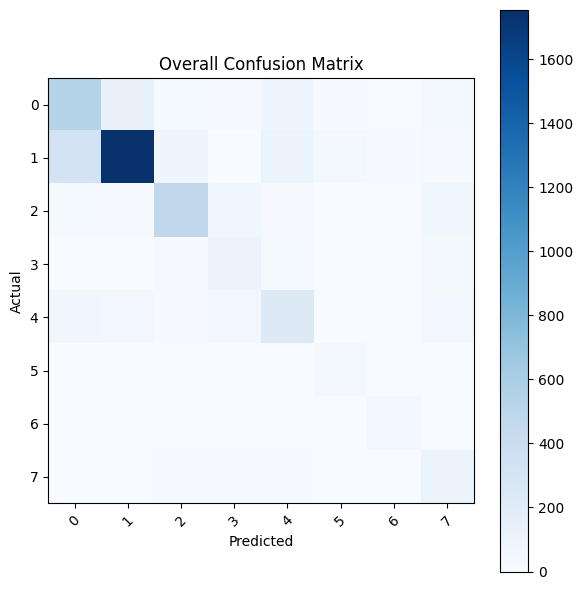

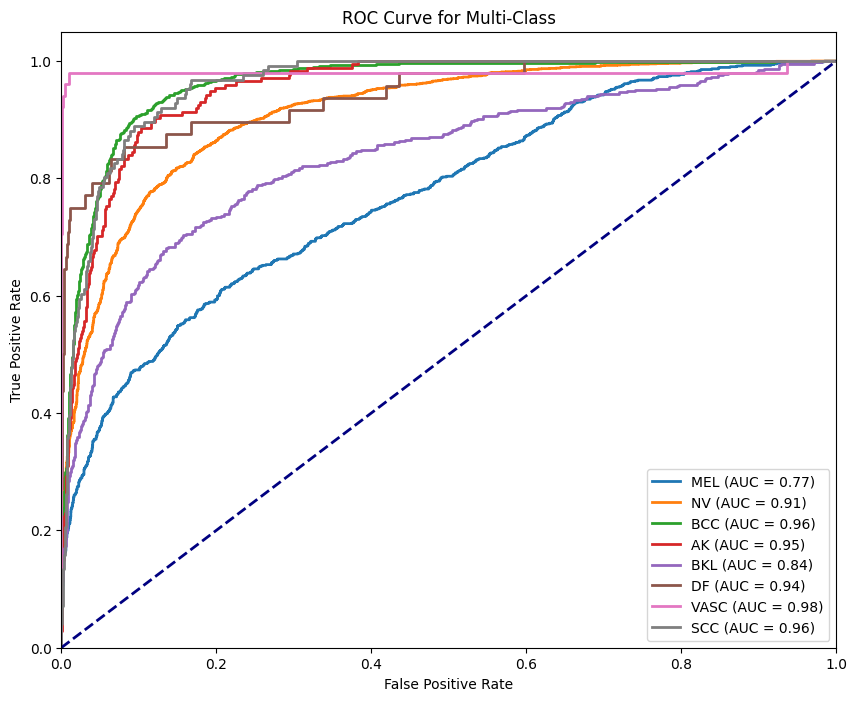

In [24]:
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import label_binarize
import tqdm

@torch.no_grad()
def test_all_classes(model, dataloader):
    model.eval()
    class_correct = [0] * num_classes  # 用于记录每个类别的正确预测数
    class_total = [0] * num_classes  # 用于记录每个类别的总样本数

    all_true_labels = []
    all_pred_labels = []
    all_scores = []  # 存储模型的输出分数矩阵

    confusion_matrices = []  # 存储每个类别的混淆矩阵

    for images, labels in tqdm.tqdm(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        true_labels = labels.cpu().numpy()
        pred_labels = predicted.cpu().numpy()

        all_true_labels.extend(true_labels)
        all_pred_labels.extend(pred_labels)


        scores = outputs.cpu().numpy()
        all_scores.extend(scores)


        for i in range(len(labels)):
            label = true_labels[i]
            pred = pred_labels[i]
            class_correct[label] += (pred == label)
            class_total[label] += 1

        # 计算混淆矩阵并添加到列表中
        cm = confusion_matrix(true_labels, pred_labels, labels=np.arange(num_classes))
        confusion_matrices.append(cm)

    # 生成整体混淆矩阵
    overall_confusion_matrix = np.sum(confusion_matrices, axis=0)

    # 保存整体混淆矩阵为PDF
    pdf_pages_confusion = PdfPages("overall_confusion_matrix.pdf")
    plt.figure(figsize=(6, 6))
    plt.imshow(overall_confusion_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Overall Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, np.arange(num_classes), rotation=45)
    plt.yticks(tick_marks, np.arange(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    pdf_pages_confusion.savefig()
    pdf_pages_confusion.close()

    for i in range(num_classes):
        class_name = int_to_classes_isic[i]
        accuracy = class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0

        # 计算F1分数
        f1 = f1_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        # 计算召回率
        recall = recall_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        print(f"Class {class_name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    y_true_binary = label_binarize(all_true_labels, classes=np.arange(num_classes))

     # 获取类别名称
    class_names = [int_to_classes_isic[i] for i in range(num_classes)]

    return y_true_binary, np.array(all_scores), class_names



# 调用函数测试所有类别
# 调用函数获取真实标签和模型分数
# 调用函数获取真实标签和模型分数
y_true_binary, scores, class_names = test_all_classes(Globals.model1, ISICEmbTestLoader)

# 调用绘制ROC曲线函数
num_classes = 8 # 请确保设置正确的类别数量
# 调用函数绘制多类别ROC曲线并保存为PDF
pdf_filename = "multiclass_roc_curve.pdf"
plot_multiclass_roc(y_true_binary, scores, num_classes, class_names, pdf_filename)

Class MEL - Accuracy: 0.6639, F1 Score: 0.6005, Recall: 0.6639
Class NV - Accuracy: 0.7582, F1 Score: 0.8247, Recall: 0.7582
Class BCC - Accuracy: 0.7323, F1 Score: 0.7351, Recall: 0.7323
Class AK - Accuracy: 0.7011, F1 Score: 0.4656, Recall: 0.7011
Class BKL - Accuracy: 0.5625, F1 Score: 0.5096, Recall: 0.5625
Class DF - Accuracy: 0.7500, F1 Score: 0.5625, Recall: 0.7500
Class VASC - Accuracy: 0.9216, F1 Score: 0.8785, Recall: 0.9216
Class SCC - Accuracy: 0.0476, F1 Score: 0.0805, Recall: 0.0476

100%|██████████| 146/146 [00:13<00:00, 11.00it/s]


Class MEL - Accuracy: 0.4446, F1 Score: 0.4689, Recall: 0.4446
Class NV - Accuracy: 0.7271, F1 Score: 0.7907, Recall: 0.7271
Class BCC - Accuracy: 0.5925, F1 Score: 0.6438, Recall: 0.5925
Class AK - Accuracy: 0.3736, F1 Score: 0.3385, Recall: 0.3736
Class BKL - Accuracy: 0.5112, F1 Score: 0.4412, Recall: 0.5112
Class DF - Accuracy: 0.5625, F1 Score: 0.2151, Recall: 0.5625
Class VASC - Accuracy: 0.9608, F1 Score: 0.4645, Recall: 0.9608
Class SCC - Accuracy: 0.4683, F1 Score: 0.3155, Recall: 0.4683


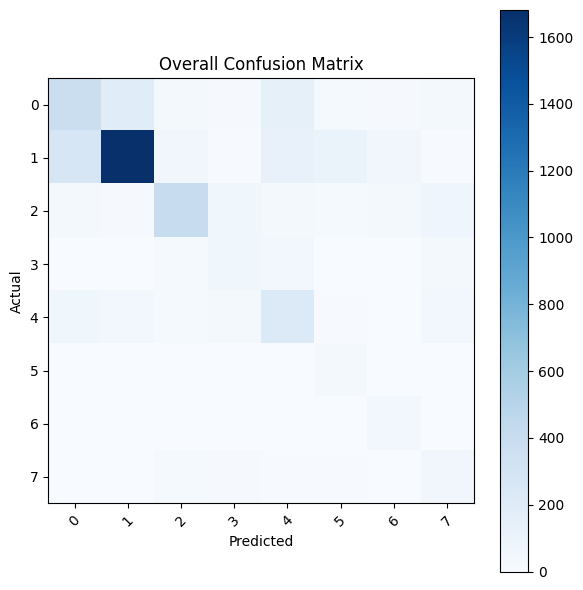

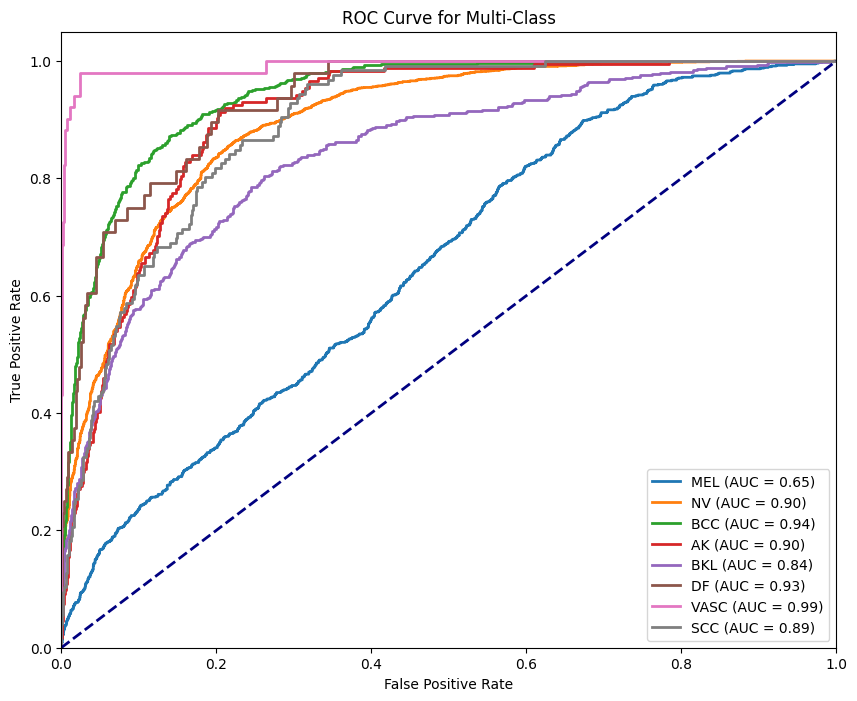

In [39]:
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import label_binarize
import tqdm

@torch.no_grad()
def test_all_classes(model, dataloader):
    model.eval()
    class_correct = [0] * num_classes  # 用于记录每个类别的正确预测数
    class_total = [0] * num_classes  # 用于记录每个类别的总样本数

    all_true_labels = []
    all_pred_labels = []
    all_scores = []  # 存储模型的输出分数矩阵

    confusion_matrices = []  # 存储每个类别的混淆矩阵

    for images, labels in tqdm.tqdm(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        true_labels = labels.cpu().numpy()
        pred_labels = predicted.cpu().numpy()

        all_true_labels.extend(true_labels)
        all_pred_labels.extend(pred_labels)


        scores = outputs.cpu().numpy()
        all_scores.extend(scores)


        for i in range(len(labels)):
            label = true_labels[i]
            pred = pred_labels[i]
            class_correct[label] += (pred == label)
            class_total[label] += 1

        # 计算混淆矩阵并添加到列表中
        cm = confusion_matrix(true_labels, pred_labels, labels=np.arange(num_classes))
        confusion_matrices.append(cm)

    # 生成整体混淆矩阵
    overall_confusion_matrix = np.sum(confusion_matrices, axis=0)

    # 保存整体混淆矩阵为PDF
    pdf_pages_confusion = PdfPages("overall_confusion_matrix.pdf")
    plt.figure(figsize=(6, 6))
    plt.imshow(overall_confusion_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Overall Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, np.arange(num_classes), rotation=45)
    plt.yticks(tick_marks, np.arange(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    pdf_pages_confusion.savefig()
    pdf_pages_confusion.close()

    for i in range(num_classes):
        class_name = int_to_classes_isic[i]
        accuracy = class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0

        # 计算F1分数
        f1 = f1_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        # 计算召回率
        recall = recall_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        print(f"Class {class_name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    y_true_binary = label_binarize(all_true_labels, classes=np.arange(num_classes))

     # 获取类别名称
    class_names = [int_to_classes_isic[i] for i in range(num_classes)]

    return y_true_binary, np.array(all_scores), class_names



# 调用函数测试所有类别
# 调用函数获取真实标签和模型分数
# 调用函数获取真实标签和模型分数
y_true_binary, scores, class_names = test_all_classes(Globals.model1, ISICEmbTestLoader)

# 调用绘制ROC曲线函数
num_classes = 8 # 请确保设置正确的类别数量
# 调用函数绘制多类别ROC曲线并保存为PDF
pdf_filename = "multiclass_roc_curve.pdf"
plot_multiclass_roc(y_true_binary, scores, num_classes, class_names, pdf_filename)

100%|██████████| 146/146 [00:11<00:00, 13.18it/s]


Class MEL - Accuracy: 0.6253, F1 Score: 0.4950, Recall: 0.6253
Class NV - Accuracy: 0.5917, F1 Score: 0.7185, Recall: 0.5917
Class BCC - Accuracy: 0.6226, F1 Score: 0.6592, Recall: 0.6226
Class AK - Accuracy: 0.4483, F1 Score: 0.3796, Recall: 0.4483
Class BKL - Accuracy: 0.4464, F1 Score: 0.4444, Recall: 0.4464
Class DF - Accuracy: 0.6250, F1 Score: 0.3077, Recall: 0.6250
Class VASC - Accuracy: 0.9804, F1 Score: 0.5917, Recall: 0.9804
Class SCC - Accuracy: 0.5714, F1 Score: 0.3051, Recall: 0.5714


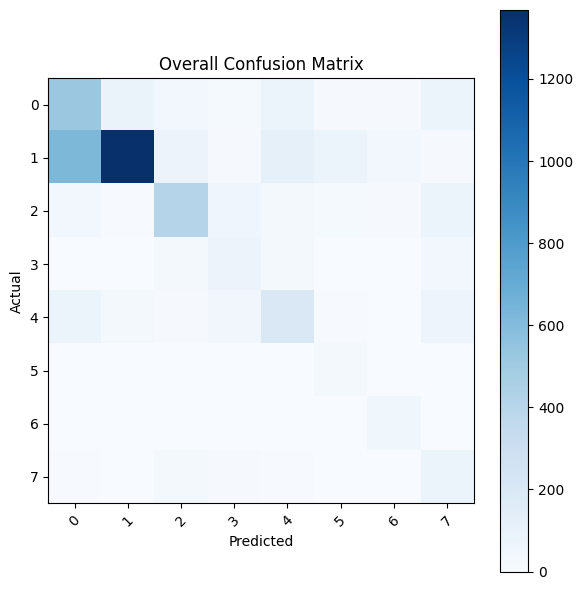

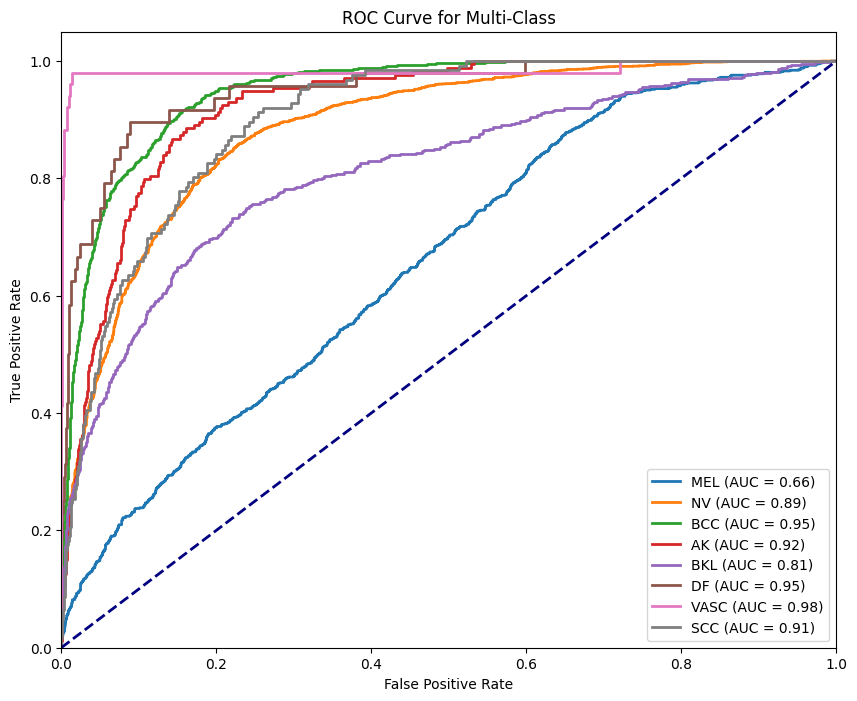

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import label_binarize
import tqdm

@torch.no_grad()
def test_all_classes(model, dataloader):
    model.eval()
    class_correct = [0] * num_classes  # 用于记录每个类别的正确预测数
    class_total = [0] * num_classes  # 用于记录每个类别的总样本数

    all_true_labels = []
    all_pred_labels = []
    all_scores = []  # 存储模型的输出分数矩阵

    confusion_matrices = []  # 存储每个类别的混淆矩阵

    for images, labels in tqdm.tqdm(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        true_labels = labels.cpu().numpy()
        pred_labels = predicted.cpu().numpy()

        all_true_labels.extend(true_labels)
        all_pred_labels.extend(pred_labels)


        scores = outputs.cpu().numpy()
        all_scores.extend(scores)


        for i in range(len(labels)):
            label = true_labels[i]
            pred = pred_labels[i]
            class_correct[label] += (pred == label)
            class_total[label] += 1

        # 计算混淆矩阵并添加到列表中
        cm = confusion_matrix(true_labels, pred_labels, labels=np.arange(num_classes))
        confusion_matrices.append(cm)

    # 生成整体混淆矩阵
    overall_confusion_matrix = np.sum(confusion_matrices, axis=0)

    # 保存整体混淆矩阵为PDF
    pdf_pages_confusion = PdfPages("overall_confusion_matrix.pdf")
    plt.figure(figsize=(6, 6))
    plt.imshow(overall_confusion_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Overall Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, np.arange(num_classes), rotation=45)
    plt.yticks(tick_marks, np.arange(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    pdf_pages_confusion.savefig()
    pdf_pages_confusion.close()

    for i in range(num_classes):
        class_name = int_to_classes_isic[i]
        accuracy = class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0

        # 计算F1分数
        f1 = f1_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        # 计算召回率
        recall = recall_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        print(f"Class {class_name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    y_true_binary = label_binarize(all_true_labels, classes=np.arange(num_classes))

     # 获取类别名称
    class_names = [int_to_classes_isic[i] for i in range(num_classes)]

    return y_true_binary, np.array(all_scores), class_names



# 调用函数测试所有类别
# 调用函数获取真实标签和模型分数
# 调用函数获取真实标签和模型分数
y_true_binary, scores, class_names = test_all_classes(Globals.model1, ISICEmbTestLoader)

# 调用绘制ROC曲线函数
num_classes = 8 # 请确保设置正确的类别数量
# 调用函数绘制多类别ROC曲线并保存为PDF
pdf_filename = "multiclass_roc_curve.pdf"
plot_multiclass_roc(y_true_binary, scores, num_classes, class_names, pdf_filename)

100%|██████████| 146/146 [00:06<00:00, 24.19it/s]


Class MEL - Accuracy: 0.6181, F1 Score: 0.5758, Recall: 0.6181
Class NV - Accuracy: 0.6951, F1 Score: 0.7914, Recall: 0.6951
Class BCC - Accuracy: 0.6286, F1 Score: 0.6990, Recall: 0.6286
Class AK - Accuracy: 0.5805, F1 Score: 0.4335, Recall: 0.5805
Class BKL - Accuracy: 0.5580, F1 Score: 0.4669, Recall: 0.5580
Class DF - Accuracy: 0.7500, F1 Score: 0.2562, Recall: 0.7500
Class VASC - Accuracy: 0.9804, F1 Score: 0.6757, Recall: 0.9804
Class SCC - Accuracy: 0.4365, F1 Score: 0.3630, Recall: 0.4365


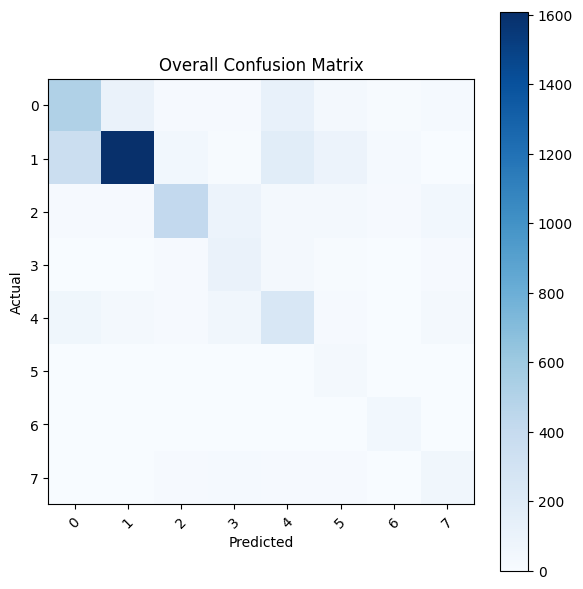

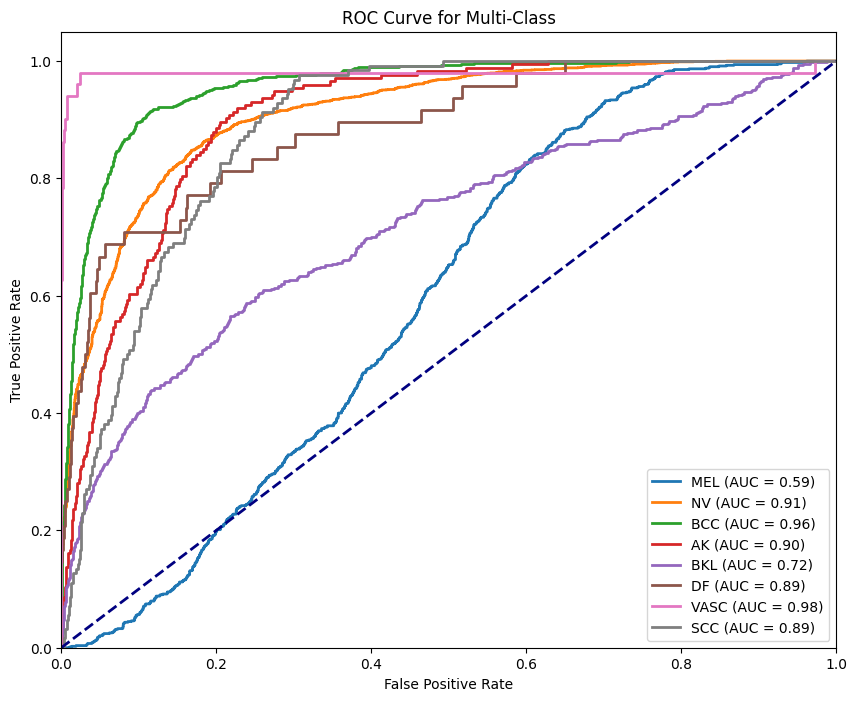

In [ ]:
#@title unsampled

import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import label_binarize
import tqdm

@torch.no_grad()
def test_all_classes(model, dataloader):
    model.eval()
    class_correct = [0] * num_classes  # 用于记录每个类别的正确预测数
    class_total = [0] * num_classes  # 用于记录每个类别的总样本数

    all_true_labels = []
    all_pred_labels = []
    all_scores = []  # 存储模型的输出分数矩阵

    confusion_matrices = []  # 存储每个类别的混淆矩阵

    for images, labels in tqdm.tqdm(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        true_labels = labels.cpu().numpy()
        pred_labels = predicted.cpu().numpy()

        all_true_labels.extend(true_labels)
        all_pred_labels.extend(pred_labels)


        scores = outputs.cpu().numpy()
        all_scores.extend(scores)


        for i in range(len(labels)):
            label = true_labels[i]
            pred = pred_labels[i]
            class_correct[label] += (pred == label)
            class_total[label] += 1

        # 计算混淆矩阵并添加到列表中
        cm = confusion_matrix(true_labels, pred_labels, labels=np.arange(num_classes))
        confusion_matrices.append(cm)

    # 生成整体混淆矩阵
    overall_confusion_matrix = np.sum(confusion_matrices, axis=0)

    # 保存整体混淆矩阵为PDF
    pdf_pages_confusion = PdfPages("overall_confusion_matrix.pdf")
    plt.figure(figsize=(6, 6))
    plt.imshow(overall_confusion_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Overall Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, np.arange(num_classes), rotation=45)
    plt.yticks(tick_marks, np.arange(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    pdf_pages_confusion.savefig()
    pdf_pages_confusion.close()

    for i in range(num_classes):
        class_name = int_to_classes_isic[i]
        accuracy = class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0

        # 计算F1分数
        f1 = f1_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        # 计算召回率
        recall = recall_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        print(f"Class {class_name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    y_true_binary = label_binarize(all_true_labels, classes=np.arange(num_classes))

     # 获取类别名称
    class_names = [int_to_classes_isic[i] for i in range(num_classes)]

    return y_true_binary, np.array(all_scores), class_names



# 调用函数测试所有类别
# 调用函数获取真实标签和模型分数
# 调用函数获取真实标签和模型分数
y_true_binary, scores, class_names = test_all_classes(Globals.model2, ISICEmbTestLoader)

# 调用绘制ROC曲线函数
num_classes = 8 # 请确保设置正确的类别数量
# 调用函数绘制多类别ROC曲线并保存为PDF
pdf_filename = "multiclass_roc_curve.pdf"
plot_multiclass_roc(y_true_binary, scores, num_classes, class_names, pdf_filename)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from matplotlib.backends.backend_pdf import PdfPages

def plot_multiclass_roc(y_true, y_score, num_classes, class_names, pdf_filename):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class')
    plt.legend(loc="lower right")

    # 保存为PDF
    pdf_pages = PdfPages(pdf_filename)
    pdf_pages.savefig()
    pdf_pages.close()

4654
4654
Class MEL - Accuracy: 0.5337, F1 Score: 0.5647, Recall: 0.5337
Class NV - Accuracy: 0.8032, F1 Score: 0.8363, Recall: 0.8032
Class BCC - Accuracy: 0.7609, F1 Score: 0.6932, Recall: 0.7609
Class AK - Accuracy: 0.4655, F1 Score: 0.4355, Recall: 0.4655
Class BKL - Accuracy: 0.5312, F1 Score: 0.5005, Recall: 0.5312
Class DF - Accuracy: 0.4375, F1 Score: 0.3684, Recall: 0.4375
Class VASC - Accuracy: 0.9412, F1 Score: 0.6713, Recall: 0.9412
Class SCC - Accuracy: 0.4444, F1 Score: 0.4341, Recall: 0.4444


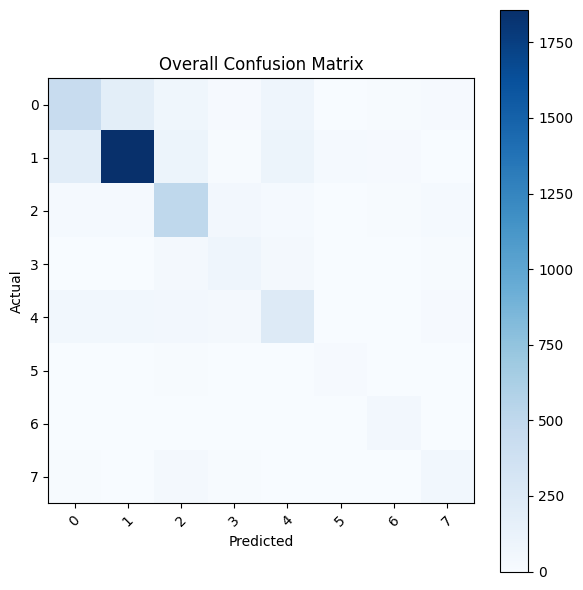

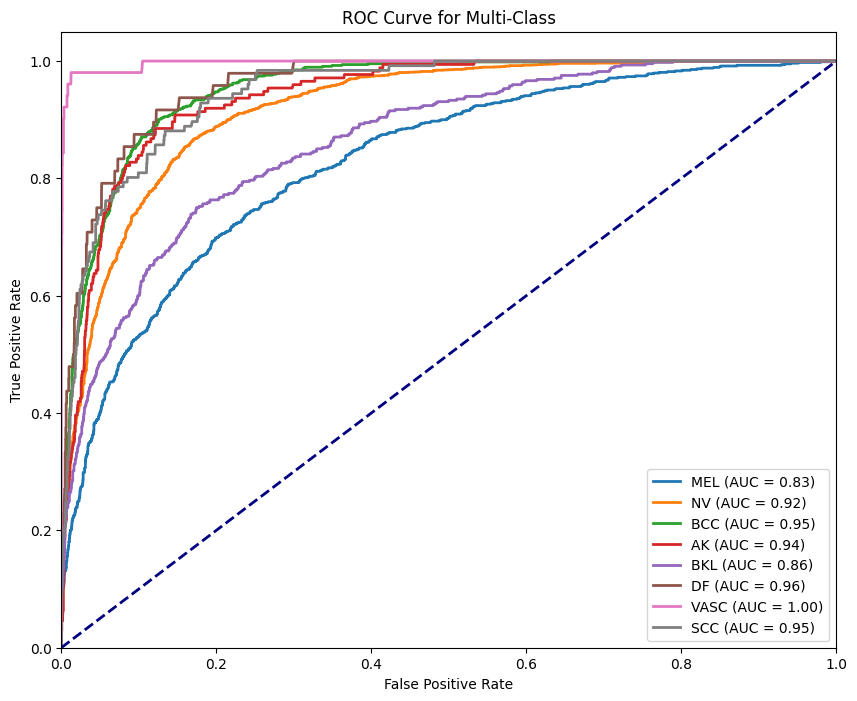

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import label_binarize
import tqdm

@torch.no_grad()
def test_all_classes(model, test_data, test_labels):

    class_correct = [0] * num_classes  # 用于记录每个类别的正确预测数
    class_total = [0] * num_classes  # 用于记录每个类别的总样本数

    all_true_labels = []
    all_pred_labels = []
    all_scores = []  # 存储模型的输出分数矩阵

    confusion_matrices = []  # 存储每个类别的混淆矩阵

    outputs = model.predict(test_data)
    scores = model.predict_proba(test_data)
    #_, predicted = torch.max(outputs, 1)

    true_labels = test_labels
    pred_labels = outputs

    all_true_labels.extend(true_labels)
    all_pred_labels.extend(pred_labels)


    #scores = outputs.cpu().numpy()
    #all_scores.extend(scores)


    for i in range(len(true_labels)):
        label = int(true_labels[i])
        pred = int(pred_labels[i])
        class_correct[label] += (pred == label)
        class_total[label] += 1
    print(len(true_labels))
    print(len(pred_labels))
        # 计算混淆矩阵并添加到列表中
    cm = confusion_matrix(true_labels, pred_labels, labels=np.arange(num_classes))
    confusion_matrices.append(cm)

    # 生成整体混淆矩阵
    overall_confusion_matrix = np.sum(confusion_matrices, axis=0)

    # 保存整体混淆矩阵为PDF
    pdf_pages_confusion = PdfPages("overall_confusion_matrix.pdf")
    plt.figure(figsize=(6, 6))
    plt.imshow(overall_confusion_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Overall Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, np.arange(num_classes), rotation=45)
    plt.yticks(tick_marks, np.arange(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    pdf_pages_confusion.savefig()
    pdf_pages_confusion.close()

    for i in range(num_classes):
        class_name = int_to_classes_isic[i]
        accuracy = class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0

        # 计算F1分数
        f1 = f1_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        # 计算召回率
        recall = recall_score(all_true_labels, all_pred_labels, labels=[i], average='weighted')

        print(f"Class {class_name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    y_true_binary = label_binarize(all_true_labels, classes=np.arange(num_classes))

     # 获取类别名称
    class_names = [int_to_classes_isic[i] for i in range(num_classes)]

    return y_true_binary, np.array(scores), class_names



# 调用函数测试所有类别
# 调用函数获取真实标签和模型分数
# 调用函数获取真实标签和模型分数
y_true_binary, scores, class_names = test_all_classes(brf, isic_test_embeddings, isic_test_labels)

# 调用绘制ROC曲线函数
num_classes = 8 # 请确保设置正确的类别数量
# 调用函数绘制多类别ROC曲线并保存为PDF
pdf_filename = "multiclass_roc_curve.pdf"
plot_multiclass_roc(y_true_binary, scores, num_classes, class_names, pdf_filename)